TEAM A1

Gabriel Anzalone- 80543

Daniel Granados Olvera- 102453

Jules Remlinger- 73178
___

# Value Strategy

In this notebook, we combine monthly fundamental ratios and price data from  WRDS API to develop trading strategies based on the evolution of P/E and P/B of companies over time.

We first detail an historical long-only trading strategy, where buy and sell signals are triggered based on the monthly evolution of these ratios compared to their historical averages.

We then move to a machine learning approach using a Random Forest Regressor to predict the next P/E and P/B ratios and see if they are above or below the historical average.

This notebook is designed to run on Google Colab.
To improve efficiency for the reader, some time-consuming parts of the code have already been executed and saved into Pickle files, allowing the reader to skip them when running the code and directly focus on strategy design.

## 1. Importations

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import zipfile
from collections import Counter
from itertools import combinations
import warnings
warnings.filterwarnings("ignore")
from google.colab import drive
drive.mount('/content/drive')
from tqdm import tqdm
import pickle

import random
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, roc_auc_score
from sklearn.preprocessing import StandardScaler
from tabulate import tabulate

Mounted at /content/drive


## 2. Loading Data

We fetch data directly from WRDS both for adjusted close prices and fundamental ratios. It allows us to get the set of companies in the S&P500 over time and not an increasing set of tickers over the period (what we actually had with Kaggle because of survivor bias).

In [ ]:
pip install wrds

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 38.8 MB/s eta 0:00:00


In [ ]:
# We first connect via the WRDS API
import wrds
conn = wrds.Connection()

Enter your WRDS username [root]:ganzalone
Enter your password:··········
WRDS recommends setting up a .pgpass file.
Create .pgpass file now [y/n]?: y
Created .pgpass file successfully.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done


We fetch the prices of the constituents of the S&P500 over time and adjust it for any corporate action with the adjustment factor **cfacshr**.

In [ ]:
def fetch_wrds_data():
# Select daily returns, fully-adjusted price (splits & dividends), and split-adjusted volume
# for S&P 500 constituents from 2008-01–01 through 2022–01–01

  query = '''
  SELECT
      dsf.date,
      dsf.permno,
      link.gvkey,
      dsf.ret,                                   -- CRSP total return (split & dividend adjusted)
      ABS(dsf.prc) / dsf.cfacpr AS prc_adj,      -- price adjusted for all splits & distributions
      dsf.vol / dsf.cfacshr AS vol_adj,          -- volume adjusted for splits only
      names.ticker,
      names.comnam
  FROM crsp.msp500list      AS sp
  JOIN crsp.dsf             AS dsf
    ON dsf.permno = sp.permno
    AND dsf.date BETWEEN sp.start AND sp.ending
  JOIN crsp.msenames        AS names
    ON dsf.permno = names.permno
    AND dsf.date BETWEEN names.namedt AND COALESCE(names.nameendt, '9999-12-31')
  JOIN crsp.ccmxpf_linktable AS link
    ON dsf.permno = link.lpermno
    AND dsf.date BETWEEN link.linkdt AND COALESCE(link.linkenddt, '9999-12-31')
    AND link.linktype IN ('LU','LC')
    AND link.linkprim IN ('P','C')
  JOIN comp.company AS co
    ON co.gvkey = link.gvkey
  WHERE dsf.date BETWEEN '2008-01-01' AND '2022-01-01'
  ORDER BY dsf.permno, dsf.date;

  '''
  return conn.raw_sql(query, date_cols=['date'])

# Fetch WRDS returns
data = fetch_wrds_data()

In [ ]:
data

,date,permno,gvkey,ret,prc_adj,vol_adj,ticker,comnam
0,2008-01-02,10078,012136,-0.039162,17.42,11338448.0,JAVA,SUN MICROSYSTEMS INC
1,2008-01-03,10078,012136,-0.0155,17.15,9660955.0,JAVA,SUN MICROSYSTEMS INC
2,2008-01-04,10078,012136,-0.04898,16.31,13884504.0,JAVA,SUN MICROSYSTEMS INC
3,2008-01-07,10078,012136,-0.012262,16.11,15257281.0,JAVA,SUN MICROSYSTEMS INC
4,2008-01-08,10078,012136,-0.015518,15.86,12592171.0,JAVA,SUN MICROSYSTEMS INC
...,...,...,...,...,...,...,...,...
259302,2021-12-27,93436,184996,0.025248,364.646647,7898416.333333,TSLA,TESLA INC
259303,2021-12-28,93436,184996,-0.005,362.823323,6675175.333333,TSLA,TESLA INC
259304,2021-12-29,93436,184996,-0.002095,362.063313,6233222.333333,TSLA,TESLA INC
259305,2021-12-30,93436,184996,-0.014592,356.77999,5198494.666667,TSLA,TESLA INC


We also fetch the fundamental ratios (P/E and P/B ratios) via **wrds_ratios**.

In [ ]:
gvkeys = data['gvkey'].unique()
gvkeys_str = "', '".join(gvkeys.astype(str))

# We look for the P/E and PtB ratios with the gvkey
query_ratios = f"""
SELECT gvkey, public_date AS date, pe_exi AS pe_ratio, ptb AS pb_ratio
FROM comp.wrds_ratios
WHERE gvkey IN ('{gvkeys_str}')
  AND public_date BETWEEN '2008-01-01' AND '2022-01-01'
  AND pe_exi IS NOT NULL
  AND ptb IS NOT NULL
"""
ratios = conn.raw_sql(query_ratios, date_cols=['date'])

In [ ]:
# We create a copy of the daily dataset and resample it monthly (as we only have monthly P/E and P/B ratios on the last date of each month)
df = data[['date', 'gvkey', 'permno', 'ticker', 'ret', 'prc_adj']].copy()
df.set_index('date', inplace=True)

# We keep last adj close of the month and the cumulative return over the monthly period
df = data[['date', 'gvkey', 'permno', 'ticker', 'ret', 'prc_adj']].copy()
df.set_index('date', inplace=True)

data_monthly = (
    df.groupby(['gvkey', 'permno', 'ticker'])
      .resample('M')
      .agg({'ret': 'sum', 'prc_adj': 'last'})
      .reset_index()
)

In [ ]:
monthly_ratios = pd.merge(
    data_monthly,
    ratios,
    how='inner',
    on=['gvkey', 'date']
)

In [ ]:
monthly_ratios = monthly_ratios[['date', 'gvkey', 'permno', 'ticker', 'ret', 'prc_adj', 'pe_ratio', 'pb_ratio']]
monthly_ratios.set_index('date', inplace=True)
monthly_ratios = monthly_ratios.drop(columns=['gvkey', 'permno'])
monthly_ratios = monthly_ratios.rename(columns={
    'prc_adj': 'Adjusted Close',
    'pe_ratio': 'P/E Ratio',
    'pb_ratio': 'P/B Ratio',
    'ticker': 'Ticker',
    'ret': 'Return'
})
monthly_ratios

,Ticker,Return,Adjusted Close,P/E Ratio,P/B Ratio
date,,,,,
2015-03-31,AAL,-0.053166,52.78,13.430025,18.119157
2015-04-30,AAL,-0.082028,48.285,12.28626,16.576042
2015-05-31,AAL,-0.122133,42.37,9.271335,10.635437
2015-06-30,AAL,-0.053745,39.935,8.738512,9.800098
2015-07-31,AAL,0.010719,40.1,8.774617,9.840589
...,...,...,...,...,...
2019-07-31,WCG,0.009071,287.25,28.328402,3.183147
2019-08-31,WCG,-0.057598,270.73999,26.057748,2.87191
2019-09-30,WCG,-0.042705,259.17001,24.944177,2.749399


We now have a monthly dataset with the different tickers, the prices adjusted with the **cfacshr** factor and the fundamental ratios.

## 3. Inspecting the Data

### 3.1. Survivor Bias discussion

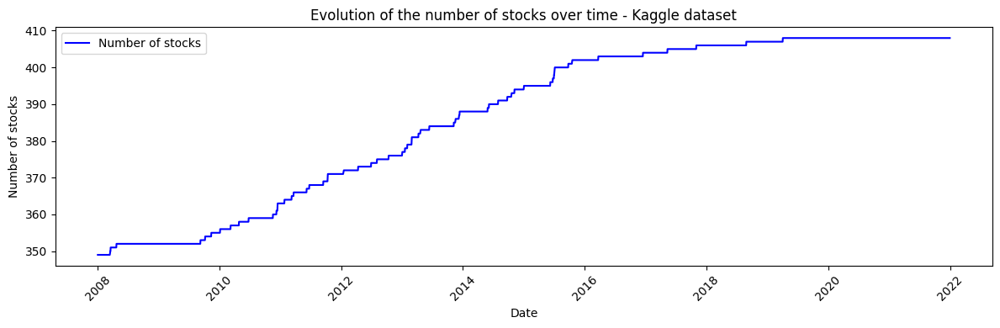

In [ ]:
# If the reader does not run the entire code of this notebook, he can see below the graph for the evolution of the number of tickers within the Kaggle dataset.
# Otherwise, the latter will disappear as we made the choice to only work with WRDS / CRSP data in our notebooks.
# The problem with Kaggle dataset is that it is incomplete: it does not include the 500 components of the S&P500 index consistently over the period.
# There is survivor bias: the dataset goes up to 408 tickers at maximum and mostly includes companies that made it to 2022.
# Most companies delisted before (or some that exited the index) are not in the Kaggle dataset.

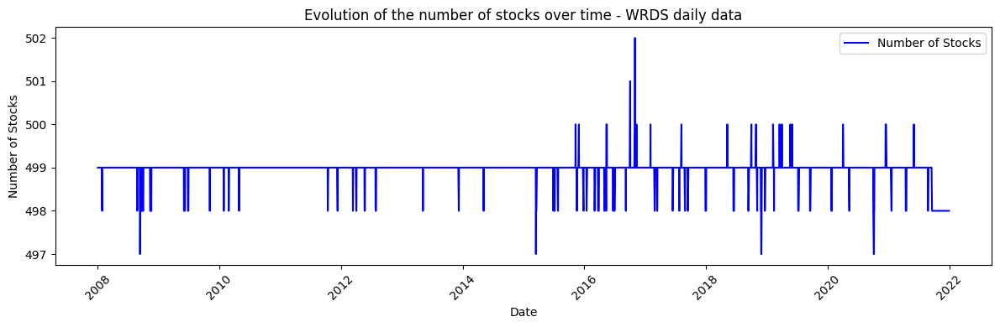

In [ ]:
# Doing the same when fetching daily data from CRSP / WRDS
stocks_per_date_wrds = data.groupby(data['date'])['ticker'].nunique()
plt.figure(figsize=(12, 4))
plt.plot(stocks_per_date_wrds.index, stocks_per_date_wrds.values, label='Number of Stocks', color='blue')
plt.xlabel('Date')
plt.ylabel('Number of Stocks')
plt.title('Evolution of the number of stocks over time - WRDS daily data')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend()
plt.show()

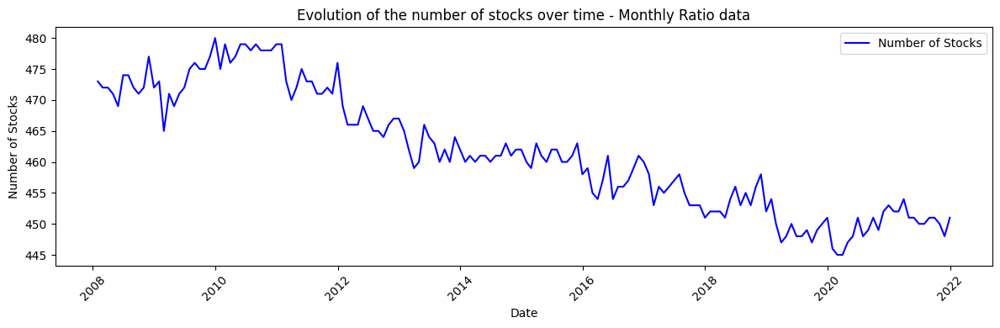

In [ ]:
# Doing the same with the merged monthly dataset we have accounting for the fundamental ratios
stocks_per_date_ratios = monthly_ratios.groupby(monthly_ratios.index)['Ticker'].nunique()
plt.figure(figsize=(12, 4))
plt.plot(stocks_per_date_ratios.index, stocks_per_date_ratios.values, label='Number of Stocks', color='blue')
plt.xlabel('Date')
plt.ylabel('Number of Stocks')
plt.title('Evolution of the number of stocks over time - Monthly Ratio data')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend()
plt.show()

When we directly fetch data from CSRP S&P500 constituents over the period we have a constant number of tickers around 500.

But when we add the second query for the monthly ratios (with the gvkey from WRDS), we lose some of the 500 constant stocks and have more variability in the data.

However, we still have more tickers over the period than with Kaggle.

In [ ]:
# Some duplicates between the pairs of permno / gvkey could also explain this variability
# But we have very little pairs of duplicate throughout the period
duplicates = data[['gvkey', 'permno']].drop_duplicates()
dup_gvkeys = duplicates['gvkey'].value_counts()
print(dup_gvkeys[dup_gvkeys > 1].head(10))

gvkey
029984    2
006268    2
004060    2
002270    2
005568    2
026061    2
005073    2
010121    2
025124    2
007637    2
Name: count, dtype: Int64


We therefore continue with the monthly_ratios data, containing the monthly adjusted closes and fundamental ratios for more than 445 stocks consistently over the whole period.

### 3.2. Handling N/A

In [ ]:
print(monthly_ratios[['P/E Ratio', 'P/B Ratio', 'Adjusted Close']].isna().sum())

P/E Ratio           0
P/B Ratio           0
Adjusted Close    229
dtype: int64


We have some N/A in the monthly_ratios dataset.

These N/A only appear in the Adjusted Close column.

We have to clear data in order to be efficient when computing the PnL thereafter.

In [ ]:
# Computing the N/A per each stock and the percentage of data it represents
na_counts = monthly_ratios.groupby('Ticker')['Adjusted Close'].apply(lambda x: x.isna().sum())
na_pct = monthly_ratios.groupby('Ticker')['Adjusted Close'].apply(lambda x: x.isna().mean() * 100)

na_adjusted_close = pd.DataFrame({'Missing Values': na_counts,'Missing %': na_pct}).sort_values(by='Missing Values', ascending=False)
print(na_adjusted_close.head())

        Missing Values  Missing %
Ticker                           
TER                 80  47.619048
GGP                 57  45.600000
BMS                 53  38.686131
AMD                 32  21.768707
LW                   7  20.000000


The N/A are concentrated within a list of less than 10 tickers.

We decide to drop these tickers from the main dataset, as data emerging from tickers that contain up to 50% missing values is not exploitable.

In [ ]:
tickers_to_drop = na_adjusted_close[na_adjusted_close['Missing Values'] > 0].index.tolist()
tickers_to_drop

['TER', 'GGP', 'BMS', 'AMD', 'LW']

In [ ]:
# We drop them all from the dataset:
monthly_ratios = monthly_ratios[~monthly_ratios['Ticker'].isin(tickers_to_drop)].copy()

### 3.3. Extreme cases

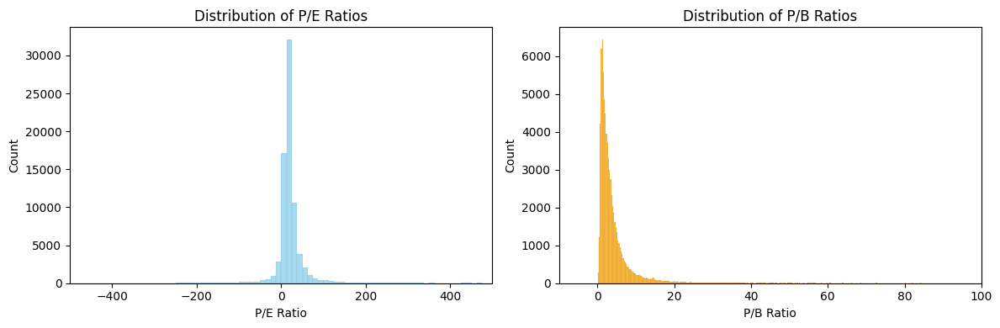

In [ ]:
# Looking at the distribution of the fundamental Ratios
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(monthly_ratios['P/E Ratio'], bins=1000, kde=False, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of P/E Ratios')
axes[0].set_xlim(-500, 500)
axes[0].set_xlabel('P/E Ratio')

sns.histplot(monthly_ratios['P/B Ratio'], bins=1000, kde=False, ax=axes[1], color='orange')
axes[1].set_title('Distribution of P/B Ratios')
axes[1].set_xlim(-10, 100)
axes[1].set_xlabel('P/B Ratio')

plt.tight_layout()
plt.show()

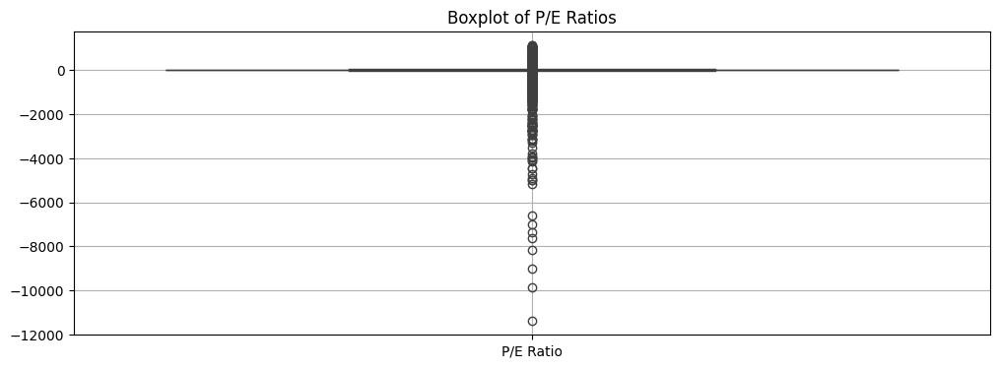

In [ ]:
plt.figure(figsize=(12, 4))
sns.boxplot(data=monthly_ratios[['P/E Ratio']])
plt.title("Boxplot of P/E Ratios")
plt.grid(True)
plt.show()

Even though most P/E and PtB ratios are positive in the data and appear coherent (most P/E Ratios being positive and between 0 and 20 and most P/B Ratios being between 0 and 10), we observe some extreme cases that might influence the future outputs.

In [ ]:
# If we look at the 10 lowest P/E Ratios we have over the period:
low_pe = monthly_ratios.sort_values(by='P/E Ratio').head(10)
print(low_pe[['Ticker', 'P/E Ratio']])

           Ticker     P/E Ratio
date                           
2008-05-31    DYN -11387.096774
2008-06-30    DYN       -9875.0
2008-07-31    DYN       -9000.0
2008-08-31    DYN  -8136.057821
2009-09-30    DYN       -7600.0
2009-10-31    DYN  -7333.333333
2009-08-31    DYN     -6999.965
2008-08-31    MOT  -6594.000132
2018-05-31    APC  -5181.776728
2008-09-30    MOT    -4998.0001


We observe some tickers with extremely negative (-11,000) P/E Ratios.

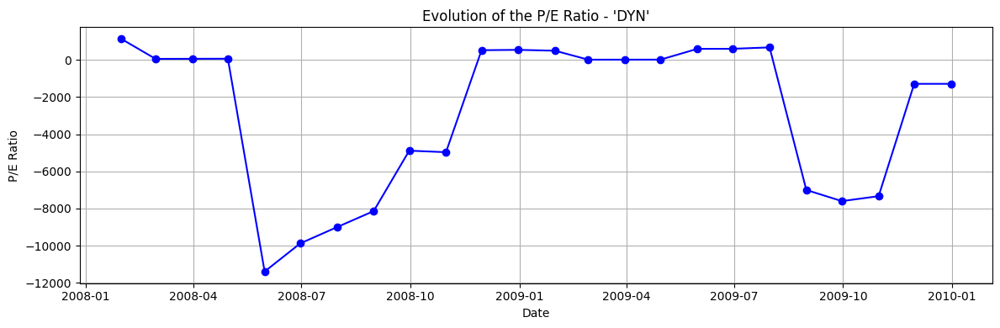

In [ ]:
dyn_data = monthly_ratios[monthly_ratios['Ticker'] == 'DYN']
plt.figure(figsize=(12, 4))
plt.plot(dyn_data.index, dyn_data['P/E Ratio'], marker='o', linestyle='-', color='blue')
plt.title("Evolution of the P/E Ratio - 'DYN'")
plt.xlabel("Date")
plt.ylabel("P/E Ratio")
plt.grid(True)
plt.tight_layout()
plt.show()

When we plot the evolution of the P/E Ratio for the stock displaying the 6 lowest P/E Ratios on the whole period, we observe extreme variability and extreme negative P/E Ratio (even though we only have data up to 2010 for this stock).

We do not alter the dataset, in order to test the strategies on real data, but we will need to take these discrepancies into consideration in our final analysis.

### 3.4. Use of the EWMean

When considering whether a stock appears undervalued or overvalued, we compare its current P/E (or P/B) ratio to its own historical average. We have three different ways to compute the latter:

- **Expanding Mean**: the average of all past P/E (or P/B) ratios since the stock’s first monthly date.

- **Expanding Median**: the median of all past values up to the current month.

- **Exponentially Weighted Mean (EWMean)**: a weighted average where recent ratios have more influence. We use a span of 12 months, which means that older values gradually lose importance over time (12 months to lose half its significance).

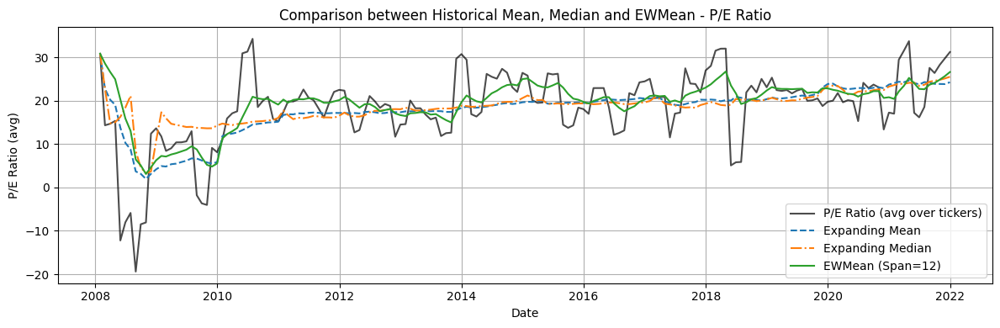

In [ ]:
df = monthly_ratios.copy().sort_values(['Ticker', 'date'])
df['ExpandingMeanPE'] = df.groupby('Ticker')['P/E Ratio'].expanding().mean().reset_index(level=0, drop=True)
df['ExpandingMedianPE'] = df.groupby('Ticker')['P/E Ratio'].expanding().median().reset_index(level=0, drop=True)
df['EWMeanPE'] = df.groupby('Ticker')['P/E Ratio'].transform(lambda x: x.ewm(span=12, adjust=False).mean())

# Cross sectionnal mean of the metrics every month
ew_df = df.groupby('date')[['P/E Ratio', 'ExpandingMeanPE', 'ExpandingMedianPE', 'EWMeanPE']].mean()

plt.figure(figsize=(12, 4))
plt.plot(ew_df.index, ew_df['P/E Ratio'], label='P/E Ratio (avg over tickers)', color='black', alpha=0.7)
plt.plot(ew_df.index, ew_df['ExpandingMeanPE'], label='Expanding Mean', linestyle='--')
plt.plot(ew_df.index, ew_df['ExpandingMedianPE'], label='Expanding Median', linestyle='-.')
plt.plot(ew_df.index, ew_df['EWMeanPE'], label='EWMean (Span=12)', linestyle='-')
plt.title("Comparison between Historical Mean, Median and EWMean - P/E Ratio")
plt.xlabel("Date")
plt.ylabel("P/E Ratio (avg)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# If we compare the MSE towards the average P/E Ratio
true_values = ew_df['P/E Ratio']
mse_expanding_mean = mean_squared_error(true_values, ew_df['ExpandingMeanPE'])
mse_expanding_median = mean_squared_error(true_values, ew_df['ExpandingMedianPE'])
mse_ewmean = mean_squared_error(true_values, ew_df['EWMeanPE'])
print(f"Expanding Mean:    {mse_expanding_mean:.4f}")
print(f"Expanding Median:  {mse_expanding_median:.4f}")
print(f"EWMean (span=12):  {mse_ewmean:.4f}")

Expanding Mean:    45.9186
Expanding Median:  55.8419
EWMean (span=12):  43.3620


Expanding median reacts quite slowly to the recent evolutions in average P/E Ratio.

Both Expanding Mean and EWMean (span=12) show better reaction to the recent changes of the average P/E.

EWMean display the lowest MSE towards the average P/E Ratio.

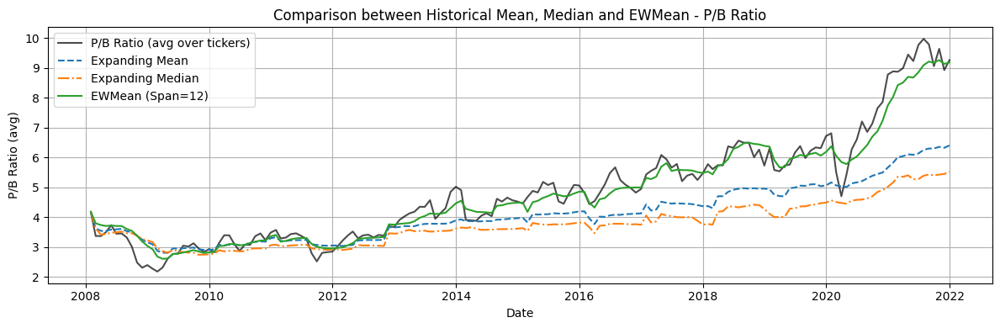

In [ ]:
# Same for P/B
df = monthly_ratios.copy().sort_values(['Ticker', 'date'])
df['ExpandingMeanPB'] = df.groupby('Ticker')['P/B Ratio'].expanding().mean().reset_index(level=0, drop=True)
df['ExpandingMedianPB'] = df.groupby('Ticker')['P/B Ratio'].expanding().median().reset_index(level=0, drop=True)
df['EWMeanPB'] = df.groupby('Ticker')['P/B Ratio'].transform(lambda x: x.ewm(span=12, adjust=False).mean())

# Cross sectionnal mean of the metrics every month
ew_df = df.groupby('date')[['P/B Ratio', 'ExpandingMeanPB', 'ExpandingMedianPB', 'EWMeanPB']].mean()

plt.figure(figsize=(12, 4))
plt.plot(ew_df.index, ew_df['P/B Ratio'], label='P/B Ratio (avg over tickers)', color='black', alpha=0.7)
plt.plot(ew_df.index, ew_df['ExpandingMeanPB'], label='Expanding Mean', linestyle='--')
plt.plot(ew_df.index, ew_df['ExpandingMedianPB'], label='Expanding Median', linestyle='-.')
plt.plot(ew_df.index, ew_df['EWMeanPB'], label='EWMean (Span=12)', linestyle='-')
plt.title("Comparison between Historical Mean, Median and EWMean - P/B Ratio")
plt.xlabel("Date")
plt.ylabel("P/B Ratio (avg)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

The better adaptation of the EWMean to recent changes  becomes even more significant for the average P/B Ratio.

By selecting the EWMean we maximize the likelihood of meaningful crossovers between the current ratio and its historical average (we see that Expanding Mean and Median almost never cross the average ratio after 2014).

In [ ]:
true_values = ew_df['P/B Ratio']
mse_expanding_mean = mean_squared_error(true_values, ew_df['ExpandingMeanPB'])
mse_expanding_median = mean_squared_error(true_values, ew_df['ExpandingMedianPB'])
mse_ewmean = mean_squared_error(true_values, ew_df['EWMeanPB'])
print(f"Expanding Mean:    {mse_expanding_mean:.4f}")
print(f"Expanding Median:  {mse_expanding_median:.4f}")
print(f"EWMean (span=12):  {mse_ewmean:.4f}")

Expanding Mean:    1.4447
Expanding Median:  2.5317
EWMean (span=12):  0.1304


We therefore use the EWMean (span = 12) as historical average indicator for the remaining of the code.

## 5. Historical (long-only)

<b><u>Logic:</b></u>
- Now that we have cleaner data,  we will launch an "historical" Algorithmic Trading both on P/E & P/B Ratios.

<b><u>Trading Logic (long-only):</b></u> for each ticker, we:
- Buy one stock if the current P/E ratio is below the historical P/E ratio average -> undervalued.
- Sell the stock if the current P/E ratio is above the historical P/E ratio average -> overvalued.
- Buy one stock if the current PtB ratio is below the historical PtB ratio average -> undervalued.
- Sell the stock if the current PtB ratio is above the historical PtB ratio average -> overvalued.

<u><b>How do we do it as of now ?</u></b>
- In this historical example, there is no short-selling allowed, so we start to trade only when a buy signal is triggered.
- Example for P/E: we will create a 'Signal_PE' Column with 0 at the begining (buy signal not triggered), 1 when the P/E becomes undervalued e.g when the current P/E Ratio is below the EWMean (buy signal) and -1 when it becomes overvalued (sell signal).
- We will also have a 'Signal Text_PE' column to mark the Trades Signals and to trigger the Buy/Sell orders.

### 5.1. P/E Ratio

In [ ]:
# Function to generate signals for this long-only historical strategy:
def creating_signals(df, ratio_column, signal_column, signal_text_column):
    tickers = df['Ticker'].unique()

    for ticker in tickers: # iterating over each ticker
        ticker_data = df[df['Ticker'] == ticker].copy()

        # Computing the historical mean -> EWMean(span = 12)
        ticker_data['Historical Avg ' + ratio_column] = ticker_data[ratio_column].ewm(span=12, adjust=False).mean()

        # We first set the signals at 0 ('Neutral' position) for the beginning, for each ticker
        ticker_data[signal_column] = 0
        ticker_data[signal_text_column] = 'Neutral'

        buy_signal_triggered = False  # and we create flags to register whether a buy/sell signal has been triggered
        sell_signal_triggered = False

        for i in range(1, len(ticker_data)):
            current_ratio = ticker_data[ratio_column].iloc[i]
            historical_avg_ratio = ticker_data['Historical Avg ' + ratio_column].iloc[i]

            # IF the current ratio is below the EWMean and a buy signal has not been triggered yet: we BUY
            if current_ratio < historical_avg_ratio and not buy_signal_triggered:
                ticker_data[signal_column].iloc[i] = 1  # buy signal -> 1
                ticker_data[signal_text_column].iloc[i] = 'Buy'
                buy_signal_triggered = True  # and we register with the flags
                sell_signal_triggered = False

            # IF the current ratio is above the EWMean and a sell signal has not been triggered: we sell (only once a buy signal has been triggered)
            elif current_ratio > historical_avg_ratio and buy_signal_triggered and not sell_signal_triggered: # only once the buy signal had been triggered
                ticker_data[signal_column].iloc[i] = -1 # -> -1: we sell
                ticker_data[signal_text_column].iloc[i] = 'Sell'
                sell_signal_triggered = True
                buy_signal_triggered = False

            # If a buy signal has been triggered already, but the stock is still undervalued, we hold : "Neutral"
            elif buy_signal_triggered and current_ratio < historical_avg_ratio:
                ticker_data[signal_text_column].iloc[i] = 'Neutral'

            # Same for the selling part: if a sell signal has been triggered already, but the stock remains overvalued, we hold: "Neutral" until it becomes undervalued
            elif sell_signal_triggered and current_ratio > historical_avg_ratio:
                ticker_data[signal_text_column].iloc[i] = 'Neutral'

        df.loc[df['Ticker'] == ticker, 'Historical Avg ' + ratio_column] = ticker_data['Historical Avg ' + ratio_column]
        df.loc[df['Ticker'] == ticker, signal_column] = ticker_data[signal_column]
        df.loc[df['Ticker'] == ticker, signal_text_column] = ticker_data[signal_text_column]

    return df

# And we apply the function to the P/E Ratio:
monthly_ratios = creating_signals(monthly_ratios, 'P/E Ratio', 'Signal_PE', 'Signal Text_PE')

In [ ]:
print(monthly_ratios[['Ticker' ,'Adjusted Close', 'Return', 'P/E Ratio', 'Historical Avg P/E Ratio', 'Signal_PE', 'Signal Text_PE']].head())

           Ticker  Adjusted Close    Return  P/E Ratio  \
date                                                     
2015-03-31    AAL           52.78 -0.053166  13.430025   
2015-04-30    AAL          48.285 -0.082028   12.28626   
2015-05-31    AAL           42.37 -0.122133   9.271335   
2015-06-30    AAL          39.935 -0.053745   8.738512   
2015-07-31    AAL            40.1  0.010719   8.774617   

            Historical Avg P/E Ratio  Signal_PE Signal Text_PE  
date                                                            
2015-03-31                 13.430025        0.0        Neutral  
2015-04-30                 13.254061        1.0            Buy  
2015-05-31                 12.641334        0.0        Neutral  
2015-06-30                 12.040900        0.0        Neutral  
2015-07-31                 11.538395        0.0        Neutral  


If we plot the signals for a single stock, say AAPL:

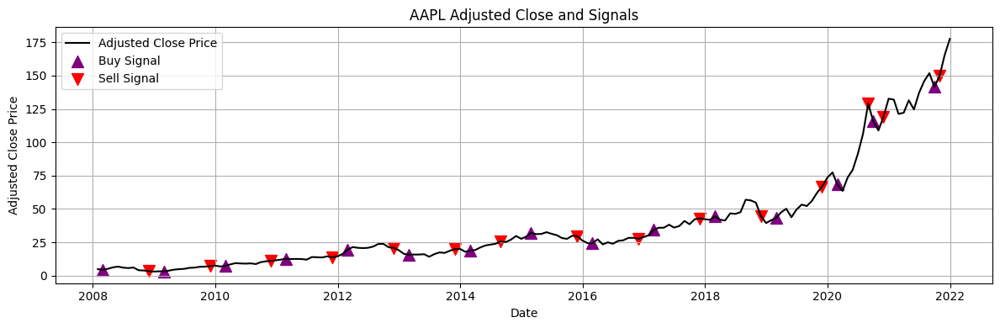

In [ ]:
aapl_data = monthly_ratios[monthly_ratios['Ticker'] == 'AAPL']
plt.figure(figsize=(12, 4))
plt.plot(aapl_data.index, aapl_data['Adjusted Close'], label='Adjusted Close Price', color='black')
buy_signals = aapl_data[aapl_data['Signal_PE'] == 1]
plt.scatter(buy_signals.index, buy_signals['Adjusted Close'], label='Buy Signal', marker='^', color='purple', s=100)
sell_signals = aapl_data[aapl_data['Signal_PE'] == -1]
plt.scatter(sell_signals.index, sell_signals['Adjusted Close'], label='Sell Signal', marker='v', color='red', s=100)
plt.title('AAPL Adjusted Close and Signals')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

Looking at the trend of the curve and the Buy / Sell signals, we expect pretty high Hit Ratio for this stock with this historical approach.

We trade and compute the metrics (Pnl, Cumulative Pnl, Trade Return) for all tickers:

In [ ]:
# When we resampled to monthly data the daily WRDS dataframe we approximated the monthly returns with a sum of daily returns
# So we prefer working now with the the monthly return computed from the Adjusted Closes directly
monthly_ratios['Return'] = monthly_ratios.groupby('Ticker')['Adjusted Close'].pct_change()
monthly_ratios = monthly_ratios.dropna(subset=['Return'])

In [ ]:
# Trading function based on a long-only strategy
def trading_long_only(df, signal_column):
    pnl_results = []

    for ticker in tqdm(df['Ticker'].unique(), desc="Processing Tickers", unit="Ticker"): # iterating over each ticker
        ticker_df = df[df['Ticker'] == ticker].copy().sort_index()

        in_position = False
        buy_price = 0
        cumulative_pnl = 0
        trades = []
        positive_trades = 0
        total_sells = 0
        total_annualized_returns = 0
        total_days_held = 0
        sharpe_list = []

        for index, row in ticker_df.iterrows(): # going through each monthly Ajd Close for each ticker
            if pd.isna(row['Adjusted Close']):
                continue
            # ----- BUY SIGNAL -----
            if row[signal_column] == 'Buy' and not in_position:
                buy_price = row['Adjusted Close']
                buy_date = index
                in_position = True # we enter a position

                trades.append({
                    'Date': buy_date,
                    'Signal': 'Buy',
                    'Adjusted Close': buy_price,
                    'PnL': np.nan,
                    'Cumulative PnL': np.nan,
                    'Trade Return': np.nan,
                    'Annualized Return': np.nan,
                    'Days Held': np.nan,
                    'Sharpe Ratio': np.nan
                })

                print(f"BUY  | {ticker} | {buy_date.date()} | Price: {buy_price:.2f}")

             # ----- SELL SIGNAL -----
            elif row[signal_column] == 'Sell' and in_position: # once we are already in position
                sell_price = row['Adjusted Close']
                sell_date = index
                pnl = sell_price - buy_price
                cumulative_pnl += pnl
                trade_return = (sell_price - buy_price) / buy_price if buy_price else 0

                # Annualizing the returns
                months = (sell_date.year - buy_date.year) * 12 + (sell_date.month - buy_date.month)
                annualized_return = (1 + trade_return)**(12 / months) - 1 if months > 0 else 0
                days_held = (sell_date - buy_date).days

                period_returns = ticker_df.loc[buy_date:sell_date, 'Return'].dropna()
                annualized_vol = period_returns.std(ddof=0) * np.sqrt(12) if not period_returns.empty else np.nan # computing the Sharpe Ratio
                sharpe_ratio = annualized_return / annualized_vol if pd.notna(annualized_vol) and annualized_vol != 0 else np.nan

                if not np.isnan(sharpe_ratio):
                    sharpe_list.append(sharpe_ratio)

                # Registering the Selling trade
                trades.append({
                    'Date': sell_date,
                    'Signal': 'Sell',
                    'Adjusted Close': sell_price,
                    'PnL': pnl,
                    'Cumulative PnL': cumulative_pnl,
                    'Trade Return': trade_return,
                    'Annualized Return': annualized_return,
                    'Days Held': days_held,
                    'Sharpe Ratio': sharpe_ratio
                })

                print(
                    f"SELL | {ticker} | {sell_date.date()} | Price: {sell_price:.2f} | "
                    f"PnL: {pnl:.2f} | Cumul PnL: {cumulative_pnl:.2f} | "
                    f"Return: {trade_return*100:.2f}% | Annualized: {annualized_return*100:.2f}% | "
                    f"Days: {days_held} | Sharpe: {sharpe_ratio:.2f}"
                )

                in_position = False
                if pnl > 0:
                    positive_trades += 1
                total_sells += 1
                total_annualized_returns += annualized_return
                total_days_held += days_held

        # Creating a df containing the trades for each ticker
        trades_df = pd.DataFrame(trades)
        trades_df['Ticker'] = ticker

        if total_sells > 0:
            hit_rate = (positive_trades / total_sells) * 100
            mean_return = trades_df.loc[trades_df['Signal'] == 'Sell', 'Trade Return'].mean()
            mean_ann_return = total_annualized_returns / total_sells
            avg_days_held = total_days_held / total_sells
            mean_sharpe_ratio = np.nanmean(sharpe_list)
        else:
            hit_rate = mean_return = mean_ann_return = avg_days_held = mean_sharpe_ratio = 0

        trades_df['Hit Trade Rate (%)'] = hit_rate
        trades_df['Mean Trade Return (%)'] = mean_return * 100
        trades_df['Mean Annualized Return (%)'] = mean_ann_return * 100
        trades_df['Average Days Held'] = avg_days_held
        trades_df['Mean Sharpe Ratio'] = mean_sharpe_ratio

        pnl_results.append(trades_df)

    all_trades_df = pd.concat(pnl_results, ignore_index=True)
    return all_trades_df

pnl_pe_df = trading_long_only(monthly_ratios, signal_column='Signal Text_PE')

Processing Tickers:   1%|          | 6/773 [00:00<00:27, 27.58Ticker/s]

BUY  | AAL | 2015-04-30 | Price: 48.28
SELL | AAL | 2016-11-30 | Price: 46.44 | PnL: -1.84 | Cumul PnL: -1.84 | Return: -3.82% | Annualized: -2.43% | Days: 580 | Sharpe: -0.07
BUY  | AAL | 2018-04-30 | Price: 42.93
SELL | AAL | 2018-05-31 | Price: 43.54 | PnL: 0.61 | Cumul PnL: -1.23 | Return: 1.42% | Annualized: 18.45% | Days: 31 | Sharpe: 0.57
BUY  | AAL | 2019-11-30 | Price: 28.74
BUY  | PNW | 2008-02-29 | Price: 35.55
SELL | PNW | 2008-05-31 | Price: 33.78 | PnL: -1.77 | Cumul PnL: -1.77 | Return: -4.98% | Annualized: -18.48% | Days: 92 | Sharpe: -2.06
BUY  | PNW | 2008-06-30 | Price: 30.77
SELL | PNW | 2008-07-31 | Price: 33.57 | PnL: 2.80 | Cumul PnL: 1.03 | Return: 9.10% | Annualized: 184.37% | Days: 31 | Sharpe: 5.91
BUY  | PNW | 2008-08-31 | Price: 35.19
SELL | PNW | 2008-11-30 | Price: 30.40 | PnL: -4.79 | Cumul PnL: -3.76 | Return: -13.61% | Annualized: -44.30% | Days: 91 | Sharpe: -2.75
BUY  | PNW | 2010-05-31 | Price: 35.11
SELL | PNW | 2011-05-31 | Price: 45.26 | PnL: 10.

Processing Tickers:   1%|▏         | 10/773 [00:00<00:26, 29.08Ticker/s]

BUY  | HON | 2008-02-29 | Price: 54.92
SELL | HON | 2009-08-31 | Price: 35.08 | PnL: -19.83 | Cumul PnL: -19.83 | Return: -36.11% | Annualized: -25.82% | Days: 549 | Sharpe: -0.67
BUY  | HON | 2010-06-30 | Price: 37.25
SELL | HON | 2010-07-31 | Price: 40.91 | PnL: 3.66 | Cumul PnL: -16.18 | Return: 9.81% | Annualized: 207.50% | Days: 31 | Sharpe: 6.46
BUY  | HON | 2010-08-31 | Price: 37.28
SELL | HON | 2010-09-30 | Price: 41.94 | PnL: 4.66 | Cumul PnL: -11.52 | Return: 12.49% | Annualized: 310.71% | Days: 30 | Sharpe: 8.40
BUY  | HON | 2011-07-31 | Price: 50.68
SELL | HON | 2012-01-31 | Price: 55.39 | PnL: 4.71 | Cumul PnL: -6.80 | Return: 9.30% | Annualized: 19.47% | Days: 184 | Sharpe: 0.56
BUY  | HON | 2012-11-30 | Price: 58.53
SELL | HON | 2013-01-31 | Price: 65.13 | PnL: 6.59 | Cumul PnL: -0.21 | Return: 11.27% | Annualized: 89.76% | Days: 62 | Sharpe: 8.60
BUY  | HON | 2013-02-28 | Price: 66.90
SELL | HON | 2013-07-31 | Price: 79.20 | PnL: 12.29 | Cumul PnL: 12.08 | Return: 18.37

Processing Tickers:   2%|▏         | 17/773 [00:00<00:25, 29.21Ticker/s]

SELL | AEP | 2020-07-31 | Price: 86.88 | PnL: 7.24 | Cumul PnL: 51.94 | Return: 9.09% | Annualized: 184.09% | Days: 31 | Sharpe: 6.78
BUY  | AEP | 2020-08-31 | Price: 78.83
SELL | AEP | 2020-10-31 | Price: 89.93 | PnL: 11.10 | Cumul PnL: 63.04 | Return: 14.08% | Annualized: 120.43% | Days: 61 | Sharpe: 4.33
BUY  | AEP | 2020-11-30 | Price: 84.89
BUY  | AXP | 2008-02-29 | Price: 42.30
SELL | AXP | 2008-04-30 | Price: 48.02 | PnL: 5.72 | Cumul PnL: 5.72 | Return: 13.52% | Annualized: 114.04% | Days: 61 | Sharpe: 3.29
BUY  | AXP | 2008-05-31 | Price: 46.35
SELL | AXP | 2009-04-30 | Price: 25.22 | PnL: -21.13 | Cumul PnL: -15.41 | Return: -45.59% | Annualized: -48.52% | Days: 334 | Sharpe: -0.49
BUY  | AXP | 2010-05-31 | Price: 39.87
SELL | AXP | 2012-03-31 | Price: 57.86 | PnL: 17.99 | Cumul PnL: 2.58 | Return: 45.12% | Annualized: 22.52% | Days: 670 | Sharpe: 0.97
BUY  | AXP | 2012-05-31 | Price: 55.83
SELL | AXP | 2012-06-30 | Price: 58.21 | PnL: 2.38 | Cumul PnL: 4.96 | Return: 4.26% |

Processing Tickers:   3%|▎         | 23/773 [00:00<00:28, 26.04Ticker/s]

BUY  | AME | 2021-09-30 | Price: 124.01
SELL | AME | 2021-10-31 | Price: 132.40 | PnL: 8.39 | Cumul PnL: 40.77 | Return: 6.77% | Annualized: 119.37% | Days: 31 | Sharpe: 4.43
BUY  | AMGN | 2008-02-29 | Price: 45.52
SELL | AMGN | 2008-06-30 | Price: 47.16 | PnL: 1.64 | Cumul PnL: 1.64 | Return: 3.60% | Annualized: 11.20% | Days: 122 | Sharpe: 0.59
BUY  | AMGN | 2008-11-30 | Price: 55.54
SELL | AMGN | 2009-07-31 | Price: 62.31 | PnL: 6.77 | Cumul PnL: 8.41 | Return: 12.19% | Annualized: 18.83% | Days: 243 | Sharpe: 0.68
BUY  | AMGN | 2009-08-31 | Price: 59.78
SELL | AMGN | 2011-04-30 | Price: 56.85 | PnL: -2.93 | Cumul PnL: 5.48 | Return: -4.90% | Annualized: -2.97% | Days: 607 | Sharpe: -0.15
BUY  | AMGN | 2011-07-31 | Price: 54.70
SELL | AMGN | 2011-10-31 | Price: 57.27 | PnL: 2.57 | Cumul PnL: 8.05 | Return: 4.70% | Annualized: 20.16% | Days: 92 | Sharpe: 1.52
BUY  | AMGN | 2012-11-30 | Price: 88.80
SELL | AMGN | 2013-02-28 | Price: 91.55 | PnL: 2.75 | Cumul PnL: 10.80 | Return: 3.10%

Processing Tickers:   3%|▎         | 26/773 [00:01<00:54, 13.66Ticker/s]

SELL | AAPL | 2009-11-30 | Price: 7.14 | PnL: 3.95 | Cumul PnL: 2.79 | Return: 123.84% | Annualized: 192.81% | Days: 275 | Sharpe: 8.42
BUY  | AAPL | 2010-02-28 | Price: 7.31
SELL | AAPL | 2010-11-30 | Price: 11.11 | PnL: 3.80 | Cumul PnL: 6.60 | Return: 52.06% | Annualized: 74.86% | Days: 275 | Sharpe: 3.09
BUY  | AAPL | 2011-02-28 | Price: 12.61
SELL | AAPL | 2011-11-30 | Price: 13.65 | PnL: 1.04 | Cumul PnL: 7.63 | Return: 8.21% | Annualized: 11.09% | Days: 275 | Sharpe: 0.54
BUY  | AAPL | 2012-02-29 | Price: 19.37
SELL | AAPL | 2012-11-30 | Price: 20.90 | PnL: 1.53 | Cumul PnL: 9.16 | Return: 7.90% | Annualized: 10.67% | Days: 275 | Sharpe: 0.39
BUY  | AAPL | 2013-02-28 | Price: 15.76
SELL | AAPL | 2013-11-30 | Price: 19.86 | PnL: 4.10 | Cumul PnL: 13.26 | Return: 25.98% | Annualized: 36.06% | Days: 275 | Sharpe: 1.48
BUY  | AAPL | 2014-02-28 | Price: 18.79
SELL | AAPL | 2014-08-31 | Price: 25.62 | PnL: 6.83 | Cumul PnL: 20.09 | Return: 36.34% | Annualized: 85.90% | Days: 184 | Sha

Processing Tickers:   4%|▍         | 29/773 [00:01<00:45, 16.32Ticker/s]

BUY  | ADM | 2008-03-31 | Price: 41.16
SELL | ADM | 2009-05-31 | Price: 27.52 | PnL: -13.64 | Cumul PnL: -13.64 | Return: -33.14% | Annualized: -29.18% | Days: 426 | Sharpe: -0.68
BUY  | ADM | 2010-05-31 | Price: 25.27
SELL | ADM | 2011-01-31 | Price: 32.67 | PnL: 7.40 | Cumul PnL: -6.24 | Return: 29.28% | Annualized: 47.00% | Days: 245 | Sharpe: 1.75
BUY  | ADM | 2011-05-31 | Price: 32.41
SELL | ADM | 2012-02-29 | Price: 31.20 | PnL: -1.21 | Cumul PnL: -7.45 | Return: -3.73% | Annualized: -4.95% | Days: 274 | Sharpe: -0.16
BUY  | ADM | 2013-02-28 | Price: 31.86
SELL | ADM | 2013-03-31 | Price: 33.73 | PnL: 1.87 | Cumul PnL: -5.58 | Return: 5.87% | Annualized: 98.27% | Days: 31 | Sharpe: 9.78
BUY  | ADM | 2014-08-31 | Price: 49.86
SELL | ADM | 2014-09-30 | Price: 51.10 | PnL: 1.24 | Cumul PnL: -4.34 | Return: 2.49% | Annualized: 34.28% | Days: 30 | Sharpe: 3.98
BUY  | ADM | 2014-10-31 | Price: 47.00
SELL | ADM | 2016-04-30 | Price: 39.94 | PnL: -7.06 | Cumul PnL: -11.40 | Return: -15.0

Processing Tickers:   5%|▍         | 35/773 [00:01<00:37, 19.61Ticker/s]

BUY  | AVY | 2016-10-31 | Price: 69.79
SELL | AVY | 2017-02-28 | Price: 80.71 | PnL: 10.92 | Cumul PnL: 25.34 | Return: 15.65% | Annualized: 54.67% | Days: 120 | Sharpe: 2.26
BUY  | AVY | 2017-05-31 | Price: 84.26
SELL | AVY | 2017-06-30 | Price: 88.37 | PnL: 4.11 | Cumul PnL: 29.45 | Return: 4.88% | Annualized: 77.09% | Days: 30 | Sharpe: 12.31
BUY  | AVY | 2017-08-31 | Price: 94.26
SELL | AVY | 2017-09-30 | Price: 98.34 | PnL: 4.08 | Cumul PnL: 33.53 | Return: 4.33% | Annualized: 66.28% | Days: 30 | Sharpe: 13.21
BUY  | AVY | 2018-10-31 | Price: 90.72
SELL | AVY | 2019-05-31 | Price: 104.06 | PnL: 13.34 | Cumul PnL: 46.87 | Return: 14.70% | Annualized: 26.51% | Days: 212 | Sharpe: 0.83
BUY  | AVY | 2020-02-29 | Price: 114.49
SELL | AVY | 2021-02-28 | Price: 175.21 | PnL: 60.72 | Cumul PnL: 107.59 | Return: 53.04% | Annualized: 53.04% | Days: 365 | Sharpe: 1.94
BUY  | AVY | 2021-08-31 | Price: 225.39
BUY  | AVP | 2008-06-30 | Price: 36.02
SELL | AVP | 2008-07-31 | Price: 42.40 | PnL: 

Processing Tickers:   5%|▌         | 41/773 [00:01<00:34, 21.35Ticker/s]

BUY  | BCR | 2008-02-29 | Price: 94.79
SELL | BCR | 2008-08-31 | Price: 93.45 | PnL: -1.34 | Cumul PnL: -1.34 | Return: -1.41% | Annualized: -2.81% | Days: 184 | Sharpe: -0.27
BUY  | BCR | 2008-10-31 | Price: 88.25
SELL | BCR | 2010-02-28 | Price: 83.78 | PnL: -4.47 | Cumul PnL: -5.81 | Return: -5.07% | Annualized: -3.82% | Days: 485 | Sharpe: -0.20
BUY  | BCR | 2010-05-31 | Price: 80.97
SELL | BCR | 2010-11-30 | Price: 84.85 | PnL: 3.88 | Cumul PnL: -1.93 | Return: 4.79% | Annualized: 9.81% | Days: 183 | Sharpe: 0.71
BUY  | BCR | 2011-07-31 | Price: 98.68
SELL | BCR | 2011-08-31 | Price: 95.26 | PnL: -3.42 | Cumul PnL: -5.35 | Return: -3.47% | Annualized: -34.51% | Days: 31 | Sharpe: -2.97
BUY  | BCR | 2012-08-31 | Price: 98.11
SELL | BCR | 2013-06-30 | Price: 108.68 | PnL: 10.57 | Cumul PnL: 5.22 | Return: 10.77% | Annualized: 13.06% | Days: 303 | Sharpe: 0.92
BUY  | BCR | 2014-02-28 | Price: 144.16
SELL | BCR | 2015-02-28 | Price: 169.14 | PnL: 24.98 | Cumul PnL: 30.20 | Return: 17.

Processing Tickers:   7%|▋         | 51/773 [00:02<00:23, 31.27Ticker/s]

BUY  | BBY | 2016-06-30 | Price: 30.60
SELL | BBY | 2016-08-31 | Price: 38.48 | PnL: 7.88 | Cumul PnL: -10.39 | Return: 25.75% | Annualized: 295.44% | Days: 62 | Sharpe: 10.32
BUY  | BBY | 2018-10-31 | Price: 70.16
SELL | BBY | 2019-11-30 | Price: 80.64 | PnL: 10.48 | Cumul PnL: 0.09 | Return: 14.94% | Annualized: 13.71% | Days: 395 | Sharpe: 0.34
BUY  | BBY | 2020-02-29 | Price: 75.65
SELL | BBY | 2020-06-30 | Price: 87.27 | PnL: 11.62 | Cumul PnL: 11.71 | Return: 15.36% | Annualized: 53.52% | Days: 122 | Sharpe: 0.77
BUY  | BBY | 2020-12-31 | Price: 99.79
SELL | BBY | 2021-01-31 | Price: 108.82 | PnL: 9.03 | Cumul PnL: 20.74 | Return: 9.05% | Annualized: 182.79% | Days: 31 | Sharpe: 6.09
BUY  | BBY | 2021-02-28 | Price: 100.35
SELL | BBY | 2021-03-31 | Price: 114.81 | PnL: 14.46 | Cumul PnL: 35.20 | Return: 14.41% | Annualized: 402.98% | Days: 31 | Sharpe: 10.48
BUY  | BBY | 2021-06-30 | Price: 114.98
BUY  | BIO | 2020-08-31 | Price: 508.59
SELL | BIO | 2020-10-31 | Price: 586.42 | P

Processing Tickers:   8%|▊         | 62/773 [00:02<00:17, 40.04Ticker/s]

BUY  | BNI | 2008-09-30 | Price: 92.43
SELL | BNI | 2009-07-31 | Price: 78.59 | PnL: -13.84 | Cumul PnL: -13.84 | Return: -14.97% | Annualized: -17.69% | Days: 304 | Sharpe: -0.57
BUY  | BNI | 2009-10-31 | Price: 75.32
SELL | BNI | 2009-11-30 | Price: 98.30 | PnL: 22.98 | Cumul PnL: 9.14 | Return: 30.51% | Annualized: 2341.85% | Days: 30 | Sharpe: 37.39
BUY  | UIS | 2008-05-31 | Price: 50.60
SELL | UIS | 2008-06-30 | Price: 39.50 | PnL: -11.10 | Cumul PnL: -11.10 | Return: -21.94% | Annualized: -94.88% | Days: 30 | Sharpe: -1.26
BUY  | UIS | 2008-08-31 | Price: 40.90
SELL | UIS | 2008-10-31 | Price: 15.20 | PnL: -25.70 | Cumul PnL: -36.80 | Return: -62.84% | Annualized: -99.74% | Days: 61 | Sharpe: -1.21
BUY  | CI | 2008-02-29 | Price: 44.58
SELL | CI | 2008-05-31 | Price: 40.60 | PnL: -3.98 | Cumul PnL: -3.98 | Return: -8.93% | Annualized: -31.21% | Days: 92 | Sharpe: -1.52
BUY  | CI | 2008-06-30 | Price: 35.39
SELL | CI | 2008-08-31 | Price: 41.88 | PnL: 6.49 | Cumul PnL: 2.51 | Retu

Processing Tickers:   9%|▉         | 73/773 [00:02<00:15, 44.80Ticker/s]

SELL | CTL | 2016-06-30 | Price: 29.01 | PnL: 1.89 | Cumul PnL: 8.06 | Return: 6.97% | Annualized: 124.44% | Days: 30 | Sharpe: 3.71
BUY  | CTL | 2016-08-31 | Price: 27.80
SELL | CTL | 2017-02-28 | Price: 24.26 | PnL: -3.54 | Cumul PnL: 4.52 | Return: -12.73% | Annualized: -23.85% | Days: 181 | Sharpe: -1.03
BUY  | CTL | 2018-02-28 | Price: 17.67
SELL | CTL | 2020-05-31 | Price: 9.83 | PnL: -7.84 | Cumul PnL: -3.32 | Return: -44.37% | Annualized: -22.94% | Days: 823 | Sharpe: -0.70
BUY  | LUMN | 2020-10-31 | Price: 8.62
SELL | LUMN | 2020-11-30 | Price: 10.45 | PnL: 1.83 | Cumul PnL: 1.83 | Return: 21.23% | Annualized: 907.65% | Days: 30 | Sharpe: 14.64
BUY  | LUMN | 2020-12-31 | Price: 9.75
SELL | LUMN | 2021-01-31 | Price: 12.38 | PnL: 2.63 | Cumul PnL: 4.46 | Return: 26.97% | Annualized: 1656.27% | Days: 31 | Sharpe: 28.40
BUY  | LUMN | 2021-02-28 | Price: 12.29
BUY  | JPM | 2008-02-29 | Price: 40.65
SELL | JPM | 2008-04-30 | Price: 47.65 | PnL: 7.00 | Cumul PnL: 7.00 | Return: 17.2

Processing Tickers:  11%|█         | 83/773 [00:02<00:15, 43.85Ticker/s]

SELL | KO | 2021-12-31 | Price: 59.21 | PnL: 6.76 | Cumul PnL: 22.19 | Return: 12.89% | Annualized: 328.35% | Days: 31 | Sharpe: 9.55
BUY  | CL | 2008-05-31 | Price: 37.18
SELL | CL | 2009-02-28 | Price: 30.09 | PnL: -7.09 | Cumul PnL: -7.09 | Return: -19.07% | Annualized: -24.58% | Days: 273 | Sharpe: -0.98
BUY  | CL | 2009-05-31 | Price: 32.98
SELL | CL | 2010-02-28 | Price: 41.47 | PnL: 8.49 | Cumul PnL: 1.40 | Return: 25.76% | Annualized: 35.75% | Days: 273 | Sharpe: 2.43
BUY  | CL | 2010-05-31 | Price: 39.05
SELL | CL | 2011-02-28 | Price: 39.26 | PnL: 0.21 | Cumul PnL: 1.62 | Return: 0.55% | Annualized: 0.73% | Days: 273 | Sharpe: 0.05
BUY  | CL | 2011-05-31 | Price: 43.77
SELL | CL | 2012-02-29 | Price: 46.59 | PnL: 2.83 | Cumul PnL: 4.44 | Return: 6.45% | Annualized: 8.70% | Days: 274 | Sharpe: 0.90
BUY  | CL | 2012-05-31 | Price: 49.15
SELL | CL | 2013-02-28 | Price: 57.22 | PnL: 8.07 | Cumul PnL: 12.51 | Return: 16.41% | Annualized: 22.46% | Days: 273 | Sharpe: 2.02
BUY  | CL

Processing Tickers:  11%|█▏        | 88/773 [00:02<00:15, 44.81Ticker/s]

BUY  | CMS | 2008-05-31 | Price: 15.59
SELL | CMS | 2008-08-31 | Price: 13.57 | PnL: -2.02 | Cumul PnL: -2.02 | Return: -12.96% | Annualized: -42.60% | Days: 92 | Sharpe: -2.04
BUY  | CMS | 2010-11-30 | Price: 17.97
SELL | CMS | 2011-01-31 | Price: 19.50 | PnL: 1.53 | Cumul PnL: -0.49 | Return: 8.51% | Annualized: 63.27% | Days: 62 | Sharpe: 5.96
BUY  | CMS | 2011-02-28 | Price: 19.26
SELL | CMS | 2011-10-31 | Price: 20.82 | PnL: 1.56 | Cumul PnL: 1.07 | Return: 8.10% | Annualized: 12.39% | Days: 245 | Sharpe: 1.57
BUY  | CMS | 2011-11-30 | Price: 20.92
SELL | CMS | 2011-12-31 | Price: 22.08 | PnL: 1.16 | Cumul PnL: 2.23 | Return: 5.54% | Annualized: 91.09% | Days: 31 | Sharpe: 10.38
BUY  | CMS | 2012-02-29 | Price: 21.41
SELL | CMS | 2012-03-31 | Price: 22.00 | PnL: 0.59 | Cumul PnL: 2.82 | Return: 2.76% | Annualized: 38.57% | Days: 31 | Sharpe: 4.76
BUY  | CMS | 2013-05-31 | Price: 26.95
SELL | CMS | 2013-12-31 | Price: 26.77 | PnL: -0.18 | Cumul PnL: 2.64 | Return: -0.67% | Annualiz

Processing Tickers:  13%|█▎        | 98/773 [00:03<00:15, 42.91Ticker/s]

BUY  | DAL | 2013-12-31 | Price: 27.47
SELL | DAL | 2014-01-31 | Price: 30.61 | PnL: 3.14 | Cumul PnL: 3.14 | Return: 11.43% | Annualized: 266.48% | Days: 31 | Sharpe: 9.25
BUY  | DAL | 2014-02-28 | Price: 33.21
SELL | DAL | 2015-02-28 | Price: 44.52 | PnL: 11.31 | Cumul PnL: 14.45 | Return: 34.06% | Annualized: 34.06% | Days: 365 | Sharpe: 1.38
BUY  | DAL | 2015-08-31 | Price: 43.78
SELL | DAL | 2017-05-31 | Price: 49.13 | PnL: 5.35 | Cumul PnL: 19.80 | Return: 12.22% | Annualized: 6.81% | Days: 639 | Sharpe: 0.23
BUY  | DAL | 2018-12-31 | Price: 49.90
BUY  | DTE | 2008-02-29 | Price: 33.52
SELL | DTE | 2008-08-31 | Price: 35.49 | PnL: 1.98 | Cumul PnL: 1.98 | Return: 5.90% | Annualized: 12.15% | Days: 184 | Sharpe: 0.67
BUY  | DTE | 2009-01-31 | Price: 29.05
SELL | DTE | 2009-05-31 | Price: 25.47 | PnL: -3.58 | Cumul PnL: -1.60 | Return: -12.32% | Annualized: -32.59% | Days: 120 | Sharpe: -0.90
BUY  | DTE | 2010-11-30 | Price: 37.51
SELL | DTE | 2011-01-31 | Price: 38.95 | PnL: 1.44 

Processing Tickers:  14%|█▍        | 108/773 [00:03<00:16, 40.45Ticker/s]

BUY  | DD | 2014-06-30 | Price: 62.10
SELL | DD | 2014-08-31 | Price: 62.74 | PnL: 0.64 | Cumul PnL: -0.58 | Return: 1.02% | Annualized: 6.30% | Days: 62 | Sharpe: 0.53
BUY  | DD | 2015-02-28 | Price: 73.88
SELL | DD | 2015-05-31 | Price: 67.39 | PnL: -6.49 | Cumul PnL: -7.07 | Return: -8.79% | Annualized: -30.78% | Days: 92 | Sharpe: -1.37
BUY  | DD | 2015-06-30 | Price: 60.69
SELL | DD | 2015-10-31 | Price: 63.40 | PnL: 2.71 | Cumul PnL: -4.36 | Return: 4.47% | Annualized: 14.01% | Days: 123 | Sharpe: 0.25
BUY  | DD | 2016-01-31 | Price: 52.76
SELL | DD | 2016-02-29 | Price: 60.87 | PnL: 8.11 | Cumul PnL: 3.75 | Return: 15.37% | Annualized: 456.14% | Days: 29 | Sharpe: 7.28
BUY  | DD | 2017-02-28 | Price: 78.54
SELL | DD | 2017-08-31 | Price: 83.93 | PnL: 5.39 | Cumul PnL: 9.14 | Return: 6.86% | Annualized: 14.20% | Days: 184 | Sharpe: 2.46
BUY  | DD | 2019-07-31 | Price: 72.16
SELL | DD | 2021-08-31 | Price: 74.02 | PnL: 1.86 | Cumul PnL: 11.00 | Return: 2.58% | Annualized: 1.23% | 

Processing Tickers:  15%|█▌        | 119/773 [00:03<00:15, 42.83Ticker/s]

BUY  | EMR | 2008-02-29 | Price: 50.96
SELL | EMR | 2008-05-31 | Price: 58.18 | PnL: 7.22 | Cumul PnL: 7.22 | Return: 14.17% | Annualized: 69.89% | Days: 92 | Sharpe: 4.48
BUY  | EMR | 2008-06-30 | Price: 49.45
SELL | EMR | 2009-07-31 | Price: 36.38 | PnL: -13.07 | Cumul PnL: -5.85 | Return: -26.43% | Annualized: -24.67% | Days: 396 | Sharpe: -0.62
BUY  | EMR | 2010-08-31 | Price: 46.65
SELL | EMR | 2010-09-30 | Price: 52.66 | PnL: 6.01 | Cumul PnL: 0.16 | Return: 12.88% | Annualized: 328.11% | Days: 30 | Sharpe: 10.12
BUY  | EMR | 2011-05-31 | Price: 54.55
SELL | EMR | 2012-11-30 | Price: 50.23 | PnL: -4.32 | Cumul PnL: -4.16 | Return: -7.92% | Annualized: -5.35% | Days: 549 | Sharpe: -0.19
BUY  | EMR | 2014-01-31 | Price: 65.94
SELL | EMR | 2014-04-30 | Price: 68.18 | PnL: 2.24 | Cumul PnL: -1.92 | Return: 3.40% | Annualized: 14.30% | Days: 89 | Sharpe: 1.22
BUY  | EMR | 2014-05-31 | Price: 66.73
SELL | EMR | 2016-03-31 | Price: 54.38 | PnL: -12.35 | Cumul PnL: -14.27 | Return: -18.5

Processing Tickers:  17%|█▋        | 129/773 [00:03<00:15, 41.97Ticker/s]

BUY  | FDO | 2008-02-29 | Price: 19.15
SELL | FDO | 2008-04-30 | Price: 21.40 | PnL: 2.25 | Cumul PnL: 2.25 | Return: 11.75% | Annualized: 94.75% | Days: 61 | Sharpe: 3.56
BUY  | FDO | 2009-06-30 | Price: 28.30
SELL | FDO | 2010-02-28 | Price: 32.99 | PnL: 4.69 | Cumul PnL: 6.94 | Return: 16.57% | Annualized: 25.86% | Days: 243 | Sharpe: 0.86
BUY  | FDO | 2011-01-31 | Price: 42.48
SELL | FDO | 2011-02-28 | Price: 50.08 | PnL: 7.60 | Cumul PnL: 14.54 | Return: 17.89% | Annualized: 620.71% | Days: 28 | Sharpe: 11.05
BUY  | FDO | 2011-07-31 | Price: 53.11
SELL | FDO | 2011-10-31 | Price: 58.63 | PnL: 5.52 | Cumul PnL: 20.06 | Return: 10.39% | Annualized: 48.52% | Days: 92 | Sharpe: 1.89
BUY  | FDO | 2012-01-31 | Price: 55.80
SELL | FDO | 2012-03-31 | Price: 63.28 | PnL: 7.48 | Cumul PnL: 27.54 | Return: 13.41% | Annualized: 112.71% | Days: 60 | Sharpe: 3.38
BUY  | FDO | 2012-07-31 | Price: 66.08
SELL | FDO | 2012-09-30 | Price: 66.30 | PnL: 0.22 | Cumul PnL: 27.76 | Return: 0.33% | Annual

Processing Tickers:  17%|█▋        | 135/773 [00:04<00:14, 44.08Ticker/s]

BUY  | FHN | 2008-02-29 | Price: 13.53
SELL | FHN | 2009-10-31 | Price: 10.96 | PnL: -2.57 | Cumul PnL: -2.57 | Return: -19.00% | Annualized: -11.88% | Days: 610 | Sharpe: -0.23
BUY  | FHN | 2009-11-30 | Price: 12.55
SELL | FHN | 2011-05-31 | Price: 10.51 | PnL: -2.04 | Cumul PnL: -4.61 | Return: -16.27% | Annualized: -11.16% | Days: 547 | Sharpe: -0.33
BUY  | FHN | 2011-09-30 | Price: 5.96
SELL | FHN | 2011-10-31 | Price: 6.99 | PnL: 1.03 | Cumul PnL: -3.58 | Return: 17.28% | Annualized: 577.28% | Days: 31 | Sharpe: 10.22
BUY  | FHN | 2011-11-30 | Price: 7.70
BUY  | WB | 2008-03-31 | Price: 27.00
SELL | WB | 2008-04-30 | Price: 29.15 | PnL: 2.15 | Cumul PnL: 2.15 | Return: 7.96% | Annualized: 150.78% | Days: 30 | Sharpe: 4.40
BUY  | WB | 2008-06-30 | Price: 15.53
SELL | WB | 2008-07-31 | Price: 17.27 | PnL: 1.74 | Cumul PnL: 3.89 | Return: 11.20% | Annualized: 257.64% | Days: 31 | Sharpe: 3.24
BUY  | WB | 2008-08-31 | Price: 15.89
BUY  | FLR | 2008-05-31 | Price: 93.28
SELL | FLR | 20

Processing Tickers:  19%|█▉        | 145/773 [00:04<00:14, 41.92Ticker/s]

BUY  | GD | 2008-02-29 | Price: 81.85
SELL | GD | 2008-04-30 | Price: 90.42 | PnL: 8.57 | Cumul PnL: 8.57 | Return: 10.47% | Annualized: 81.75% | Days: 61 | Sharpe: 4.96
BUY  | GD | 2008-05-31 | Price: 92.15
SELL | GD | 2009-09-30 | Price: 64.60 | PnL: -27.55 | Cumul PnL: -18.98 | Return: -29.90% | Annualized: -23.39% | Days: 487 | Sharpe: -0.55
BUY  | GD | 2009-10-31 | Price: 62.70
SELL | GD | 2009-11-30 | Price: 65.90 | PnL: 3.20 | Cumul PnL: -15.78 | Return: 5.10% | Annualized: 81.72% | Days: 30 | Sharpe: 5.87
BUY  | GD | 2010-05-31 | Price: 67.90
SELL | GD | 2010-10-31 | Price: 68.12 | PnL: 0.22 | Cumul PnL: -15.56 | Return: 0.32% | Annualized: 0.78% | Days: 153 | Sharpe: 0.02
BUY  | GD | 2010-11-30 | Price: 66.09
SELL | GD | 2010-12-31 | Price: 70.96 | PnL: 4.87 | Cumul PnL: -10.69 | Return: 7.37% | Annualized: 134.71% | Days: 31 | Sharpe: 7.52
BUY  | GD | 2011-04-30 | Price: 72.82
SELL | GD | 2012-02-29 | Price: 73.23 | PnL: 0.41 | Cumul PnL: -10.28 | Return: 0.56% | Annualized: 

Processing Tickers:  20%|██        | 156/773 [00:04<00:13, 44.74Ticker/s]

SELL | GWW | 2020-05-31 | Price: 309.62 | PnL: -44.45 | Cumul PnL: 32.17 | Return: -12.55% | Annualized: -7.38% | Days: 639 | Sharpe: -0.25
BUY  | GWW | 2021-08-31 | Price: 433.70
SELL | GWW | 2021-12-31 | Price: 518.24 | PnL: 84.54 | Cumul PnL: 116.71 | Return: 19.49% | Annualized: 70.62% | Days: 122 | Sharpe: 2.21
BUY  | HAL | 2008-09-30 | Price: 32.39
SELL | HAL | 2009-08-31 | Price: 23.71 | PnL: -8.68 | Cumul PnL: -8.68 | Return: -26.80% | Annualized: -28.85% | Days: 335 | Sharpe: -0.48
BUY  | HAL | 2011-05-31 | Price: 50.15
SELL | HAL | 2011-07-31 | Price: 54.73 | PnL: 4.58 | Cumul PnL: -4.10 | Return: 9.13% | Annualized: 68.94% | Days: 61 | Sharpe: 5.95
BUY  | HAL | 2011-08-31 | Price: 44.37
SELL | HAL | 2013-01-31 | Price: 40.68 | PnL: -3.69 | Cumul PnL: -7.79 | Return: -8.32% | Annualized: -5.94% | Days: 519 | Sharpe: -0.14
BUY  | HAL | 2014-05-31 | Price: 64.64
SELL | HAL | 2015-05-31 | Price: 45.40 | PnL: -19.24 | Cumul PnL: -27.03 | Return: -29.76% | Annualized: -29.76% | Da

Processing Tickers:  21%|██▏       | 166/773 [00:04<00:13, 44.98Ticker/s]

BUY  | HSY | 2008-08-31 | Price: 36.09
SELL | HSY | 2008-09-30 | Price: 39.54 | PnL: 3.45 | Cumul PnL: 3.45 | Return: 9.56% | Annualized: 199.09% | Days: 30 | Sharpe: 10.07
BUY  | HSY | 2008-11-30 | Price: 36.00
SELL | HSY | 2010-04-30 | Price: 47.01 | PnL: 11.01 | Cumul PnL: 14.46 | Return: 30.58% | Annualized: 20.73% | Days: 516 | Sharpe: 1.05
BUY  | HSY | 2010-05-31 | Price: 46.80
SELL | HSY | 2010-10-31 | Price: 49.49 | PnL: 2.69 | Cumul PnL: 17.15 | Return: 5.75% | Annualized: 14.35% | Days: 153 | Sharpe: 1.91
BUY  | HSY | 2010-11-30 | Price: 46.80
SELL | HSY | 2011-02-28 | Price: 52.32 | PnL: 5.52 | Cumul PnL: 22.67 | Return: 11.79% | Annualized: 56.20% | Days: 90 | Sharpe: 2.52
BUY  | HSY | 2011-08-31 | Price: 58.65
SELL | HSY | 2012-04-30 | Price: 67.01 | PnL: 8.36 | Cumul PnL: 31.03 | Return: 14.25% | Annualized: 22.13% | Days: 243 | Sharpe: 1.67
BUY  | HSY | 2012-10-31 | Price: 68.85
SELL | HSY | 2012-11-30 | Price: 73.27 | PnL: 4.42 | Cumul PnL: 35.45 | Return: 6.42% | Annua

Processing Tickers:  23%|██▎       | 176/773 [00:04<00:13, 43.12Ticker/s]

SELL | HBAN | 2020-08-31 | Price: 9.41 | PnL: -4.16 | Cumul PnL: 3.64 | Return: -30.66% | Annualized: -46.61% | Days: 213 | Sharpe: -1.06
BUY  | HBAN | 2021-05-31 | Price: 15.86
SELL | HBAN | 2021-08-31 | Price: 15.53 | PnL: -0.33 | Cumul PnL: 3.31 | Return: -2.08% | Annualized: -8.07% | Days: 92 | Sharpe: -0.31
BUY  | ITT | 2008-02-29 | Price: 21.84
SELL | ITT | 2008-05-31 | Price: 25.63 | PnL: 3.79 | Cumul PnL: 3.79 | Return: 17.35% | Annualized: 89.67% | Days: 92 | Sharpe: 2.10
BUY  | ITT | 2008-09-30 | Price: 21.60
SELL | ITT | 2009-06-30 | Price: 17.28 | PnL: -4.31 | Cumul PnL: -0.52 | Return: -19.98% | Annualized: -25.71% | Days: 273 | Sharpe: -0.73
BUY  | ITT | 2010-02-28 | Price: 19.90
SELL | ITT | 2010-05-31 | Price: 18.75 | PnL: -1.15 | Cumul PnL: -1.67 | Return: -5.76% | Annualized: -21.12% | Days: 92 | Sharpe: -0.78
BUY  | ITT | 2011-02-28 | Price: 22.50
SELL | ITT | 2011-05-31 | Price: 22.38 | PnL: -0.12 | Cumul PnL: -1.79 | Return: -0.54% | Annualized: -2.12% | Days: 92 |

Processing Tickers:  23%|██▎       | 181/773 [00:05<00:13, 42.89Ticker/s]

BUY  | JEC | 2008-02-29 | Price: 64.42
SELL | JEC | 2008-04-30 | Price: 69.27 | PnL: 4.85 | Cumul PnL: 4.85 | Return: 7.52% | Annualized: 54.53% | Days: 61 | Sharpe: 1.50
BUY  | JEC | 2008-06-30 | Price: 64.75
SELL | JEC | 2010-02-28 | Price: 31.13 | PnL: -33.62 | Cumul PnL: -28.77 | Return: -51.92% | Annualized: -35.56% | Days: 608 | Sharpe: -0.76
BUY  | JEC | 2010-06-30 | Price: 29.24
SELL | JEC | 2010-08-31 | Price: 27.82 | PnL: -1.41 | Cumul PnL: -30.18 | Return: -4.83% | Annualized: -25.70% | Days: 62 | Sharpe: -1.38
BUY  | JEC | 2011-07-31 | Price: 31.40
SELL | JEC | 2013-01-31 | Price: 38.60 | PnL: 7.20 | Cumul PnL: -22.99 | Return: 22.92% | Annualized: 14.75% | Days: 550 | Sharpe: 0.47
BUY  | JEC | 2014-04-30 | Price: 46.29
SELL | JEC | 2014-08-31 | Price: 43.25 | PnL: -3.04 | Cumul PnL: -26.03 | Return: -6.57% | Annualized: -18.44% | Days: 123 | Sharpe: -1.06
BUY  | JEC | 2014-09-30 | Price: 39.17
SELL | JEC | 2014-11-30 | Price: 37.27 | PnL: -1.90 | Cumul PnL: -27.93 | Return

Processing Tickers:  25%|██▍       | 191/773 [00:05<00:13, 42.11Ticker/s]

BUY  | KMB | 2018-10-31 | Price: 104.30
SELL | KMB | 2018-11-30 | Price: 115.37 | PnL: 11.07 | Cumul PnL: 11.46 | Return: 10.61% | Annualized: 235.51% | Days: 30 | Sharpe: 7.22
BUY  | KMB | 2020-08-31 | Price: 157.76
SELL | KMB | 2021-07-31 | Price: 135.72 | PnL: -22.04 | Cumul PnL: -10.58 | Return: -13.97% | Annualized: -15.14% | Days: 334 | Sharpe: -0.34
BUY  | KR | 2008-02-29 | Price: 12.12
SELL | KR | 2008-03-31 | Price: 12.70 | PnL: 0.57 | Cumul PnL: 0.57 | Return: 4.74% | Annualized: 74.37% | Days: 31 | Sharpe: 4.54
BUY  | KR | 2008-06-30 | Price: 14.44
SELL | KR | 2009-03-31 | Price: 10.61 | PnL: -3.83 | Cumul PnL: -3.25 | Return: -26.50% | Annualized: -33.67% | Days: 274 | Sharpe: -1.83
BUY  | KR | 2009-06-30 | Price: 11.03
SELL | KR | 2009-12-31 | Price: 10.27 | PnL: -0.76 | Cumul PnL: -4.01 | Return: -6.89% | Annualized: -13.31% | Days: 184 | Sharpe: -0.62
BUY  | KR | 2010-12-31 | Price: 11.18
SELL | KR | 2014-03-31 | Price: 21.82 | PnL: 10.64 | Cumul PnL: 6.63 | Return: 95.2

Processing Tickers:  26%|██▌       | 201/773 [00:05<00:12, 44.50Ticker/s]

BUY  | LB | 2015-04-30 | Price: 69.05
SELL | LB | 2015-10-31 | Price: 74.17 | PnL: 5.12 | Cumul PnL: 5.12 | Return: 7.41% | Annualized: 15.37% | Days: 184 | Sharpe: 0.86
BUY  | LB | 2015-12-31 | Price: 74.04
BUY  | LTD | 2008-02-29 | Price: 11.78
SELL | LTD | 2008-04-30 | Price: 14.31 | PnL: 2.53 | Cumul PnL: 2.53 | Return: 21.44% | Annualized: 220.79% | Days: 61 | Sharpe: 4.44
BUY  | LTD | 2008-06-30 | Price: 13.02
SELL | LTD | 2008-08-31 | Price: 16.07 | PnL: 3.05 | Cumul PnL: 5.58 | Return: 23.44% | Annualized: 253.82% | Days: 62 | Sharpe: 4.44
BUY  | LTD | 2008-10-31 | Price: 9.26
SELL | LTD | 2009-03-31 | Price: 6.72 | PnL: -2.53 | Cumul PnL: 3.04 | Return: -27.38% | Annualized: -53.60% | Days: 151 | Sharpe: -0.94
BUY  | LTD | 2010-03-31 | Price: 19.02
SELL | LTD | 2012-02-29 | Price: 35.96 | PnL: 16.93 | Cumul PnL: 19.98 | Return: 88.99% | Annualized: 39.39% | Days: 700 | Sharpe: 1.23
BUY  | LTD | 2012-06-30 | Price: 32.86
SELL | LTD | 2012-07-31 | Price: 36.74 | PnL: 3.88 | Cumu

Processing Tickers:  27%|██▋       | 211/773 [00:05<00:12, 44.25Ticker/s]

SELL | MRO | 2013-01-31 | Price: 33.61 | PnL: 1.91 | Cumul PnL: 13.52 | Return: 6.03% | Annualized: 7.27% | Days: 306 | Sharpe: 0.31
BUY  | MRO | 2014-02-28 | Price: 33.50
SELL | MRO | 2014-05-31 | Price: 36.66 | PnL: 3.16 | Cumul PnL: 16.68 | Return: 9.43% | Annualized: 43.41% | Days: 92 | Sharpe: 6.74
BUY  | MRO | 2014-09-30 | Price: 37.59
SELL | MRO | 2015-02-28 | Price: 27.86 | PnL: -9.73 | Cumul PnL: 6.95 | Return: -25.88% | Annualized: -51.27% | Days: 151 | Sharpe: -2.11
BUY  | MRO | 2015-03-31 | Price: 26.11
SELL | MRO | 2015-04-30 | Price: 31.10 | PnL: 4.99 | Cumul PnL: 11.94 | Return: 19.11% | Annualized: 715.53% | Days: 30 | Sharpe: 16.27
BUY  | MRO | 2015-08-31 | Price: 17.29
SELL | MRO | 2017-08-31 | Price: 11.12 | PnL: -6.17 | Cumul PnL: 5.77 | Return: -35.69% | Annualized: -19.80% | Days: 731 | Sharpe: -0.35
BUY  | MRO | 2017-09-30 | Price: 13.56
SELL | MRO | 2017-11-30 | Price: 14.84 | PnL: 1.28 | Cumul PnL: 7.05 | Return: 9.44% | Annualized: 71.81% | Days: 61 | Sharpe: 

Processing Tickers:  29%|██▊       | 221/773 [00:05<00:12, 45.78Ticker/s]

BUY  | SPGI | 2016-06-30 | Price: 107.26
SELL | SPGI | 2016-07-31 | Price: 122.20 | PnL: 14.94 | Cumul PnL: 14.94 | Return: 13.93% | Annualized: 378.19% | Days: 31 | Sharpe: 12.13
BUY  | SPGI | 2016-11-30 | Price: 118.99
SELL | SPGI | 2017-11-30 | Price: 165.48 | PnL: 46.49 | Cumul PnL: 61.43 | Return: 39.07% | Annualized: 39.07% | Days: 365 | Sharpe: 2.24
BUY  | SPGI | 2018-10-31 | Price: 182.32
SELL | SPGI | 2019-01-31 | Price: 191.65 | PnL: 9.33 | Cumul PnL: 70.76 | Return: 5.12% | Annualized: 22.09% | Days: 92 | Sharpe: 0.79
BUY  | SPGI | 2019-02-28 | Price: 200.37
SELL | SPGI | 2019-04-30 | Price: 220.66 | PnL: 20.29 | Cumul PnL: 91.05 | Return: 10.13% | Annualized: 78.38% | Days: 61 | Sharpe: 104.40
BUY  | SPGI | 2020-02-29 | Price: 265.91
SELL | SPGI | 2020-04-30 | Price: 292.88 | PnL: 26.97 | Cumul PnL: 118.02 | Return: 10.14% | Annualized: 78.54% | Days: 61 | Sharpe: 1.70
BUY  | SPGI | 2020-10-31 | Price: 322.73
SELL | SPGI | 2020-11-30 | Price: 351.78 | PnL: 29.05 | Cumul PnL

Processing Tickers:  30%|███       | 232/773 [00:06<00:11, 46.05Ticker/s]

BUY  | MMM | 2008-06-30 | Price: 58.79
SELL | MMM | 2008-08-31 | Price: 60.49 | PnL: 1.70 | Cumul PnL: 1.70 | Return: 2.89% | Annualized: 18.63% | Days: 62 | Sharpe: 0.97
BUY  | MMM | 2008-09-30 | Price: 57.71
SELL | MMM | 2009-04-30 | Price: 48.66 | PnL: -9.05 | Cumul PnL: -7.35 | Return: -15.68% | Annualized: -25.35% | Days: 212 | Sharpe: -0.71
BUY  | MMM | 2010-05-31 | Price: 67.00
SELL | MMM | 2011-02-28 | Price: 77.91 | PnL: 10.91 | Cumul PnL: 3.56 | Return: 16.29% | Annualized: 22.29% | Days: 273 | Sharpe: 1.02
BUY  | MMM | 2011-05-31 | Price: 79.73
SELL | MMM | 2012-01-31 | Price: 73.25 | PnL: -6.48 | Cumul PnL: -2.91 | Return: -8.13% | Annualized: -11.94% | Days: 245 | Sharpe: -0.51
BUY  | MMM | 2012-05-31 | Price: 71.31
SELL | MMM | 2012-06-30 | Price: 75.69 | PnL: 4.38 | Cumul PnL: 1.47 | Return: 6.15% | Annualized: 104.63% | Days: 30 | Sharpe: 5.17
BUY  | MMM | 2012-10-31 | Price: 74.00
SELL | MMM | 2012-12-31 | Price: 78.44 | PnL: 4.44 | Cumul PnL: 5.91 | Return: 5.99% | An

Processing Tickers:  31%|███▏      | 243/773 [00:06<00:12, 43.61Ticker/s]

SELL | THC | 2014-11-30 | Price: 48.05 | PnL: 9.00 | Cumul PnL: 19.42 | Return: 23.05% | Annualized: 18.05% | Days: 456 | Sharpe: 0.58
BUY  | THC | 2016-02-29 | Price: 24.82
BUY  | NSM | 2008-02-29 | Price: 16.47
SELL | NSM | 2008-03-31 | Price: 18.32 | PnL: 1.85 | Cumul PnL: 1.85 | Return: 11.23% | Annualized: 258.74% | Days: 31 | Sharpe: 6.88
BUY  | NSM | 2008-09-30 | Price: 17.21
SELL | NSM | 2009-04-30 | Price: 12.37 | PnL: -4.84 | Cumul PnL: -2.99 | Return: -28.12% | Annualized: -43.23% | Days: 212 | Sharpe: -0.90
BUY  | NSM | 2010-04-30 | Price: 14.78
BUY  | NYT | 2008-10-31 | Price: 10.00
SELL | NYT | 2010-02-28 | Price: 10.94 | PnL: 0.94 | Cumul PnL: 0.94 | Return: 9.40% | Annualized: 6.97% | Days: 485 | Sharpe: 0.09
BUY  | NYT | 2010-05-31 | Price: 9.28
BUY  | NWL | 2008-02-29 | Price: 22.70
SELL | NWL | 2008-11-30 | Price: 13.36 | PnL: -9.34 | Cumul PnL: -9.34 | Return: -41.15% | Annualized: -50.68% | Days: 275 | Sharpe: -1.80
BUY  | NWL | 2008-12-31 | Price: 9.78
SELL | NWL 

Processing Tickers:  32%|███▏      | 248/773 [00:06<00:12, 41.96Ticker/s]

BUY  | ES | 2021-09-30 | Price: 81.76
SELL | ES | 2021-12-31 | Price: 90.98 | PnL: 9.22 | Cumul PnL: 37.59 | Return: 11.28% | Annualized: 53.33% | Days: 92 | Sharpe: 2.01
BUY  | NU | 2009-04-30 | Price: 21.02
SELL | NU | 2009-11-30 | Price: 24.11 | PnL: 3.09 | Cumul PnL: 3.09 | Return: 14.70% | Annualized: 26.51% | Days: 214 | Sharpe: 2.21
BUY  | NU | 2011-02-28 | Price: 34.04
SELL | NU | 2011-03-31 | Price: 34.60 | PnL: 0.56 | Cumul PnL: 3.65 | Return: 1.65% | Annualized: 21.63% | Days: 31 | Sharpe: 7.11
BUY  | NU | 2011-05-31 | Price: 35.24
SELL | NU | 2011-12-31 | Price: 36.07 | PnL: 0.83 | Cumul PnL: 4.48 | Return: 2.36% | Annualized: 4.07% | Days: 214 | Sharpe: 0.47
BUY  | NU | 2012-01-31 | Price: 34.75
SELL | NU | 2012-02-29 | Price: 35.90 | PnL: 1.15 | Cumul PnL: 5.63 | Return: 3.31% | Annualized: 47.80% | Days: 29 | Sharpe: 3.96
BUY  | NU | 2013-05-31 | Price: 41.67
SELL | NU | 2013-07-31 | Price: 44.41 | PnL: 2.74 | Cumul PnL: 8.37 | Return: 6.58% | Annualized: 46.54% | Days: 

Processing Tickers:  33%|███▎      | 253/773 [00:06<00:15, 34.47Ticker/s]

SELL | WFC | 2018-06-30 | Price: 55.44 | PnL: 3.03 | Cumul PnL: 28.66 | Return: 5.78% | Annualized: 25.21% | Days: 91 | Sharpe: 1.31
BUY  | WFC | 2018-09-30 | Price: 52.56
SELL | WFC | 2019-11-30 | Price: 54.46 | PnL: 1.90 | Cumul PnL: 30.56 | Return: 3.61% | Annualized: 3.09% | Days: 426 | Sharpe: 0.14
BUY  | WFC | 2020-01-31 | Price: 46.94
SELL | WFC | 2020-08-31 | Price: 24.15 | PnL: -22.79 | Cumul PnL: 7.77 | Return: -48.55% | Annualized: -68.00% | Days: 213 | Sharpe: -2.12
BUY  | WFC | 2021-05-31 | Price: 46.72
BUY  | NUE | 2008-07-31 | Price: 57.22
SELL | NUE | 2009-05-31 | Price: 43.91 | PnL: -13.31 | Cumul PnL: -13.31 | Return: -23.26% | Annualized: -27.22% | Days: 304 | Sharpe: -0.49
BUY  | NUE | 2009-11-30 | Price: 42.41
SELL | NUE | 2010-08-31 | Price: 36.78 | PnL: -5.63 | Cumul PnL: -18.94 | Return: -13.28% | Annualized: -17.30% | Days: 274 | Sharpe: -0.66
BUY  | NUE | 2011-05-31 | Price: 42.34
SELL | NUE | 2012-10-31 | Price: 40.13 | PnL: -2.21 | Cumul PnL: -21.15 | Return

Processing Tickers:  34%|███▍      | 261/773 [00:07<00:14, 34.81Ticker/s]

SELL | PNC | 2014-03-31 | Price: 87.00 | PnL: 5.22 | Cumul PnL: 7.69 | Return: 6.38% | Annualized: 110.12% | Days: 31 | Sharpe: 15.88
BUY  | PNC | 2014-04-30 | Price: 84.04
SELL | PNC | 2014-06-30 | Price: 89.05 | PnL: 5.01 | Cumul PnL: 12.70 | Return: 5.96% | Annualized: 41.54% | Days: 61 | Sharpe: 3.71
BUY  | PNC | 2014-07-31 | Price: 82.56
SELL | PNC | 2014-08-31 | Price: 84.75 | PnL: 2.19 | Cumul PnL: 14.89 | Return: 2.65% | Annualized: 36.91% | Days: 31 | Sharpe: 2.14
BUY  | PNC | 2015-01-31 | Price: 84.54
SELL | PNC | 2015-02-28 | Price: 91.96 | PnL: 7.42 | Cumul PnL: 22.31 | Return: 8.78% | Annualized: 174.44% | Days: 28 | Sharpe: 6.25
BUY  | PNC | 2015-08-31 | Price: 91.12
SELL | PNC | 2015-11-30 | Price: 95.51 | PnL: 4.39 | Cumul PnL: 26.70 | Return: 4.82% | Annualized: 20.71% | Days: 91 | Sharpe: 1.26
BUY  | PNC | 2016-01-31 | Price: 86.65
SELL | PNC | 2016-05-31 | Price: 89.74 | PnL: 3.09 | Cumul PnL: 29.79 | Return: 3.57% | Annualized: 11.08% | Days: 121 | Sharpe: 0.58
BUY 

Processing Tickers:  35%|███▍      | 269/773 [00:07<00:14, 35.33Ticker/s]

BUY  | JCP | 2008-02-29 | Price: 46.21
SELL | JCP | 2008-08-31 | Price: 38.97 | PnL: -7.24 | Cumul PnL: -7.24 | Return: -15.67% | Annualized: -28.88% | Days: 184 | Sharpe: -0.56
BUY  | JCP | 2008-09-30 | Price: 33.34
SELL | JCP | 2009-03-31 | Price: 20.07 | PnL: -13.27 | Cumul PnL: -20.51 | Return: -39.80% | Annualized: -63.76% | Days: 182 | Sharpe: -1.01
BUY  | JCP | 2010-06-30 | Price: 21.48
SELL | JCP | 2010-09-30 | Price: 27.18 | PnL: 5.70 | Cumul PnL: -14.81 | Return: 26.54% | Annualized: 156.37% | Days: 92 | Sharpe: 1.87
BUY  | JCP | 2011-03-31 | Price: 35.91
SELL | JCP | 2011-04-30 | Price: 38.45 | PnL: 2.54 | Cumul PnL: -12.27 | Return: 7.07% | Annualized: 127.08% | Days: 30 | Sharpe: 16.84
BUY  | JCP | 2011-05-31 | Price: 35.43
SELL | JCP | 2011-12-31 | Price: 35.15 | PnL: -0.28 | Cumul PnL: -12.55 | Return: -0.79% | Annualized: -1.35% | Days: 214 | Sharpe: -0.04
BUY  | JCP | 2012-03-31 | Price: 35.43
SELL | JCP | 2013-03-31 | Price: 15.11 | PnL: -20.32 | Cumul PnL: -32.87 | R

Processing Tickers:  36%|███▌      | 278/773 [00:07<00:13, 37.23Ticker/s]

SELL | COP | 2014-12-31 | Price: 69.06 | PnL: -3.09 | Cumul PnL: -10.41 | Return: -4.28% | Annualized: -23.10% | Days: 61 | Sharpe: -1.20
BUY  | COP | 2015-01-31 | Price: 62.98
SELL | COP | 2015-02-28 | Price: 65.20 | PnL: 2.22 | Cumul PnL: -8.19 | Return: 3.52% | Annualized: 51.54% | Days: 28 | Sharpe: 2.41
BUY  | COP | 2015-11-30 | Price: 54.05
SELL | COP | 2016-05-31 | Price: 43.79 | PnL: -10.26 | Cumul PnL: -18.45 | Return: -18.98% | Annualized: -34.36% | Days: 183 | Sharpe: -0.70
BUY  | COP | 2016-11-30 | Price: 48.52
SELL | COP | 2017-08-31 | Price: 43.66 | PnL: -4.86 | Cumul PnL: -23.31 | Return: -10.02% | Annualized: -13.13% | Days: 274 | Sharpe: -0.73
BUY  | COP | 2017-11-30 | Price: 50.88
SELL | COP | 2018-08-31 | Price: 73.43 | PnL: 22.55 | Cumul PnL: -0.76 | Return: 44.32% | Annualized: 63.09% | Days: 274 | Sharpe: 3.60
BUY  | COP | 2020-11-30 | Price: 39.56
SELL | COP | 2021-08-31 | Price: 55.53 | PnL: 15.97 | Cumul PnL: 15.21 | Return: 40.37% | Annualized: 57.17% | Days: 

Processing Tickers:  37%|███▋      | 287/773 [00:07<00:12, 40.05Ticker/s]

SELL | RJF | 2020-10-31 | Price: 50.96 | PnL: 2.45 | Cumul PnL: 5.22 | Return: 5.06% | Annualized: 80.77% | Days: 31 | Sharpe: 5.20
BUY  | RJF | 2021-05-31 | Price: 88.39
SELL | RJF | 2021-10-31 | Price: 98.59 | PnL: 10.20 | Cumul PnL: 15.42 | Return: 11.54% | Annualized: 29.95% | Days: 153 | Sharpe: 2.22
BUY  | RTN | 2008-02-29 | Price: 64.84
SELL | RTN | 2010-02-28 | Price: 56.24 | PnL: -8.60 | Cumul PnL: -8.60 | Return: -13.26% | Annualized: -6.87% | Days: 730 | Sharpe: -0.27
BUY  | RTN | 2010-05-31 | Price: 52.41
SELL | RTN | 2010-10-31 | Price: 46.08 | PnL: -6.33 | Cumul PnL: -14.93 | Return: -12.08% | Annualized: -26.58% | Days: 153 | Sharpe: -1.59
BUY  | RTN | 2010-11-30 | Price: 46.25
SELL | RTN | 2011-01-31 | Price: 49.99 | PnL: 3.74 | Cumul PnL: -11.19 | Return: 8.09% | Annualized: 59.45% | Days: 62 | Sharpe: 4.79
BUY  | RTN | 2011-04-30 | Price: 48.55
SELL | RTN | 2011-05-31 | Price: 50.38 | PnL: 1.83 | Cumul PnL: -9.36 | Return: 3.77% | Annualized: 55.89% | Days: 31 | Sharp

Processing Tickers:  39%|███▊      | 298/773 [00:07<00:10, 43.98Ticker/s]

BUY  | STJ | 2008-05-31 | Price: 40.75
SELL | STJ | 2008-07-31 | Price: 46.58 | PnL: 5.83 | Cumul PnL: 5.83 | Return: 14.31% | Annualized: 123.06% | Days: 61 | Sharpe: 4.11
BUY  | STJ | 2008-08-31 | Price: 45.83
SELL | STJ | 2009-02-28 | Price: 33.16 | PnL: -12.67 | Cumul PnL: -6.84 | Return: -27.65% | Annualized: -47.65% | Days: 181 | Sharpe: -1.02
BUY  | STJ | 2009-10-31 | Price: 34.08
SELL | STJ | 2009-11-30 | Price: 36.71 | PnL: 2.63 | Cumul PnL: -4.21 | Return: 7.72% | Annualized: 144.02% | Days: 30 | Sharpe: 4.08
BUY  | STJ | 2010-02-28 | Price: 38.22
SELL | STJ | 2011-03-31 | Price: 51.26 | PnL: 13.04 | Cumul PnL: 8.83 | Return: 34.12% | Annualized: 31.12% | Days: 396 | Sharpe: 1.18
BUY  | STJ | 2011-06-30 | Price: 47.68
SELL | STJ | 2012-02-29 | Price: 42.12 | PnL: -5.56 | Cumul PnL: 3.27 | Return: -11.66% | Annualized: -16.97% | Days: 244 | Sharpe: -0.44
BUY  | STJ | 2012-04-30 | Price: 38.72
SELL | STJ | 2012-06-30 | Price: 39.91 | PnL: 1.19 | Cumul PnL: 4.46 | Return: 3.07% 

Processing Tickers:  40%|███▉      | 308/773 [00:08<00:11, 40.85Ticker/s]

BUY  | SNA | 2008-02-29 | Price: 49.92
SELL | SNA | 2008-04-30 | Price: 59.31 | PnL: 9.39 | Cumul PnL: 9.39 | Return: 18.81% | Annualized: 181.27% | Days: 61 | Sharpe: 7.45
BUY  | SNA | 2008-06-30 | Price: 52.01
SELL | SNA | 2009-08-31 | Price: 37.32 | PnL: -14.69 | Cumul PnL: -5.30 | Return: -28.24% | Annualized: -24.76% | Days: 427 | Sharpe: -0.42
BUY  | SNA | 2011-02-28 | Price: 57.43
SELL | SNA | 2011-03-31 | Price: 60.06 | PnL: 2.63 | Cumul PnL: -2.67 | Return: 4.58% | Annualized: 71.14% | Days: 31 | Sharpe: 12.97
BUY  | SNA | 2011-05-31 | Price: 60.32
SELL | SNA | 2012-07-31 | Price: 67.78 | PnL: 7.46 | Cumul PnL: 4.79 | Return: 12.37% | Annualized: 10.51% | Days: 427 | Sharpe: 0.35
BUY  | SNA | 2015-09-30 | Price: 150.94
SELL | SNA | 2015-10-31 | Price: 165.89 | PnL: 14.95 | Cumul PnL: 19.74 | Return: 9.90% | Annualized: 210.59% | Days: 31 | Sharpe: 7.88
BUY  | SNA | 2016-01-31 | Price: 161.56
SELL | SNA | 2016-12-31 | Price: 171.27 | PnL: 9.71 | Cumul PnL: 29.45 | Return: 6.01%

Processing Tickers:  40%|████      | 313/773 [00:08<00:11, 39.19Ticker/s]

BUY  | STT | 2008-04-30 | Price: 72.14
SELL | STT | 2009-05-31 | Price: 46.45 | PnL: -25.69 | Cumul PnL: -25.69 | Return: -35.61% | Annualized: -33.39% | Days: 396 | Sharpe: -0.52
BUY  | STT | 2009-10-31 | Price: 41.98
SELL | STT | 2009-11-30 | Price: 41.30 | PnL: -0.68 | Cumul PnL: -26.37 | Return: -1.62% | Annualized: -17.80% | Days: 30 | Sharpe: -0.55
BUY  | STT | 2010-02-28 | Price: 44.91
SELL | STT | 2010-10-31 | Price: 41.76 | PnL: -3.15 | Cumul PnL: -29.52 | Return: -7.01% | Annualized: -10.33% | Days: 245 | Sharpe: -0.31
BUY  | STT | 2010-11-30 | Price: 43.20
SELL | STT | 2010-12-31 | Price: 46.34 | PnL: 3.14 | Cumul PnL: -26.38 | Return: 7.27% | Annualized: 132.10% | Days: 31 | Sharpe: 19.96
BUY  | STT | 2011-08-31 | Price: 35.52
SELL | STT | 2011-10-31 | Price: 40.39 | PnL: 4.87 | Cumul PnL: -21.51 | Return: 13.71% | Annualized: 116.17% | Days: 61 | Sharpe: 1.89
BUY  | STT | 2011-11-30 | Price: 39.65
SELL | STT | 2012-10-31 | Price: 44.57 | PnL: 4.92 | Cumul PnL: -16.59 | Ret

Processing Tickers:  42%|████▏     | 325/773 [00:08<00:09, 45.38Ticker/s]

BUY  | SYY | 2020-11-30 | Price: 71.29
SELL | SYY | 2021-02-28 | Price: 79.63 | PnL: 8.34 | Cumul PnL: 34.43 | Return: 11.70% | Annualized: 55.67% | Days: 90 | Sharpe: 1.33
BUY  | TE | 2008-02-29 | Price: 14.98
SELL | TE | 2008-05-31 | Price: 20.37 | PnL: 5.39 | Cumul PnL: 5.39 | Return: 35.98% | Annualized: 241.91% | Days: 92 | Sharpe: 5.12
BUY  | TE | 2008-07-31 | Price: 18.55
SELL | TE | 2009-02-28 | Price: 9.59 | PnL: -8.96 | Cumul PnL: -3.57 | Return: -48.30% | Annualized: -67.73% | Days: 212 | Sharpe: -1.74
BUY  | TE | 2010-02-28 | Price: 15.33
SELL | TE | 2010-03-31 | Price: 15.89 | PnL: 0.56 | Cumul PnL: -3.01 | Return: 3.65% | Annualized: 53.81% | Days: 31 | Sharpe: 5.98
BUY  | TE | 2010-05-31 | Price: 15.55
SELL | TE | 2010-11-30 | Price: 16.75 | PnL: 1.20 | Cumul PnL: -1.81 | Return: 7.72% | Annualized: 16.03% | Days: 183 | Sharpe: 0.89
BUY  | TE | 2011-09-30 | Price: 17.13
SELL | TE | 2011-10-31 | Price: 18.57 | PnL: 1.44 | Cumul PnL: -0.37 | Return: 8.41% | Annualized: 163

Processing Tickers:  43%|████▎     | 335/773 [00:08<00:10, 42.74Ticker/s]

BUY  | GL | 2020-02-29 | Price: 92.66
SELL | GL | 2020-11-30 | Price: 93.10 | PnL: 0.44 | Cumul PnL: 0.44 | Return: 0.47% | Annualized: 0.63% | Days: 275 | Sharpe: 0.02
BUY  | GL | 2021-06-30 | Price: 95.25
BUY  | TMK | 2008-05-31 | Price: 28.18
SELL | TMK | 2009-03-31 | Price: 11.66 | PnL: -16.52 | Cumul PnL: -16.52 | Return: -58.63% | Annualized: -65.33% | Days: 304 | Sharpe: -0.97
BUY  | TMK | 2009-05-31 | Price: 17.85
SELL | TMK | 2010-02-28 | Price: 20.67 | PnL: 2.82 | Cumul PnL: -13.71 | Return: 15.79% | Annualized: 21.58% | Days: 273 | Sharpe: 0.53
BUY  | TMK | 2010-05-31 | Price: 22.90
SELL | TMK | 2011-02-28 | Price: 29.00 | PnL: 6.10 | Cumul PnL: -7.61 | Return: 26.63% | Annualized: 36.99% | Days: 273 | Sharpe: 2.09
BUY  | TMK | 2011-05-31 | Price: 29.47
SELL | TMK | 2011-11-30 | Price: 28.39 | PnL: -1.07 | Cumul PnL: -8.68 | Return: -3.64% | Annualized: -7.15% | Days: 183 | Sharpe: -0.25
BUY  | TMK | 2012-05-31 | Price: 31.11
SELL | TMK | 2013-01-31 | Price: 37.14 | PnL: 6.0

Processing Tickers:  45%|████▍     | 345/773 [00:09<00:10, 42.80Ticker/s]

BUY  | UNH | 2008-02-29 | Price: 46.48
SELL | UNH | 2009-01-31 | Price: 28.33 | PnL: -18.15 | Cumul PnL: -18.15 | Return: -39.05% | Annualized: -41.73% | Days: 337 | Sharpe: -0.83
BUY  | UNH | 2009-02-28 | Price: 19.65
SELL | UNH | 2009-04-30 | Price: 23.52 | PnL: 3.87 | Cumul PnL: -14.28 | Return: 19.69% | Annualized: 194.07% | Days: 61 | Sharpe: 2.94
BUY  | UNH | 2009-08-31 | Price: 28.00
SELL | UNH | 2009-12-31 | Price: 30.48 | PnL: 2.48 | Cumul PnL: -11.80 | Return: 8.86% | Annualized: 28.99% | Days: 122 | Sharpe: 1.17
BUY  | UNH | 2010-04-30 | Price: 30.31
SELL | UNH | 2010-09-30 | Price: 35.11 | PnL: 4.80 | Cumul PnL: -7.00 | Return: 15.84% | Annualized: 42.31% | Days: 153 | Sharpe: 1.91
BUY  | UNH | 2010-11-30 | Price: 36.52
SELL | UNH | 2011-01-31 | Price: 41.05 | PnL: 4.53 | Cumul PnL: -2.47 | Return: 12.40% | Annualized: 101.69% | Days: 62 | Sharpe: 4.53
BUY  | UNH | 2011-08-31 | Price: 47.52
SELL | UNH | 2011-10-31 | Price: 47.99 | PnL: 0.47 | Cumul PnL: -2.00 | Return: 0.99

Processing Tickers:  45%|████▌     | 350/773 [00:09<00:09, 42.56Ticker/s]

BUY  | VMC | 2008-02-29 | Price: 70.10
SELL | VMC | 2008-05-31 | Price: 76.93 | PnL: 6.83 | Cumul PnL: 6.83 | Return: 9.74% | Annualized: 45.05% | Days: 92 | Sharpe: 1.53
BUY  | VMC | 2008-06-30 | Price: 59.78
SELL | VMC | 2008-07-31 | Price: 64.19 | PnL: 4.41 | Cumul PnL: 11.24 | Return: 7.38% | Annualized: 134.93% | Days: 31 | Sharpe: 2.63
BUY  | VMC | 2008-10-31 | Price: 54.28
SELL | VMC | 2008-11-30 | Price: 59.98 | PnL: 5.70 | Cumul PnL: 16.94 | Return: 10.50% | Annualized: 231.44% | Days: 30 | Sharpe: 3.55
BUY  | VMC | 2009-01-31 | Price: 49.46
SELL | VMC | 2009-05-31 | Price: 44.29 | PnL: -5.17 | Cumul PnL: 11.77 | Return: -10.45% | Annualized: -28.19% | Days: 120 | Sharpe: -0.59
BUY  | VMC | 2010-08-31 | Price: 36.76
SELL | VMC | 2013-11-30 | Price: 56.37 | PnL: 19.61 | Cumul PnL: 31.38 | Return: 53.35% | Annualized: 14.06% | Days: 1187 | Sharpe: 0.41
BUY  | VMC | 2014-05-31 | Price: 60.97
SELL | VMC | 2015-05-31 | Price: 89.93 | PnL: 28.96 | Cumul PnL: 60.34 | Return: 47.50% |

Processing Tickers:  47%|████▋     | 361/773 [00:09<00:09, 42.60Ticker/s]

BUY  | WHR | 2008-02-29 | Price: 84.37
SELL | WHR | 2008-08-31 | Price: 81.36 | PnL: -3.01 | Cumul PnL: -3.01 | Return: -3.57% | Annualized: -7.01% | Days: 184 | Sharpe: -0.16
BUY  | WHR | 2008-10-31 | Price: 46.65
SELL | WHR | 2009-04-30 | Price: 45.16 | PnL: -1.49 | Cumul PnL: -4.50 | Return: -3.19% | Annualized: -6.29% | Days: 181 | Sharpe: -0.06
BUY  | WHR | 2010-06-30 | Price: 87.82
SELL | WHR | 2011-08-31 | Price: 62.69 | PnL: -25.13 | Cumul PnL: -29.63 | Return: -28.62% | Annualized: -25.09% | Days: 427 | Sharpe: -0.80
BUY  | WHR | 2011-11-30 | Price: 49.06
SELL | WHR | 2012-02-29 | Price: 75.57 | PnL: 26.51 | Cumul PnL: -3.12 | Return: 54.04% | Annualized: 462.97% | Days: 91 | Sharpe: 7.67
BUY  | WHR | 2012-04-30 | Price: 64.02
SELL | WHR | 2012-05-31 | Price: 61.88 | PnL: -2.14 | Cumul PnL: -5.26 | Return: -3.34% | Annualized: -33.50% | Days: 31 | Sharpe: -1.45
BUY  | WHR | 2012-08-31 | Price: 75.46
SELL | WHR | 2012-11-30 | Price: 101.84 | PnL: 26.38 | Cumul PnL: 21.12 | Retu

Processing Tickers:  48%|████▊     | 372/773 [00:09<00:08, 45.70Ticker/s]

SELL | ZION | 2014-02-28 | Price: 31.20 | PnL: 1.87 | Cumul PnL: 4.37 | Return: 6.38% | Annualized: 28.05% | Days: 90 | Sharpe: 1.81
BUY  | ZION | 2014-08-31 | Price: 29.14
SELL | ZION | 2014-11-30 | Price: 28.06 | PnL: -1.08 | Cumul PnL: 3.29 | Return: -3.71% | Annualized: -14.02% | Days: 91 | Sharpe: -2.62
BUY  | ZION | 2015-02-28 | Price: 26.73
SELL | ZION | 2015-06-30 | Price: 31.73 | PnL: 5.00 | Cumul PnL: 8.29 | Return: 18.70% | Annualized: 67.25% | Days: 122 | Sharpe: 4.60
BUY  | ZION | 2016-01-31 | Price: 22.68
SELL | ZION | 2016-04-30 | Price: 27.52 | PnL: 4.84 | Cumul PnL: 13.13 | Return: 21.34% | Annualized: 116.78% | Days: 90 | Sharpe: 2.57
BUY  | ZION | 2016-06-30 | Price: 25.13
SELL | ZION | 2016-07-31 | Price: 27.88 | PnL: 2.75 | Cumul PnL: 15.88 | Return: 10.94% | Annualized: 247.70% | Days: 31 | Sharpe: 6.73
BUY  | ZION | 2016-08-31 | Price: 30.59
SELL | ZION | 2016-11-30 | Price: 39.79 | PnL: 9.20 | Cumul PnL: 25.08 | Return: 30.08% | Annualized: 186.27% | Days: 91 | 

Processing Tickers:  49%|████▉     | 382/773 [00:09<00:08, 43.62Ticker/s]

BUY  | JAVA | 2008-02-29 | Price: 16.40
BUY  | TROW | 2008-02-29 | Price: 50.53
SELL | TROW | 2008-04-30 | Price: 58.56 | PnL: 8.03 | Cumul PnL: 8.03 | Return: 15.89% | Annualized: 142.28% | Days: 61 | Sharpe: 4.92
BUY  | TROW | 2008-09-30 | Price: 53.71
SELL | TROW | 2009-04-30 | Price: 38.52 | PnL: -15.19 | Cumul PnL: -7.16 | Return: -28.28% | Annualized: -43.44% | Days: 212 | Sharpe: -0.60
BUY  | TROW | 2010-02-28 | Price: 50.69
SELL | TROW | 2010-04-30 | Price: 57.54 | PnL: 6.85 | Cumul PnL: -0.31 | Return: 13.51% | Annualized: 113.94% | Days: 61 | Sharpe: 12.73
BUY  | TROW | 2010-05-31 | Price: 49.52
SELL | TROW | 2010-12-31 | Price: 64.54 | PnL: 15.02 | Cumul PnL: 14.71 | Return: 30.33% | Annualized: 57.48% | Days: 214 | Sharpe: 1.58
BUY  | TROW | 2011-02-28 | Price: 66.98
SELL | TROW | 2012-03-31 | Price: 65.30 | PnL: -1.68 | Cumul PnL: 13.03 | Return: -2.51% | Annualized: -2.32% | Days: 397 | Sharpe: -0.12
BUY  | TROW | 2012-05-31 | Price: 57.59
SELL | TROW | 2012-06-30 | Price

Processing Tickers:  50%|█████     | 387/773 [00:10<00:08, 43.97Ticker/s]

BUY  | NVR | 2019-10-31 | Price: 3636.59
SELL | NVR | 2020-07-31 | Price: 3930.15 | PnL: 293.56 | Cumul PnL: 293.56 | Return: 8.07% | Annualized: 10.91% | Days: 274 | Sharpe: 0.24
BUY  | NVR | 2021-08-31 | Price: 5179.94
SELL | NVR | 2021-12-31 | Price: 5908.87 | PnL: 728.93 | Cumul PnL: 1022.49 | Return: 14.07% | Annualized: 48.44% | Days: 122 | Sharpe: 2.02
BUY  | ADBE | 2008-02-29 | Price: 33.65
SELL | ADBE | 2008-03-31 | Price: 35.59 | PnL: 1.94 | Cumul PnL: 1.94 | Return: 5.77% | Annualized: 95.94% | Days: 31 | Sharpe: 5.87
BUY  | ADBE | 2008-04-30 | Price: 37.29
SELL | ADBE | 2008-05-31 | Price: 44.06 | PnL: 6.77 | Cumul PnL: 8.71 | Return: 18.16% | Annualized: 640.33% | Days: 31 | Sharpe: 27.63
BUY  | ADBE | 2008-06-30 | Price: 39.39
SELL | ADBE | 2009-07-31 | Price: 32.42 | PnL: -6.97 | Cumul PnL: 1.74 | Return: -17.69% | Annualized: -16.45% | Days: 396 | Sharpe: -0.30
BUY  | ADBE | 2010-09-30 | Price: 26.15
SELL | ADBE | 2012-02-29 | Price: 32.89 | PnL: 6.74 | Cumul PnL: 8.48 

Processing Tickers:  51%|█████▏    | 398/773 [00:10<00:12, 30.74Ticker/s]

BUY  | KBH | 2009-03-31 | Price: 13.18
BUY  | UNM | 2008-06-30 | Price: 20.45
SELL | UNM | 2008-07-31 | Price: 24.16 | PnL: 3.71 | Cumul PnL: 3.71 | Return: 18.14% | Annualized: 639.34% | Days: 31 | Sharpe: 11.11
BUY  | UNM | 2008-10-31 | Price: 15.75
SELL | UNM | 2009-04-30 | Price: 16.34 | PnL: 0.59 | Cumul PnL: 4.30 | Return: 3.75% | Annualized: 7.63% | Days: 181 | Sharpe: 0.08
BUY  | UNM | 2009-11-30 | Price: 19.04
SELL | UNM | 2010-12-31 | Price: 24.22 | PnL: 5.18 | Cumul PnL: 9.48 | Return: 27.21% | Annualized: 24.87% | Days: 396 | Sharpe: 0.88
BUY  | UNM | 2011-07-31 | Price: 24.39
SELL | UNM | 2012-02-29 | Price: 23.05 | PnL: -1.34 | Cumul PnL: 8.14 | Return: -5.49% | Annualized: -9.23% | Days: 213 | Sharpe: -0.35
BUY  | UNM | 2012-11-30 | Price: 20.39
SELL | UNM | 2013-01-31 | Price: 23.31 | PnL: 2.92 | Cumul PnL: 11.06 | Return: 14.32% | Annualized: 123.23% | Days: 62 | Sharpe: 7.04
BUY  | UNM | 2013-02-28 | Price: 24.47
SELL | UNM | 2015-02-28 | Price: 33.56 | PnL: 9.09 | Cu

Processing Tickers:  52%|█████▏    | 404/773 [00:10<00:10, 35.60Ticker/s]

BUY  | JOYG | 2011-03-31 | Price: 98.81
BUY  | HCP | 2008-10-31 | Price: 27.25
SELL | HCP | 2009-11-30 | Price: 28.51 | PnL: 1.26 | Cumul PnL: 1.26 | Return: 4.61% | Annualized: 4.25% | Days: 395 | Sharpe: 0.07
BUY  | HCP | 2010-08-31 | Price: 32.08
SELL | HCP | 2010-09-30 | Price: 32.77 | PnL: 0.69 | Cumul PnL: 1.95 | Return: 2.16% | Annualized: 29.20% | Days: 30 | Sharpe: 5.89
BUY  | HCP | 2010-11-30 | Price: 30.00
SELL | HCP | 2014-08-31 | Price: 39.47 | PnL: 9.47 | Cumul PnL: 11.42 | Return: 31.58% | Annualized: 7.59% | Days: 1370 | Sharpe: 0.41
BUY  | HCP | 2014-09-30 | Price: 36.17
SELL | HCP | 2014-10-31 | Price: 40.05 | PnL: 3.88 | Cumul PnL: 15.30 | Return: 10.73% | Annualized: 239.69% | Days: 31 | Sharpe: 7.25
BUY  | HCP | 2015-02-28 | Price: 38.59
SELL | HCP | 2015-03-31 | Price: 39.36 | PnL: 0.77 | Cumul PnL: 16.08 | Return: 2.01% | Annualized: 26.92% | Days: 31 | Sharpe: 1.25
BUY  | HCP | 2015-04-30 | Price: 36.70
SELL | HCP | 2015-05-31 | Price: 35.27 | PnL: -1.43 | Cumul

Processing Tickers:  54%|█████▎    | 414/773 [00:10<00:09, 39.07Ticker/s]

BUY  | XRAY | 2009-02-28 | Price: 23.12
SELL | XRAY | 2009-03-31 | Price: 26.85 | PnL: 3.73 | Cumul PnL: 3.73 | Return: 16.13% | Annualized: 501.84% | Days: 31 | Sharpe: 9.59
BUY  | XRAY | 2010-05-31 | Price: 32.43
SELL | XRAY | 2010-12-31 | Price: 34.17 | PnL: 1.74 | Cumul PnL: 5.47 | Return: 5.37% | Annualized: 9.37% | Days: 214 | Sharpe: 0.32
BUY  | XRAY | 2011-08-31 | Price: 35.20
SELL | XRAY | 2011-10-31 | Price: 36.96 | PnL: 1.76 | Cumul PnL: 7.23 | Return: 5.00% | Annualized: 34.01% | Days: 61 | Sharpe: 0.68
BUY  | XRAY | 2011-12-31 | Price: 34.99
SELL | XRAY | 2012-01-31 | Price: 37.74 | PnL: 2.75 | Cumul PnL: 9.98 | Return: 7.86% | Annualized: 147.91% | Days: 31 | Sharpe: 7.79
BUY  | XRAY | 2013-02-28 | Price: 41.42
SELL | XRAY | 2013-10-31 | Price: 47.10 | PnL: 5.68 | Cumul PnL: 15.66 | Return: 13.73% | Annualized: 21.28% | Days: 245 | Sharpe: 1.80
BUY  | XRAY | 2013-11-30 | Price: 47.56
SELL | XRAY | 2014-02-28 | Price: 45.38 | PnL: -2.18 | Cumul PnL: 13.48 | Return: -4.58% 

Processing Tickers:  55%|█████▍    | 425/773 [00:11<00:08, 43.05Ticker/s]

BUY  | ALTR | 2008-09-30 | Price: 20.68
SELL | ALTR | 2009-07-31 | Price: 18.69 | PnL: -1.99 | Cumul PnL: -1.99 | Return: -9.62% | Annualized: -11.43% | Days: 304 | Sharpe: -0.30
BUY  | ALTR | 2010-05-31 | Price: 23.57
SELL | ALTR | 2011-04-30 | Price: 48.70 | PnL: 25.13 | Cumul PnL: 23.14 | Return: 106.62% | Annualized: 120.71% | Days: 334 | Sharpe: 4.07
BUY  | ALTR | 2011-05-31 | Price: 48.09
SELL | ALTR | 2012-02-29 | Price: 38.47 | PnL: -9.62 | Cumul PnL: 13.52 | Return: -20.00% | Annualized: -25.74% | Days: 274 | Sharpe: -0.79
BUY  | ALTR | 2012-04-30 | Price: 35.57
SELL | ALTR | 2012-05-31 | Price: 33.41 | PnL: -2.16 | Cumul PnL: 11.36 | Return: -6.07% | Annualized: -52.85% | Days: 31 | Sharpe: -6.63
BUY  | ALTR | 2012-10-31 | Price: 30.48
SELL | ALTR | 2012-11-30 | Price: 32.39 | PnL: 1.91 | Cumul PnL: 13.27 | Return: 6.27% | Annualized: 107.37% | Days: 30 | Sharpe: 3.73
BUY  | ALTR | 2014-10-31 | Price: 34.37
SELL | ALTR | 2014-11-30 | Price: 37.62 | PnL: 3.25 | Cumul PnL: 16.5

Processing Tickers:  56%|█████▋    | 436/773 [00:11<00:07, 44.63Ticker/s]

BUY  | BMC | 2008-02-29 | Price: 32.28
SELL | BMC | 2008-04-30 | Price: 34.76 | PnL: 2.48 | Cumul PnL: 2.48 | Return: 7.68% | Annualized: 55.91% | Days: 61 | Sharpe: 5.53
BUY  | BMC | 2008-06-30 | Price: 36.00
SELL | BMC | 2008-08-31 | Price: 32.56 | PnL: -3.44 | Cumul PnL: -0.96 | Return: -9.56% | Annualized: -45.26% | Days: 62 | Sharpe: -3.25
BUY  | BMC | 2008-09-30 | Price: 28.63
SELL | BMC | 2009-02-28 | Price: 29.63 | PnL: 1.00 | Cumul PnL: 0.04 | Return: 3.49% | Annualized: 8.59% | Days: 151 | Sharpe: 0.24
BUY  | BMC | 2009-08-31 | Price: 35.65
SELL | BMC | 2010-10-31 | Price: 45.46 | PnL: 9.81 | Cumul PnL: 9.85 | Return: 27.52% | Annualized: 23.17% | Days: 426 | Sharpe: 1.20
BUY  | BMC | 2010-11-30 | Price: 44.40
SELL | BMC | 2010-12-31 | Price: 47.14 | PnL: 2.74 | Cumul PnL: 12.59 | Return: 6.17% | Annualized: 105.15% | Days: 31 | Sharpe: 7.14
BUY  | BMC | 2011-07-31 | Price: 43.22
SELL | BMC | 2012-04-30 | Price: 41.26 | PnL: -1.96 | Cumul PnL: 10.63 | Return: -4.53% | Annuali

Processing Tickers:  58%|█████▊    | 447/773 [00:11<00:07, 46.12Ticker/s]

BUY  | AGN | 2008-02-29 | Price: 59.23
SELL | AGN | 2009-05-31 | Price: 44.13 | PnL: -15.10 | Cumul PnL: -15.10 | Return: -25.49% | Annualized: -20.98% | Days: 457 | Sharpe: -0.62
BUY  | AGN | 2010-02-28 | Price: 58.43
SELL | AGN | 2010-03-31 | Price: 65.32 | PnL: 6.89 | Cumul PnL: -8.21 | Return: 11.79% | Annualized: 281.00% | Days: 31 | Sharpe: 15.95
BUY  | AGN | 2010-05-31 | Price: 60.19
SELL | AGN | 2010-10-31 | Price: 72.41 | PnL: 12.22 | Cumul PnL: 4.01 | Return: 20.30% | Annualized: 55.83% | Days: 153 | Sharpe: 2.95
BUY  | AGN | 2010-11-30 | Price: 66.27
SELL | AGN | 2011-11-30 | Price: 83.72 | PnL: 17.45 | Cumul PnL: 21.46 | Return: 26.33% | Annualized: 26.33% | Days: 365 | Sharpe: 1.25
BUY  | PCL | 2008-02-29 | Price: 40.69
SELL | PCL | 2008-05-31 | Price: 46.65 | PnL: 5.96 | Cumul PnL: 5.96 | Return: 14.65% | Annualized: 72.77% | Days: 92 | Sharpe: 3.20
BUY  | PCL | 2008-06-30 | Price: 42.71
SELL | PCL | 2008-07-31 | Price: 48.72 | PnL: 6.01 | Cumul PnL: 11.97 | Return: 14.07

Processing Tickers:  60%|█████▉    | 461/773 [00:11<00:05, 55.15Ticker/s]

BUY  | SIVB | 2018-06-30 | Price: 288.76
SELL | SIVB | 2018-07-31 | Price: 307.88 | PnL: 19.12 | Cumul PnL: 19.12 | Return: 6.62% | Annualized: 115.84% | Days: 31 | Sharpe: 4.74
BUY  | SIVB | 2018-08-31 | Price: 322.75
SELL | SIVB | 2020-05-31 | Price: 214.75 | PnL: -108.00 | Cumul PnL: -88.88 | Return: -33.46% | Annualized: -20.77% | Days: 639 | Sharpe: -0.40
BUY  | SIVB | 2021-06-30 | Price: 556.43
SELL | SIVB | 2021-09-30 | Price: 646.88 | PnL: 90.45 | Cumul PnL: 1.57 | Return: 16.26% | Annualized: 82.66% | Days: 92 | Sharpe: 3.11
BUY  | SOV | 2008-02-29 | Price: 11.03
BUY  | TMUS | 2019-08-31 | Price: 77.78
SELL | TMUS | 2019-10-31 | Price: 82.38 | PnL: 4.59 | Cumul PnL: 4.59 | Return: 5.91% | Annualized: 41.10% | Days: 61 | Sharpe: 4.11
BUY  | TMUS | 2019-11-30 | Price: 78.28
SELL | TMUS | 2020-02-29 | Price: 89.85 | PnL: 11.57 | Cumul PnL: 16.16 | Return: 14.78% | Annualized: 73.57% | Days: 91 | Sharpe: 3.05
BUY  | TMUS | 2020-03-31 | Price: 83.61
SELL | TMUS | 2020-04-30 | Price

Processing Tickers:  61%|██████    | 473/773 [00:12<00:06, 49.24Ticker/s]

BUY  | ANET | 2018-09-30 | Price: 16.62
SELL | ANET | 2019-02-28 | Price: 17.83 | PnL: 1.21 | Cumul PnL: 1.21 | Return: 7.29% | Annualized: 18.41% | Days: 151 | Sharpe: 0.33
BUY  | ANET | 2019-05-31 | Price: 15.29
SELL | ANET | 2020-02-29 | Price: 12.07 | PnL: -3.22 | Cumul PnL: -2.00 | Return: -21.04% | Annualized: -27.02% | Days: 274 | Sharpe: -0.66
BUY  | ANET | 2020-05-31 | Price: 14.59
SELL | ANET | 2021-02-28 | Price: 17.49 | PnL: 2.90 | Cumul PnL: 0.89 | Return: 19.87% | Annualized: 27.33% | Days: 273 | Sharpe: 0.57
BUY  | ANET | 2021-05-31 | Price: 21.21
BUY  | CSCO | 2008-02-29 | Price: 24.39
SELL | CSCO | 2008-04-30 | Price: 25.64 | PnL: 1.25 | Cumul PnL: 1.25 | Return: 5.13% | Annualized: 34.97% | Days: 61 | Sharpe: 2.93
BUY  | CSCO | 2008-06-30 | Price: 23.26
SELL | CSCO | 2009-04-30 | Price: 19.32 | PnL: -3.94 | Cumul PnL: -2.69 | Return: -16.94% | Annualized: -19.97% | Days: 304 | Sharpe: -0.53
BUY  | CSCO | 2010-06-30 | Price: 21.31
SELL | CSCO | 2011-10-31 | Price: 18.5

Processing Tickers:  62%|██████▏   | 479/773 [00:12<00:06, 47.81Ticker/s]

BUY  | BJS | 2008-09-30 | Price: 19.13
SELL | BJS | 2009-05-31 | Price: 15.64 | PnL: -3.49 | Cumul PnL: -3.49 | Return: -18.24% | Annualized: -26.08% | Days: 243 | Sharpe: -0.37
BUY  | TRMB | 2021-09-30 | Price: 82.25
BUY  | ETSY | 2020-10-31 | Price: 121.59
SELL | ETSY | 2020-12-31 | Price: 177.91 | PnL: 56.32 | Cumul PnL: 56.32 | Return: 46.32% | Annualized: 881.33% | Days: 61 | Sharpe: 19.01
BUY  | ETSY | 2021-02-28 | Price: 220.27
SELL | ETSY | 2021-10-31 | Price: 250.69 | PnL: 30.42 | Cumul PnL: 86.74 | Return: 13.81% | Annualized: 21.42% | Days: 245 | Sharpe: 0.43
BUY  | ETSY | 2021-12-31 | Price: 218.94
BUY  | AZO | 2008-02-29 | Price: 115.08
SELL | AZO | 2008-05-31 | Price: 126.56 | PnL: 11.48 | Cumul PnL: 11.48 | Return: 9.98% | Annualized: 46.28% | Days: 92 | Sharpe: 3.07
BUY  | AZO | 2008-06-30 | Price: 121.01
SELL | AZO | 2008-07-31 | Price: 130.29 | PnL: 9.28 | Cumul PnL: 20.76 | Return: 7.67% | Annualized: 142.70% | Days: 31 | Sharpe: 6.84
BUY  | AZO | 2008-09-30 | Price:

Processing Tickers:  63%|██████▎   | 489/773 [00:12<00:06, 41.15Ticker/s]

BUY  | JNY | 2008-08-31 | Price: 19.86
BUY  | IDXX | 2019-11-30 | Price: 251.58
SELL | IDXX | 2020-04-30 | Price: 277.60 | PnL: 26.02 | Cumul PnL: 26.02 | Return: 10.34% | Annualized: 26.64% | Days: 152 | Sharpe: 0.90
BUY  | IDXX | 2021-03-31 | Price: 489.31
SELL | IDXX | 2021-04-30 | Price: 548.99 | PnL: 59.68 | Cumul PnL: 85.70 | Return: 12.20% | Annualized: 297.89% | Days: 30 | Sharpe: 9.49
BUY  | IDXX | 2021-05-31 | Price: 558.11
SELL | IDXX | 2021-06-30 | Price: 631.55 | PnL: 73.44 | Cumul PnL: 159.14 | Return: 13.16% | Annualized: 340.81% | Days: 30 | Sharpe: 17.11
BUY  | IDXX | 2021-09-30 | Price: 621.90
SELL | IDXX | 2021-10-31 | Price: 666.14 | PnL: 44.24 | Cumul PnL: 203.38 | Return: 7.11% | Annualized: 128.11% | Days: 31 | Sharpe: 4.99
BUY  | IDXX | 2021-11-30 | Price: 608.07
BUY  | AES | 2008-02-29 | Price: 17.98
SELL | AES | 2009-08-31 | Price: 13.67 | PnL: -4.31 | Cumul PnL: -4.31 | Return: -23.97% | Annualized: -16.70% | Days: 549 | Sharpe: -0.29
BUY  | AES | 2010-02-28 

Processing Tickers:  64%|██████▍   | 494/773 [00:12<00:07, 37.43Ticker/s]

BUY  | ZBRA | 2020-01-31 | Price: 239.02
SELL | ZBRA | 2020-05-31 | Price: 261.32 | PnL: 22.30 | Cumul PnL: 22.30 | Return: 9.33% | Annualized: 30.68% | Days: 121 | Sharpe: 0.58
BUY  | ZBRA | 2021-08-31 | Price: 587.17
BUY  | BIIB | 2008-02-29 | Price: 53.78
SELL | BIIB | 2008-07-31 | Price: 64.29 | PnL: 10.51 | Cumul PnL: 10.51 | Return: 19.53% | Annualized: 53.45% | Days: 153 | Sharpe: 1.38
BUY  | BIIB | 2008-08-31 | Price: 46.94
SELL | BIIB | 2010-07-31 | Price: 51.50 | PnL: 4.56 | Cumul PnL: 15.07 | Return: 9.72% | Annualized: 4.96% | Days: 699 | Sharpe: 0.13
BUY  | BIIB | 2010-08-31 | Price: 49.58
SELL | BIIB | 2010-10-31 | Price: 57.79 | PnL: 8.21 | Cumul PnL: 23.28 | Return: 16.56% | Annualized: 150.80% | Days: 61 | Sharpe: 6.89
BUY  | BIIB | 2012-10-31 | Price: 127.37
SELL | BIIB | 2012-11-30 | Price: 137.40 | PnL: 10.02 | Cumul PnL: 33.30 | Return: 7.87% | Annualized: 148.21% | Days: 30 | Sharpe: 5.61
BUY  | BIIB | 2012-12-31 | Price: 134.89
SELL | BIIB | 2013-01-31 | Price: 1

Processing Tickers:  64%|██████▍   | 498/773 [00:12<00:07, 35.94Ticker/s]

BUY  | GILD | 2009-05-31 | Price: 21.55
SELL | GILD | 2010-02-28 | Price: 23.80 | PnL: 2.25 | Cumul PnL: 2.25 | Return: 10.46% | Annualized: 14.19% | Days: 273 | Sharpe: 0.57
BUY  | GILD | 2010-05-31 | Price: 17.96
SELL | GILD | 2011-02-28 | Price: 19.49 | PnL: 1.53 | Cumul PnL: 3.78 | Return: 8.52% | Annualized: 11.52% | Days: 273 | Sharpe: 0.46
BUY  | GILD | 2011-05-31 | Price: 20.87
SELL | GILD | 2012-01-31 | Price: 24.43 | PnL: 3.56 | Cumul PnL: 7.34 | Return: 17.06% | Annualized: 26.65% | Days: 245 | Sharpe: 1.05
BUY  | GILD | 2012-05-31 | Price: 24.98
SELL | GILD | 2012-09-30 | Price: 33.16 | PnL: 8.19 | Cumul PnL: 15.53 | Return: 32.79% | Annualized: 134.17% | Days: 122 | Sharpe: 6.32
BUY  | GILD | 2014-05-31 | Price: 81.21
SELL | GILD | 2017-06-30 | Price: 70.78 | PnL: -10.43 | Cumul PnL: 5.11 | Return: -12.84% | Annualized: -4.36% | Days: 1126 | Sharpe: -0.18
BUY  | GILD | 2019-02-28 | Price: 65.02
SELL | GILD | 2019-11-30 | Price: 67.24 | PnL: 2.22 | Cumul PnL: 7.32 | Return:

Processing Tickers:  65%|██████▌   | 506/773 [00:13<00:08, 31.10Ticker/s]

BUY  | BSX | 2008-02-29 | Price: 12.59
SELL | BSX | 2009-02-28 | Price: 7.02 | PnL: -5.57 | Cumul PnL: -5.57 | Return: -44.24% | Annualized: -44.24% | Days: 365 | Sharpe: -0.84
BUY  | BSX | 2011-02-28 | Price: 7.16
SELL | BSX | 2011-05-31 | Price: 7.18 | PnL: 0.02 | Cumul PnL: -5.55 | Return: 0.28% | Annualized: 1.12% | Days: 92 | Sharpe: 0.10
BUY  | BSX | 2012-07-31 | Price: 5.17
SELL | BSX | 2014-05-31 | Price: 12.83 | PnL: 7.66 | Cumul PnL: 2.11 | Return: 148.16% | Annualized: 64.18% | Days: 669 | Sharpe: 1.92
BUY  | BSX | 2015-02-28 | Price: 16.90
SELL | BSX | 2015-11-30 | Price: 18.28 | PnL: 1.38 | Cumul PnL: 3.49 | Return: 8.17% | Annualized: 11.03% | Days: 275 | Sharpe: 0.55
BUY  | BSX | 2016-02-29 | Price: 16.98
SELL | BSX | 2016-08-31 | Price: 23.82 | PnL: 6.84 | Cumul PnL: 10.33 | Return: 40.28% | Annualized: 96.79% | Days: 184 | Sharpe: 4.36
BUY  | BSX | 2017-08-31 | Price: 27.55
SELL | BSX | 2018-02-28 | Price: 27.26 | PnL: -0.29 | Cumul PnL: 10.04 | Return: -1.05% | Annual

Processing Tickers:  66%|██████▋   | 514/773 [00:13<00:07, 33.13Ticker/s]

BUY  | SBUX | 2014-02-28 | Price: 35.48
SELL | SBUX | 2018-11-30 | Price: 66.72 | PnL: 31.24 | Cumul PnL: 49.98 | Return: 88.05% | Annualized: 14.22% | Days: 1736 | Sharpe: 0.84
BUY  | SBUX | 2018-12-31 | Price: 64.40
SELL | SBUX | 2019-01-31 | Price: 68.14 | PnL: 3.74 | Cumul PnL: 53.72 | Return: 5.81% | Annualized: 96.88% | Days: 31 | Sharpe: 6.02
BUY  | SBUX | 2019-10-31 | Price: 84.56
BUY  | DYN | 2008-02-29 | Price: 37.00
SELL | DYN | 2008-11-30 | Price: 11.15 | PnL: -25.85 | Cumul PnL: -25.85 | Return: -69.86% | Annualized: -79.80% | Days: 275 | Sharpe: -1.28
BUY  | DYN | 2009-08-31 | Price: 9.50
SELL | DYN | 2009-11-30 | Price: 9.05 | PnL: -0.45 | Cumul PnL: -26.30 | Return: -4.74% | Annualized: -17.64% | Days: 91 | Sharpe: -0.24
BUY  | MFE | 2009-01-31 | Price: 30.49
SELL | MFE | 2009-07-31 | Price: 44.58 | PnL: 14.09 | Cumul PnL: 14.09 | Return: 46.21% | Annualized: 113.78% | Days: 181 | Sharpe: 3.21
BUY  | MFE | 2010-01-31 | Price: 37.70
SELL | MFE | 2010-03-31 | Price: 40.13

Processing Tickers:  67%|██████▋   | 519/773 [00:13<00:07, 34.31Ticker/s]

BUY  | DDR | 2008-02-29 | Price: 68.76
SELL | DDR | 2008-05-31 | Price: 70.76 | PnL: 2.00 | Cumul PnL: 2.00 | Return: 2.90% | Annualized: 12.13% | Days: 92 | Sharpe: 0.53
BUY  | DDR | 2008-10-31 | Price: 23.48
BUY  | CHK | 2008-02-29 | Price: 8522.43
SELL | CHK | 2008-05-31 | Price: 10322.28 | PnL: 1799.85 | Cumul PnL: 1799.85 | Return: 21.12% | Annualized: 115.20% | Days: 92 | Sharpe: 4.49
BUY  | CHK | 2008-08-31 | Price: 9121.75
SELL | CHK | 2008-11-30 | Price: 3237.84 | PnL: -5883.91 | Cumul PnL: -4084.06 | Return: -64.50% | Annualized: -98.41% | Days: 91 | Sharpe: -2.25
BUY  | CHK | 2009-05-31 | Price: 4270.64
SELL | CHK | 2009-11-30 | Price: 4508.10 | PnL: 237.47 | Cumul PnL: -3846.59 | Return: 5.56% | Annualized: 11.43% | Days: 183 | Sharpe: 0.25
BUY  | CHK | 2011-02-28 | Price: 6711.27
SELL | CHK | 2011-05-31 | Price: 5906.52 | PnL: -804.75 | Cumul PnL: -4651.34 | Return: -11.99% | Annualized: -40.01% | Days: 92 | Sharpe: -1.04
BUY  | CHK | 2012-02-29 | Price: 4711.65
SELL | CHK

Processing Tickers:  68%|██████▊   | 528/773 [00:13<00:07, 32.73Ticker/s]

BUY  | ORLY | 2009-05-31 | Price: 36.05
SELL | ORLY | 2009-06-30 | Price: 38.08 | PnL: 2.03 | Cumul PnL: 2.03 | Return: 5.63% | Annualized: 92.97% | Days: 30 | Sharpe: 4.18
BUY  | ORLY | 2009-08-31 | Price: 38.28
SELL | ORLY | 2010-04-30 | Price: 48.87 | PnL: 10.59 | Cumul PnL: 12.62 | Return: 27.66% | Annualized: 44.25% | Days: 242 | Sharpe: 1.92
BUY  | ORLY | 2010-05-31 | Price: 51.02
SELL | ORLY | 2010-09-30 | Price: 53.20 | PnL: 2.18 | Cumul PnL: 14.80 | Return: 4.27% | Annualized: 13.37% | Days: 122 | Sharpe: 0.56
BUY  | ORLY | 2011-01-31 | Price: 56.83
SELL | ORLY | 2011-06-30 | Price: 65.51 | PnL: 8.68 | Cumul PnL: 23.48 | Return: 15.27% | Annualized: 40.65% | Days: 150 | Sharpe: 2.52
BUY  | ORLY | 2011-07-31 | Price: 59.50
SELL | ORLY | 2011-09-30 | Price: 66.63 | PnL: 7.13 | Cumul PnL: 30.61 | Return: 11.98% | Annualized: 97.20% | Days: 61 | Sharpe: 3.72
BUY  | ORLY | 2012-05-31 | Price: 95.79
SELL | ORLY | 2013-02-28 | Price: 101.79 | PnL: 6.00 | Cumul PnL: 36.61 | Return: 6.

Processing Tickers:  69%|██████▉   | 532/773 [00:13<00:07, 31.05Ticker/s]

BUY  | FLIR | 2009-02-28 | Price: 20.41
SELL | FLIR | 2009-09-30 | Price: 27.97 | PnL: 7.56 | Cumul PnL: 7.56 | Return: 37.04% | Annualized: 71.63% | Days: 214 | Sharpe: 1.94
BUY  | FLIR | 2010-02-28 | Price: 26.81
SELL | FLIR | 2010-03-31 | Price: 28.18 | PnL: 1.37 | Cumul PnL: 8.93 | Return: 5.11% | Annualized: 81.86% | Days: 31 | Sharpe: 3.27
BUY  | FLIR | 2010-08-31 | Price: 25.10
SELL | FLIR | 2010-12-31 | Price: 29.75 | PnL: 4.65 | Cumul PnL: 13.58 | Return: 18.53% | Annualized: 66.51% | Days: 122 | Sharpe: 2.02
BUY  | FLIR | 2011-07-31 | Price: 27.46
SELL | FLIR | 2013-01-31 | Price: 23.77 | PnL: -3.69 | Cumul PnL: 9.89 | Return: -13.44% | Annualized: -9.17% | Days: 550 | Sharpe: -0.39
BUY  | FLIR | 2013-05-31 | Price: 24.36
SELL | FLIR | 2013-06-30 | Price: 26.97 | PnL: 2.61 | Cumul PnL: 12.50 | Return: 10.71% | Annualized: 239.19% | Days: 30 | Sharpe: 13.14
BUY  | FLIR | 2013-10-31 | Price: 28.48
SELL | FLIR | 2013-11-30 | Price: 29.67 | PnL: 1.19 | Cumul PnL: 13.69 | Return: 

Processing Tickers:  70%|██████▉   | 540/773 [00:14<00:07, 31.70Ticker/s]

SELL | COST | 2013-10-31 | Price: 118.00 | PnL: 6.13 | Cumul PnL: 41.37 | Return: 5.48% | Annualized: 37.72% | Days: 61 | Sharpe: 3.10
BUY  | COST | 2014-01-31 | Price: 112.36
SELL | COST | 2014-04-30 | Price: 115.68 | PnL: 3.32 | Cumul PnL: 44.69 | Return: 2.95% | Annualized: 12.35% | Days: 89 | Sharpe: 0.81
BUY  | COST | 2015-04-30 | Price: 143.05
SELL | COST | 2015-10-31 | Price: 158.12 | PnL: 15.07 | Cumul PnL: 59.76 | Return: 10.53% | Annualized: 22.18% | Days: 184 | Sharpe: 1.13
BUY  | COST | 2016-01-31 | Price: 151.12
SELL | COST | 2016-03-31 | Price: 157.58 | PnL: 6.46 | Cumul PnL: 66.22 | Return: 4.27% | Annualized: 28.55% | Days: 60 | Sharpe: 1.76
BUY  | COST | 2016-04-30 | Price: 148.13
SELL | COST | 2016-06-30 | Price: 157.04 | PnL: 8.91 | Cumul PnL: 75.13 | Return: 6.01% | Annualized: 41.97% | Days: 61 | Sharpe: 2.56
BUY  | COST | 2016-09-30 | Price: 152.51
SELL | COST | 2016-12-31 | Price: 160.11 | PnL: 7.60 | Cumul PnL: 82.73 | Return: 4.98% | Annualized: 21.47% | Days: 

Processing Tickers:  71%|███████   | 548/773 [00:14<00:07, 31.81Ticker/s]

BUY  | EMN | 2008-05-31 | Price: 38.30
SELL | EMN | 2009-03-31 | Price: 13.40 | PnL: -24.91 | Cumul PnL: -24.91 | Return: -65.02% | Annualized: -71.65% | Days: 304 | Sharpe: -1.38
BUY  | EMN | 2010-05-31 | Price: 30.20
SELL | EMN | 2011-02-28 | Price: 46.70 | PnL: 16.51 | Cumul PnL: -8.40 | Return: 54.68% | Annualized: 78.88% | Days: 273 | Sharpe: 2.27
BUY  | EMN | 2011-05-31 | Price: 52.92
SELL | EMN | 2012-02-29 | Price: 54.13 | PnL: 1.21 | Cumul PnL: -7.19 | Return: 2.28% | Annualized: 3.05% | Days: 274 | Sharpe: 0.07
BUY  | EMN | 2013-08-31 | Price: 76.00
SELL | EMN | 2013-09-30 | Price: 77.90 | PnL: 1.90 | Cumul PnL: -5.29 | Return: 2.50% | Annualized: 34.49% | Days: 30 | Sharpe: 2.49
BUY  | EMN | 2013-11-30 | Price: 77.03
SELL | EMN | 2015-02-28 | Price: 74.46 | PnL: -2.57 | Cumul PnL: -7.86 | Return: -3.34% | Annualized: -2.68% | Days: 455 | Sharpe: -0.14
BUY  | EMN | 2015-09-30 | Price: 64.72
SELL | EMN | 2015-10-31 | Price: 72.17 | PnL: 7.45 | Cumul PnL: -0.41 | Return: 11.51%

Processing Tickers:  72%|███████▏  | 557/773 [00:14<00:06, 34.58Ticker/s]

SELL | WRK | 2020-08-31 | Price: 30.33 | PnL: -2.92 | Cumul PnL: -32.61 | Return: -8.78% | Annualized: -16.79% | Days: 184 | Sharpe: -0.42
BUY  | WRK | 2020-11-30 | Price: 42.21
SELL | WRK | 2021-11-30 | Price: 43.39 | PnL: 1.18 | Cumul PnL: -31.43 | Return: 2.80% | Annualized: 2.80% | Days: 365 | Sharpe: 0.10
BUY  | MAC | 2013-06-30 | Price: 60.97
SELL | MAC | 2014-02-28 | Price: 60.13 | PnL: -0.84 | Cumul PnL: -0.84 | Return: -1.38% | Annualized: -2.06% | Days: 243 | Sharpe: -0.12
BUY  | MAC | 2015-02-28 | Price: 83.65
SELL | MAC | 2016-02-29 | Price: 79.08 | PnL: -4.57 | Cumul PnL: -5.41 | Return: -5.46% | Annualized: -5.46% | Days: 366 | Sharpe: -0.31
BUY  | MAC | 2016-05-31 | Price: 76.32
SELL | MAC | 2017-02-28 | Price: 67.38 | PnL: -8.94 | Cumul PnL: -14.35 | Return: -11.71% | Annualized: -15.31% | Days: 273 | Sharpe: -0.68
BUY  | MAC | 2018-11-30 | Price: 50.29
BUY  | AVB | 2008-02-29 | Price: 92.43
SELL | AVB | 2009-02-28 | Price: 42.42 | PnL: -50.01 | Cumul PnL: -50.01 | Retu

Processing Tickers:  73%|███████▎  | 561/773 [00:14<00:06, 33.57Ticker/s]

BUY  | PENN | 2021-05-31 | Price: 81.97
SELL | PENN | 2021-08-31 | Price: 81.10 | PnL: -0.87 | Cumul PnL: -0.87 | Return: -1.06% | Annualized: -4.18% | Days: 92 | Sharpe: -0.10
BUY  | ESS | 2015-05-31 | Price: 222.62
SELL | ESS | 2018-03-31 | Price: 240.68 | PnL: 18.06 | Cumul PnL: 18.06 | Return: 8.11% | Annualized: 2.79% | Days: 1035 | Sharpe: 0.17
BUY  | ESS | 2019-11-30 | Price: 312.18
SELL | ESS | 2021-02-28 | Price: 254.79 | PnL: -57.39 | Cumul PnL: -39.33 | Return: -18.38% | Annualized: -15.00% | Days: 456 | Sharpe: -0.49
BUY  | AIV | 2008-05-31 | Price: 4.51
SELL | AIV | 2008-06-30 | Price: 3.89 | PnL: -0.63 | Cumul PnL: -0.63 | Return: -13.92% | Annualized: -83.46% | Days: 30 | Sharpe: -2.30
BUY  | AIV | 2010-04-30 | Price: 2.56
SELL | AIV | 2011-11-30 | Price: 2.48 | PnL: -0.07 | Cumul PnL: -0.70 | Return: -2.81% | Annualized: -1.78% | Days: 579 | Sharpe: -0.06
BUY  | AIV | 2012-01-31 | Price: 2.80
SELL | AIV | 2012-02-29 | Price: 2.83 | PnL: 0.03 | Cumul PnL: -0.67 | Return:

Processing Tickers:  74%|███████▎  | 569/773 [00:15<00:06, 31.49Ticker/s]

SELL | APOL | 2012-01-31 | Price: 52.41 | PnL: 12.80 | Cumul PnL: -12.22 | Return: 32.32% | Annualized: 131.65% | Days: 123 | Sharpe: 3.19
BUY  | APOL | 2012-02-29 | Price: 42.64
BUY  | DLTR | 2012-06-30 | Price: 53.80
SELL | DLTR | 2012-09-30 | Price: 48.29 | PnL: -5.51 | Cumul PnL: -5.51 | Return: -10.24% | Annualized: -35.09% | Days: 92 | Sharpe: -2.44
BUY  | DLTR | 2012-12-31 | Price: 40.56
SELL | DLTR | 2013-02-28 | Price: 45.19 | PnL: 4.62 | Cumul PnL: -0.88 | Return: 11.40% | Annualized: 91.15% | Days: 59 | Sharpe: 3.68
BUY  | DLTR | 2014-01-31 | Price: 50.52
SELL | DLTR | 2014-02-28 | Price: 54.77 | PnL: 4.25 | Cumul PnL: 3.37 | Return: 8.41% | Annualized: 163.60% | Days: 28 | Sharpe: 5.01
BUY  | DLTR | 2014-08-31 | Price: 53.62
SELL | DLTR | 2014-09-30 | Price: 56.07 | PnL: 2.45 | Cumul PnL: 5.81 | Return: 4.56% | Annualized: 70.75% | Days: 30 | Sharpe: 6.68
BUY  | DLTR | 2016-06-30 | Price: 94.24
SELL | DLTR | 2017-11-30 | Price: 102.76 | PnL: 8.52 | Cumul PnL: 14.33 | Return

Processing Tickers:  75%|███████▍  | 579/773 [00:15<00:05, 37.70Ticker/s]

BUY  | BKR | 2019-11-30 | Price: 22.42
SELL | BKR | 2020-02-29 | Price: 16.09 | PnL: -6.33 | Cumul PnL: -6.33 | Return: -28.23% | Annualized: -73.47% | Days: 91 | Sharpe: -1.34
BUY  | BKR | 2020-03-31 | Price: 10.50
SELL | BKR | 2020-04-30 | Price: 13.95 | PnL: 3.45 | Cumul PnL: -2.88 | Return: 32.86% | Annualized: 2924.26% | Days: 30 | Sharpe: 24.98
BUY  | BKR | 2020-05-31 | Price: 16.51
SELL | BKR | 2021-11-30 | Price: 23.34 | PnL: 6.83 | Cumul PnL: 3.95 | Return: 41.37% | Annualized: 25.96% | Days: 548 | Sharpe: 0.63
BUY  | MRNA | 2021-08-31 | Price: 376.69
BUY  | CTVA | 2019-08-31 | Price: 29.32
SELL | CTVA | 2019-09-30 | Price: 28.00 | PnL: -1.32 | Cumul PnL: -1.32 | Return: -4.50% | Annualized: -42.47% | Days: 30 | Sharpe: -6.30
BUY  | CTVA | 2019-11-30 | Price: 26.02
SELL | CTVA | 2020-05-31 | Price: 27.31 | PnL: 1.29 | Cumul PnL: -0.03 | Return: 4.96% | Annualized: 10.16% | Days: 183 | Sharpe: 0.33
BUY  | CTVA | 2021-05-31 | Price: 45.50
BUY  | CARR | 2021-02-28 | Price: 36.53


Processing Tickers:  75%|███████▌  | 583/773 [00:15<00:05, 36.90Ticker/s]

BUY  | WFR | 2008-02-29 | Price: 76.28
SELL | WFR | 2009-08-31 | Price: 15.95 | PnL: -60.33 | Cumul PnL: -60.33 | Return: -79.09% | Annualized: -64.77% | Days: 549 | Sharpe: -1.22
BUY  | WFR | 2009-10-31 | Price: 12.42
SELL | WFR | 2009-11-30 | Price: 12.04 | PnL: -0.38 | Cumul PnL: -60.71 | Return: -3.06% | Annualized: -31.13% | Days: 30 | Sharpe: -0.81
BUY  | WFR | 2010-02-28 | Price: 12.11
SELL | WFR | 2010-11-30 | Price: 11.57 | PnL: -0.54 | Cumul PnL: -61.25 | Return: -4.46% | Annualized: -5.90% | Days: 275 | Sharpe: -0.13
BUY  | WFR | 2011-05-31 | Price: 10.52
BUY  | DO | 2010-02-28 | Price: 87.32
SELL | DO | 2010-03-31 | Price: 88.81 | PnL: 1.49 | Cumul PnL: 1.49 | Return: 1.71% | Annualized: 22.51% | Days: 31 | Sharpe: 2.06
BUY  | DO | 2010-04-30 | Price: 79.10
SELL | DO | 2010-09-30 | Price: 67.77 | PnL: -11.33 | Cumul PnL: -9.84 | Return: -14.32% | Annualized: -31.00% | Days: 153 | Sharpe: -0.81
BUY  | DO | 2011-08-31 | Price: 63.73
SELL | DO | 2012-02-29 | Price: 68.47 | PnL

Processing Tickers:  76%|███████▋  | 591/773 [00:15<00:06, 29.02Ticker/s]

SELL | LXK | 2012-02-29 | Price: 36.88 | PnL: 1.89 | Cumul PnL: -5.15 | Return: 5.40% | Annualized: 3.57% | Days: 547 | Sharpe: 0.10
BUY  | LXK | 2012-03-31 | Price: 33.24
BUY  | EL | 2008-02-29 | Price: 21.29
SELL | EL | 2008-03-31 | Price: 22.93 | PnL: 1.64 | Cumul PnL: 1.64 | Return: 7.68% | Annualized: 143.00% | Days: 31 | Sharpe: 12.09
BUY  | EL | 2008-07-31 | Price: 22.05
SELL | EL | 2008-08-31 | Price: 24.89 | PnL: 2.84 | Cumul PnL: 4.47 | Return: 12.86% | Annualized: 326.92% | Days: 31 | Sharpe: 10.53
BUY  | EL | 2008-11-30 | Price: 13.95
SELL | EL | 2009-05-31 | Price: 16.54 | PnL: 2.59 | Cumul PnL: 7.06 | Return: 18.57% | Annualized: 40.58% | Days: 182 | Sharpe: 0.75
BUY  | EL | 2009-11-30 | Price: 23.41
SELL | EL | 2010-08-31 | Price: 28.04 | PnL: 4.62 | Cumul PnL: 11.68 | Return: 19.73% | Annualized: 27.14% | Days: 274 | Sharpe: 0.90
BUY  | EL | 2010-11-30 | Price: 37.46
SELL | EL | 2011-08-31 | Price: 48.83 | PnL: 11.37 | Cumul PnL: 23.05 | Return: 30.35% | Annualized: 42.

Processing Tickers:  77%|███████▋  | 595/773 [00:15<00:06, 27.42Ticker/s]

BUY  | HIG | 2008-02-29 | Price: 69.90
SELL | HIG | 2008-03-31 | Price: 75.77 | PnL: 5.87 | Cumul PnL: 5.87 | Return: 8.40% | Annualized: 163.17% | Days: 31 | Sharpe: 4.37
BUY  | HIG | 2008-04-30 | Price: 71.27
SELL | HIG | 2008-05-31 | Price: 71.07 | PnL: -0.20 | Cumul PnL: 5.67 | Return: -0.28% | Annualized: -3.32% | Days: 31 | Sharpe: -0.34
BUY  | HIG | 2008-09-30 | Price: 40.99
SELL | HIG | 2010-08-31 | Price: 20.17 | PnL: -20.82 | Cumul PnL: -15.15 | Return: -50.80% | Annualized: -30.93% | Days: 700 | Sharpe: -0.26
BUY  | HIG | 2013-02-28 | Price: 23.61
SELL | HIG | 2013-05-31 | Price: 30.63 | PnL: 7.02 | Cumul PnL: -8.13 | Return: 29.73% | Annualized: 183.27% | Days: 92 | Sharpe: 8.81
BUY  | HIG | 2013-08-31 | Price: 29.60
SELL | HIG | 2016-08-31 | Price: 41.07 | PnL: 11.47 | Cumul PnL: 3.34 | Return: 38.75% | Annualized: 11.53% | Days: 1096 | Sharpe: 0.63
BUY  | HIG | 2018-02-28 | Price: 52.85
SELL | HIG | 2018-08-31 | Price: 50.37 | PnL: -2.48 | Cumul PnL: 0.86 | Return: -4.69%

Processing Tickers:  78%|███████▊  | 601/773 [00:16<00:06, 27.82Ticker/s]

BUY  | TIE | 2008-03-31 | Price: 15.05
SELL | TIE | 2008-05-31 | Price: 17.40 | PnL: 2.35 | Cumul PnL: 2.35 | Return: 15.61% | Annualized: 138.82% | Days: 61 | Sharpe: 2.33
BUY  | TIE | 2008-06-30 | Price: 13.99
SELL | TIE | 2008-08-31 | Price: 14.41 | PnL: 0.42 | Cumul PnL: 2.77 | Return: 3.00% | Annualized: 19.42% | Days: 62 | Sharpe: 0.25
BUY  | TIE | 2008-09-30 | Price: 11.34
SELL | TIE | 2009-05-31 | Price: 9.26 | PnL: -2.08 | Cumul PnL: 0.69 | Return: -18.34% | Annualized: -26.21% | Days: 243 | Sharpe: -0.39
BUY  | TIE | 2010-11-30 | Price: 17.27
SELL | TIE | 2012-11-30 | Price: 16.62 | PnL: -0.65 | Cumul PnL: 0.04 | Return: -3.76% | Annualized: -1.90% | Days: 731 | Sharpe: -0.05
BUY  | ANSS | 2017-09-30 | Price: 122.73
SELL | ANSS | 2017-10-31 | Price: 136.71 | PnL: 13.98 | Cumul PnL: 13.98 | Return: 11.39% | Annualized: 264.92% | Days: 31 | Sharpe: 9.49
BUY  | ANSS | 2018-10-31 | Price: 149.55
SELL | ANSS | 2019-09-30 | Price: 221.36 | PnL: 71.81 | Cumul PnL: 85.79 | Return: 48

Processing Tickers:  79%|███████▊  | 607/773 [00:16<00:06, 27.61Ticker/s]

SELL | NOV | 2013-08-31 | Price: 66.36 | PnL: -1.30 | Cumul PnL: 4.54 | Return: -1.93% | Annualized: -1.45% | Days: 488 | Sharpe: -0.06
BUY  | NOV | 2014-02-28 | Price: 68.81
SELL | NOV | 2014-03-31 | Price: 69.55 | PnL: 0.74 | Cumul PnL: 5.28 | Return: 1.08% | Annualized: 13.72% | Days: 31 | Sharpe: 4.86
BUY  | NOV | 2014-09-30 | Price: 76.10
SELL | NOV | 2015-11-30 | Price: 37.34 | PnL: -38.76 | Cumul PnL: -33.48 | Return: -50.93% | Annualized: -45.68% | Days: 426 | Sharpe: -2.04
BUY  | NOV | 2016-01-31 | Price: 32.54
SELL | NOV | 2016-11-30 | Price: 37.36 | PnL: 4.82 | Cumul PnL: -28.66 | Return: 14.81% | Annualized: 18.03% | Days: 304 | Sharpe: 0.55
BUY  | NOV | 2017-02-28 | Price: 40.42
SELL | NOV | 2017-05-31 | Price: 32.67 | PnL: -7.75 | Cumul PnL: -36.41 | Return: -19.17% | Annualized: -57.32% | Days: 92 | Sharpe: -2.28
BUY  | NOV | 2017-09-30 | Price: 35.73
SELL | NOV | 2019-05-31 | Price: 20.85 | PnL: -14.88 | Cumul PnL: -51.29 | Return: -41.65% | Annualized: -27.62% | Days: 

Processing Tickers:  79%|███████▉  | 614/773 [00:16<00:05, 28.74Ticker/s]

BUY  | AMZN | 2008-05-31 | Price: 4.08
SELL | AMZN | 2009-02-28 | Price: 3.24 | PnL: -0.84 | Cumul PnL: -0.84 | Return: -20.62% | Annualized: -26.50% | Days: 273 | Sharpe: -0.53
BUY  | AMZN | 2009-05-31 | Price: 3.90
SELL | AMZN | 2010-02-28 | Price: 5.92 | PnL: 2.02 | Cumul PnL: 1.18 | Return: 51.81% | Annualized: 74.48% | Days: 273 | Sharpe: 2.00
BUY  | AMZN | 2010-05-31 | Price: 6.27
SELL | AMZN | 2011-02-28 | Price: 8.66 | PnL: 2.39 | Cumul PnL: 3.57 | Return: 38.12% | Annualized: 53.82% | Days: 273 | Sharpe: 1.53
BUY  | AMZN | 2011-05-31 | Price: 9.83
SELL | AMZN | 2012-02-29 | Price: 8.98 | PnL: -0.85 | Cumul PnL: 2.72 | Return: -8.64% | Annualized: -11.35% | Days: 274 | Sharpe: -0.46
BUY  | AMZN | 2012-05-31 | Price: 10.65
SELL | AMZN | 2012-11-30 | Price: 12.60 | PnL: 1.96 | Cumul PnL: 4.68 | Return: 18.38% | Annualized: 40.15% | Days: 183 | Sharpe: 1.78
BUY  | AMZN | 2013-02-28 | Price: 13.21
SELL | AMZN | 2013-05-31 | Price: 13.46 | PnL: 0.25 | Cumul PnL: 4.92 | Return: 1.87%

Processing Tickers:  81%|████████  | 625/773 [00:16<00:03, 38.58Ticker/s]

SELL | CHRW | 2014-02-28 | Price: 51.86 | PnL: -5.16 | Cumul PnL: 16.42 | Return: -9.05% | Annualized: -9.05% | Days: 365 | Sharpe: -0.47
BUY  | CHRW | 2015-04-30 | Price: 64.39
SELL | CHRW | 2016-03-31 | Price: 74.23 | PnL: 9.84 | Cumul PnL: 26.26 | Return: 15.28% | Annualized: 16.78% | Days: 336 | Sharpe: 0.73
BUY  | CHRW | 2016-04-30 | Price: 70.97
SELL | CHRW | 2016-05-31 | Price: 74.98 | PnL: 4.01 | Cumul PnL: 30.27 | Return: 5.65% | Annualized: 93.40% | Days: 31 | Sharpe: 5.37
BUY  | CHRW | 2016-06-30 | Price: 74.25
SELL | CHRW | 2016-11-30 | Price: 74.85 | PnL: 0.60 | Cumul PnL: 30.87 | Return: 0.81% | Annualized: 1.95% | Days: 153 | Sharpe: 0.11
BUY  | CHRW | 2017-04-30 | Price: 72.70
SELL | CHRW | 2017-08-31 | Price: 70.63 | PnL: -2.07 | Cumul PnL: 28.80 | Return: -2.85% | Annualized: -8.30% | Days: 123 | Sharpe: -0.41
BUY  | CHRW | 2018-05-31 | Price: 87.00
SELL | CHRW | 2018-07-31 | Price: 92.23 | PnL: 5.23 | Cumul PnL: 34.03 | Return: 6.01% | Annualized: 41.94% | Days: 61 |

Processing Tickers:  82%|████████▏ | 634/773 [00:16<00:03, 39.17Ticker/s]

SELL | VTR | 2015-05-31 | Price: 57.91 | PnL: -6.92 | Cumul PnL: -9.26 | Return: -10.68% | Annualized: -36.34% | Days: 92 | Sharpe: -5.67
BUY  | VTR | 2015-08-31 | Price: 55.02
SELL | VTR | 2015-11-30 | Price: 53.34 | PnL: -1.68 | Cumul PnL: -10.94 | Return: -3.05% | Annualized: -11.67% | Days: 91 | Sharpe: -1.13
BUY  | VTR | 2016-02-29 | Price: 55.67
SELL | VTR | 2016-03-31 | Price: 62.96 | PnL: 7.29 | Cumul PnL: -3.65 | Return: 13.10% | Annualized: 337.85% | Days: 31 | Sharpe: 15.65
BUY  | VTR | 2016-10-31 | Price: 67.75
SELL | VTR | 2018-11-30 | Price: 63.49 | PnL: -4.26 | Cumul PnL: -7.91 | Return: -6.29% | Annualized: -3.07% | Days: 760 | Sharpe: -0.15
BUY  | VTR | 2019-11-30 | Price: 58.31
SELL | VTR | 2020-02-29 | Price: 53.77 | PnL: -4.54 | Cumul PnL: -12.45 | Return: -7.79% | Annualized: -27.69% | Days: 91 | Sharpe: -1.83
BUY  | VTR | 2020-03-31 | Price: 26.80
SELL | VTR | 2020-08-31 | Price: 41.21 | PnL: 14.41 | Cumul PnL: 1.96 | Return: 53.77% | Annualized: 180.86% | Days: 1

Processing Tickers:  83%|████████▎ | 644/773 [00:17<00:03, 42.00Ticker/s]

BUY  | GS | 2012-05-31 | Price: 95.70
SELL | GS | 2012-09-30 | Price: 113.68 | PnL: 17.98 | Cumul PnL: -56.45 | Return: 18.79% | Annualized: 67.62% | Days: 122 | Sharpe: 2.20
BUY  | GS | 2012-11-30 | Price: 117.79
SELL | GS | 2014-06-30 | Price: 167.44 | PnL: 49.65 | Cumul PnL: -6.80 | Return: 42.15% | Annualized: 24.87% | Days: 577 | Sharpe: 1.19
BUY  | GS | 2014-11-30 | Price: 188.41
SELL | GS | 2014-12-31 | Price: 193.83 | PnL: 5.42 | Cumul PnL: -1.38 | Return: 2.88% | Annualized: 40.54% | Days: 31 | Sharpe: 6.31
BUY  | GS | 2015-01-31 | Price: 172.41
SELL | GS | 2015-02-28 | Price: 189.79 | PnL: 17.38 | Cumul PnL: 16.00 | Return: 10.08% | Annualized: 216.61% | Days: 28 | Sharpe: 5.92
BUY  | GS | 2015-03-31 | Price: 187.97
SELL | GS | 2015-04-30 | Price: 196.42 | PnL: 8.45 | Cumul PnL: 24.45 | Return: 4.50% | Annualized: 69.50% | Days: 30 | Sharpe: 7.36
BUY  | GS | 2015-05-31 | Price: 206.19
SELL | GS | 2015-08-31 | Price: 188.60 | PnL: -17.59 | Cumul PnL: 6.86 | Return: -8.53% | An

Processing Tickers:  85%|████████▍ | 654/773 [00:17<00:02, 42.33Ticker/s]

BUY  | HCBK | 2008-02-29 | Price: 15.87
SELL | HCBK | 2008-03-31 | Price: 17.68 | PnL: 1.81 | Cumul PnL: 1.81 | Return: 11.41% | Annualized: 265.48% | Days: 31 | Sharpe: 10.56
BUY  | HCBK | 2008-05-31 | Price: 17.80
SELL | HCBK | 2012-02-29 | Price: 6.85 | PnL: -10.95 | Cumul PnL: -9.14 | Return: -61.52% | Annualized: -22.48% | Days: 1369 | Sharpe: -0.75
BUY  | HCBK | 2012-05-31 | Price: 6.20
SELL | HCBK | 2013-02-28 | Price: 8.53 | PnL: 2.33 | Cumul PnL: -6.82 | Return: 37.50% | Annualized: 52.90% | Days: 273 | Sharpe: 2.17
BUY  | RHT | 2009-10-31 | Price: 25.81
SELL | RHT | 2009-11-30 | Price: 26.70 | PnL: 0.89 | Cumul PnL: 0.89 | Return: 3.45% | Annualized: 50.20% | Days: 30 | Sharpe: 2.88
BUY  | RHT | 2011-05-31 | Price: 43.60
SELL | RHT | 2011-06-30 | Price: 45.90 | PnL: 2.30 | Cumul PnL: 3.19 | Return: 5.28% | Annualized: 85.32% | Days: 30 | Sharpe: 3.67
BUY  | RHT | 2011-07-31 | Price: 42.08
SELL | RHT | 2012-03-31 | Price: 59.89 | PnL: 17.81 | Cumul PnL: 21.00 | Return: 42.32% 

Processing Tickers:  85%|████████▌ | 659/773 [00:17<00:02, 42.46Ticker/s]

BUY  | PKG | 2017-08-31 | Price: 112.41
SELL | PKG | 2017-10-31 | Price: 116.27 | PnL: 3.86 | Cumul PnL: 3.86 | Return: 3.43% | Annualized: 22.45% | Days: 61 | Sharpe: 12.31
BUY  | PKG | 2017-11-30 | Price: 118.60
SELL | PKG | 2017-12-31 | Price: 120.55 | PnL: 1.95 | Cumul PnL: 5.81 | Return: 1.64% | Annualized: 21.62% | Days: 31 | Sharpe: 34.69
BUY  | PKG | 2018-02-28 | Price: 119.20
SELL | PKG | 2019-09-30 | Price: 106.10 | PnL: -13.10 | Cumul PnL: -7.29 | Return: -10.99% | Annualized: -7.09% | Days: 579 | Sharpe: -0.29
BUY  | PKG | 2020-01-31 | Price: 95.75
SELL | PKG | 2020-04-30 | Price: 96.65 | PnL: 0.90 | Cumul PnL: -6.39 | Return: 0.94% | Annualized: 3.81% | Days: 90 | Sharpe: 0.12
BUY  | PKG | 2021-08-31 | Price: 151.70
BUY  | EW | 2011-05-31 | Price: 14.79
SELL | EW | 2012-02-29 | Price: 12.19 | PnL: -2.60 | Cumul PnL: -2.60 | Return: -17.58% | Annualized: -22.73% | Days: 274 | Sharpe: -0.64
BUY  | EW | 2012-05-31 | Price: 14.23
SELL | EW | 2013-02-28 | Price: 14.32 | PnL: 0.

Processing Tickers:  87%|████████▋ | 670/773 [00:17<00:02, 45.95Ticker/s]

BUY  | EQIX | 2015-04-30 | Price: 255.93
SELL | EQIX | 2016-02-29 | Price: 303.69 | PnL: 47.76 | Cumul PnL: 47.76 | Return: 18.66% | Annualized: 22.79% | Days: 305 | Sharpe: 1.32
BUY  | EQIX | 2017-02-28 | Price: 376.07
SELL | EQIX | 2020-03-31 | Price: 624.57 | PnL: 248.50 | Cumul PnL: 296.26 | Return: 66.08% | Annualized: 17.88% | Days: 1127 | Sharpe: 0.91
BUY  | EQIX | 2021-11-30 | Price: 812.20
SELL | EQIX | 2021-12-31 | Price: 845.84 | PnL: 33.64 | Cumul PnL: 329.90 | Return: 4.14% | Annualized: 62.74% | Days: 31 | Sharpe: 5.09
BUY  | MCO | 2013-02-28 | Price: 48.06
SELL | MCO | 2013-03-31 | Price: 53.32 | PnL: 5.26 | Cumul PnL: 5.26 | Return: 10.94% | Annualized: 247.76% | Days: 31 | Sharpe: 6.15
BUY  | MCO | 2014-12-31 | Price: 95.81
SELL | MCO | 2018-05-31 | Price: 170.57 | PnL: 74.76 | Cumul PnL: 80.02 | Return: 78.03% | Annualized: 18.39% | Days: 1247 | Sharpe: 0.12
BUY  | MCO | 2018-10-31 | Price: 145.48
SELL | MCO | 2018-11-30 | Price: 159.07 | PnL: 13.59 | Cumul PnL: 93.61

Processing Tickers:  88%|████████▊ | 680/773 [00:18<00:02, 45.03Ticker/s]

BUY  | KFT | 2008-02-29 | Price: 20.23
SELL | KFT | 2008-04-30 | Price: 20.53 | PnL: 0.30 | Cumul PnL: 0.30 | Return: 1.48% | Annualized: 9.19% | Days: 61 | Sharpe: 0.92
BUY  | KFT | 2008-10-31 | Price: 18.94
SELL | KFT | 2009-05-31 | Price: 16.95 | PnL: -1.99 | Cumul PnL: -1.69 | Return: -10.52% | Annualized: -17.35% | Days: 212 | Sharpe: -0.55
BUY  | KFT | 2009-09-30 | Price: 17.05
SELL | KFT | 2009-10-31 | Price: 17.86 | PnL: 0.81 | Cumul PnL: -0.88 | Return: 4.76% | Annualized: 74.69% | Days: 31 | Sharpe: 3.57
BUY  | KFT | 2009-11-30 | Price: 17.25
SELL | KFT | 2010-05-31 | Price: 18.56 | PnL: 1.31 | Cumul PnL: 0.43 | Return: 7.60% | Annualized: 15.78% | Days: 182 | Sharpe: 1.34
BUY  | KFT | 2010-06-30 | Price: 18.18
SELL | KFT | 2010-07-31 | Price: 18.96 | PnL: 0.79 | Cumul PnL: 1.21 | Return: 4.32% | Annualized: 66.14% | Days: 31 | Sharpe: 5.95
BUY  | KFT | 2011-07-31 | Price: 22.32
SELL | KFT | 2011-10-31 | Price: 22.84 | PnL: 0.52 | Cumul PnL: 1.73 | Return: 2.33% | Annualized:

Processing Tickers:  89%|████████▉ | 690/773 [00:18<00:01, 45.24Ticker/s]

BUY  | GME | 2015-06-30 | Price: 10.74
SELL | GME | 2016-03-31 | Price: 7.93 | PnL: -2.81 | Cumul PnL: 1.22 | Return: -26.14% | Annualized: -33.24% | Days: 275 | Sharpe: -0.78
BUY  | CNC | 2016-05-31 | Price: 31.18
SELL | CNC | 2017-02-28 | Price: 35.25 | PnL: 4.07 | Cumul PnL: 4.07 | Return: 13.07% | Annualized: 17.80% | Days: 273 | Sharpe: 0.67
BUY  | CNC | 2017-05-31 | Price: 36.31
SELL | CNC | 2018-02-28 | Price: 50.71 | PnL: 14.40 | Cumul PnL: 18.47 | Return: 39.64% | Annualized: 56.08% | Days: 273 | Sharpe: 2.64
BUY  | CNC | 2018-05-31 | Price: 58.58
SELL | CNC | 2018-11-30 | Price: 71.12 | PnL: 12.55 | Cumul PnL: 31.02 | Return: 21.42% | Annualized: 47.42% | Days: 183 | Sharpe: 1.97
BUY  | CNC | 2018-12-31 | Price: 57.65
SELL | CNC | 2019-01-31 | Price: 65.29 | PnL: 7.64 | Cumul PnL: 38.65 | Return: 13.24% | Annualized: 344.80% | Days: 31 | Sharpe: 6.18
BUY  | CNC | 2019-08-31 | Price: 46.62
SELL | CNC | 2019-11-30 | Price: 60.47 | PnL: 13.85 | Cumul PnL: 52.50 | Return: 29.71% 

Processing Tickers:  91%|█████████ | 700/773 [00:18<00:01, 44.27Ticker/s]

SELL | NDAQ | 2020-02-29 | Price: 34.18 | PnL: 3.97 | Cumul PnL: 29.93 | Return: 13.14% | Annualized: 17.89% | Days: 274 | Sharpe: 0.96
BUY  | NDAQ | 2020-05-31 | Price: 39.49
SELL | NDAQ | 2021-02-28 | Price: 46.10 | PnL: 6.61 | Cumul PnL: 36.54 | Return: 16.74% | Annualized: 22.92% | Days: 273 | Sharpe: 1.35
BUY  | NDAQ | 2021-05-31 | Price: 55.82
BUY  | CIT | 2008-02-29 | Price: 22.22
SELL | CIT | 2008-05-31 | Price: 10.00 | PnL: -12.22 | Cumul PnL: -12.22 | Return: -55.00% | Annualized: -95.90% | Days: 92 | Sharpe: -1.76
BUY  | CIT | 2008-11-30 | Price: 3.34
BUY  | XEC | 2014-07-31 | Price: 139.02
SELL | XEC | 2015-02-28 | Price: 109.68 | PnL: -29.34 | Cumul PnL: -29.34 | Return: -21.10% | Annualized: -33.39% | Days: 212 | Sharpe: -1.51
BUY  | XEC | 2015-05-31 | Price: 115.51
SELL | XEC | 2015-11-30 | Price: 119.02 | PnL: 3.51 | Cumul PnL: -25.83 | Return: 3.04% | Annualized: 6.17% | Days: 183 | Sharpe: 0.23
BUY  | XEC | 2016-08-31 | Price: 132.18
SELL | XEC | 2017-08-31 | Price: 9

Processing Tickers:  92%|█████████▏| 711/773 [00:18<00:01, 48.18Ticker/s]

BUY  | HSP | 2008-02-29 | Price: 42.56
SELL | HSP | 2009-09-30 | Price: 44.60 | PnL: 2.04 | Cumul PnL: 2.04 | Return: 4.79% | Annualized: 3.00% | Days: 579 | Sharpe: 0.08
BUY  | HSP | 2009-11-30 | Price: 46.95
SELL | HSP | 2009-12-31 | Price: 51.00 | PnL: 4.05 | Cumul PnL: 6.09 | Return: 8.63% | Annualized: 169.91% | Days: 31 | Sharpe: 28.42
BUY  | HSP | 2010-08-31 | Price: 51.36
SELL | HSP | 2010-09-30 | Price: 57.01 | PnL: 5.65 | Cumul PnL: 11.74 | Return: 11.00% | Annualized: 249.87% | Days: 30 | Sharpe: 11.61
BUY  | HSP | 2011-07-31 | Price: 51.12
SELL | HSP | 2012-01-31 | Price: 34.46 | PnL: -16.66 | Cumul PnL: -4.92 | Return: -32.59% | Annualized: -54.56% | Days: 184 | Sharpe: -1.40
BUY  | HSP | 2012-02-29 | Price: 35.62
SELL | HSP | 2012-05-31 | Price: 31.26 | PnL: -4.36 | Cumul PnL: -9.28 | Return: -12.24% | Annualized: -40.68% | Days: 92 | Sharpe: -1.78
BUY  | HSP | 2013-05-31 | Price: 34.68
SELL | HSP | 2014-05-31 | Price: 49.17 | PnL: 14.49 | Cumul PnL: 5.21 | Return: 41.78%

Processing Tickers:  93%|█████████▎| 721/773 [00:18<00:01, 47.45Ticker/s]

BUY  | ICE | 2008-05-31 | Price: 27.64
SELL | ICE | 2009-02-28 | Price: 11.35 | PnL: -16.29 | Cumul PnL: -16.29 | Return: -58.92% | Annualized: -69.46% | Days: 273 | Sharpe: -1.73
BUY  | ICE | 2009-05-31 | Price: 21.56
SELL | ICE | 2010-02-28 | Price: 21.46 | PnL: -0.10 | Cumul PnL: -16.39 | Return: -0.46% | Annualized: -0.62% | Days: 273 | Sharpe: -0.02
BUY  | ICE | 2010-05-31 | Price: 23.23
SELL | ICE | 2011-02-28 | Price: 25.64 | PnL: 2.41 | Cumul PnL: -13.97 | Return: 10.39% | Annualized: 14.09% | Days: 273 | Sharpe: 0.65
BUY  | ICE | 2011-05-31 | Price: 24.13
SELL | ICE | 2012-02-29 | Price: 27.59 | PnL: 3.46 | Cumul PnL: -10.51 | Return: 14.35% | Annualized: 19.57% | Days: 274 | Sharpe: 0.74
BUY  | ICE | 2012-05-31 | Price: 24.49
SELL | ICE | 2013-02-28 | Price: 30.96 | PnL: 6.47 | Cumul PnL: -4.04 | Return: 26.44% | Annualized: 36.72% | Days: 273 | Sharpe: 1.48
BUY  | ICE | 2013-05-31 | Price: 34.24
SELL | ICE | 2014-02-28 | Price: 41.77 | PnL: 7.53 | Cumul PnL: 3.49 | Return: 2

Processing Tickers:  95%|█████████▍| 731/773 [00:19<00:00, 45.96Ticker/s]

SELL | VIA | 2011-04-30 | Price: 51.16 | PnL: 6.50 | Cumul PnL: -4.54 | Return: 14.55% | Annualized: 125.98% | Days: 61 | Sharpe: 15.28
BUY  | VIA | 2011-05-31 | Price: 50.41
BUY  | VIAB | 2012-04-30 | Price: 46.39
SELL | VIAB | 2012-09-30 | Price: 53.59 | PnL: 7.20 | Cumul PnL: 7.20 | Return: 15.52% | Annualized: 41.38% | Days: 153 | Sharpe: 3.08
BUY  | VIAB | 2012-11-30 | Price: 51.61
SELL | VIAB | 2013-01-31 | Price: 60.35 | PnL: 8.74 | Cumul PnL: 15.94 | Return: 16.93% | Annualized: 155.66% | Days: 62 | Sharpe: 7.28
BUY  | VIAB | 2014-03-31 | Price: 84.99
SELL | VIAB | 2015-05-31 | Price: 66.88 | PnL: -18.11 | Cumul PnL: -2.17 | Return: -21.31% | Annualized: -18.57% | Days: 426 | Sharpe: -1.07
BUY  | VIAB | 2015-07-31 | Price: 57.00
SELL | VIAB | 2016-11-30 | Price: 37.48 | PnL: -19.52 | Cumul PnL: -21.69 | Return: -34.25% | Annualized: -26.98% | Days: 488 | Sharpe: -0.66
BUY  | VIAB | 2017-08-31 | Price: 28.60
SELL | VIAB | 2018-09-30 | Price: 33.76 | PnL: 5.16 | Cumul PnL: -16.53

Processing Tickers:  96%|█████████▌| 741/773 [00:19<00:00, 45.39Ticker/s]

BUY  | WIN | 2008-02-29 | Price: 85.81
SELL | WIN | 2009-05-31 | Price: 61.37 | PnL: -24.44 | Cumul PnL: -24.44 | Return: -28.49% | Annualized: -23.53% | Days: 457 | Sharpe: -0.60
BUY  | WIN | 2010-02-28 | Price: 73.92
SELL | WIN | 2010-05-31 | Price: 77.86 | PnL: 3.94 | Cumul PnL: -20.50 | Return: 5.33% | Annualized: 23.09% | Days: 92 | Sharpe: 1.61
BUY  | WIN | 2011-02-28 | Price: 91.50
SELL | WIN | 2011-05-31 | Price: 98.14 | PnL: 6.64 | Cumul PnL: -13.86 | Return: 7.26% | Annualized: 32.34% | Days: 92 | Sharpe: 3.37
BUY  | WIN | 2012-02-29 | Price: 88.14
SELL | WIN | 2012-05-31 | Price: 68.30 | PnL: -19.85 | Cumul PnL: -33.71 | Return: -22.52% | Annualized: -63.96% | Days: 92 | Sharpe: -2.87
BUY  | WIN | 2013-02-28 | Price: 62.68
SELL | WIN | 2013-05-31 | Price: 58.59 | PnL: -4.09 | Cumul PnL: -37.80 | Return: -6.52% | Annualized: -23.64% | Days: 92 | Sharpe: -0.95
BUY  | WIN | 2014-02-28 | Price: 58.52
SELL | WIN | 2014-05-31 | Price: 69.83 | PnL: 11.31 | Cumul PnL: -26.49 | Retur

Processing Tickers:  97%|█████████▋| 751/773 [00:19<00:00, 45.25Ticker/s]

BUY  | DFS | 2008-02-29 | Price: 15.09
SELL | DFS | 2009-07-31 | Price: 11.88 | PnL: -3.21 | Cumul PnL: -3.21 | Return: -21.27% | Annualized: -15.53% | Days: 518 | Sharpe: -0.28
BUY  | DFS | 2009-10-31 | Price: 14.14
SELL | DFS | 2010-03-31 | Price: 14.90 | PnL: 0.76 | Cumul PnL: -2.45 | Return: 5.37% | Annualized: 13.39% | Days: 151 | Sharpe: 0.47
BUY  | DFS | 2011-04-30 | Price: 24.84
SELL | DFS | 2012-07-31 | Price: 35.96 | PnL: 11.12 | Cumul PnL: 8.67 | Return: 44.77% | Annualized: 34.44% | Days: 458 | Sharpe: 1.60
BUY  | DFS | 2013-01-31 | Price: 38.39
SELL | DFS | 2013-03-31 | Price: 44.84 | PnL: 6.45 | Cumul PnL: 15.12 | Return: 16.80% | Annualized: 153.91% | Days: 59 | Sharpe: 5.16
BUY  | DFS | 2015-01-31 | Price: 54.38
SELL | DFS | 2015-02-28 | Price: 60.98 | PnL: 6.60 | Cumul PnL: 21.72 | Return: 12.14% | Annualized: 295.35% | Days: 28 | Sharpe: 5.86
BUY  | DFS | 2015-03-31 | Price: 56.35
SELL | DFS | 2015-05-31 | Price: 58.27 | PnL: 1.92 | Cumul PnL: 23.64 | Return: 3.41% | 

Processing Tickers:  99%|█████████▊| 763/773 [00:19<00:00, 51.77Ticker/s]

SELL | SNI | 2014-02-28 | Price: 81.24 | PnL: 8.72 | Cumul PnL: 67.29 | Return: 12.02% | Annualized: 290.61% | Days: 28 | Sharpe: 5.97
BUY  | SNI | 2014-12-31 | Price: 75.27
SELL | SNI | 2017-01-31 | Price: 76.16 | PnL: 0.89 | Cumul PnL: 68.18 | Return: 1.18% | Annualized: 0.57% | Days: 762 | Sharpe: 0.02
BUY  | ATVI | 2016-01-31 | Price: 34.82
SELL | ATVI | 2016-02-29 | Price: 31.67 | PnL: -3.15 | Cumul PnL: -3.15 | Return: -9.05% | Annualized: -67.95% | Days: 29 | Sharpe: -39.13
BUY  | ATVI | 2016-11-30 | Price: 36.61
SELL | ATVI | 2017-01-31 | Price: 40.21 | PnL: 3.60 | Cumul PnL: 0.45 | Return: 9.83% | Annualized: 75.55% | Days: 62 | Sharpe: 2.01
BUY  | ATVI | 2018-08-31 | Price: 72.10
SELL | ATVI | 2018-09-30 | Price: 83.19 | PnL: 11.09 | Cumul PnL: 11.54 | Return: 15.38% | Annualized: 456.71% | Days: 30 | Sharpe: 15.35
BUY  | ATVI | 2018-10-31 | Price: 69.05
SELL | ATVI | 2020-05-31 | Price: 71.98 | PnL: 2.93 | Cumul PnL: 14.47 | Return: 4.24% | Annualized: 2.66% | Days: 578 | Sh

Processing Tickers: 100%|██████████| 773/773 [00:20<00:00, 38.61Ticker/s]

BUY  | MPC | 2011-08-31 | Price: 18.53
SELL | MPC | 2012-02-29 | Price: 20.77 | PnL: 2.24 | Cumul PnL: 2.24 | Return: 12.12% | Annualized: 25.70% | Days: 182 | Sharpe: 0.40
BUY  | MPC | 2012-05-31 | Price: 18.04
SELL | MPC | 2012-12-31 | Price: 31.50 | PnL: 13.46 | Cumul PnL: 15.71 | Return: 74.66% | Annualized: 160.13% | Days: 214 | Sharpe: 4.73
BUY  | MPC | 2013-05-31 | Price: 41.25
SELL | MPC | 2013-11-30 | Price: 41.37 | PnL: 0.12 | Cumul PnL: 15.83 | Return: 0.29% | Annualized: 0.58% | Days: 183 | Sharpe: 0.02
BUY  | MPC | 2014-06-30 | Price: 39.03
SELL | MPC | 2015-02-28 | Price: 52.50 | PnL: 13.47 | Cumul PnL: 29.29 | Return: 34.49% | Annualized: 55.98% | Days: 243 | Sharpe: 2.09
BUY  | MPC | 2015-05-31 | Price: 51.73
SELL | MPC | 2015-08-31 | Price: 47.31 | PnL: -4.42 | Cumul PnL: 24.88 | Return: -8.54% | Annualized: -30.04% | Days: 92 | Sharpe: -1.16
BUY  | MPC | 2016-01-31 | Price: 41.79
SELL | MPC | 2016-05-31 | Price: 34.83 | PnL: -6.96 | Cumul PnL: 17.92 | Return: -16.65% 

In [ ]:
sells_pe_df = pnl_pe_df[pnl_pe_df['Signal'] == 'Sell'].copy()
median_return = sells_pe_df['Trade Return'].median() * 100
median_annualized_return = sells_pe_df['Annualized Return'].median() * 100
median_sharpe = sells_pe_df['Sharpe Ratio'].median()
mean_days_held = sells_pe_df['Days Held'].mean()
overall_hit_rate = (sells_pe_df['PnL'] > 0).mean() * 100
mean_months_held = mean_days_held / 30.44

print(f"# of trades : {len(sells_pe_df)}")
print(f"Median return: {median_return:.2f}%") # for each trade
print(f"Median Annualized return : {median_annualized_return:.2f}%") # for each trade
print(f"Median Sharpe Ratio :  {median_sharpe:.2f}") # for each trade
print(f"Mean days held : {mean_days_held:.1f} days (~{mean_months_held:.1f} months)")
print(f"Hit Ratio : {overall_hit_rate:.2f}%")

# of trades : 5939
Median return: 6.15%
Median Annualized return : 24.19%
Median Sharpe Ratio :  1.22
Mean days held : 193.9 days (~6.4 months)
Hit Ratio : 73.43%


We observe solid return with this historical strategy, with Median Sharpe Ratio per trade above one and Hit Ratio above 70%.

In [ ]:
# Focusing only on AAPL:
aapl_trades = pnl_pe_df[pnl_pe_df['Ticker'] == 'AAPL'].copy()
aapl_sells = aapl_trades[aapl_trades['Signal'] == 'Sell']
median_return = aapl_sells['Trade Return'].median() * 100
median_ann_return = aapl_sells['Annualized Return'].median() * 100
median_sharpe = aapl_sells['Sharpe Ratio'].median()
mean_days_held = aapl_sells['Days Held'].mean()
mean_months_held = mean_days_held / 30.44
hit_ratio = (aapl_sells['PnL'] > 0).mean() * 100
print(f"# of trades: {len(aapl_sells)}")
print(f"Median return per trade: {median_return:.2f}%")
print(f"Median annualized return: {median_ann_return:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe:.2f}")
print(f"Average holding period: {mean_days_held:.1f} days (~{mean_months_held:.1f} months)")
print(f"Hit Ratio: {hit_ratio:.2f}%")

# of trades: 15
Median return per trade: 14.30%
Median annualized return: 35.29%
Median Sharpe ratio: 1.48
Average holding period: 232.3 days (~7.6 months)
Hit Ratio: 86.67%


### 5.2. P/B Ratio

We apply this same long-only historical approach to the P/B Ratio.

In [ ]:
monthly_ratios = creating_signals(monthly_ratios, 'P/B Ratio', 'Signal_PB', 'Signal Text_PB')

In [ ]:
print(monthly_ratios[['Ticker' ,'Adjusted Close', 'Return', 'P/B Ratio', 'Historical Avg P/B Ratio', 'Signal_PB', 'Signal Text_PB']].head())

           Ticker  Adjusted Close    Return  P/B Ratio  \
date                                                     
2015-04-30    AAL          48.285 -0.085165  16.576042   
2015-05-31    AAL           42.37 -0.122502  10.635437   
2015-06-30    AAL          39.935  -0.05747   9.800098   
2015-07-31    AAL            40.1  0.004132   9.840589   
2015-08-31    AAL           38.98  -0.02793   7.271646   

            Historical Avg P/B Ratio  Signal_PB Signal Text_PB  
date                                                            
2015-04-30                 16.576042        0.0        Neutral  
2015-05-31                 15.662103        1.0            Buy  
2015-06-30                 14.760256        0.0        Neutral  
2015-07-31                 14.003384        0.0        Neutral  
2015-08-31                 12.967732        0.0        Neutral  


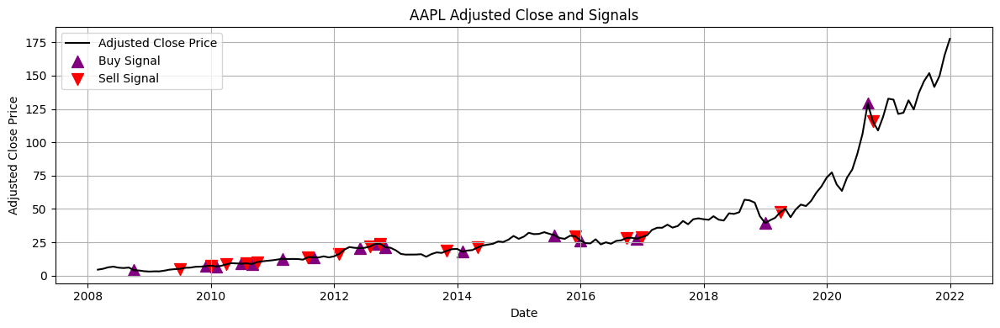

In [ ]:
# And the signals on the Adjusted Close price over time
aapl_data = monthly_ratios[monthly_ratios['Ticker'] == 'AAPL']
plt.figure(figsize=(12, 4))
plt.plot(aapl_data.index, aapl_data['Adjusted Close'], label='Adjusted Close Price', color='black')
buy_signals = aapl_data[aapl_data['Signal_PB'] == 1.0]
plt.scatter(buy_signals.index, buy_signals['Adjusted Close'], label='Buy Signal', marker='^', color='purple', s=100)
sell_signals = aapl_data[aapl_data['Signal_PB'] == -1]
plt.scatter(sell_signals.index, sell_signals['Adjusted Close'], label='Sell Signal', marker='v', color='red', s=100)
plt.title('AAPL Adjusted Close and Signals')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
pnl_pb_df = trading_long_only(monthly_ratios, signal_column='Signal Text_PB')

Processing Tickers:   0%|          | 3/773 [00:00<00:27, 27.64Ticker/s]

BUY  | AAL | 2015-05-31 | Price: 42.37
SELL | AAL | 2016-11-30 | Price: 46.44 | PnL: 4.07 | Cumul PnL: 4.07 | Return: 9.61% | Annualized: 6.31% | Days: 549 | Sharpe: 0.17
BUY  | AAL | 2016-12-31 | Price: 46.69
SELL | AAL | 2017-02-28 | Price: 46.36 | PnL: -0.33 | Cumul PnL: 3.74 | Return: -0.71% | Annualized: -4.17% | Days: 59 | Sharpe: -0.29
BUY  | AAL | 2017-08-31 | Price: 44.74
SELL | AAL | 2017-09-30 | Price: 47.49 | PnL: 2.75 | Cumul PnL: 6.49 | Return: 6.15% | Annualized: 104.59% | Days: 30 | Sharpe: 3.46
BUY  | AAL | 2017-10-31 | Price: 46.82
SELL | AAL | 2017-11-30 | Price: 50.49 | PnL: 3.67 | Cumul PnL: 10.16 | Return: 7.84% | Annualized: 147.34% | Days: 30 | Sharpe: 9.20
BUY  | AAL | 2018-03-31 | Price: 51.96
SELL | AAL | 2019-11-30 | Price: 28.74 | PnL: -23.22 | Cumul PnL: -13.06 | Return: -44.69% | Annualized: -29.90% | Days: 609 | Sharpe: -0.74
BUY  | PNW | 2008-03-31 | Price: 35.08
SELL | PNW | 2009-06-30 | Price: 30.15 | PnL: -4.93 | Cumul PnL: -4.93 | Return: -14.05% | 

Processing Tickers:   1%|          | 9/773 [00:00<00:27, 27.29Ticker/s]

BUY  | ALK | 2017-08-31 | Price: 74.66
SELL | ALK | 2018-11-30 | Price: 73.26 | PnL: -1.40 | Cumul PnL: -1.40 | Return: -1.88% | Annualized: -1.50% | Days: 456 | Sharpe: -0.05
BUY  | ALK | 2018-12-31 | Price: 60.85
SELL | ALK | 2019-10-31 | Price: 69.43 | PnL: 8.58 | Cumul PnL: 7.18 | Return: 14.10% | Annualized: 17.15% | Days: 304 | Sharpe: 0.58
BUY  | ALK | 2019-11-30 | Price: 69.01
SELL | ALK | 2020-11-30 | Price: 50.97 | PnL: -18.04 | Cumul PnL: -10.86 | Return: -26.14% | Annualized: -26.14% | Days: 366 | Sharpe: -0.42
BUY  | ALK | 2021-08-31 | Price: 57.34
BUY  | AYE | 2008-06-30 | Price: 50.11
SELL | AYE | 2010-09-30 | Price: 24.52 | PnL: -25.59 | Cumul PnL: -25.59 | Return: -51.07% | Annualized: -27.21% | Days: 822 | Sharpe: -0.80
BUY  | AYE | 2010-10-31 | Price: 23.20
SELL | AYE | 2011-01-31 | Price: 25.78 | PnL: 2.58 | Cumul PnL: -23.01 | Return: 11.12% | Annualized: 52.47% | Days: 92 | Sharpe: 2.98
BUY  | AYE | 2011-02-28 | Price: 24.99
BUY  | HON | 2008-03-31 | Price: 53.85


Processing Tickers:   2%|▏         | 15/773 [00:00<00:28, 26.45Ticker/s]

BUY  | BEAM | 2011-12-31 | Price: 51.23
SELL | BEAM | 2012-01-31 | Price: 52.31 | PnL: 1.08 | Cumul PnL: 1.08 | Return: 2.11% | Annualized: 28.45% | Days: 31 | Sharpe: 3.60
BUY  | FO | 2008-06-30 | Price: 48.95
SELL | FO | 2009-04-30 | Price: 30.83 | PnL: -18.12 | Cumul PnL: -18.12 | Return: -37.01% | Annualized: -42.58% | Days: 304 | Sharpe: -0.52
BUY  | FO | 2009-05-31 | Price: 27.46
SELL | FO | 2009-07-31 | Price: 31.04 | PnL: 3.58 | Cumul PnL: -14.54 | Return: 13.02% | Annualized: 108.47% | Days: 61 | Sharpe: 3.07
BUY  | FO | 2009-10-31 | Price: 30.55
SELL | FO | 2009-12-31 | Price: 33.89 | PnL: 3.33 | Cumul PnL: -11.21 | Return: 10.91% | Annualized: 86.15% | Days: 61 | Sharpe: 2.76
BUY  | FO | 2010-06-30 | Price: 30.73
SELL | FO | 2010-08-31 | Price: 35.13 | PnL: 4.40 | Cumul PnL: -6.81 | Return: 14.32% | Annualized: 123.20% | Days: 62 | Sharpe: 2.91
BUY  | FO | 2011-07-31 | Price: 47.23
BUY  | AEP | 2008-06-30 | Price: 40.23
SELL | AEP | 2009-06-30 | Price: 28.89 | PnL: -11.34 | 

Processing Tickers:   3%|▎         | 22/773 [00:00<00:28, 26.39Ticker/s]

BUY  | AIG | 2008-03-31 | Price: 723.85
SELL | AIG | 2009-07-31 | Price: 11.00 | PnL: -712.85 | Cumul PnL: -712.85 | Return: -98.48% | Annualized: -95.67% | Days: 487 | Sharpe: -0.58
BUY  | AIG | 2009-09-30 | Price: 36.91
SELL | AIG | 2010-10-31 | Price: 35.15 | PnL: -1.76 | Cumul PnL: -714.61 | Return: -4.76% | Annualized: -4.40% | Days: 396 | Sharpe: -0.08
BUY  | AIG | 2010-11-30 | Price: 34.55
SELL | AIG | 2010-12-31 | Price: 48.22 | PnL: 13.67 | Cumul PnL: -700.95 | Return: 39.55% | Annualized: 5354.32% | Days: 31 | Sharpe: 74.92
BUY  | AIG | 2011-01-31 | Price: 40.35
SELL | AIG | 2011-03-31 | Price: 35.14 | PnL: -5.21 | Cumul PnL: -706.16 | Return: -12.91% | Annualized: -56.37% | Days: 59 | Sharpe: -3.46
BUY  | AIG | 2011-05-31 | Price: 28.50
SELL | AIG | 2013-01-31 | Price: 37.83 | PnL: 9.33 | Cumul PnL: -696.83 | Return: 32.74% | Annualized: 18.52% | Days: 611 | Sharpe: 0.61
BUY  | AIG | 2014-07-31 | Price: 51.98
SELL | AIG | 2014-08-31 | Price: 56.06 | PnL: 4.08 | Cumul PnL: -6

Processing Tickers:   4%|▎         | 28/773 [00:01<00:28, 26.02Ticker/s]

BUY  | APA | 2008-07-31 | Price: 112.17
SELL | APA | 2009-05-31 | Price: 84.26 | PnL: -27.91 | Cumul PnL: -27.91 | Return: -24.88% | Annualized: -29.06% | Days: 304 | Sharpe: -0.66
BUY  | APA | 2009-06-30 | Price: 72.15
SELL | APA | 2009-07-31 | Price: 83.95 | PnL: 11.80 | Cumul PnL: -16.11 | Return: 16.35% | Annualized: 515.76% | Days: 31 | Sharpe: 9.69
BUY  | APA | 2010-06-30 | Price: 84.19
SELL | APA | 2010-07-31 | Price: 95.58 | PnL: 11.39 | Cumul PnL: -4.72 | Return: 13.53% | Annualized: 358.44% | Days: 31 | Sharpe: 10.61
BUY  | APA | 2010-08-31 | Price: 89.85
SELL | APA | 2010-09-30 | Price: 97.76 | PnL: 7.91 | Cumul PnL: 3.19 | Return: 8.80% | Annualized: 175.24% | Days: 30 | Sharpe: 6.84
BUY  | APA | 2011-02-28 | Price: 124.62
SELL | APA | 2013-09-30 | Price: 85.14 | PnL: -39.48 | Cumul PnL: -36.29 | Return: -31.68% | Annualized: -13.71% | Days: 945 | Sharpe: -0.45
BUY  | APA | 2013-12-31 | Price: 85.94
SELL | APA | 2014-05-31 | Price: 93.22 | PnL: 7.28 | Cumul PnL: -29.01 | Re

Processing Tickers:   4%|▍         | 31/773 [00:01<00:28, 25.61Ticker/s]

BUY  | GAS | 2008-02-29 | Price: 34.10
SELL | GAS | 2008-05-31 | Price: 40.83 | PnL: 6.73 | Cumul PnL: 6.73 | Return: 19.74% | Annualized: 105.54% | Days: 92 | Sharpe: 2.56
BUY  | GAS | 2008-11-30 | Price: 40.78
SELL | GAS | 2009-07-31 | Price: 36.44 | PnL: -4.34 | Cumul PnL: 2.39 | Return: -10.64% | Annualized: -15.53% | Days: 243 | Sharpe: -0.57
BUY  | GAS | 2009-08-31 | Price: 36.22
SELL | GAS | 2009-09-30 | Price: 36.59 | PnL: 0.37 | Cumul PnL: 2.76 | Return: 1.02% | Annualized: 12.97% | Days: 30 | Sharpe: 4.61
BUY  | GAS | 2010-05-31 | Price: 40.41
SELL | GAS | 2010-07-31 | Price: 43.79 | PnL: 3.38 | Cumul PnL: 6.14 | Return: 8.36% | Annualized: 61.93% | Days: 61 | Sharpe: 2.87
BUY  | GAS | 2012-02-29 | Price: 39.87
SELL | GAS | 2013-07-31 | Price: 45.79 | PnL: 5.92 | Cumul PnL: 12.06 | Return: 14.85% | Annualized: 10.27% | Days: 518 | Sharpe: 0.79
BUY  | GAS | 2013-08-31 | Price: 43.95
SELL | GAS | 2013-09-30 | Price: 46.03 | PnL: 2.08 | Cumul PnL: 14.14 | Return: 4.73% | Annuali

Processing Tickers:   5%|▍         | 37/773 [00:01<00:30, 24.11Ticker/s]

BUY  | BHI | 2008-03-31 | Price: 68.50
SELL | BHI | 2008-04-30 | Price: 80.88 | PnL: 12.38 | Cumul PnL: 12.38 | Return: 18.07% | Annualized: 634.19% | Days: 30 | Sharpe: 22.50
BUY  | BHI | 2008-08-31 | Price: 80.01
SELL | BHI | 2010-01-31 | Price: 45.28 | PnL: -34.73 | Cumul PnL: -22.35 | Return: -43.41% | Annualized: -33.09% | Days: 518 | Sharpe: -0.61
BUY  | BHI | 2010-05-31 | Price: 38.14
SELL | BHI | 2010-06-30 | Price: 41.57 | PnL: 3.43 | Cumul PnL: -18.92 | Return: 8.99% | Annualized: 181.06% | Days: 30 | Sharpe: 3.23
BUY  | BHI | 2010-08-31 | Price: 37.58
SELL | BHI | 2010-12-31 | Price: 57.17 | PnL: 19.59 | Cumul PnL: 0.67 | Return: 52.13% | Annualized: 252.07% | Days: 122 | Sharpe: 5.43
BUY  | BHI | 2011-08-31 | Price: 61.11
SELL | BHI | 2013-07-31 | Price: 47.43 | PnL: -13.68 | Cumul PnL: -13.01 | Return: -22.39% | Annualized: -12.39% | Days: 700 | Sharpe: -0.35
BUY  | BHI | 2013-08-31 | Price: 46.49
SELL | BHI | 2013-09-30 | Price: 49.10 | PnL: 2.61 | Cumul PnL: -10.40 | Ret

Processing Tickers:   5%|▌         | 40/773 [00:01<00:31, 23.24Ticker/s]

BUY  | BAX | 2008-03-31 | Price: 31.93
SELL | BAX | 2008-04-30 | Price: 34.42 | PnL: 2.49 | Cumul PnL: 2.49 | Return: 7.78% | Annualized: 145.81% | Days: 30 | Sharpe: 8.58
BUY  | BAX | 2008-10-31 | Price: 33.41
SELL | BAX | 2009-06-30 | Price: 29.25 | PnL: -4.16 | Cumul PnL: -1.67 | Return: -12.45% | Annualized: -18.08% | Days: 242 | Sharpe: -0.69
BUY  | BAX | 2009-10-31 | Price: 29.86
SELL | BAX | 2010-09-30 | Price: 26.35 | PnL: -3.51 | Cumul PnL: -5.18 | Return: -11.75% | Annualized: -12.74% | Days: 334 | Sharpe: -0.46
BUY  | BAX | 2010-11-30 | Price: 26.81
SELL | BAX | 2011-02-28 | Price: 29.35 | PnL: 2.54 | Cumul PnL: -2.64 | Return: 9.47% | Annualized: 43.63% | Days: 90 | Sharpe: 2.10
BUY  | BAX | 2011-08-31 | Price: 30.92
SELL | BAX | 2012-02-29 | Price: 32.11 | PnL: 1.19 | Cumul PnL: -1.45 | Return: 3.84% | Annualized: 7.83% | Days: 182 | Sharpe: 0.38
BUY  | BAX | 2012-05-31 | Price: 27.96
SELL | BAX | 2012-07-31 | Price: 32.32 | PnL: 4.36 | Cumul PnL: 2.91 | Return: 15.59% | A

Processing Tickers:   6%|▋         | 49/773 [00:01<00:24, 29.89Ticker/s]

BUY  | BBY | 2008-03-31 | Price: 41.46
SELL | BBY | 2009-03-31 | Price: 37.96 | PnL: -3.50 | Cumul PnL: -3.50 | Return: -8.44% | Annualized: -8.44% | Days: 365 | Sharpe: -0.13
BUY  | BBY | 2009-05-31 | Price: 35.10
SELL | BBY | 2009-09-30 | Price: 37.52 | PnL: 2.42 | Cumul PnL: -1.08 | Return: 6.89% | Annualized: 22.14% | Days: 122 | Sharpe: 0.91
BUY  | BBY | 2009-10-31 | Price: 38.18
SELL | BBY | 2009-11-30 | Price: 42.83 | PnL: 4.65 | Cumul PnL: 3.57 | Return: 12.18% | Annualized: 297.14% | Days: 30 | Sharpe: 16.46
BUY  | BBY | 2009-12-31 | Price: 39.46
SELL | BBY | 2010-03-31 | Price: 42.54 | PnL: 3.08 | Cumul PnL: 6.65 | Return: 7.81% | Annualized: 35.07% | Days: 90 | Sharpe: 1.03
BUY  | BBY | 2010-04-30 | Price: 45.52
SELL | BBY | 2010-10-31 | Price: 42.98 | PnL: -2.54 | Cumul PnL: 4.11 | Return: -5.58% | Annualized: -10.85% | Days: 184 | Sharpe: -0.21
BUY  | BBY | 2010-12-31 | Price: 34.29
SELL | BBY | 2012-04-30 | Price: 22.07 | PnL: -12.22 | Cumul PnL: -8.11 | Return: -35.64% |

Processing Tickers:   8%|▊         | 58/773 [00:02<00:20, 35.09Ticker/s]

BUY  | BC | 2008-03-31 | Price: 15.97
SELL | BC | 2008-04-30 | Price: 16.68 | PnL: 0.71 | Cumul PnL: 0.71 | Return: 4.45% | Annualized: 68.54% | Days: 30 | Sharpe: 6.17
BUY  | BC | 2008-05-31 | Price: 13.70
BUY  | BNI | 2008-09-30 | Price: 92.43
SELL | BNI | 2009-07-31 | Price: 78.59 | PnL: -13.84 | Cumul PnL: -13.84 | Return: -14.97% | Annualized: -17.69% | Days: 304 | Sharpe: -0.57
BUY  | BNI | 2009-09-30 | Price: 79.83
SELL | BNI | 2009-11-30 | Price: 98.30 | PnL: 18.47 | Cumul PnL: 4.63 | Return: 23.14% | Annualized: 248.60% | Days: 61 | Sharpe: 4.31
BUY  | UIS | 2008-06-30 | Price: 39.50
BUY  | CI | 2008-03-31 | Price: 40.57
SELL | CI | 2008-08-31 | Price: 41.88 | PnL: 1.31 | Cumul PnL: 1.31 | Return: 3.23% | Annualized: 7.93% | Days: 153 | Sharpe: 0.25
BUY  | CI | 2008-09-30 | Price: 33.98
SELL | CI | 2009-05-31 | Price: 22.17 | PnL: -11.81 | Cumul PnL: -10.50 | Return: -34.76% | Annualized: -47.30% | Days: 243 | Sharpe: -0.54
BUY  | CI | 2010-04-30 | Price: 32.06
SELL | CI | 201

Processing Tickers:   9%|▉         | 68/773 [00:02<00:18, 39.10Ticker/s]

BUY  | CAT | 2021-09-30 | Price: 191.97
BUY  | CTX | 2008-04-30 | Price: 20.82
SELL | CTX | 2008-05-31 | Price: 18.83 | PnL: -1.99 | Cumul PnL: -1.99 | Return: -9.56% | Annualized: -70.05% | Days: 31 | Sharpe: -9.10
BUY  | CTX | 2008-06-30 | Price: 13.37
SELL | CTX | 2008-08-31 | Price: 16.22 | PnL: 2.85 | Cumul PnL: 0.86 | Return: 21.32% | Annualized: 218.80% | Days: 62 | Sharpe: 3.42
BUY  | CTX | 2008-10-31 | Price: 12.25
SELL | CTX | 2009-04-30 | Price: 10.94 | PnL: -1.31 | Cumul PnL: -0.45 | Return: -10.69% | Annualized: -20.24% | Days: 181 | Sharpe: -0.22
BUY  | CTL | 2008-03-31 | Price: 33.24
SELL | CTL | 2008-05-31 | Price: 35.41 | PnL: 2.17 | Cumul PnL: 2.17 | Return: 6.53% | Annualized: 46.15% | Days: 61 | Sharpe: 1.86
BUY  | CTL | 2008-10-31 | Price: 25.11
SELL | CTL | 2009-05-31 | Price: 30.85 | PnL: 5.74 | Cumul PnL: 7.91 | Return: 22.86% | Annualized: 42.32% | Days: 212 | Sharpe: 0.97
BUY  | CTL | 2009-11-30 | Price: 35.59
SELL | CTL | 2010-10-31 | Price: 41.38 | PnL: 5.79

Processing Tickers:  10%|▉         | 74/773 [00:02<00:16, 41.26Ticker/s]

BUY  | CLF | 2010-05-31 | Price: 55.86
SELL | CLF | 2010-07-31 | Price: 56.57 | PnL: 0.71 | Cumul PnL: 0.71 | Return: 1.27% | Annualized: 7.87% | Days: 61 | Sharpe: 0.14
BUY  | CLF | 2010-11-30 | Price: 68.34
SELL | CLF | 2010-12-31 | Price: 78.01 | PnL: 9.67 | Cumul PnL: 10.38 | Return: 14.15% | Annualized: 389.44% | Days: 31 | Sharpe: 24.09
BUY  | CLF | 2011-05-31 | Price: 90.70
SELL | CLF | 2011-06-30 | Price: 92.45 | PnL: 1.75 | Cumul PnL: 12.13 | Return: 1.93% | Annualized: 25.78% | Days: 30 | Sharpe: 2.89
BUY  | CLF | 2011-08-31 | Price: 82.85
SELL | CLF | 2013-10-31 | Price: 25.68 | PnL: -57.17 | Cumul PnL: -45.04 | Return: -69.00% | Annualized: -41.76% | Days: 792 | Sharpe: -0.66
BUY  | CLF | 2014-01-31 | Price: 19.32
BUY  | CLX | 2008-03-31 | Price: 56.64
SELL | CLX | 2010-02-28 | Price: 61.31 | PnL: 4.67 | Cumul PnL: 4.67 | Return: 8.25% | Annualized: 4.22% | Days: 699 | Sharpe: 0.16
BUY  | CLX | 2010-05-31 | Price: 62.82
SELL | CLX | 2010-08-31 | Price: 64.82 | PnL: 2.00 | C

Processing Tickers:  11%|█         | 84/773 [00:02<00:18, 37.51Ticker/s]

BUY  | CA | 2008-03-31 | Price: 22.50
SELL | CA | 2008-05-31 | Price: 26.54 | PnL: 4.04 | Cumul PnL: 4.04 | Return: 17.96% | Annualized: 169.35% | Days: 61 | Sharpe: 4.82
BUY  | CA | 2008-06-30 | Price: 23.09
SELL | CA | 2009-07-31 | Price: 21.14 | PnL: -1.95 | Cumul PnL: 2.09 | Return: -8.45% | Annualized: -7.82% | Days: 396 | Sharpe: -0.24
BUY  | CA | 2009-10-31 | Price: 20.92
SELL | CA | 2009-12-31 | Price: 22.46 | PnL: 1.54 | Cumul PnL: 3.63 | Return: 7.36% | Annualized: 53.14% | Days: 61 | Sharpe: 3.54
BUY  | CA | 2010-01-31 | Price: 22.04
SELL | CA | 2010-03-31 | Price: 23.47 | PnL: 1.43 | Cumul PnL: 5.06 | Return: 6.49% | Annualized: 45.82% | Days: 59 | Sharpe: 5.17
BUY  | CA | 2010-04-30 | Price: 22.82
SELL | CA | 2010-10-31 | Price: 23.20 | PnL: 0.38 | Cumul PnL: 5.44 | Return: 1.67% | Annualized: 3.36% | Days: 184 | Sharpe: 0.10
BUY  | CA | 2010-11-30 | Price: 22.89
SELL | CA | 2010-12-31 | Price: 24.44 | PnL: 1.55 | Cumul PnL: 6.99 | Return: 6.77% | Annualized: 119.52% | Day

Processing Tickers:  12%|█▏        | 94/773 [00:02<00:17, 38.56Ticker/s]

SELL | GLW | 2016-03-31 | Price: 20.89 | PnL: -0.04 | Cumul PnL: -2.74 | Return: -0.19% | Annualized: -0.21% | Days: 336 | Sharpe: -0.01
BUY  | GLW | 2016-04-30 | Price: 18.67
SELL | GLW | 2016-05-31 | Price: 20.89 | PnL: 2.22 | Cumul PnL: -0.52 | Return: 11.89% | Annualized: 285.06% | Days: 31 | Sharpe: 7.31
BUY  | GLW | 2016-09-30 | Price: 23.65
SELL | GLW | 2016-11-30 | Price: 24.03 | PnL: 0.38 | Cumul PnL: -0.14 | Return: 1.61% | Annualized: 10.04% | Days: 61 | Sharpe: 0.68
BUY  | GLW | 2018-03-31 | Price: 27.88
SELL | GLW | 2018-05-31 | Price: 27.17 | PnL: -0.71 | Cumul PnL: -0.85 | Return: -2.55% | Annualized: -14.34% | Days: 61 | Sharpe: -2.06
BUY  | GLW | 2019-05-31 | Price: 28.84
SELL | GLW | 2019-06-30 | Price: 33.23 | PnL: 4.39 | Cumul PnL: 3.54 | Return: 15.22% | Annualized: 447.55% | Days: 30 | Sharpe: 10.47
BUY  | GLW | 2019-07-31 | Price: 30.75
SELL | GLW | 2020-06-30 | Price: 25.90 | PnL: -4.85 | Cumul PnL: -1.31 | Return: -15.77% | Annualized: -17.08% | Days: 335 | Sha

Processing Tickers:  13%|█▎        | 104/773 [00:03<00:16, 41.46Ticker/s]

BUY  | DIS | 2008-03-31 | Price: 31.38
SELL | DIS | 2008-05-31 | Price: 33.60 | PnL: 2.22 | Cumul PnL: 2.22 | Return: 7.07% | Annualized: 50.70% | Days: 61 | Sharpe: 4.66
BUY  | DIS | 2008-06-30 | Price: 31.20
SELL | DIS | 2009-07-31 | Price: 25.12 | PnL: -6.08 | Cumul PnL: -3.86 | Return: -19.49% | Annualized: -18.13% | Days: 396 | Sharpe: -0.49
BUY  | DIS | 2010-06-30 | Price: 31.50
SELL | DIS | 2010-07-31 | Price: 33.69 | PnL: 2.19 | Cumul PnL: -1.67 | Return: 6.95% | Annualized: 124.02% | Days: 31 | Sharpe: 5.64
BUY  | DIS | 2010-08-31 | Price: 32.54
SELL | DIS | 2010-10-31 | Price: 36.12 | PnL: 3.59 | Cumul PnL: 1.92 | Return: 11.02% | Annualized: 87.22% | Days: 61 | Sharpe: 4.89
BUY  | DIS | 2011-06-30 | Price: 39.04
SELL | DIS | 2011-12-31 | Price: 37.50 | PnL: -1.54 | Cumul PnL: 0.38 | Return: -3.94% | Annualized: -7.73% | Days: 184 | Sharpe: -0.25
BUY  | DIS | 2013-08-31 | Price: 60.83
SELL | DIS | 2013-09-30 | Price: 64.49 | PnL: 3.66 | Cumul PnL: 4.04 | Return: 6.02% | Annua

Processing Tickers:  14%|█▍        | 109/773 [00:03<00:17, 38.87Ticker/s]

SELL | OMC | 2014-10-31 | Price: 71.86 | PnL: 3.00 | Cumul PnL: 23.18 | Return: 4.36% | Annualized: 66.82% | Days: 31 | Sharpe: 4.42
BUY  | OMC | 2015-08-31 | Price: 66.98
SELL | OMC | 2015-10-31 | Price: 74.92 | PnL: 7.94 | Cumul PnL: 31.12 | Return: 11.85% | Annualized: 95.85% | Days: 61 | Sharpe: 3.00
BUY  | OMC | 2017-07-31 | Price: 78.74
SELL | OMC | 2018-10-31 | Price: 74.32 | PnL: -4.42 | Cumul PnL: 26.70 | Return: -5.61% | Annualized: -4.52% | Days: 457 | Sharpe: -0.23
BUY  | OMC | 2019-02-28 | Price: 75.70
SELL | OMC | 2019-04-30 | Price: 80.03 | PnL: 4.33 | Cumul PnL: 31.03 | Return: 5.72% | Annualized: 39.62% | Days: 61 | Sharpe: 1.89
BUY  | OMC | 2019-08-31 | Price: 76.06
SELL | OMC | 2019-09-30 | Price: 78.30 | PnL: 2.24 | Cumul PnL: 33.27 | Return: 2.95% | Annualized: 41.67% | Days: 30 | Sharpe: 2.96
BUY  | OMC | 2019-10-31 | Price: 77.19
SELL | OMC | 2019-11-30 | Price: 79.48 | PnL: 2.29 | Cumul PnL: 35.56 | Return: 2.97% | Annualized: 42.02% | Days: 30 | Sharpe: 5.53
BU

Processing Tickers:  15%|█▌        | 118/773 [00:03<00:17, 36.79Ticker/s]

BUY  | EFX | 2008-06-30 | Price: 33.62
SELL | EFX | 2009-04-30 | Price: 29.16 | PnL: -4.46 | Cumul PnL: -4.46 | Return: -13.27% | Annualized: -15.70% | Days: 304 | Sharpe: -0.38
BUY  | EFX | 2009-05-31 | Price: 27.22
SELL | EFX | 2009-09-30 | Price: 29.14 | PnL: 1.92 | Cumul PnL: -2.54 | Return: 7.05% | Annualized: 22.69% | Days: 122 | Sharpe: 1.30
BUY  | EFX | 2009-10-31 | Price: 27.38
SELL | EFX | 2009-12-31 | Price: 30.89 | PnL: 3.51 | Cumul PnL: 0.97 | Return: 12.82% | Annualized: 106.21% | Days: 61 | Sharpe: 5.17
BUY  | EFX | 2010-05-31 | Price: 30.25
SELL | EFX | 2010-10-31 | Price: 33.13 | PnL: 2.88 | Cumul PnL: 3.85 | Return: 9.52% | Annualized: 24.39% | Days: 153 | Sharpe: 0.87
BUY  | EFX | 2011-06-30 | Price: 34.72
SELL | EFX | 2011-11-30 | Price: 37.15 | PnL: 2.43 | Cumul PnL: 6.28 | Return: 7.00% | Annualized: 17.63% | Days: 153 | Sharpe: 0.65
BUY  | EFX | 2013-08-31 | Price: 59.09
SELL | EFX | 2013-09-30 | Price: 59.85 | PnL: 0.76 | Cumul PnL: 7.04 | Return: 1.29% | Annual

Processing Tickers:  17%|█▋        | 128/773 [00:03<00:16, 39.21Ticker/s]

BUY  | FDX | 2008-05-31 | Price: 91.71
SELL | FDX | 2009-07-31 | Price: 67.84 | PnL: -23.87 | Cumul PnL: -23.87 | Return: -26.03% | Annualized: -22.77% | Days: 426 | Sharpe: -0.51
BUY  | FDX | 2010-06-30 | Price: 70.11
SELL | FDX | 2010-07-31 | Price: 82.55 | PnL: 12.44 | Cumul PnL: -11.43 | Return: 17.74% | Annualized: 609.98% | Days: 31 | Sharpe: 10.43
BUY  | FDX | 2011-07-31 | Price: 86.88
SELL | FDX | 2012-01-31 | Price: 91.49 | PnL: 4.61 | Cumul PnL: -6.82 | Return: 5.31% | Annualized: 10.89% | Days: 184 | Sharpe: 0.28
BUY  | FDX | 2012-04-30 | Price: 88.24
SELL | FDX | 2012-07-31 | Price: 90.30 | PnL: 2.06 | Cumul PnL: -4.76 | Return: 2.33% | Annualized: 9.67% | Days: 92 | Sharpe: 1.09
BUY  | FDX | 2013-04-30 | Price: 94.01
SELL | FDX | 2013-06-30 | Price: 98.58 | PnL: 4.57 | Cumul PnL: -0.19 | Return: 4.86% | Annualized: 32.95% | Days: 61 | Sharpe: 3.03
BUY  | FDX | 2013-07-31 | Price: 106.00
SELL | FDX | 2013-09-30 | Price: 114.11 | PnL: 8.11 | Cumul PnL: 7.92 | Return: 7.65% |

Processing Tickers:  18%|█▊        | 137/773 [00:04<00:15, 40.74Ticker/s]

BUY  | FHN | 2008-03-31 | Price: 11.67
SELL | FHN | 2008-07-31 | Price: 7.83 | PnL: -3.84 | Cumul PnL: -3.84 | Return: -32.91% | Annualized: -69.80% | Days: 122 | Sharpe: -1.10
BUY  | FHN | 2008-09-30 | Price: 8.04
SELL | FHN | 2008-10-31 | Price: 10.23 | PnL: 2.19 | Cumul PnL: -1.65 | Return: 27.24% | Annualized: 1701.49% | Days: 31 | Sharpe: 23.76
BUY  | FHN | 2009-01-31 | Price: 8.32
SELL | FHN | 2009-03-31 | Price: 9.64 | PnL: 1.32 | Cumul PnL: -0.33 | Return: 15.82% | Annualized: 141.43% | Days: 59 | Sharpe: 3.14
BUY  | FHN | 2010-06-30 | Price: 11.06
SELL | FHN | 2010-09-30 | Price: 11.21 | PnL: 0.14 | Cumul PnL: -0.19 | Return: 1.30% | Annualized: 5.31% | Days: 92 | Sharpe: 0.15
BUY  | FHN | 2010-10-31 | Price: 9.91
SELL | FHN | 2010-12-31 | Price: 11.78 | PnL: 1.87 | Cumul PnL: 1.68 | Return: 18.86% | Annualized: 182.05% | Days: 61 | Sharpe: 3.27
BUY  | FHN | 2011-04-30 | Price: 10.95
SELL | FHN | 2012-02-29 | Price: 9.40 | PnL: -1.55 | Cumul PnL: 0.13 | Return: -14.16% | Annua

Processing Tickers:  19%|█▉        | 147/773 [00:04<00:14, 42.40Ticker/s]

BUY  | GD | 2008-06-30 | Price: 84.20
SELL | GD | 2008-07-31 | Price: 89.14 | PnL: 4.94 | Cumul PnL: 4.94 | Return: 5.87% | Annualized: 98.21% | Days: 31 | Sharpe: 3.91
BUY  | GD | 2008-09-30 | Price: 73.62
SELL | GD | 2009-05-31 | Price: 56.90 | PnL: -16.72 | Cumul PnL: -11.78 | Return: -22.71% | Annualized: -32.05% | Days: 243 | Sharpe: -0.60
BUY  | GD | 2010-05-31 | Price: 67.90
SELL | GD | 2010-10-31 | Price: 68.12 | PnL: 0.22 | Cumul PnL: -11.56 | Return: 0.32% | Annualized: 0.78% | Days: 153 | Sharpe: 0.02
BUY  | GD | 2010-11-30 | Price: 66.09
SELL | GD | 2011-01-31 | Price: 75.40 | PnL: 9.31 | Cumul PnL: -2.25 | Return: 14.09% | Annualized: 120.50% | Days: 62 | Sharpe: 7.50
BUY  | GD | 2011-05-31 | Price: 74.22
SELL | GD | 2012-02-29 | Price: 73.23 | PnL: -0.99 | Cumul PnL: -3.24 | Return: -1.33% | Annualized: -1.77% | Days: 274 | Sharpe: -0.08
BUY  | GD | 2012-05-31 | Price: 64.01
SELL | GD | 2012-10-31 | Price: 68.08 | PnL: 4.07 | Cumul PnL: 0.83 | Return: 6.36% | Annualized: 

Processing Tickers:  20%|██        | 157/773 [00:04<00:14, 43.46Ticker/s]

BUY  | HAL | 2008-08-31 | Price: 43.94
SELL | HAL | 2009-09-30 | Price: 27.12 | PnL: -16.82 | Cumul PnL: -16.82 | Return: -38.28% | Annualized: -35.95% | Days: 395 | Sharpe: -0.62
BUY  | HAL | 2010-05-31 | Price: 24.83
SELL | HAL | 2010-07-31 | Price: 29.88 | PnL: 5.05 | Cumul PnL: -11.77 | Return: 20.34% | Annualized: 203.68% | Days: 61 | Sharpe: 3.53
BUY  | HAL | 2010-08-31 | Price: 28.21
SELL | HAL | 2010-09-30 | Price: 33.07 | PnL: 4.86 | Cumul PnL: -6.91 | Return: 17.23% | Annualized: 573.56% | Days: 30 | Sharpe: 14.51
BUY  | HAL | 2011-08-31 | Price: 44.37
SELL | HAL | 2013-01-31 | Price: 40.68 | PnL: -3.69 | Cumul PnL: -10.60 | Return: -8.32% | Annualized: -5.94% | Days: 519 | Sharpe: -0.14
BUY  | HAL | 2014-10-31 | Price: 55.14
SELL | HAL | 2016-04-30 | Price: 41.31 | PnL: -13.83 | Cumul PnL: -24.43 | Return: -25.08% | Annualized: -17.51% | Days: 547 | Sharpe: -0.51
BUY  | HAL | 2017-08-31 | Price: 38.97
SELL | HAL | 2017-09-30 | Price: 46.03 | PnL: 7.06 | Cumul PnL: -17.37 | R

Processing Tickers:  21%|██        | 162/773 [00:04<00:14, 43.45Ticker/s]

BUY  | HPC | 2008-03-31 | Price: 18.29
SELL | HPC | 2008-04-30 | Price: 18.80 | PnL: 0.51 | Cumul PnL: 0.51 | Return: 2.79% | Annualized: 39.10% | Days: 30 | Sharpe: 7.65
BUY  | HPC | 2008-06-30 | Price: 16.93
SELL | HPC | 2008-07-31 | Price: 20.05 | PnL: 3.12 | Cumul PnL: 3.63 | Return: 18.43% | Annualized: 661.18% | Days: 31 | Sharpe: 10.50
BUY  | HPC | 2008-09-30 | Price: 19.79
BUY  | HSY | 2008-06-30 | Price: 32.78
SELL | HSY | 2008-07-31 | Price: 36.77 | PnL: 3.99 | Cumul PnL: 3.99 | Return: 12.17% | Annualized: 296.84% | Days: 31 | Sharpe: 6.01
BUY  | HSY | 2008-08-31 | Price: 36.09
SELL | HSY | 2008-09-30 | Price: 39.54 | PnL: 3.45 | Cumul PnL: 7.44 | Return: 9.56% | Annualized: 199.09% | Days: 30 | Sharpe: 10.07
BUY  | HSY | 2008-10-31 | Price: 37.24
SELL | HSY | 2009-01-31 | Price: 37.28 | PnL: 0.04 | Cumul PnL: 7.48 | Return: 0.11% | Annualized: 0.43% | Days: 92 | Sharpe: 0.02
BUY  | HSY | 2009-10-31 | Price: 37.79
SELL | HSY | 2010-08-31 | Price: 46.47 | PnL: 8.68 | Cumul Pn

Processing Tickers:  22%|██▏       | 172/773 [00:04<00:14, 40.63Ticker/s]

BUY  | JBHT | 2015-09-30 | Price: 71.40
SELL | JBHT | 2015-10-31 | Price: 76.37 | PnL: 4.97 | Cumul PnL: 4.97 | Return: 6.96% | Annualized: 124.23% | Days: 31 | Sharpe: 8.10
BUY  | JBHT | 2016-02-29 | Price: 76.29
SELL | JBHT | 2016-03-31 | Price: 84.24 | PnL: 7.95 | Cumul PnL: 12.92 | Return: 10.42% | Annualized: 228.56% | Days: 31 | Sharpe: 24.07
BUY  | JBHT | 2016-08-31 | Price: 79.39
SELL | JBHT | 2016-11-30 | Price: 95.37 | PnL: 15.98 | Cumul PnL: 28.90 | Return: 20.13% | Annualized: 108.25% | Days: 91 | Sharpe: 3.93
BUY  | JBHT | 2017-03-31 | Price: 91.74
SELL | JBHT | 2017-06-30 | Price: 91.38 | PnL: -0.36 | Cumul PnL: 28.54 | Return: -0.39% | Annualized: -1.56% | Days: 91 | Sharpe: -0.09
BUY  | JBHT | 2017-07-31 | Price: 90.71
SELL | JBHT | 2017-08-31 | Price: 98.89 | PnL: 8.18 | Cumul PnL: 36.72 | Return: 9.02% | Annualized: 181.82% | Days: 31 | Sharpe: 10.77
BUY  | JBHT | 2018-06-30 | Price: 121.55
SELL | JBHT | 2019-08-31 | Price: 108.04 | PnL: -13.51 | Cumul PnL: 23.21 | Re

Processing Tickers:  24%|██▎       | 182/773 [00:05<00:14, 39.59Ticker/s]

BUY  | IP | 2008-03-31 | Price: 25.40
SELL | IP | 2009-04-30 | Price: 11.82 | PnL: -13.58 | Cumul PnL: -13.58 | Return: -53.46% | Annualized: -50.64% | Days: 395 | Sharpe: -0.51
BUY  | IP | 2010-06-30 | Price: 21.13
SELL | IP | 2010-07-31 | Price: 22.60 | PnL: 1.47 | Cumul PnL: -12.11 | Return: 6.94% | Annualized: 123.65% | Days: 31 | Sharpe: 7.50
BUY  | IP | 2010-08-31 | Price: 19.10
SELL | IP | 2010-10-31 | Price: 23.61 | PnL: 4.50 | Cumul PnL: -7.61 | Return: 23.56% | Annualized: 255.82% | Days: 61 | Sharpe: 5.58
BUY  | IP | 2010-11-30 | Price: 23.32
SELL | IP | 2010-12-31 | Price: 25.44 | PnL: 2.12 | Cumul PnL: -5.49 | Return: 9.09% | Annualized: 184.09% | Days: 31 | Sharpe: 10.30
BUY  | IP | 2011-06-30 | Price: 27.84
SELL | IP | 2011-11-30 | Price: 26.52 | PnL: -1.33 | Cumul PnL: -6.82 | Return: -4.76% | Annualized: -11.05% | Days: 153 | Sharpe: -0.30
BUY  | IP | 2012-05-31 | Price: 27.27
SELL | IP | 2012-08-31 | Price: 32.27 | PnL: 5.00 | Cumul PnL: -1.81 | Return: 18.36% | Annua

Processing Tickers:  25%|██▍       | 190/773 [00:05<00:14, 39.55Ticker/s]

BUY  | EVRG | 2018-08-31 | Price: 57.05
SELL | EVRG | 2020-01-31 | Price: 72.16 | PnL: 15.11 | Cumul PnL: 15.11 | Return: 26.49% | Annualized: 18.04% | Days: 518 | Sharpe: 1.33
BUY  | EVRG | 2020-02-29 | Price: 65.35
SELL | EVRG | 2020-07-31 | Price: 64.83 | PnL: -0.52 | Cumul PnL: 14.59 | Return: -0.80% | Annualized: -1.90% | Days: 153 | Sharpe: -0.06
BUY  | EVRG | 2020-08-31 | Price: 53.22
SELL | EVRG | 2021-03-31 | Price: 59.53 | PnL: 6.31 | Cumul PnL: 20.90 | Return: 11.86% | Annualized: 21.18% | Days: 212 | Sharpe: 0.74
BUY  | EVRG | 2021-09-30 | Price: 62.20
SELL | EVRG | 2021-10-31 | Price: 63.75 | PnL: 1.55 | Cumul PnL: 22.45 | Return: 2.49% | Annualized: 34.36% | Days: 31 | Sharpe: 1.71
BUY  | EVRG | 2021-11-30 | Price: 63.30
SELL | EVRG | 2021-12-31 | Price: 68.61 | PnL: 5.31 | Cumul PnL: 27.76 | Return: 8.39% | Annualized: 162.91% | Days: 31 | Sharpe: 10.34
BUY  | K | 2008-04-30 | Price: 48.11
SELL | K | 2008-05-31 | Price: 48.71 | PnL: 0.60 | Cumul PnL: 0.60 | Return: 1.25%

Processing Tickers:  26%|██▌       | 199/773 [00:05<00:13, 42.05Ticker/s]

SELL | LEN | 2020-05-31 | Price: 60.46 | PnL: 0.12 | Cumul PnL: 42.29 | Return: 0.20% | Annualized: 0.80% | Days: 92 | Sharpe: 0.01
BUY  | LEN | 2021-09-30 | Price: 93.68
SELL | LEN | 2021-12-31 | Price: 116.16 | PnL: 22.48 | Cumul PnL: 64.77 | Return: 24.00% | Annualized: 136.40% | Days: 92 | Sharpe: 4.40
BUY  | JEF | 2018-08-31 | Price: 20.70
BUY  | LUK | 2008-03-31 | Price: 39.13
SELL | LUK | 2008-04-30 | Price: 44.32 | PnL: 5.19 | Cumul PnL: 5.19 | Return: 13.27% | Annualized: 345.97% | Days: 30 | Sharpe: 14.95
BUY  | LUK | 2008-08-31 | Price: 40.06
SELL | LUK | 2009-03-31 | Price: 12.89 | PnL: -27.17 | Cumul PnL: -21.98 | Return: -67.83% | Annualized: -85.69% | Days: 212 | Sharpe: -1.63
BUY  | LUK | 2009-08-31 | Price: 21.52
SELL | LUK | 2010-09-30 | Price: 20.44 | PnL: -1.08 | Cumul PnL: -23.06 | Return: -5.03% | Annualized: -4.65% | Days: 395 | Sharpe: -0.17
BUY  | LUK | 2010-11-30 | Price: 22.47
SELL | LUK | 2010-12-31 | Price: 25.25 | PnL: 2.79 | Cumul PnL: -20.28 | Return: 12

Processing Tickers:  27%|██▋       | 209/773 [00:05<00:13, 41.23Ticker/s]

BUY  | L | 2008-09-30 | Price: 39.49
SELL | L | 2009-05-31 | Price: 27.05 | PnL: -12.44 | Cumul PnL: -12.44 | Return: -31.50% | Annualized: -43.31% | Days: 243 | Sharpe: -1.01
BUY  | L | 2009-11-30 | Price: 35.42
SELL | L | 2010-02-28 | Price: 36.46 | PnL: 1.04 | Cumul PnL: -11.40 | Return: 2.94% | Annualized: 12.27% | Days: 90 | Sharpe: 1.16
BUY  | L | 2010-05-31 | Price: 32.51
SELL | L | 2010-07-31 | Price: 37.15 | PnL: 4.64 | Cumul PnL: -6.76 | Return: 14.27% | Annualized: 122.66% | Days: 61 | Sharpe: 3.54
BUY  | L | 2010-08-31 | Price: 35.14
SELL | L | 2010-10-31 | Price: 39.49 | PnL: 4.35 | Cumul PnL: -2.41 | Return: 12.37% | Annualized: 101.35% | Days: 61 | Sharpe: 5.23
BUY  | L | 2010-11-30 | Price: 37.41
SELL | L | 2011-02-28 | Price: 43.25 | PnL: 5.84 | Cumul PnL: 3.43 | Return: 15.61% | Annualized: 78.65% | Days: 90 | Sharpe: 4.71
BUY  | L | 2011-07-31 | Price: 39.87
SELL | L | 2012-03-31 | Price: 39.87 | PnL: 0.00 | Cumul PnL: 3.43 | Return: 0.00% | Annualized: 0.00% | Days:

Processing Tickers:  28%|██▊       | 214/773 [00:05<00:13, 41.14Ticker/s]

BUY  | MAS | 2008-04-30 | Price: 16.17
SELL | MAS | 2008-05-31 | Price: 16.46 | PnL: 0.29 | Cumul PnL: 0.29 | Return: 1.81% | Annualized: 24.05% | Days: 31 | Sharpe: 1.39
BUY  | MAS | 2008-06-30 | Price: 13.97
SELL | MAS | 2008-08-31 | Price: 16.92 | PnL: 2.96 | Cumul PnL: 3.25 | Return: 21.17% | Annualized: 216.49% | Days: 62 | Sharpe: 4.91
BUY  | MAS | 2008-10-31 | Price: 9.01
SELL | MAS | 2009-05-31 | Price: 9.20 | PnL: 0.19 | Cumul PnL: 3.44 | Return: 2.07% | Annualized: 3.57% | Days: 212 | Sharpe: 0.04
BUY  | MAS | 2010-06-30 | Price: 9.55
SELL | MAS | 2010-09-30 | Price: 9.78 | PnL: 0.22 | Cumul PnL: 3.66 | Return: 2.32% | Annualized: 9.62% | Days: 92 | Sharpe: 0.30
BUY  | MAS | 2010-10-31 | Price: 9.47
SELL | MAS | 2010-12-31 | Price: 11.24 | PnL: 1.78 | Cumul PnL: 5.43 | Return: 18.76% | Annualized: 180.58% | Days: 61 | Sharpe: 6.45
BUY  | MAS | 2011-08-31 | Price: 7.88
SELL | MAS | 2011-10-31 | Price: 8.52 | PnL: 0.65 | Cumul PnL: 6.08 | Return: 8.23% | Annualized: 60.73% | Da

Processing Tickers:  29%|██▉       | 224/773 [00:06<00:12, 42.56Ticker/s]

BUY  | CVS | 2015-09-30 | Price: 96.48
SELL | CVS | 2015-10-31 | Price: 98.78 | PnL: 2.30 | Cumul PnL: 6.09 | Return: 2.38% | Annualized: 32.67% | Days: 31 | Sharpe: 2.31
BUY  | CVS | 2015-11-30 | Price: 94.09
SELL | CVS | 2016-03-31 | Price: 103.73 | PnL: 9.64 | Cumul PnL: 15.73 | Return: 10.25% | Annualized: 33.99% | Days: 122 | Sharpe: 2.46
BUY  | CVS | 2016-04-30 | Price: 100.50
SELL | CVS | 2016-05-31 | Price: 96.45 | PnL: -4.05 | Cumul PnL: 11.68 | Return: -4.03% | Annualized: -38.96% | Days: 31 | Sharpe: -24.55
BUY  | CVS | 2016-06-30 | Price: 95.74
SELL | CVS | 2018-08-31 | Price: 75.24 | PnL: -20.50 | Cumul PnL: -8.82 | Return: -21.41% | Annualized: -10.52% | Days: 792 | Sharpe: -0.41
BUY  | CVS | 2019-02-28 | Price: 57.83
SELL | CVS | 2019-11-30 | Price: 75.27 | PnL: 17.44 | Cumul PnL: 8.62 | Return: 30.16% | Annualized: 42.11% | Days: 275 | Sharpe: 1.73
BUY  | CVS | 2020-01-31 | Price: 67.82
SELL | CVS | 2020-11-30 | Price: 67.79 | PnL: -0.03 | Cumul PnL: 8.59 | Return: -0.0

Processing Tickers:  30%|███       | 234/773 [00:06<00:12, 44.61Ticker/s]

BUY  | MSI | 2011-03-31 | Price: 44.69
SELL | MSI | 2012-05-31 | Price: 48.08 | PnL: 3.39 | Cumul PnL: 3.39 | Return: 7.59% | Annualized: 6.47% | Days: 427 | Sharpe: 0.32
BUY  | MSI | 2014-02-28 | Price: 66.20
SELL | MSI | 2014-11-30 | Price: 65.72 | PnL: -0.48 | Cumul PnL: 2.91 | Return: -0.73% | Annualized: -0.97% | Days: 275 | Sharpe: -0.07
BUY  | MSI | 2015-01-31 | Price: 62.41
SELL | MSI | 2015-02-28 | Price: 67.94 | PnL: 5.53 | Cumul PnL: 8.44 | Return: 8.86% | Annualized: 176.99% | Days: 28 | Sharpe: 6.46
BUY  | MSI | 2015-04-30 | Price: 59.75
SELL | MSI | 2015-05-31 | Price: 59.00 | PnL: -0.75 | Cumul PnL: 7.69 | Return: -1.26% | Annualized: -14.07% | Days: 31 | Sharpe: -0.89
BUY  | MSI | 2015-11-30 | Price: 71.78
BUY  | MUR | 2008-07-31 | Price: 68.92
SELL | MUR | 2009-10-31 | Price: 52.85 | PnL: -16.07 | Cumul PnL: -16.07 | Return: -23.32% | Annualized: -19.13% | Days: 457 | Sharpe: -0.49
BUY  | MUR | 2009-11-30 | Price: 48.75
SELL | MUR | 2010-04-30 | Price: 52.00 | PnL: 3.2

Processing Tickers:  32%|███▏      | 244/773 [00:06<00:13, 38.98Ticker/s]

BUY  | NEM | 2008-03-31 | Price: 45.30
SELL | NEM | 2008-06-30 | Price: 52.16 | PnL: 6.86 | Cumul PnL: 6.86 | Return: 15.14% | Annualized: 75.78% | Days: 91 | Sharpe: 2.59
BUY  | NEM | 2008-07-31 | Price: 47.96
SELL | NEM | 2009-02-28 | Price: 41.63 | PnL: -6.33 | Cumul PnL: 0.53 | Return: -13.20% | Annualized: -21.55% | Days: 212 | Sharpe: -0.35
BUY  | NEM | 2009-06-30 | Price: 40.87
SELL | NEM | 2009-11-30 | Price: 53.64 | PnL: 12.77 | Cumul PnL: 13.30 | Return: 31.25% | Annualized: 92.04% | Days: 153 | Sharpe: 2.19
BUY  | NEM | 2009-12-31 | Price: 47.31
SELL | NEM | 2010-04-30 | Price: 56.08 | PnL: 8.77 | Cumul PnL: 22.07 | Return: 18.54% | Annualized: 66.56% | Days: 120 | Sharpe: 1.82
BUY  | NEM | 2010-05-31 | Price: 53.82
SELL | NEM | 2010-06-30 | Price: 61.74 | PnL: 7.92 | Cumul PnL: 29.99 | Return: 14.72% | Annualized: 419.37% | Days: 30 | Sharpe: 12.92
BUY  | NEM | 2010-11-30 | Price: 58.83
SELL | NEM | 2011-10-31 | Price: 66.83 | PnL: 8.00 | Cumul PnL: 37.99 | Return: 13.60% |

Processing Tickers:  32%|███▏      | 249/773 [00:06<00:13, 37.89Ticker/s]

SELL | NU | 2013-04-30 | Price: 45.33 | PnL: 7.66 | Cumul PnL: 19.16 | Return: 20.33% | Annualized: 32.00% | Days: 242 | Sharpe: 2.99
BUY  | NU | 2013-05-31 | Price: 41.67
SELL | NU | 2014-03-31 | Price: 45.50 | PnL: 3.83 | Cumul PnL: 22.99 | Return: 9.19% | Annualized: 11.13% | Days: 304 | Sharpe: 0.72
BUY  | NU | 2014-05-31 | Price: 45.40
SELL | NU | 2014-06-30 | Price: 47.27 | PnL: 1.87 | Cumul PnL: 24.86 | Return: 4.12% | Annualized: 62.31% | Days: 30 | Sharpe: 4.47
BUY  | NU | 2014-07-31 | Price: 43.90
SELL | NU | 2014-10-31 | Price: 49.35 | PnL: 5.45 | Cumul PnL: 30.31 | Return: 12.41% | Annualized: 59.69% | Days: 92 | Sharpe: 2.40
BUY  | NI | 2008-07-31 | Price: 6.13
SELL | NI | 2009-07-31 | Price: 4.63 | PnL: -1.50 | Cumul PnL: -1.50 | Return: -24.53% | Annualized: -24.53% | Days: 365 | Sharpe: -0.77
BUY  | NI | 2010-06-30 | Price: 5.21
SELL | NI | 2010-07-31 | Price: 5.92 | PnL: 0.72 | Cumul PnL: -0.79 | Return: 13.79% | Annualized: 371.40% | Days: 31 | Sharpe: 12.71
BUY  | NI

Processing Tickers:  33%|███▎      | 257/773 [00:07<00:13, 37.09Ticker/s]

SELL | OXY | 2013-04-30 | Price: 86.03 | PnL: -5.75 | Cumul PnL: 8.13 | Return: -6.27% | Annualized: -5.80% | Days: 395 | Sharpe: -0.21
BUY  | OXY | 2013-06-30 | Price: 86.00
SELL | OXY | 2013-09-30 | Price: 90.16 | PnL: 4.15 | Cumul PnL: 12.28 | Return: 4.83% | Annualized: 20.77% | Days: 92 | Sharpe: 1.77
BUY  | OXY | 2013-11-30 | Price: 91.52
SELL | OXY | 2014-02-28 | Price: 93.03 | PnL: 1.50 | Cumul PnL: 13.78 | Return: 1.64% | Annualized: 6.73% | Days: 90 | Sharpe: 0.30
BUY  | OXY | 2014-03-31 | Price: 91.84
SELL | OXY | 2014-05-31 | Price: 96.08 | PnL: 4.24 | Cumul PnL: 18.02 | Return: 4.62% | Annualized: 31.11% | Days: 61 | Sharpe: 4.00
BUY  | OXY | 2014-07-31 | Price: 94.17
SELL | OXY | 2014-08-31 | Price: 99.98 | PnL: 5.80 | Cumul PnL: 23.83 | Return: 6.16% | Annualized: 104.92% | Days: 31 | Sharpe: 5.53
BUY  | OXY | 2014-09-30 | Price: 92.67
SELL | OXY | 2015-02-28 | Price: 77.85 | PnL: -14.82 | Cumul PnL: 9.00 | Return: -16.00% | Annualized: -34.19% | Days: 151 | Sharpe: -1.9

Processing Tickers:  34%|███▍      | 265/773 [00:07<00:14, 36.01Ticker/s]

BUY  | SRE | 2008-06-30 | Price: 28.23
SELL | SRE | 2008-08-31 | Price: 28.96 | PnL: 0.73 | Cumul PnL: 0.73 | Return: 2.60% | Annualized: 16.68% | Days: 62 | Sharpe: 2.11
BUY  | SRE | 2008-09-30 | Price: 25.23
SELL | SRE | 2009-06-30 | Price: 24.82 | PnL: -0.42 | Cumul PnL: 0.32 | Return: -1.66% | Annualized: -2.21% | Days: 273 | Sharpe: -0.07
BUY  | SRE | 2009-08-31 | Price: 25.09
SELL | SRE | 2009-12-31 | Price: 27.99 | PnL: 2.90 | Cumul PnL: 3.22 | Return: 11.58% | Annualized: 38.92% | Days: 122 | Sharpe: 3.25
BUY  | SRE | 2010-01-31 | Price: 25.38
SELL | SRE | 2010-09-30 | Price: 26.90 | PnL: 1.52 | Cumul PnL: 4.74 | Return: 6.01% | Annualized: 9.15% | Days: 242 | Sharpe: 0.53
BUY  | SRE | 2010-11-30 | Price: 25.05
SELL | SRE | 2010-12-31 | Price: 26.24 | PnL: 1.19 | Cumul PnL: 5.94 | Return: 4.77% | Annualized: 74.95% | Days: 31 | Sharpe: 3.89
BUY  | SRE | 2011-06-30 | Price: 26.44
SELL | SRE | 2012-01-31 | Price: 28.45 | PnL: 2.01 | Cumul PnL: 7.95 | Return: 7.60% | Annualized: 1

Processing Tickers:  35%|███▌      | 273/773 [00:07<00:14, 35.54Ticker/s]

BUY  | PFE | 2008-03-31 | Price: 19.82
SELL | PFE | 2009-05-31 | Price: 14.38 | PnL: -5.43 | Cumul PnL: -5.43 | Return: -27.42% | Annualized: -24.02% | Days: 426 | Sharpe: -0.79
BUY  | PFE | 2010-02-28 | Price: 16.62
SELL | PFE | 2011-01-31 | Price: 17.25 | PnL: 0.63 | Cumul PnL: -4.80 | Return: 3.82% | Annualized: 4.17% | Days: 337 | Sharpe: 0.21
BUY  | PFE | 2011-07-31 | Price: 18.22
SELL | PFE | 2011-11-30 | Price: 19.00 | PnL: 0.78 | Cumul PnL: -4.02 | Return: 4.27% | Annualized: 13.35% | Days: 122 | Sharpe: 0.63
BUY  | PFE | 2013-05-31 | Price: 25.78
SELL | PFE | 2013-07-31 | Price: 27.67 | PnL: 1.89 | Cumul PnL: -2.13 | Return: 7.34% | Annualized: 53.00% | Days: 61 | Sharpe: 3.24
BUY  | PFE | 2014-05-31 | Price: 28.05
SELL | PFE | 2014-11-30 | Price: 29.49 | PnL: 1.44 | Cumul PnL: -0.69 | Return: 5.13% | Annualized: 10.52% | Days: 183 | Sharpe: 1.02
BUY  | PFE | 2015-09-30 | Price: 29.74
SELL | PFE | 2015-10-31 | Price: 32.02 | PnL: 2.28 | Cumul PnL: 1.59 | Return: 7.67% | Annual

Processing Tickers:  36%|███▋      | 281/773 [00:07<00:13, 36.00Ticker/s]

BUY  | PG | 2008-04-30 | Price: 67.05
SELL | PG | 2008-08-31 | Price: 69.77 | PnL: 2.72 | Cumul PnL: 2.72 | Return: 4.06% | Annualized: 12.67% | Days: 123 | Sharpe: 0.60
BUY  | PG | 2008-10-31 | Price: 64.54
SELL | PG | 2008-11-30 | Price: 64.35 | PnL: -0.19 | Cumul PnL: 2.53 | Return: -0.29% | Annualized: -3.48% | Days: 30 | Sharpe: -0.28
BUY  | PG | 2008-12-31 | Price: 61.82
SELL | PG | 2009-07-31 | Price: 55.51 | PnL: -6.31 | Cumul PnL: -3.78 | Return: -10.21% | Annualized: -16.85% | Days: 212 | Sharpe: -0.69
BUY  | PG | 2009-08-31 | Price: 54.11
SELL | PG | 2009-09-30 | Price: 57.92 | PnL: 3.81 | Cumul PnL: 0.03 | Return: 7.04% | Annualized: 126.26% | Days: 30 | Sharpe: 7.62
BUY  | PG | 2010-04-30 | Price: 62.16
SELL | PG | 2010-08-31 | Price: 59.67 | PnL: -2.49 | Cumul PnL: -2.46 | Return: -4.01% | Annualized: -11.54% | Days: 123 | Sharpe: -2.11
BUY  | PG | 2010-11-30 | Price: 61.07
SELL | PG | 2010-12-31 | Price: 64.33 | PnL: 3.26 | Cumul PnL: 0.80 | Return: 5.34% | Annualized: 8

Processing Tickers:  38%|███▊      | 291/773 [00:07<00:11, 40.93Ticker/s]

BUY  | ROK | 2013-11-30 | Price: 113.58
SELL | ROK | 2014-03-31 | Price: 124.55 | PnL: 10.97 | Cumul PnL: 11.21 | Return: 9.66% | Annualized: 31.86% | Days: 121 | Sharpe: 2.86
BUY  | ROK | 2014-04-30 | Price: 119.18
SELL | ROK | 2015-02-28 | Price: 117.04 | PnL: -2.14 | Cumul PnL: 9.07 | Return: -1.80% | Annualized: -2.15% | Days: 304 | Sharpe: -0.12
BUY  | ROK | 2015-07-31 | Price: 116.78
SELL | ROK | 2015-11-30 | Price: 106.44 | PnL: -10.34 | Cumul PnL: -1.27 | Return: -8.85% | Annualized: -24.28% | Days: 122 | Sharpe: -1.22
BUY  | ROK | 2016-01-31 | Price: 95.57
SELL | ROK | 2016-02-29 | Price: 104.09 | PnL: 8.52 | Cumul PnL: 7.25 | Return: 8.91% | Annualized: 178.64% | Days: 29 | Sharpe: 6.54
BUY  | ROK | 2017-11-30 | Price: 193.08
SELL | ROK | 2018-02-28 | Price: 180.80 | PnL: -12.28 | Cumul PnL: -5.03 | Return: -6.36% | Annualized: -23.11% | Days: 90 | Sharpe: -1.69
BUY  | ROK | 2018-04-30 | Price: 164.53
SELL | ROK | 2018-05-31 | Price: 175.41 | PnL: 10.88 | Cumul PnL: 5.85 | Re

Processing Tickers:  39%|███▉      | 301/773 [00:08<00:11, 41.82Ticker/s]

BUY  | SEE | 2018-10-31 | Price: 32.36
SELL | SEE | 2018-11-30 | Price: 36.53 | PnL: 4.17 | Cumul PnL: -11.84 | Return: 12.89% | Annualized: 328.25% | Days: 30 | Sharpe: 5.87
BUY  | SEE | 2018-12-31 | Price: 34.84
SELL | SEE | 2019-01-31 | Price: 39.50 | PnL: 4.66 | Cumul PnL: -7.18 | Return: 13.38% | Annualized: 351.05% | Days: 31 | Sharpe: 11.26
BUY  | SEE | 2021-02-28 | Price: 41.90
SELL | SEE | 2021-05-31 | Price: 56.86 | PnL: 14.96 | Cumul PnL: 7.78 | Return: 35.70% | Annualized: 239.13% | Days: 92 | Sharpe: 12.06
BUY  | SEE | 2021-11-30 | Price: 62.12
BUY  | SHW | 2008-03-31 | Price: 17.01
SELL | SHW | 2008-04-30 | Price: 18.44 | PnL: 1.43 | Cumul PnL: 1.43 | Return: 8.39% | Annualized: 162.82% | Days: 30 | Sharpe: 9.58
BUY  | SHW | 2008-05-31 | Price: 18.72
SELL | SHW | 2008-08-31 | Price: 19.52 | PnL: 0.80 | Cumul PnL: 2.23 | Return: 4.27% | Annualized: 18.22% | Days: 92 | Sharpe: 0.41
BUY  | SHW | 2008-09-30 | Price: 19.05
SELL | SHW | 2009-03-31 | Price: 17.32 | PnL: -1.73 | 

Processing Tickers:  40%|███▉      | 306/773 [00:08<00:12, 37.68Ticker/s]

SELL | EIX | 2016-02-29 | Price: 68.16 | PnL: 7.64 | Cumul PnL: 20.02 | Return: 12.62% | Annualized: 42.85% | Days: 121 | Sharpe: 2.42
BUY  | EIX | 2016-11-30 | Price: 68.77
SELL | EIX | 2017-01-31 | Price: 72.88 | PnL: 4.11 | Cumul PnL: 24.13 | Return: 5.98% | Annualized: 41.66% | Days: 62 | Sharpe: 2.59
BUY  | EIX | 2017-09-30 | Price: 77.17
SELL | EIX | 2017-10-31 | Price: 79.95 | PnL: 2.78 | Cumul PnL: 26.91 | Return: 3.60% | Annualized: 52.91% | Days: 31 | Sharpe: 4.15
BUY  | EIX | 2017-11-30 | Price: 81.27
SELL | EIX | 2018-02-28 | Price: 60.59 | PnL: -20.68 | Cumul PnL: 6.23 | Return: -25.45% | Annualized: -69.11% | Days: 90 | Sharpe: -2.12
BUY  | EIX | 2018-11-30 | Price: 55.32
SELL | EIX | 2019-02-28 | Price: 59.89 | PnL: 4.57 | Cumul PnL: 10.80 | Return: 8.26% | Annualized: 37.37% | Days: 90 | Sharpe: 1.07
BUY  | EIX | 2019-11-30 | Price: 69.10
SELL | EIX | 2019-12-31 | Price: 75.41 | PnL: 6.31 | Cumul PnL: 17.11 | Return: 9.13% | Annualized: 185.37% | Days: 31 | Sharpe: 147.

Processing Tickers:  41%|████      | 315/773 [00:08<00:11, 38.88Ticker/s]

BUY  | SYK | 2008-04-30 | Price: 64.83
SELL | SYK | 2009-10-31 | Price: 46.00 | PnL: -18.83 | Cumul PnL: -18.83 | Return: -29.05% | Annualized: -20.45% | Days: 549 | Sharpe: -0.61
BUY  | SYK | 2010-02-28 | Price: 53.10
SELL | SYK | 2010-03-31 | Price: 57.22 | PnL: 4.12 | Cumul PnL: -14.71 | Return: 7.76% | Annualized: 145.15% | Days: 31 | Sharpe: 15.28
BUY  | SYK | 2010-06-30 | Price: 50.06
SELL | SYK | 2011-01-31 | Price: 57.56 | PnL: 7.50 | Cumul PnL: -7.21 | Return: 14.98% | Annualized: 27.04% | Days: 215 | Sharpe: 1.01
BUY  | SYK | 2011-07-31 | Price: 54.34
SELL | SYK | 2012-01-31 | Price: 55.43 | PnL: 1.09 | Cumul PnL: -6.12 | Return: 2.01% | Annualized: 4.05% | Days: 184 | Sharpe: 0.18
BUY  | SYK | 2012-02-29 | Price: 53.64
SELL | SYK | 2012-09-30 | Price: 55.66 | PnL: 2.02 | Cumul PnL: -4.10 | Return: 3.77% | Annualized: 6.54% | Days: 214 | Sharpe: 0.42
BUY  | SYK | 2012-10-31 | Price: 52.60
SELL | SYK | 2013-01-31 | Price: 62.65 | PnL: 10.05 | Cumul PnL: 5.95 | Return: 19.11% |

Processing Tickers:  42%|████▏     | 325/773 [00:08<00:10, 41.66Ticker/s]

SELL | ATI | 2014-03-31 | Price: 37.68 | PnL: 6.24 | Cumul PnL: -35.18 | Return: 19.85% | Annualized: 196.33% | Days: 59 | Sharpe: 4.56
BUY  | ATI | 2014-07-31 | Price: 37.65
SELL | ATI | 2014-08-31 | Price: 42.17 | PnL: 4.52 | Cumul PnL: -30.66 | Return: 12.01% | Annualized: 289.82% | Days: 31 | Sharpe: 5.87
BUY  | ATI | 2014-09-30 | Price: 37.10
SELL | ATI | 2015-02-28 | Price: 33.66 | PnL: -3.44 | Cumul PnL: -34.10 | Return: -9.27% | Annualized: -20.83% | Days: 151 | Sharpe: -0.49
BUY  | ATI | 2015-03-31 | Price: 30.01
SELL | ATI | 2015-04-30 | Price: 33.99 | PnL: 3.98 | Cumul PnL: -30.12 | Return: 13.26% | Annualized: 345.68% | Days: 30 | Sharpe: 8.28
BUY  | ATI | 2015-06-30 | Price: 30.20
BUY  | TFX | 2019-04-30 | Price: 286.18
SELL | TFX | 2019-06-30 | Price: 331.15 | PnL: 44.97 | Cumul PnL: 44.97 | Return: 15.71% | Annualized: 140.06% | Days: 61 | Sharpe: 4.79
BUY  | TFX | 2020-02-29 | Price: 335.02
SELL | TFX | 2020-05-31 | Price: 362.86 | PnL: 27.84 | Cumul PnL: 72.81 | Return

Processing Tickers:  43%|████▎     | 335/773 [00:09<00:10, 40.53Ticker/s]

SELL | TMK | 2013-01-31 | Price: 37.14 | PnL: 2.48 | Cumul PnL: 14.77 | Return: 7.16% | Annualized: 51.38% | Days: 62 | Sharpe: 4.28
BUY  | TMK | 2014-07-31 | Price: 52.74
SELL | TMK | 2014-11-30 | Price: 53.75 | PnL: 1.01 | Cumul PnL: 15.78 | Return: 1.92% | Annualized: 5.86% | Days: 122 | Sharpe: 0.58
BUY  | TMK | 2015-01-31 | Price: 50.07
SELL | TMK | 2015-04-30 | Price: 56.11 | PnL: 6.04 | Cumul PnL: 21.82 | Return: 12.06% | Annualized: 57.71% | Days: 89 | Sharpe: 3.21
BUY  | TMK | 2015-05-31 | Price: 57.07
SELL | TMK | 2015-07-31 | Price: 61.61 | PnL: 4.54 | Cumul PnL: 26.36 | Return: 7.96% | Annualized: 58.29% | Days: 61 | Sharpe: 9.00
BUY  | TMK | 2016-01-31 | Price: 54.34
SELL | TMK | 2016-03-31 | Price: 54.16 | PnL: -0.18 | Cumul PnL: 26.18 | Return: -0.33% | Annualized: -1.97% | Days: 60 | Sharpe: -0.11
BUY  | TMK | 2016-08-31 | Price: 64.68
SELL | TMK | 2016-11-30 | Price: 70.09 | PnL: 5.41 | Cumul PnL: 31.59 | Return: 8.36% | Annualized: 37.89% | Days: 91 | Sharpe: 2.30
BUY

Processing Tickers:  45%|████▍     | 345/773 [00:09<00:10, 39.27Ticker/s]

BUY  | UPS | 2008-06-30 | Price: 61.47
SELL | UPS | 2009-02-28 | Price: 41.18 | PnL: -20.29 | Cumul PnL: -20.29 | Return: -33.01% | Annualized: -45.17% | Days: 243 | Sharpe: -1.36
BUY  | UPS | 2010-02-28 | Price: 58.74
SELL | UPS | 2010-03-31 | Price: 64.41 | PnL: 5.67 | Cumul PnL: -14.62 | Return: 9.65% | Annualized: 202.16% | Days: 31 | Sharpe: 14.64
BUY  | UPS | 2010-05-31 | Price: 62.76
SELL | UPS | 2010-07-31 | Price: 65.00 | PnL: 2.24 | Cumul PnL: -12.38 | Return: 3.57% | Annualized: 23.42% | Days: 61 | Sharpe: 0.61
BUY  | UPS | 2010-08-31 | Price: 63.80
SELL | UPS | 2010-09-30 | Price: 66.69 | PnL: 2.89 | Cumul PnL: -9.49 | Return: 4.53% | Annualized: 70.17% | Days: 30 | Sharpe: 6.35
BUY  | UPS | 2011-05-31 | Price: 73.49
SELL | UPS | 2011-11-30 | Price: 71.75 | PnL: -1.74 | Cumul PnL: -11.23 | Return: -2.37% | Annualized: -4.68% | Days: 183 | Sharpe: -0.25
BUY  | UPS | 2012-08-31 | Price: 73.81
SELL | UPS | 2012-11-30 | Price: 73.11 | PnL: -0.70 | Cumul PnL: -11.93 | Return: -0

Processing Tickers:  45%|████▌     | 349/773 [00:09<00:11, 36.95Ticker/s]

BUY  | VMC | 2008-03-31 | Price: 66.40
SELL | VMC | 2008-05-31 | Price: 76.93 | PnL: 10.53 | Cumul PnL: 10.53 | Return: 15.86% | Annualized: 141.86% | Days: 61 | Sharpe: 5.88
BUY  | VMC | 2008-06-30 | Price: 59.78
SELL | VMC | 2008-08-31 | Price: 74.84 | PnL: 15.06 | Cumul PnL: 25.59 | Return: 25.19% | Annualized: 285.01% | Days: 62 | Sharpe: 4.96
BUY  | VMC | 2008-10-31 | Price: 54.28
SELL | VMC | 2008-12-31 | Price: 69.58 | PnL: 15.30 | Cumul PnL: 40.89 | Return: 28.19% | Annualized: 343.68% | Days: 61 | Sharpe: 5.17
BUY  | VMC | 2009-01-31 | Price: 49.46
SELL | VMC | 2009-07-31 | Price: 47.48 | PnL: -1.98 | Cumul PnL: 38.91 | Return: -4.00% | Annualized: -7.85% | Days: 181 | Sharpe: -0.17
BUY  | VMC | 2009-08-31 | Price: 50.04
SELL | VMC | 2009-09-30 | Price: 54.07 | PnL: 4.03 | Cumul PnL: 42.94 | Return: 8.05% | Annualized: 153.32% | Days: 30 | Sharpe: 33.26
BUY  | VMC | 2009-10-31 | Price: 46.03
SELL | VMC | 2009-12-31 | Price: 52.67 | PnL: 6.64 | Cumul PnL: 49.58 | Return: 14.43%

Processing Tickers:  46%|████▋     | 359/773 [00:09<00:11, 37.11Ticker/s]

BUY  | MWV | 2013-11-30 | Price: 40.44
SELL | MWV | 2013-12-31 | Price: 42.54 | PnL: 2.10 | Cumul PnL: 6.77 | Return: 5.18% | Annualized: 83.39% | Days: 31 | Sharpe: 10.85
BUY  | MWV | 2014-01-31 | Price: 41.55
SELL | MWV | 2014-05-31 | Price: 46.75 | PnL: 5.20 | Cumul PnL: 11.96 | Return: 12.50% | Annualized: 42.40% | Days: 120 | Sharpe: 4.94
BUY  | WY | 2008-06-30 | Price: 51.14
SELL | WY | 2008-09-30 | Price: 60.58 | PnL: 9.44 | Cumul PnL: 9.44 | Return: 18.46% | Annualized: 96.91% | Days: 92 | Sharpe: 2.66
BUY  | WY | 2008-10-31 | Price: 38.22
SELL | WY | 2009-04-30 | Price: 35.26 | PnL: -2.96 | Cumul PnL: 6.48 | Return: -7.74% | Annualized: -14.89% | Days: 181 | Sharpe: -0.22
BUY  | WY | 2010-06-30 | Price: 35.20
SELL | WY | 2010-09-30 | Price: 15.76 | PnL: -19.44 | Cumul PnL: -12.96 | Return: -55.23% | Annualized: -95.98% | Days: 92 | Sharpe: -1.29
BUY  | WY | 2011-08-31 | Price: 18.03
SELL | WY | 2011-12-31 | Price: 18.67 | PnL: 0.64 | Cumul PnL: -12.32 | Return: 3.55% | Annuali

Processing Tickers:  48%|████▊     | 369/773 [00:09<00:10, 39.20Ticker/s]

BUY  | FL | 2016-06-30 | Price: 54.86
SELL | FL | 2016-07-31 | Price: 59.62 | PnL: 4.76 | Cumul PnL: 4.76 | Return: 8.68% | Annualized: 171.42% | Days: 31 | Sharpe: 9.36
BUY  | FL | 2017-05-31 | Price: 59.41
SELL | FL | 2018-05-31 | Price: 53.97 | PnL: -5.44 | Cumul PnL: -0.68 | Return: -9.16% | Annualized: -9.16% | Days: 365 | Sharpe: -0.15
BUY  | FL | 2018-07-31 | Price: 48.81
SELL | FL | 2018-09-30 | Price: 50.98 | PnL: 2.17 | Cumul PnL: 1.49 | Return: 4.45% | Annualized: 29.82% | Days: 61 | Sharpe: 1.88
BUY  | FL | 2018-10-31 | Price: 47.14
SELL | FL | 2018-11-30 | Price: 56.40 | PnL: 9.26 | Cumul PnL: 10.75 | Return: 19.64% | Annualized: 760.35% | Days: 30 | Sharpe: 16.15
BUY  | FL | 2019-05-31 | Price: 39.35
BUY  | XRX | 2008-03-31 | Price: 42.82
SELL | XRX | 2008-08-31 | Price: 39.85 | PnL: -2.98 | Cumul PnL: -2.98 | Return: -6.95% | Annualized: -15.87% | Days: 153 | Sharpe: -1.49
BUY  | XRX | 2008-09-30 | Price: 32.98
SELL | XRX | 2009-07-31 | Price: 23.43 | PnL: -9.55 | Cumul 

Processing Tickers:  49%|████▉     | 379/773 [00:10<00:09, 40.94Ticker/s]

BUY  | NOVL | 2008-06-30 | Price: 5.89
SELL | NOVL | 2009-12-31 | Price: 4.15 | PnL: -1.74 | Cumul PnL: -1.74 | Return: -29.54% | Annualized: -20.82% | Days: 549 | Sharpe: -0.46
BUY  | NOVL | 2010-12-31 | Price: 5.92
BUY  | APC | 2008-03-31 | Price: 63.03
SELL | APC | 2008-04-30 | Price: 66.56 | PnL: 3.53 | Cumul PnL: 3.53 | Return: 5.60% | Annualized: 92.31% | Days: 30 | Sharpe: 7.94
BUY  | APC | 2008-07-31 | Price: 57.91
SELL | APC | 2009-05-31 | Price: 47.78 | PnL: -10.13 | Cumul PnL: -6.60 | Return: -17.49% | Annualized: -20.61% | Days: 304 | Sharpe: -0.40
BUY  | APC | 2010-05-31 | Price: 52.33
SELL | APC | 2010-09-30 | Price: 57.05 | PnL: 4.72 | Cumul PnL: -1.88 | Return: 9.02% | Annualized: 29.57% | Days: 122 | Sharpe: 0.34
BUY  | APC | 2011-08-31 | Price: 73.75
SELL | APC | 2011-10-31 | Price: 78.50 | PnL: 4.75 | Cumul PnL: 2.87 | Return: 6.44% | Annualized: 45.43% | Days: 61 | Sharpe: 0.75
BUY  | APC | 2012-05-31 | Price: 61.00
SELL | APC | 2012-11-30 | Price: 73.19 | PnL: 12.1

Processing Tickers:  50%|█████     | 389/773 [00:10<00:08, 44.45Ticker/s]

BUY  | DTV | 2008-03-31 | Price: 24.79
SELL | DTV | 2008-05-31 | Price: 28.10 | PnL: 3.31 | Cumul PnL: 3.31 | Return: 13.35% | Annualized: 112.12% | Days: 61 | Sharpe: 4.62
BUY  | DTV | 2008-06-30 | Price: 25.91
SELL | DTV | 2008-08-31 | Price: 28.21 | PnL: 2.30 | Cumul PnL: 5.61 | Return: 8.88% | Annualized: 66.58% | Days: 62 | Sharpe: 3.36
BUY  | DTV | 2008-09-30 | Price: 26.18
SELL | DTV | 2009-03-31 | Price: 22.79 | PnL: -3.39 | Cumul PnL: 2.22 | Return: -12.95% | Annualized: -24.22% | Days: 182 | Sharpe: -0.76
BUY  | LLTC | 2010-11-30 | Price: 32.60
SELL | LLTC | 2013-10-31 | Price: 41.16 | PnL: 8.55 | Cumul PnL: 8.55 | Return: 26.24% | Annualized: 8.32% | Days: 1066 | Sharpe: 0.42
BUY  | LLTC | 2013-11-30 | Price: 42.55
SELL | LLTC | 2013-12-31 | Price: 45.55 | PnL: 3.00 | Cumul PnL: 11.55 | Return: 7.05% | Annualized: 126.50% | Days: 31 | Sharpe: 19.95
BUY  | LLTC | 2014-02-28 | Price: 46.84
SELL | LLTC | 2014-03-31 | Price: 48.69 | PnL: 1.85 | Cumul PnL: 13.40 | Return: 3.95% |

Processing Tickers:  52%|█████▏    | 400/773 [00:10<00:08, 46.17Ticker/s]

BUY  | HAR | 2008-04-30 | Price: 40.87
SELL | HAR | 2008-05-31 | Price: 44.72 | PnL: 3.85 | Cumul PnL: 3.85 | Return: 9.42% | Annualized: 194.55% | Days: 31 | Sharpe: 7.22
BUY  | HAR | 2008-06-30 | Price: 41.39
SELL | HAR | 2009-05-31 | Price: 18.64 | PnL: -22.75 | Cumul PnL: -18.90 | Return: -54.96% | Annualized: -58.12% | Days: 335 | Sharpe: -0.76
BUY  | HAR | 2010-05-31 | Price: 32.30
SELL | HAR | 2010-11-30 | Price: 43.59 | PnL: 11.29 | Cumul PnL: -7.61 | Return: 34.95% | Annualized: 82.12% | Days: 183 | Sharpe: 1.74
BUY  | HAR | 2011-06-30 | Price: 45.57
SELL | HAR | 2012-02-29 | Price: 49.13 | PnL: 3.56 | Cumul PnL: -4.05 | Return: 7.81% | Annualized: 11.94% | Days: 244 | Sharpe: 0.17
BUY  | HAR | 2012-05-31 | Price: 39.22
SELL | HAR | 2012-08-31 | Price: 46.03 | PnL: 6.81 | Cumul PnL: 2.76 | Return: 17.36% | Annualized: 89.73% | Days: 92 | Sharpe: 2.06
BUY  | HAR | 2012-10-31 | Price: 41.93
SELL | HAR | 2013-01-31 | Price: 44.78 | PnL: 2.85 | Cumul PnL: 5.61 | Return: 6.80% | An

Processing Tickers:  53%|█████▎    | 410/773 [00:10<00:08, 43.75Ticker/s]

BUY  | PGR | 2008-03-31 | Price: 16.07
SELL | PGR | 2008-04-30 | Price: 18.19 | PnL: 2.12 | Cumul PnL: 2.12 | Return: 13.19% | Annualized: 342.39% | Days: 30 | Sharpe: 7.75
BUY  | PGR | 2008-08-31 | Price: 18.47
SELL | PGR | 2009-04-30 | Price: 15.28 | PnL: -3.19 | Cumul PnL: -1.07 | Return: -17.27% | Annualized: -24.75% | Days: 242 | Sharpe: -0.51
BUY  | PGR | 2009-06-30 | Price: 15.11
SELL | PGR | 2009-07-31 | Price: 15.58 | PnL: 0.47 | Cumul PnL: -0.60 | Return: 3.11% | Annualized: 44.42% | Days: 31 | Sharpe: 2.72
BUY  | PGR | 2009-08-31 | Price: 16.52
SELL | PGR | 2010-03-31 | Price: 19.09 | PnL: 2.57 | Cumul PnL: 1.97 | Return: 15.56% | Annualized: 28.13% | Days: 212 | Sharpe: 1.41
BUY  | PGR | 2010-05-31 | Price: 19.59
SELL | PGR | 2010-09-30 | Price: 20.87 | PnL: 1.28 | Cumul PnL: 3.25 | Return: 6.53% | Annualized: 20.91% | Days: 122 | Sharpe: 1.54
BUY  | PGR | 2010-11-30 | Price: 20.34
SELL | PGR | 2011-02-28 | Price: 20.83 | PnL: 0.49 | Cumul PnL: 3.74 | Return: 2.41% | Annual

Processing Tickers:  54%|█████▎    | 415/773 [00:10<00:08, 41.34Ticker/s]

BUY  | CBS | 2008-03-31 | Price: 22.08
SELL | CBS | 2008-04-30 | Price: 23.07 | PnL: 0.99 | Cumul PnL: 0.99 | Return: 4.48% | Annualized: 69.27% | Days: 30 | Sharpe: 5.18
BUY  | CBS | 2008-05-31 | Price: 21.58
SELL | CBS | 2008-12-31 | Price: 8.19 | PnL: -13.39 | Cumul PnL: -12.40 | Return: -62.05% | Annualized: -81.00% | Days: 214 | Sharpe: -1.40
BUY  | CBS | 2009-01-31 | Price: 5.72
SELL | CBS | 2009-04-30 | Price: 7.04 | PnL: 1.32 | Cumul PnL: -11.08 | Return: 23.08% | Annualized: 129.46% | Days: 89 | Sharpe: 0.81
BUY  | CBS | 2011-09-30 | Price: 20.38
SELL | CBS | 2011-10-31 | Price: 25.81 | PnL: 5.43 | Cumul PnL: -5.65 | Return: 26.64% | Annualized: 1602.18% | Days: 31 | Sharpe: 20.43
BUY  | CBS | 2012-10-31 | Price: 32.40
SELL | CBS | 2012-11-30 | Price: 35.98 | PnL: 3.58 | Cumul PnL: -2.07 | Return: 11.05% | Annualized: 251.72% | Days: 30 | Sharpe: 6.65
BUY  | CBS | 2014-04-30 | Price: 57.76
SELL | CBS | 2014-05-31 | Price: 59.61 | PnL: 1.85 | Cumul PnL: -0.22 | Return: 3.20% | 

Processing Tickers:  55%|█████▌    | 426/773 [00:11<00:07, 46.14Ticker/s]

BUY  | PXD | 2008-11-30 | Price: 20.08
SELL | PXD | 2009-05-31 | Price: 28.12 | PnL: 8.04 | Cumul PnL: 8.04 | Return: 40.04% | Annualized: 96.11% | Days: 182 | Sharpe: 1.25
BUY  | PXD | 2011-08-31 | Price: 78.17
SELL | PXD | 2012-01-31 | Price: 99.30 | PnL: 21.13 | Cumul PnL: 29.17 | Return: 27.03% | Annualized: 77.58% | Days: 153 | Sharpe: 1.40
BUY  | PXD | 2012-05-31 | Price: 96.70
SELL | PXD | 2012-09-30 | Price: 104.40 | PnL: 7.70 | Cumul PnL: 36.87 | Return: 7.96% | Annualized: 25.84% | Days: 122 | Sharpe: 0.76
BUY  | PXD | 2014-11-30 | Price: 143.23
SELL | PXD | 2016-03-31 | Price: 140.74 | PnL: -2.49 | Cumul PnL: 34.38 | Return: -1.74% | Annualized: -1.31% | Days: 487 | Sharpe: -0.04
BUY  | PXD | 2017-04-30 | Price: 172.99
SELL | PXD | 2017-12-31 | Price: 172.85 | PnL: -0.14 | Cumul PnL: 34.24 | Return: -0.08% | Annualized: -0.12% | Days: 245 | Sharpe: -0.00
BUY  | PXD | 2018-08-31 | Price: 174.70
SELL | PXD | 2019-04-30 | Price: 166.46 | PnL: -8.24 | Cumul PnL: 26.00 | Return: 

Processing Tickers:  56%|█████▋    | 436/773 [00:11<00:08, 41.62Ticker/s]

BUY  | WRB | 2020-02-29 | Price: 29.84
SELL | WRB | 2020-07-31 | Price: 27.44 | PnL: -2.40 | Cumul PnL: -2.40 | Return: -8.03% | Annualized: -18.20% | Days: 153 | Sharpe: -0.50
BUY  | WRB | 2020-08-31 | Price: 27.58
SELL | WRB | 2020-12-31 | Price: 29.52 | PnL: 1.94 | Cumul PnL: -0.45 | Return: 7.04% | Annualized: 22.65% | Days: 122 | Sharpe: 1.79
BUY  | WRB | 2021-01-31 | Price: 27.62
SELL | WRB | 2021-02-28 | Price: 30.81 | PnL: 3.20 | Cumul PnL: 2.74 | Return: 11.57% | Annualized: 272.05% | Days: 28 | Sharpe: 8.72
BUY  | WRB | 2021-07-31 | Price: 32.52
SELL | WRB | 2021-08-31 | Price: 33.47 | PnL: 0.95 | Cumul PnL: 3.69 | Return: 2.92% | Annualized: 41.33% | Days: 31 | Sharpe: 5.17
BUY  | WRB | 2021-09-30 | Price: 32.52
SELL | WRB | 2021-10-31 | Price: 35.38 | PnL: 2.85 | Cumul PnL: 6.55 | Return: 8.77% | Annualized: 174.31% | Days: 31 | Sharpe: 8.67
BUY  | WRB | 2021-11-30 | Price: 34.06
SELL | WRB | 2021-12-31 | Price: 36.62 | PnL: 2.56 | Cumul PnL: 9.10 | Return: 7.50% | Annualiz

Processing Tickers:  58%|█████▊    | 447/773 [00:11<00:07, 42.44Ticker/s]

BUY  | SPLS | 2008-03-31 | Price: 22.11
SELL | SPLS | 2008-05-31 | Price: 23.45 | PnL: 1.34 | Cumul PnL: 1.34 | Return: 6.06% | Annualized: 42.34% | Days: 61 | Sharpe: 2.77
BUY  | SPLS | 2008-07-31 | Price: 22.50
SELL | SPLS | 2008-08-31 | Price: 24.20 | PnL: 1.70 | Cumul PnL: 3.04 | Return: 7.56% | Annualized: 139.66% | Days: 31 | Sharpe: 6.29
BUY  | SPLS | 2008-09-30 | Price: 22.50
SELL | SPLS | 2009-04-30 | Price: 20.62 | PnL: -1.88 | Cumul PnL: 1.16 | Return: -8.36% | Annualized: -13.89% | Days: 212 | Sharpe: -0.39
BUY  | SPLS | 2009-10-31 | Price: 21.70
SELL | SPLS | 2009-11-30 | Price: 23.32 | PnL: 1.62 | Cumul PnL: 2.78 | Return: 7.47% | Annualized: 137.26% | Days: 30 | Sharpe: 5.66
BUY  | SPLS | 2010-01-31 | Price: 23.46
SELL | SPLS | 2010-02-28 | Price: 25.76 | PnL: 2.30 | Cumul PnL: 5.08 | Return: 9.80% | Annualized: 207.20% | Days: 28 | Sharpe: 8.31
BUY  | SPLS | 2010-03-31 | Price: 23.41
SELL | SPLS | 2010-09-30 | Price: 20.92 | PnL: -2.49 | Cumul PnL: 2.59 | Return: -10.63

Processing Tickers:  58%|█████▊    | 452/773 [00:11<00:07, 42.53Ticker/s]

SELL | EA | 2012-11-30 | Price: 14.81 | PnL: -1.53 | Cumul PnL: -1.53 | Return: -9.34% | Annualized: -12.25% | Days: 275 | Sharpe: -0.30
BUY  | EA | 2014-09-30 | Price: 35.61
SELL | EA | 2014-10-31 | Price: 40.97 | PnL: 5.36 | Cumul PnL: 3.83 | Return: 15.05% | Annualized: 437.93% | Days: 31 | Sharpe: 12.07
BUY  | EA | 2016-04-30 | Price: 61.85
SELL | EA | 2016-05-31 | Price: 76.75 | PnL: 14.90 | Cumul PnL: 18.73 | Return: 24.09% | Annualized: 1233.10% | Days: 31 | Sharpe: 23.32
BUY  | EA | 2016-10-31 | Price: 78.52
SELL | EA | 2016-11-30 | Price: 79.24 | PnL: 0.72 | Cumul PnL: 19.45 | Return: 0.92% | Annualized: 11.58% | Days: 30 | Sharpe: 0.74
BUY  | EA | 2017-11-30 | Price: 106.35
SELL | EA | 2018-01-31 | Price: 126.96 | PnL: 20.61 | Cumul PnL: 40.06 | Return: 19.38% | Annualized: 189.45% | Days: 62 | Sharpe: 4.10
BUY  | EA | 2018-07-31 | Price: 128.75
SELL | EA | 2020-05-31 | Price: 122.88 | PnL: -5.87 | Cumul PnL: 34.19 | Return: -4.56% | Annualized: -2.51% | Days: 670 | Sharpe: -

Processing Tickers:  60%|█████▉    | 462/773 [00:12<00:07, 40.92Ticker/s]

BUY  | PTC | 2021-08-31 | Price: 131.66
BUY  | TWTR | 2018-09-30 | Price: 28.46
SELL | TWTR | 2018-10-31 | Price: 34.75 | PnL: 6.29 | Cumul PnL: 6.29 | Return: 22.10% | Annualized: 998.09% | Days: 31 | Sharpe: 13.99
BUY  | TWTR | 2018-11-30 | Price: 31.45
SELL | TWTR | 2019-04-30 | Price: 39.91 | PnL: 8.46 | Cumul PnL: 14.75 | Return: 26.90% | Annualized: 77.14% | Days: 151 | Sharpe: 1.76
BUY  | TWTR | 2019-05-31 | Price: 36.44
SELL | TWTR | 2019-07-31 | Price: 42.31 | PnL: 5.87 | Cumul PnL: 20.62 | Return: 16.11% | Annualized: 145.01% | Days: 61 | Sharpe: 3.18
BUY  | TWTR | 2019-08-31 | Price: 42.65
SELL | TWTR | 2020-07-31 | Price: 36.40 | PnL: -6.25 | Cumul PnL: 14.37 | Return: -14.65% | Annualized: -15.87% | Days: 335 | Sharpe: -0.33
BUY  | TWTR | 2021-10-31 | Price: 53.54
BUY  | PAYC | 2020-03-31 | Price: 202.01
SELL | PAYC | 2020-06-30 | Price: 309.73 | PnL: 107.72 | Cumul PnL: 107.72 | Return: 53.32% | Annualized: 452.64% | Days: 91 | Sharpe: 6.18
BUY  | PAYC | 2020-07-31 | Pric

Processing Tickers:  60%|██████    | 467/773 [00:12<00:08, 36.05Ticker/s]

BUY  | SYF | 2016-01-31 | Price: 28.42
SELL | SYF | 2016-04-30 | Price: 30.57 | PnL: 2.15 | Cumul PnL: 2.15 | Return: 7.57% | Annualized: 33.87% | Days: 90 | Sharpe: 1.58
BUY  | SYF | 2016-05-31 | Price: 31.20
SELL | SYF | 2016-11-30 | Price: 34.56 | PnL: 3.36 | Cumul PnL: 5.51 | Return: 10.77% | Annualized: 22.70% | Days: 183 | Sharpe: 0.59
BUY  | SYF | 2017-04-30 | Price: 27.80
SELL | SYF | 2017-10-31 | Price: 32.62 | PnL: 4.82 | Cumul PnL: 10.33 | Return: 17.34% | Annualized: 37.68% | Days: 184 | Sharpe: 1.26
BUY  | SYF | 2018-03-31 | Price: 33.53
SELL | SYF | 2019-02-28 | Price: 32.61 | PnL: -0.92 | Cumul PnL: 9.41 | Return: -2.74% | Annualized: -2.99% | Days: 334 | Sharpe: -0.08
BUY  | SYF | 2019-03-31 | Price: 31.90
SELL | SYF | 2019-04-30 | Price: 34.67 | PnL: 2.77 | Cumul PnL: 12.18 | Return: 8.68% | Annualized: 171.62% | Days: 30 | Sharpe: 9.12
BUY  | SYF | 2019-08-31 | Price: 32.05
SELL | SYF | 2019-10-31 | Price: 35.37 | PnL: 3.32 | Cumul PnL: 15.50 | Return: 10.36% | Annual

Processing Tickers:  61%|██████    | 472/773 [00:12<00:08, 36.05Ticker/s]

BUY  | XLNX | 2008-09-30 | Price: 23.45
SELL | XLNX | 2009-07-31 | Price: 21.69 | PnL: -1.76 | Cumul PnL: -1.76 | Return: -7.51% | Annualized: -8.94% | Days: 304 | Sharpe: -0.28
BUY  | XLNX | 2009-08-31 | Price: 22.24
SELL | XLNX | 2009-12-31 | Price: 25.06 | PnL: 2.82 | Cumul PnL: 1.06 | Return: 12.68% | Annualized: 43.07% | Days: 122 | Sharpe: 2.14
BUY  | XLNX | 2010-01-31 | Price: 23.58
SELL | XLNX | 2010-02-28 | Price: 25.83 | PnL: 2.25 | Cumul PnL: 3.31 | Return: 9.54% | Annualized: 198.52% | Days: 28 | Sharpe: 7.42
BUY  | XLNX | 2010-03-31 | Price: 25.50
SELL | XLNX | 2010-04-30 | Price: 25.79 | PnL: 0.29 | Cumul PnL: 3.60 | Return: 1.14% | Annualized: 14.53% | Days: 30 | Sharpe: 3.47
BUY  | XLNX | 2010-05-31 | Price: 24.45
SELL | XLNX | 2010-07-31 | Price: 27.92 | PnL: 3.47 | Cumul PnL: 7.07 | Return: 14.19% | Annualized: 121.73% | Days: 61 | Sharpe: 5.47
BUY  | XLNX | 2010-08-31 | Price: 24.14
SELL | XLNX | 2010-09-30 | Price: 26.64 | PnL: 2.50 | Cumul PnL: 9.57 | Return: 10.36

Processing Tickers:  62%|██████▏   | 481/773 [00:12<00:10, 27.16Ticker/s]

BUY  | AZO | 2008-03-31 | Price: 113.83
SELL | AZO | 2008-10-31 | Price: 127.29 | PnL: 13.46 | Cumul PnL: 13.46 | Return: 11.82% | Annualized: 21.12% | Days: 214 | Sharpe: 1.06
BUY  | AZO | 2008-11-30 | Price: 109.22
SELL | AZO | 2008-12-31 | Price: 139.47 | PnL: 30.25 | Cumul PnL: 43.71 | Return: 27.70% | Annualized: 1779.94% | Days: 31 | Sharpe: 24.53
BUY  | AZO | 2009-08-31 | Price: 147.25
BUY  | REGN | 2013-08-31 | Price: 242.31
SELL | REGN | 2013-09-30 | Price: 312.87 | PnL: 70.56 | Cumul PnL: 70.56 | Return: 29.12% | Annualized: 2047.39% | Days: 30 | Sharpe: 30.01
BUY  | REGN | 2013-12-31 | Price: 275.24
SELL | REGN | 2014-09-30 | Price: 360.52 | PnL: 85.28 | Cumul PnL: 155.84 | Return: 30.98% | Annualized: 43.31% | Days: 273 | Sharpe: 1.52
BUY  | REGN | 2015-08-31 | Price: 513.50
SELL | REGN | 2015-10-31 | Price: 557.39 | PnL: 43.89 | Cumul PnL: 199.73 | Return: 8.55% | Annualized: 63.57% | Days: 61 | Sharpe: 1.38
BUY  | REGN | 2016-01-31 | Price: 420.09
SELL | REGN | 2017-05-31

Processing Tickers:  63%|██████▎   | 489/773 [00:13<00:09, 29.63Ticker/s]

BUY  | AES | 2008-03-31 | Price: 16.67
SELL | AES | 2008-05-31 | Price: 19.48 | PnL: 2.81 | Cumul PnL: 2.81 | Return: 16.86% | Annualized: 154.64% | Days: 61 | Sharpe: 5.58
BUY  | AES | 2008-07-31 | Price: 16.14
SELL | AES | 2009-06-30 | Price: 11.61 | PnL: -4.53 | Cumul PnL: -1.72 | Return: -28.07% | Annualized: -30.19% | Days: 334 | Sharpe: -0.44
BUY  | AES | 2009-11-30 | Price: 12.74
SELL | AES | 2010-03-31 | Price: 11.00 | PnL: -1.74 | Cumul PnL: -3.46 | Return: -13.66% | Annualized: -35.63% | Days: 121 | Sharpe: -2.45
BUY  | AES | 2010-05-31 | Price: 10.27
SELL | AES | 2011-02-28 | Price: 12.37 | PnL: 2.10 | Cumul PnL: -1.36 | Return: 20.45% | Annualized: 28.15% | Days: 273 | Sharpe: 0.94
BUY  | AES | 2011-07-31 | Price: 12.31
SELL | AES | 2011-11-30 | Price: 12.08 | PnL: -0.23 | Cumul PnL: -1.59 | Return: -1.87% | Annualized: -5.50% | Days: 122 | Sharpe: -0.15
BUY  | AES | 2012-05-31 | Price: 12.09
SELL | AES | 2012-11-30 | Price: 10.67 | PnL: -1.42 | Cumul PnL: -3.01 | Return: -

Processing Tickers:  64%|██████▍   | 493/773 [00:13<00:09, 30.49Ticker/s]

BUY  | PYPL | 2015-09-30 | Price: 31.04
SELL | PYPL | 2015-10-31 | Price: 36.01 | PnL: 4.97 | Cumul PnL: 4.97 | Return: 16.01% | Annualized: 494.32% | Days: 31 | Sharpe: 10.44
BUY  | PYPL | 2015-11-30 | Price: 35.26
SELL | PYPL | 2015-12-31 | Price: 36.20 | PnL: 0.94 | Cumul PnL: 5.91 | Return: 2.67% | Annualized: 37.12% | Days: 31 | Sharpe: 4.51
BUY  | PYPL | 2016-02-29 | Price: 38.14
SELL | PYPL | 2016-05-31 | Price: 37.79 | PnL: -0.35 | Cumul PnL: 5.56 | Return: -0.92% | Annualized: -3.62% | Days: 92 | Sharpe: -0.32
BUY  | PYPL | 2016-06-30 | Price: 36.51
SELL | PYPL | 2016-07-31 | Price: 37.24 | PnL: 0.73 | Cumul PnL: 6.29 | Return: 2.00% | Annualized: 26.82% | Days: 31 | Sharpe: 2.87
BUY  | PYPL | 2016-08-31 | Price: 37.15
SELL | PYPL | 2016-09-30 | Price: 40.97 | PnL: 3.82 | Cumul PnL: 10.11 | Return: 10.28% | Annualized: 223.66% | Days: 30 | Sharpe: 12.27
BUY  | PYPL | 2016-11-30 | Price: 39.28
SELL | PYPL | 2017-01-31 | Price: 39.78 | PnL: 0.50 | Cumul PnL: 10.61 | Return: 1.27

Processing Tickers:  65%|██████▍   | 500/773 [00:13<00:10, 27.01Ticker/s]

BUY  | WFM | 2011-08-31 | Price: 33.02
SELL | WFM | 2011-10-31 | Price: 36.06 | PnL: 3.04 | Cumul PnL: 3.04 | Return: 9.21% | Annualized: 69.63% | Days: 61 | Sharpe: 3.72
BUY  | WFM | 2011-11-30 | Price: 34.05
SELL | WFM | 2012-01-31 | Price: 37.02 | PnL: 2.97 | Cumul PnL: 6.01 | Return: 8.71% | Annualized: 65.03% | Days: 62 | Sharpe: 3.79
BUY  | WFM | 2012-11-30 | Price: 46.68
SELL | WFM | 2013-01-31 | Price: 48.12 | PnL: 1.45 | Cumul PnL: 7.45 | Return: 3.10% | Annualized: 20.07% | Days: 62 | Sharpe: 1.63
BUY  | WFM | 2013-02-28 | Price: 42.81
SELL | WFM | 2013-06-30 | Price: 51.48 | PnL: 8.67 | Cumul PnL: 16.12 | Return: 20.25% | Annualized: 73.89% | Days: 122 | Sharpe: 2.34
BUY  | WFM | 2014-01-31 | Price: 52.26
SELL | WFM | 2014-11-30 | Price: 49.03 | PnL: -3.23 | Cumul PnL: 12.89 | Return: -6.18% | Annualized: -7.37% | Days: 303 | Sharpe: -0.20
BUY  | WFM | 2015-04-30 | Price: 47.76
SELL | WFM | 2016-05-31 | Price: 32.35 | PnL: -15.41 | Cumul PnL: -2.52 | Return: -32.27% | Annual

Processing Tickers:  65%|██████▌   | 506/773 [00:13<00:10, 25.48Ticker/s]

BUY  | BSX | 2008-06-30 | Price: 12.29
SELL | BSX | 2009-05-31 | Price: 9.40 | PnL: -2.89 | Cumul PnL: -2.89 | Return: -23.52% | Annualized: -25.36% | Days: 335 | Sharpe: -0.43
BUY  | BSX | 2009-10-31 | Price: 8.12
SELL | BSX | 2010-10-31 | Price: 6.39 | PnL: -1.73 | Cumul PnL: -4.62 | Return: -21.31% | Annualized: -21.31% | Days: 365 | Sharpe: -0.63
BUY  | BSX | 2011-06-30 | Price: 6.91
SELL | BSX | 2011-07-31 | Price: 7.16 | PnL: 0.25 | Cumul PnL: -4.37 | Return: 3.62% | Annualized: 53.19% | Days: 31 | Sharpe: 4.16
BUY  | BSX | 2011-08-31 | Price: 6.78
SELL | BSX | 2012-08-31 | Price: 5.40 | PnL: -1.38 | Cumul PnL: -5.75 | Return: -20.35% | Annualized: -20.35% | Days: 366 | Sharpe: -0.87
BUY  | BSX | 2014-09-30 | Price: 11.81
SELL | BSX | 2014-10-31 | Price: 13.28 | PnL: 1.47 | Cumul PnL: -4.28 | Return: 12.45% | Annualized: 308.68% | Days: 31 | Sharpe: 9.23
BUY  | BSX | 2016-11-30 | Price: 20.46
SELL | BSX | 2016-12-31 | Price: 21.63 | PnL: 1.17 | Cumul PnL: -3.11 | Return: 5.72% | 

Processing Tickers:  66%|██████▋   | 513/773 [00:13<00:08, 29.53Ticker/s]

BUY  | SBUX | 2008-03-31 | Price: 8.75
SELL | SBUX | 2009-04-30 | Price: 7.23 | PnL: -1.52 | Cumul PnL: -1.52 | Return: -17.37% | Annualized: -16.15% | Days: 395 | Sharpe: -0.32
BUY  | SBUX | 2010-06-30 | Price: 12.15
SELL | SBUX | 2010-07-31 | Price: 12.43 | PnL: 0.28 | Cumul PnL: -1.24 | Return: 2.26% | Annualized: 30.81% | Days: 31 | Sharpe: 2.12
BUY  | SBUX | 2010-08-31 | Price: 11.49
SELL | SBUX | 2010-09-30 | Price: 12.78 | PnL: 1.29 | Cumul PnL: 0.04 | Return: 11.18% | Annualized: 256.85% | Days: 30 | Sharpe: 7.93
BUY  | SBUX | 2012-07-31 | Price: 22.64
SELL | SBUX | 2012-11-30 | Price: 25.93 | PnL: 3.29 | Cumul PnL: 3.33 | Return: 14.55% | Annualized: 50.32% | Days: 122 | Sharpe: 1.35
BUY  | SBUX | 2014-09-30 | Price: 37.73
SELL | SBUX | 2014-10-31 | Price: 37.78 | PnL: 0.05 | Cumul PnL: 3.39 | Return: 0.13% | Annualized: 1.60% | Days: 31 | Sharpe: 0.29
BUY  | SBUX | 2015-04-30 | Price: 49.58
SELL | SBUX | 2015-06-30 | Price: 53.62 | PnL: 4.04 | Cumul PnL: 7.42 | Return: 8.14% 

Processing Tickers:  67%|██████▋   | 517/773 [00:14<00:08, 30.13Ticker/s]

BUY  | CSRA | 2016-01-31 | Price: 26.78
SELL | CSRA | 2016-02-29 | Price: 25.95 | PnL: -0.83 | Cumul PnL: -0.83 | Return: -3.10% | Annualized: -31.46% | Days: 29 | Sharpe: -2.38
BUY  | CSRA | 2017-02-28 | Price: 29.82
BUY  | FTV | 2016-09-30 | Price: 43.84
SELL | FTV | 2017-03-31 | Price: 51.87 | PnL: 8.03 | Cumul PnL: 8.03 | Return: 18.31% | Annualized: 39.97% | Days: 182 | Sharpe: 3.11
BUY  | FTV | 2017-05-31 | Price: 53.79
SELL | FTV | 2017-07-31 | Price: 55.76 | PnL: 1.97 | Cumul PnL: 10.00 | Return: 3.67% | Annualized: 24.12% | Days: 61 | Sharpe: 4.67
BUY  | FTV | 2017-08-31 | Price: 55.96
SELL | FTV | 2017-09-30 | Price: 60.97 | PnL: 5.01 | Cumul PnL: 15.01 | Return: 8.96% | Annualized: 179.97% | Days: 30 | Sharpe: 12.08
BUY  | FTV | 2017-11-30 | Price: 64.30
SELL | FTV | 2018-01-31 | Price: 65.48 | PnL: 1.18 | Cumul PnL: 16.19 | Return: 1.84% | Annualized: 11.53% | Days: 62 | Sharpe: 0.95
BUY  | FTV | 2018-02-28 | Price: 66.15
SELL | FTV | 2020-09-30 | Price: 65.64 | PnL: -0.51 

Processing Tickers:  68%|██████▊   | 524/773 [00:14<00:09, 26.64Ticker/s]

SELL | MCHP | 2015-02-28 | Price: 25.64 | PnL: 2.02 | Cumul PnL: 5.45 | Return: 8.55% | Annualized: 21.77% | Days: 151 | Sharpe: 0.90
BUY  | MCHP | 2015-04-30 | Price: 23.83
SELL | MCHP | 2015-05-31 | Price: 24.57 | PnL: 0.74 | Cumul PnL: 6.19 | Return: 3.10% | Annualized: 44.16% | Days: 31 | Sharpe: 4.52
BUY  | MCHP | 2015-07-31 | Price: 21.42
SELL | MCHP | 2015-10-31 | Price: 24.14 | PnL: 2.72 | Cumul PnL: 8.91 | Return: 12.72% | Annualized: 61.45% | Days: 92 | Sharpe: 2.29
BUY  | MCHP | 2015-12-31 | Price: 23.27
SELL | MCHP | 2016-03-31 | Price: 24.10 | PnL: 0.83 | Cumul PnL: 9.74 | Return: 3.57% | Annualized: 15.05% | Days: 91 | Sharpe: 0.88
BUY  | MCHP | 2017-06-30 | Price: 38.59
SELL | MCHP | 2017-07-31 | Price: 40.02 | PnL: 1.43 | Cumul PnL: 11.17 | Return: 3.71% | Annualized: 54.75% | Days: 31 | Sharpe: 2.86
BUY  | MCHP | 2018-08-31 | Price: 43.02
SELL | MCHP | 2019-04-30 | Price: 49.95 | PnL: 6.93 | Cumul PnL: 18.10 | Return: 16.11% | Annualized: 25.11% | Days: 242 | Sharpe: 0

Processing Tickers:  69%|██████▉   | 532/773 [00:14<00:08, 27.29Ticker/s]

BUY  | XTO | 2008-05-31 | Price: 63.62
SELL | XTO | 2008-06-30 | Price: 68.51 | PnL: 4.89 | Cumul PnL: 4.89 | Return: 7.69% | Annualized: 143.18% | Days: 30 | Sharpe: 17.08
BUY  | XTO | 2008-07-31 | Price: 47.23
SELL | XTO | 2009-12-31 | Price: 46.53 | PnL: -0.70 | Cumul PnL: 4.19 | Return: -1.48% | Annualized: -1.05% | Days: 518 | Sharpe: -0.02
BUY  | XTO | 2010-01-31 | Price: 44.57
SELL | XTO | 2010-03-31 | Price: 47.18 | PnL: 2.61 | Cumul PnL: 6.80 | Return: 5.86% | Annualized: 40.70% | Days: 59 | Sharpe: 3.50
BUY  | XTO | 2010-05-31 | Price: 42.74
BUY  | CDW | 2020-01-31 | Price: 130.45
SELL | CDW | 2020-06-30 | Price: 116.18 | PnL: -14.27 | Cumul PnL: -14.27 | Return: -10.94% | Annualized: -24.27% | Days: 151 | Sharpe: -0.57
BUY  | CDW | 2020-08-31 | Price: 113.65
SELL | CDW | 2021-02-28 | Price: 156.89 | PnL: 43.24 | Cumul PnL: 28.97 | Return: 38.05% | Annualized: 90.57% | Days: 181 | Sharpe: 3.98
BUY  | ALL | 2008-03-31 | Price: 48.06
SELL | ALL | 2008-04-30 | Price: 50.36 | PnL

Processing Tickers:  69%|██████▉   | 535/773 [00:14<00:08, 27.64Ticker/s]

BUY  | BWA | 2012-05-31 | Price: 30.66
SELL | BWA | 2013-05-31 | Price: 34.64 | PnL: 3.98 | Cumul PnL: 3.98 | Return: 12.99% | Annualized: 12.99% | Days: 365 | Sharpe: 0.78
BUY  | BWA | 2014-08-31 | Price: 53.14
SELL | BWA | 2015-02-28 | Price: 52.52 | PnL: -0.62 | Cumul PnL: 3.36 | Return: -1.17% | Annualized: -2.33% | Days: 181 | Sharpe: -0.08
BUY  | BWA | 2015-07-31 | Price: 42.48
SELL | BWA | 2016-12-31 | Price: 33.70 | PnL: -8.78 | Cumul PnL: -5.42 | Return: -20.66% | Annualized: -15.07% | Days: 519 | Sharpe: -0.38
BUY  | BWA | 2018-02-28 | Price: 41.94
SELL | BWA | 2019-10-31 | Price: 35.62 | PnL: -6.32 | Cumul PnL: -11.74 | Return: -15.08% | Annualized: -9.34% | Days: 610 | Sharpe: -0.26
BUY  | BWA | 2020-01-31 | Price: 29.30
SELL | BWA | 2020-07-31 | Price: 31.28 | PnL: 1.97 | Cumul PnL: -9.77 | Return: 6.74% | Annualized: 13.93% | Days: 182 | Sharpe: 0.27
BUY  | BWA | 2021-02-28 | Price: 38.45
SELL | BWA | 2021-05-31 | Price: 43.83 | PnL: 5.38 | Cumul PnL: -4.39 | Return: 13.9

Processing Tickers:  70%|███████   | 542/773 [00:15<00:07, 29.10Ticker/s]

BUY  | NFX | 2011-02-28 | Price: 72.79
SELL | NFX | 2011-03-31 | Price: 76.01 | PnL: 3.22 | Cumul PnL: 3.22 | Return: 4.42% | Annualized: 68.11% | Days: 31 | Sharpe: 7.96
BUY  | NFX | 2011-04-30 | Price: 70.80
SELL | NFX | 2011-05-31 | Price: 74.59 | PnL: 3.79 | Cumul PnL: 7.01 | Return: 5.35% | Annualized: 86.97% | Days: 31 | Sharpe: 4.11
BUY  | NFX | 2011-06-30 | Price: 68.02
SELL | NFX | 2013-06-30 | Price: 23.89 | PnL: -44.13 | Cumul PnL: -37.12 | Return: -64.88% | Annualized: -40.74% | Days: 731 | Sharpe: -1.12
BUY  | NFX | 2013-08-31 | Price: 23.82
SELL | NFX | 2013-09-30 | Price: 27.37 | PnL: 3.55 | Cumul PnL: -33.57 | Return: 14.90% | Annualized: 429.66% | Days: 30 | Sharpe: 13.72
BUY  | NFX | 2013-12-31 | Price: 24.63
SELL | NFX | 2014-02-28 | Price: 28.19 | PnL: 3.56 | Cumul PnL: -30.01 | Return: 14.45% | Annualized: 124.79% | Days: 59 | Sharpe: 3.37
BUY  | NFX | 2014-10-31 | Price: 32.61
SELL | NFX | 2015-03-31 | Price: 35.09 | PnL: 2.48 | Cumul PnL: -27.53 | Return: 7.61% |

Processing Tickers:  71%|███████   | 549/773 [00:15<00:07, 29.92Ticker/s]

BUY  | TSCO | 2014-03-31 | Price: 14.13
SELL | TSCO | 2014-10-31 | Price: 14.64 | PnL: 0.52 | Cumul PnL: 0.52 | Return: 3.67% | Annualized: 6.37% | Days: 214 | Sharpe: 0.22
BUY  | TSCO | 2015-08-31 | Price: 17.06
SELL | TSCO | 2015-10-31 | Price: 18.48 | PnL: 1.42 | Cumul PnL: 1.93 | Return: 8.30% | Annualized: 61.34% | Days: 61 | Sharpe: 2.48
BUY  | TSCO | 2015-12-31 | Price: 17.10
SELL | TSCO | 2016-01-31 | Price: 17.66 | PnL: 0.56 | Cumul PnL: 2.50 | Return: 3.29% | Annualized: 47.41% | Days: 31 | Sharpe: 3.60
BUY  | TSCO | 2016-02-29 | Price: 16.91
SELL | TSCO | 2016-03-31 | Price: 18.09 | PnL: 1.18 | Cumul PnL: 3.67 | Return: 6.96% | Annualized: 124.33% | Days: 31 | Sharpe: 6.41
BUY  | TSCO | 2016-08-31 | Price: 16.79
SELL | TSCO | 2017-11-30 | Price: 13.65 | PnL: -3.14 | Cumul PnL: 0.53 | Return: -18.71% | Annualized: -15.27% | Days: 456 | Sharpe: -0.47
BUY  | TSCO | 2018-02-28 | Price: 12.99
SELL | TSCO | 2018-05-31 | Price: 14.86 | PnL: 1.88 | Cumul PnL: 2.41 | Return: 14.45% |

Processing Tickers:  72%|███████▏  | 557/773 [00:15<00:06, 31.77Ticker/s]

BUY  | AKS | 2008-09-30 | Price: 25.92
SELL | AKS | 2009-06-30 | Price: 19.19 | PnL: -6.73 | Cumul PnL: -6.73 | Return: -25.96% | Annualized: -33.02% | Days: 273 | Sharpe: -0.24
BUY  | AKS | 2009-10-31 | Price: 15.87
SELL | AKS | 2009-11-30 | Price: 20.00 | PnL: 4.13 | Cumul PnL: -2.60 | Return: 26.02% | Annualized: 1504.86% | Days: 30 | Sharpe: 19.06
BUY  | AKS | 2010-04-30 | Price: 16.75
SELL | AKS | 2010-12-31 | Price: 16.37 | PnL: -0.38 | Cumul PnL: -2.98 | Return: -2.27% | Annualized: -3.38% | Days: 245 | Sharpe: -0.06
BUY  | AKS | 2011-07-31 | Price: 12.15
BUY  | PLD | 2008-06-30 | Price: 54.35
SELL | PLD | 2009-09-30 | Price: 11.92 | PnL: -42.43 | Cumul PnL: -42.43 | Return: -78.07% | Annualized: -70.29% | Days: 457 | Sharpe: -0.28
BUY  | PLD | 2009-10-31 | Price: 11.33
SELL | PLD | 2009-11-30 | Price: 13.08 | PnL: 1.75 | Cumul PnL: -40.68 | Return: 15.45% | Annualized: 460.45% | Days: 30 | Sharpe: 13.03
BUY  | PLD | 2010-05-31 | Price: 11.38
SELL | PLD | 2010-08-31 | Price: 10.

Processing Tickers:  73%|███████▎  | 565/773 [00:15<00:07, 29.45Ticker/s]

SELL | AIV | 2016-12-31 | Price: 5.18 | PnL: 0.03 | Cumul PnL: 1.95 | Return: 0.60% | Annualized: 1.80% | Days: 122 | Sharpe: 0.11
BUY  | AIV | 2017-01-31 | Price: 5.03
SELL | AIV | 2017-07-31 | Price: 5.20 | PnL: 0.17 | Cumul PnL: 2.12 | Return: 3.36% | Annualized: 6.83% | Days: 181 | Sharpe: 0.51
BUY  | AIV | 2018-02-28 | Price: 4.41
SELL | AIV | 2018-08-31 | Price: 5.00 | PnL: 0.59 | Cumul PnL: 2.71 | Return: 13.30% | Annualized: 28.36% | Days: 184 | Sharpe: 2.12
BUY  | AIV | 2018-11-30 | Price: 5.37
SELL | AIV | 2019-02-28 | Price: 5.58 | PnL: 0.20 | Cumul PnL: 2.91 | Return: 3.81% | Annualized: 16.13% | Days: 90 | Sharpe: 0.59
BUY  | AIV | 2019-05-31 | Price: 5.69
SELL | AIV | 2019-08-31 | Price: 5.81 | PnL: 0.12 | Cumul PnL: 3.03 | Return: 2.10% | Annualized: 8.68% | Days: 92 | Sharpe: 1.69
BUY  | AIV | 2020-02-29 | Price: 5.45
BUY  | ACS | 2008-03-31 | Price: 50.11
SELL | ACS | 2008-04-30 | Price: 52.97 | PnL: 2.86 | Cumul PnL: 2.86 | Return: 5.71% | Annualized: 94.66% | Days: 3

Processing Tickers:  74%|███████▎  | 569/773 [00:15<00:07, 27.24Ticker/s]

BUY  | ABC | 2008-03-31 | Price: 20.49
SELL | ABC | 2008-08-31 | Price: 20.50 | PnL: 0.02 | Cumul PnL: 0.02 | Return: 0.07% | Annualized: 0.18% | Days: 153 | Sharpe: 0.02
BUY  | ABC | 2008-09-30 | Price: 18.82
SELL | ABC | 2009-05-31 | Price: 18.55 | PnL: -0.27 | Cumul PnL: -0.26 | Return: -1.46% | Annualized: -2.18% | Days: 243 | Sharpe: -0.07
BUY  | ABC | 2009-06-30 | Price: 17.74
SELL | ABC | 2009-07-31 | Price: 19.72 | PnL: 1.98 | Cumul PnL: 1.72 | Return: 11.16% | Annualized: 255.99% | Days: 31 | Sharpe: 9.52
BUY  | ABC | 2010-08-31 | Price: 27.28
SELL | ABC | 2010-09-30 | Price: 30.66 | PnL: 3.38 | Cumul PnL: 5.10 | Return: 12.39% | Annualized: 306.19% | Days: 30 | Sharpe: 8.27
BUY  | ABC | 2011-07-31 | Price: 38.31
SELL | ABC | 2011-08-31 | Price: 39.58 | PnL: 1.27 | Cumul PnL: 6.37 | Return: 3.32% | Annualized: 47.90% | Days: 31 | Sharpe: 2.57
BUY  | ABC | 2011-09-30 | Price: 37.27
SELL | ABC | 2011-10-31 | Price: 40.80 | PnL: 3.53 | Cumul PnL: 9.90 | Return: 9.47% | Annualized

Processing Tickers:  75%|███████▍  | 578/773 [00:16<00:05, 32.80Ticker/s]

BUY  | MRNA | 2021-10-31 | Price: 345.21
BUY  | CTVA | 2021-09-30 | Price: 42.08
SELL | CTVA | 2021-10-31 | Price: 43.15 | PnL: 1.07 | Cumul PnL: 1.07 | Return: 2.54% | Annualized: 35.16% | Days: 31 | Sharpe: 2.97
BUY  | CARR | 2021-02-28 | Price: 36.53
SELL | CARR | 2021-04-30 | Price: 43.58 | PnL: 7.05 | Cumul PnL: 7.05 | Return: 19.30% | Annualized: 188.29% | Days: 61 | Sharpe: 6.39
BUY  | VNT | 2021-01-31 | Price: 32.43
SELL | VNT | 2021-02-28 | Price: 31.40 | PnL: -1.03 | Cumul PnL: -1.03 | Return: -3.18% | Annualized: -32.11% | Days: 28 | Sharpe: -68.19
BUY  | OGN | 2021-09-30 | Price: 32.79
SELL | OGN | 2021-10-31 | Price: 36.75 | PnL: 3.96 | Cumul PnL: 3.96 | Return: 12.08% | Annualized: 292.82% | Days: 31 | Sharpe: 11.03
BUY  | OGN | 2021-11-30 | Price: 29.23
BUY  | CAM | 2008-03-31 | Price: 41.64
SELL | CAM | 2008-04-30 | Price: 49.23 | PnL: 7.59 | Cumul PnL: 7.59 | Return: 18.23% | Annualized: 645.81% | Days: 30 | Sharpe: 18.45
BUY  | CAM | 2008-07-31 | Price: 47.76
SELL | C

Processing Tickers:  76%|███████▌  | 587/773 [00:16<00:04, 37.22Ticker/s]

BUY  | WAB | 2019-05-31 | Price: 62.38
SELL | WAB | 2020-11-30 | Price: 73.30 | PnL: 10.92 | Cumul PnL: 10.92 | Return: 17.51% | Annualized: 11.35% | Days: 549 | Sharpe: 0.26
BUY  | WAB | 2021-02-28 | Price: 72.43
SELL | WAB | 2021-03-31 | Price: 79.16 | PnL: 6.73 | Cumul PnL: 17.65 | Return: 9.29% | Annualized: 190.43% | Days: 31 | Sharpe: 9.40
BUY  | WFR | 2008-03-31 | Price: 70.90
SELL | WFR | 2011-02-28 | Price: 13.57 | PnL: -57.33 | Cumul PnL: -57.33 | Return: -80.86% | Annualized: -43.27% | Days: 1064 | Sharpe: -0.84
BUY  | WFR | 2011-04-30 | Price: 11.83
BUY  | DO | 2010-02-28 | Price: 87.32
SELL | DO | 2011-02-28 | Price: 78.23 | PnL: -9.09 | Cumul PnL: -9.09 | Return: -10.41% | Annualized: -10.41% | Days: 365 | Sharpe: -0.34
BUY  | DO | 2011-05-31 | Price: 73.67
SELL | DO | 2012-04-30 | Price: 68.55 | PnL: -5.12 | Cumul PnL: -14.21 | Return: -6.95% | Annualized: -7.56% | Days: 335 | Sharpe: -0.23
BUY  | DO | 2012-05-31 | Price: 58.18
SELL | DO | 2012-10-31 | Price: 69.24 | PnL

Processing Tickers:  77%|███████▋  | 595/773 [00:16<00:04, 35.62Ticker/s]

SELL | WAT | 2010-03-31 | Price: 67.54 | PnL: 10.56 | Cumul PnL: 18.17 | Return: 18.53% | Annualized: 177.35% | Days: 59 | Sharpe: 5.86
BUY  | WAT | 2010-07-31 | Price: 64.16
SELL | WAT | 2010-09-30 | Price: 70.78 | PnL: 6.62 | Cumul PnL: 24.79 | Return: 10.32% | Annualized: 80.25% | Days: 61 | Sharpe: 2.38
BUY  | WAT | 2011-02-28 | Price: 83.05
SELL | WAT | 2011-04-30 | Price: 98.00 | PnL: 14.95 | Cumul PnL: 39.74 | Return: 18.00% | Annualized: 169.97% | Days: 61 | Sharpe: 14.77
BUY  | WAT | 2011-06-30 | Price: 95.74
SELL | WAT | 2012-01-31 | Price: 86.57 | PnL: -9.17 | Cumul PnL: 30.57 | Return: -9.58% | Annualized: -15.85% | Days: 215 | Sharpe: -0.55
BUY  | WAT | 2012-02-29 | Price: 89.60
SELL | WAT | 2012-03-31 | Price: 92.66 | PnL: 3.06 | Cumul PnL: 33.63 | Return: 3.42% | Annualized: 49.63% | Days: 31 | Sharpe: 337.57
BUY  | WAT | 2012-04-30 | Price: 84.11
SELL | WAT | 2013-01-31 | Price: 91.57 | PnL: 7.46 | Cumul PnL: 41.09 | Return: 8.87% | Annualized: 12.00% | Days: 276 | Shar

Processing Tickers:  78%|███████▊  | 604/773 [00:16<00:04, 39.08Ticker/s]

BUY  | TRV | 2008-03-31 | Price: 47.85
SELL | TRV | 2008-04-30 | Price: 50.40 | PnL: 2.55 | Cumul PnL: 2.55 | Return: 5.33% | Annualized: 86.46% | Days: 30 | Sharpe: 22.42
BUY  | TRV | 2008-06-30 | Price: 43.40
SELL | TRV | 2008-12-31 | Price: 45.20 | PnL: 1.80 | Cumul PnL: 4.35 | Return: 4.15% | Annualized: 8.47% | Days: 184 | Sharpe: 0.44
BUY  | TRV | 2009-01-31 | Price: 38.64
SELL | TRV | 2009-08-31 | Price: 50.42 | PnL: 11.78 | Cumul PnL: 16.13 | Return: 30.49% | Annualized: 57.80% | Days: 212 | Sharpe: 1.78
BUY  | TRV | 2009-12-31 | Price: 49.86
SELL | TRV | 2010-02-28 | Price: 52.59 | PnL: 2.73 | Cumul PnL: 18.86 | Return: 5.48% | Annualized: 37.69% | Days: 59 | Sharpe: 2.97
BUY  | TRV | 2010-04-30 | Price: 50.74
SELL | TRV | 2010-10-31 | Price: 55.20 | PnL: 4.46 | Cumul PnL: 23.32 | Return: 8.79% | Annualized: 18.35% | Days: 184 | Sharpe: 1.23
BUY  | TRV | 2010-11-30 | Price: 53.99
SELL | TRV | 2011-02-28 | Price: 59.93 | PnL: 5.94 | Cumul PnL: 29.26 | Return: 11.00% | Annualize

Processing Tickers:  79%|███████▉  | 613/773 [00:17<00:04, 39.80Ticker/s]

BUY  | DGX | 2008-03-31 | Price: 45.27
SELL | DGX | 2008-04-30 | Price: 50.18 | PnL: 4.91 | Cumul PnL: 4.91 | Return: 10.85% | Annualized: 244.07% | Days: 30 | Sharpe: 8.87
BUY  | DGX | 2008-10-31 | Price: 46.80
SELL | DGX | 2009-05-31 | Price: 52.22 | PnL: 5.42 | Cumul PnL: 10.33 | Return: 11.58% | Annualized: 20.67% | Days: 212 | Sharpe: 0.87
BUY  | DGX | 2009-09-30 | Price: 52.19
SELL | DGX | 2009-10-31 | Price: 55.93 | PnL: 3.74 | Cumul PnL: 14.07 | Return: 7.17% | Annualized: 129.45% | Days: 31 | Sharpe: 7.15
BUY  | DGX | 2010-01-31 | Price: 55.67
SELL | DGX | 2010-12-31 | Price: 53.97 | PnL: -1.70 | Cumul PnL: 12.37 | Return: -3.05% | Annualized: -3.33% | Days: 334 | Sharpe: -0.14
BUY  | DGX | 2011-02-28 | Price: 56.75
SELL | DGX | 2011-05-31 | Price: 58.42 | PnL: 1.67 | Cumul PnL: 14.04 | Return: 2.94% | Annualized: 12.30% | Days: 92 | Sharpe: 1.60
BUY  | DGX | 2011-08-31 | Price: 50.07
SELL | DGX | 2011-10-31 | Price: 55.80 | PnL: 5.73 | Cumul PnL: 19.77 | Return: 11.44% | Annu

Processing Tickers:  80%|████████  | 622/773 [00:17<00:03, 41.19Ticker/s]

BUY  | BXP | 2008-06-30 | Price: 90.22
SELL | BXP | 2008-07-31 | Price: 96.19 | PnL: 5.97 | Cumul PnL: 5.97 | Return: 6.62% | Annualized: 115.74% | Days: 31 | Sharpe: 4.67
BUY  | BXP | 2008-10-31 | Price: 70.88
SELL | BXP | 2009-07-31 | Price: 52.90 | PnL: -17.98 | Cumul PnL: -12.01 | Return: -25.37% | Annualized: -32.30% | Days: 273 | Sharpe: -0.49
BUY  | BXP | 2009-08-31 | Price: 60.58
SELL | BXP | 2009-09-30 | Price: 65.55 | PnL: 4.97 | Cumul PnL: -7.04 | Return: 8.20% | Annualized: 157.59% | Days: 30 | Sharpe: 14.41
BUY  | BXP | 2009-10-31 | Price: 60.77
SELL | BXP | 2009-11-30 | Price: 66.98 | PnL: 6.21 | Cumul PnL: -0.83 | Return: 10.22% | Annualized: 221.42% | Days: 30 | Sharpe: 7.30
BUY  | BXP | 2011-09-30 | Price: 89.10
SELL | BXP | 2011-10-31 | Price: 98.99 | PnL: 9.89 | Cumul PnL: 9.06 | Return: 11.10% | Annualized: 253.64% | Days: 31 | Sharpe: 5.71
BUY  | BXP | 2011-11-30 | Price: 95.38
SELL | BXP | 2011-12-31 | Price: 99.60 | PnL: 4.22 | Cumul PnL: 13.28 | Return: 4.42% | 

Processing Tickers:  81%|████████  | 627/773 [00:17<00:03, 40.28Ticker/s]

BUY  | VRSN | 2008-03-31 | Price: 33.24
SELL | VRSN | 2008-05-31 | Price: 40.04 | PnL: 6.80 | Cumul PnL: 6.80 | Return: 20.46% | Annualized: 205.49% | Days: 61 | Sharpe: 8.73
BUY  | VRSN | 2008-10-31 | Price: 21.20
SELL | VRSN | 2008-11-30 | Price: 21.59 | PnL: 0.39 | Cumul PnL: 7.19 | Return: 1.84% | Annualized: 24.45% | Days: 30 | Sharpe: 0.69
BUY  | VRSN | 2009-05-31 | Price: 23.41
SELL | VRSN | 2010-08-31 | Price: 29.09 | PnL: 5.68 | Cumul PnL: 12.87 | Return: 24.26% | Annualized: 18.98% | Days: 457 | Sharpe: 0.66
BUY  | VRSN | 2010-11-30 | Price: 34.31
SELL | VRSN | 2011-05-31 | Price: 35.02 | PnL: 0.71 | Cumul PnL: 13.58 | Return: 2.07% | Annualized: 4.18% | Days: 182 | Sharpe: 0.33
BUY  | VRSN | 2011-06-30 | Price: 33.46
SELL | VRSN | 2012-01-31 | Price: 37.04 | PnL: 3.58 | Cumul PnL: 17.16 | Return: 10.70% | Annualized: 19.04% | Days: 215 | Sharpe: 0.83
BUY  | PWR | 2009-10-31 | Price: 21.20
SELL | PWR | 2010-07-31 | Price: 21.48 | PnL: 0.28 | Cumul PnL: 0.28 | Return: 1.32% | 

Processing Tickers:  82%|████████▏ | 636/773 [00:17<00:03, 38.85Ticker/s]

BUY  | KG | 2008-03-31 | Price: 8.70
SELL | KG | 2008-06-30 | Price: 10.47 | PnL: 1.77 | Cumul PnL: 1.77 | Return: 20.34% | Annualized: 109.75% | Days: 91 | Sharpe: 2.91
BUY  | KG | 2008-09-30 | Price: 9.58
SELL | KG | 2008-12-31 | Price: 10.62 | PnL: 1.04 | Cumul PnL: 2.81 | Return: 10.86% | Annualized: 51.02% | Days: 92 | Sharpe: 1.29
BUY  | KG | 2009-01-31 | Price: 8.74
SELL | KG | 2009-05-31 | Price: 9.46 | PnL: 0.72 | Cumul PnL: 3.53 | Return: 8.24% | Annualized: 26.81% | Days: 120 | Sharpe: 0.52
BUY  | KG | 2010-04-30 | Price: 9.80
SELL | KG | 2010-09-30 | Price: 9.96 | PnL: 0.16 | Cumul PnL: 3.69 | Return: 1.63% | Annualized: 3.96% | Days: 153 | Sharpe: 0.09
BUY  | RSG | 2009-02-28 | Price: 19.90
SELL | RSG | 2012-02-29 | Price: 29.83 | PnL: 9.93 | Cumul PnL: 9.93 | Return: 49.90% | Annualized: 14.45% | Days: 1096 | Sharpe: 0.55
BUY  | RSG | 2012-04-30 | Price: 27.37
SELL | RSG | 2012-12-31 | Price: 29.33 | PnL: 1.96 | Cumul PnL: 11.89 | Return: 7.16% | Annualized: 10.93% | Days

Processing Tickers:  84%|████████▎ | 646/773 [00:17<00:03, 41.64Ticker/s]

BUY  | PCLN | 2010-01-31 | Price: 195.35
SELL | PCLN | 2010-03-31 | Price: 255.00 | PnL: 59.65 | Cumul PnL: 59.65 | Return: 30.53% | Annualized: 394.72% | Days: 59 | Sharpe: 9.66
BUY  | PCLN | 2010-05-31 | Price: 191.16
SELL | PCLN | 2010-07-31 | Price: 224.40 | PnL: 33.24 | Cumul PnL: 92.89 | Return: 17.39% | Annualized: 161.67% | Days: 61 | Sharpe: 2.08
BUY  | PCLN | 2011-09-30 | Price: 449.46
SELL | PCLN | 2012-02-29 | Price: 627.02 | PnL: 177.56 | Cumul PnL: 270.45 | Return: 39.51% | Annualized: 122.34% | Days: 152 | Sharpe: 2.86
BUY  | PCLN | 2012-05-31 | Price: 625.49
SELL | PCLN | 2012-06-30 | Price: 664.52 | PnL: 39.03 | Cumul PnL: 309.48 | Return: 6.24% | Annualized: 106.75% | Days: 30 | Sharpe: 2.57
BUY  | PCLN | 2012-08-31 | Price: 604.57
SELL | PCLN | 2013-05-31 | Price: 803.93 | PnL: 199.36 | Cumul PnL: 508.84 | Return: 32.98% | Annualized: 46.23% | Days: 273 | Sharpe: 1.58
BUY  | PCLN | 2013-08-31 | Price: 938.53
SELL | PCLN | 2014-02-28 | Price: 1348.84 | PnL: 410.31 | C

Processing Tickers:  85%|████████▍ | 656/773 [00:18<00:02, 42.02Ticker/s]

BUY  | PTV | 2008-04-30 | Price: 23.79
SELL | PTV | 2008-08-31 | Price: 26.87 | PnL: 3.08 | Cumul PnL: 3.08 | Return: 12.95% | Annualized: 44.09% | Days: 123 | Sharpe: 1.16
BUY  | PTV | 2008-09-30 | Price: 24.83
SELL | PTV | 2009-02-28 | Price: 15.83 | PnL: -9.00 | Cumul PnL: -5.92 | Return: -36.25% | Annualized: -66.05% | Days: 151 | Sharpe: -1.84
BUY  | PTV | 2009-11-30 | Price: 24.35
SELL | PTV | 2010-05-31 | Price: 28.58 | PnL: 4.23 | Cumul PnL: -1.69 | Return: 17.37% | Annualized: 37.76% | Days: 182 | Sharpe: 1.81
BUY  | PTV | 2010-06-30 | Price: 27.85
SELL | PTV | 2010-07-31 | Price: 30.42 | PnL: 2.57 | Cumul PnL: 0.88 | Return: 9.23% | Annualized: 188.41% | Days: 31 | Sharpe: 9.23
BUY  | PTV | 2010-11-30 | Price: 33.23
BUY  | AKAM | 2008-03-31 | Price: 28.16
SELL | AKAM | 2008-04-30 | Price: 35.77 | PnL: 7.61 | Cumul PnL: 7.61 | Return: 27.02% | Annualized: 1664.56% | Days: 30 | Sharpe: 20.48
BUY  | AKAM | 2008-06-30 | Price: 34.79
SELL | AKAM | 2009-10-31 | Price: 22.00 | PnL: 

Processing Tickers:  86%|████████▌ | 666/773 [00:18<00:02, 42.52Ticker/s]

BUY  | MET | 2021-11-30 | Price: 58.66
SELL | MET | 2021-12-31 | Price: 62.49 | PnL: 3.83 | Cumul PnL: 35.92 | Return: 6.53% | Annualized: 113.61% | Days: 31 | Sharpe: 5.00
BUY  | CZN | 2008-03-31 | Price: 157.35
SELL | CZN | 2008-05-31 | Price: 174.90 | PnL: 17.55 | Cumul PnL: 17.55 | Return: 11.15% | Annualized: 88.60% | Days: 61 | Sharpe: 5.61
BUY  | FTR | 2008-09-30 | Price: 172.50
SELL | FTR | 2009-09-30 | Price: 113.10 | PnL: -59.40 | Cumul PnL: -59.40 | Return: -34.43% | Annualized: -34.43% | Days: 365 | Sharpe: -0.92
BUY  | FTR | 2009-10-31 | Price: 107.55
SELL | FTR | 2009-11-30 | Price: 118.50 | PnL: 10.95 | Cumul PnL: -48.45 | Return: 10.18% | Annualized: 220.11% | Days: 30 | Sharpe: 8.42
BUY  | FTR | 2010-06-30 | Price: 106.65
SELL | FTR | 2010-07-31 | Price: 114.60 | PnL: 7.95 | Cumul PnL: -40.50 | Return: 7.45% | Annualized: 136.97% | Days: 31 | Sharpe: 4.39
BUY  | FTR | 2010-11-30 | Price: 136.50
SELL | FTR | 2013-07-31 | Price: 65.32 | PnL: -71.17 | Cumul PnL: -111.67 |

Processing Tickers:  87%|████████▋ | 671/773 [00:18<00:02, 43.73Ticker/s]

BUY  | COH | 2008-03-31 | Price: 30.15
SELL | COH | 2008-04-30 | Price: 35.57 | PnL: 5.42 | Cumul PnL: 5.42 | Return: 17.98% | Annualized: 627.04% | Days: 30 | Sharpe: 19.53
BUY  | COH | 2008-06-30 | Price: 28.88
SELL | COH | 2009-04-30 | Price: 24.50 | PnL: -4.38 | Cumul PnL: 1.04 | Return: -15.17% | Annualized: -17.91% | Days: 304 | Sharpe: -0.24
BUY  | COH | 2011-09-30 | Price: 51.83
SELL | COH | 2011-10-31 | Price: 65.07 | PnL: 13.24 | Cumul PnL: 14.28 | Return: 25.55% | Annualized: 1433.19% | Days: 31 | Sharpe: 24.81
BUY  | COH | 2011-12-31 | Price: 61.04
SELL | COH | 2012-01-31 | Price: 70.05 | PnL: 9.01 | Cumul PnL: 23.29 | Return: 14.76% | Annualized: 421.82% | Days: 31 | Sharpe: 14.13
BUY  | COH | 2012-05-31 | Price: 67.45
SELL | COH | 2015-02-28 | Price: 43.55 | PnL: -23.90 | Cumul PnL: -0.61 | Return: -35.43% | Annualized: -14.71% | Days: 1003 | Sharpe: -0.48
BUY  | COH | 2015-03-31 | Price: 41.43
SELL | COH | 2016-01-31 | Price: 37.05 | PnL: -4.38 | Cumul PnL: -4.99 | Retur

Processing Tickers:  88%|████████▊ | 681/773 [00:18<00:02, 42.17Ticker/s]

BUY  | MDLZ | 2021-09-30 | Price: 58.18
SELL | MDLZ | 2021-10-31 | Price: 60.74 | PnL: 2.56 | Cumul PnL: 27.47 | Return: 4.40% | Annualized: 67.65% | Days: 31 | Sharpe: 3.66
BUY  | MDLZ | 2021-11-30 | Price: 58.94
SELL | MDLZ | 2021-12-31 | Price: 66.31 | PnL: 7.37 | Cumul PnL: 34.84 | Return: 12.50% | Annualized: 311.18% | Days: 31 | Sharpe: 11.61
BUY  | PRU | 2008-06-30 | Price: 59.74
SELL | PRU | 2008-08-31 | Price: 73.71 | PnL: 13.97 | Cumul PnL: 13.97 | Return: 23.38% | Annualized: 252.83% | Days: 62 | Sharpe: 4.83
BUY  | PRU | 2008-10-31 | Price: 30.00
SELL | PRU | 2009-04-30 | Price: 28.88 | PnL: -1.12 | Cumul PnL: 12.85 | Return: -3.73% | Annualized: -7.33% | Days: 181 | Sharpe: -0.06
BUY  | PRU | 2009-11-30 | Price: 49.85
SELL | PRU | 2010-03-31 | Price: 60.50 | PnL: 10.65 | Cumul PnL: 23.50 | Return: 21.36% | Annualized: 78.76% | Days: 121 | Sharpe: 3.82
BUY  | PRU | 2010-05-31 | Price: 57.71
SELL | PRU | 2011-02-28 | Price: 65.83 | PnL: 8.12 | Cumul PnL: 31.62 | Return: 14.0

Processing Tickers:  90%|████████▉ | 692/773 [00:18<00:01, 43.79Ticker/s]

BUY  | CNC | 2016-05-31 | Price: 31.18
SELL | CNC | 2017-08-31 | Price: 44.42 | PnL: 13.25 | Cumul PnL: 13.25 | Return: 42.50% | Annualized: 32.76% | Days: 457 | Sharpe: 1.36
BUY  | CNC | 2018-08-31 | Price: 73.24
SELL | CNC | 2019-11-30 | Price: 60.47 | PnL: -12.77 | Cumul PnL: 0.48 | Return: -17.44% | Annualized: -14.21% | Days: 456 | Sharpe: -0.35
BUY  | CNC | 2020-02-29 | Price: 53.02
SELL | CNC | 2020-03-31 | Price: 59.41 | PnL: 6.39 | Cumul PnL: 6.87 | Return: 12.05% | Annualized: 291.78% | Days: 31 | Sharpe: 6.09
BUY  | CNC | 2020-05-31 | Price: 66.25
SELL | CNC | 2021-05-31 | Price: 73.60 | PnL: 7.35 | Cumul PnL: 14.22 | Return: 11.09% | Annualized: 11.09% | Days: 365 | Sharpe: 0.48
BUY  | CNC | 2021-07-31 | Price: 68.61
SELL | CNC | 2021-10-31 | Price: 71.24 | PnL: 2.63 | Cumul PnL: 16.85 | Return: 3.83% | Annualized: 16.24% | Days: 92 | Sharpe: 0.53
BUY  | PFG | 2008-04-30 | Price: 53.66
SELL | PFG | 2008-05-31 | Price: 53.88 | PnL: 0.22 | Cumul PnL: 0.22 | Return: 0.41% | An

Processing Tickers:  91%|█████████ | 702/773 [00:19<00:01, 43.14Ticker/s]

BUY  | CIT | 2008-03-31 | Price: 11.85
SELL | CIT | 2008-08-31 | Price: 10.31 | PnL: -1.54 | Cumul PnL: -1.54 | Return: -13.00% | Annualized: -28.40% | Days: 153 | Sharpe: -0.32
BUY  | CIT | 2008-09-30 | Price: 6.96
SELL | CIT | 2009-05-31 | Price: 3.83 | PnL: -3.13 | Cumul PnL: -4.67 | Return: -44.97% | Annualized: -59.18% | Days: 243 | Sharpe: -0.47
BUY  | CIT | 2009-06-30 | Price: 2.15
BUY  | XEC | 2014-09-30 | Price: 126.53
SELL | XEC | 2015-05-31 | Price: 115.51 | PnL: -11.02 | Cumul PnL: -11.02 | Return: -8.71% | Annualized: -12.78% | Days: 243 | Sharpe: -0.51
BUY  | XEC | 2015-07-31 | Price: 104.12
SELL | XEC | 2015-08-31 | Price: 110.51 | PnL: 6.39 | Cumul PnL: -4.63 | Return: 6.14% | Annualized: 104.37% | Days: 31 | Sharpe: 5.13
BUY  | XEC | 2017-05-31 | Price: 107.56
SELL | XEC | 2017-09-30 | Price: 113.67 | PnL: 6.11 | Cumul PnL: 1.48 | Return: 5.68% | Annualized: 18.03% | Days: 122 | Sharpe: 0.55
BUY  | XEC | 2017-11-30 | Price: 116.11
SELL | XEC | 2017-12-31 | Price: 122.0

Processing Tickers:  91%|█████████▏| 707/773 [00:19<00:01, 41.39Ticker/s]

BUY  | HSP | 2008-04-30 | Price: 41.15
SELL | HSP | 2009-03-31 | Price: 30.86 | PnL: -10.29 | Cumul PnL: -10.29 | Return: -25.01% | Annualized: -26.94% | Days: 335 | Sharpe: -0.58
BUY  | HSP | 2009-08-31 | Price: 39.09
SELL | HSP | 2009-09-30 | Price: 44.60 | PnL: 5.51 | Cumul PnL: -4.78 | Return: 14.10% | Annualized: 386.67% | Days: 30 | Sharpe: 18.03
BUY  | HSP | 2010-05-31 | Price: 52.06
SELL | HSP | 2010-06-30 | Price: 57.45 | PnL: 5.39 | Cumul PnL: 0.61 | Return: 10.35% | Annualized: 226.16% | Days: 30 | Sharpe: 9.62
BUY  | HSP | 2010-07-31 | Price: 52.10
SELL | HSP | 2010-09-30 | Price: 57.01 | PnL: 4.91 | Cumul PnL: 5.52 | Return: 9.42% | Annualized: 71.66% | Days: 61 | Sharpe: 2.47
BUY  | HSP | 2010-11-30 | Price: 56.26
SELL | HSP | 2012-03-31 | Price: 37.39 | PnL: -18.87 | Cumul PnL: -13.35 | Return: -33.54% | Annualized: -26.39% | Days: 487 | Sharpe: -0.91
BUY  | HSP | 2012-04-30 | Price: 35.12
SELL | HSP | 2013-01-31 | Price: 34.12 | PnL: -1.00 | Cumul PnL: -14.35 | Return: 

Processing Tickers:  93%|█████████▎| 718/773 [00:19<00:01, 42.92Ticker/s]

BUY  | ANR | 2011-08-31 | Price: 33.07
BUY  | DXCM | 2020-08-31 | Price: 106.35
SELL | DXCM | 2021-07-31 | Price: 128.88 | PnL: 22.53 | Cumul PnL: 22.53 | Return: 21.18% | Annualized: 23.31% | Days: 334 | Sharpe: 0.58
BUY  | DXCM | 2021-11-30 | Price: 140.65
BUY  | ICE | 2008-05-31 | Price: 27.64
SELL | ICE | 2009-05-31 | Price: 21.56 | PnL: -6.08 | Cumul PnL: -6.08 | Return: -22.00% | Annualized: -22.00% | Days: 365 | Sharpe: -0.37
BUY  | ICE | 2009-07-31 | Price: 18.81
SELL | ICE | 2009-12-31 | Price: 22.46 | PnL: 3.65 | Cumul PnL: -2.43 | Return: 19.39% | Annualized: 53.02% | Days: 153 | Sharpe: 1.86
BUY  | ICE | 2010-01-31 | Price: 19.10
SELL | ICE | 2010-03-31 | Price: 22.44 | PnL: 3.34 | Cumul PnL: 0.91 | Return: 17.49% | Annualized: 163.04% | Days: 59 | Sharpe: 4.09
BUY  | ICE | 2010-06-30 | Price: 22.61
SELL | ICE | 2010-10-31 | Price: 22.97 | PnL: 0.37 | Cumul PnL: 1.27 | Return: 1.63% | Annualized: 4.96% | Days: 123 | Sharpe: 0.18
BUY  | ICE | 2010-11-30 | Price: 22.54
SELL |

Processing Tickers:  94%|█████████▍| 729/773 [00:19<00:00, 44.22Ticker/s]

BUY  | VIA | 2008-03-31 | Price: 39.62
SELL | VIA | 2009-06-30 | Price: 22.70 | PnL: -16.92 | Cumul PnL: -16.92 | Return: -42.71% | Annualized: -35.95% | Days: 456 | Sharpe: -0.79
BUY  | VIA | 2010-02-28 | Price: 29.65
SELL | VIA | 2010-03-31 | Price: 34.38 | PnL: 4.73 | Cumul PnL: -12.19 | Return: 15.95% | Annualized: 490.71% | Days: 31 | Sharpe: 19.95
BUY  | VIA | 2010-06-30 | Price: 31.37
SELL | VIA | 2010-07-31 | Price: 33.04 | PnL: 1.67 | Cumul PnL: -10.52 | Return: 5.32% | Annualized: 86.34% | Days: 31 | Sharpe: 4.16
BUY  | VIA | 2010-08-31 | Price: 31.42
SELL | VIA | 2010-09-30 | Price: 36.19 | PnL: 4.77 | Cumul PnL: -5.75 | Return: 15.18% | Annualized: 445.24% | Days: 30 | Sharpe: 12.80
BUY  | VIA | 2011-09-30 | Price: 38.74
SELL | VIA | 2011-11-30 | Price: 44.76 | PnL: 6.02 | Cumul PnL: 0.27 | Return: 15.54% | Annualized: 137.89% | Days: 61 | Sharpe: 2.91
BUY  | VIAB | 2014-10-31 | Price: 72.68
SELL | VIAB | 2014-11-30 | Price: 75.63 | PnL: 2.95 | Cumul PnL: 2.95 | Return: 4.0

Processing Tickers:  96%|█████████▌| 739/773 [00:19<00:00, 45.42Ticker/s]

BUY  | NOW | 2020-02-29 | Price: 326.09
SELL | NOW | 2020-07-31 | Price: 439.20 | PnL: 113.11 | Cumul PnL: 113.11 | Return: 34.69% | Annualized: 104.35% | Days: 153 | Sharpe: 2.75
BUY  | NOW | 2021-02-28 | Price: 533.46
SELL | NOW | 2021-06-30 | Price: 549.55 | PnL: 16.09 | Cumul PnL: 129.20 | Return: 3.02% | Annualized: 9.32% | Days: 122 | Sharpe: 0.33
BUY  | NOW | 2021-11-30 | Price: 647.70
BUY  | EQ | 2008-03-31 | Price: 40.10
SELL | EQ | 2008-05-31 | Price: 47.32 | PnL: 7.22 | Cumul PnL: 7.22 | Return: 18.00% | Annualized: 170.02% | Days: 61 | Sharpe: 6.58
BUY  | EQ | 2008-09-30 | Price: 40.55
BUY  | WIN | 2008-04-30 | Price: 85.66
SELL | WIN | 2008-05-31 | Price: 97.34 | PnL: 11.67 | Cumul PnL: 11.67 | Return: 13.63% | Annualized: 363.29% | Days: 31 | Sharpe: 13.63
BUY  | WIN | 2008-07-31 | Price: 86.98
SELL | WIN | 2008-08-31 | Price: 90.63 | PnL: 3.65 | Cumul PnL: 15.32 | Return: 4.19% | Annualized: 63.74% | Days: 31 | Sharpe: 4.84
BUY  | WIN | 2008-09-30 | Price: 79.83
SELL | W

Processing Tickers:  97%|█████████▋| 750/773 [00:20<00:00, 46.91Ticker/s]

BUY  | BR | 2018-11-30 | Price: 105.87
SELL | BR | 2019-04-30 | Price: 118.13 | PnL: 12.26 | Cumul PnL: 12.26 | Return: 11.58% | Annualized: 30.08% | Days: 151 | Sharpe: 1.07
BUY  | BR | 2020-01-31 | Price: 119.15
SELL | BR | 2020-04-30 | Price: 116.00 | PnL: -3.15 | Cumul PnL: 9.11 | Return: -2.64% | Annualized: -10.16% | Days: 90 | Sharpe: -0.21
BUY  | BR | 2020-05-31 | Price: 121.10
SELL | BR | 2020-06-30 | Price: 126.19 | PnL: 5.09 | Cumul PnL: 14.20 | Return: 4.20% | Annualized: 63.90% | Days: 30 | Sharpe: 190.73
BUY  | BR | 2020-08-31 | Price: 137.40
SELL | BR | 2020-10-31 | Price: 137.60 | PnL: 0.20 | Cumul PnL: 14.40 | Return: 0.15% | Annualized: 0.88% | Days: 61 | Sharpe: 0.07
BUY  | BR | 2021-01-31 | Price: 141.31
SELL | BR | 2021-03-31 | Price: 153.10 | PnL: 11.79 | Cumul PnL: 26.19 | Return: 8.34% | Annualized: 61.74% | Days: 59 | Sharpe: 2.86
BUY  | BR | 2021-05-31 | Price: 159.48
SELL | BR | 2021-07-31 | Price: 173.49 | PnL: 14.01 | Cumul PnL: 40.20 | Return: 8.78% | Annu

Processing Tickers:  99%|█████████▊| 762/773 [00:20<00:00, 48.92Ticker/s]

BUY  | SNI | 2008-09-30 | Price: 36.31
SELL | SNI | 2009-04-30 | Price: 27.44 | PnL: -8.87 | Cumul PnL: -8.87 | Return: -24.43% | Annualized: -38.13% | Days: 212 | Sharpe: -0.77
BUY  | SNI | 2009-05-31 | Price: 27.74
SELL | SNI | 2009-07-31 | Price: 32.28 | PnL: 4.54 | Cumul PnL: -4.33 | Return: 16.37% | Annualized: 148.29% | Days: 61 | Sharpe: 5.94
BUY  | SNI | 2010-06-30 | Price: 40.34
SELL | SNI | 2010-07-31 | Price: 42.63 | PnL: 2.29 | Cumul PnL: -2.04 | Return: 5.68% | Annualized: 93.98% | Days: 31 | Sharpe: 3.31
BUY  | SNI | 2010-08-31 | Price: 40.18
SELL | SNI | 2010-09-30 | Price: 47.58 | PnL: 7.40 | Cumul PnL: 5.36 | Return: 18.42% | Annualized: 660.28% | Days: 30 | Sharpe: 15.78
BUY  | SNI | 2011-01-31 | Price: 46.50
SELL | SNI | 2012-02-29 | Price: 45.20 | PnL: -1.30 | Cumul PnL: 4.06 | Return: -2.80% | Annualized: -2.58% | Days: 394 | Sharpe: -0.10
BUY  | SNI | 2013-11-30 | Price: 74.59
SELL | SNI | 2013-12-31 | Price: 86.41 | PnL: 11.82 | Cumul PnL: 15.88 | Return: 15.85% 

Processing Tickers:  99%|█████████▉| 768/773 [00:20<00:00, 49.35Ticker/s]

BUY  | MMI | 2011-03-31 | Price: 24.40
BUY  | HII | 2018-03-31 | Price: 257.76
SELL | HII | 2018-09-30 | Price: 256.08 | PnL: -1.68 | Cumul PnL: -1.68 | Return: -0.65% | Annualized: -1.30% | Days: 183 | Sharpe: -0.07
BUY  | HII | 2018-10-31 | Price: 218.48
SELL | HII | 2019-02-28 | Price: 209.41 | PnL: -9.07 | Cumul PnL: -10.75 | Return: -4.15% | Annualized: -11.94% | Days: 120 | Sharpe: -0.40
BUY  | HII | 2019-05-31 | Price: 205.12
SELL | HII | 2019-06-30 | Price: 224.74 | PnL: 19.62 | Cumul PnL: 8.87 | Return: 9.57% | Annualized: 199.27% | Days: 30 | Sharpe: 6.61
BUY  | HII | 2019-08-31 | Price: 209.00
SELL | HII | 2019-10-31 | Price: 225.66 | PnL: 16.66 | Cumul PnL: 25.53 | Return: 7.97% | Annualized: 58.43% | Days: 61 | Sharpe: 2.71
BUY  | HII | 2020-02-29 | Price: 205.53
SELL | HII | 2021-03-31 | Price: 205.85 | PnL: 0.32 | Cumul PnL: 25.85 | Return: 0.16% | Annualized: 0.14% | Days: 396 | Sharpe: 0.00
BUY  | HII | 2021-07-31 | Price: 205.13
BUY  | MPC | 2011-09-30 | Price: 13.53


Processing Tickers: 100%|██████████| 773/773 [00:20<00:00, 37.33Ticker/s]


BUY  | WCG | 2018-11-30 | Price: 254.88


In [ ]:
sells_pb_df = pnl_pb_df[pnl_pb_df['Signal'] == 'Sell'].copy()
median_return = sells_pb_df['Trade Return'].median() * 100
median_annualized_return = sells_pb_df['Annualized Return'].median() * 100
median_sharpe = sells_pb_df['Sharpe Ratio'].median()
mean_days_held = sells_pb_df['Days Held'].mean()
overall_hit_rate = (sells_pb_df['PnL'] > 0).mean() * 100
mean_months_held = mean_days_held / 30.44
print(f"# of trades : {len(sells_pb_df)}")
print(f"Median return: {median_return:.2f}%") # for each trade
print(f"Median Annualized return : {median_annualized_return:.2f}%") # for each trade
print(f"Median Sharpe Ratio :  {median_sharpe:.2f}") # for each trade
print(f"Mean days held : {mean_days_held:.1f} days (~{mean_months_held:.1f} months)")
print(f"Hit Ratio : {overall_hit_rate:.2f}%")

# of trades : 6920
Median return: 6.09%
Median Annualized return : 35.61%
Median Sharpe Ratio :  1.79
Mean days held : 145.0 days (~4.8 months)
Hit Ratio : 77.92%


We observe even more trades with the P/B Ratio, similar median return but higher median annualized return (with a mean number of days held which is smaller).

Applying it only for AAPL stock:

In [ ]:
# Focusing only on AAPL:
aapl_trades = pnl_pb_df[pnl_pb_df['Ticker'] == 'AAPL'].copy()
aapl_sells = aapl_trades[aapl_trades['Signal'] == 'Sell']
median_return = aapl_sells['Trade Return'].median() * 100
median_ann_return = aapl_sells['Annualized Return'].median() * 100
median_sharpe = aapl_sells['Sharpe Ratio'].median()
mean_days_held = aapl_sells['Days Held'].mean()
mean_months_held = mean_days_held / 30.44
hit_ratio = (aapl_sells['PnL'] > 0).mean() * 100
print(f"# of trades: {len(aapl_sells)}")
print(f"Median return per trade: {median_return:.2f}%")
print(f"Median annualized return: {median_ann_return:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe:.2f}")
print(f"Average holding period: {mean_days_held:.1f} days (~{mean_months_held:.1f} months)")
print(f"Hit Ratio: {hit_ratio:.2f}%")

# of trades: 16
Median return per trade: 6.56%
Median annualized return: 37.35%
Median Sharpe ratio: 2.96
Average holding period: 113.9 days (~3.7 months)
Hit Ratio: 81.25%


## 6. Machine Learning

 ### 6.1 P/E Ratio

#### 6.1.1 Random Forest Regressor

**Objective of the following code:**

- Predict the value of next month's P/E Ratio with a Random Forest Regressor.
- Then use this prediction to deduce valorisation signals (by comparing it to the historical mean).

**What we do: train-test periods**

- Steps of 24 months of training, 12 months of trading with non-overlapping trading periods.
- We only train on stocks that have sufficient data (24 + 12 months worth of non-stop data). We then only trade on those in the new period.
- We perform hyperparameter tuning over each training period for each ticker that has sufficient data, and select the best parameters every time for the test period associated.

In [ ]:
df_reg = monthly_ratios.copy()
df_reg = df_reg.drop(columns=['Historical Avg P/E Ratio', 'Signal_PE', 'Signal Text_PE','Historical Avg P/B Ratio', 'Signal_PB', 'Signal Text_PB']) # we drop some of the columns we used for historical strategy

df_reg = df_reg.sort_values(['Ticker', 'date']) # we make sure the data is correctly sorted

# Working here with lagged ratios & prices, used to predict next month's ratio
df_reg['PE_lag1'] = df_reg.groupby('Ticker')['P/E Ratio'].shift(1)
df_reg['PB_lag1'] = df_reg.groupby('Ticker')['P/B Ratio'].shift(1)
df_reg['Price_lag1'] = df_reg.groupby('Ticker')['Adjusted Close'].shift(1)

# Next monthly obs & EWMean
df_reg['PE_t_plus_1'] = df_reg.groupby('Ticker')['P/E Ratio'].shift(-1) # target
df_reg['PE_EWMean'] = df_reg.groupby('Ticker')['P/E Ratio'].transform(lambda x: x.ewm(span=12, adjust=False).mean()) # our historical average

df_reg = df_reg.dropna(subset=['PE_lag1', 'PB_lag1', 'Price_lag1', 'PE_t_plus_1', 'PE_EWMean'])
valid_tickers = df_reg.groupby('Ticker').filter(lambda x: len(x) >= 36)['Ticker'].unique() # we keep tickers with at least 36 months of obs
df_reg = df_reg[df_reg['Ticker'].isin(valid_tickers)]


The Random Forest algorithm is a regressor: we evaluate it based on Root Mean Squared Error.

We also evaluate the accuracy of whether the predicted value we have behave the same as the real one (whether they are above or below the EWMean when the real is or not).

The code below takes approximately 1 hour to run so we saved the result in a pickle file. The reader does not need to run the following cell.

In [ ]:
reg_results = []
reg_predictions = []
training_months = 24
testing_months = 12

param_grid_reg = {
    'n_estimators': [50, 100],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
} # we tune the hyperparameters for each training set to select the best combination for each test set

# Iterating per ticker
for ticker in tqdm(df_reg['Ticker'].unique(), desc='Random Forest Regressor (P/E)'):
    df_ticker = df_reg[df_reg['Ticker'] == ticker].copy().sort_index()

    if len(df_ticker) < training_months + testing_months:
        continue

    start = 0
    while start + training_months + testing_months <= len(df_ticker): # we continue as long as we have sufficient data for the ticker
        train = df_ticker.iloc[start:start + training_months]
        test = df_ticker.iloc[start + training_months:start + training_months + testing_months]

        X_train = train[['PE_lag1', 'PB_lag1', 'Price_lag1']]
        y_train = train['PE_t_plus_1']
        X_test = test[['PE_lag1', 'PB_lag1', 'Price_lag1']]
        y_test = test['PE_t_plus_1']

        scaler = StandardScaler() # standardization of all the features
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        rf_reg = RandomForestRegressor(random_state=42)
        search = RandomizedSearchCV(
            rf_reg,
            param_distributions=param_grid_reg,
            n_iter=3,
            cv=3,
            scoring='neg_root_mean_squared_error',
            random_state=42,
            n_jobs=-1
        )
        search.fit(X_train_scaled, y_train)
        best_model = search.best_estimator_

        y_pred = best_model.predict(X_test_scaled)

        test = test.copy()
        test['Predicted_PE'] = y_pred # prediction of our model
        test['Above_EWMean'] = (y_pred > test['PE_EWMean']).astype(int) # integer: above EWMean or not

        # We store our predictions
        for i in range(len(test)):
            reg_predictions.append({
                'Ticker': ticker,
                'Date': test.index[i],
                'Predicted_PE': y_pred[i],
                'True_PE': y_test.iloc[i],
                'EWMean': test['PE_EWMean'].iloc[i],
                'Above_EWMean': test['Above_EWMean'].iloc[i]
            })

        # Binary evaluation
        binary_preds = (y_pred > test['PE_EWMean']).astype(int)
        binary_true = (y_test > test['PE_EWMean']).astype(int)

        acc = accuracy_score(binary_true, binary_preds)

        reg_results.append({
            'Ticker': ticker,
            'Train Start': train.index[0],
            'Test Start': test.index[0],
            'RMSE': mean_squared_error(y_test, y_pred),
            'Accuracy': acc,
            'Test Samples': len(test),
            'Best Params': search.best_params_
        })

        start += testing_months

Random Forest Regressor (P/E): 100%|██████████| 598/598 [57:52<00:00,  5.81s/it]


In [ ]:
#reg_results_pe_df = pd.DataFrame(reg_results)
#reg_predictions_pe_df = pd.DataFrame(reg_predictions)

# Loading it into pickle
results_path_pe = '/content/drive/MyDrive/MASTER_PROJECT/data/reg_results_pe_df.pkl'
predictions_path_pe = '/content/drive/MyDrive/MASTER_PROJECT/data/reg_predictions_pe_df.pkl'

#with open(results_path_pe, 'wb') as f:
#    pickle.dump(reg_results_pe_df, f)

#with open(predictions_path_pe, 'wb') as f:
#    pickle.dump(reg_predictions_pe_df, f)
#print("Saved")

In [ ]:
# Opening it with Pickle
with open(results_path_pe, 'rb') as f:
    reg_results_pe_df = pickle.load(f)

with open(predictions_path_pe, 'rb') as f:
    reg_predictions_pe_df = pickle.load(f)

#### 6.1.2 Results

In [ ]:
print(reg_results_pe_df.tail())

     Ticker Train Start Test Start       RMSE  Accuracy  Test Samples  \
4423    ZTS  2014-08-31 2016-08-31  78.113988  0.583333            12   
4424    ZTS  2015-08-31 2017-08-31  43.749758  0.583333            12   
4425    ZTS  2016-08-31 2018-08-31  29.741625  0.416667            12   
4426    ZTS  2017-08-31 2019-08-31  13.496818  0.416667            12   
4427    ZTS  2018-08-31 2020-08-31  36.468876  0.416667            12   

                                            Best Params  
4423  {'n_estimators': 100, 'min_samples_split': 2, ...  
4424  {'n_estimators': 100, 'min_samples_split': 2, ...  
4425  {'n_estimators': 100, 'min_samples_split': 2, ...  
4426  {'n_estimators': 100, 'min_samples_split': 2, ...  
4427  {'n_estimators': 100, 'min_samples_split': 2, ...  


In [ ]:
print(f"Median RMSE: {reg_results_pe_df['RMSE'].median():.4f}") # median of RMSE obtained across all the test periods of all tickers (composed of 12 periods)
print(f"Median Accuracy: {reg_results_pe_df['Accuracy'].median():.4f}") # median of Accuracy obtained across all the test periods of all tickers

Median RMSE: 34.4230
Median Accuracy: 0.4167


The median RMSE is huge, driven by some stocks displaying huge differences in P/E Ratios over two close dates.

It also shows that predicting the trajectory of P/E Ratio in periods of uncertainty is not easy.

Median accuracy is pretty low too, meaning that the predicted value we have are, in 40% of the cases only, above the EWMean if the real one is above the EWMean.

We therefore expect differences in the backtest, compared to the historical simulation we have.

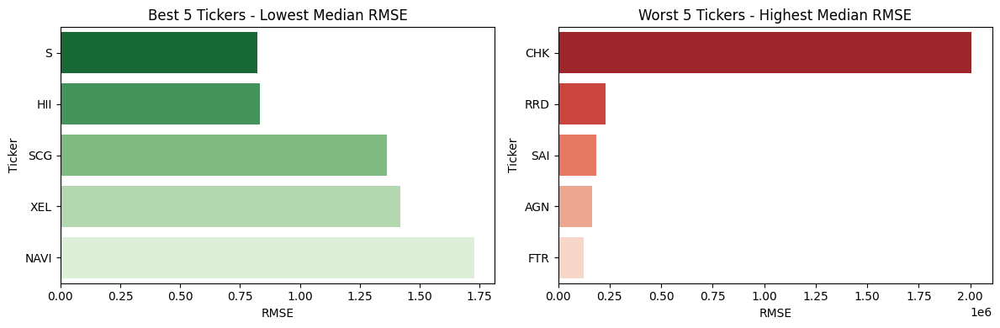

In [ ]:
# Displaying the outliers for the RMSE:
agg_metrics_pe = reg_results_pe_df.groupby('Ticker').agg({'RMSE': 'median','Accuracy': 'median',}).reset_index()

best_rmse = agg_metrics_pe.sort_values('RMSE').head(5)
worst_rmse = agg_metrics_pe.sort_values('RMSE', ascending=False).head(5)
best_acc = agg_metrics_pe.sort_values('Accuracy', ascending=False).head(5)
worst_acc = agg_metrics_pe.sort_values('Accuracy').head(5)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.barplot(data=best_rmse, x='RMSE', y='Ticker', palette='Greens_r')
plt.title("Best 5 Tickers - Lowest Median RMSE")
plt.subplot(1, 2, 2)
sns.barplot(data=worst_rmse, x='RMSE', y='Ticker', palette='Reds_r')
plt.title("Worst 5 Tickers - Highest Median RMSE")
plt.tight_layout()
plt.show()

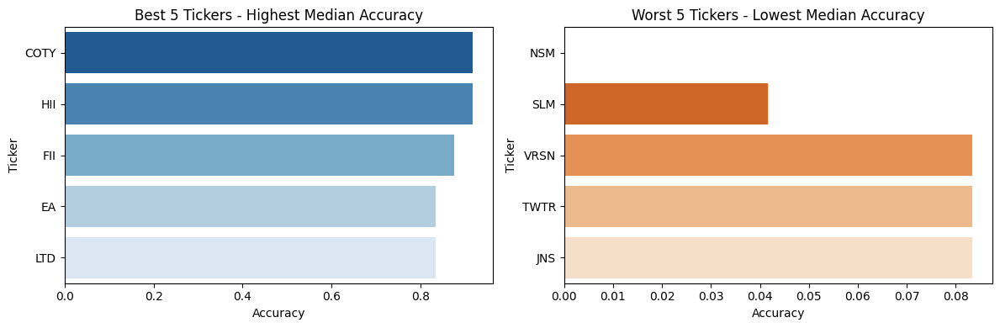

In [ ]:
# And for the accuracy in prediction:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.barplot(data=best_acc, x='Accuracy', y='Ticker', palette='Blues_r')
plt.title("Best 5 Tickers - Highest Median Accuracy")
plt.subplot(1, 2, 2)
sns.barplot(data=worst_acc, x='Accuracy', y='Ticker', palette='Oranges_r')
plt.title("Worst 5 Tickers - Lowest Median Accuracy")
plt.tight_layout()
plt.show()

 ### 6.2 P/B Ratio

#### 6.2.1 Random Forest Regressor

In [ ]:
# We relaunch the ML algorithm for P/B Ratio
# We work again with df_reg that has already been sorted for the tickers that had more than 36 months of data

df_reg['PB_t_plus_1'] = df_reg.groupby('Ticker')['P/B Ratio'].shift(-1) # target now
df_reg['PB_EWMean'] = df_reg.groupby('Ticker')['P/B Ratio'].transform(lambda x: x.ewm(span=12, adjust=False).mean()) # our historical average
df_reg = df_reg.dropna(subset=['PE_lag1', 'PB_lag1', 'Price_lag1', 'PB_t_plus_1', 'PB_EWMean'])

The following cell is also time consuming. There is no need to run it for the reader, as the results have been saved in a Pickle file.

In [ ]:
reg_results = []
reg_predictions = []
training_months = 24
testing_months = 12

param_grid_reg = {
    'n_estimators': [50, 100],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Iterating per ticker
for ticker in tqdm(df_reg['Ticker'].unique(), desc='Random Forest Regressor (P/B)'):
    df_ticker = df_reg[df_reg['Ticker'] == ticker].copy().sort_index()

    if len(df_ticker) < training_months + testing_months:
        continue

    start = 0
    while start + training_months + testing_months <= len(df_ticker):
        train = df_ticker.iloc[start:start + training_months]
        test = df_ticker.iloc[start + training_months:start + training_months + testing_months]

        X_train = train[['PB_lag1', 'PE_lag1', 'Price_lag1']]
        y_train = train['PB_t_plus_1']
        X_test = test[['PB_lag1', 'PE_lag1', 'Price_lag1']]
        y_test = test['PB_t_plus_1']

        scaler = StandardScaler() # standardization of all the features
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        rf_reg = RandomForestRegressor(random_state=42)
        search = RandomizedSearchCV(
            rf_reg,
            param_distributions=param_grid_reg,
            n_iter=3,
            cv=3,
            scoring='neg_root_mean_squared_error',
            random_state=42,
            n_jobs=-1
        )
        search.fit(X_train_scaled, y_train)
        best_model = search.best_estimator_

        y_pred = best_model.predict(X_test_scaled)

        test = test.copy()
        test['Predicted_PB'] = y_pred # prediction of our model
        test['Above_EWMean_PB'] = (y_pred > test['PB_EWMean']).astype(int)

        # We store our predictions
        for i in range(len(test)):
            reg_predictions.append({
                'Ticker': ticker,
                'Date': test.index[i],
                'Predicted_PB': y_pred[i],
                'True_PB': y_test.iloc[i],
                'EWMean_PB': test['PB_EWMean'].iloc[i],
                'Above_EWMean_PB': test['Above_EWMean_PB'].iloc[i]
            })

        # Binary evaluation
        binary_preds = (y_pred > test['PB_EWMean']).astype(int)
        binary_true = (y_test > test['PB_EWMean']).astype(int)

        acc = accuracy_score(binary_true, binary_preds)

        reg_results.append({
            'Ticker': ticker,
            'Train Start': train.index[0],
            'Test Start': test.index[0],
            'RMSE': mean_squared_error(y_test, y_pred),
            'Accuracy': acc,
            'Test Samples': len(test),
            'Best Params': search.best_params_
        })

        start += testing_months

Random Forest Regressor (P/B):  35%|███▍      | 207/598 [20:36<45:40,  7.01s/it]

In [ ]:
#reg_results_pb_df = pd.DataFrame(reg_results)
#reg_predictions_pb_df = pd.DataFrame(reg_predictions)

# Loading it into pickle
results_path_pb = '/content/drive/MyDrive/MASTER_PROJECT/data/reg_results_pb_df.pkl'
predictions_path_pb = '/content/drive/MyDrive/MASTER_PROJECT/data/reg_predictions_pb_df.pkl'

#with open(results_path_pb, 'wb') as f:
#    pickle.dump(reg_results_pb_df, f)

#with open(predictions_path_pb, 'wb') as f:
#    pickle.dump(reg_predictions_pb_df, f)

#print("Saved")

In [ ]:
# Opening it with Pickle
with open(results_path_pb, 'rb') as f:
    reg_results_pb_df = pickle.load(f)

with open(predictions_path_pb, 'rb') as f:
    reg_predictions_pb_df = pickle.load(f)

#### 6.2.2 Results

In [ ]:
print(reg_results_pb_df.head())

  Ticker Train Start Test Start      RMSE  Accuracy  Test Samples  \
0      A  2008-03-31 2010-03-31  0.367839  0.333333            12   
1      A  2009-03-31 2011-03-31  0.747796  0.500000            12   
2      A  2010-03-31 2012-03-31  0.183986  0.416667            12   
3      A  2011-03-31 2013-03-31  0.053846  0.916667            12   
4      A  2012-03-31 2014-03-31  0.269023  0.500000            12   

                                         Best Params  
0  {'n_estimators': 100, 'min_samples_split': 2, ...  
1  {'n_estimators': 100, 'min_samples_split': 2, ...  
2  {'n_estimators': 100, 'min_samples_split': 2, ...  
3  {'n_estimators': 100, 'min_samples_split': 2, ...  
4  {'n_estimators': 100, 'min_samples_split': 2, ...  


In [ ]:
print(f"Median RMSE: {reg_results_pb_df['RMSE'].median():.4f}") # median of RMSE obtained across all the test periods of all tickers (composed of 12 periods)
print(f"Median Accuracy: {reg_results_pb_df['Accuracy'].median():.4f}") # median of Accuracy obtained across all the test periods of all tickers

Median RMSE: 0.1716
Median Accuracy: 0.4167


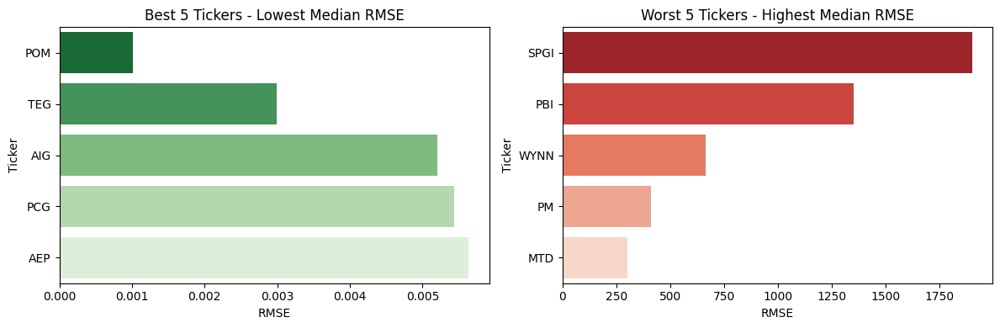

In [ ]:
agg_metrics_pb = reg_results_pb_df.groupby('Ticker').agg({'RMSE': 'median','Accuracy': 'median',}).reset_index()

best_rmse = agg_metrics_pb.sort_values('RMSE').head(5)
worst_rmse = agg_metrics_pb.sort_values('RMSE', ascending=False).head(5)
best_acc = agg_metrics_pb.sort_values('Accuracy', ascending=False).head(5)
worst_acc = agg_metrics_pb.sort_values('Accuracy').head(5)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.barplot(data=best_rmse, x='RMSE', y='Ticker', palette='Greens_r')
plt.title("Best 5 Tickers - Lowest Median RMSE")
plt.subplot(1, 2, 2)
sns.barplot(data=worst_rmse, x='RMSE', y='Ticker', palette='Reds_r')
plt.title("Worst 5 Tickers - Highest Median RMSE")
plt.tight_layout()
plt.show()

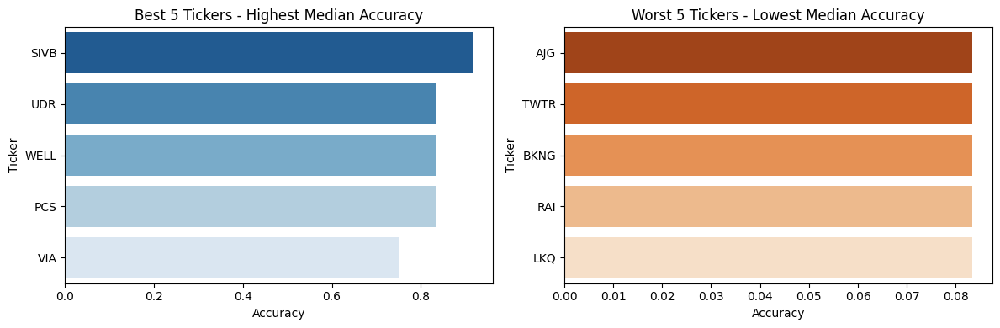

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.barplot(data=best_acc, x='Accuracy', y='Ticker', palette='Blues_r')
plt.title("Best 5 Tickers - Highest Median Accuracy")
plt.subplot(1, 2, 2)
sns.barplot(data=worst_acc, x='Accuracy', y='Ticker', palette='Oranges_r')
plt.title("Worst 5 Tickers - Lowest Median Accuracy")
plt.tight_layout()
plt.show()

## 7. Strategy Backtesting

 ### 7.1 P/E Ratio

#### 7.1.1 Long only

In [ ]:
reg_predictions_pe_df.head()

,Ticker,Date,Predicted_PE,True_PE,EWMean,Above_EWMean
0,A,2010-03-31,-349.555556,-604.333333,-183.428954,0
1,A,2010-04-30,-272.990250,-539.333333,-248.183474,0
2,A,2010-05-31,-272.649303,52.648148,-292.975760,1
3,A,2010-06-30,-349.555556,51.722222,-239.802851,0
4,A,2010-07-31,-56.492083,49.944444,-194.952840,1


**What we have as of now:**

A set of predicted P/E for each month within each test set for each ticker.

We compare this set of predictions to the historical average (EWMean) in order to create binary signals: 0 if the predicted P/E is below the mean (undervalued stock) or 1 if it is above (overvalued stock).

Everything we have in reg_predictions_pe_df is aligned at date T.

In order to avoid any look-ahead bias and not use information from the future, we will have to shift the signals in order to apply them at date T+1 (next month).

In [ ]:
# Adjusting the signals of reg_predictions_pe_df
df_signals_pe = reg_predictions_pe_df.copy()

# We first create a column for Raw Signals (whether 1 or -1) depending on 'Above_EWMean' data
df_signals_pe['Raw_Signal'] = np.where(
    df_signals_pe['Above_EWMean'] == 0, 1,  # buy signal when Predicted_PE < EWMean
    -1                                       # Sell signal when Predicted_PE > EWMean
)

# And we bring the Adjusted Close prices to our new df_signals_pe to compute the PnL thereafter
df_signals_pe['date'] = df_signals_pe['Date']
df_signals_pe = df_signals_pe.merge(
    monthly_ratios.reset_index()[['date', 'Ticker', 'Adjusted Close']],
    on=['date', 'Ticker'],
    how='left'
).dropna(subset=['Adjusted Close'])

In [ ]:
# We generate the long-only Classic Signals (0 if neutral, 1 to buy first and -1 to trigger a sell order only once we are holding a stock -> no short position)
df_signals_pe = df_signals_pe.sort_values(['Ticker', 'date']).copy()
df_signals_pe['Classic_Signal'] = 0
for ticker in tqdm(df_signals_pe['Ticker'].unique(), desc="Classic Signals"):
    ticker_df = df_signals_pe[df_signals_pe['Ticker'] == ticker].copy()
    in_position = False
    classic_signals = []
    for signal in ticker_df['Raw_Signal']:
        if signal == 1 and not in_position:
            classic_signals.append(1)
            in_position = True
        elif signal == -1 and in_position:
            classic_signals.append(-1)
            in_position = False
        else:
            classic_signals.append(0)
    df_signals_pe.loc[df_signals_pe['Ticker'] == ticker, 'Classic_Signal'] = classic_signals

# And we map them with a new column
df_signals_pe['Signal_Text_PE'] = df_signals_pe['Classic_Signal'].map({
    1: 'Buy',
    -1: 'Sell',
    0: 'Hold'
})

Classic Signals: 100%|██████████| 598/598 [00:06<00:00, 95.07it/s] 


In [ ]:
# We shift the signals to avoid any look-ahead bias & delete the N/A from the shift
df_signals_pe[['Raw_Signal', 'Classic_Signal', 'Signal_Text_PE']] = (
    df_signals_pe.groupby('Ticker')[['Raw_Signal', 'Classic_Signal', 'Signal_Text_PE']].shift(1))
df_signals_pe = df_signals_pe.dropna(subset=['Raw_Signal', 'Classic_Signal', 'Signal_Text_PE'])
df_signals_pe['Signal_Text_PE'] = df_signals_pe['Signal_Text_PE'].astype(str)

We will reuse our trading_long_only function for our dataset df_signals_pe that now contains the signals shifted.

In [ ]:
# Running the trading_long_only function on our new dataset:
df_signals_pe['Date'] = pd.to_datetime(df_signals_pe['date'])
df_signals_pe = df_signals_pe.sort_values(['Ticker', 'Date'])
df_signals_pe['Return'] = df_signals_pe.groupby('Ticker')['Adjusted Close'].pct_change() # recomputing the return for sharpe ratio computation
df_signals_pe = df_signals_pe.dropna(subset=['Return'])
df_signals_pe = df_signals_pe.set_index('Date')

pnl_pe_ml_df = trading_long_only(df_signals_pe, signal_column='Signal_Text_PE')

Processing Tickers:   1%|          | 7/598 [00:00<00:09, 61.28Ticker/s]

BUY  | A | 2010-07-31 | Price: 20.22
SELL | A | 2010-08-31 | Price: 19.52 | PnL: -0.69 | Cumul PnL: -0.69 | Return: -3.44% | Annualized: -34.28% | Days: 31 | Sharpe: -11.79
BUY  | A | 2011-04-30 | Price: 36.13
SELL | A | 2012-04-30 | Price: 30.53 | PnL: -5.60 | Cumul PnL: -6.29 | Return: -15.49% | Annualized: -15.49% | Days: 366 | Sharpe: -0.39
BUY  | A | 2013-10-31 | Price: 36.75
SELL | A | 2013-11-30 | Price: 38.78 | PnL: 2.03 | Cumul PnL: -4.26 | Return: 5.54% | Annualized: 90.90% | Days: 30 | Sharpe: 8.08
BUY  | A | 2013-12-31 | Price: 41.40
SELL | A | 2014-04-30 | Price: 39.12 | PnL: -2.28 | Cumul PnL: -6.54 | Return: -5.51% | Annualized: -15.63% | Days: 120 | Sharpe: -1.23
BUY  | A | 2014-08-31 | Price: 41.38
SELL | A | 2016-05-31 | Price: 45.89 | PnL: 4.51 | Cumul PnL: -2.03 | Return: 10.90% | Annualized: 6.09% | Days: 639 | Sharpe: 0.26
BUY  | A | 2016-06-30 | Price: 44.36
SELL | A | 2016-09-30 | Price: 47.09 | PnL: 2.73 | Cumul PnL: 0.70 | Return: 6.15% | Annualized: 26.98% | 

Processing Tickers:   3%|▎         | 20/598 [00:00<00:11, 51.70Ticker/s]

BUY  | ADP | 2010-05-31 | Price: 35.71
SELL | ADP | 2010-07-31 | Price: 36.05 | PnL: 0.34 | Cumul PnL: 0.34 | Return: 0.95% | Annualized: 5.86% | Days: 61 | Sharpe: 0.50
BUY  | ADP | 2010-11-30 | Price: 38.94
SELL | ADP | 2010-12-31 | Price: 40.43 | PnL: 1.49 | Cumul PnL: 1.83 | Return: 3.84% | Annualized: 57.11% | Days: 31 | Sharpe: 9.02
BUY  | ADP | 2011-01-31 | Price: 41.85
SELL | ADP | 2011-02-28 | Price: 43.68 | PnL: 1.83 | Cumul PnL: 3.67 | Return: 4.38% | Annualized: 67.35% | Days: 28 | Sharpe: 44.00
BUY  | ADP | 2011-11-30 | Price: 44.63
SELL | ADP | 2011-12-31 | Price: 47.18 | PnL: 2.55 | Cumul PnL: 6.22 | Return: 5.72% | Annualized: 94.83% | Days: 31 | Sharpe: 6.77
BUY  | ADP | 2012-07-31 | Price: 49.40
SELL | ADP | 2012-08-31 | Price: 50.74 | PnL: 1.34 | Cumul PnL: 7.56 | Return: 2.71% | Annualized: 37.76% | Days: 31 | Sharpe: 19.70
BUY  | ADP | 2013-09-30 | Price: 63.23
SELL | ADP | 2014-04-30 | Price: 68.11 | PnL: 4.87 | Cumul PnL: 12.43 | Return: 7.71% | Annualized: 13.58

Processing Tickers:   4%|▍         | 26/598 [00:00<00:10, 52.16Ticker/s]

SELL | AIG | 2014-04-30 | Price: 53.13 | PnL: 8.67 | Cumul PnL: 30.72 | Return: 19.50% | Annualized: 21.45% | Days: 334 | Sharpe: 1.62
BUY  | AIG | 2014-07-31 | Price: 51.98
SELL | AIG | 2014-10-31 | Price: 53.57 | PnL: 1.59 | Cumul PnL: 32.31 | Return: 3.06% | Annualized: 12.81% | Days: 92 | Sharpe: 0.75
BUY  | AIG | 2015-01-31 | Price: 48.87
SELL | AIG | 2015-02-28 | Price: 55.33 | PnL: 6.46 | Cumul PnL: 38.77 | Return: 13.22% | Annualized: 343.63% | Days: 28 | Sharpe: 7.64
BUY  | AIG | 2015-07-31 | Price: 64.12
SELL | AIG | 2016-04-30 | Price: 55.82 | PnL: -8.30 | Cumul PnL: 30.47 | Return: -12.94% | Annualized: -16.88% | Days: 274 | Sharpe: -0.71
BUY  | AIG | 2016-05-31 | Price: 57.88
SELL | AIG | 2016-06-30 | Price: 52.89 | PnL: -4.99 | Cumul PnL: 25.48 | Return: -8.62% | Annualized: -66.10% | Days: 30 | Sharpe: -3.10
BUY  | AIG | 2017-06-30 | Price: 62.52
SELL | AIG | 2017-07-31 | Price: 65.45 | PnL: 2.93 | Cumul PnL: 28.41 | Return: 4.69% | Annualized: 73.26% | Days: 31 | Sharpe

Processing Tickers:   6%|▌         | 37/598 [00:00<00:15, 35.72Ticker/s]

BUY  | ALK | 2018-12-31 | Price: 60.85
SELL | ALK | 2019-08-31 | Price: 59.72 | PnL: -1.13 | Cumul PnL: -1.13 | Return: -1.86% | Annualized: -2.77% | Days: 243 | Sharpe: -0.09
BUY  | ALK | 2019-12-31 | Price: 67.75
SELL | ALK | 2020-02-29 | Price: 50.46 | PnL: -17.29 | Cumul PnL: -18.42 | Return: -25.52% | Annualized: -82.93% | Days: 60 | Sharpe: -2.70
BUY  | ALK | 2020-08-31 | Price: 38.95
SELL | ALK | 2021-05-31 | Price: 69.20 | PnL: 30.25 | Cumul PnL: 11.83 | Return: 77.66% | Annualized: 115.18% | Days: 273 | Sharpe: 2.39
BUY  | ALL | 2011-09-30 | Price: 23.69
SELL | ALL | 2012-12-31 | Price: 40.17 | PnL: 16.48 | Cumul PnL: 16.48 | Return: 69.57% | Annualized: 52.57% | Days: 458 | Sharpe: 3.16
BUY  | ALL | 2013-04-30 | Price: 49.26
SELL | ALL | 2014-04-30 | Price: 56.95 | PnL: 7.69 | Cumul PnL: 24.17 | Return: 15.61% | Annualized: 15.61% | Days: 365 | Sharpe: 1.13
BUY  | ALL | 2014-07-31 | Price: 58.45
SELL | ALL | 2014-12-31 | Price: 70.25 | PnL: 11.80 | Cumul PnL: 35.97 | Return: 

Processing Tickers:   8%|▊         | 49/598 [00:01<00:12, 44.96Ticker/s]

BUY  | AMZN | 2010-05-31 | Price: 6.27
SELL | AMZN | 2010-07-31 | Price: 5.89 | PnL: -0.38 | Cumul PnL: -0.38 | Return: -6.03% | Annualized: -31.16% | Days: 61 | Sharpe: -1.00
BUY  | AMZN | 2010-11-30 | Price: 8.77
SELL | AMZN | 2011-01-31 | Price: 8.48 | PnL: -0.29 | Cumul PnL: -0.67 | Return: -3.28% | Annualized: -18.15% | Days: 62 | Sharpe: -1.05
BUY  | AMZN | 2011-03-31 | Price: 9.01
SELL | AMZN | 2011-05-31 | Price: 9.83 | PnL: 0.83 | Cumul PnL: 0.16 | Return: 9.19% | Annualized: 69.50% | Days: 61 | Sharpe: 5.93
BUY  | AMZN | 2012-05-31 | Price: 10.65
SELL | AMZN | 2013-03-31 | Price: 13.32 | PnL: 2.68 | Cumul PnL: 2.84 | Return: 25.17% | Annualized: 30.91% | Days: 304 | Sharpe: 1.65
BUY  | AMZN | 2013-09-30 | Price: 15.63
SELL | AMZN | 2013-10-31 | Price: 18.20 | PnL: 2.57 | Cumul PnL: 5.41 | Return: 16.44% | Annualized: 521.03% | Days: 31 | Sharpe: 58.19
BUY  | AMZN | 2013-11-30 | Price: 19.68
SELL | AMZN | 2014-10-31 | Price: 15.27 | PnL: -4.41 | Cumul PnL: 1.00 | Return: -22.4

Processing Tickers:  10%|█         | 62/598 [00:01<00:10, 52.16Ticker/s]

BUY  | ARG | 2012-02-29 | Price: 82.33
SELL | ARG | 2012-03-31 | Price: 88.97 | PnL: 6.64 | Cumul PnL: 6.64 | Return: 8.07% | Annualized: 153.64% | Days: 31 | Sharpe: 23.61
BUY  | ARG | 2012-04-30 | Price: 91.64
SELL | ARG | 2012-05-31 | Price: 86.81 | PnL: -4.83 | Cumul PnL: 1.81 | Return: -5.27% | Annualized: -47.78% | Days: 31 | Sharpe: -3.34
BUY  | ARG | 2012-12-31 | Price: 91.29
SELL | ARG | 2013-03-31 | Price: 99.16 | PnL: 7.87 | Cumul PnL: 9.68 | Return: 8.62% | Annualized: 39.20% | Days: 90 | Sharpe: 4.63
BUY  | ARG | 2013-04-30 | Price: 96.65
SELL | ARG | 2013-12-31 | Price: 111.85 | PnL: 15.20 | Cumul PnL: 24.88 | Return: 15.73% | Annualized: 24.49% | Days: 245 | Sharpe: 1.56
BUY  | ARG | 2015-05-31 | Price: 101.94
SELL | ARG | 2015-06-30 | Price: 105.78 | PnL: 3.84 | Cumul PnL: 28.72 | Return: 3.77% | Annualized: 55.85% | Days: 30 | Sharpe: 10.35
BUY  | ARNC | 2019-06-30 | Price: 25.82
BUY  | ATI | 2010-07-31 | Price: 47.61
SELL | ATI | 2010-08-31 | Price: 40.72 | PnL: -6.89

Processing Tickers:  12%|█▏        | 74/598 [00:01<00:10, 48.97Ticker/s]

SELL | BAX | 2016-07-31 | Price: 48.02 | PnL: 10.21 | Cumul PnL: 9.51 | Return: 27.02% | Annualized: 9.38% | Days: 974 | Sharpe: 0.55
BUY  | BAX | 2017-04-30 | Price: 55.68
SELL | BAX | 2017-07-31 | Price: 60.48 | PnL: 4.80 | Cumul PnL: 14.31 | Return: 8.62% | Annualized: 39.20% | Days: 92 | Sharpe: 3.66
BUY  | BAX | 2017-10-31 | Price: 64.47
SELL | BAX | 2017-12-31 | Price: 64.64 | PnL: 0.17 | Cumul PnL: 14.48 | Return: 0.26% | Annualized: 1.59% | Days: 61 | Sharpe: 0.27
BUY  | BAX | 2018-02-28 | Price: 67.79
SELL | BAX | 2018-03-31 | Price: 65.04 | PnL: -2.75 | Cumul PnL: 11.73 | Return: -4.06% | Annualized: -39.16% | Days: 31 | Sharpe: -12.36
BUY  | BAX | 2018-12-31 | Price: 65.82
SELL | BAX | 2019-01-31 | Price: 72.49 | PnL: 6.67 | Cumul PnL: 18.40 | Return: 10.13% | Annualized: 218.45% | Days: 31 | Sharpe: 8.93
BUY  | BAX | 2019-04-30 | Price: 76.30
SELL | BAX | 2019-06-30 | Price: 81.90 | PnL: 5.60 | Cumul PnL: 24.00 | Return: 7.34% | Annualized: 52.95% | Days: 61 | Sharpe: 1.95


Processing Tickers:  14%|█▍        | 86/598 [00:01<00:09, 51.69Ticker/s]

BUY  | BK | 2010-07-31 | Price: 25.07
SELL | BK | 2010-08-31 | Price: 24.26 | PnL: -0.81 | Cumul PnL: -0.81 | Return: -3.23% | Annualized: -32.57% | Days: 31 | Sharpe: -3.94
BUY  | BK | 2011-09-30 | Price: 18.59
SELL | BK | 2012-04-30 | Price: 23.65 | PnL: 5.06 | Cumul PnL: 4.25 | Return: 27.22% | Annualized: 51.09% | Days: 213 | Sharpe: 1.79
BUY  | BK | 2012-05-31 | Price: 20.36
SELL | BK | 2012-07-31 | Price: 21.28 | PnL: 0.92 | Cumul PnL: 5.17 | Return: 4.52% | Annualized: 30.37% | Days: 61 | Sharpe: 0.99
BUY  | BK | 2012-09-30 | Price: 22.62
SELL | BK | 2013-04-30 | Price: 28.22 | PnL: 5.60 | Cumul PnL: 10.77 | Return: 24.76% | Annualized: 46.11% | Days: 212 | Sharpe: 3.39
BUY  | BK | 2013-06-30 | Price: 28.05
SELL | BK | 2014-04-30 | Price: 33.87 | PnL: 5.82 | Cumul PnL: 16.59 | Return: 20.75% | Annualized: 25.39% | Days: 304 | Sharpe: 1.11
BUY  | BK | 2015-05-31 | Price: 43.36
SELL | BK | 2016-03-31 | Price: 36.83 | PnL: -6.53 | Cumul PnL: 10.06 | Return: -15.06% | Annualized: -1

Processing Tickers:  15%|█▌        | 92/598 [00:01<00:10, 48.57Ticker/s]

SELL | BWA | 2020-10-31 | Price: 29.89 | PnL: -3.21 | Cumul PnL: 1.42 | Return: -9.71% | Annualized: -70.63% | Days: 31 | Sharpe: -7.92
BUY  | BWA | 2020-12-31 | Price: 33.02
BUY  | BXP | 2011-07-31 | Price: 107.36
SELL | BXP | 2012-05-31 | Price: 102.93 | PnL: -4.43 | Cumul PnL: -4.43 | Return: -4.13% | Annualized: -4.93% | Days: 305 | Sharpe: -0.22
BUY  | BXP | 2013-04-30 | Price: 109.43
SELL | BXP | 2013-10-31 | Price: 103.50 | PnL: -5.93 | Cumul PnL: -10.36 | Return: -5.42% | Annualized: -10.54% | Days: 184 | Sharpe: -0.73
BUY  | BXP | 2014-12-31 | Price: 128.69
SELL | BXP | 2015-01-31 | Price: 138.80 | PnL: 10.11 | Cumul PnL: -0.25 | Return: 7.86% | Annualized: 147.82% | Days: 31 | Sharpe: 9.94
BUY  | BXP | 2015-04-30 | Price: 132.31
SELL | BXP | 2015-06-30 | Price: 121.04 | PnL: -11.27 | Cumul PnL: -11.52 | Return: -8.52% | Annualized: -41.38% | Days: 61 | Sharpe: -5.35
BUY  | BXP | 2015-07-31 | Price: 123.28
SELL | BXP | 2015-09-30 | Price: 118.40 | PnL: -4.88 | Cumul PnL: -16.4

Processing Tickers:  18%|█▊        | 105/598 [00:02<00:09, 53.91Ticker/s]

BUY  | CBOE | 2020-06-30 | Price: 93.28
SELL | CBOE | 2020-12-31 | Price: 93.12 | PnL: -0.16 | Cumul PnL: -0.16 | Return: -0.17% | Annualized: -0.34% | Days: 184 | Sharpe: -0.01
BUY  | CBOE | 2021-01-31 | Price: 91.73
BUY  | CBRE | 2021-01-31 | Price: 60.98
BUY  | CBS | 2011-04-30 | Price: 25.22
SELL | CBS | 2011-08-31 | Price: 25.05 | PnL: -0.17 | Cumul PnL: -0.17 | Return: -0.67% | Annualized: -2.01% | Days: 123 | Sharpe: -0.09
BUY  | CBS | 2012-04-30 | Price: 33.38
SELL | CBS | 2012-11-30 | Price: 35.98 | PnL: 2.60 | Cumul PnL: 2.43 | Return: 7.79% | Annualized: 13.72% | Days: 214 | Sharpe: 0.61
BUY  | CBS | 2013-02-28 | Price: 43.39
SELL | CBS | 2013-04-30 | Price: 45.78 | PnL: 2.39 | Cumul PnL: 4.82 | Return: 5.51% | Annualized: 37.95% | Days: 61 | Sharpe: 2.78
BUY  | CBS | 2013-08-31 | Price: 51.10
SELL | CBS | 2014-04-30 | Price: 57.76 | PnL: 6.66 | Cumul PnL: 11.48 | Return: 13.03% | Annualized: 20.17% | Days: 242 | Sharpe: 0.74
BUY  | CBS | 2015-03-31 | Price: 60.63
SELL | CBS

Processing Tickers:  20%|█▉        | 117/598 [00:02<00:08, 55.69Ticker/s]

BUY  | CHRW | 2014-07-31 | Price: 67.46
SELL | CHRW | 2014-09-30 | Price: 66.32 | PnL: -1.14 | Cumul PnL: 0.57 | Return: -1.69% | Annualized: -9.72% | Days: 61 | Sharpe: -0.80
BUY  | CHRW | 2014-11-30 | Price: 73.74
SELL | CHRW | 2015-04-30 | Price: 64.39 | PnL: -9.35 | Cumul PnL: -8.78 | Return: -12.68% | Annualized: -27.78% | Days: 151 | Sharpe: -1.30
BUY  | CHRW | 2016-04-30 | Price: 70.97
SELL | CHRW | 2016-05-31 | Price: 74.98 | PnL: 4.01 | Cumul PnL: -4.77 | Return: 5.65% | Annualized: 93.40% | Days: 31 | Sharpe: 5.37
BUY  | CHRW | 2016-06-30 | Price: 74.25
SELL | CHRW | 2016-09-30 | Price: 70.46 | PnL: -3.79 | Cumul PnL: -8.56 | Return: -5.10% | Annualized: -18.91% | Days: 92 | Sharpe: -1.90
BUY  | CHRW | 2017-02-28 | Price: 80.37
SELL | CHRW | 2017-06-30 | Price: 68.68 | PnL: -11.69 | Cumul PnL: -20.25 | Return: -14.55% | Annualized: -37.60% | Days: 122 | Sharpe: -2.11
BUY  | CHRW | 2017-07-31 | Price: 65.60
SELL | CHRW | 2017-10-31 | Price: 78.53 | PnL: 12.93 | Cumul PnL: -7.3

Processing Tickers:  22%|██▏       | 129/598 [00:02<00:08, 52.80Ticker/s]

BUY  | CMI | 2016-04-30 | Price: 117.03
SELL | CMI | 2017-03-31 | Price: 151.20 | PnL: 34.17 | Cumul PnL: 38.89 | Return: 29.20% | Annualized: 32.24% | Days: 335 | Sharpe: 2.06
BUY  | CMI | 2018-03-31 | Price: 162.09
SELL | CMI | 2019-05-31 | Price: 150.76 | PnL: -11.33 | Cumul PnL: 27.56 | Return: -6.99% | Annualized: -6.02% | Days: 426 | Sharpe: -0.24
BUY  | CMI | 2020-04-30 | Price: 163.50
SELL | CMI | 2020-05-31 | Price: 169.60 | PnL: 6.10 | Cumul PnL: 33.66 | Return: 3.73% | Annualized: 55.20% | Days: 31 | Sharpe: 1.86
BUY  | CMI | 2020-06-30 | Price: 173.26
SELL | CMI | 2020-08-31 | Price: 207.25 | PnL: 33.99 | Cumul PnL: 67.65 | Return: 19.62% | Annualized: 192.94% | Days: 62 | Sharpe: 14.52
BUY  | CMS | 2011-02-28 | Price: 19.26
SELL | CMS | 2011-07-31 | Price: 19.14 | PnL: -0.12 | Cumul PnL: -0.12 | Return: -0.62% | Annualized: -1.49% | Days: 153 | Sharpe: -0.27
BUY  | CMS | 2012-06-30 | Price: 23.50
SELL | CMS | 2013-04-30 | Price: 29.94 | PnL: 6.44 | Cumul PnL: 6.32 | Return

Processing Tickers:  24%|██▎       | 141/598 [00:02<00:08, 52.89Ticker/s]

SELL | COST | 2015-04-30 | Price: 143.05 | PnL: 25.51 | Cumul PnL: 63.33 | Return: 21.70% | Annualized: 29.94% | Days: 273 | Sharpe: 2.62
BUY  | COST | 2016-07-31 | Price: 167.22
SELL | COST | 2016-11-30 | Price: 150.11 | PnL: -17.11 | Cumul PnL: 46.22 | Return: -10.23% | Annualized: -27.66% | Days: 122 | Sharpe: -1.84
BUY  | COST | 2017-01-31 | Price: 163.95
SELL | COST | 2017-08-31 | Price: 156.74 | PnL: -7.21 | Cumul PnL: 39.01 | Return: -4.40% | Annualized: -7.42% | Days: 212 | Sharpe: -0.37
BUY  | COST | 2017-09-30 | Price: 164.29
SELL | COST | 2018-04-30 | Price: 197.16 | PnL: 32.87 | Cumul PnL: 71.88 | Return: 20.01% | Annualized: 36.71% | Days: 212 | Sharpe: 2.05
BUY  | COST | 2018-07-31 | Price: 218.71
SELL | COST | 2018-08-31 | Price: 233.13 | PnL: 14.42 | Cumul PnL: 86.30 | Return: 6.59% | Annualized: 115.16% | Days: 31 | Sharpe: 34.32
BUY  | COST | 2018-09-30 | Price: 234.88
SELL | COST | 2019-04-30 | Price: 245.53 | PnL: 10.65 | Cumul PnL: 96.95 | Return: 4.53% | Annualize

Processing Tickers:  25%|██▌       | 152/598 [00:03<00:09, 47.53Ticker/s]

SELL | CTSH | 2016-01-31 | Price: 63.31 | PnL: -1.27 | Cumul PnL: 36.91 | Return: -1.97% | Annualized: -11.23% | Days: 62 | Sharpe: -0.59
BUY  | CTSH | 2016-02-29 | Price: 56.98
SELL | CTSH | 2016-03-31 | Price: 62.70 | PnL: 5.72 | Cumul PnL: 42.63 | Return: 10.04% | Annualized: 215.17% | Days: 31 | Sharpe: 6.20
BUY  | CTSH | 2016-04-30 | Price: 58.37
SELL | CTSH | 2016-11-30 | Price: 55.08 | PnL: -3.29 | Cumul PnL: 39.34 | Return: -5.64% | Annualized: -9.47% | Days: 214 | Sharpe: -0.34
BUY  | CTSH | 2017-04-30 | Price: 60.23
SELL | CTSH | 2017-07-31 | Price: 69.32 | PnL: 9.09 | Cumul PnL: 48.43 | Return: 15.09% | Annualized: 75.46% | Days: 92 | Sharpe: 4.84
BUY  | CTSH | 2017-08-31 | Price: 70.77
SELL | CTSH | 2017-09-30 | Price: 72.54 | PnL: 1.77 | Cumul PnL: 50.20 | Return: 2.50% | Annualized: 34.51% | Days: 30 | Sharpe: 48.67
BUY  | CTSH | 2017-10-31 | Price: 75.67
SELL | CTSH | 2017-12-31 | Price: 71.02 | PnL: -4.65 | Cumul PnL: 45.55 | Return: -6.15% | Annualized: -31.65% | Days:

Processing Tickers:  27%|██▋       | 163/598 [00:03<00:09, 47.89Ticker/s]

BUY  | DFS | 2010-08-31 | Price: 14.51
SELL | DFS | 2010-09-30 | Price: 16.68 | PnL: 2.17 | Cumul PnL: 2.17 | Return: 14.96% | Annualized: 432.53% | Days: 30 | Sharpe: 12.53
BUY  | DFS | 2010-10-31 | Price: 17.65
SELL | DFS | 2011-04-30 | Price: 24.84 | PnL: 7.19 | Cumul PnL: 9.36 | Return: 40.74% | Annualized: 98.07% | Days: 181 | Sharpe: 8.04
BUY  | DFS | 2012-05-31 | Price: 33.11
SELL | DFS | 2012-06-30 | Price: 34.58 | PnL: 1.47 | Cumul PnL: 10.83 | Return: 4.44% | Annualized: 68.42% | Days: 30 | Sharpe: 5.83
BUY  | DFS | 2012-09-30 | Price: 39.73
SELL | DFS | 2014-06-30 | Price: 61.98 | PnL: 22.25 | Cumul PnL: 33.08 | Return: 56.00% | Annualized: 28.93% | Days: 638 | Sharpe: 1.65
BUY  | DFS | 2014-11-30 | Price: 65.55
SELL | DFS | 2015-02-28 | Price: 60.98 | PnL: -4.57 | Cumul PnL: 28.51 | Return: -6.97% | Annualized: -25.10% | Days: 90 | Sharpe: -0.69
BUY  | DFS | 2015-03-31 | Price: 56.35
SELL | DFS | 2015-06-30 | Price: 57.62 | PnL: 1.27 | Cumul PnL: 29.78 | Return: 2.25% | Ann

Processing Tickers:  29%|██▉       | 175/598 [00:03<00:08, 51.79Ticker/s]

BUY  | DO | 2011-10-31 | Price: 65.54
SELL | DO | 2011-12-31 | Price: 55.26 | PnL: -10.28 | Cumul PnL: -10.28 | Return: -15.69% | Annualized: -64.07% | Days: 61 | Sharpe: -1.41
BUY  | DO | 2012-01-31 | Price: 62.30
SELL | DO | 2012-04-30 | Price: 68.55 | PnL: 6.25 | Cumul PnL: -4.03 | Return: 10.03% | Annualized: 46.58% | Days: 90 | Sharpe: 2.24
BUY  | DO | 2012-05-31 | Price: 58.18
SELL | DO | 2013-05-31 | Price: 68.81 | PnL: 10.63 | Cumul PnL: 6.60 | Return: 18.27% | Annualized: 18.27% | Days: 365 | Sharpe: 0.81
BUY  | DO | 2013-09-30 | Price: 62.32
SELL | DO | 2014-09-30 | Price: 34.27 | PnL: -28.05 | Cumul PnL: -21.45 | Return: -45.01% | Annualized: -45.01% | Days: 365 | Sharpe: -1.68
BUY  | DO | 2015-05-31 | Price: 30.34
SELL | DO | 2015-06-30 | Price: 25.81 | PnL: -4.53 | Cumul PnL: -25.98 | Return: -14.93% | Annualized: -85.64% | Days: 30 | Sharpe: -8.86
BUY  | DOV | 2010-06-30 | Price: 27.71
SELL | DOV | 2010-07-31 | Price: 31.81 | PnL: 4.10 | Cumul PnL: 4.10 | Return: 14.79% |

Processing Tickers:  31%|███▏      | 187/598 [00:03<00:08, 47.66Ticker/s]

BUY  | EBAY | 2010-07-31 | Price: 8.65
SELL | EBAY | 2010-11-30 | Price: 12.06 | PnL: 3.41 | Cumul PnL: 3.41 | Return: 39.36% | Annualized: 170.65% | Days: 122 | Sharpe: 6.03
BUY  | EBAY | 2011-06-30 | Price: 13.35
SELL | EBAY | 2012-04-30 | Price: 16.97 | PnL: 3.62 | Cumul PnL: 7.03 | Return: 27.11% | Annualized: 33.36% | Days: 305 | Sharpe: 1.54
BUY  | EBAY | 2013-08-31 | Price: 20.69
SELL | EBAY | 2013-11-30 | Price: 20.91 | PnL: 0.22 | Cumul PnL: 7.25 | Return: 1.06% | Annualized: 4.31% | Days: 91 | Sharpe: 0.18
BUY  | EBAY | 2013-12-31 | Price: 22.70
SELL | EBAY | 2014-04-30 | Price: 21.45 | PnL: -1.26 | Cumul PnL: 5.99 | Return: -5.53% | Annualized: -15.69% | Days: 120 | Sharpe: -0.62
BUY  | EBAY | 2015-04-30 | Price: 24.11
SELL | EBAY | 2015-05-31 | Price: 25.39 | PnL: 1.28 | Cumul PnL: 7.27 | Return: 5.32% | Annualized: 86.29% | Days: 31 | Sharpe: 11.54
BUY  | EBAY | 2015-07-31 | Price: 28.12
SELL | EBAY | 2015-09-30 | Price: 24.44 | PnL: -3.68 | Cumul PnL: 3.59 | Return: -13.0

Processing Tickers:  33%|███▎      | 198/598 [00:04<00:08, 49.52Ticker/s]

BUY  | EMR | 2012-04-30 | Price: 52.54
SELL | EMR | 2012-08-31 | Price: 50.72 | PnL: -1.82 | Cumul PnL: 14.53 | Return: -3.46% | Annualized: -10.04% | Days: 123 | Sharpe: -0.50
BUY  | EMR | 2012-09-30 | Price: 48.27
SELL | EMR | 2013-03-31 | Price: 55.87 | PnL: 7.60 | Cumul PnL: 22.13 | Return: 15.74% | Annualized: 33.97% | Days: 182 | Sharpe: 2.37
BUY  | EMR | 2013-04-30 | Price: 55.51
SELL | EMR | 2014-04-30 | Price: 68.18 | PnL: 12.67 | Cumul PnL: 34.80 | Return: 22.82% | Annualized: 22.82% | Days: 365 | Sharpe: 1.38
BUY  | EMR | 2014-06-30 | Price: 66.36
SELL | EMR | 2014-07-31 | Price: 63.65 | PnL: -2.71 | Cumul PnL: 32.09 | Return: -4.08% | Annualized: -39.37% | Days: 31 | Sharpe: -6.44
BUY  | EMR | 2014-11-30 | Price: 63.75
SELL | EMR | 2014-12-31 | Price: 61.73 | PnL: -2.02 | Cumul PnL: 30.07 | Return: -3.17% | Annualized: -32.05% | Days: 31 | Sharpe: -6.89
BUY  | EMR | 2016-05-31 | Price: 52.02
SELL | EMR | 2016-07-31 | Price: 55.90 | PnL: 3.88 | Cumul PnL: 33.95 | Return: 7.4

Processing Tickers:  35%|███▌      | 210/598 [00:04<00:07, 50.08Ticker/s]

SELL | ETR | 2019-04-30 | Price: 48.45 | PnL: 7.66 | Cumul PnL: 7.65 | Return: 18.76% | Annualized: 18.76% | Days: 365 | Sharpe: 2.41
BUY  | ETR | 2020-04-30 | Price: 47.76
SELL | ETR | 2020-05-31 | Price: 50.91 | PnL: 3.15 | Cumul PnL: 10.80 | Return: 6.61% | Annualized: 115.48% | Days: 31 | Sharpe: 13.42
BUY  | ETR | 2020-07-31 | Price: 52.56
SELL | ETR | 2020-08-31 | Price: 49.57 | PnL: -2.99 | Cumul PnL: 7.81 | Return: -5.70% | Annualized: -50.54% | Days: 31 | Sharpe: -1.64
BUY  | ETR | 2020-09-30 | Price: 49.27
SELL | ETR | 2020-10-31 | Price: 50.61 | PnL: 1.34 | Cumul PnL: 9.15 | Return: 2.73% | Annualized: 38.16% | Days: 31 | Sharpe: 6.59
BUY  | EVRG | 2021-05-31 | Price: 61.99
SELL | EVRG | 2021-06-30 | Price: 60.43 | PnL: -1.56 | Cumul PnL: -1.56 | Return: -2.52% | Annualized: -26.35% | Days: 30 | Sharpe: -26.29
BUY  | EW | 2013-12-31 | Price: 10.96
SELL | EW | 2014-08-31 | Price: 16.54 | PnL: 5.58 | Cumul PnL: 5.58 | Return: 50.94% | Annualized: 85.45% | Days: 243 | Sharpe: 6

Processing Tickers:  36%|███▌      | 216/598 [00:04<00:07, 50.63Ticker/s]

SELL | FDO | 2014-02-28 | Price: 65.50 | PnL: 3.68 | Cumul PnL: 13.45 | Return: 5.95% | Annualized: 100.15% | Days: 28 | Sharpe: 5.35
BUY  | FDO | 2014-03-31 | Price: 58.01
SELL | FDO | 2014-04-30 | Price: 58.75 | PnL: 0.74 | Cumul PnL: 14.19 | Return: 1.28% | Annualized: 16.43% | Days: 30 | Sharpe: 0.75
BUY  | FDO | 2014-05-31 | Price: 58.60
SELL | FDO | 2014-06-30 | Price: 66.14 | PnL: 7.54 | Cumul PnL: 21.73 | Return: 12.87% | Annualized: 327.36% | Days: 30 | Sharpe: 14.40
BUY  | FDO | 2014-08-31 | Price: 79.83
BUY  | FDX | 2011-05-31 | Price: 93.64
SELL | FDX | 2011-11-30 | Price: 83.08 | PnL: -10.56 | Cumul PnL: -10.56 | Return: -11.28% | Annualized: -21.28% | Days: 183 | Sharpe: -0.58
BUY  | FDX | 2011-12-31 | Price: 83.51
SELL | FDX | 2012-04-30 | Price: 88.24 | PnL: 4.73 | Cumul PnL: -5.83 | Return: 5.66% | Annualized: 17.97% | Days: 121 | Sharpe: 1.12
BUY  | FDX | 2012-10-31 | Price: 91.99
SELL | FDX | 2012-12-31 | Price: 91.72 | PnL: -0.27 | Cumul PnL: -6.10 | Return: -0.29% 

Processing Tickers:  40%|███▉      | 237/598 [00:04<00:06, 59.38Ticker/s]

BUY  | FLS | 2011-02-28 | Price: 41.66
SELL | FLS | 2011-10-31 | Price: 30.90 | PnL: -10.76 | Cumul PnL: -10.76 | Return: -25.83% | Annualized: -36.12% | Days: 245 | Sharpe: -0.88
BUY  | FLS | 2011-11-30 | Price: 34.26
SELL | FLS | 2011-12-31 | Price: 33.11 | PnL: -1.15 | Cumul PnL: -11.91 | Return: -3.36% | Annualized: -33.62% | Days: 31 | Sharpe: -1.36
BUY  | FLS | 2012-01-31 | Price: 36.72
SELL | FLS | 2012-04-30 | Price: 38.31 | PnL: 1.59 | Cumul PnL: -10.32 | Return: 4.32% | Annualized: 18.44% | Days: 90 | Sharpe: 0.95
BUY  | FLS | 2012-05-31 | Price: 34.26
SELL | FLS | 2012-10-31 | Price: 45.16 | PnL: 10.90 | Cumul PnL: 0.58 | Return: 31.83% | Annualized: 94.09% | Days: 153 | Sharpe: 3.90
BUY  | FLS | 2013-04-30 | Price: 52.71
SELL | FLS | 2013-07-31 | Price: 56.68 | PnL: 3.97 | Cumul PnL: 4.55 | Return: 7.54% | Annualized: 33.74% | Days: 92 | Sharpe: 1.86
BUY  | FLS | 2013-10-31 | Price: 69.47
SELL | FLS | 2014-01-31 | Price: 72.33 | PnL: 2.86 | Cumul PnL: 7.41 | Return: 4.12% |

Processing Tickers:  41%|████      | 243/598 [00:04<00:06, 55.36Ticker/s]

BUY  | GD | 2011-09-30 | Price: 56.89
SELL | GD | 2011-12-31 | Price: 66.41 | PnL: 9.52 | Cumul PnL: 9.52 | Return: 16.73% | Annualized: 85.69% | Days: 92 | Sharpe: 2.89
BUY  | GD | 2012-07-31 | Price: 63.44
SELL | GD | 2012-11-30 | Price: 66.50 | PnL: 3.06 | Cumul PnL: 12.58 | Return: 4.82% | Annualized: 15.18% | Days: 122 | Sharpe: 1.55
BUY  | GD | 2012-12-31 | Price: 69.27
SELL | GD | 2013-02-28 | Price: 67.97 | PnL: -1.30 | Cumul PnL: 11.28 | Return: -1.88% | Annualized: -10.75% | Days: 59 | Sharpe: -0.85
BUY  | GD | 2014-10-31 | Price: 139.76
SELL | GD | 2015-04-30 | Price: 137.32 | PnL: -2.44 | Cumul PnL: 8.84 | Return: -1.75% | Annualized: -3.46% | Days: 181 | Sharpe: -0.20
BUY  | GD | 2016-11-30 | Price: 175.35
SELL | GD | 2017-04-30 | Price: 193.79 | PnL: 18.44 | Cumul PnL: 27.28 | Return: 10.52% | Annualized: 27.12% | Days: 151 | Sharpe: 1.32
BUY  | GD | 2017-08-31 | Price: 201.35
SELL | GD | 2018-04-30 | Price: 201.31 | PnL: -0.04 | Cumul PnL: 27.24 | Return: -0.02% | Annual

Processing Tickers:  43%|████▎     | 255/598 [00:05<00:06, 50.22Ticker/s]

BUY  | GPS | 2014-07-31 | Price: 40.11
SELL | GPS | 2014-10-31 | Price: 37.89 | PnL: -2.22 | Cumul PnL: 4.27 | Return: -5.53% | Annualized: -20.37% | Days: 92 | Sharpe: -0.59
BUY  | GPS | 2014-11-30 | Price: 39.60
SELL | GPS | 2015-03-31 | Price: 43.33 | PnL: 3.73 | Cumul PnL: 8.00 | Return: 9.42% | Annualized: 31.00% | Days: 121 | Sharpe: 2.97
BUY  | GPS | 2015-07-31 | Price: 36.48
SELL | GPS | 2015-08-31 | Price: 32.81 | PnL: -3.67 | Cumul PnL: 4.33 | Return: -10.06% | Annualized: -71.98% | Days: 31 | Sharpe: -7.38
BUY  | GPS | 2016-04-30 | Price: 23.18
SELL | GPS | 2016-06-30 | Price: 21.22 | PnL: -1.96 | Cumul PnL: 2.37 | Return: -8.46% | Annualized: -41.14% | Days: 61 | Sharpe: -0.63
BUY  | GPS | 2016-09-30 | Price: 22.24
SELL | GPS | 2016-11-30 | Price: 24.97 | PnL: 2.73 | Cumul PnL: 5.10 | Return: 12.28% | Annualized: 100.31% | Days: 61 | Sharpe: 1.80
BUY  | GPS | 2017-02-28 | Price: 24.82
SELL | GPS | 2017-04-30 | Price: 26.20 | PnL: 1.38 | Cumul PnL: 6.48 | Return: 5.56% | Ann

Processing Tickers:  45%|████▍     | 267/598 [00:05<00:06, 50.81Ticker/s]

BUY  | HBAN | 2019-04-30 | Price: 13.92
SELL | HBAN | 2019-06-30 | Price: 13.82 | PnL: -0.10 | Cumul PnL: -0.67 | Return: -0.72% | Annualized: -4.23% | Days: 61 | Sharpe: -0.14
BUY  | HBAN | 2019-07-31 | Price: 14.25
SELL | HBAN | 2019-10-31 | Price: 14.13 | PnL: -0.12 | Cumul PnL: -0.79 | Return: -0.84% | Annualized: -3.33% | Days: 92 | Sharpe: -0.18
BUY  | HBAN | 2019-11-30 | Price: 14.89
SELL | HBAN | 2020-01-31 | Price: 13.57 | PnL: -1.32 | Cumul PnL: -2.11 | Return: -8.87% | Annualized: -42.71% | Days: 62 | Sharpe: -1.89
BUY  | HBAN | 2020-10-31 | Price: 10.44
BUY  | HBI | 2017-12-31 | Price: 20.91
SELL | HBI | 2018-06-30 | Price: 22.02 | PnL: 1.11 | Cumul PnL: 1.11 | Return: 5.31% | Annualized: 10.90% | Days: 181 | Sharpe: 0.35
BUY  | HBI | 2018-08-31 | Price: 17.54
SELL | HBI | 2020-11-30 | Price: 14.20 | PnL: -3.34 | Cumul PnL: -2.23 | Return: -19.04% | Annualized: -8.96% | Days: 822 | Sharpe: -0.17
BUY  | HBI | 2021-01-31 | Price: 15.29
SELL | HBI | 2021-03-31 | Price: 19.67 |

Processing Tickers:  47%|████▋     | 279/598 [00:05<00:06, 52.31Ticker/s]

SELL | HON | 2018-04-30 | Price: 138.86 | PnL: 27.85 | Cumul PnL: 53.94 | Return: 25.08% | Annualized: 12.98% | Days: 669 | Sharpe: 1.18
BUY  | HON | 2018-07-31 | Price: 153.23
SELL | HON | 2019-04-30 | Price: 173.63 | PnL: 20.40 | Cumul PnL: 74.34 | Return: 13.31% | Annualized: 18.13% | Days: 273 | Sharpe: 0.75
BUY  | HON | 2020-04-30 | Price: 141.90
SELL | HON | 2020-07-31 | Price: 149.37 | PnL: 7.47 | Cumul PnL: 81.81 | Return: 5.26% | Annualized: 22.78% | Days: 92 | Sharpe: 2.67
BUY  | HON | 2020-10-31 | Price: 164.95
BUY  | HOT | 2010-10-31 | Price: 49.94
SELL | HOT | 2010-12-31 | Price: 56.06 | PnL: 6.12 | Cumul PnL: 6.12 | Return: 12.26% | Annualized: 100.20% | Days: 61 | Sharpe: 18.14
BUY  | HOT | 2011-07-31 | Price: 50.69
SELL | HOT | 2011-10-31 | Price: 46.22 | PnL: -4.47 | Cumul PnL: 1.65 | Return: -8.82% | Annualized: -30.89% | Days: 92 | Sharpe: -0.48
BUY  | HOT | 2011-12-31 | Price: 44.25
SELL | HOT | 2012-07-31 | Price: 49.95 | PnL: 5.70 | Cumul PnL: 7.35 | Return: 12.88

Processing Tickers:  49%|████▊     | 291/598 [00:05<00:06, 49.48Ticker/s]

SELL | ICE | 2014-04-30 | Price: 40.89 | PnL: 1.32 | Cumul PnL: 0.64 | Return: 3.34% | Annualized: 48.35% | Days: 30 | Sharpe: 3.24
BUY  | ICE | 2014-05-31 | Price: 39.28
SELL | ICE | 2014-10-31 | Price: 41.66 | PnL: 2.38 | Cumul PnL: 3.01 | Return: 6.05% | Annualized: 15.15% | Days: 153 | Sharpe: 1.12
BUY  | ICE | 2015-04-30 | Price: 44.91
SELL | ICE | 2015-08-31 | Price: 45.68 | PnL: 0.78 | Cumul PnL: 3.79 | Return: 1.73% | Annualized: 5.27% | Days: 123 | Sharpe: 0.39
BUY  | ICE | 2017-03-31 | Price: 59.87
SELL | ICE | 2017-04-30 | Price: 60.20 | PnL: 0.33 | Cumul PnL: 4.12 | Return: 0.55% | Annualized: 6.82% | Days: 30 | Sharpe: 0.93
BUY  | ICE | 2017-10-31 | Price: 66.10
SELL | ICE | 2017-11-30 | Price: 71.45 | PnL: 5.35 | Cumul PnL: 9.47 | Return: 8.09% | Annualized: 154.45% | Days: 30 | Sharpe: 7.51
BUY  | ICE | 2017-12-31 | Price: 70.56
SELL | ICE | 2018-04-30 | Price: 72.46 | PnL: 1.90 | Cumul PnL: 11.37 | Return: 2.69% | Annualized: 8.30% | Days: 120 | Sharpe: 1.09
BUY  | ICE 

Processing Tickers:  51%|█████     | 304/598 [00:06<00:05, 52.78Ticker/s]

SELL | ISRG | 2017-01-31 | Price: 76.97 | PnL: -0.34 | Cumul PnL: 37.01 | Return: -0.44% | Annualized: -0.88% | Days: 184 | Sharpe: -0.05
BUY  | ISRG | 2017-04-30 | Price: 92.87
SELL | ISRG | 2017-07-31 | Price: 104.25 | PnL: 11.38 | Cumul PnL: 48.39 | Return: 12.25% | Annualized: 58.76% | Days: 92 | Sharpe: 4.20
BUY  | ISRG | 2017-09-30 | Price: 116.21
SELL | ISRG | 2017-12-31 | Price: 121.65 | PnL: 5.44 | Cumul PnL: 53.83 | Return: 4.68% | Annualized: 20.07% | Days: 92 | Sharpe: 0.89
BUY  | ISRG | 2018-02-28 | Price: 142.15
SELL | ISRG | 2018-09-30 | Price: 191.33 | PnL: 49.18 | Cumul PnL: 103.01 | Return: 34.60% | Annualized: 66.42% | Days: 214 | Sharpe: 4.73
BUY  | ISRG | 2019-03-31 | Price: 190.19
SELL | ISRG | 2019-11-30 | Price: 197.63 | PnL: 7.44 | Cumul PnL: 110.45 | Return: 3.91% | Annualized: 5.92% | Days: 244 | Sharpe: 0.24
BUY  | ISRG | 2020-04-30 | Price: 170.29
SELL | ISRG | 2020-09-30 | Price: 236.51 | PnL: 66.22 | Cumul PnL: 176.67 | Return: 38.89% | Annualized: 119.98

Processing Tickers:  53%|█████▎    | 316/598 [00:06<00:05, 52.07Ticker/s]

BUY  | JPM | 2016-07-31 | Price: 63.97
SELL | JPM | 2016-09-30 | Price: 66.59 | PnL: 2.62 | Cumul PnL: 7.60 | Return: 4.10% | Annualized: 27.23% | Days: 61 | Sharpe: 2.78
BUY  | JPM | 2016-10-31 | Price: 69.26
SELL | JPM | 2017-01-31 | Price: 84.63 | PnL: 15.37 | Cumul PnL: 22.97 | Return: 22.19% | Annualized: 122.93% | Days: 92 | Sharpe: 5.54
BUY  | JPM | 2017-02-28 | Price: 90.62
SELL | JPM | 2017-04-30 | Price: 87.00 | PnL: -3.62 | Cumul PnL: 19.35 | Return: -3.99% | Annualized: -21.70% | Days: 61 | Sharpe: -1.43
BUY  | JPM | 2018-02-28 | Price: 115.50
SELL | JPM | 2018-04-30 | Price: 108.78 | PnL: -6.72 | Cumul PnL: 12.63 | Return: -5.82% | Annualized: -30.21% | Days: 61 | Sharpe: -4.35
BUY  | JPM | 2019-04-30 | Price: 116.05
SELL | JPM | 2019-06-30 | Price: 111.80 | PnL: -4.25 | Cumul PnL: 8.38 | Return: -3.66% | Annualized: -20.06% | Days: 61 | Sharpe: -0.60
BUY  | JPM | 2019-07-31 | Price: 116.00
SELL | JPM | 2019-09-30 | Price: 117.69 | PnL: 1.69 | Cumul PnL: 10.07 | Return: 1.

Processing Tickers:  54%|█████▍    | 322/598 [00:06<00:05, 50.44Ticker/s]

BUY  | KMX | 2018-08-31 | Price: 78.05
SELL | KMX | 2018-09-30 | Price: 74.67 | PnL: -3.38 | Cumul PnL: 20.62 | Return: -4.33% | Annualized: -41.21% | Days: 30 | Sharpe: -2.69
BUY  | KMX | 2018-10-31 | Price: 67.91
SELL | KMX | 2018-11-30 | Price: 66.07 | PnL: -1.84 | Cumul PnL: 18.78 | Return: -2.71% | Annualized: -28.08% | Days: 30 | Sharpe: -2.56
BUY  | KMX | 2019-10-31 | Price: 93.17
SELL | KMX | 2020-01-31 | Price: 97.04 | PnL: 3.87 | Cumul PnL: 22.65 | Return: 4.15% | Annualized: 17.68% | Days: 92 | Sharpe: 0.67
BUY  | KMX | 2020-02-29 | Price: 87.31
SELL | KMX | 2020-03-31 | Price: 53.83 | PnL: -33.48 | Cumul PnL: -10.83 | Return: -38.35% | Annualized: -99.70% | Days: 31 | Sharpe: -2.03
BUY  | KMX | 2020-06-30 | Price: 89.55
SELL | KMX | 2020-07-31 | Price: 96.97 | PnL: 7.42 | Cumul PnL: -3.41 | Return: 8.29% | Annualized: 159.93% | Days: 31 | Sharpe: 14.03
BUY  | KMX | 2020-08-31 | Price: 106.93
BUY  | KO | 2012-04-30 | Price: 38.16
SELL | KO | 2014-04-30 | Price: 40.79 | PnL: 

Processing Tickers:  56%|█████▌    | 334/598 [00:06<00:05, 49.39Ticker/s]

BUY  | LLL | 2010-08-31 | Price: 63.93
SELL | LLL | 2010-09-30 | Price: 69.37 | PnL: 5.44 | Cumul PnL: 5.44 | Return: 8.51% | Annualized: 166.57% | Days: 30 | Sharpe: 5.55
BUY  | LLL | 2011-04-30 | Price: 76.97
SELL | LLL | 2011-08-31 | Price: 65.10 | PnL: -11.87 | Cumul PnL: -6.43 | Return: -15.43% | Annualized: -39.51% | Days: 123 | Sharpe: -1.42
BUY  | LLL | 2011-09-30 | Price: 59.48
SELL | LLL | 2011-10-31 | Price: 65.06 | PnL: 5.58 | Cumul PnL: -0.85 | Return: 9.38% | Annualized: 193.12% | Days: 31 | Sharpe: 6.19
BUY  | LLL | 2012-04-30 | Price: 70.59
SELL | LLL | 2012-06-30 | Price: 71.04 | PnL: 0.45 | Cumul PnL: -0.40 | Return: 0.64% | Annualized: 3.90% | Days: 61 | Sharpe: 0.17
BUY  | LLL | 2012-07-31 | Price: 70.89
SELL | LLL | 2013-01-31 | Price: 75.92 | PnL: 5.03 | Cumul PnL: 4.63 | Return: 7.10% | Annualized: 14.69% | Days: 184 | Sharpe: 2.24
BUY  | LLL | 2013-02-28 | Price: 76.27
SELL | LLL | 2013-04-30 | Price: 81.25 | PnL: 4.98 | Cumul PnL: 9.61 | Return: 6.53% | Annuali

Processing Tickers:  58%|█████▊    | 347/598 [00:06<00:04, 53.64Ticker/s]

SELL | LUK | 2015-05-31 | Price: 21.96 | PnL: -1.42 | Cumul PnL: 17.53 | Return: -6.06% | Annualized: -6.60% | Days: 335 | Sharpe: -0.48
BUY  | LUK | 2015-11-30 | Price: 15.76
SELL | LUK | 2016-01-31 | Price: 14.76 | PnL: -1.00 | Cumul PnL: 16.53 | Return: -6.33% | Annualized: -32.47% | Days: 62 | Sharpe: -2.24
BUY  | LUK | 2016-04-30 | Price: 14.87
SELL | LUK | 2016-05-31 | Price: 16.14 | PnL: 1.27 | Cumul PnL: 17.80 | Return: 8.51% | Annualized: 166.56% | Days: 31 | Sharpe: 17.94
BUY  | LUK | 2017-01-31 | Price: 21.26
BUY  | LUV | 2010-08-31 | Price: 11.05
SELL | LUV | 2010-11-30 | Price: 13.32 | PnL: 2.27 | Cumul PnL: 2.27 | Return: 20.54% | Annualized: 111.14% | Days: 91 | Sharpe: 3.19
BUY  | LUV | 2011-03-31 | Price: 12.63
SELL | LUV | 2011-05-31 | Price: 11.83 | PnL: -0.80 | Cumul PnL: 1.47 | Return: -6.33% | Annualized: -32.47% | Days: 61 | Sharpe: -1.67
BUY  | LUV | 2011-06-30 | Price: 11.42
SELL | LUV | 2011-10-31 | Price: 8.55 | PnL: -2.87 | Cumul PnL: -1.40 | Return: -25.13%

Processing Tickers:  60%|██████    | 359/598 [00:07<00:04, 53.34Ticker/s]

SELL | MCK | 2019-04-30 | Price: 119.25 | PnL: -36.96 | Cumul PnL: 18.83 | Return: -23.66% | Annualized: -23.66% | Days: 365 | Sharpe: -0.89
BUY  | MCK | 2019-05-31 | Price: 122.14
SELL | MCK | 2019-07-31 | Price: 138.95 | PnL: 16.81 | Cumul PnL: 35.64 | Return: 13.76% | Annualized: 116.77% | Days: 61 | Sharpe: 9.97
BUY  | MCK | 2019-10-31 | Price: 133.00
SELL | MCK | 2020-01-31 | Price: 142.61 | PnL: 9.61 | Cumul PnL: 45.25 | Return: 7.23% | Annualized: 32.19% | Days: 92 | Sharpe: 1.80
BUY  | MCK | 2020-04-30 | Price: 141.25
SELL | MCK | 2020-07-31 | Price: 150.16 | PnL: 8.91 | Cumul PnL: 54.16 | Return: 6.31% | Annualized: 27.72% | Days: 92 | Sharpe: 1.29
BUY  | MCK | 2020-09-30 | Price: 148.93
SELL | MCK | 2020-10-31 | Price: 147.49 | PnL: -1.44 | Cumul PnL: 52.72 | Return: -0.97% | Annualized: -11.01% | Days: 31 | Sharpe: -3.22
BUY  | MCK | 2020-11-30 | Price: 179.91
SELL | MCK | 2021-01-31 | Price: 174.47 | PnL: -5.44 | Cumul PnL: 47.28 | Return: -3.02% | Annualized: -16.83% | Day

Processing Tickers:  62%|██████▏   | 372/598 [00:07<00:04, 52.65Ticker/s]

SELL | MNST | 2019-04-30 | Price: 29.80 | PnL: 2.51 | Cumul PnL: 9.81 | Return: 9.20% | Annualized: 187.44% | Days: 30 | Sharpe: 4.57
BUY  | MNST | 2019-05-31 | Price: 30.93
SELL | MNST | 2019-08-31 | Price: 29.34 | PnL: -1.59 | Cumul PnL: 8.22 | Return: -5.16% | Annualized: -19.09% | Days: 92 | Sharpe: -1.07
BUY  | MNST | 2020-03-31 | Price: 28.13
SELL | MNST | 2020-05-31 | Price: 35.95 | PnL: 7.82 | Cumul PnL: 16.04 | Return: 27.82% | Annualized: 336.05% | Days: 61 | Sharpe: 8.71
BUY  | MNST | 2020-06-30 | Price: 34.66
SELL | MNST | 2020-07-31 | Price: 39.24 | PnL: 4.58 | Cumul PnL: 20.62 | Return: 13.21% | Annualized: 343.41% | Days: 31 | Sharpe: 11.79
BUY  | MNST | 2020-08-31 | Price: 41.93
SELL | MNST | 2020-09-30 | Price: 40.10 | PnL: -1.83 | Cumul PnL: 18.79 | Return: -4.36% | Annualized: -41.46% | Days: 30 | Sharpe: -2.13
BUY  | MNST | 2020-10-31 | Price: 38.28
SELL | MNST | 2021-01-31 | Price: 43.41 | PnL: 5.13 | Cumul PnL: 23.92 | Return: 13.40% | Annualized: 65.37% | Days: 9

Processing Tickers:  64%|██████▍   | 384/598 [00:07<00:04, 52.97Ticker/s]

BUY  | MTB | 2010-05-31 | Price: 79.24
SELL | MTB | 2010-07-31 | Price: 87.34 | PnL: 8.10 | Cumul PnL: 8.10 | Return: 10.22% | Annualized: 79.31% | Days: 61 | Sharpe: 3.28
BUY  | MTB | 2010-08-31 | Price: 85.64
SELL | MTB | 2010-11-30 | Price: 76.96 | PnL: -8.68 | Cumul PnL: -0.58 | Return: -10.14% | Annualized: -34.78% | Days: 91 | Sharpe: -2.39
BUY  | MTB | 2011-01-31 | Price: 86.47
SELL | MTB | 2011-02-28 | Price: 88.05 | PnL: 1.58 | Cumul PnL: 1.00 | Return: 1.83% | Annualized: 24.27% | Days: 28 | Sharpe: 5.62
BUY  | MTB | 2011-04-30 | Price: 88.37
SELL | MTB | 2011-06-30 | Price: 87.95 | PnL: -0.42 | Cumul PnL: 0.58 | Return: -0.48% | Annualized: -2.82% | Days: 61 | Sharpe: -5.72
BUY  | MTB | 2013-01-31 | Price: 102.69
SELL | MTB | 2015-04-30 | Price: 119.67 | PnL: 16.98 | Cumul PnL: 17.56 | Return: 16.54% | Annualized: 7.04% | Days: 819 | Sharpe: 0.54
BUY  | MTB | 2015-09-30 | Price: 121.95
SELL | MTB | 2015-11-30 | Price: 125.33 | PnL: 3.38 | Cumul PnL: 20.94 | Return: 2.77% | A

Processing Tickers:  66%|██████▌   | 396/598 [00:07<00:03, 50.75Ticker/s]

BUY  | NFX | 2017-03-31 | Price: 36.91
SELL | NFX | 2017-06-30 | Price: 28.46 | PnL: -8.45 | Cumul PnL: 9.05 | Return: -22.89% | Annualized: -64.65% | Days: 91 | Sharpe: -3.87
BUY  | NFX | 2017-12-31 | Price: 31.53
BUY  | NI | 2010-05-31 | Price: 5.37
SELL | NI | 2010-07-31 | Price: 5.92 | PnL: 0.55 | Cumul PnL: 0.55 | Return: 10.29% | Annualized: 80.02% | Days: 61 | Sharpe: 2.46
BUY  | NI | 2010-09-30 | Price: 6.25
SELL | NI | 2010-10-31 | Price: 6.21 | PnL: -0.03 | Cumul PnL: 0.52 | Return: -0.52% | Annualized: -6.03% | Days: 31 | Sharpe: -4.66
BUY  | NI | 2011-01-31 | Price: 6.68
SELL | NI | 2011-02-28 | Price: 6.88 | PnL: 0.19 | Cumul PnL: 0.71 | Return: 2.90% | Annualized: 40.93% | Days: 28 | Sharpe: 8.51
BUY  | NI | 2011-06-30 | Price: 7.27
SELL | NI | 2012-04-30 | Price: 8.85 | PnL: 1.58 | Cumul PnL: 2.29 | Return: 21.73% | Annualized: 26.61% | Days: 305 | Sharpe: 2.59
BUY  | NI | 2012-07-31 | Price: 9.19
SELL | NI | 2013-09-30 | Price: 11.09 | PnL: 1.90 | Cumul PnL: 4.20 | Retu

Processing Tickers:  68%|██████▊   | 408/598 [00:08<00:03, 50.87Ticker/s]

BUY  | NU | 2012-05-31 | Price: 36.01
SELL | NU | 2012-06-30 | Price: 38.81 | PnL: 2.80 | Cumul PnL: 2.80 | Return: 7.78% | Annualized: 145.61% | Days: 30 | Sharpe: 8.54
BUY  | NU | 2012-08-31 | Price: 37.67
SELL | NU | 2013-07-31 | Price: 44.41 | PnL: 6.74 | Cumul PnL: 9.54 | Return: 17.89% | Annualized: 19.67% | Days: 334 | Sharpe: 1.42
BUY  | NUE | 2010-11-30 | Price: 37.74
SELL | NUE | 2011-04-30 | Price: 46.96 | PnL: 9.22 | Cumul PnL: 9.22 | Return: 24.43% | Annualized: 68.98% | Days: 151 | Sharpe: 3.13
BUY  | NUE | 2011-07-31 | Price: 38.89
SELL | NUE | 2012-01-31 | Price: 44.49 | PnL: 5.60 | Cumul PnL: 14.82 | Return: 14.40% | Annualized: 30.87% | Days: 184 | Sharpe: 0.85
BUY  | NUE | 2012-02-29 | Price: 43.53
SELL | NUE | 2012-06-30 | Price: 37.90 | PnL: -5.63 | Cumul PnL: 9.19 | Return: -12.93% | Annualized: -34.00% | Days: 122 | Sharpe: -1.79
BUY  | NUE | 2012-07-31 | Price: 39.20
SELL | NUE | 2012-08-31 | Price: 37.65 | PnL: -1.55 | Cumul PnL: 7.64 | Return: -3.95% | Annuali

Processing Tickers:  69%|██████▉   | 414/598 [00:08<00:04, 45.54Ticker/s]

BUY  | OMC | 2013-11-30 | Price: 71.45
SELL | OMC | 2013-12-31 | Price: 74.37 | PnL: 2.92 | Cumul PnL: 3.92 | Return: 4.09% | Annualized: 61.71% | Days: 31 | Sharpe: 43.61
BUY  | OMC | 2014-02-28 | Price: 75.68
SELL | OMC | 2014-04-30 | Price: 67.68 | PnL: -8.00 | Cumul PnL: -4.08 | Return: -10.57% | Annualized: -48.85% | Days: 61 | Sharpe: -3.00
BUY  | OMC | 2014-08-31 | Price: 72.01
SELL | OMC | 2014-10-31 | Price: 71.86 | PnL: -0.15 | Cumul PnL: -4.23 | Return: -0.21% | Annualized: -1.24% | Days: 61 | Sharpe: -0.09
BUY  | OMC | 2014-11-30 | Price: 77.27
SELL | OMC | 2014-12-31 | Price: 77.47 | PnL: 0.20 | Cumul PnL: -4.03 | Return: 0.26% | Annualized: 3.15% | Days: 31 | Sharpe: 0.25
BUY  | OMC | 2015-04-30 | Price: 75.76
SELL | OMC | 2015-07-31 | Price: 73.08 | PnL: -2.68 | Cumul PnL: -6.71 | Return: -3.54% | Annualized: -13.42% | Days: 92 | Sharpe: -0.90
BUY  | OMC | 2016-04-30 | Price: 82.97
SELL | OMC | 2016-05-31 | Price: 83.33 | PnL: 0.36 | Cumul PnL: -6.35 | Return: 0.43% | An

Processing Tickers:  71%|███████   | 426/598 [00:08<00:03, 48.68Ticker/s]

BUY  | PCLN | 2012-05-31 | Price: 625.49
SELL | PCLN | 2012-07-31 | Price: 661.74 | PnL: 36.25 | Cumul PnL: 36.25 | Return: 5.80% | Annualized: 40.22% | Days: 61 | Sharpe: 1.15
BUY  | PCLN | 2012-08-31 | Price: 604.57
SELL | PCLN | 2012-09-30 | Price: 619.07 | PnL: 14.50 | Cumul PnL: 50.75 | Return: 2.40% | Annualized: 32.90% | Days: 30 | Sharpe: 1.72
BUY  | PCLN | 2012-10-31 | Price: 573.77
SELL | PCLN | 2012-12-31 | Price: 620.39 | PnL: 46.62 | Cumul PnL: 97.37 | Return: 8.13% | Annualized: 59.79% | Days: 61 | Sharpe: 1.63
BUY  | PCLN | 2013-01-31 | Price: 685.47
SELL | PCLN | 2013-07-31 | Price: 875.67 | PnL: 190.20 | Cumul PnL: 287.57 | Return: 27.75% | Annualized: 63.19% | Days: 181 | Sharpe: 3.35
BUY  | PCLN | 2013-11-30 | Price: 1192.33
SELL | PCLN | 2014-02-28 | Price: 1348.84 | PnL: 156.51 | Cumul PnL: 444.08 | Return: 13.13% | Annualized: 63.78% | Days: 90 | Sharpe: 2.07
BUY  | PCLN | 2015-02-28 | Price: 1237.48
SELL | PCLN | 2015-12-31 | Price: 1274.95 | PnL: 37.47 | Cumul P

Processing Tickers:  73%|███████▎  | 437/598 [00:08<00:03, 48.51Ticker/s]

SELL | PH | 2013-11-30 | Price: 117.84 | PnL: 1.12 | Cumul PnL: -9.40 | Return: 0.96% | Annualized: 12.14% | Days: 30 | Sharpe: 1.10
BUY  | PH | 2013-12-31 | Price: 128.64
SELL | PH | 2014-04-30 | Price: 126.88 | PnL: -1.76 | Cumul PnL: -11.16 | Return: -1.37% | Annualized: -4.05% | Days: 120 | Sharpe: -0.15
BUY  | PH | 2015-03-31 | Price: 118.78
SELL | PH | 2015-04-30 | Price: 119.36 | PnL: 0.58 | Cumul PnL: -10.58 | Return: 0.49% | Annualized: 6.02% | Days: 30 | Sharpe: 0.95
BUY  | PH | 2015-11-30 | Price: 104.66
SELL | PH | 2015-12-31 | Price: 96.98 | PnL: -7.68 | Cumul PnL: -18.26 | Return: -7.34% | Annualized: -59.93% | Days: 31 | Sharpe: -4.74
BUY  | PH | 2016-05-31 | Price: 114.84
SELL | PH | 2017-04-30 | Price: 160.80 | PnL: 45.96 | Cumul PnL: 27.70 | Return: 40.02% | Annualized: 44.37% | Days: 334 | Sharpe: 2.68
BUY  | PH | 2018-03-31 | Price: 171.03
SELL | PH | 2018-06-30 | Price: 155.85 | PnL: -15.18 | Cumul PnL: 12.52 | Return: -8.88% | Annualized: -31.05% | Days: 91 | Shar

Processing Tickers:  75%|███████▍  | 447/598 [00:08<00:03, 47.51Ticker/s]

SELL | PRU | 2015-04-30 | Price: 81.60 | PnL: 0.92 | Cumul PnL: 34.47 | Return: 1.14% | Annualized: 1.14% | Days: 365 | Sharpe: 0.05
BUY  | PRU | 2015-05-31 | Price: 84.61
SELL | PRU | 2015-06-30 | Price: 87.52 | PnL: 2.91 | Cumul PnL: 37.38 | Return: 3.44% | Annualized: 50.05% | Days: 30 | Sharpe: 115.85
BUY  | PRU | 2015-07-31 | Price: 88.36
SELL | PRU | 2015-10-31 | Price: 82.50 | PnL: -5.86 | Cumul PnL: 31.52 | Return: -6.63% | Annualized: -24.00% | Days: 92 | Sharpe: -1.07
BUY  | PRU | 2016-01-31 | Price: 70.08
SELL | PRU | 2016-02-29 | Price: 66.09 | PnL: -3.99 | Cumul PnL: 27.53 | Return: -5.69% | Annualized: -50.51% | Days: 29 | Sharpe: -3.55
BUY  | PRU | 2016-04-30 | Price: 77.64
SELL | PRU | 2016-05-31 | Price: 79.25 | PnL: 1.61 | Cumul PnL: 29.14 | Return: 2.07% | Annualized: 27.93% | Days: 31 | Sharpe: 2.97
BUY  | PRU | 2017-10-31 | Price: 110.46
SELL | PRU | 2018-03-31 | Price: 103.55 | PnL: -6.91 | Cumul PnL: 22.23 | Return: -6.26% | Annualized: -14.36% | Days: 151 | Shar

Processing Tickers:  77%|███████▋  | 459/598 [00:09<00:02, 51.72Ticker/s]

BUY  | REG | 2020-09-30 | Price: 38.02
BUY  | REGN | 2015-09-30 | Price: 465.14
SELL | REGN | 2015-10-31 | Price: 557.39 | PnL: 92.25 | Cumul PnL: 92.25 | Return: 19.83% | Annualized: 776.81% | Days: 31 | Sharpe: 15.33
BUY  | REGN | 2016-03-31 | Price: 360.44
SELL | REGN | 2016-04-30 | Price: 376.71 | PnL: 16.27 | Cumul PnL: 108.52 | Return: 4.51% | Annualized: 69.86% | Days: 30 | Sharpe: 3.79
BUY  | REGN | 2016-08-31 | Price: 392.55
SELL | REGN | 2017-02-28 | Price: 373.50 | PnL: -19.05 | Cumul PnL: 89.47 | Return: -4.85% | Annualized: -9.47% | Days: 181 | Sharpe: -0.37
BUY  | REGN | 2017-03-31 | Price: 387.51
SELL | REGN | 2017-05-31 | Price: 459.06 | PnL: 71.55 | Cumul PnL: 161.02 | Return: 18.46% | Annualized: 176.39% | Days: 61 | Sharpe: 6.57
BUY  | REGN | 2018-08-31 | Price: 406.75
SELL | REGN | 2019-01-31 | Price: 429.27 | PnL: 22.52 | Cumul PnL: 183.54 | Return: 5.54% | Annualized: 13.81% | Days: 153 | Sharpe: 0.40
BUY  | REGN | 2019-08-31 | Price: 290.05
SELL | REGN | 2020-05-

Processing Tickers:  79%|███████▊  | 470/598 [00:09<00:02, 43.72Ticker/s]

BUY  | ROP | 2013-10-31 | Price: 126.81
SELL | ROP | 2014-03-31 | Price: 133.51 | PnL: 6.70 | Cumul PnL: 6.70 | Return: 5.28% | Annualized: 13.15% | Days: 151 | Sharpe: 1.05
BUY  | ROP | 2014-08-31 | Price: 150.56
SELL | ROP | 2014-10-31 | Price: 158.30 | PnL: 7.74 | Cumul PnL: 14.44 | Return: 5.14% | Annualized: 35.09% | Days: 61 | Sharpe: 2.21
BUY  | ROP | 2014-11-30 | Price: 157.82
SELL | ROP | 2015-01-31 | Price: 154.34 | PnL: -3.48 | Cumul PnL: 10.96 | Return: -2.21% | Annualized: -12.52% | Days: 62 | Sharpe: -8.90
BUY  | ROP | 2015-04-30 | Price: 168.17
SELL | ROP | 2015-10-31 | Price: 186.35 | PnL: 18.18 | Cumul PnL: 29.14 | Return: 10.81% | Annualized: 22.79% | Days: 184 | Sharpe: 0.87
BUY  | ROP | 2015-11-30 | Price: 193.49
SELL | ROP | 2016-04-30 | Price: 176.09 | PnL: -17.40 | Cumul PnL: 11.74 | Return: -8.99% | Annualized: -20.24% | Days: 152 | Sharpe: -1.06
BUY  | ROP | 2016-05-31 | Price: 171.08
SELL | ROP | 2016-07-31 | Price: 170.36 | PnL: -0.72 | Cumul PnL: 11.02 | Ret

Processing Tickers:  79%|███████▉  | 475/598 [00:09<00:02, 43.03Ticker/s]

BUY  | SBUX | 2010-12-31 | Price: 16.07
SELL | SBUX | 2011-01-31 | Price: 15.77 | PnL: -0.30 | Cumul PnL: -0.30 | Return: -1.87% | Annualized: -20.24% | Days: 31 | Sharpe: -1.70
BUY  | SBUX | 2012-01-31 | Price: 23.96
SELL | SBUX | 2012-05-31 | Price: 27.45 | PnL: 3.48 | Cumul PnL: 3.18 | Return: 14.55% | Annualized: 50.29% | Days: 121 | Sharpe: 2.29
BUY  | SBUX | 2013-02-28 | Price: 27.43
SELL | SBUX | 2014-04-30 | Price: 35.31 | PnL: 7.89 | Cumul PnL: 11.07 | Return: 28.75% | Annualized: 24.19% | Days: 426 | Sharpe: 1.41
BUY  | SBUX | 2016-04-30 | Price: 56.23
SELL | SBUX | 2017-01-31 | Price: 55.22 | PnL: -1.01 | Cumul PnL: 10.06 | Return: -1.80% | Annualized: -2.39% | Days: 276 | Sharpe: -0.16
BUY  | SBUX | 2017-04-30 | Price: 60.06
SELL | SBUX | 2017-05-31 | Price: 63.61 | PnL: 3.55 | Cumul PnL: 13.61 | Return: 5.91% | Annualized: 99.20% | Days: 31 | Sharpe: 18.77
BUY  | SCG | 2011-07-31 | Price: 39.19
SELL | SCG | 2011-12-31 | Price: 45.06 | PnL: 5.87 | Cumul PnL: 5.87 | Return: 

Processing Tickers:  81%|████████  | 485/598 [00:09<00:02, 42.51Ticker/s]

SELL | SIAL | 2014-04-30 | Price: 96.21 | PnL: 12.65 | Cumul PnL: 22.18 | Return: 15.14% | Annualized: 20.68% | Days: 273 | Sharpe: 1.97
BUY  | SIAL | 2014-08-31 | Price: 104.00
BUY  | SIVB | 2020-11-30 | Price: 344.86
SELL | SIVB | 2020-12-31 | Price: 387.83 | PnL: 42.97 | Cumul PnL: 42.97 | Return: 12.46% | Annualized: 309.24% | Days: 31 | Sharpe: 28.93
BUY  | SJM | 2011-03-31 | Price: 71.39
SELL | SJM | 2011-04-30 | Price: 75.07 | PnL: 3.68 | Cumul PnL: 3.68 | Return: 5.15% | Annualized: 82.79% | Days: 30 | Sharpe: 32.95
BUY  | SJM | 2011-05-31 | Price: 79.28
SELL | SJM | 2012-04-30 | Price: 79.63 | PnL: 0.35 | Cumul PnL: 4.03 | Return: 0.44% | Annualized: 0.48% | Days: 335 | Sharpe: 0.03
BUY  | SJM | 2012-05-31 | Price: 76.56
SELL | SJM | 2012-08-31 | Price: 84.97 | PnL: 8.41 | Cumul PnL: 12.44 | Return: 10.98% | Annualized: 51.72% | Days: 92 | Sharpe: 2.73
BUY  | SJM | 2012-09-30 | Price: 86.33
SELL | SJM | 2013-02-28 | Price: 95.30 | PnL: 8.97 | Cumul PnL: 21.41 | Return: 10.39% 

Processing Tickers:  83%|████████▎ | 495/598 [00:10<00:02, 38.12Ticker/s]

BUY  | SO | 2010-07-31 | Price: 35.33
SELL | SO | 2010-12-31 | Price: 38.23 | PnL: 2.90 | Cumul PnL: 2.90 | Return: 8.21% | Annualized: 20.84% | Days: 153 | Sharpe: 2.87
BUY  | SO | 2011-03-31 | Price: 38.11
SELL | SO | 2012-04-30 | Price: 45.94 | PnL: 7.83 | Cumul PnL: 10.73 | Return: 20.55% | Annualized: 18.83% | Days: 396 | Sharpe: 2.36
BUY  | SO | 2012-08-31 | Price: 45.33
SELL | SO | 2013-04-30 | Price: 48.23 | PnL: 2.90 | Cumul PnL: 13.63 | Return: 6.40% | Annualized: 9.75% | Days: 242 | Sharpe: 0.74
BUY  | SO | 2013-05-31 | Price: 43.90
SELL | SO | 2014-04-30 | Price: 45.83 | PnL: 1.93 | Cumul PnL: 15.56 | Return: 4.40% | Annualized: 4.81% | Days: 334 | Sharpe: 0.36
BUY  | SO | 2014-05-31 | Price: 43.78
SELL | SO | 2015-01-31 | Price: 50.72 | PnL: 6.94 | Cumul PnL: 22.50 | Return: 15.85% | Annualized: 24.70% | Days: 245 | Sharpe: 1.97
BUY  | SO | 2015-02-28 | Price: 45.79
SELL | SO | 2015-05-31 | Price: 43.69 | PnL: -2.10 | Cumul PnL: 20.40 | Return: -4.59% | Annualized: -17.12%

Processing Tickers:  83%|████████▎ | 499/598 [00:10<00:02, 34.29Ticker/s]

SELL | STI | 2013-02-28 | Price: 27.59 | PnL: -0.60 | Cumul PnL: 2.72 | Return: -2.13% | Annualized: -1.17% | Days: 670 | Sharpe: -0.04
BUY  | STI | 2013-04-30 | Price: 29.25
SELL | STI | 2013-07-31 | Price: 34.79 | PnL: 5.54 | Cumul PnL: 8.26 | Return: 18.94% | Annualized: 100.13% | Days: 92 | Sharpe: 5.64
BUY  | STI | 2015-01-31 | Price: 38.42
SELL | STI | 2015-02-28 | Price: 41.00 | PnL: 2.58 | Cumul PnL: 10.84 | Return: 6.72% | Annualized: 118.13% | Days: 28 | Sharpe: 4.54
BUY  | STI | 2015-03-31 | Price: 41.09
SELL | STI | 2015-11-30 | Price: 43.42 | PnL: 2.33 | Cumul PnL: 13.17 | Return: 5.67% | Annualized: 8.63% | Days: 244 | Sharpe: 0.51
BUY  | STI | 2015-12-31 | Price: 42.84
SELL | STI | 2016-01-31 | Price: 36.58 | PnL: -6.26 | Cumul PnL: 6.91 | Return: -14.61% | Annualized: -84.98% | Days: 31 | Sharpe: -3.70
BUY  | STI | 2016-03-31 | Price: 36.08
SELL | STI | 2016-06-30 | Price: 41.08 | PnL: 5.00 | Cumul PnL: 11.91 | Return: 13.86% | Annualized: 68.06% | Days: 91 | Sharpe: 2.

Processing Tickers:  85%|████████▍ | 507/598 [00:10<00:02, 35.82Ticker/s]

SELL | SWK | 2020-07-31 | Price: 153.32 | PnL: 20.51 | Cumul PnL: 56.88 | Return: 15.44% | Annualized: 7.14% | Days: 762 | Sharpe: 0.19
BUY  | SWK | 2020-08-31 | Price: 161.30
SELL | SWK | 2020-10-31 | Price: 166.20 | PnL: 4.90 | Cumul PnL: 61.78 | Return: 3.04% | Annualized: 19.67% | Days: 61 | Sharpe: 2.98
BUY  | SWK | 2020-12-31 | Price: 178.56
BUY  | SWKS | 2017-08-31 | Price: 105.36
SELL | SWKS | 2017-09-30 | Price: 101.90 | PnL: -3.46 | Cumul PnL: -3.46 | Return: -3.28% | Annualized: -33.01% | Days: 30 | Sharpe: -5.08
BUY  | SWKS | 2018-01-31 | Price: 97.21
SELL | SWKS | 2018-04-30 | Price: 86.76 | PnL: -10.45 | Cumul PnL: -13.91 | Return: -10.75% | Annualized: -36.55% | Days: 89 | Sharpe: -1.06
BUY  | SWKS | 2018-05-31 | Price: 98.61
SELL | SWKS | 2018-07-31 | Price: 94.58 | PnL: -4.03 | Cumul PnL: -17.94 | Return: -4.09% | Annualized: -22.15% | Days: 61 | Sharpe: -0.86
BUY  | SWKS | 2019-01-31 | Price: 73.04
SELL | SWKS | 2019-03-31 | Price: 82.48 | PnL: 9.44 | Cumul PnL: -8.50

Processing Tickers:  86%|████████▌ | 515/598 [00:10<00:02, 33.18Ticker/s]

BUY  | T | 2015-06-30 | Price: 27.21
SELL | T | 2017-12-31 | Price: 29.78 | PnL: 2.57 | Cumul PnL: 6.60 | Return: 9.46% | Annualized: 3.68% | Days: 915 | Sharpe: 0.20
BUY  | T | 2018-01-31 | Price: 28.69
SELL | T | 2018-03-31 | Price: 27.31 | PnL: -1.38 | Cumul PnL: 5.22 | Return: -4.81% | Annualized: -25.59% | Days: 59 | Sharpe: -9.39
BUY  | T | 2019-04-30 | Price: 23.72
SELL | T | 2019-08-31 | Price: 27.01 | PnL: 3.29 | Cumul PnL: 8.51 | Return: 13.89% | Annualized: 47.72% | Days: 123 | Sharpe: 3.44
BUY  | T | 2020-05-31 | Price: 23.64
BUY  | TAP | 2013-10-31 | Price: 54.00
SELL | TAP | 2013-11-30 | Price: 52.67 | PnL: -1.33 | Cumul PnL: -1.33 | Return: -2.46% | Annualized: -25.86% | Days: 30 | Sharpe: -1.47
BUY  | TAP | 2013-12-31 | Price: 56.15
SELL | TAP | 2014-01-31 | Price: 52.64 | PnL: -3.51 | Cumul PnL: -4.84 | Return: -6.25% | Annualized: -53.91% | Days: 31 | Sharpe: -2.42
BUY  | TAP | 2014-04-30 | Price: 59.97
SELL | TAP | 2015-09-30 | Price: 83.02 | PnL: 23.05 | Cumul PnL: 

Processing Tickers:  87%|████████▋ | 523/598 [00:10<00:02, 33.47Ticker/s]

BUY  | TIE | 2010-06-30 | Price: 17.59
SELL | TIE | 2011-08-31 | Price: 16.03 | PnL: -1.56 | Cumul PnL: -1.56 | Return: -8.87% | Annualized: -7.65% | Days: 427 | Sharpe: -0.22
BUY  | TIF | 2011-08-31 | Price: 71.96
SELL | TIF | 2011-10-31 | Price: 79.73 | PnL: 7.77 | Cumul PnL: 7.77 | Return: 10.80% | Annualized: 85.01% | Days: 61 | Sharpe: 1.19
BUY  | TIF | 2011-11-30 | Price: 67.04
SELL | TIF | 2011-12-31 | Price: 66.26 | PnL: -0.78 | Cumul PnL: 6.99 | Return: -1.16% | Annualized: -13.10% | Days: 31 | Sharpe: -0.51
BUY  | TIF | 2012-04-30 | Price: 68.46
SELL | TIF | 2012-07-31 | Price: 54.93 | PnL: -13.53 | Cumul PnL: -6.54 | Return: -19.76% | Annualized: -58.55% | Days: 92 | Sharpe: -1.98
BUY  | TIF | 2013-12-31 | Price: 92.78
SELL | TIF | 2015-06-30 | Price: 91.80 | PnL: -0.98 | Cumul PnL: -7.52 | Return: -1.06% | Annualized: -0.71% | Days: 546 | Sharpe: -0.03
BUY  | TIF | 2015-11-30 | Price: 79.68
SELL | TIF | 2015-12-31 | Price: 76.29 | PnL: -3.39 | Cumul PnL: -10.91 | Return: -4

Processing Tickers:  88%|████████▊ | 527/598 [00:11<00:02, 30.76Ticker/s]

BUY  | TRIP | 2014-07-31 | Price: 94.84
SELL | TRIP | 2014-09-30 | Price: 91.42 | PnL: -3.42 | Cumul PnL: -3.42 | Return: -3.61% | Annualized: -19.78% | Days: 61 | Sharpe: -0.79
BUY  | TRIP | 2014-10-31 | Price: 88.66
SELL | TRIP | 2015-05-31 | Price: 76.26 | PnL: -12.40 | Cumul PnL: -15.82 | Return: -13.99% | Annualized: -22.76% | Days: 212 | Sharpe: -0.47
BUY  | TRIP | 2015-07-31 | Price: 79.38
SELL | TRIP | 2015-08-31 | Price: 69.90 | PnL: -9.48 | Cumul PnL: -25.30 | Return: -11.94% | Annualized: -78.26% | Days: 31 | Sharpe: -14.88
BUY  | TRIP | 2015-10-31 | Price: 83.78
SELL | TRIP | 2015-12-31 | Price: 85.25 | PnL: 1.47 | Cumul PnL: -23.83 | Return: 1.75% | Annualized: 11.00% | Days: 61 | Sharpe: 0.21
BUY  | TRIP | 2016-09-30 | Price: 63.18
SELL | TRIP | 2017-03-31 | Price: 43.16 | PnL: -20.02 | Cumul PnL: -43.85 | Return: -31.69% | Annualized: -53.33% | Days: 182 | Sharpe: -1.16
BUY  | TRIP | 2017-04-30 | Price: 45.01
SELL | TRIP | 2017-10-31 | Price: 37.50 | PnL: -7.51 | Cumul P

Processing Tickers:  89%|████████▉ | 535/598 [00:11<00:01, 32.33Ticker/s]

BUY  | TSS | 2010-07-31 | Price: 14.91
SELL | TSS | 2011-04-30 | Price: 18.85 | PnL: 3.94 | Cumul PnL: 3.94 | Return: 26.43% | Annualized: 36.70% | Days: 273 | Sharpe: 2.03
BUY  | TSS | 2011-05-31 | Price: 18.60
SELL | TSS | 2012-04-30 | Price: 23.52 | PnL: 4.92 | Cumul PnL: 8.86 | Return: 26.45% | Annualized: 29.18% | Days: 335 | Sharpe: 1.38
BUY  | TSS | 2013-04-30 | Price: 23.62
SELL | TSS | 2013-05-31 | Price: 23.51 | PnL: -0.11 | Cumul PnL: 8.75 | Return: -0.47% | Annualized: -5.45% | Days: 31 | Sharpe: -0.75
BUY  | TSS | 2013-07-31 | Price: 27.41
SELL | TSS | 2014-04-30 | Price: 31.77 | PnL: 4.36 | Cumul PnL: 13.11 | Return: 15.91% | Annualized: 21.75% | Days: 273 | Sharpe: 1.14
BUY  | TSS | 2014-07-31 | Price: 32.00
SELL | TSS | 2015-04-30 | Price: 39.56 | PnL: 7.56 | Cumul PnL: 20.67 | Return: 23.63% | Annualized: 32.68% | Days: 273 | Sharpe: 2.49
BUY  | TSS | 2015-06-30 | Price: 41.77
SELL | TSS | 2015-07-31 | Price: 46.22 | PnL: 4.45 | Cumul PnL: 25.12 | Return: 10.65% | Annu

Processing Tickers:  91%|█████████ | 543/598 [00:11<00:01, 34.29Ticker/s]

BUY  | UAL | 2018-10-31 | Price: 85.51
SELL | UAL | 2018-12-31 | Price: 83.73 | PnL: -1.78 | Cumul PnL: -1.78 | Return: -2.08% | Annualized: -11.86% | Days: 61 | Sharpe: -0.31
BUY  | UAL | 2019-12-31 | Price: 88.09
SELL | UAL | 2020-03-31 | Price: 31.55 | PnL: -56.54 | Cumul PnL: -58.32 | Return: -64.18% | Annualized: -98.35% | Days: 91 | Sharpe: -1.74
BUY  | UAL | 2020-12-31 | Price: 43.25
SELL | UAL | 2021-01-31 | Price: 39.99 | PnL: -3.26 | Cumul PnL: -61.58 | Return: -7.54% | Annualized: -60.95% | Days: 31 | Sharpe: -9.94
BUY  | UAL | 2021-03-31 | Price: 57.54
SELL | UAL | 2021-04-30 | Price: 54.40 | PnL: -3.14 | Cumul PnL: -64.72 | Return: -5.46% | Annualized: -49.00% | Days: 30 | Sharpe: -1.93
BUY  | UDR | 2018-07-31 | Price: 38.48
SELL | UDR | 2019-06-30 | Price: 44.89 | PnL: 6.41 | Cumul PnL: 6.41 | Return: 16.66% | Annualized: 18.30% | Days: 334 | Sharpe: 1.17
BUY  | UDR | 2019-08-31 | Price: 48.18
BUY  | UHS | 2017-12-31 | Price: 113.35
SELL | UHS | 2018-03-31 | Price: 118.41

Processing Tickers:  92%|█████████▏| 551/598 [00:11<00:01, 33.19Ticker/s]

SELL | UPS | 2018-10-31 | Price: 106.54 | PnL: -0.92 | Cumul PnL: -15.61 | Return: -0.86% | Annualized: -0.57% | Days: 549 | Sharpe: -0.02
BUY  | UPS | 2018-12-31 | Price: 97.53
SELL | UPS | 2019-01-31 | Price: 105.40 | PnL: 7.87 | Cumul PnL: -7.74 | Return: 8.07% | Annualized: 153.76% | Days: 31 | Sharpe: 3.78
BUY  | UPS | 2019-04-30 | Price: 106.22
SELL | UPS | 2020-04-30 | Price: 94.66 | PnL: -11.56 | Cumul PnL: -19.30 | Return: -10.88% | Annualized: -10.88% | Days: 366 | Sharpe: -0.38
BUY  | UPS | 2020-08-31 | Price: 163.62
BUY  | URBN | 2012-06-30 | Price: 27.59
SELL | URBN | 2012-10-31 | Price: 35.75 | PnL: 8.16 | Cumul PnL: 8.16 | Return: 29.58% | Annualized: 117.56% | Days: 123 | Sharpe: 3.35
BUY  | URBN | 2012-11-30 | Price: 37.70
SELL | URBN | 2013-05-31 | Price: 41.93 | PnL: 4.23 | Cumul PnL: 12.39 | Return: 11.22% | Annualized: 23.70% | Days: 182 | Sharpe: 1.34
BUY  | URBN | 2013-11-30 | Price: 39.02
SELL | URBN | 2014-06-30 | Price: 33.86 | PnL: -5.16 | Cumul PnL: 7.23 | R

Processing Tickers:  93%|█████████▎| 559/598 [00:12<00:01, 35.22Ticker/s]

SELL | VFC | 2016-07-31 | Price: 58.59 | PnL: -13.76 | Cumul PnL: 27.51 | Return: -19.02% | Annualized: -19.02% | Days: 366 | Sharpe: -1.29
BUY  | VFC | 2017-04-30 | Price: 51.27
SELL | VFC | 2017-09-30 | Price: 59.66 | PnL: 8.39 | Cumul PnL: 35.90 | Return: 16.36% | Annualized: 43.87% | Days: 153 | Sharpe: 3.46
BUY  | VFC | 2018-03-31 | Price: 69.56
SELL | VFC | 2018-04-30 | Price: 75.89 | PnL: 6.33 | Cumul PnL: 42.23 | Return: 9.11% | Annualized: 184.59% | Days: 30 | Sharpe: 10.98
BUY  | VFC | 2018-09-30 | Price: 87.70
SELL | VFC | 2019-10-31 | Price: 82.29 | PnL: -5.41 | Cumul PnL: 36.82 | Return: -6.17% | Annualized: -5.71% | Days: 396 | Sharpe: -0.19
BUY  | VFC | 2020-05-31 | Price: 56.10
SELL | VFC | 2020-12-31 | Price: 85.41 | PnL: 29.31 | Cumul PnL: 66.13 | Return: 52.25% | Annualized: 105.56% | Days: 214 | Sharpe: 3.53
BUY  | VIAB | 2015-04-30 | Price: 69.45
SELL | VIAB | 2015-05-31 | Price: 66.88 | PnL: -2.57 | Cumul PnL: -2.57 | Return: -3.70% | Annualized: -36.40% | Days: 3

Processing Tickers:  94%|█████████▍| 563/598 [00:12<00:01, 33.95Ticker/s]

BUY  | VRTX | 2016-03-31 | Price: 79.49
SELL | VRTX | 2016-09-30 | Price: 87.21 | PnL: 7.72 | Cumul PnL: 7.72 | Return: 9.71% | Annualized: 20.37% | Days: 183 | Sharpe: 0.71
BUY  | VRTX | 2016-12-31 | Price: 73.67
SELL | VRTX | 2017-03-31 | Price: 109.35 | PnL: 35.68 | Cumul PnL: 43.40 | Return: 48.43% | Annualized: 385.41% | Days: 90 | Sharpe: 9.45
BUY  | VRTX | 2017-07-31 | Price: 151.82
SELL | VRTX | 2017-12-31 | Price: 149.86 | PnL: -1.96 | Cumul PnL: 41.44 | Return: -1.29% | Annualized: -3.07% | Days: 153 | Sharpe: -0.11
BUY  | VRTX | 2018-07-31 | Price: 175.05
SELL | VRTX | 2019-02-28 | Price: 188.75 | PnL: 13.70 | Cumul PnL: 55.14 | Return: 7.83% | Annualized: 13.79% | Days: 212 | Sharpe: 0.49
BUY  | VRTX | 2019-03-31 | Price: 183.95
SELL | VRTX | 2021-07-31 | Price: 201.58 | PnL: 17.63 | Cumul PnL: 72.77 | Return: 9.58% | Annualized: 4.00% | Days: 853 | Sharpe: 0.14
BUY  | VRTX | 2021-08-31 | Price: 200.29
SELL | VRTX | 2021-10-31 | Price: 184.93 | PnL: -15.36 | Cumul PnL: 57.4

Processing Tickers:  96%|█████████▌| 572/598 [00:12<00:00, 36.81Ticker/s]

BUY  | WEC | 2011-03-31 | Price: 30.50
SELL | WEC | 2012-01-31 | Price: 34.00 | PnL: 3.50 | Cumul PnL: 3.50 | Return: 11.48% | Annualized: 13.92% | Days: 306 | Sharpe: 1.62
BUY  | WEC | 2012-07-31 | Price: 40.74
SELL | WEC | 2013-01-31 | Price: 39.43 | PnL: -1.31 | Cumul PnL: 2.19 | Return: -3.22% | Annualized: -6.33% | Days: 184 | Sharpe: -0.44
BUY  | WEC | 2013-03-31 | Price: 42.89
SELL | WEC | 2013-04-30 | Price: 44.94 | PnL: 2.05 | Cumul PnL: 4.24 | Return: 4.78% | Annualized: 75.12% | Days: 30 | Sharpe: 46.64
BUY  | WEC | 2013-05-31 | Price: 40.81
SELL | WEC | 2014-01-31 | Price: 42.67 | PnL: 1.86 | Cumul PnL: 6.10 | Return: 4.56% | Annualized: 6.91% | Days: 245 | Sharpe: 0.44
BUY  | WEC | 2014-02-28 | Price: 43.96
SELL | WEC | 2014-03-31 | Price: 46.55 | PnL: 2.59 | Cumul PnL: 8.69 | Return: 5.89% | Annualized: 98.77% | Days: 31 | Sharpe: 19.88
BUY  | WEC | 2014-05-31 | Price: 45.52
SELL | WEC | 2014-07-31 | Price: 43.58 | PnL: -1.94 | Cumul PnL: 6.75 | Return: -4.26% | Annualize

Processing Tickers:  97%|█████████▋| 580/598 [00:12<00:00, 32.99Ticker/s]

BUY  | WIN | 2010-05-31 | Price: 77.86
SELL | WIN | 2011-04-30 | Price: 93.47 | PnL: 15.62 | Cumul PnL: 15.62 | Return: 20.06% | Annualized: 22.07% | Days: 334 | Sharpe: 1.41
BUY  | WIN | 2011-06-30 | Price: 94.57
SELL | WIN | 2011-11-30 | Price: 85.81 | PnL: -8.76 | Cumul PnL: 6.86 | Return: -9.26% | Annualized: -20.80% | Days: 153 | Sharpe: -1.26
BUY  | WIN | 2011-12-31 | Price: 85.66
SELL | WIN | 2012-04-30 | Price: 82.02 | PnL: -3.65 | Cumul PnL: 3.21 | Return: -4.26% | Annualized: -12.24% | Days: 121 | Sharpe: -1.46
BUY  | WIN | 2012-11-30 | Price: 61.15
SELL | WIN | 2013-04-30 | Price: 62.17 | PnL: 1.02 | Cumul PnL: 4.23 | Return: 1.67% | Annualized: 4.06% | Days: 151 | Sharpe: 0.11
BUY  | WIN | 2013-07-31 | Price: 61.00
SELL | WIN | 2013-09-30 | Price: 58.30 | PnL: -2.70 | Cumul PnL: 1.53 | Return: -4.43% | Annualized: -23.78% | Days: 61 | Sharpe: -1.34
BUY  | WIN | 2013-10-31 | Price: 62.35
SELL | WIN | 2014-04-30 | Price: 66.18 | PnL: 3.83 | Cumul PnL: 5.36 | Return: 6.14% | A

Processing Tickers:  98%|█████████▊| 584/598 [00:12<00:00, 30.70Ticker/s]

BUY  | WU | 2010-10-31 | Price: 17.59
SELL | WU | 2011-02-28 | Price: 21.99 | PnL: 4.40 | Cumul PnL: 4.40 | Return: 25.01% | Annualized: 95.38% | Days: 120 | Sharpe: 6.86
BUY  | WU | 2012-08-31 | Price: 17.61
SELL | WU | 2012-12-31 | Price: 13.61 | PnL: -4.00 | Cumul PnL: 0.40 | Return: -22.71% | Annualized: -53.84% | Days: 122 | Sharpe: -1.15
BUY  | WU | 2013-09-30 | Price: 18.66
SELL | WU | 2013-10-31 | Price: 17.02 | PnL: -1.64 | Cumul PnL: -1.24 | Return: -8.79% | Annualized: -66.84% | Days: 31 | Sharpe: -2.53
BUY  | WU | 2013-11-30 | Price: 16.67
SELL | WU | 2013-12-31 | Price: 17.25 | PnL: 0.58 | Cumul PnL: -0.66 | Return: 3.48% | Annualized: 50.74% | Days: 31 | Sharpe: 5.29
BUY  | WU | 2014-06-30 | Price: 17.34
SELL | WU | 2014-08-31 | Price: 17.47 | PnL: 0.13 | Cumul PnL: -0.53 | Return: 0.75% | Annualized: 4.58% | Days: 62 | Sharpe: 0.41
BUY  | WU | 2014-12-31 | Price: 17.91
SELL | WU | 2015-08-31 | Price: 18.44 | PnL: 0.53 | Cumul PnL: -0.00 | Return: 2.96% | Annualized: 4.47

Processing Tickers:  99%|█████████▉| 591/598 [00:13<00:00, 27.43Ticker/s]

SELL | XEL | 2017-05-31 | Price: 47.91 | PnL: 3.46 | Cumul PnL: 14.58 | Return: 7.78% | Annualized: 56.79% | Days: 61 | Sharpe: 7.19
BUY  | XEL | 2017-06-30 | Price: 45.88
SELL | XEL | 2018-05-31 | Price: 45.52 | PnL: -0.36 | Cumul PnL: 14.22 | Return: -0.78% | Annualized: -0.86% | Days: 335 | Sharpe: -0.05
BUY  | XEL | 2019-07-31 | Price: 59.61
SELL | XEL | 2020-04-30 | Price: 63.56 | PnL: 3.95 | Cumul PnL: 18.17 | Return: 6.63% | Annualized: 8.93% | Days: 274 | Sharpe: 0.47
BUY  | XEL | 2020-07-31 | Price: 69.04
SELL | XEL | 2020-08-31 | Price: 69.47 | PnL: 0.43 | Cumul PnL: 18.60 | Return: 0.63% | Annualized: 7.83% | Days: 31 | Sharpe: 0.46
BUY  | XEL | 2020-09-30 | Price: 69.01
SELL | XEL | 2021-01-31 | Price: 63.99 | PnL: -5.02 | Cumul PnL: 13.58 | Return: -7.27% | Annualized: -20.27% | Days: 123 | Sharpe: -2.83
BUY  | XLNX | 2010-07-31 | Price: 27.92
SELL | XLNX | 2010-09-30 | Price: 26.64 | PnL: -1.28 | Cumul PnL: -1.28 | Return: -4.58% | Annualized: -24.54% | Days: 61 | Sharpe:

Processing Tickers: 100%|██████████| 598/598 [00:13<00:00, 44.82Ticker/s]

SELL | XYL | 2015-06-30 | Price: 37.07 | PnL: 0.05 | Cumul PnL: -0.03 | Return: 0.14% | Annualized: 0.81% | Days: 61 | Sharpe: 0.08
BUY  | XYL | 2015-07-31 | Price: 34.53
SELL | XYL | 2015-08-31 | Price: 32.45 | PnL: -2.08 | Cumul PnL: -2.11 | Return: -6.02% | Annualized: -52.55% | Days: 31 | Sharpe: -36.64
BUY  | XYL | 2016-02-29 | Price: 37.41
SELL | XYL | 2016-05-31 | Price: 44.66 | PnL: 7.25 | Cumul PnL: 5.14 | Return: 19.38% | Annualized: 103.11% | Days: 92 | Sharpe: 10.90
BUY  | XYL | 2017-04-30 | Price: 51.41
SELL | XYL | 2018-02-28 | Price: 74.58 | PnL: 23.17 | Cumul PnL: 28.31 | Return: 45.07% | Annualized: 56.28% | Days: 304 | Sharpe: 5.48
BUY  | XYL | 2019-02-28 | Price: 75.55
SELL | XYL | 2019-03-31 | Price: 79.04 | PnL: 3.49 | Cumul PnL: 31.80 | Return: 4.62% | Annualized: 71.93% | Days: 31 | Sharpe: 29.65
BUY  | XYL | 2020-03-31 | Price: 65.13
SELL | XYL | 2020-04-30 | Price: 71.90 | PnL: 6.77 | Cumul PnL: 38.57 | Return: 10.39% | Annualized: 227.62% | Days: 30 | Sharpe: 

If we compute the metrics over every trade:

In [ ]:
# And getting the different metrics (same as before: median returns, SR..)
closed_trades_pe_long_df = pnl_pe_ml_df[pnl_pe_ml_df['Signal'] == 'Sell'].copy()
median_return = closed_trades_pe_long_df['Trade Return'].median() * 100
median_annualized_return = closed_trades_pe_long_df['Annualized Return'].median() * 100
median_sharpe = closed_trades_pe_long_df['Sharpe Ratio'].median()
mean_days_held = closed_trades_pe_long_df['Days Held'].mean()
overall_hit_rate = (closed_trades_pe_long_df['PnL'] > 0).mean() * 100
mean_months_held = mean_days_held / 30.44
print(f"# of trades: {len(closed_trades_pe_long_df)}")
print(f"Median return per trade: {median_return:.2f}%")
print(f"Median annualized return: {median_annualized_return:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe:.2f}")
print(f"Average holding period: {mean_days_held:.1f} days (~{mean_months_held:.1f} months)")
print(f"Hit Ratio: {overall_hit_rate:.2f}%")

# of trades: 4918
Median return per trade: 2.93%
Median annualized return: 12.14%
Median Sharpe ratio: 0.74
Average holding period: 141.1 days (~4.6 months)
Hit Ratio: 61.39%


Comparing it with the historical simulation (even though the period is not the same as we only work with test set here), we observe:

- Smaller median return per trade (2.93% vs 6.15%) and smaller median annualized return (half the one of the historical simulation).
- Median Sharpe Ratio of 0.74 (vs 1.22).
- Smaller average holding period (4.6 months vs 6.4 months)
- And also a smaller Hit Ratio (61% vs 73%).

#### 7.1.2 - One Sided Flip - Reversal

**We also run a "One-Sided Flip" Strategy (Reversal):**

Depending on the first non-neutral signal we observe: we either enter a long position (1) or a short position (-1).

As long as the signal stays identical (we always get 1 after having a first 1 and having entered a position for instance), we maintain the position (same for the short position).

Once an opposite signals occurs, we exit the position.

Then we look for the next long or short signal to enter a new position.

We will have to shift the data too in order to prevent any look-ahead bias when trading.

In [ ]:
# We prepare the data
df_signals_pe_reversal = reg_predictions_pe_df.copy()

df_signals_pe_reversal['Raw_Signal'] = np.where(df_signals_pe_reversal['Above_EWMean'] == 0, 1,-1)
df_signals_pe_reversal['date'] = df_signals_pe_reversal['Date']
df_signals_pe_reversal = df_signals_pe_reversal.merge(
    monthly_ratios.reset_index()[['date', 'Ticker', 'Adjusted Close']], on=['date', 'Ticker'], how='left').dropna(subset=['Adjusted Close'])

df_signals_pe_reversal['Raw_Signal'] = df_signals_pe_reversal.groupby('Ticker')['Raw_Signal'].shift(1)
df_signals_pe_reversal = df_signals_pe_reversal.dropna(subset=['Raw_Signal'])

df_signals_pe_reversal['Date'] = pd.to_datetime(df_signals_pe_reversal['date'])
df_signals_pe_reversal = df_signals_pe_reversal.sort_values(['Ticker', 'Date'])
df_signals_pe_reversal['Return'] = df_signals_pe_reversal.groupby('Ticker')['Adjusted Close'].pct_change()
df_signals_pe_reversal = df_signals_pe_reversal.dropna(subset=['Return'])
df_signals_pe_reversal = df_signals_pe_reversal.set_index('Date')

In [ ]:
df_signals_pe_reversal.head(5)

,Ticker,Predicted_PE,True_PE,EWMean,Above_EWMean,Raw_Signal,date,Adjusted Close,Return
Date,,,,,,,,,
2010-05-31,A,-272.649303,52.648148,-292.975760,1,1.0,2010-05-31,23.426087,-0.107557
2010-06-30,A,-349.555556,51.722222,-239.802851,0,-1.0,2010-06-30,20.581077,-0.121446
2010-07-31,A,-56.492083,49.944444,-194.952840,1,1.0,2010-07-31,20.219116,-0.017587
2010-08-31,A,-1.964167,28.279661,-157.276335,1,-1.0,2010-08-31,19.524152,-0.034372
2010-09-30,A,-74.847575,29.491525,-128.729258,1,-1.0,2010-09-30,24.157247,0.237301


We define a new trading function to trade based on this Reversal strategy and register the metrics of every long / short position we enter.

In [ ]:
def trading_reversal(df, signal_column):
    pnl_results = []

    for ticker in tqdm(df['Ticker'].unique(), desc="Processing Tickers (Long/Short)", unit="Ticker"): # iterating over each ticker
        ticker_df = df[df['Ticker'] == ticker].copy().sort_index()

        if 'Date' not in ticker_df.columns:
            ticker_df = ticker_df.reset_index()

        in_position = False
        position_type = None
        entry_price = 0
        entry_date = None
        cumulative_pnl = 0
        trades = []
        positive_trades = 0
        total_trades = 0
        total_annualized_returns = 0
        total_days_held = 0
        sharpe_list = []


        for i in range(len(ticker_df)): # iterating each monthly date for each ticker
            row = ticker_df.iloc[i]
            current_signal = row[signal_column]
            current_date = pd.to_datetime(row['Date'])
            current_price = row['Adjusted Close']

            if pd.isna(current_price):
                continue

            if in_position: # if we have an open position
            # and we detect opposite signal -> we close
                if (current_signal == -1 and position_type == 'long') or (current_signal == 1 and position_type == 'short'):
                    exit_date = current_date
                    exit_price = current_price
                    pnl = (exit_price - entry_price) if position_type == 'long' else (entry_price - exit_price)
                    trade_return = pnl / entry_price if entry_price != 0 else 0

                    months = (exit_date.year - entry_date.year) * 12 + (exit_date.month - entry_date.month)
                    annualized_return = (1 + trade_return)**(12 / months) - 1 if months > 0 else 0
                    days_held = (exit_date - entry_date).days

                    period_returns = ticker_df.loc[
                        (ticker_df['Date'] >= entry_date) & (ticker_df['Date'] <= exit_date),
                        'Return'
                    ].dropna()
                    annualized_vol = period_returns.std(ddof=0) * np.sqrt(12) if not period_returns.empty else np.nan
                    sharpe_ratio = annualized_return / annualized_vol if pd.notna(annualized_vol) and annualized_vol != 0 else np.nan
                    if not np.isnan(sharpe_ratio):
                        sharpe_list.append(sharpe_ratio)

                    # Registering the informations about that specific trade
                    trades.append({
                        'Entry Date': entry_date,
                        'Exit Date': exit_date,
                        'Signal': 'Sell' if position_type == 'long' else 'Buy',
                        'Position': position_type,
                        'Entry Price': entry_price,
                        'Exit Price': exit_price,
                        'PnL': pnl,
                        'Cumulative PnL': cumulative_pnl + pnl,
                        'Trade Return': trade_return,
                        'Annualized Return': annualized_return,
                        'Days Held': days_held,
                        'Sharpe Ratio': sharpe_ratio
                    })

                    print(
                        f"{'SELL' if position_type == 'long' else 'COVER'} | {ticker} | {exit_date.date()} | "
                        f"Pos: {position_type} | Entry: {entry_price:.2f} | Exit: {exit_price:.2f} | "
                        f"PnL: {pnl:.2f} | Cumul PnL: {cumulative_pnl + pnl:.2f} | "
                        f"Return: {trade_return*100:.2f}% | Annualized: {annualized_return*100:.2f}% | "
                        f"Days: {days_held} | Sharpe: {sharpe_ratio:.2f}"
                    )

                    cumulative_pnl += pnl
                    total_trades += 1
                    total_annualized_returns += annualized_return
                    total_days_held += days_held
                    if pnl > 0:
                        positive_trades += 1

                    in_position = False

            # If there is no open position, we see if we have to open one for next month
            if not in_position and i + 1 < len(ticker_df):
                next_row = ticker_df.iloc[i + 1]
                next_signal = next_row[signal_column]
                next_date = pd.to_datetime(next_row['Date'])
                next_price = next_row['Adjusted Close']

                # Either open long
                if next_signal == 1:
                    position_type = 'long'
                    entry_price = next_price
                    entry_date = next_date
                    in_position = True

                    print(f"BUY  | {ticker} | {next_date.date()} | Position: long  | Price: {entry_price:.2f}")

                # or short
                elif next_signal == -1:
                    position_type = 'short'
                    entry_price = next_price
                    entry_date = next_date
                    in_position = True

                    print(f"SELL | {ticker} | {next_date.date()} | Position: short | Price: {entry_price:.2f}")

        trades_df = pd.DataFrame(trades)
        trades_df['Ticker'] = ticker

        if total_trades > 0:
            hit_rate = (positive_trades / total_trades) * 100
            mean_trade_return = trades_df['Trade Return'].mean() * 100
            mean_ann_return = total_annualized_returns / total_trades * 100
            avg_days_held = total_days_held / total_trades
            mean_sharpe_ratio = np.nanmean(sharpe_list)
        else:
            hit_rate = mean_trade_return = mean_ann_return = avg_days_held = mean_sharpe_ratio = 0

        trades_df['Hit Trade Rate (%)'] = hit_rate
        trades_df['Mean Trade Return (%)'] = mean_trade_return
        trades_df['Mean Annualized Return (%)'] = mean_ann_return
        trades_df['Average Days Held'] = avg_days_held
        trades_df['Mean Sharpe Ratio'] = mean_sharpe_ratio

        pnl_results.append(trades_df)

    return pd.concat(pnl_results, ignore_index=True)

In [ ]:
pnl_pe_reversal_df = trading_reversal(df_signals_pe_reversal, signal_column='Raw_Signal')

Processing Tickers (Long/Short):   1%|          | 4/598 [00:00<00:16, 37.08Ticker/s]

SELL | A | 2010-06-30 | Position: short | Price: 20.58
COVER | A | 2010-07-31 | Pos: short | Entry: 20.58 | Exit: 20.22 | PnL: 0.36 | Cumul PnL: 0.36 | Return: 1.76% | Annualized: 23.27% | Days: 31 | Sharpe: 1.29
SELL | A | 2010-08-31 | Position: short | Price: 19.52
COVER | A | 2011-04-30 | Pos: short | Entry: 19.52 | Exit: 36.13 | PnL: -16.61 | Cumul PnL: -16.24 | Return: -85.06% | Annualized: -94.22% | Days: 242 | Sharpe: -3.17
BUY  | A | 2011-05-31 | Position: long  | Price: 36.10
SELL | A | 2012-04-30 | Pos: long | Entry: 36.10 | Exit: 30.53 | PnL: -5.57 | Cumul PnL: -21.81 | Return: -15.42% | Annualized: -16.70% | Days: 335 | Sharpe: -0.42
SELL | A | 2012-05-31 | Position: short | Price: 29.43
COVER | A | 2013-10-31 | Pos: short | Entry: 29.43 | Exit: 36.75 | PnL: -7.31 | Cumul PnL: -29.12 | Return: -24.84% | Annualized: -18.26% | Days: 518 | Sharpe: -0.94
SELL | A | 2013-11-30 | Position: short | Price: 38.78
COVER | A | 2013-12-31 | Pos: short | Entry: 38.78 | Exit: 41.40 | PnL

Processing Tickers (Long/Short):   2%|▏         | 12/598 [00:00<00:21, 26.97Ticker/s]

SELL | ABMD | 2020-10-31 | Position: short | Price: 251.88
COVER | ABMD | 2020-11-30 | Pos: short | Entry: 251.88 | Exit: 274.10 | PnL: -22.22 | Cumul PnL: -22.22 | Return: -8.82% | Annualized: -66.99% | Days: 30 | Sharpe: -2.16
BUY  | ABMD | 2020-12-31 | Position: long  | Price: 324.20
BUY  | ABT | 2010-06-30 | Position: long  | Price: 22.32
SELL | ABT | 2010-09-30 | Pos: long | Entry: 22.32 | Exit: 24.93 | PnL: 2.61 | Cumul PnL: 2.61 | Return: 11.67% | Annualized: 55.51% | Days: 92 | Sharpe: 5.18
BUY  | ABT | 2010-10-31 | Position: long  | Price: 24.49
SELL | ABT | 2010-11-30 | Pos: long | Entry: 24.49 | Exit: 22.19 | PnL: -2.30 | Cumul PnL: 0.31 | Return: -9.37% | Annualized: -69.30% | Days: 30 | Sharpe: -5.26
SELL | ABT | 2010-12-31 | Position: short | Price: 22.86
COVER | ABT | 2011-01-31 | Pos: short | Entry: 22.86 | Exit: 21.55 | PnL: 1.31 | Cumul PnL: 1.62 | Return: 5.74% | Annualized: 95.37% | Days: 31 | Sharpe: 6.29
BUY  | ABT | 2011-02-28 | Position: long  | Price: 22.95
SEL

Processing Tickers (Long/Short):   3%|▎         | 18/598 [00:00<00:20, 27.66Ticker/s]

COVER | ADP | 2015-02-28 | Pos: short | Entry: 69.61 | Exit: 88.84 | PnL: -19.23 | Cumul PnL: -38.07 | Return: -27.63% | Annualized: -35.02% | Days: 273 | Sharpe: -2.31
BUY  | ADP | 2015-03-31 | Position: long  | Price: 85.64
SELL | ADP | 2015-04-30 | Pos: long | Entry: 85.64 | Exit: 84.54 | PnL: -1.10 | Cumul PnL: -39.17 | Return: -1.28% | Annualized: -14.37% | Days: 30 | Sharpe: -3.58
SELL | ADP | 2015-05-31 | Position: short | Price: 85.51
COVER | ADP | 2015-10-31 | Pos: short | Entry: 85.51 | Exit: 86.99 | PnL: -1.48 | Cumul PnL: -40.65 | Return: -1.73% | Annualized: -4.10% | Days: 153 | Sharpe: -0.25
SELL | ADP | 2015-11-30 | Position: short | Price: 86.26
COVER | ADP | 2016-04-30 | Pos: short | Entry: 86.26 | Exit: 88.44 | PnL: -2.18 | Cumul PnL: -42.83 | Return: -2.53% | Annualized: -5.96% | Days: 152 | Sharpe: -0.61
BUY  | ADP | 2016-05-31 | Position: long  | Price: 87.84
SELL | ADP | 2016-07-31 | Pos: long | Entry: 87.84 | Exit: 88.95 | PnL: 1.11 | Cumul PnL: -41.72 | Return: 

Processing Tickers (Long/Short):   4%|▎         | 21/598 [00:00<00:22, 25.67Ticker/s]

COVER | AES | 2012-03-31 | Pos: short | Entry: 13.56 | Exit: 13.07 | PnL: 0.49 | Cumul PnL: 4.12 | Return: 3.61% | Annualized: 53.11% | Days: 31 | Sharpe: 3.10
BUY  | AES | 2012-04-30 | Position: long  | Price: 12.52
SELL | AES | 2012-09-30 | Pos: long | Entry: 12.52 | Exit: 10.97 | PnL: -1.55 | Cumul PnL: 2.57 | Return: -12.38% | Annualized: -27.18% | Days: 153 | Sharpe: -1.92
SELL | AES | 2012-10-31 | Position: short | Price: 10.45
COVER | AES | 2013-04-30 | Pos: short | Entry: 10.45 | Exit: 13.86 | PnL: -3.41 | Cumul PnL: -0.84 | Return: -32.63% | Annualized: -54.61% | Days: 181 | Sharpe: -3.24
BUY  | AES | 2013-05-31 | Position: long  | Price: 12.20
SELL | AES | 2013-06-30 | Pos: long | Entry: 12.20 | Exit: 11.99 | PnL: -0.21 | Cumul PnL: -1.05 | Return: -1.72% | Annualized: -18.81% | Days: 30 | Sharpe: -1.06
BUY  | AES | 2013-07-31 | Position: long  | Price: 12.44
SELL | AES | 2013-10-31 | Pos: long | Entry: 12.44 | Exit: 14.09 | PnL: 1.65 | Cumul PnL: 0.60 | Return: 13.26% | Annu

Processing Tickers (Long/Short):   5%|▌         | 32/598 [00:01<00:17, 32.20Ticker/s]

BUY  | AIZ | 2010-06-30 | Position: long  | Price: 34.70
SELL | AIZ | 2010-09-30 | Pos: long | Entry: 34.70 | Exit: 40.70 | PnL: 6.00 | Cumul PnL: 6.00 | Return: 17.29% | Annualized: 89.26% | Days: 92 | Sharpe: 4.77
BUY  | AIZ | 2010-10-31 | Position: long  | Price: 39.54
SELL | AIZ | 2012-08-31 | Pos: long | Entry: 39.54 | Exit: 35.25 | PnL: -4.29 | Cumul PnL: 1.71 | Return: -10.85% | Annualized: -6.07% | Days: 670 | Sharpe: -0.29
SELL | AIZ | 2012-09-30 | Position: short | Price: 37.30
COVER | AIZ | 2013-04-30 | Pos: short | Entry: 37.30 | Exit: 47.54 | PnL: -10.24 | Cumul PnL: -8.53 | Return: -27.45% | Annualized: -42.32% | Days: 212 | Sharpe: -2.05
BUY  | AIZ | 2013-05-31 | Position: long  | Price: 49.74
SELL | AIZ | 2013-07-31 | Pos: long | Entry: 49.74 | Exit: 54.16 | PnL: 4.42 | Cumul PnL: -4.11 | Return: 8.89% | Annualized: 66.66% | Days: 61 | Sharpe: 11.66
BUY  | AIZ | 2013-08-31 | Position: long  | Price: 53.04
SELL | AIZ | 2013-10-31 | Pos: long | Entry: 53.04 | Exit: 58.48 

Processing Tickers (Long/Short):   6%|▌         | 36/598 [00:01<00:18, 30.47Ticker/s]

SELL | ALXN | 2014-10-31 | Position: short | Price: 191.36
COVER | ALXN | 2015-08-31 | Pos: short | Entry: 191.36 | Exit: 172.19 | PnL: 19.17 | Cumul PnL: 19.17 | Return: 10.02% | Annualized: 12.14% | Days: 304 | Sharpe: 0.46
BUY  | ALXN | 2015-09-30 | Position: long  | Price: 156.39
SELL | ALXN | 2015-11-30 | Pos: long | Entry: 156.39 | Exit: 178.44 | PnL: 22.05 | Cumul PnL: 41.22 | Return: 14.10% | Annualized: 120.65% | Days: 61 | Sharpe: 3.93
BUY  | ALXN | 2015-12-31 | Position: long  | Price: 190.75
SELL | ALXN | 2016-08-31 | Pos: long | Entry: 190.75 | Exit: 125.86 | PnL: -64.89 | Cumul PnL: -23.67 | Return: -34.02% | Annualized: -46.40% | Days: 244 | Sharpe: -1.15
SELL | ALXN | 2016-09-30 | Position: short | Price: 122.54
COVER | ALXN | 2016-10-31 | Pos: short | Entry: 122.54 | Exit: 130.50 | PnL: -7.96 | Cumul PnL: -31.63 | Return: -6.50% | Annualized: -55.33% | Days: 31 | Sharpe: -3.50
BUY  | ALXN | 2016-11-30 | Position: long  | Price: 122.59
SELL | ALXN | 2017-02-28 | Pos: lo

Processing Tickers (Long/Short):   7%|▋         | 44/598 [00:01<00:18, 30.05Ticker/s]

SELL | AMT | 2010-06-30 | Position: short | Price: 44.50
COVER | AMT | 2010-07-31 | Pos: short | Entry: 44.50 | Exit: 46.24 | PnL: -1.74 | Cumul PnL: -1.74 | Return: -3.91% | Annualized: -38.04% | Days: 31 | Sharpe: -3.73
SELL | AMT | 2010-08-31 | Position: short | Price: 46.86
COVER | AMT | 2011-04-30 | Pos: short | Entry: 46.86 | Exit: 52.31 | PnL: -5.45 | Cumul PnL: -7.19 | Return: -11.63% | Annualized: -16.93% | Days: 242 | Sharpe: -1.26
BUY  | AMT | 2011-05-31 | Position: long  | Price: 55.48
SELL | AMT | 2011-10-31 | Pos: long | Entry: 55.48 | Exit: 55.10 | PnL: -0.38 | Cumul PnL: -7.57 | Return: -0.68% | Annualized: -1.64% | Days: 153 | Sharpe: -0.13
SELL | AMT | 2011-11-30 | Position: short | Price: 59.00
COVER | AMT | 2011-12-31 | Pos: short | Entry: 59.00 | Exit: 60.01 | PnL: -1.01 | Cumul PnL: -8.58 | Return: -1.71% | Annualized: -18.71% | Days: 31 | Sharpe: -2.01
BUY  | AMT | 2012-01-31 | Position: long  | Price: 63.51
SELL | AMT | 2012-06-30 | Pos: long | Entry: 63.51 | Ex

Processing Tickers (Long/Short):   9%|▊         | 52/598 [00:01<00:18, 28.84Ticker/s]

COVER | APA | 2015-07-31 | Pos: short | Entry: 59.84 | Exit: 45.86 | PnL: 13.98 | Cumul PnL: -63.44 | Return: 23.36% | Annualized: 252.45% | Days: 61 | Sharpe: 10.66
BUY  | APA | 2015-08-31 | Position: long  | Price: 45.24
SELL | APA | 2015-09-30 | Pos: long | Entry: 45.24 | Exit: 39.16 | PnL: -6.08 | Cumul PnL: -69.52 | Return: -13.44% | Annualized: -82.31% | Days: 30 | Sharpe: -3.93
BUY  | APA | 2015-10-31 | Position: long  | Price: 47.13
SELL | APA | 2016-02-29 | Pos: long | Entry: 47.13 | Exit: 38.28 | PnL: -8.85 | Cumul PnL: -78.37 | Return: -18.78% | Annualized: -46.42% | Days: 121 | Sharpe: -1.18
SELL | APA | 2016-03-31 | Position: short | Price: 48.81
COVER | APA | 2016-04-30 | Pos: short | Entry: 48.81 | Exit: 54.40 | PnL: -5.59 | Cumul PnL: -83.96 | Return: -11.45% | Annualized: -76.77% | Days: 30 | Sharpe: -2.76
BUY  | APA | 2016-05-31 | Position: long  | Price: 57.14
SELL | APA | 2016-11-30 | Pos: long | Entry: 57.14 | Exit: 65.95 | PnL: 8.81 | Cumul PnL: -75.15 | Return: 1

Processing Tickers (Long/Short):  10%|█         | 61/598 [00:02<00:16, 32.53Ticker/s]

SELL | ATI | 2014-09-30 | Pos: long | Entry: 42.17 | Exit: 37.10 | PnL: -5.07 | Cumul PnL: -8.76 | Return: -12.02% | Annualized: -78.50% | Days: 30 | Sharpe: -1.89
SELL | ATI | 2014-10-31 | Position: short | Price: 32.85
SELL | ATVI | 2018-01-31 | Position: short | Price: 74.13
COVER | ATVI | 2018-03-31 | Pos: short | Entry: 74.13 | Exit: 67.46 | PnL: 6.67 | Cumul PnL: 6.67 | Return: 9.00% | Annualized: 67.69% | Days: 59 | Sharpe: 1.86
BUY  | ATVI | 2018-04-30 | Position: long  | Price: 66.35
SELL | ATVI | 2019-12-31 | Pos: long | Entry: 66.35 | Exit: 59.42 | PnL: -6.93 | Cumul PnL: -0.26 | Return: -10.44% | Annualized: -6.40% | Days: 610 | Sharpe: -0.19
BUY  | ATVI | 2020-01-31 | Position: long  | Price: 58.48
SELL | ATVI | 2020-02-29 | Pos: long | Entry: 58.48 | Exit: 58.13 | PnL: -0.35 | Cumul PnL: -0.61 | Return: -0.60% | Annualized: -6.95% | Days: 29 | Sharpe: -4.08
SELL | ATVI | 2020-03-31 | Position: short | Price: 59.48
COVER | ATVI | 2020-04-30 | Pos: short | Entry: 59.48 | Ex

Processing Tickers (Long/Short):  11%|█         | 65/598 [00:02<00:18, 28.88Ticker/s]

COVER | AXP | 2016-04-30 | Pos: short | Entry: 91.50 | Exit: 65.43 | PnL: 26.07 | Cumul PnL: 40.08 | Return: 28.49% | Annualized: 13.97% | Days: 700 | Sharpe: 0.62
BUY  | AXP | 2016-05-31 | Position: long  | Price: 65.76
SELL | AXP | 2017-04-30 | Pos: long | Entry: 65.76 | Exit: 79.25 | PnL: 13.49 | Cumul PnL: 53.57 | Return: 20.51% | Annualized: 22.58% | Days: 334 | Sharpe: 1.61
SELL | AXP | 2017-05-31 | Position: short | Price: 76.94
COVER | AXP | 2017-08-31 | Pos: short | Entry: 76.94 | Exit: 86.10 | PnL: -9.16 | Cumul PnL: 44.41 | Return: -11.91% | Annualized: -39.77% | Days: 92 | Sharpe: -2.54
BUY  | AXP | 2017-09-30 | Position: long  | Price: 90.46
SELL | AXP | 2018-04-30 | Pos: long | Entry: 90.46 | Exit: 98.75 | PnL: 8.29 | Cumul PnL: 52.70 | Return: 9.16% | Annualized: 16.22% | Days: 212 | Sharpe: 1.35
SELL | AXP | 2018-05-31 | Position: short | Price: 98.30
COVER | AXP | 2019-02-28 | Pos: short | Entry: 98.30 | Exit: 107.74 | PnL: -9.44 | Cumul PnL: 43.26 | Return: -9.60% | A

Processing Tickers (Long/Short):  12%|█▏        | 69/598 [00:02<00:19, 26.62Ticker/s]

BUY  | BBT | 2010-06-30 | Position: long  | Price: 26.31
SELL | BBT | 2010-08-31 | Pos: long | Entry: 26.31 | Exit: 22.12 | PnL: -4.19 | Cumul PnL: -4.19 | Return: -15.93% | Annualized: -64.68% | Days: 62 | Sharpe: -6.02
SELL | BBT | 2010-09-30 | Position: short | Price: 24.08
COVER | BBT | 2010-10-31 | Pos: short | Entry: 24.08 | Exit: 23.41 | PnL: 0.67 | Cumul PnL: -3.52 | Return: 2.78% | Annualized: 39.00% | Days: 31 | Sharpe: 1.93
BUY  | BBT | 2010-11-30 | Position: long  | Price: 23.20
SELL | BBT | 2011-02-28 | Pos: long | Entry: 23.20 | Exit: 27.60 | PnL: 4.40 | Cumul PnL: 0.88 | Return: 18.97% | Annualized: 100.30% | Days: 90 | Sharpe: 5.10
SELL | BBT | 2011-03-31 | Position: short | Price: 27.45
COVER | BBT | 2011-08-31 | Pos: short | Entry: 27.45 | Exit: 22.29 | PnL: 5.16 | Cumul PnL: 6.04 | Return: 18.80% | Annualized: 51.20% | Days: 153 | Sharpe: 3.05
SELL | BBT | 2011-09-30 | Position: short | Price: 21.33
COVER | BBT | 2011-10-31 | Pos: short | Entry: 21.33 | Exit: 23.34 |

Processing Tickers (Long/Short):  13%|█▎        | 75/598 [00:02<00:20, 25.67Ticker/s]

SELL | BF | 2010-06-30 | Position: short | Price: 15.26
COVER | BF | 2010-08-31 | Pos: short | Entry: 15.26 | Exit: 16.34 | PnL: -1.08 | Cumul PnL: -1.08 | Return: -7.09% | Annualized: -35.69% | Days: 62 | Sharpe: -1.87
SELL | BF | 2010-09-30 | Position: short | Price: 16.44
COVER | BF | 2011-04-30 | Pos: short | Entry: 16.44 | Exit: 19.16 | PnL: -2.73 | Cumul PnL: -3.81 | Return: -16.58% | Annualized: -26.71% | Days: 212 | Sharpe: -1.88
BUY  | BF | 2011-05-31 | Position: long  | Price: 19.33
SELL | BF | 2012-06-30 | Pos: long | Entry: 19.33 | Exit: 25.83 | PnL: 6.50 | Cumul PnL: 2.69 | Return: 33.62% | Annualized: 30.68% | Days: 396 | Sharpe: 2.43
BUY  | BF | 2012-07-31 | Position: long  | Price: 24.95
SELL | BF | 2012-08-31 | Pos: long | Entry: 24.95 | Exit: 25.64 | PnL: 0.69 | Cumul PnL: 3.38 | Return: 2.77% | Annualized: 38.77% | Days: 31 | Sharpe: 3.63
SELL | BF | 2012-09-30 | Position: short | Price: 26.10
COVER | BF | 2012-10-31 | Pos: short | Entry: 26.10 | Exit: 25.62 | PnL: 0

Processing Tickers (Long/Short):  14%|█▎        | 81/598 [00:02<00:19, 26.62Ticker/s]

BUY  | BKNG | 2020-07-31 | Position: long  | Price: 1662.13
SELL | BLK | 2013-09-30 | Position: short | Price: 270.62
COVER | BLK | 2013-12-31 | Pos: short | Entry: 270.62 | Exit: 316.47 | PnL: -45.85 | Cumul PnL: -45.85 | Return: -16.94% | Annualized: -52.41% | Days: 92 | Sharpe: -3.97
BUY  | BLK | 2014-01-31 | Position: long  | Price: 300.47
SELL | BLK | 2014-03-31 | Pos: long | Entry: 300.47 | Exit: 314.48 | PnL: 14.01 | Cumul PnL: -31.84 | Return: 4.66% | Annualized: 31.45% | Days: 59 | Sharpe: 2.56
SELL | BLK | 2014-04-30 | Position: short | Price: 301.00
COVER | BLK | 2014-07-31 | Pos: short | Entry: 301.00 | Exit: 304.73 | PnL: -3.73 | Cumul PnL: -35.57 | Return: -1.24% | Annualized: -4.87% | Days: 92 | Sharpe: -0.35
BUY  | BLK | 2014-08-31 | Position: long  | Price: 330.53
SELL | BLK | 2015-08-31 | Pos: long | Entry: 330.53 | Exit: 302.47 | PnL: -28.06 | Cumul PnL: -63.63 | Return: -8.49% | Annualized: -8.49% | Days: 365 | Sharpe: -0.46
SELL | BLK | 2015-09-30 | Position: short

Processing Tickers (Long/Short):  15%|█▍        | 88/598 [00:03<00:18, 27.51Ticker/s]

BUY  | BRK | 2012-07-31 | Position: long  | Price: 84.84
SELL | BRK | 2013-05-31 | Pos: long | Entry: 84.84 | Exit: 114.07 | PnL: 29.23 | Cumul PnL: 29.23 | Return: 34.45% | Annualized: 42.65% | Days: 304 | Sharpe: 4.15
SELL | BRK | 2013-06-30 | Position: short | Price: 111.92
COVER | BRK | 2013-07-31 | Pos: short | Entry: 111.92 | Exit: 115.87 | PnL: -3.95 | Cumul PnL: 25.28 | Return: -3.53% | Annualized: -35.03% | Days: 31 | Sharpe: -3.74
BUY  | BRK | 2013-08-31 | Position: long  | Price: 111.22
SELL | BRK | 2013-09-30 | Pos: long | Entry: 111.22 | Exit: 113.51 | PnL: 2.29 | Cumul PnL: 27.57 | Return: 2.06% | Annualized: 27.71% | Days: 30 | Sharpe: 2.63
BUY  | BRK | 2013-10-31 | Position: long  | Price: 115.09
SELL | BRK | 2013-11-30 | Pos: long | Entry: 115.09 | Exit: 116.53 | PnL: 1.44 | Cumul PnL: 29.01 | Return: 1.25% | Annualized: 16.09% | Days: 30 | Sharpe: 66.01
SELL | BRK | 2013-12-31 | Position: short | Price: 118.56
COVER | BRK | 2014-07-31 | Pos: short | Entry: 118.56 | Ex

Processing Tickers (Long/Short):  15%|█▌        | 91/598 [00:03<00:21, 23.41Ticker/s]

BUY  | C | 2010-06-30 | Position: long  | Price: 37.60
SELL | C | 2010-12-31 | Pos: long | Entry: 37.60 | Exit: 47.30 | PnL: 9.70 | Cumul PnL: 9.70 | Return: 25.80% | Annualized: 58.25% | Days: 184 | Sharpe: 2.30
SELL | C | 2011-01-31 | Position: short | Price: 48.20
COVER | C | 2011-08-31 | Pos: short | Entry: 48.20 | Exit: 31.05 | PnL: 17.15 | Cumul PnL: 26.85 | Return: 35.58% | Annualized: 68.51% | Days: 212 | Sharpe: 2.79
SELL | C | 2011-09-30 | Position: short | Price: 25.61
COVER | C | 2012-12-31 | Pos: short | Entry: 25.61 | Exit: 39.56 | PnL: -13.95 | Cumul PnL: 12.91 | Return: -54.44% | Annualized: -46.68% | Days: 458 | Sharpe: -1.07
SELL | C | 2013-01-31 | Position: short | Price: 42.16
COVER | C | 2013-03-31 | Pos: short | Entry: 42.16 | Exit: 44.24 | PnL: -2.08 | Cumul PnL: 10.83 | Return: -4.93% | Annualized: -26.18% | Days: 59 | Sharpe: -2.46
SELL | C | 2013-04-30 | Position: short | Price: 46.66
COVER | C | 2015-02-28 | Pos: short | Entry: 46.66 | Exit: 52.42 | PnL: -5.7

Processing Tickers (Long/Short):  17%|█▋        | 101/598 [00:03<00:18, 27.28Ticker/s]

BUY  | CAT | 2010-06-30 | Position: long  | Price: 60.07
SELL | CAT | 2010-08-31 | Pos: long | Entry: 60.07 | Exit: 65.16 | PnL: 5.09 | Cumul PnL: 5.09 | Return: 8.47% | Annualized: 62.91% | Days: 62 | Sharpe: 1.88
BUY  | CAT | 2010-09-30 | Position: long  | Price: 78.68
SELL | CAT | 2011-07-31 | Pos: long | Entry: 78.68 | Exit: 98.79 | PnL: 20.11 | Cumul PnL: 25.20 | Return: 25.56% | Annualized: 31.41% | Days: 304 | Sharpe: 1.16
SELL | CAT | 2011-08-31 | Position: short | Price: 91.00
COVER | CAT | 2011-11-30 | Pos: short | Entry: 91.00 | Exit: 97.88 | PnL: -6.88 | Cumul PnL: 18.32 | Return: -7.56% | Annualized: -26.98% | Days: 91 | Sharpe: -0.45
SELL | CAT | 2011-12-31 | Position: short | Price: 90.60
COVER | CAT | 2012-04-30 | Pos: short | Entry: 90.60 | Exit: 102.77 | PnL: -12.17 | Cumul PnL: 6.15 | Return: -13.43% | Annualized: -35.13% | Days: 121 | Sharpe: -0.97
BUY  | CAT | 2012-05-31 | Position: long  | Price: 87.62
SELL | CAT | 2012-07-31 | Pos: long | Entry: 87.62 | Exit: 84.

Processing Tickers (Long/Short):  18%|█▊        | 109/598 [00:03<00:15, 30.63Ticker/s]

SELL | CERN | 2012-09-30 | Position: short | Price: 38.69
COVER | CERN | 2012-10-31 | Pos: short | Entry: 38.69 | Exit: 38.09 | PnL: 0.60 | Cumul PnL: 0.60 | Return: 1.55% | Annualized: 20.25% | Days: 31 | Sharpe: 1.59
SELL | CERN | 2012-11-30 | Position: short | Price: 38.61
COVER | CERN | 2013-04-30 | Pos: short | Entry: 38.61 | Exit: 48.38 | PnL: -9.77 | Cumul PnL: -9.18 | Return: -25.32% | Annualized: -50.37% | Days: 151 | Sharpe: -4.93
BUY  | CERN | 2013-05-31 | Position: long  | Price: 49.08
SELL | CERN | 2013-09-30 | Pos: long | Entry: 49.08 | Exit: 52.55 | PnL: 3.47 | Cumul PnL: -5.71 | Return: 7.07% | Annualized: 22.75% | Days: 122 | Sharpe: 0.97
SELL | CERN | 2013-10-31 | Position: short | Price: 56.03
COVER | CERN | 2013-11-30 | Pos: short | Entry: 56.03 | Exit: 57.47 | PnL: -1.44 | Cumul PnL: -7.15 | Return: -2.57% | Annualized: -26.83% | Days: 30 | Sharpe: -3.82
BUY  | CERN | 2013-12-31 | Position: long  | Price: 55.74
SELL | CERN | 2014-08-31 | Pos: long | Entry: 55.74 | 

Processing Tickers (Long/Short):  20%|█▉        | 117/598 [00:04<00:16, 29.83Ticker/s]

BUY  | CHTR | 2019-02-28 | Position: long  | Price: 344.91
SELL | CHTR | 2019-03-31 | Pos: long | Entry: 344.91 | Exit: 346.91 | PnL: 2.00 | Cumul PnL: 2.00 | Return: 0.58% | Annualized: 7.18% | Days: 31 | Sharpe: 1.15
SELL | CHTR | 2019-04-30 | Position: short | Price: 371.19
COVER | CHTR | 2020-12-31 | Pos: short | Entry: 371.19 | Exit: 661.55 | PnL: -290.36 | Cumul PnL: -288.36 | Return: -78.22% | Annualized: -59.93% | Days: 611 | Sharpe: -2.64
BUY  | CHTR | 2021-01-31 | Position: long  | Price: 607.56
SELL | CHTR | 2021-04-30 | Pos: long | Entry: 607.56 | Exit: 673.45 | PnL: 65.89 | Cumul PnL: -222.47 | Return: 10.85% | Annualized: 50.96% | Days: 89 | Sharpe: 2.40
SELL | CHTR | 2021-05-31 | Position: short | Price: 694.53
SELL | CI | 2010-06-30 | Position: short | Price: 31.06
COVER | CI | 2011-05-31 | Pos: short | Entry: 31.06 | Exit: 49.89 | PnL: -18.83 | Cumul PnL: -18.83 | Return: -60.62% | Annualized: -63.82% | Days: 335 | Sharpe: -3.23
BUY  | CI | 2011-06-30 | Position: long 

Processing Tickers (Long/Short):  20%|██        | 121/598 [00:04<00:17, 26.83Ticker/s]

SELL | CMA | 2010-06-30 | Position: short | Price: 36.83
COVER | CMA | 2011-04-30 | Pos: short | Entry: 36.83 | Exit: 37.93 | PnL: -1.10 | Cumul PnL: -1.10 | Return: -2.99% | Annualized: -3.57% | Days: 304 | Sharpe: -0.14
BUY  | CMA | 2011-05-31 | Position: long  | Price: 36.11
SELL | CMA | 2012-04-30 | Pos: long | Entry: 36.11 | Exit: 32.02 | PnL: -4.09 | Cumul PnL: -5.19 | Return: -11.33% | Annualized: -12.29% | Days: 335 | Sharpe: -0.41
SELL | CMA | 2012-05-31 | Position: short | Price: 30.42
COVER | CMA | 2013-03-31 | Pos: short | Entry: 30.42 | Exit: 35.95 | PnL: -5.53 | Cumul PnL: -10.72 | Return: -18.18% | Annualized: -21.40% | Days: 304 | Sharpe: -1.33
SELL | CMA | 2013-04-30 | Position: short | Price: 36.25
COVER | CMA | 2015-03-31 | Pos: short | Entry: 36.25 | Exit: 45.13 | PnL: -8.88 | Cumul PnL: -19.60 | Return: -24.50% | Annualized: -13.64% | Days: 700 | Sharpe: -0.73
BUY  | CMA | 2015-04-30 | Position: long  | Price: 47.41
SELL | CMA | 2015-06-30 | Pos: long | Entry: 47.4

Processing Tickers (Long/Short):  21%|██        | 127/598 [00:04<00:18, 25.04Ticker/s]

SELL | CMS | 2010-06-30 | Position: short | Price: 14.65
COVER | CMS | 2011-02-28 | Pos: short | Entry: 14.65 | Exit: 19.26 | PnL: -4.61 | Cumul PnL: -4.61 | Return: -31.47% | Annualized: -43.27% | Days: 243 | Sharpe: -3.17
BUY  | CMS | 2011-03-31 | Position: long  | Price: 19.64
SELL | CMS | 2011-07-31 | Pos: long | Entry: 19.64 | Exit: 19.14 | PnL: -0.50 | Cumul PnL: -5.11 | Return: -2.55% | Annualized: -7.44% | Days: 122 | Sharpe: -1.27
SELL | CMS | 2011-08-31 | Position: short | Price: 19.70
COVER | CMS | 2012-06-30 | Pos: short | Entry: 19.70 | Exit: 23.50 | PnL: -3.80 | Cumul PnL: -8.91 | Return: -19.29% | Annualized: -22.68% | Days: 304 | Sharpe: -2.76
BUY  | CMS | 2012-07-31 | Position: long  | Price: 24.66
SELL | CMS | 2013-04-30 | Pos: long | Entry: 24.66 | Exit: 29.94 | PnL: 5.28 | Cumul PnL: -3.63 | Return: 21.41% | Annualized: 29.52% | Days: 273 | Sharpe: 2.31
SELL | CMS | 2013-05-31 | Position: short | Price: 26.95
COVER | CMS | 2014-04-30 | Pos: short | Entry: 26.95 | Ex

Processing Tickers (Long/Short):  22%|██▏       | 133/598 [00:04<00:19, 24.19Ticker/s]

BUY  | COH | 2010-06-30 | Position: long  | Price: 36.55
SELL | COH | 2010-08-31 | Pos: long | Entry: 36.55 | Exit: 35.84 | PnL: -0.71 | Cumul PnL: -0.71 | Return: -1.94% | Annualized: -11.10% | Days: 62 | Sharpe: -0.63
SELL | COH | 2010-09-30 | Position: short | Price: 42.96
COVER | COH | 2010-10-31 | Pos: short | Entry: 42.96 | Exit: 50.00 | PnL: -7.04 | Cumul PnL: -7.75 | Return: -16.39% | Annualized: -88.32% | Days: 31 | Sharpe: -14.66
BUY  | COH | 2010-11-30 | Position: long  | Price: 56.54
SELL | COH | 2011-04-30 | Pos: long | Entry: 56.54 | Exit: 59.81 | PnL: 3.27 | Cumul PnL: -4.48 | Return: 5.78% | Annualized: 14.45% | Days: 151 | Sharpe: 0.53
SELL | COH | 2011-05-31 | Position: short | Price: 63.66
COVER | COH | 2011-07-31 | Pos: short | Entry: 63.66 | Exit: 64.56 | PnL: -0.90 | Cumul PnL: -5.38 | Return: -1.41% | Annualized: -8.19% | Days: 61 | Sharpe: -0.87
BUY  | COH | 2011-08-31 | Position: long  | Price: 56.22
SELL | COH | 2011-10-31 | Pos: long | Entry: 56.22 | Exit: 65

Processing Tickers (Long/Short):  23%|██▎       | 138/598 [00:04<00:16, 28.05Ticker/s]

SELL | CPB | 2010-06-30 | Position: short | Price: 35.83
COVER | CPB | 2011-04-30 | Pos: short | Entry: 35.83 | Exit: 33.59 | PnL: 2.24 | Cumul PnL: 2.24 | Return: 6.25% | Annualized: 7.55% | Days: 304 | Sharpe: 0.77
SELL | CPB | 2011-05-31 | Position: short | Price: 34.75
COVER | CPB | 2011-06-30 | Pos: short | Entry: 34.75 | Exit: 34.55 | PnL: 0.20 | Cumul PnL: 2.44 | Return: 0.58% | Annualized: 7.13% | Days: 30 | Sharpe: 1.02
BUY  | CPB | 2011-07-31 | Position: long  | Price: 33.05
SELL | CPB | 2011-09-30 | Pos: long | Entry: 33.05 | Exit: 32.37 | PnL: -0.68 | Cumul PnL: 1.76 | Return: -2.06% | Annualized: -11.73% | Days: 61 | Sharpe: -1.29
SELL | CPB | 2011-10-31 | Position: short | Price: 33.25
COVER | CPB | 2012-04-30 | Pos: short | Entry: 33.25 | Exit: 33.83 | PnL: -0.58 | Cumul PnL: 1.18 | Return: -1.74% | Annualized: -3.46% | Days: 182 | Sharpe: -0.34
BUY  | CPB | 2012-05-31 | Position: long  | Price: 31.70
SELL | CPB | 2012-10-31 | Pos: long | Entry: 31.70 | Exit: 35.27 | PnL

Processing Tickers (Long/Short):  24%|██▎       | 141/598 [00:05<00:17, 25.61Ticker/s]

BUY  | CSX | 2010-06-30 | Position: long  | Price: 5.51
SELL | CSX | 2010-07-31 | Pos: long | Entry: 5.51 | Exit: 5.86 | PnL: 0.34 | Cumul PnL: 0.34 | Return: 6.23% | Annualized: 106.43% | Days: 31 | Sharpe: 5.47
SELL | CSX | 2010-08-31 | Position: short | Price: 5.54
COVER | CSX | 2010-12-31 | Pos: short | Entry: 5.54 | Exit: 7.18 | PnL: -1.64 | Cumul PnL: -1.29 | Return: -29.50% | Annualized: -64.97% | Days: 122 | Sharpe: -2.86
BUY  | CSX | 2011-01-31 | Position: long  | Price: 7.84
SELL | CSX | 2011-04-30 | Pos: long | Entry: 7.84 | Exit: 8.74 | PnL: 0.90 | Cumul PnL: -0.39 | Return: 11.46% | Annualized: 54.33% | Days: 89 | Sharpe: 4.80
SELL | CSX | 2011-05-31 | Position: short | Price: 8.81
COVER | CSX | 2012-05-31 | Pos: short | Entry: 8.81 | Exit: 6.96 | PnL: 1.85 | Cumul PnL: 1.45 | Return: 20.97% | Annualized: 20.97% | Days: 366 | Sharpe: 0.74
BUY  | CSX | 2012-06-30 | Position: long  | Price: 7.45
SELL | CSX | 2012-07-31 | Pos: long | Entry: 7.45 | Exit: 7.65 | PnL: 0.19 | Cum

Processing Tickers (Long/Short):  25%|██▌       | 150/598 [00:05<00:18, 23.65Ticker/s]

SELL | CTXS | 2010-06-30 | Position: short | Price: 33.59
COVER | CTXS | 2010-08-31 | Pos: short | Entry: 33.59 | Exit: 46.09 | PnL: -12.50 | Cumul PnL: -12.50 | Return: -37.20% | Annualized: -93.87% | Days: 62 | Sharpe: -1.91
SELL | CTXS | 2010-09-30 | Position: short | Price: 54.28
COVER | CTXS | 2010-10-31 | Pos: short | Entry: 54.28 | Exit: 51.01 | PnL: 3.27 | Cumul PnL: -9.23 | Return: 6.02% | Annualized: 101.74% | Days: 31 | Sharpe: 2.47
BUY  | CTXS | 2010-11-30 | Position: long  | Price: 52.84
SELL | CTXS | 2011-04-30 | Pos: long | Entry: 52.84 | Exit: 67.09 | PnL: 14.25 | Cumul PnL: 5.02 | Return: 26.96% | Annualized: 77.34% | Days: 151 | Sharpe: 3.16
BUY  | CTXS | 2011-05-31 | Position: long  | Price: 69.70
SELL | CTXS | 2011-09-30 | Pos: long | Entry: 69.70 | Exit: 43.38 | PnL: -26.32 | Cumul PnL: -21.30 | Return: -37.77% | Annualized: -75.90% | Days: 122 | Sharpe: -3.34
SELL | CTXS | 2011-10-31 | Position: short | Price: 57.93
COVER | CTXS | 2011-11-30 | Pos: short | Entry: 

Processing Tickers (Long/Short):  26%|██▌       | 153/598 [00:05<00:18, 23.64Ticker/s]

SELL | DAL | 2016-04-30 | Position: short | Price: 41.67
COVER | DAL | 2017-05-31 | Pos: short | Entry: 41.67 | Exit: 49.13 | PnL: -7.46 | Cumul PnL: -7.46 | Return: -17.90% | Annualized: -16.65% | Days: 396 | Sharpe: -0.55
BUY  | DAL | 2017-06-30 | Position: long  | Price: 53.74
SELL | DAL | 2017-07-31 | Pos: long | Entry: 53.74 | Exit: 49.36 | PnL: -4.38 | Cumul PnL: -11.84 | Return: -8.15% | Annualized: -63.95% | Days: 31 | Sharpe: -2.11
SELL | DAL | 2017-08-31 | Position: short | Price: 47.19
COVER | DAL | 2017-11-30 | Pos: short | Entry: 47.19 | Exit: 52.92 | PnL: -5.73 | Cumul PnL: -17.57 | Return: -12.14% | Annualized: -40.42% | Days: 91 | Sharpe: -3.06
SELL | DAL | 2017-12-31 | Position: short | Price: 56.00
COVER | DAL | 2018-02-28 | Pos: short | Entry: 56.00 | Exit: 53.90 | PnL: 2.10 | Cumul PnL: -15.47 | Return: 3.75% | Annualized: 24.72% | Days: 59 | Sharpe: 1.60
BUY  | DAL | 2018-03-31 | Position: long  | Price: 54.81
SELL | DAL | 2018-06-30 | Pos: long | Entry: 54.81 | Ex

Processing Tickers (Long/Short):  27%|██▋       | 160/598 [00:05<00:18, 23.54Ticker/s]

SELL | DG | 2015-05-31 | Position: short | Price: 72.59
COVER | DG | 2016-01-31 | Pos: short | Entry: 72.59 | Exit: 75.06 | PnL: -2.47 | Cumul PnL: -2.47 | Return: -3.40% | Annualized: -5.06% | Days: 245 | Sharpe: -0.26
SELL | DG | 2016-02-29 | Position: short | Price: 74.25
COVER | DG | 2016-03-31 | Pos: short | Entry: 74.25 | Exit: 85.60 | PnL: -11.35 | Cumul PnL: -13.82 | Return: -15.29% | Annualized: -86.34% | Days: 31 | Sharpe: -3.05
BUY  | DG | 2016-04-30 | Position: long  | Price: 81.91
SELL | DG | 2016-12-31 | Pos: long | Entry: 81.91 | Exit: 74.07 | PnL: -7.84 | Cumul PnL: -21.66 | Return: -9.57% | Annualized: -14.01% | Days: 245 | Sharpe: -0.43
BUY  | DG | 2017-01-31 | Position: long  | Price: 73.82
SELL | DG | 2017-02-28 | Pos: long | Entry: 73.82 | Exit: 73.02 | PnL: -0.80 | Cumul PnL: -22.46 | Return: -1.08% | Annualized: -12.26% | Days: 28 | Sharpe: -9.48
BUY  | DG | 2017-03-31 | Position: long  | Price: 69.73
SELL | DG | 2017-05-31 | Pos: long | Entry: 69.73 | Exit: 73.3

Processing Tickers (Long/Short):  27%|██▋       | 163/598 [00:06<00:20, 21.68Ticker/s]

COVER | DIS | 2015-06-30 | Pos: short | Entry: 84.01 | Exit: 114.14 | PnL: -30.13 | Cumul PnL: -21.95 | Return: -35.86% | Annualized: -33.64% | Days: 395 | Sharpe: -2.46
BUY  | DIS | 2015-07-31 | Position: long  | Price: 120.00
SELL | DIS | 2016-02-29 | Pos: long | Entry: 120.00 | Exit: 95.52 | PnL: -24.48 | Cumul PnL: -46.43 | Return: -20.40% | Annualized: -32.37% | Days: 213 | Sharpe: -1.20
BUY  | DIS | 2016-03-31 | Position: long  | Price: 99.31
SELL | DIS | 2016-06-30 | Pos: long | Entry: 99.31 | Exit: 97.82 | PnL: -1.49 | Cumul PnL: -47.92 | Return: -1.50% | Annualized: -5.87% | Days: 91 | Sharpe: -0.49
SELL | DIS | 2016-07-31 | Position: short | Price: 95.95
COVER | DIS | 2017-11-30 | Pos: short | Entry: 95.95 | Exit: 104.82 | PnL: -8.87 | Cumul PnL: -56.79 | Return: -9.24% | Annualized: -7.02% | Days: 487 | Sharpe: -0.47
BUY  | DIS | 2017-12-31 | Position: long  | Price: 107.51
SELL | DIS | 2018-01-31 | Pos: long | Entry: 107.51 | Exit: 108.67 | PnL: 1.16 | Cumul PnL: -55.63 | R

Processing Tickers (Long/Short):  28%|██▊       | 166/598 [00:06<00:24, 17.31Ticker/s]

SELL | DLTR | 2015-03-31 | Pos: long | Entry: 71.10 | Exit: 81.14 | PnL: 10.05 | Cumul PnL: 15.57 | Return: 14.13% | Annualized: 120.98% | Days: 59 | Sharpe: 6.95
SELL | DLTR | 2015-04-30 | Position: short | Price: 76.41
COVER | DLTR | 2015-08-31 | Pos: short | Entry: 76.41 | Exit: 76.26 | PnL: 0.15 | Cumul PnL: 15.71 | Return: 0.20% | Annualized: 0.59% | Days: 123 | Sharpe: 0.05
BUY  | DLTR | 2015-09-30 | Position: long  | Price: 66.66
SELL | DLTR | 2016-03-31 | Pos: long | Entry: 66.66 | Exit: 82.46 | PnL: 15.80 | Cumul PnL: 31.51 | Return: 23.70% | Annualized: 53.02% | Days: 183 | Sharpe: 1.97
SELL | DLTR | 2016-04-30 | Position: short | Price: 79.71
COVER | DLTR | 2016-11-30 | Pos: short | Entry: 79.71 | Exit: 88.16 | PnL: -8.45 | Cumul PnL: 23.06 | Return: -10.60% | Annualized: -17.48% | Days: 214 | Sharpe: -0.53
SELL | DLTR | 2016-12-31 | Position: short | Price: 77.18
COVER | DLTR | 2017-03-31 | Pos: short | Entry: 77.18 | Exit: 78.46 | PnL: -1.28 | Cumul PnL: 21.79 | Return: -1

Processing Tickers (Long/Short):  28%|██▊       | 168/598 [00:07<00:48,  8.93Ticker/s]

COVER | DOV | 2019-07-31 | Pos: short | Entry: 88.53 | Exit: 96.85 | PnL: -8.32 | Cumul PnL: -48.95 | Return: -9.40% | Annualized: -11.17% | Days: 304 | Sharpe: -0.32
BUY  | DOV | 2019-08-31 | Position: long  | Price: 93.74
SELL | DOV | 2020-04-30 | Pos: long | Entry: 93.74 | Exit: 93.65 | PnL: -0.09 | Cumul PnL: -49.04 | Return: -0.10% | Annualized: -0.14% | Days: 243 | Sharpe: -0.00
BUY  | DOV | 2020-05-31 | Position: long  | Price: 97.25
SELL | DOV | 2020-07-31 | Pos: long | Entry: 97.25 | Exit: 102.93 | PnL: 5.68 | Cumul PnL: -43.36 | Return: 5.84% | Annualized: 40.58% | Days: 61 | Sharpe: 3.89
SELL | DOV | 2020-08-31 | Position: short | Price: 109.84
COVER | DOV | 2021-01-31 | Pos: short | Entry: 109.84 | Exit: 116.49 | PnL: -6.65 | Cumul PnL: -50.01 | Return: -6.05% | Annualized: -13.92% | Days: 153 | Sharpe: -0.70
BUY  | DOV | 2021-02-28 | Position: long  | Price: 123.26
BUY  | DOW | 2010-06-30 | Position: long  | Price: 23.72
SELL | DOW | 2010-07-31 | Pos: long | Entry: 23.72 |

Processing Tickers (Long/Short):  28%|██▊       | 170/598 [00:07<00:59,  7.25Ticker/s]

SELL | DPS | 2015-01-31 | Pos: long | Entry: 52.11 | Exit: 77.27 | PnL: 25.16 | Cumul PnL: 20.30 | Return: 48.28% | Annualized: 53.69% | Days: 337 | Sharpe: 4.41
SELL | DPS | 2015-02-28 | Position: short | Price: 78.79
COVER | DPS | 2015-06-30 | Pos: short | Entry: 78.79 | Exit: 72.90 | PnL: 5.89 | Cumul PnL: 26.19 | Return: 7.48% | Annualized: 24.15% | Days: 122 | Sharpe: 2.12
BUY  | DPS | 2015-07-31 | Position: long  | Price: 80.22
SELL | DPS | 2016-01-31 | Pos: long | Entry: 80.22 | Exit: 93.84 | PnL: 13.62 | Cumul PnL: 39.81 | Return: 16.98% | Annualized: 36.84% | Days: 184 | Sharpe: 1.93
SELL | DPS | 2016-02-29 | Position: short | Price: 91.53
COVER | DPS | 2017-01-31 | Pos: short | Entry: 91.53 | Exit: 91.20 | PnL: 0.33 | Cumul PnL: 40.14 | Return: 0.36% | Annualized: 0.39% | Days: 337 | Sharpe: 0.04
BUY  | DPS | 2017-02-28 | Position: long  | Price: 93.44
SELL | DPS | 2017-05-31 | Pos: long | Entry: 93.44 | Exit: 92.81 | PnL: -0.63 | Cumul PnL: 39.51 | Return: -0.67% | Annualize

Processing Tickers (Long/Short):  29%|██▉       | 172/598 [00:07<01:07,  6.32Ticker/s]

SELL | DRI | 2018-12-31 | Pos: long | Entry: 106.55 | Exit: 99.86 | PnL: -6.69 | Cumul PnL: -58.73 | Return: -6.28% | Annualized: -32.23% | Days: 61 | Sharpe: -1.69
SELL | DRI | 2019-01-31 | Position: short | Price: 104.93
COVER | DRI | 2019-04-30 | Pos: short | Entry: 104.93 | Exit: 117.60 | PnL: -12.67 | Cumul PnL: -71.40 | Return: -12.07% | Annualized: -40.23% | Days: 89 | Sharpe: -2.61
BUY  | DRI | 2019-05-31 | Position: long  | Price: 116.32
SELL | DRI | 2020-03-31 | Pos: long | Entry: 116.32 | Exit: 54.46 | PnL: -61.86 | Cumul PnL: -133.26 | Return: -53.18% | Annualized: -59.77% | Days: 305 | Sharpe: -1.26
SELL | DRI | 2020-04-30 | Position: short | Price: 73.79
BUY  | DTE | 2010-06-30 | Position: long  | Price: 38.40
SELL | DTE | 2011-04-30 | Pos: long | Entry: 38.40 | Exit: 42.54 | PnL: 4.14 | Cumul PnL: 4.14 | Return: 10.79% | Annualized: 13.08% | Days: 304 | Sharpe: 1.63
BUY  | DTE | 2011-05-31 | Position: long  | Price: 43.46
SELL | DTE | 2012-04-30 | Pos: long | Entry: 43.4

Processing Tickers (Long/Short):  29%|██▉       | 173/598 [00:08<01:09,  6.14Ticker/s]

COVER | DTE | 2019-05-31 | Pos: short | Entry: 92.20 | Exit: 105.63 | PnL: -13.43 | Cumul PnL: 13.66 | Return: -14.56% | Annualized: -7.57% | Days: 730 | Sharpe: -0.55
BUY  | DTE | 2019-06-30 | Position: long  | Price: 107.66
SELL | DTE | 2020-10-31 | Pos: long | Entry: 107.66 | Exit: 103.91 | PnL: -3.75 | Cumul PnL: 9.90 | Return: -3.49% | Annualized: -2.63% | Days: 489 | Sharpe: -0.11
BUY  | DTE | 2020-11-30 | Position: long  | Price: 105.92
SELL | DUK | 2010-06-30 | Position: short | Price: 48.00
COVER | DUK | 2010-09-30 | Pos: short | Entry: 48.00 | Exit: 53.13 | PnL: -5.13 | Cumul PnL: -5.13 | Return: -10.69% | Annualized: -36.37% | Days: 92 | Sharpe: -3.93
BUY  | DUK | 2010-10-31 | Position: long  | Price: 54.63
SELL | DUK | 2012-04-30 | Pos: long | Entry: 54.63 | Exit: 64.29 | PnL: 9.66 | Cumul PnL: 4.53 | Return: 17.68% | Annualized: 11.47% | Days: 547 | Sharpe: 1.40
SELL | DUK | 2012-05-31 | Position: short | Price: 65.94
COVER | DUK | 2012-06-30 | Pos: short | Entry: 65.94 | 

Processing Tickers (Long/Short):  29%|██▉       | 174/598 [00:08<01:15,  5.61Ticker/s]

COVER | DUK | 2020-04-30 | Pos: short | Entry: 91.70 | Exit: 84.66 | PnL: 7.04 | Cumul PnL: -12.13 | Return: 7.68% | Annualized: 55.86% | Days: 61 | Sharpe: 2.36
BUY  | DUK | 2020-05-31 | Position: long  | Price: 85.63
SELL | DUK | 2020-06-30 | Pos: long | Entry: 85.63 | Exit: 79.89 | PnL: -5.74 | Cumul PnL: -17.87 | Return: -6.70% | Annualized: -56.51% | Days: 30 | Sharpe: -4.16
SELL | DUK | 2020-07-31 | Position: short | Price: 84.74
COVER | DUK | 2020-09-30 | Pos: short | Entry: 84.74 | Exit: 88.56 | PnL: -3.82 | Cumul PnL: -21.69 | Return: -4.51% | Annualized: -24.18% | Days: 61 | Sharpe: -1.07
BUY  | DUK | 2020-10-31 | Position: long  | Price: 92.11
SELL | DV | 2011-11-30 | Position: short | Price: 34.51
SELL | DVA | 2010-12-31 | Position: short | Price: 34.74
COVER | DVA | 2011-02-28 | Pos: short | Entry: 34.74 | Exit: 39.69 | PnL: -4.94 | Cumul PnL: -4.94 | Return: -14.22% | Annualized: -60.15% | Days: 59 | Sharpe: -3.25
BUY  | DVA | 2011-03-31 | Position: long  | Price: 42.76
S

Processing Tickers (Long/Short):  29%|██▉       | 176/598 [00:08<01:17,  5.44Ticker/s]

SELL | DVA | 2015-04-30 | Pos: long | Entry: 75.06 | Exit: 81.10 | PnL: 6.04 | Cumul PnL: 26.12 | Return: 8.05% | Annualized: 36.29% | Days: 89 | Sharpe: 2.53
BUY  | DVA | 2015-05-31 | Position: long  | Price: 83.78
SELL | DVA | 2016-10-31 | Pos: long | Entry: 83.78 | Exit: 58.62 | PnL: -25.16 | Cumul PnL: 0.96 | Return: -30.03% | Annualized: -22.28% | Days: 519 | Sharpe: -1.02
SELL | DVA | 2016-11-30 | Position: short | Price: 63.35
COVER | DVA | 2017-10-31 | Pos: short | Entry: 63.35 | Exit: 60.74 | PnL: 2.61 | Cumul PnL: 3.57 | Return: 4.12% | Annualized: 4.50% | Days: 335 | Sharpe: 0.27
BUY  | DVA | 2017-11-30 | Position: long  | Price: 61.06
SELL | DVA | 2018-02-28 | Pos: long | Entry: 61.06 | Exit: 72.02 | PnL: 10.96 | Cumul PnL: 14.53 | Return: 17.95% | Annualized: 93.55% | Days: 90 | Sharpe: 2.81
SELL | DVA | 2018-03-31 | Position: short | Price: 65.94
COVER | DVA | 2018-05-31 | Pos: short | Entry: 65.94 | Exit: 66.84 | PnL: -0.90 | Cumul PnL: 13.63 | Return: -1.36% | Annualize

Processing Tickers (Long/Short):  30%|██▉       | 177/598 [00:08<01:14,  5.65Ticker/s]

BUY  | DVN | 2010-06-30 | Position: long  | Price: 60.92
SELL | DVN | 2010-07-31 | Pos: long | Entry: 60.92 | Exit: 62.49 | PnL: 1.57 | Cumul PnL: 1.57 | Return: 2.58% | Annualized: 35.71% | Days: 31 | Sharpe: 2.88
SELL | DVN | 2010-08-31 | Position: short | Price: 60.28
COVER | DVN | 2010-11-30 | Pos: short | Entry: 60.28 | Exit: 70.57 | PnL: -10.29 | Cumul PnL: -8.72 | Return: -17.07% | Annualized: -52.70% | Days: 91 | Sharpe: -3.06
BUY  | DVN | 2010-12-31 | Position: long  | Price: 78.51
SELL | DVN | 2011-02-28 | Pos: long | Entry: 78.51 | Exit: 91.44 | PnL: 12.93 | Cumul PnL: 4.21 | Return: 16.47% | Annualized: 149.61% | Days: 59 | Sharpe: 10.04
SELL | DVN | 2011-03-31 | Position: short | Price: 91.77
COVER | DVN | 2011-10-31 | Pos: short | Entry: 91.77 | Exit: 64.95 | PnL: 26.82 | Cumul PnL: 31.03 | Return: 29.23% | Annualized: 55.20% | Days: 214 | Sharpe: 1.58
BUY  | DVN | 2011-11-30 | Position: long  | Price: 65.46
SELL | DVN | 2012-04-30 | Pos: long | Entry: 65.46 | Exit: 69.85

Processing Tickers (Long/Short):  30%|██▉       | 179/598 [00:09<01:05,  6.42Ticker/s]

SELL | EA | 2018-03-31 | Pos: long | Entry: 33.60 | Exit: 121.24 | PnL: 87.64 | Cumul PnL: 86.90 | Return: 260.83% | Annualized: 41.90% | Days: 1339 | Sharpe: 1.54
SELL | EA | 2018-04-30 | Position: short | Price: 117.98
COVER | EA | 2018-05-31 | Pos: short | Entry: 117.98 | Exit: 130.91 | PnL: -12.93 | Cumul PnL: 73.97 | Return: -10.96% | Annualized: -75.17% | Days: 31 | Sharpe: -3.18
BUY  | EA | 2018-06-30 | Position: long  | Price: 141.02
SELL | EA | 2019-05-31 | Pos: long | Entry: 141.02 | Exit: 93.08 | PnL: -47.94 | Cumul PnL: 26.03 | Return: -34.00% | Annualized: -36.44% | Days: 335 | Sharpe: -1.00
BUY  | EA | 2019-06-30 | Position: long  | Price: 101.26
SELL | EA | 2019-07-31 | Pos: long | Entry: 101.26 | Exit: 92.50 | PnL: -8.76 | Cumul PnL: 17.27 | Return: -8.65% | Annualized: -66.24% | Days: 31 | Sharpe: -2.19
SELL | EA | 2019-08-31 | Position: short | Price: 93.68
COVER | EA | 2020-03-31 | Pos: short | Entry: 93.68 | Exit: 100.17 | PnL: -6.49 | Cumul PnL: 10.78 | Return: -6.

Processing Tickers (Long/Short):  30%|███       | 182/598 [00:09<00:54,  7.69Ticker/s]

COVER | EBAY | 2016-02-29 | Pos: short | Entry: 27.90 | Exit: 23.80 | PnL: 4.10 | Cumul PnL: -8.83 | Return: 14.70% | Annualized: 50.88% | Days: 121 | Sharpe: 1.46
BUY  | EBAY | 2016-03-31 | Position: long  | Price: 23.86
SELL | EBAY | 2016-06-30 | Pos: long | Entry: 23.86 | Exit: 23.41 | PnL: -0.45 | Cumul PnL: -9.28 | Return: -1.89% | Annualized: -7.33% | Days: 91 | Sharpe: -0.87
SELL | EBAY | 2016-07-31 | Position: short | Price: 31.16
COVER | EBAY | 2016-08-31 | Pos: short | Entry: 31.16 | Exit: 32.16 | PnL: -1.00 | Cumul PnL: -10.28 | Return: -3.21% | Annualized: -32.39% | Days: 31 | Sharpe: -0.63
SELL | EBAY | 2016-09-30 | Position: short | Price: 32.90
COVER | EBAY | 2017-04-30 | Pos: short | Entry: 32.90 | Exit: 33.41 | PnL: -0.51 | Cumul PnL: -10.79 | Return: -1.55% | Annualized: -2.64% | Days: 212 | Sharpe: -0.12
BUY  | EBAY | 2017-05-31 | Position: long  | Price: 34.30
SELL | EBAY | 2018-03-31 | Pos: long | Entry: 34.30 | Exit: 40.24 | PnL: 5.94 | Cumul PnL: -4.85 | Return: 

Processing Tickers (Long/Short):  31%|███       | 183/598 [00:09<00:52,  7.93Ticker/s]

COVER | EFX | 2010-10-31 | Pos: short | Entry: 31.20 | Exit: 33.13 | PnL: -1.93 | Cumul PnL: -3.34 | Return: -6.19% | Annualized: -53.53% | Days: 31 | Sharpe: -97.94
SELL | EFX | 2010-11-30 | Position: short | Price: 34.61
COVER | EFX | 2011-01-31 | Pos: short | Entry: 34.61 | Exit: 35.72 | PnL: -1.11 | Cumul PnL: -4.45 | Return: -3.21% | Annualized: -17.76% | Days: 62 | Sharpe: -3.02
BUY  | EFX | 2011-02-28 | Position: long  | Price: 35.75
SELL | EFX | 2011-04-30 | Pos: long | Entry: 35.75 | Exit: 37.53 | PnL: 1.78 | Cumul PnL: -2.67 | Return: 4.98% | Annualized: 33.85% | Days: 61 | Sharpe: 1.93
BUY  | EFX | 2011-05-31 | Position: long  | Price: 37.79
SELL | EFX | 2011-09-30 | Pos: long | Entry: 37.79 | Exit: 30.74 | PnL: -7.05 | Cumul PnL: -9.72 | Return: -18.66% | Annualized: -46.18% | Days: 122 | Sharpe: -4.13
SELL | EFX | 2011-10-31 | Position: short | Price: 35.15
COVER | EFX | 2011-11-30 | Pos: short | Entry: 35.15 | Exit: 37.15 | PnL: -2.00 | Cumul PnL: -11.72 | Return: -5.69% 

Processing Tickers (Long/Short):  31%|███▏      | 187/598 [00:09<00:38, 10.57Ticker/s]

COVER | EL | 2016-07-31 | Pos: short | Entry: 91.78 | Exit: 92.90 | PnL: -1.12 | Cumul PnL: 37.63 | Return: -1.22% | Annualized: -7.10% | Days: 61 | Sharpe: -0.79
BUY  | EL | 2016-08-31 | Position: long  | Price: 89.23
SELL | EL | 2018-04-30 | Pos: long | Entry: 89.23 | Exit: 148.09 | PnL: 58.86 | Cumul PnL: 96.49 | Return: 65.96% | Annualized: 35.52% | Days: 607 | Sharpe: 2.13
SELL | EL | 2018-05-31 | Position: short | Price: 149.44
COVER | EL | 2020-06-30 | Pos: short | Entry: 149.44 | Exit: 188.68 | PnL: -39.24 | Cumul PnL: 57.25 | Return: -26.26% | Annualized: -13.60% | Days: 761 | Sharpe: -0.54
BUY  | EL | 2020-07-31 | Position: long  | Price: 197.54
BUY  | EMC | 2010-06-30 | Position: long  | Price: 18.30
SELL | EMC | 2010-07-31 | Pos: long | Entry: 18.30 | Exit: 19.79 | PnL: 1.49 | Cumul PnL: 1.49 | Return: 8.14% | Annualized: 155.82% | Days: 31 | Sharpe: 9.12
SELL | EMC | 2010-08-31 | Position: short | Price: 18.24
COVER | EMC | 2010-09-30 | Pos: short | Entry: 18.24 | Exit: 20

Processing Tickers (Long/Short):  32%|███▏      | 189/598 [00:10<00:37, 10.77Ticker/s]

COVER | EMR | 2016-05-31 | Pos: short | Entry: 61.73 | Exit: 52.02 | PnL: 9.71 | Cumul PnL: 55.82 | Return: 15.73% | Annualized: 10.86% | Days: 517 | Sharpe: 0.54
BUY  | EMR | 2016-06-30 | Position: long  | Price: 52.16
SELL | EMR | 2016-07-31 | Pos: long | Entry: 52.16 | Exit: 55.90 | PnL: 3.74 | Cumul PnL: 59.56 | Return: 7.17% | Annualized: 129.56% | Days: 31 | Sharpe: 10.84
SELL | EMR | 2016-08-31 | Position: short | Price: 52.68
COVER | EMR | 2016-09-30 | Pos: short | Entry: 52.68 | Exit: 54.51 | PnL: -1.83 | Cumul PnL: 57.73 | Return: -3.47% | Annualized: -34.58% | Days: 30 | Sharpe: -2.16
BUY  | EMR | 2016-10-31 | Position: long  | Price: 50.68
SELL | EMR | 2017-04-30 | Pos: long | Entry: 50.68 | Exit: 60.28 | PnL: 9.60 | Cumul PnL: 67.33 | Return: 18.94% | Annualized: 41.47% | Days: 181 | Sharpe: 2.26
BUY  | EMR | 2017-05-31 | Position: long  | Price: 59.12
SELL | EMR | 2018-04-30 | Pos: long | Entry: 59.12 | Exit: 66.41 | PnL: 7.29 | Cumul PnL: 74.62 | Return: 12.33% | Annuali

Processing Tickers (Long/Short):  33%|███▎      | 195/598 [00:10<00:23, 16.82Ticker/s]

SELL | EQR | 2010-07-31 | Position: short | Price: 45.85
COVER | EQR | 2011-05-31 | Pos: short | Entry: 45.85 | Exit: 61.83 | PnL: -15.98 | Cumul PnL: -15.98 | Return: -34.85% | Annualized: -40.20% | Days: 304 | Sharpe: -4.62
BUY  | EQR | 2011-06-30 | Position: long  | Price: 60.00
SELL | EQR | 2013-09-30 | Pos: long | Entry: 60.00 | Exit: 53.57 | PnL: -6.43 | Cumul PnL: -22.41 | Return: -10.72% | Annualized: -4.91% | Days: 823 | Sharpe: -0.26
BUY  | EQR | 2013-10-31 | Position: long  | Price: 52.36
SELL | EQR | 2013-11-30 | Pos: long | Entry: 52.36 | Exit: 51.54 | PnL: -0.82 | Cumul PnL: -23.23 | Return: -1.57% | Annualized: -17.26% | Days: 30 | Sharpe: -14.38
BUY  | EQR | 2013-12-31 | Position: long  | Price: 51.87
SELL | EQR | 2014-05-31 | Pos: long | Entry: 51.87 | Exit: 61.80 | PnL: 9.93 | Cumul PnL: -13.30 | Return: 19.14% | Annualized: 52.26% | Days: 151 | Sharpe: 5.69
SELL | EQR | 2014-06-30 | Position: short | Price: 63.00
COVER | EQR | 2015-06-30 | Pos: short | Entry: 63.00 |

Processing Tickers (Long/Short):  33%|███▎      | 197/598 [00:10<00:24, 16.47Ticker/s]

COVER | ESRX | 2014-06-30 | Pos: short | Entry: 75.31 | Exit: 69.33 | PnL: 5.98 | Cumul PnL: -6.77 | Return: 7.94% | Annualized: 25.76% | Days: 122 | Sharpe: 1.23
SELL | ESRX | 2014-07-31 | Position: short | Price: 69.65
COVER | ESRX | 2014-12-31 | Pos: short | Entry: 69.65 | Exit: 84.67 | PnL: -15.02 | Cumul PnL: -21.79 | Return: -21.56% | Annualized: -44.18% | Days: 153 | Sharpe: -2.71
BUY  | ESRX | 2015-01-31 | Position: long  | Price: 80.71
SELL | ESRX | 2015-03-31 | Pos: long | Entry: 80.71 | Exit: 86.77 | PnL: 6.06 | Cumul PnL: -15.73 | Return: 7.51% | Annualized: 54.40% | Days: 59 | Sharpe: 3.83
SELL | ESRX | 2015-04-30 | Position: short | Price: 86.40
COVER | ESRX | 2015-05-31 | Pos: short | Entry: 86.40 | Exit: 87.14 | PnL: -0.74 | Cumul PnL: -16.47 | Return: -0.86% | Annualized: -9.81% | Days: 31 | Sharpe: -4.41
SELL | ESRX | 2015-06-30 | Position: short | Price: 88.94
COVER | ESRX | 2016-04-30 | Pos: short | Entry: 88.94 | Exit: 73.73 | PnL: 15.21 | Cumul PnL: -1.26 | Return

Processing Tickers (Long/Short):  34%|███▍      | 204/598 [00:10<00:21, 18.37Ticker/s]

SELL | EVRG | 2020-11-30 | Position: short | Price: 55.41
COVER | EVRG | 2021-05-31 | Pos: short | Entry: 55.41 | Exit: 61.99 | PnL: -6.58 | Cumul PnL: -6.58 | Return: -11.88% | Annualized: -22.34% | Days: 182 | Sharpe: -1.29
SELL | EVRG | 2021-06-30 | Position: short | Price: 60.43
BUY  | EW | 2013-09-30 | Position: long  | Price: 11.60
SELL | EW | 2013-10-31 | Pos: long | Entry: 11.60 | Exit: 10.87 | PnL: -0.74 | Cumul PnL: -0.74 | Return: -6.38% | Annualized: -54.65% | Days: 31 | Sharpe: -5.94
SELL | EW | 2013-11-30 | Position: short | Price: 10.92
COVER | EW | 2013-12-31 | Pos: short | Entry: 10.92 | Exit: 10.96 | PnL: -0.04 | Cumul PnL: -0.78 | Return: -0.35% | Annualized: -4.13% | Days: 31 | Sharpe: -13.98
BUY  | EW | 2014-01-31 | Position: long  | Price: 10.85
SELL | EW | 2014-08-31 | Pos: long | Entry: 10.85 | Exit: 16.54 | PnL: 5.69 | Cumul PnL: 4.91 | Return: 52.43% | Annualized: 105.98% | Days: 212 | Sharpe: 7.96
SELL | EW | 2014-09-30 | Position: short | Price: 17.03
COVER 

Processing Tickers (Long/Short):  35%|███▌      | 210/598 [00:11<00:17, 21.91Ticker/s]

SELL | EXR | 2018-06-30 | Position: short | Price: 99.81
COVER | EXR | 2019-04-30 | Pos: short | Entry: 99.81 | Exit: 103.69 | PnL: -3.88 | Cumul PnL: -3.88 | Return: -3.89% | Annualized: -4.65% | Days: 304 | Sharpe: -0.26
BUY  | EXR | 2019-05-31 | Position: long  | Price: 107.16
SELL | EXR | 2020-05-31 | Pos: long | Entry: 107.16 | Exit: 96.75 | PnL: -10.41 | Cumul PnL: -14.29 | Return: -9.71% | Annualized: -9.71% | Days: 366 | Sharpe: -0.47
BUY  | EXR | 2020-06-30 | Position: long  | Price: 92.37
SELL | EXR | 2020-09-30 | Pos: long | Entry: 92.37 | Exit: 106.99 | PnL: 14.62 | Cumul PnL: 0.33 | Return: 15.83% | Annualized: 79.99% | Days: 92 | Sharpe: 3.88
SELL | EXR | 2020-10-31 | Position: short | Price: 115.95
BUY  | F | 2012-09-30 | Position: long  | Price: 9.86
SELL | F | 2013-07-31 | Pos: long | Entry: 9.86 | Exit: 16.88 | PnL: 7.02 | Cumul PnL: 7.02 | Return: 71.20% | Annualized: 90.63% | Days: 304 | Sharpe: 4.56
SELL | F | 2013-08-31 | Position: short | Price: 16.19
COVER | F |

Processing Tickers (Long/Short):  36%|███▋      | 217/598 [00:11<00:15, 25.07Ticker/s]

SELL | FDX | 2010-06-30 | Position: short | Price: 70.11
COVER | FDX | 2011-05-31 | Pos: short | Entry: 70.11 | Exit: 93.64 | PnL: -23.53 | Cumul PnL: -23.53 | Return: -33.56% | Annualized: -35.99% | Days: 335 | Sharpe: -1.33
BUY  | FDX | 2011-06-30 | Position: long  | Price: 94.85
SELL | FDX | 2011-11-30 | Pos: long | Entry: 94.85 | Exit: 83.08 | PnL: -11.77 | Cumul PnL: -35.30 | Return: -12.41% | Annualized: -27.24% | Days: 153 | Sharpe: -0.69
BUY  | FDX | 2011-12-31 | Position: long  | Price: 83.51
SELL | FDX | 2012-04-30 | Pos: long | Entry: 83.51 | Exit: 88.24 | PnL: 4.73 | Cumul PnL: -30.57 | Return: 5.66% | Annualized: 17.97% | Days: 121 | Sharpe: 1.12
SELL | FDX | 2012-05-31 | Position: short | Price: 89.14
COVER | FDX | 2012-10-31 | Pos: short | Entry: 89.14 | Exit: 91.99 | PnL: -2.85 | Cumul PnL: -33.42 | Return: -3.20% | Annualized: -7.50% | Days: 153 | Sharpe: -0.52
BUY  | FDX | 2012-11-30 | Position: long  | Price: 89.53
SELL | FDX | 2012-12-31 | Pos: long | Entry: 89.53 |

Processing Tickers (Long/Short):  37%|███▋      | 223/598 [00:11<00:15, 24.76Ticker/s]

SELL | FISV | 2020-04-30 | Pos: long | Entry: 106.94 | Exit: 103.06 | PnL: -3.88 | Cumul PnL: -57.08 | Return: -3.63% | Annualized: -5.39% | Days: 243 | Sharpe: -0.23
SELL | FISV | 2020-05-31 | Position: short | Price: 106.77
COVER | FISV | 2020-10-31 | Pos: short | Entry: 106.77 | Exit: 95.47 | PnL: 11.30 | Cumul PnL: -45.78 | Return: 10.58% | Annualized: 27.31% | Days: 153 | Sharpe: 1.58
BUY  | FISV | 2020-11-30 | Position: long  | Price: 115.18
BUY  | FITB | 2010-06-30 | Position: long  | Price: 12.29
SELL | FITB | 2010-07-31 | Pos: long | Entry: 12.29 | Exit: 12.71 | PnL: 0.42 | Cumul PnL: 0.42 | Return: 3.42% | Annualized: 49.67% | Days: 31 | Sharpe: 3.23
SELL | FITB | 2010-08-31 | Position: short | Price: 11.04
COVER | FITB | 2011-02-28 | Pos: short | Entry: 11.04 | Exit: 14.60 | PnL: -3.56 | Cumul PnL: -3.14 | Return: -32.25% | Annualized: -54.09% | Days: 181 | Sharpe: -1.48
BUY  | FITB | 2011-03-31 | Position: long  | Price: 13.88
SELL | FITB | 2011-12-31 | Pos: long | Entry: 1

Processing Tickers (Long/Short):  38%|███▊      | 228/598 [00:11<00:13, 28.43Ticker/s]

SELL | FLT | 2020-11-30 | Position: short | Price: 265.21
COVER | FLT | 2020-12-31 | Pos: short | Entry: 265.21 | Exit: 272.83 | PnL: -7.62 | Cumul PnL: -7.62 | Return: -2.87% | Annualized: -29.52% | Days: 31 | Sharpe: -0.99
BUY  | FLT | 2021-01-31 | Position: long  | Price: 242.75
SELL | FLT | 2021-03-31 | Pos: long | Entry: 242.75 | Exit: 268.63 | PnL: 25.88 | Cumul PnL: 18.26 | Return: 10.66% | Annualized: 83.64% | Days: 59 | Sharpe: 2.29
BUY  | FLT | 2021-04-30 | Position: long  | Price: 287.72
SELL | FMC | 2012-01-31 | Position: short | Price: 40.33
COVER | FMC | 2012-03-31 | Pos: short | Entry: 40.33 | Exit: 46.07 | PnL: -5.74 | Cumul PnL: -5.74 | Return: -14.22% | Annualized: -60.16% | Days: 60 | Sharpe: -43.01
BUY  | FMC | 2012-04-30 | Position: long  | Price: 48.06
SELL | FMC | 2012-07-31 | Pos: long | Entry: 48.06 | Exit: 47.61 | PnL: -0.46 | Cumul PnL: -6.19 | Return: -0.95% | Annualized: -3.75% | Days: 92 | Sharpe: -0.21
SELL | FMC | 2012-08-31 | Position: short | Price: 47

Processing Tickers (Long/Short):  40%|███▉      | 237/598 [00:11<00:10, 33.72Ticker/s]

BUY  | FTI | 2011-11-30 | Position: long  | Price: 52.36
SELL | FTI | 2011-12-31 | Pos: long | Entry: 52.36 | Exit: 52.23 | PnL: -0.13 | Cumul PnL: -0.13 | Return: -0.25% | Annualized: -2.94% | Days: 31 | Sharpe: -0.10
BUY  | FTI | 2012-01-31 | Position: long  | Price: 51.11
SELL | FTI | 2012-09-30 | Pos: long | Entry: 51.11 | Exit: 46.30 | PnL: -4.81 | Cumul PnL: -4.94 | Return: -9.41% | Annualized: -13.78% | Days: 243 | Sharpe: -0.54
BUY  | FTI | 2012-10-31 | Position: long  | Price: 40.90
SELL | FTI | 2012-12-31 | Pos: long | Entry: 40.90 | Exit: 42.83 | PnL: 1.93 | Cumul PnL: -3.01 | Return: 4.72% | Annualized: 31.87% | Days: 61 | Sharpe: 1.33
SELL | FTI | 2013-01-31 | Position: short | Price: 47.35
COVER | FTI | 2013-06-30 | Pos: short | Entry: 47.35 | Exit: 55.68 | PnL: -8.33 | Cumul PnL: -11.34 | Return: -17.59% | Annualized: -37.15% | Days: 150 | Sharpe: -2.52
BUY  | FTI | 2013-07-31 | Position: long  | Price: 53.30
SELL | FTI | 2013-09-30 | Pos: long | Entry: 53.30 | Exit: 55.

Processing Tickers (Long/Short):  41%|████      | 245/598 [00:12<00:11, 30.12Ticker/s]

SELL | GILD | 2010-06-30 | Position: short | Price: 17.14
COVER | GILD | 2011-04-30 | Pos: short | Entry: 17.14 | Exit: 19.42 | PnL: -2.28 | Cumul PnL: -2.28 | Return: -13.30% | Annualized: -15.74% | Days: 304 | Sharpe: -0.63
BUY  | GILD | 2011-05-31 | Position: long  | Price: 20.87
SELL | GILD | 2011-08-31 | Pos: long | Entry: 20.87 | Exit: 19.94 | PnL: -0.93 | Cumul PnL: -3.21 | Return: -4.44% | Annualized: -16.63% | Days: 92 | Sharpe: -0.99
BUY  | GILD | 2011-09-30 | Position: long  | Price: 19.40
SELL | GILD | 2011-10-31 | Pos: long | Entry: 19.40 | Exit: 20.83 | PnL: 1.43 | Cumul PnL: -1.78 | Return: 7.37% | Annualized: 134.77% | Days: 31 | Sharpe: 7.71
BUY  | GILD | 2011-11-30 | Position: long  | Price: 19.93
SELL | GILD | 2011-12-31 | Pos: long | Entry: 19.93 | Exit: 20.46 | PnL: 0.54 | Cumul PnL: -1.24 | Return: 2.71% | Annualized: 37.84% | Days: 31 | Sharpe: 3.10
BUY  | GILD | 2012-01-31 | Position: long  | Price: 24.43
SELL | GILD | 2012-02-29 | Pos: long | Entry: 24.43 | Exi

Processing Tickers (Long/Short):  42%|████▏     | 249/598 [00:12<00:12, 28.69Ticker/s]

BUY  | GOOGL | 2016-09-30 | Position: long  | Price: 40.20
SELL | GOOGL | 2017-04-30 | Pos: long | Entry: 40.20 | Exit: 46.23 | PnL: 6.02 | Cumul PnL: 6.02 | Return: 14.98% | Annualized: 27.04% | Days: 212 | Sharpe: 2.25
BUY  | GOOGL | 2017-05-31 | Position: long  | Price: 49.35
SELL | GOOGL | 2017-06-30 | Pos: long | Entry: 49.35 | Exit: 46.48 | PnL: -2.87 | Cumul PnL: 3.15 | Return: -5.82% | Annualized: -51.28% | Days: 30 | Sharpe: -2.35
BUY  | GOOGL | 2017-07-31 | Position: long  | Price: 47.27
SELL | GOOGL | 2017-10-31 | Pos: long | Entry: 47.27 | Exit: 51.65 | PnL: 4.38 | Cumul PnL: 7.53 | Return: 9.26% | Annualized: 42.50% | Days: 92 | Sharpe: 6.16
SELL | GOOGL | 2017-11-30 | Position: short | Price: 51.81
COVER | GOOGL | 2018-03-31 | Pos: short | Entry: 51.81 | Exit: 51.86 | PnL: -0.05 | Cumul PnL: 7.48 | Return: -0.09% | Annualized: -0.28% | Days: 121 | Sharpe: -0.01
BUY  | GOOGL | 2018-04-30 | Position: long  | Price: 50.93
SELL | GOOGL | 2018-07-31 | Pos: long | Entry: 50.93 

Processing Tickers (Long/Short):  43%|████▎     | 255/598 [00:12<00:12, 27.63Ticker/s]

SELL | GT | 2010-06-30 | Position: short | Price: 9.94
COVER | GT | 2011-01-31 | Pos: short | Entry: 9.94 | Exit: 11.88 | PnL: -1.94 | Cumul PnL: -1.94 | Return: -19.52% | Annualized: -31.08% | Days: 215 | Sharpe: -0.68
BUY  | GT | 2011-02-28 | Position: long  | Price: 14.18
SELL | GT | 2011-03-31 | Pos: long | Entry: 14.18 | Exit: 14.98 | PnL: 0.80 | Cumul PnL: -1.14 | Return: 5.64% | Annualized: 93.21% | Days: 31 | Sharpe: 3.92
BUY  | GT | 2011-04-30 | Position: long  | Price: 18.15
SELL | GT | 2011-07-31 | Pos: long | Entry: 18.15 | Exit: 16.17 | PnL: -1.98 | Cumul PnL: -3.12 | Return: -10.91% | Annualized: -37.00% | Days: 92 | Sharpe: -0.98
SELL | GT | 2011-08-31 | Position: short | Price: 12.46
COVER | GT | 2012-04-30 | Pos: short | Entry: 12.46 | Exit: 10.98 | PnL: 1.48 | Cumul PnL: -1.64 | Return: 11.88% | Annualized: 18.34% | Days: 243 | Sharpe: 0.30
SELL | GT | 2012-05-31 | Position: short | Price: 10.45
COVER | GT | 2012-07-31 | Pos: short | Entry: 10.45 | Exit: 11.45 | PnL: 

Processing Tickers (Long/Short):  43%|████▎     | 258/598 [00:12<00:13, 24.38Ticker/s]

SELL | HBAN | 2010-06-30 | Position: short | Price: 5.54
COVER | HBAN | 2011-05-31 | Pos: short | Entry: 5.54 | Exit: 6.60 | PnL: -1.06 | Cumul PnL: -1.06 | Return: -19.13% | Annualized: -20.68% | Days: 335 | Sharpe: -0.73
BUY  | HBAN | 2011-06-30 | Position: long  | Price: 6.56
SELL | HBAN | 2012-11-30 | Pos: long | Entry: 6.56 | Exit: 6.17 | PnL: -0.39 | Cumul PnL: -1.45 | Return: -6.02% | Annualized: -4.29% | Days: 519 | Sharpe: -0.19
BUY  | HBAN | 2012-12-31 | Position: long  | Price: 6.39
SELL | HBAN | 2013-01-31 | Pos: long | Entry: 6.39 | Exit: 6.96 | PnL: 0.57 | Cumul PnL: -0.88 | Return: 8.92% | Annualized: 178.81% | Days: 31 | Sharpe: 19.59
BUY  | HBAN | 2013-02-28 | Position: long  | Price: 7.03
SELL | HBAN | 2013-03-31 | Pos: long | Entry: 7.03 | Exit: 7.37 | PnL: 0.34 | Cumul PnL: -0.54 | Return: 4.84% | Annualized: 76.26% | Days: 31 | Sharpe: 11.49
BUY  | HBAN | 2013-04-30 | Position: long  | Price: 7.17
SELL | HBAN | 2013-07-31 | Pos: long | Entry: 7.17 | Exit: 8.55 | Pn

Processing Tickers (Long/Short):  44%|████▍     | 265/598 [00:12<00:12, 25.79Ticker/s]

SELL | HES | 2010-06-30 | Position: short | Price: 50.34
COVER | HES | 2010-07-31 | Pos: short | Entry: 50.34 | Exit: 53.59 | PnL: -3.25 | Cumul PnL: -3.25 | Return: -6.46% | Annualized: -55.11% | Days: 31 | Sharpe: -2.69
BUY  | HES | 2010-08-31 | Position: long  | Price: 50.25
SELL | HES | 2010-10-31 | Pos: long | Entry: 50.25 | Exit: 63.03 | PnL: 12.78 | Cumul PnL: 9.53 | Return: 25.43% | Annualized: 289.46% | Days: 61 | Sharpe: 8.56
SELL | HES | 2010-11-30 | Position: short | Price: 70.05
COVER | HES | 2011-01-31 | Pos: short | Entry: 70.05 | Exit: 84.12 | PnL: -14.07 | Cumul PnL: -4.54 | Return: -20.09% | Annualized: -73.95% | Days: 62 | Sharpe: -27.46
SELL | HES | 2011-02-28 | Position: short | Price: 87.03
COVER | HES | 2011-03-31 | Pos: short | Entry: 87.03 | Exit: 85.21 | PnL: 1.82 | Cumul PnL: -2.72 | Return: 2.09% | Annualized: 28.19% | Days: 31 | Sharpe: 2.93
BUY  | HES | 2011-04-30 | Position: long  | Price: 85.96
SELL | HES | 2011-08-31 | Pos: long | Entry: 85.96 | Exit: 5

Processing Tickers (Long/Short):  45%|████▍     | 269/598 [00:13<00:12, 27.27Ticker/s]

COVER | HON | 2018-07-31 | Pos: short | Entry: 141.96 | Exit: 153.23 | PnL: -11.27 | Cumul PnL: 40.05 | Return: -7.94% | Annualized: -39.12% | Days: 61 | Sharpe: -2.03
BUY  | HON | 2018-08-31 | Position: long  | Price: 152.66
SELL | HON | 2019-04-30 | Pos: long | Entry: 152.66 | Exit: 173.63 | PnL: 20.97 | Cumul PnL: 61.01 | Return: 13.73% | Annualized: 21.29% | Days: 242 | Sharpe: 0.91
SELL | HON | 2019-05-31 | Position: short | Price: 164.31
COVER | HON | 2020-04-30 | Pos: short | Entry: 164.31 | Exit: 141.90 | PnL: 22.41 | Cumul PnL: 83.42 | Return: 13.64% | Annualized: 14.97% | Days: 335 | Sharpe: 0.69
BUY  | HON | 2020-05-31 | Position: long  | Price: 145.85
SELL | HON | 2020-07-31 | Pos: long | Entry: 145.85 | Exit: 149.37 | PnL: 3.52 | Cumul PnL: 86.94 | Return: 2.41% | Annualized: 15.38% | Days: 61 | Sharpe: 2.39
SELL | HON | 2020-08-31 | Position: short | Price: 165.55
COVER | HON | 2020-10-31 | Pos: short | Entry: 165.55 | Exit: 164.95 | PnL: 0.60 | Cumul PnL: 87.54 | Return:

Processing Tickers (Long/Short):  46%|████▌     | 275/598 [00:13<00:15, 20.21Ticker/s]

BUY  | HPE | 2018-04-30 | Position: long  | Price: 17.05
SELL | HPE | 2018-06-30 | Pos: long | Entry: 17.05 | Exit: 14.61 | PnL: -2.44 | Cumul PnL: -2.44 | Return: -14.31% | Annualized: -60.41% | Days: 61 | Sharpe: -5.11
SELL | HPE | 2018-07-31 | Position: short | Price: 15.44
COVER | HPE | 2018-08-31 | Pos: short | Entry: 15.44 | Exit: 16.53 | PnL: -1.09 | Cumul PnL: -3.53 | Return: -7.06% | Annualized: -58.46% | Days: 31 | Sharpe: -24.48
BUY  | HPE | 2018-09-30 | Position: long  | Price: 16.31
SELL | HPE | 2018-12-31 | Pos: long | Entry: 16.31 | Exit: 13.21 | PnL: -3.10 | Cumul PnL: -6.63 | Return: -19.01% | Annualized: -56.97% | Days: 92 | Sharpe: -3.81
SELL | HPE | 2019-01-31 | Position: short | Price: 15.59
COVER | HPE | 2019-03-31 | Pos: short | Entry: 15.59 | Exit: 15.43 | PnL: 0.16 | Cumul PnL: -6.47 | Return: 1.03% | Annualized: 6.32% | Days: 59 | Sharpe: 0.19
BUY  | HPE | 2019-04-30 | Position: long  | Price: 15.81
SELL | HPE | 2019-07-31 | Pos: long | Entry: 15.81 | Exit: 14

Processing Tickers (Long/Short):  47%|████▋     | 282/598 [00:13<00:15, 20.97Ticker/s]

SELL | HST | 2010-06-30 | Position: short | Price: 13.48
COVER | HST | 2011-04-30 | Pos: short | Entry: 13.48 | Exit: 17.79 | PnL: -4.31 | Cumul PnL: -4.31 | Return: -31.97% | Annualized: -37.02% | Days: 304 | Sharpe: -1.78
BUY  | HST | 2011-05-31 | Position: long  | Price: 17.58
SELL | HST | 2011-08-31 | Pos: long | Entry: 17.58 | Exit: 11.83 | PnL: -5.75 | Cumul PnL: -10.06 | Return: -32.71% | Annualized: -79.49% | Days: 92 | Sharpe: -2.40
SELL | HST | 2011-09-30 | Position: short | Price: 10.94
COVER | HST | 2012-04-30 | Pos: short | Entry: 10.94 | Exit: 16.64 | PnL: -5.70 | Cumul PnL: -15.76 | Return: -52.10% | Annualized: -71.69% | Days: 213 | Sharpe: -1.88
BUY  | HST | 2012-08-31 | Position: long  | Price: 15.30
SELL | HST | 2012-10-31 | Pos: long | Entry: 15.30 | Exit: 14.46 | PnL: -0.84 | Cumul PnL: -16.60 | Return: -5.49% | Annualized: -28.74% | Days: 61 | Sharpe: -1.26
BUY  | HST | 2012-11-30 | Position: long  | Price: 14.69
SELL | HST | 2013-08-31 | Pos: long | Entry: 14.69 

Processing Tickers (Long/Short):  48%|████▊     | 289/598 [00:14<00:12, 23.98Ticker/s]

BUY  | IFF | 2010-06-30 | Position: long  | Price: 42.42
SELL | IFF | 2010-08-31 | Pos: long | Entry: 42.42 | Exit: 45.69 | PnL: 3.27 | Cumul PnL: 3.27 | Return: 7.71% | Annualized: 56.14% | Days: 62 | Sharpe: 3.40
BUY  | IFF | 2010-09-30 | Position: long  | Price: 48.52
SELL | IFF | 2010-10-31 | Pos: long | Entry: 48.52 | Exit: 50.16 | PnL: 1.64 | Cumul PnL: 4.91 | Return: 3.38% | Annualized: 49.02% | Days: 31 | Sharpe: 10.06
BUY  | IFF | 2010-11-30 | Position: long  | Price: 52.52
SELL | IFF | 2011-04-30 | Pos: long | Entry: 52.52 | Exit: 63.52 | PnL: 11.00 | Cumul PnL: 15.91 | Return: 20.94% | Annualized: 57.84% | Days: 151 | Sharpe: 5.44
SELL | IFF | 2011-05-31 | Position: short | Price: 64.06
COVER | IFF | 2011-10-31 | Pos: short | Entry: 64.06 | Exit: 60.56 | PnL: 3.50 | Cumul PnL: 19.41 | Return: 5.46% | Annualized: 13.62% | Days: 153 | Sharpe: 0.89
BUY  | IFF | 2011-11-30 | Position: long  | Price: 54.26
SELL | IFF | 2011-12-31 | Pos: long | Entry: 54.26 | Exit: 52.42 | PnL: -1

Processing Tickers (Long/Short):  49%|████▉     | 295/598 [00:14<00:12, 24.52Ticker/s]

COVER | IP | 2012-07-31 | Pos: short | Entry: 26.99 | Exit: 30.64 | PnL: -3.64 | Cumul PnL: -5.64 | Return: -13.49% | Annualized: -82.43% | Days: 31 | Sharpe: -3.29
BUY  | IP | 2012-08-31 | Position: long  | Price: 32.27
SELL | IP | 2012-10-31 | Pos: long | Entry: 32.27 | Exit: 33.46 | PnL: 1.19 | Cumul PnL: -4.45 | Return: 3.67% | Annualized: 24.18% | Days: 61 | Sharpe: 2.25
SELL | IP | 2012-11-30 | Position: short | Price: 34.68
COVER | IP | 2012-12-31 | Pos: short | Entry: 34.68 | Exit: 37.20 | PnL: -2.52 | Cumul PnL: -6.98 | Return: -7.27% | Annualized: -59.57% | Days: 31 | Sharpe: -9.52
BUY  | IP | 2013-01-31 | Position: long  | Price: 38.68
SELL | IP | 2013-04-30 | Pos: long | Entry: 38.68 | Exit: 43.87 | PnL: 5.19 | Cumul PnL: -1.78 | Return: 13.42% | Annualized: 65.51% | Days: 89 | Sharpe: 8.88
SELL | IP | 2013-05-31 | Position: short | Price: 43.09
COVER | IP | 2014-04-30 | Pos: short | Entry: 43.09 | Exit: 43.56 | PnL: -0.47 | Cumul PnL: -2.25 | Return: -1.08% | Annualized: -

Processing Tickers (Long/Short):  50%|█████     | 299/598 [00:14<00:11, 26.92Ticker/s]

SELL | IT | 2019-09-30 | Position: short | Price: 142.99
COVER | IT | 2019-11-30 | Pos: short | Entry: 142.99 | Exit: 160.46 | PnL: -17.47 | Cumul PnL: -17.47 | Return: -12.22% | Annualized: -54.24% | Days: 61 | Sharpe: -10.08
SELL | IT | 2019-12-31 | Position: short | Price: 154.10
COVER | IT | 2020-04-30 | Pos: short | Entry: 154.10 | Exit: 118.81 | PnL: 35.29 | Cumul PnL: 17.82 | Return: 22.90% | Annualized: 85.64% | Days: 121 | Sharpe: 1.59
BUY  | IT | 2020-05-31 | Position: long  | Price: 121.70
SELL | IT | 2021-01-31 | Pos: long | Entry: 121.70 | Exit: 151.91 | PnL: 30.21 | Cumul PnL: 48.03 | Return: 24.82% | Annualized: 39.46% | Days: 245 | Sharpe: 1.26
SELL | IT | 2021-02-28 | Position: short | Price: 179.04
SELL | ITT | 2010-06-30 | Position: short | Price: 17.44
COVER | ITT | 2010-07-31 | Pos: short | Entry: 17.44 | Exit: 18.30 | PnL: -0.85 | Cumul PnL: -0.85 | Return: -4.90% | Annualized: -45.26% | Days: 31 | Sharpe: -2.20
BUY  | ITT | 2010-08-31 | Position: long  | Price: 1

Processing Tickers (Long/Short):  51%|█████▏    | 307/598 [00:14<00:09, 30.05Ticker/s]

SELL | JNJ | 2010-06-30 | Position: short | Price: 59.06
COVER | JNJ | 2010-07-31 | Pos: short | Entry: 59.06 | Exit: 58.09 | PnL: 0.97 | Cumul PnL: 0.97 | Return: 1.64% | Annualized: 21.59% | Days: 31 | Sharpe: 4.23
BUY  | JNJ | 2010-08-31 | Position: long  | Price: 57.02
SELL | JNJ | 2010-11-30 | Pos: long | Entry: 57.02 | Exit: 61.55 | PnL: 4.53 | Cumul PnL: 5.50 | Return: 7.94% | Annualized: 35.77% | Days: 91 | Sharpe: 2.19
SELL | JNJ | 2010-12-31 | Position: short | Price: 61.85
COVER | JNJ | 2011-01-31 | Pos: short | Entry: 61.85 | Exit: 59.77 | PnL: 2.08 | Cumul PnL: 7.58 | Return: 3.36% | Annualized: 48.72% | Days: 31 | Sharpe: 7.31
SELL | JNJ | 2011-02-28 | Position: short | Price: 61.44
COVER | JNJ | 2011-03-31 | Pos: short | Entry: 61.44 | Exit: 59.25 | PnL: 2.19 | Cumul PnL: 9.77 | Return: 3.56% | Annualized: 52.24% | Days: 31 | Sharpe: 4.74
BUY  | JNJ | 2011-04-30 | Position: long  | Price: 65.72
SELL | JNJ | 2013-04-30 | Pos: long | Entry: 65.72 | Exit: 85.23 | PnL: 19.51

Processing Tickers (Long/Short):  53%|█████▎    | 315/598 [00:15<00:10, 25.86Ticker/s]

SELL | KEY | 2010-06-30 | Position: short | Price: 7.69
COVER | KEY | 2011-07-31 | Pos: short | Entry: 7.69 | Exit: 8.04 | PnL: -0.35 | Cumul PnL: -0.35 | Return: -4.55% | Annualized: -4.21% | Days: 396 | Sharpe: -0.16
BUY  | KEY | 2011-08-31 | Position: long  | Price: 6.64
SELL | KEY | 2012-05-31 | Pos: long | Entry: 6.64 | Exit: 7.50 | PnL: 0.86 | Cumul PnL: 0.51 | Return: 12.95% | Annualized: 17.63% | Days: 274 | Sharpe: 0.53
BUY  | KEY | 2012-06-30 | Position: long  | Price: 7.74
SELL | KEY | 2012-07-31 | Pos: long | Entry: 7.74 | Exit: 7.98 | PnL: 0.24 | Cumul PnL: 0.75 | Return: 3.10% | Annualized: 44.26% | Days: 31 | Sharpe: 257.53
SELL | KEY | 2012-08-31 | Position: short | Price: 8.43
COVER | KEY | 2012-10-31 | Pos: short | Entry: 8.43 | Exit: 8.42 | PnL: 0.01 | Cumul PnL: 0.76 | Return: 0.12% | Annualized: 0.71% | Days: 61 | Sharpe: 0.05
BUY  | KEY | 2012-11-30 | Position: long  | Price: 8.08
SELL | KEY | 2013-03-31 | Pos: long | Entry: 8.08 | Exit: 9.96 | PnL: 1.88 | Cumul P

Processing Tickers (Long/Short):  54%|█████▎    | 321/598 [00:15<00:11, 23.95Ticker/s]

BUY  | KMX | 2012-11-30 | Position: long  | Price: 36.26
SELL | KMX | 2013-01-31 | Pos: long | Entry: 36.26 | Exit: 39.42 | PnL: 3.16 | Cumul PnL: 3.16 | Return: 8.71% | Annualized: 65.09% | Days: 62 | Sharpe: 11.67
BUY  | KMX | 2013-02-28 | Position: long  | Price: 38.41
SELL | KMX | 2013-09-30 | Pos: long | Entry: 38.41 | Exit: 48.47 | PnL: 10.06 | Cumul PnL: 13.22 | Return: 26.19% | Annualized: 49.00% | Days: 214 | Sharpe: 2.94
SELL | KMX | 2013-10-31 | Position: short | Price: 46.99
COVER | KMX | 2014-09-30 | Pos: short | Entry: 46.99 | Exit: 46.45 | PnL: 0.54 | Cumul PnL: 13.76 | Return: 1.15% | Annualized: 1.25% | Days: 334 | Sharpe: 0.05
SELL | KMX | 2014-10-31 | Position: short | Price: 55.91
COVER | KMX | 2014-11-30 | Pos: short | Entry: 55.91 | Exit: 56.98 | PnL: -1.07 | Cumul PnL: 12.69 | Return: -1.91% | Annualized: -20.70% | Days: 30 | Sharpe: -0.65
BUY  | KMX | 2014-12-31 | Position: long  | Price: 66.58
SELL | KMX | 2015-09-30 | Pos: long | Entry: 66.58 | Exit: 59.32 | P

Processing Tickers (Long/Short):  54%|█████▍    | 324/598 [00:15<00:11, 23.44Ticker/s]

SELL | KSU | 2016-02-29 | Pos: long | Entry: 82.76 | Exit: 81.71 | PnL: -1.05 | Cumul PnL: -1.05 | Return: -1.27% | Annualized: -3.76% | Days: 121 | Sharpe: -0.09
SELL | KSU | 2016-03-31 | Position: short | Price: 85.45
COVER | KSU | 2016-08-31 | Pos: short | Entry: 85.45 | Exit: 96.72 | PnL: -11.27 | Cumul PnL: -12.32 | Return: -13.19% | Annualized: -28.78% | Days: 153 | Sharpe: -1.69
BUY  | KSU | 2016-09-30 | Position: long  | Price: 93.32
SELL | KSU | 2016-12-31 | Pos: long | Entry: 93.32 | Exit: 84.85 | PnL: -8.47 | Cumul PnL: -20.79 | Return: -9.08% | Annualized: -31.65% | Days: 92 | Sharpe: -3.49
SELL | KSU | 2017-01-31 | Position: short | Price: 85.91
COVER | KSU | 2017-02-28 | Pos: short | Entry: 85.91 | Exit: 88.63 | PnL: -2.72 | Cumul PnL: -23.51 | Return: -3.17% | Annualized: -32.03% | Days: 28 | Sharpe: -9.65
SELL | KSU | 2017-03-31 | Position: short | Price: 85.76
COVER | KSU | 2017-08-31 | Pos: short | Entry: 85.76 | Exit: 103.43 | PnL: -17.67 | Cumul PnL: -41.18 | Return

Processing Tickers (Long/Short):  55%|█████▌    | 331/598 [00:15<00:10, 25.27Ticker/s]

COVER | LH | 2019-08-31 | Pos: short | Entry: 138.23 | Exit: 142.44 | PnL: -4.21 | Cumul PnL: 4.85 | Return: -3.04% | Annualized: -11.63% | Days: 92 | Sharpe: -0.98
BUY  | LH | 2019-09-30 | Position: long  | Price: 142.82
SELL | LIFE | 2011-04-30 | Position: short | Price: 55.20
COVER | LIFE | 2011-09-30 | Pos: short | Entry: 55.20 | Exit: 38.43 | PnL: 16.77 | Cumul PnL: 16.77 | Return: 30.38% | Annualized: 89.02% | Days: 153 | Sharpe: 4.23
BUY  | LIFE | 2011-10-31 | Position: long  | Price: 40.67
SELL | LIFE | 2012-02-29 | Pos: long | Entry: 40.67 | Exit: 47.31 | PnL: 6.64 | Cumul PnL: 23.41 | Return: 16.33% | Annualized: 57.41% | Days: 121 | Sharpe: 1.58
SELL | LIFE | 2012-03-31 | Position: short | Price: 48.82
COVER | LIFE | 2012-04-30 | Pos: short | Entry: 48.82 | Exit: 46.36 | PnL: 2.46 | Cumul PnL: 25.87 | Return: 5.04% | Annualized: 80.39% | Days: 30 | Sharpe: 5.64
SELL | LIFE | 2012-05-31 | Position: short | Price: 40.91
COVER | LIFE | 2012-06-30 | Pos: short | Entry: 40.91 | E

Processing Tickers (Long/Short):  56%|█████▌    | 334/598 [00:15<00:11, 23.23Ticker/s]

COVER | LMT | 2011-12-31 | Pos: short | Entry: 75.90 | Exit: 80.90 | PnL: -5.00 | Cumul PnL: -17.26 | Return: -6.59% | Annualized: -33.56% | Days: 61 | Sharpe: -15.39
SELL | LMT | 2012-01-31 | Position: short | Price: 82.32
COVER | LMT | 2012-02-29 | Pos: short | Entry: 82.32 | Exit: 88.41 | PnL: -6.09 | Cumul PnL: -23.35 | Return: -7.40% | Annualized: -60.24% | Days: 29 | Sharpe: -6.16
BUY  | LMT | 2012-03-31 | Position: long  | Price: 89.86
SELL | LMT | 2012-04-30 | Pos: long | Entry: 89.86 | Exit: 90.54 | PnL: 0.68 | Cumul PnL: -22.67 | Return: 0.76% | Annualized: 9.47% | Days: 30 | Sharpe: 6.19
SELL | LMT | 2012-05-31 | Position: short | Price: 82.80
COVER | LMT | 2013-04-30 | Pos: short | Entry: 82.80 | Exit: 99.09 | PnL: -16.29 | Cumul PnL: -38.96 | Return: -19.67% | Annualized: -21.26% | Days: 334 | Sharpe: -1.35
BUY  | LMT | 2013-05-31 | Position: long  | Price: 105.83
SELL | LMT | 2015-04-30 | Pos: long | Entry: 105.83 | Exit: 186.60 | PnL: 80.77 | Cumul PnL: 41.81 | Return: 7

Processing Tickers (Long/Short):  57%|█████▋    | 341/598 [00:16<00:10, 25.31Ticker/s]

BUY  | LSI | 2010-06-30 | Position: long  | Price: 4.60
SELL | LSI | 2010-07-31 | Pos: long | Entry: 4.60 | Exit: 4.03 | PnL: -0.57 | Cumul PnL: -0.57 | Return: -12.39% | Annualized: -79.56% | Days: 31 | Sharpe: -35.20
SELL | LSI | 2010-08-31 | Position: short | Price: 4.03
COVER | LSI | 2010-09-30 | Pos: short | Entry: 4.03 | Exit: 4.55 | PnL: -0.52 | Cumul PnL: -1.09 | Return: -12.90% | Annualized: -80.94% | Days: 30 | Sharpe: -3.62
BUY  | LSI | 2010-10-31 | Position: long  | Price: 5.24
SELL | LSI | 2011-04-30 | Pos: long | Entry: 5.24 | Exit: 7.33 | PnL: 2.09 | Cumul PnL: 1.00 | Return: 39.89% | Annualized: 95.68% | Days: 181 | Sharpe: 6.56
SELL | LSI | 2011-05-31 | Position: short | Price: 7.49
COVER | LSI | 2011-08-31 | Pos: short | Entry: 7.49 | Exit: 6.81 | PnL: 0.68 | Cumul PnL: 1.68 | Return: 9.08% | Annualized: 41.57% | Days: 92 | Sharpe: 2.61
SELL | LSI | 2011-09-30 | Position: short | Price: 5.18
COVER | LSI | 2011-11-30 | Pos: short | Entry: 5.18 | Exit: 5.62 | PnL: -0.44

Processing Tickers (Long/Short):  59%|█████▊    | 351/598 [00:16<00:08, 28.25Ticker/s]

SELL | MAA | 2019-05-31 | Position: short | Price: 114.18
COVER | MAA | 2019-06-30 | Pos: short | Entry: 114.18 | Exit: 117.76 | PnL: -3.58 | Cumul PnL: -3.58 | Return: -3.14% | Annualized: -31.77% | Days: 30 | Sharpe: -14.98
BUY  | MAA | 2019-07-31 | Position: long  | Price: 117.84
SELL | MAA | 2020-03-31 | Pos: long | Entry: 117.84 | Exit: 103.03 | PnL: -14.81 | Cumul PnL: -18.39 | Return: -12.57% | Annualized: -18.25% | Days: 244 | Sharpe: -0.66
SELL | MAA | 2020-04-30 | Position: short | Price: 111.92
COVER | MAA | 2020-05-31 | Pos: short | Entry: 111.92 | Exit: 116.36 | PnL: -4.44 | Cumul PnL: -22.83 | Return: -3.97% | Annualized: -38.48% | Days: 31 | Sharpe: -4.77
SELL | MAA | 2020-06-30 | Position: short | Price: 114.67
BUY  | MAC | 2015-10-31 | Position: long  | Price: 84.74
SELL | MAC | 2016-04-30 | Pos: long | Entry: 84.74 | Exit: 76.08 | PnL: -8.66 | Cumul PnL: -8.66 | Return: -10.22% | Annualized: -19.39% | Days: 182 | Sharpe: -1.03
SELL | MAC | 2016-05-31 | Position: short

Processing Tickers (Long/Short):  59%|█████▉    | 354/598 [00:16<00:08, 27.31Ticker/s]

BUY  | MCK | 2010-06-30 | Position: long  | Price: 67.16
SELL | MCK | 2011-04-30 | Pos: long | Entry: 67.16 | Exit: 83.01 | PnL: 15.85 | Cumul PnL: 15.85 | Return: 23.60% | Annualized: 28.95% | Days: 304 | Sharpe: 1.41
SELL | MCK | 2011-05-31 | Position: short | Price: 85.61
COVER | MCK | 2012-05-31 | Pos: short | Entry: 85.61 | Exit: 87.28 | PnL: -1.67 | Cumul PnL: 14.18 | Return: -1.95% | Annualized: -1.95% | Days: 366 | Sharpe: -0.11
SELL | MCK | 2012-06-30 | Position: short | Price: 93.75
COVER | MCK | 2013-05-31 | Pos: short | Entry: 93.75 | Exit: 113.86 | PnL: -20.11 | Cumul PnL: -5.93 | Return: -21.45% | Annualized: -23.16% | Days: 335 | Sharpe: -1.51
BUY  | MCK | 2013-06-30 | Position: long  | Price: 114.50
SELL | MCK | 2014-04-30 | Pos: long | Entry: 114.50 | Exit: 169.19 | PnL: 54.69 | Cumul PnL: 48.76 | Return: 47.76% | Annualized: 59.77% | Days: 304 | Sharpe: 2.50
SELL | MCK | 2014-05-31 | Position: short | Price: 189.64
COVER | MCK | 2015-10-31 | Pos: short | Entry: 189.64

Processing Tickers (Long/Short):  61%|██████    | 363/598 [00:16<00:07, 33.16Ticker/s]

SELL | MHP | 2010-06-30 | Position: short | Price: 28.14
COVER | MHP | 2010-07-31 | Pos: short | Entry: 28.14 | Exit: 30.69 | PnL: -2.55 | Cumul PnL: -2.55 | Return: -9.06% | Annualized: -68.01% | Days: 31 | Sharpe: -5.01
BUY  | MHP | 2010-08-31 | Position: long  | Price: 27.65
SELL | MHP | 2010-11-30 | Pos: long | Entry: 27.65 | Exit: 34.49 | PnL: 6.84 | Cumul PnL: 4.29 | Return: 24.74% | Annualized: 142.10% | Days: 91 | Sharpe: 3.13
SELL | MHP | 2010-12-31 | Position: short | Price: 36.41
COVER | MHP | 2011-01-31 | Pos: short | Entry: 36.41 | Exit: 38.98 | PnL: -2.57 | Cumul PnL: 1.72 | Return: -7.06% | Annualized: -58.46% | Days: 31 | Sharpe: -22.63
BUY  | MHP | 2011-02-28 | Position: long  | Price: 38.68
SELL | MHP | 2011-03-31 | Pos: long | Entry: 38.68 | Exit: 39.40 | PnL: 0.72 | Cumul PnL: 2.44 | Return: 1.86% | Annualized: 24.77% | Days: 31 | Sharpe: 5.44
SELL | MHP | 2011-04-30 | Position: short | Price: 40.47
COVER | MHP | 2011-05-31 | Pos: short | Entry: 40.47 | Exit: 42.47 

Processing Tickers (Long/Short):  61%|██████▏   | 367/598 [00:17<00:08, 26.38Ticker/s]

SELL | MMM | 2014-04-30 | Pos: long | Entry: 106.32 | Exit: 117.50 | PnL: 11.18 | Cumul PnL: 21.98 | Return: 10.52% | Annualized: 22.15% | Days: 181 | Sharpe: 1.33
SELL | MMM | 2014-05-31 | Position: short | Price: 120.42
COVER | MMM | 2014-12-31 | Pos: short | Entry: 120.42 | Exit: 138.81 | PnL: -18.39 | Cumul PnL: 3.59 | Return: -15.27% | Annualized: -24.73% | Days: 214 | Sharpe: -2.31
BUY  | MMM | 2015-01-31 | Position: long  | Price: 137.11
SELL | MMM | 2015-04-30 | Pos: long | Entry: 137.11 | Exit: 132.12 | PnL: -4.99 | Cumul PnL: -1.40 | Return: -3.64% | Annualized: -13.79% | Days: 89 | Sharpe: -1.21
SELL | MMM | 2015-05-31 | Position: short | Price: 134.39
COVER | MMM | 2016-04-30 | Pos: short | Entry: 134.39 | Exit: 141.40 | PnL: -7.01 | Cumul PnL: -8.41 | Return: -5.22% | Annualized: -5.68% | Days: 335 | Sharpe: -0.37
SELL | MMM | 2016-05-31 | Position: short | Price: 142.19
COVER | MMM | 2016-08-31 | Pos: short | Entry: 142.19 | Exit: 151.42 | PnL: -9.23 | Cumul PnL: -17.64 |

Processing Tickers (Long/Short):  63%|██████▎   | 374/598 [00:17<00:08, 24.99Ticker/s]

SELL | MOS | 2018-06-30 | Pos: long | Entry: 22.83 | Exit: 28.05 | PnL: 5.22 | Cumul PnL: -12.51 | Return: 22.86% | Annualized: 22.86% | Days: 365 | Sharpe: 0.89
SELL | MOS | 2018-07-31 | Position: short | Price: 30.11
COVER | MOS | 2019-05-31 | Pos: short | Entry: 30.11 | Exit: 21.47 | PnL: 8.64 | Cumul PnL: -3.87 | Return: 28.69% | Annualized: 35.35% | Days: 304 | Sharpe: 0.94
BUY  | MOS | 2019-06-30 | Position: long  | Price: 25.03
SELL | MOS | 2019-07-31 | Pos: long | Entry: 25.03 | Exit: 25.19 | PnL: 0.16 | Cumul PnL: -3.71 | Return: 0.64% | Annualized: 7.95% | Days: 31 | Sharpe: 0.29
BUY  | MOS | 2019-08-31 | Position: long  | Price: 18.39
SELL | MOS | 2019-10-31 | Pos: long | Entry: 18.39 | Exit: 19.88 | PnL: 1.49 | Cumul PnL: -2.22 | Return: 8.10% | Annualized: 59.59% | Days: 61 | Sharpe: 1.08
SELL | MOS | 2019-11-30 | Position: short | Price: 19.05
COVER | MOS | 2020-10-31 | Pos: short | Entry: 19.05 | Exit: 18.50 | PnL: 0.55 | Cumul PnL: -1.67 | Return: 2.89% | Annualized: 3.

Processing Tickers (Long/Short):  63%|██████▎   | 377/598 [00:17<00:08, 24.78Ticker/s]

SELL | MSFT | 2010-11-30 | Pos: long | Entry: 23.46 | Exit: 25.26 | PnL: 1.79 | Cumul PnL: -1.01 | Return: 7.64% | Annualized: 34.24% | Days: 91 | Sharpe: 1.37
SELL | MSFT | 2010-12-31 | Position: short | Price: 27.91
COVER | MSFT | 2011-04-30 | Pos: short | Entry: 27.91 | Exit: 25.92 | PnL: 1.99 | Cumul PnL: 0.98 | Return: 7.13% | Annualized: 22.95% | Days: 120 | Sharpe: 1.21
BUY  | MSFT | 2011-05-31 | Position: long  | Price: 25.01
SELL | MSFT | 2011-06-30 | Pos: long | Entry: 25.01 | Exit: 26.00 | PnL: 0.99 | Cumul PnL: 1.97 | Return: 3.96% | Annualized: 59.34% | Days: 30 | Sharpe: 4.59
BUY  | MSFT | 2011-07-31 | Position: long  | Price: 27.40
SELL | MSFT | 2011-08-31 | Pos: long | Entry: 27.40 | Exit: 26.60 | PnL: -0.80 | Cumul PnL: 1.17 | Return: -2.92% | Annualized: -29.92% | Days: 31 | Sharpe: -2.08
BUY  | MSFT | 2011-09-30 | Position: long  | Price: 24.89
SELL | MSFT | 2011-10-31 | Pos: long | Entry: 24.89 | Exit: 26.63 | PnL: 1.74 | Cumul PnL: 2.91 | Return: 6.99% | Annualized

Processing Tickers (Long/Short):  65%|██████▍   | 387/598 [00:17<00:08, 25.69Ticker/s]

BUY  | MWV | 2010-06-30 | Position: long  | Price: 22.73
SELL | MWV | 2011-12-31 | Pos: long | Entry: 22.73 | Exit: 30.66 | PnL: 7.93 | Cumul PnL: 7.93 | Return: 34.91% | Annualized: 22.09% | Days: 549 | Sharpe: 0.83
SELL | MWV | 2012-01-31 | Position: short | Price: 30.14
COVER | MWV | 2012-04-30 | Pos: short | Entry: 30.14 | Exit: 32.58 | PnL: -2.44 | Cumul PnL: 5.50 | Return: -8.08% | Annualized: -28.62% | Days: 90 | Sharpe: -3.64
BUY  | MWV | 2012-05-31 | Position: long  | Price: 31.68
SELL | MWV | 2013-04-30 | Pos: long | Entry: 31.68 | Exit: 39.72 | PnL: 8.04 | Cumul PnL: 13.54 | Return: 25.38% | Annualized: 27.99% | Days: 334 | Sharpe: 1.63
SELL | MWV | 2013-05-31 | Position: short | Price: 40.32
COVER | MWV | 2013-06-30 | Pos: short | Entry: 40.32 | Exit: 39.29 | PnL: 1.03 | Cumul PnL: 14.56 | Return: 2.54% | Annualized: 35.17% | Days: 30 | Sharpe: 5.01
BUY  | MWV | 2013-07-31 | Position: long  | Price: 42.56
SELL | MWV | 2014-07-31 | Pos: long | Entry: 42.56 | Exit: 48.15 | Pn

Processing Tickers (Long/Short):  65%|██████▌   | 390/598 [00:17<00:08, 24.01Ticker/s]

SELL | NFX | 2015-10-31 | Pos: long | Entry: 32.90 | Exit: 40.19 | PnL: 7.29 | Cumul PnL: -12.96 | Return: 22.16% | Annualized: 1004.24% | Days: 31 | Sharpe: 24.79
SELL | NFX | 2015-11-30 | Position: short | Price: 38.26
COVER | NFX | 2016-03-31 | Pos: short | Entry: 38.26 | Exit: 33.25 | PnL: 5.01 | Cumul PnL: -7.95 | Return: 13.09% | Annualized: 44.65% | Days: 122 | Sharpe: 0.99
BUY  | NFX | 2016-04-30 | Position: long  | Price: 36.25
SELL | NFX | 2016-07-31 | Pos: long | Entry: 36.25 | Exit: 43.30 | PnL: 7.05 | Cumul PnL: -0.90 | Return: 19.45% | Annualized: 103.57% | Days: 92 | Sharpe: 5.54
SELL | NFX | 2016-08-31 | Position: short | Price: 43.36
COVER | NFX | 2017-03-31 | Pos: short | Entry: 43.36 | Exit: 36.91 | PnL: 6.45 | Cumul PnL: 5.55 | Return: 14.88% | Annualized: 26.84% | Days: 212 | Sharpe: 1.18
BUY  | NFX | 2017-04-30 | Position: long  | Price: 34.62
SELL | NFX | 2017-06-30 | Pos: long | Entry: 34.62 | Exit: 28.46 | PnL: -6.16 | Cumul PnL: -0.61 | Return: -17.79% | Annua

Processing Tickers (Long/Short):  66%|██████▌   | 396/598 [00:18<00:08, 24.08Ticker/s]

SELL | NOV | 2014-04-30 | Pos: long | Entry: 72.79 | Exit: 70.14 | PnL: -2.65 | Cumul PnL: 12.20 | Return: -3.64% | Annualized: -8.52% | Days: 151 | Sharpe: -0.89
SELL | NOV | 2014-05-31 | Position: short | Price: 73.12
COVER | NOV | 2014-07-31 | Pos: short | Entry: 73.12 | Exit: 81.04 | PnL: -7.92 | Cumul PnL: 4.28 | Return: -10.83% | Annualized: -49.72% | Days: 61 | Sharpe: -2.46
SELL | NOV | 2014-08-31 | Position: short | Price: 86.43
COVER | NOV | 2014-09-30 | Pos: short | Entry: 86.43 | Exit: 76.10 | PnL: 10.33 | Cumul PnL: 14.61 | Return: 11.95% | Annualized: 287.59% | Days: 30 | Sharpe: 8.93
SELL | NOV | 2014-10-31 | Position: short | Price: 72.64
COVER | NOV | 2015-01-31 | Pos: short | Entry: 72.64 | Exit: 54.43 | PnL: 18.21 | Cumul PnL: 32.82 | Return: 25.07% | Annualized: 144.68% | Days: 92 | Sharpe: 7.48
BUY  | NOV | 2015-02-28 | Position: long  | Price: 54.35
SELL | NOV | 2015-03-31 | Pos: long | Entry: 54.35 | Exit: 49.99 | PnL: -4.36 | Cumul PnL: 28.46 | Return: -8.02% | 

Processing Tickers (Long/Short):  67%|██████▋   | 402/598 [00:18<00:07, 24.76Ticker/s]

SELL | NU | 2011-08-31 | Position: short | Price: 34.70
COVER | NU | 2012-05-31 | Pos: short | Entry: 34.70 | Exit: 36.01 | PnL: -1.31 | Cumul PnL: -1.31 | Return: -3.78% | Annualized: -5.00% | Days: 274 | Sharpe: -0.52
SELL | NU | 2012-06-30 | Position: short | Price: 38.81
COVER | NU | 2012-08-31 | Pos: short | Entry: 38.81 | Exit: 37.67 | PnL: 1.14 | Cumul PnL: -0.17 | Return: 2.94% | Annualized: 18.97% | Days: 62 | Sharpe: 1.00
BUY  | NU | 2012-09-30 | Position: long  | Price: 38.23
SELL | NU | 2013-07-31 | Pos: long | Entry: 38.23 | Exit: 44.41 | PnL: 6.18 | Cumul PnL: 6.01 | Return: 16.17% | Annualized: 19.70% | Days: 304 | Sharpe: 1.56
SELL | NU | 2013-08-31 | Position: short | Price: 40.97
SELL | NUE | 2010-06-30 | Position: short | Price: 38.28
COVER | NUE | 2010-11-30 | Pos: short | Entry: 38.28 | Exit: 37.74 | PnL: 0.54 | Cumul PnL: 0.54 | Return: 1.41% | Annualized: 3.42% | Days: 153 | Sharpe: 0.19
BUY  | NUE | 2010-12-31 | Position: long  | Price: 43.82
SELL | NUE | 2011-0

Processing Tickers (Long/Short):  68%|██████▊   | 409/598 [00:18<00:07, 25.21Ticker/s]

BUY  | NYX | 2010-06-30 | Position: long  | Price: 27.63
SELL | NYX | 2011-04-30 | Pos: long | Entry: 27.63 | Exit: 40.05 | PnL: 12.42 | Cumul PnL: 12.42 | Return: 44.95% | Annualized: 56.12% | Days: 304 | Sharpe: 2.00
SELL | NYX | 2011-05-31 | Position: short | Price: 36.41
COVER | NYX | 2011-11-30 | Pos: short | Entry: 36.41 | Exit: 28.56 | PnL: 7.85 | Cumul PnL: 20.27 | Return: 21.56% | Annualized: 47.77% | Days: 183 | Sharpe: 1.27
SELL | NYX | 2011-12-31 | Position: short | Price: 26.10
COVER | NYX | 2012-07-31 | Pos: short | Entry: 26.10 | Exit: 25.48 | PnL: 0.62 | Cumul PnL: 20.89 | Return: 2.38% | Annualized: 4.11% | Days: 213 | Sharpe: 0.15
SELL | NYX | 2012-08-31 | Position: short | Price: 25.05
COVER | NYX | 2013-01-31 | Pos: short | Entry: 25.05 | Exit: 34.57 | PnL: -9.52 | Cumul PnL: 11.37 | Return: -38.00% | Annualized: -68.26% | Days: 153 | Sharpe: -1.43
SELL | NYX | 2013-02-28 | Position: short | Price: 37.28
SELL | O | 2017-09-30 | Position: short | Price: 55.53
COVER |

Processing Tickers (Long/Short):  69%|██████▉   | 412/598 [00:18<00:07, 23.62Ticker/s]

SELL | ORCL | 2019-04-30 | Pos: long | Entry: 40.20 | Exit: 55.33 | PnL: 15.13 | Cumul PnL: 14.85 | Return: 37.64% | Annualized: 11.57% | Days: 1064 | Sharpe: 0.68
SELL | ORCL | 2019-05-31 | Position: short | Price: 50.60
COVER | ORCL | 2019-06-30 | Pos: short | Entry: 50.60 | Exit: 56.97 | PnL: -6.37 | Cumul PnL: 8.48 | Return: -12.59% | Annualized: -80.10% | Days: 30 | Sharpe: -2.19
SELL | ORCL | 2019-07-31 | Position: short | Price: 56.30
COVER | ORCL | 2020-04-30 | Pos: short | Entry: 56.30 | Exit: 52.97 | PnL: 3.33 | Cumul PnL: 11.81 | Return: 5.91% | Annualized: 7.96% | Days: 274 | Sharpe: 0.45
BUY  | ORCL | 2020-05-31 | Position: long  | Price: 53.77
BUY  | ORLY | 2011-08-31 | Position: long  | Price: 64.88
SELL | ORLY | 2011-12-31 | Pos: long | Entry: 64.88 | Exit: 79.95 | PnL: 15.07 | Cumul PnL: 15.07 | Return: 23.23% | Annualized: 87.12% | Days: 122 | Sharpe: 5.31
BUY  | ORLY | 2012-01-31 | Position: long  | Price: 81.51
SELL | ORLY | 2012-07-31 | Pos: long | Entry: 81.51 | E

Processing Tickers (Long/Short):  70%|██████▉   | 418/598 [00:19<00:07, 23.35Ticker/s]

COVER | PBI | 2015-10-31 | Pos: short | Entry: 21.85 | Exit: 20.65 | PnL: 1.20 | Cumul PnL: 0.14 | Return: 5.49% | Annualized: 13.69% | Days: 153 | Sharpe: 1.22
BUY  | PBI | 2015-11-30 | Position: long  | Price: 21.60
SELL | PBI | 2015-12-31 | Pos: long | Entry: 21.60 | Exit: 20.65 | PnL: -0.95 | Cumul PnL: -0.81 | Return: -4.40% | Annualized: -41.71% | Days: 31 | Sharpe: -2.68
SELL | PBI | 2016-01-31 | Position: short | Price: 19.58
BUY  | PCAR | 2010-06-30 | Position: long  | Price: 26.58
SELL | PCAR | 2011-06-30 | Pos: long | Entry: 26.58 | Exit: 34.06 | PnL: 7.48 | Cumul PnL: 7.48 | Return: 28.14% | Annualized: 28.14% | Days: 365 | Sharpe: 0.98
SELL | PCAR | 2011-07-31 | Position: short | Price: 28.54
COVER | PCAR | 2011-11-30 | Pos: short | Entry: 28.54 | Exit: 27.05 | PnL: 1.49 | Cumul PnL: 8.97 | Return: 5.23% | Annualized: 16.53% | Days: 122 | Sharpe: 0.30
SELL | PCAR | 2011-12-31 | Position: short | Price: 24.98
COVER | PCAR | 2012-04-30 | Pos: short | Entry: 24.98 | Exit: 28.

Processing Tickers (Long/Short):  71%|███████   | 425/598 [00:19<00:07, 24.69Ticker/s]

SELL | PDCO | 2015-04-30 | Pos: long | Entry: 48.18 | Exit: 46.95 | PnL: -1.23 | Cumul PnL: -4.77 | Return: -2.54% | Annualized: -5.99% | Days: 151 | Sharpe: -0.33
SELL | PDCO | 2015-05-31 | Position: short | Price: 47.84
COVER | PDCO | 2015-10-31 | Pos: short | Entry: 47.84 | Exit: 47.40 | PnL: 0.44 | Cumul PnL: -4.33 | Return: 0.92% | Annualized: 2.22% | Days: 153 | Sharpe: 0.11
SELL | PDCO | 2015-11-30 | Position: short | Price: 45.57
COVER | PDCO | 2016-01-31 | Pos: short | Entry: 45.57 | Exit: 42.46 | PnL: 3.11 | Cumul PnL: -1.22 | Return: 6.82% | Annualized: 48.60% | Days: 62 | Sharpe: 6.47
SELL | PDCO | 2016-02-29 | Position: short | Price: 43.44
COVER | PDCO | 2016-03-31 | Pos: short | Entry: 43.44 | Exit: 46.53 | PnL: -3.09 | Cumul PnL: -4.31 | Return: -7.11% | Annualized: -58.75% | Days: 31 | Sharpe: -7.06
SELL | PDCO | 2016-04-30 | Position: short | Price: 43.35
COVER | PDCO | 2016-05-31 | Pos: short | Entry: 43.35 | Exit: 48.81 | PnL: -5.46 | Cumul PnL: -9.77 | Return: -12.

Processing Tickers (Long/Short):  72%|███████▏  | 428/598 [00:19<00:06, 24.50Ticker/s]

BUY  | PG | 2010-06-30 | Position: long  | Price: 59.98
SELL | PG | 2010-12-31 | Pos: long | Entry: 59.98 | Exit: 64.33 | PnL: 4.35 | Cumul PnL: 4.35 | Return: 7.25% | Annualized: 15.03% | Days: 184 | Sharpe: 1.22
BUY  | PG | 2011-01-31 | Position: long  | Price: 63.13
SELL | PG | 2011-02-28 | Pos: long | Entry: 63.13 | Exit: 63.05 | PnL: -0.08 | Cumul PnL: 4.27 | Return: -0.13% | Annualized: -1.51% | Days: 28 | Sharpe: -0.50
BUY  | PG | 2011-03-31 | Position: long  | Price: 61.60
SELL | PG | 2011-05-31 | Pos: long | Entry: 61.60 | Exit: 67.00 | PnL: 5.40 | Cumul PnL: 9.67 | Return: 8.77% | Annualized: 65.56% | Days: 61 | Sharpe: 5.86
BUY  | PG | 2011-06-30 | Position: long  | Price: 63.57
SELL | PG | 2011-07-31 | Pos: long | Entry: 63.57 | Exit: 61.49 | PnL: -2.08 | Cumul PnL: 7.59 | Return: -3.27% | Annualized: -32.91% | Days: 31 | Sharpe: -10.29
BUY  | PG | 2011-08-31 | Position: long  | Price: 63.68
SELL | PG | 2011-09-30 | Pos: long | Entry: 63.68 | Exit: 63.18 | PnL: -0.50 | Cumu

Processing Tickers (Long/Short):  73%|███████▎  | 434/598 [00:19<00:07, 23.17Ticker/s]

BUY  | PKG | 2019-12-31 | Position: long  | Price: 111.99
BUY  | PKI | 2010-06-30 | Position: long  | Price: 20.67
SELL | PKI | 2010-08-31 | Pos: long | Entry: 20.67 | Exit: 21.01 | PnL: 0.34 | Cumul PnL: 0.34 | Return: 1.64% | Annualized: 10.28% | Days: 62 | Sharpe: 0.40
SELL | PKI | 2010-09-30 | Position: short | Price: 23.14
COVER | PKI | 2010-11-30 | Pos: short | Entry: 23.14 | Exit: 23.30 | PnL: -0.16 | Cumul PnL: 0.18 | Return: -0.69% | Annualized: -4.08% | Days: 61 | Sharpe: -0.25
BUY  | PKI | 2010-12-31 | Position: long  | Price: 25.82
SELL | PKI | 2011-01-31 | Pos: long | Entry: 25.82 | Exit: 25.58 | PnL: -0.24 | Cumul PnL: -0.06 | Return: -0.93% | Annualized: -10.60% | Days: 31 | Sharpe: -0.52
BUY  | PKI | 2011-02-28 | Position: long  | Price: 26.50
SELL | PKI | 2011-08-31 | Pos: long | Entry: 26.50 | Exit: 22.87 | PnL: -3.63 | Cumul PnL: -3.69 | Return: -13.70% | Annualized: -25.52% | Days: 184 | Sharpe: -1.40
SELL | PKI | 2011-09-30 | Position: short | Price: 19.21
COVER | 

Processing Tickers (Long/Short):  74%|███████▎  | 441/598 [00:20<00:06, 23.71Ticker/s]

SELL | PNW | 2010-06-30 | Position: short | Price: 36.36
COVER | PNW | 2010-07-31 | Pos: short | Entry: 36.36 | Exit: 38.09 | PnL: -1.73 | Cumul PnL: -1.73 | Return: -4.76% | Annualized: -44.29% | Days: 31 | Sharpe: -21.35
SELL | PNW | 2010-08-31 | Position: short | Price: 39.85
COVER | PNW | 2011-04-30 | Pos: short | Entry: 39.85 | Exit: 43.39 | PnL: -3.54 | Cumul PnL: -5.27 | Return: -8.88% | Annualized: -13.02% | Days: 242 | Sharpe: -1.68
BUY  | PNW | 2011-05-31 | Position: long  | Price: 45.26
SELL | PNW | 2011-07-31 | Pos: long | Entry: 45.26 | Exit: 42.35 | PnL: -2.91 | Cumul PnL: -8.18 | Return: -6.43% | Annualized: -32.88% | Days: 61 | Sharpe: -2.47
SELL | PNW | 2011-08-31 | Position: short | Price: 44.24
COVER | PNW | 2011-09-30 | Pos: short | Entry: 44.24 | Exit: 42.94 | PnL: 1.30 | Cumul PnL: -6.88 | Return: 2.94% | Annualized: 41.56% | Days: 30 | Sharpe: 3.24
SELL | PNW | 2011-10-31 | Position: short | Price: 45.58
COVER | PNW | 2012-05-31 | Pos: short | Entry: 45.58 | Exit

Processing Tickers (Long/Short):  74%|███████▍  | 444/598 [00:20<00:06, 22.21Ticker/s]

SELL | PRU | 2012-03-31 | Pos: long | Entry: 61.16 | Exit: 63.39 | PnL: 2.23 | Cumul PnL: -1.87 | Return: 3.65% | Annualized: 53.69% | Days: 31 | Sharpe: 9.68
SELL | PRU | 2012-04-30 | Position: short | Price: 60.54
COVER | PRU | 2012-07-31 | Pos: short | Entry: 60.54 | Exit: 48.28 | PnL: 12.26 | Cumul PnL: 10.39 | Return: 20.25% | Annualized: 109.10% | Days: 92 | Sharpe: 3.01
BUY  | PRU | 2012-08-31 | Position: long  | Price: 54.51
SELL | PRU | 2013-04-30 | Pos: long | Entry: 54.51 | Exit: 60.42 | PnL: 5.91 | Cumul PnL: 16.30 | Return: 10.84% | Annualized: 16.70% | Days: 242 | Sharpe: 0.79
SELL | PRU | 2013-05-31 | Position: short | Price: 68.97
COVER | PRU | 2013-06-30 | Pos: short | Entry: 68.97 | Exit: 73.03 | PnL: -4.06 | Cumul PnL: 12.24 | Return: -5.89% | Annualized: -51.71% | Days: 30 | Sharpe: -3.61
BUY  | PRU | 2013-07-31 | Position: long  | Price: 78.97
SELL | PRU | 2013-09-30 | Pos: long | Entry: 78.97 | Exit: 77.98 | PnL: -0.99 | Cumul PnL: 11.25 | Return: -1.25% | Annuali

Processing Tickers (Long/Short):  75%|███████▌  | 451/598 [00:20<00:05, 24.99Ticker/s]

SELL | PXD | 2011-02-28 | Position: short | Price: 102.34
COVER | PXD | 2011-06-30 | Pos: short | Entry: 102.34 | Exit: 89.57 | PnL: 12.77 | Cumul PnL: 12.77 | Return: 12.48% | Annualized: 42.30% | Days: 122 | Sharpe: 2.15
SELL | PXD | 2011-07-31 | Position: short | Price: 92.99
COVER | PXD | 2011-10-31 | Pos: short | Entry: 92.99 | Exit: 83.90 | PnL: 9.09 | Cumul PnL: 21.86 | Return: 9.78% | Annualized: 45.22% | Days: 92 | Sharpe: 0.73
BUY  | PXD | 2011-11-30 | Position: long  | Price: 94.54
SELL | PXD | 2012-04-30 | Pos: long | Entry: 94.54 | Exit: 115.82 | PnL: 21.28 | Cumul PnL: 43.14 | Return: 22.51% | Annualized: 62.78% | Days: 152 | Sharpe: 2.87
SELL | PXD | 2012-05-31 | Position: short | Price: 96.70
COVER | PXD | 2012-07-31 | Pos: short | Entry: 96.70 | Exit: 88.63 | PnL: 8.07 | Cumul PnL: 51.21 | Return: 8.35% | Annualized: 61.76% | Days: 61 | Sharpe: 2.57
BUY  | PXD | 2012-08-31 | Position: long  | Price: 97.36
SELL | PXD | 2012-10-31 | Pos: long | Entry: 97.36 | Exit: 105.6

Processing Tickers (Long/Short):  76%|███████▌  | 454/598 [00:20<00:05, 24.64Ticker/s]

SELL | RAI | 2010-09-30 | Pos: long | Entry: 13.03 | Exit: 14.85 | PnL: 1.82 | Cumul PnL: 1.82 | Return: 13.95% | Annualized: 68.59% | Days: 92 | Sharpe: 2.94
SELL | RAI | 2010-10-31 | Position: short | Price: 16.23
COVER | RAI | 2011-04-30 | Pos: short | Entry: 16.23 | Exit: 18.55 | PnL: -2.32 | Cumul PnL: -0.50 | Return: -14.31% | Annualized: -26.57% | Days: 181 | Sharpe: -1.60
BUY  | RAI | 2011-05-31 | Position: long  | Price: 19.89
SELL | RAI | 2012-12-31 | Pos: long | Entry: 19.89 | Exit: 20.71 | PnL: 0.82 | Cumul PnL: 0.32 | Return: 4.15% | Annualized: 2.60% | Days: 580 | Sharpe: 0.15
BUY  | RAI | 2013-01-31 | Position: long  | Price: 21.99
SELL | RAI | 2013-04-30 | Pos: long | Entry: 21.99 | Exit: 23.71 | PnL: 1.72 | Cumul PnL: 2.04 | Return: 7.82% | Annualized: 35.15% | Days: 89 | Sharpe: 3.35
BUY  | RAI | 2013-05-31 | Position: long  | Price: 24.05
SELL | RAI | 2014-02-28 | Pos: long | Entry: 24.05 | Exit: 25.41 | PnL: 1.36 | Cumul PnL: 3.40 | Return: 5.65% | Annualized: 7.61%

Processing Tickers (Long/Short):  76%|███████▋  | 457/598 [00:20<00:07, 19.56Ticker/s]

COVER | RHI | 2014-05-31 | Pos: short | Entry: 26.89 | Exit: 45.59 | PnL: -18.70 | Cumul PnL: -12.41 | Return: -69.54% | Annualized: -52.80% | Days: 577 | Sharpe: -2.41
BUY  | RHI | 2014-06-30 | Position: long  | Price: 47.74
SELL | RHI | 2014-08-31 | Pos: long | Entry: 47.74 | Exit: 50.21 | PnL: 2.47 | Cumul PnL: -9.94 | Return: 5.17% | Annualized: 35.35% | Days: 62 | Sharpe: 8.89
SELL | RHI | 2014-09-30 | Position: short | Price: 49.00
COVER | RHI | 2014-11-30 | Pos: short | Entry: 49.00 | Exit: 56.79 | PnL: -7.79 | Cumul PnL: -17.73 | Return: -15.90% | Annualized: -64.61% | Days: 61 | Sharpe: -3.21
BUY  | RHI | 2014-12-31 | Position: long  | Price: 58.38
SELL | RHI | 2015-04-30 | Pos: long | Entry: 58.38 | Exit: 55.45 | PnL: -2.93 | Cumul PnL: -20.66 | Return: -5.02% | Annualized: -14.31% | Days: 120 | Sharpe: -0.82
SELL | RHI | 2015-05-31 | Position: short | Price: 56.37
COVER | RHI | 2016-04-30 | Pos: short | Entry: 56.37 | Exit: 38.31 | PnL: 18.06 | Cumul PnL: -2.60 | Return: 32.

Processing Tickers (Long/Short):  77%|███████▋  | 463/598 [00:21<00:06, 20.61Ticker/s]

SELL | RL | 2021-02-28 | Pos: long | Entry: 101.05 | Exit: 117.08 | PnL: 16.03 | Cumul PnL: -8.08 | Return: 15.86% | Annualized: 485.27% | Days: 28 | Sharpe: 15.18
SELL | RMD | 2019-12-31 | Position: short | Price: 154.97
COVER | RMD | 2020-01-31 | Pos: short | Entry: 154.97 | Exit: 158.97 | PnL: -4.00 | Cumul PnL: -4.00 | Return: -2.58% | Annualized: -26.93% | Days: 31 | Sharpe: -15.42
BUY  | RMD | 2020-02-29 | Position: long  | Price: 158.96
SELL | RMD | 2020-10-31 | Pos: long | Entry: 158.96 | Exit: 191.94 | PnL: 32.98 | Cumul PnL: 28.98 | Return: 20.75% | Annualized: 32.68% | Days: 245 | Sharpe: 1.05
SELL | RMD | 2020-11-30 | Position: short | Price: 209.60
COVER | RMD | 2021-07-31 | Pos: short | Entry: 209.60 | Exit: 271.80 | PnL: -62.20 | Cumul PnL: -33.22 | Return: -29.68% | Annualized: -41.03% | Days: 243 | Sharpe: -1.49
BUY  | RMD | 2021-08-31 | Position: long  | Price: 290.53
SELL | ROK | 2010-06-30 | Position: short | Price: 49.09
COVER | ROK | 2011-04-30 | Pos: short | Entr

Processing Tickers (Long/Short):  78%|███████▊  | 466/598 [00:21<00:06, 19.77Ticker/s]

SELL | ROST | 2013-12-31 | Pos: long | Entry: 31.61 | Exit: 37.47 | PnL: 5.85 | Cumul PnL: 5.85 | Return: 18.50% | Annualized: 11.32% | Days: 579 | Sharpe: 0.63
BUY  | ROST | 2014-01-31 | Position: long  | Price: 33.95
SELL | ROST | 2014-03-31 | Pos: long | Entry: 33.95 | Exit: 35.78 | PnL: 1.83 | Cumul PnL: 7.68 | Return: 5.39% | Annualized: 37.02% | Days: 59 | Sharpe: 1.58
BUY  | ROST | 2014-04-30 | Position: long  | Price: 34.04
SELL | ROST | 2014-08-31 | Pos: long | Entry: 34.04 | Exit: 37.71 | PnL: 3.67 | Cumul PnL: 11.35 | Return: 10.78% | Annualized: 35.96% | Days: 123 | Sharpe: 1.29
SELL | ROST | 2014-09-30 | Position: short | Price: 37.79
COVER | ROST | 2014-12-31 | Pos: short | Entry: 37.79 | Exit: 47.13 | PnL: -9.34 | Cumul PnL: 2.01 | Return: -24.72% | Annualized: -67.88% | Days: 92 | Sharpe: -3.99
BUY  | ROST | 2015-01-31 | Position: long  | Price: 45.85
SELL | ROST | 2015-03-31 | Pos: long | Entry: 45.85 | Exit: 52.68 | PnL: 6.83 | Cumul PnL: 8.84 | Return: 14.88% | Annua

Processing Tickers (Long/Short):  79%|███████▉  | 472/598 [00:21<00:05, 21.92Ticker/s]

BUY  | RSH | 2010-06-30 | Position: long  | Price: 19.51
SELL | RSH | 2010-07-31 | Pos: long | Entry: 19.51 | Exit: 21.54 | PnL: 2.03 | Cumul PnL: 2.03 | Return: 10.40% | Annualized: 227.99% | Days: 31 | Sharpe: 8.80
SELL | RSH | 2010-08-31 | Position: short | Price: 18.48
COVER | RSH | 2010-10-31 | Pos: short | Entry: 18.48 | Exit: 20.12 | PnL: -1.64 | Cumul PnL: 0.39 | Return: -8.87% | Annualized: -42.74% | Days: 61 | Sharpe: -0.99
SELL | RSH | 2010-11-30 | Position: short | Price: 18.45
COVER | RSH | 2011-01-31 | Pos: short | Entry: 18.45 | Exit: 15.15 | PnL: 3.30 | Cumul PnL: 3.69 | Return: 17.89% | Annualized: 168.40% | Days: 62 | Sharpe: 6.51
SELL | RSH | 2011-02-28 | Position: short | Price: 14.80
SELL | RTN | 2010-06-30 | Position: short | Price: 48.39
COVER | RTN | 2011-04-30 | Pos: short | Entry: 48.39 | Exit: 48.55 | PnL: -0.16 | Cumul PnL: -0.16 | Return: -0.33% | Annualized: -0.40% | Days: 304 | Sharpe: -0.03
BUY  | RTN | 2011-05-31 | Position: long  | Price: 50.38
SELL | 

Processing Tickers (Long/Short):  79%|███████▉  | 475/598 [00:21<00:06, 20.41Ticker/s]

COVER | SCG | 2015-06-30 | Pos: short | Entry: 53.16 | Exit: 50.65 | PnL: 2.51 | Cumul PnL: -3.75 | Return: 4.72% | Annualized: 73.95% | Days: 30 | Sharpe: 8.44
SELL | SCG | 2015-07-31 | Position: short | Price: 54.80
COVER | SCG | 2016-06-30 | Pos: short | Entry: 54.80 | Exit: 75.66 | PnL: -20.86 | Cumul PnL: -24.61 | Return: -38.07% | Annualized: -40.71% | Days: 335 | Sharpe: -3.10
BUY  | SCG | 2016-07-31 | Position: long  | Price: 74.94
BUY  | SCHW | 2010-06-30 | Position: long  | Price: 14.18
SELL | SCHW | 2011-04-30 | Pos: long | Entry: 14.18 | Exit: 18.31 | PnL: 4.13 | Cumul PnL: 4.13 | Return: 29.13% | Annualized: 35.90% | Days: 304 | Sharpe: 1.19
SELL | SCHW | 2011-05-31 | Position: short | Price: 18.01
COVER | SCHW | 2011-08-31 | Pos: short | Entry: 18.01 | Exit: 12.35 | PnL: 5.66 | Cumul PnL: 9.79 | Return: 31.43% | Annualized: 198.36% | Days: 92 | Sharpe: 10.34
SELL | SCHW | 2011-09-30 | Position: short | Price: 11.27
COVER | SCHW | 2011-10-31 | Pos: short | Entry: 11.27 | E

Processing Tickers (Long/Short):  80%|████████  | 481/598 [00:22<00:05, 21.04Ticker/s]

BUY  | SHW | 2010-06-30 | Position: long  | Price: 23.06
SELL | SHW | 2010-07-31 | Pos: long | Entry: 23.06 | Exit: 23.05 | PnL: -0.01 | Cumul PnL: -0.01 | Return: -0.06% | Annualized: -0.69% | Days: 31 | Sharpe: -0.04
SELL | SHW | 2010-08-31 | Position: short | Price: 23.46
COVER | SHW | 2011-09-30 | Pos: short | Entry: 23.46 | Exit: 24.77 | PnL: -1.31 | Cumul PnL: -1.33 | Return: -5.60% | Annualized: -5.18% | Days: 395 | Sharpe: -0.29
BUY  | SHW | 2011-10-31 | Position: long  | Price: 27.57
SELL | SHW | 2011-12-31 | Pos: long | Entry: 27.57 | Exit: 29.76 | PnL: 2.19 | Cumul PnL: 0.86 | Return: 7.93% | Annualized: 58.08% | Days: 61 | Sharpe: 4.66
SELL | SHW | 2012-01-31 | Position: short | Price: 32.51
COVER | SHW | 2014-04-30 | Pos: short | Entry: 32.51 | Exit: 66.61 | PnL: -34.10 | Cumul PnL: -33.24 | Return: -104.90% | Annualized: nan% | Days: 820 | Sharpe: nan
BUY  | SHW | 2014-05-31 | Position: long  | Price: 68.20
SELL | SHW | 2015-04-30 | Pos: long | Entry: 68.20 | Exit: 92.67 

Processing Tickers (Long/Short):  81%|████████  | 484/598 [00:22<00:05, 20.42Ticker/s]

SELL | SLE | 2010-06-30 | Position: short | Price: 23.66
COVER | SLE | 2011-02-28 | Pos: short | Entry: 23.66 | Exit: 28.72 | PnL: -5.07 | Cumul PnL: -5.07 | Return: -21.42% | Annualized: -30.34% | Days: 243 | Sharpe: -1.34
BUY  | SLE | 2011-03-31 | Position: long  | Price: 29.65
SELL | SLE | 2011-04-30 | Pos: long | Entry: 29.65 | Exit: 32.21 | PnL: 2.57 | Cumul PnL: -2.50 | Return: 8.66% | Annualized: 170.88% | Days: 30 | Sharpe: 18.12
SELL | SLE | 2011-05-31 | Position: short | Price: 32.80
COVER | SLE | 2011-06-30 | Pos: short | Entry: 32.80 | Exit: 31.86 | PnL: 0.94 | Cumul PnL: -1.56 | Return: 2.86% | Annualized: 40.34% | Days: 30 | Sharpe: 4.97
SELL | SLE | 2011-07-31 | Position: short | Price: 32.06
COVER | SLE | 2011-11-30 | Pos: short | Entry: 32.06 | Exit: 31.81 | PnL: 0.25 | Cumul PnL: -1.31 | Return: 0.78% | Annualized: 2.37% | Days: 122 | Sharpe: 0.10
BUY  | SLE | 2011-12-31 | Position: long  | Price: 31.75
SELL | SLG | 2017-08-31 | Position: short | Price: 102.23
COVER |

Processing Tickers (Long/Short):  82%|████████▏ | 490/598 [00:22<00:05, 18.81Ticker/s]

SELL | SNDK | 2015-04-30 | Pos: long | Entry: 59.02 | Exit: 66.94 | PnL: 7.92 | Cumul PnL: -21.74 | Return: 13.42% | Annualized: 6.79% | Days: 699 | Sharpe: 0.20
BUY  | SNDK | 2015-05-31 | Position: long  | Price: 68.38
SELL | SNDK | 2015-08-31 | Pos: long | Entry: 68.38 | Exit: 54.56 | PnL: -13.82 | Cumul PnL: -35.56 | Return: -20.21% | Annualized: -59.47% | Days: 92 | Sharpe: -2.21
BUY  | SNDK | 2015-09-30 | Position: long  | Price: 54.33
SELL | SNDK | 2015-10-31 | Pos: long | Entry: 54.33 | Exit: 77.00 | PnL: 22.67 | Cumul PnL: -12.89 | Return: 41.73% | Annualized: 6467.68% | Days: 31 | Sharpe: 88.60
SELL | SNDK | 2015-11-30 | Position: short | Price: 73.87
COVER | SNDK | 2015-12-31 | Pos: short | Entry: 73.87 | Exit: 75.99 | PnL: -2.12 | Cumul PnL: -15.01 | Return: -2.87% | Annualized: -29.49% | Days: 31 | Sharpe: -2.46
BUY  | SNDK | 2016-01-31 | Position: long  | Price: 70.70
BUY  | SNI | 2010-12-31 | Position: long  | Price: 51.75
SELL | SNI | 2011-08-31 | Pos: long | Entry: 51.7

Processing Tickers (Long/Short):  83%|████████▎ | 494/598 [00:22<00:05, 18.23Ticker/s]

COVER | SPG | 2012-04-30 | Pos: short | Entry: 120.91 | Exit: 146.47 | PnL: -25.57 | Cumul PnL: 1.95 | Return: -21.15% | Annualized: -37.82% | Days: 182 | Sharpe: -1.85
BUY  | SPG | 2012-05-31 | Position: long  | Price: 138.87
SELL | SPG | 2012-07-31 | Pos: long | Entry: 138.87 | Exit: 151.08 | PnL: 12.21 | Cumul PnL: 14.16 | Return: 8.79% | Annualized: 65.80% | Days: 61 | Sharpe: 4.14
SELL | SPG | 2012-08-31 | Position: short | Price: 149.39
COVER | SPG | 2013-04-30 | Pos: short | Entry: 149.39 | Exit: 167.62 | PnL: -18.23 | Cumul PnL: -4.08 | Return: -12.21% | Annualized: -17.74% | Days: 242 | Sharpe: -1.16
BUY  | SPG | 2013-05-31 | Position: long  | Price: 156.68
SELL | SPG | 2014-04-30 | Pos: long | Entry: 156.68 | Exit: 163.04 | PnL: 6.36 | Cumul PnL: 2.29 | Return: 4.06% | Annualized: 4.44% | Days: 334 | Sharpe: 0.29
SELL | SPG | 2014-05-31 | Position: short | Price: 166.46
COVER | SPG | 2015-01-31 | Pos: short | Entry: 166.46 | Exit: 198.66 | PnL: -32.20 | Cumul PnL: -29.91 | Re

Processing Tickers (Long/Short):  83%|████████▎ | 496/598 [00:22<00:06, 16.97Ticker/s]

BUY  | SRE | 2010-06-30 | Position: long  | Price: 23.39
SELL | SRE | 2010-07-31 | Pos: long | Entry: 23.39 | Exit: 24.88 | PnL: 1.48 | Cumul PnL: 1.48 | Return: 6.33% | Annualized: 108.78% | Days: 31 | Sharpe: 13.63
SELL | SRE | 2010-08-31 | Position: short | Price: 25.46
COVER | SRE | 2011-03-31 | Pos: short | Entry: 25.46 | Exit: 26.75 | PnL: -1.29 | Cumul PnL: 0.19 | Return: -5.07% | Annualized: -8.53% | Days: 212 | Sharpe: -0.70
SELL | SRE | 2011-04-30 | Position: short | Price: 27.55
COVER | SRE | 2011-05-31 | Pos: short | Entry: 27.55 | Exit: 27.59 | PnL: -0.04 | Cumul PnL: 0.16 | Return: -0.13% | Annualized: -1.51% | Days: 31 | Sharpe: -0.31
SELL | SRE | 2011-06-30 | Position: short | Price: 26.44
COVER | SRE | 2011-07-31 | Pos: short | Entry: 26.44 | Exit: 25.34 | PnL: 1.10 | Cumul PnL: 1.25 | Return: 4.14% | Annualized: 62.74% | Days: 31 | Sharpe: 3872.10
SELL | SRE | 2011-08-31 | Position: short | Price: 26.26
COVER | SRE | 2011-09-30 | Pos: short | Entry: 26.26 | Exit: 25.7

Processing Tickers (Long/Short):  84%|████████▍ | 501/598 [00:23<00:05, 18.39Ticker/s]

SELL | STT | 2010-06-30 | Position: short | Price: 33.82
COVER | STT | 2010-07-31 | Pos: short | Entry: 33.82 | Exit: 38.92 | PnL: -5.10 | Cumul PnL: -5.10 | Return: -15.08% | Annualized: -85.94% | Days: 31 | Sharpe: -1.87
BUY  | STT | 2010-08-31 | Position: long  | Price: 35.08
SELL | STT | 2011-06-30 | Pos: long | Entry: 35.08 | Exit: 45.09 | PnL: 10.01 | Cumul PnL: 4.91 | Return: 28.53% | Annualized: 35.15% | Days: 303 | Sharpe: 1.81
BUY  | STT | 2011-07-31 | Position: long  | Price: 41.47
SELL | STT | 2012-06-30 | Pos: long | Entry: 41.47 | Exit: 44.64 | PnL: 3.17 | Cumul PnL: 8.08 | Return: 7.64% | Annualized: 8.37% | Days: 335 | Sharpe: 0.23
BUY  | STT | 2012-07-31 | Position: long  | Price: 40.38
SELL | STT | 2012-08-31 | Pos: long | Entry: 40.38 | Exit: 41.60 | PnL: 1.22 | Cumul PnL: 9.30 | Return: 3.02% | Annualized: 42.93% | Days: 31 | Sharpe: 1.97
SELL | STT | 2012-09-30 | Position: short | Price: 41.96
COVER | STT | 2012-10-31 | Pos: short | Entry: 41.96 | Exit: 44.57 | PnL

Processing Tickers (Long/Short):  84%|████████▍ | 503/598 [00:23<00:05, 17.45Ticker/s]

SELL | SWK | 2011-10-31 | Pos: long | Entry: 61.98 | Exit: 63.85 | PnL: 1.87 | Cumul PnL: 32.11 | Return: 3.02% | Annualized: 19.52% | Days: 61 | Sharpe: 0.26
BUY  | SWK | 2011-11-30 | Position: long  | Price: 65.43
SELL | SWK | 2011-12-31 | Pos: long | Entry: 65.43 | Exit: 67.60 | PnL: 2.17 | Cumul PnL: 34.28 | Return: 3.32% | Annualized: 47.92% | Days: 31 | Sharpe: 32.86
SELL | SWK | 2012-01-31 | Position: short | Price: 70.18
COVER | SWK | 2012-07-31 | Pos: short | Entry: 70.18 | Exit: 66.89 | PnL: 3.29 | Cumul PnL: 37.57 | Return: 4.69% | Annualized: 9.60% | Days: 182 | Sharpe: 0.47
BUY  | SWK | 2012-08-31 | Position: long  | Price: 65.78
SELL | SWK | 2012-11-30 | Pos: long | Entry: 65.78 | Exit: 71.91 | PnL: 6.13 | Cumul PnL: 43.70 | Return: 9.32% | Annualized: 42.82% | Days: 91 | Sharpe: 1.35
SELL | SWK | 2012-12-31 | Position: short | Price: 73.97
COVER | SWK | 2013-01-31 | Pos: short | Entry: 73.97 | Exit: 76.83 | PnL: -2.86 | Cumul PnL: 40.84 | Return: -3.87% | Annualized: -37

Processing Tickers (Long/Short):  85%|████████▍ | 508/598 [00:23<00:04, 18.26Ticker/s]

BUY  | SYF | 2018-04-30 | Position: long  | Price: 33.17
SELL | SYF | 2018-05-31 | Pos: long | Entry: 33.17 | Exit: 34.63 | PnL: 1.46 | Cumul PnL: 1.46 | Return: 4.40% | Annualized: 67.68% | Days: 31 | Sharpe: 7.14
SELL | SYF | 2018-06-30 | Position: short | Price: 33.38
COVER | SYF | 2018-09-30 | Pos: short | Entry: 33.38 | Exit: 31.08 | PnL: 2.30 | Cumul PnL: 3.76 | Return: 6.89% | Annualized: 30.54% | Days: 92 | Sharpe: 1.09
BUY  | SYF | 2018-10-31 | Position: long  | Price: 28.88
SELL | SYF | 2018-11-30 | Pos: long | Entry: 28.88 | Exit: 25.98 | PnL: -2.90 | Cumul PnL: 0.86 | Return: -10.04% | Annualized: -71.91% | Days: 30 | Sharpe: -14.01
SELL | SYF | 2018-12-31 | Position: short | Price: 23.46
COVER | SYF | 2019-02-28 | Pos: short | Entry: 23.46 | Exit: 32.61 | PnL: -9.15 | Cumul PnL: -8.29 | Return: -39.00% | Annualized: -94.85% | Days: 59 | Sharpe: -1.78
BUY  | SYF | 2019-03-31 | Position: long  | Price: 31.90
SELL | SYF | 2019-04-30 | Pos: long | Entry: 31.90 | Exit: 34.67 | 

Processing Tickers (Long/Short):  85%|████████▌ | 510/598 [00:23<00:05, 16.35Ticker/s]

COVER | SYY | 2018-04-30 | Pos: short | Entry: 60.73 | Exit: 62.54 | PnL: -1.81 | Cumul PnL: 5.66 | Return: -2.98% | Annualized: -8.68% | Days: 120 | Sharpe: -0.67
BUY  | SYY | 2018-05-31 | Position: long  | Price: 65.03
SELL | SYY | 2018-12-31 | Pos: long | Entry: 65.03 | Exit: 62.66 | PnL: -2.37 | Cumul PnL: 3.29 | Return: -3.64% | Annualized: -6.17% | Days: 214 | Sharpe: -0.31
SELL | SYY | 2019-01-31 | Position: short | Price: 63.85
COVER | SYY | 2020-09-30 | Pos: short | Entry: 63.85 | Exit: 62.22 | PnL: 1.63 | Cumul PnL: 4.92 | Return: 2.55% | Annualized: 1.52% | Days: 608 | Sharpe: 0.04
BUY  | SYY | 2020-10-31 | Position: long  | Price: 55.31
SELL | SYY | 2020-12-31 | Pos: long | Entry: 55.31 | Exit: 74.26 | PnL: 18.95 | Cumul PnL: 23.87 | Return: 34.26% | Annualized: 485.74% | Days: 61 | Sharpe: 8.51
SELL | SYY | 2021-01-31 | Position: short | Price: 71.51
SELL | T | 2010-06-30 | Position: short | Price: 18.53
COVER | T | 2010-07-31 | Pos: short | Entry: 18.53 | Exit: 19.87 | Pn

Processing Tickers (Long/Short):  86%|████████▌ | 515/598 [00:23<00:04, 17.76Ticker/s]

SELL | TE | 2011-04-30 | Pos: long | Entry: 16.88 | Exit: 19.27 | PnL: 2.39 | Cumul PnL: 1.12 | Return: 14.16% | Annualized: 21.97% | Days: 242 | Sharpe: 2.07
SELL | TE | 2011-05-31 | Position: short | Price: 19.20
COVER | TE | 2011-06-30 | Pos: short | Entry: 19.20 | Exit: 18.89 | PnL: 0.31 | Cumul PnL: 1.43 | Return: 1.61% | Annualized: 21.19% | Days: 30 | Sharpe: 9.78
BUY  | TE | 2011-07-31 | Position: long  | Price: 18.53
SELL | TE | 2011-10-31 | Pos: long | Entry: 18.53 | Exit: 18.57 | PnL: 0.04 | Cumul PnL: 1.47 | Return: 0.22% | Annualized: 0.87% | Days: 92 | Sharpe: 0.05
BUY  | TE | 2011-11-30 | Position: long  | Price: 18.78
SELL | TE | 2012-08-31 | Pos: long | Entry: 18.78 | Exit: 17.36 | PnL: -1.42 | Cumul PnL: 0.05 | Return: -7.56% | Annualized: -9.95% | Days: 275 | Sharpe: -0.94
SELL | TE | 2012-09-30 | Position: short | Price: 17.74
COVER | TE | 2012-10-31 | Pos: short | Entry: 17.74 | Exit: 17.87 | PnL: -0.13 | Cumul PnL: -0.08 | Return: -0.73% | Annualized: -8.45% | Day

Processing Tickers (Long/Short):  87%|████████▋ | 518/598 [00:24<00:04, 19.46Ticker/s]

SELL | TIE | 2011-08-31 | Pos: long | Entry: 17.59 | Exit: 16.03 | PnL: -1.56 | Cumul PnL: -1.56 | Return: -8.87% | Annualized: -7.65% | Days: 427 | Sharpe: -0.22
SELL | TIE | 2011-09-30 | Position: short | Price: 14.98
BUY  | TIF | 2010-06-30 | Position: long  | Price: 37.91
SELL | TIF | 2011-01-31 | Pos: long | Entry: 37.91 | Exit: 58.13 | PnL: 20.22 | Cumul PnL: 20.22 | Return: 53.34% | Annualized: 108.09% | Days: 215 | Sharpe: 2.59
SELL | TIF | 2011-02-28 | Position: short | Price: 61.55
COVER | TIF | 2011-08-31 | Pos: short | Entry: 61.55 | Exit: 71.96 | PnL: -10.41 | Cumul PnL: 9.81 | Return: -16.91% | Annualized: -30.97% | Days: 184 | Sharpe: -1.33
BUY  | TIF | 2011-09-30 | Position: long  | Price: 60.82
SELL | TIF | 2011-10-31 | Pos: long | Entry: 60.82 | Exit: 79.73 | PnL: 18.91 | Cumul PnL: 28.72 | Return: 31.09% | Annualized: 2475.75% | Days: 31 | Sharpe: 30.69
BUY  | TIF | 2011-11-30 | Position: long  | Price: 67.04
SELL | TIF | 2011-12-31 | Pos: long | Entry: 67.04 | Exit:

Processing Tickers (Long/Short):  87%|████████▋ | 523/598 [00:24<00:04, 18.51Ticker/s]

BUY  | TMO | 2010-06-30 | Position: long  | Price: 49.05
SELL | TMO | 2010-09-30 | Pos: long | Entry: 49.05 | Exit: 47.88 | PnL: -1.17 | Cumul PnL: -1.17 | Return: -2.39% | Annualized: -9.21% | Days: 92 | Sharpe: -0.30
BUY  | TMO | 2010-10-31 | Position: long  | Price: 51.42
SELL | TMO | 2010-11-30 | Pos: long | Entry: 51.42 | Exit: 50.86 | PnL: -0.56 | Cumul PnL: -1.73 | Return: -1.09% | Annualized: -12.31% | Days: 30 | Sharpe: -0.84
SELL | TMO | 2010-12-31 | Position: short | Price: 55.36
COVER | TMO | 2011-04-30 | Pos: short | Entry: 55.36 | Exit: 59.99 | PnL: -4.63 | Cumul PnL: -6.36 | Return: -8.36% | Annualized: -23.05% | Days: 120 | Sharpe: -1.48
BUY  | TMO | 2011-05-31 | Position: long  | Price: 65.45
SELL | TMO | 2011-12-31 | Pos: long | Entry: 65.45 | Exit: 44.97 | PnL: -20.48 | Cumul PnL: -26.84 | Return: -31.29% | Annualized: -47.45% | Days: 214 | Sharpe: -2.54
SELL | TMO | 2012-01-31 | Position: short | Price: 52.90
COVER | TMO | 2012-07-31 | Pos: short | Entry: 52.90 | Ex

Processing Tickers (Long/Short):  88%|████████▊ | 527/598 [00:24<00:04, 16.08Ticker/s]

COVER | TROW | 2019-04-30 | Pos: short | Entry: 93.46 | Exit: 107.50 | PnL: -14.04 | Cumul PnL: -33.21 | Return: -15.02% | Annualized: -47.85% | Days: 89 | Sharpe: -3.93
BUY  | TROW | 2019-05-31 | Position: long  | Price: 101.14
SELL | TROW | 2019-06-30 | Pos: long | Entry: 101.14 | Exit: 109.71 | PnL: 8.57 | Cumul PnL: -24.64 | Return: 8.47% | Annualized: 165.39% | Days: 30 | Sharpe: 6.64
BUY  | TROW | 2019-07-31 | Position: long  | Price: 113.39
SELL | TROW | 2019-09-30 | Pos: long | Entry: 113.39 | Exit: 114.25 | PnL: 0.86 | Cumul PnL: -23.78 | Return: 0.76% | Annualized: 4.64% | Days: 61 | Sharpe: 0.49
SELL | TROW | 2019-10-31 | Position: short | Price: 115.80
COVER | TROW | 2019-12-31 | Pos: short | Entry: 115.80 | Exit: 121.84 | PnL: -6.04 | Cumul PnL: -29.82 | Return: -5.22% | Annualized: -27.49% | Days: 61 | Sharpe: -2.36
SELL | TROW | 2020-01-31 | Position: short | Price: 133.53
COVER | TROW | 2020-02-29 | Pos: short | Entry: 133.53 | Exit: 118.01 | PnL: 15.52 | Cumul PnL: -14

Processing Tickers (Long/Short):  88%|████████▊ | 529/598 [00:24<00:04, 15.08Ticker/s]

SELL | TSN | 2014-04-30 | Pos: long | Entry: 28.28 | Exit: 41.97 | PnL: 13.69 | Cumul PnL: 15.24 | Return: 48.41% | Annualized: 96.76% | Days: 212 | Sharpe: 4.06
SELL | TSN | 2014-05-31 | Position: short | Price: 42.46
COVER | TSN | 2015-01-31 | Pos: short | Entry: 42.46 | Exit: 39.04 | PnL: 3.42 | Cumul PnL: 18.66 | Return: 8.05% | Annualized: 12.32% | Days: 245 | Sharpe: 0.73
BUY  | TSN | 2015-02-28 | Position: long  | Price: 41.31
SELL | TSN | 2015-04-30 | Pos: long | Entry: 41.31 | Exit: 39.50 | PnL: -1.81 | Cumul PnL: 16.85 | Return: -4.38% | Annualized: -23.57% | Days: 61 | Sharpe: -1.20
BUY  | TSN | 2015-05-31 | Position: long  | Price: 42.45
SELL | TSN | 2015-06-30 | Pos: long | Entry: 42.45 | Exit: 42.63 | PnL: 0.18 | Cumul PnL: 17.03 | Return: 0.42% | Annualized: 5.21% | Days: 30 | Sharpe: 0.43
SELL | TSN | 2015-07-31 | Position: short | Price: 44.35
COVER | TSN | 2015-10-31 | Pos: short | Entry: 44.35 | Exit: 44.36 | PnL: -0.01 | Cumul PnL: 17.02 | Return: -0.02% | Annualize

Processing Tickers (Long/Short):  89%|████████▉ | 532/598 [00:24<00:03, 16.54Ticker/s]

SELL | TTWO | 2020-08-31 | Position: short | Price: 171.19
SELL | TWC | 2011-08-31 | Position: short | Price: 65.50
COVER | TWC | 2012-06-30 | Pos: short | Entry: 65.50 | Exit: 82.10 | PnL: -16.60 | Cumul PnL: -16.60 | Return: -25.34% | Annualized: -29.58% | Days: 304 | Sharpe: -1.15
SELL | TWC | 2012-07-31 | Position: short | Price: 84.93
COVER | TWC | 2012-08-31 | Pos: short | Entry: 84.93 | Exit: 88.82 | PnL: -3.89 | Cumul PnL: -20.49 | Return: -4.58% | Annualized: -43.03% | Days: 31 | Sharpe: -21.92
BUY  | TWC | 2012-09-30 | Position: long  | Price: 95.06
SELL | TWC | 2013-03-31 | Pos: long | Entry: 95.06 | Exit: 96.06 | PnL: 1.00 | Cumul PnL: -19.49 | Return: 1.05% | Annualized: 2.12% | Days: 182 | Sharpe: 0.10
SELL | TWC | 2013-04-30 | Position: short | Price: 93.89
COVER | TWC | 2013-07-31 | Pos: short | Entry: 93.89 | Exit: 114.07 | PnL: -20.18 | Cumul PnL: -39.67 | Return: -21.49% | Annualized: -62.01% | Days: 92 | Sharpe: -2.32
BUY  | TWC | 2013-08-31 | Position: long  | Pric

Processing Tickers (Long/Short):  90%|████████▉ | 537/598 [00:25<00:03, 17.30Ticker/s]

SELL | TXT | 2010-06-30 | Position: short | Price: 16.97
COVER | TXT | 2010-09-30 | Pos: short | Entry: 16.97 | Exit: 20.56 | PnL: -3.59 | Cumul PnL: -3.59 | Return: -21.15% | Annualized: -61.35% | Days: 92 | Sharpe: -0.90
BUY  | TXT | 2010-10-31 | Position: long  | Price: 20.82
SELL | TXT | 2011-02-28 | Pos: long | Entry: 20.82 | Exit: 27.09 | PnL: 6.27 | Cumul PnL: 2.68 | Return: 30.12% | Annualized: 120.28% | Days: 120 | Sharpe: 10.03
BUY  | TXT | 2011-03-31 | Position: long  | Price: 27.39
SELL | TXT | 2011-04-30 | Pos: long | Entry: 27.39 | Exit: 26.10 | PnL: -1.29 | Cumul PnL: 1.39 | Return: -4.71% | Annualized: -43.95% | Days: 30 | Sharpe: -4.36
SELL | TXT | 2011-05-31 | Position: short | Price: 22.88
COVER | TXT | 2011-07-31 | Pos: short | Entry: 22.88 | Exit: 23.13 | PnL: -0.25 | Cumul PnL: 1.14 | Return: -1.09% | Annualized: -6.38% | Days: 61 | Sharpe: -0.29
BUY  | TXT | 2011-08-31 | Position: long  | Price: 16.87
SELL | TXT | 2011-10-31 | Pos: long | Entry: 16.87 | Exit: 19.

Processing Tickers (Long/Short):  91%|█████████ | 542/598 [00:25<00:03, 17.98Ticker/s]

BUY  | ULTA | 2018-09-30 | Position: long  | Price: 282.12
SELL | ULTA | 2019-01-31 | Pos: long | Entry: 282.12 | Exit: 291.92 | PnL: 9.80 | Cumul PnL: 9.80 | Return: 3.47% | Annualized: 10.79% | Days: 123 | Sharpe: 0.25
BUY  | ULTA | 2019-02-28 | Position: long  | Price: 312.49
SELL | ULTA | 2019-03-31 | Pos: long | Entry: 312.49 | Exit: 348.73 | PnL: 36.24 | Cumul PnL: 46.04 | Return: 11.60% | Annualized: 273.11% | Days: 31 | Sharpe: 34.65
SELL | ULTA | 2019-04-30 | Position: short | Price: 348.98
COVER | ULTA | 2020-07-31 | Pos: short | Entry: 348.98 | Exit: 192.99 | PnL: 155.99 | Cumul PnL: 202.03 | Return: 44.70% | Annualized: 34.39% | Days: 458 | Sharpe: 0.70
SELL | ULTA | 2020-08-31 | Position: short | Price: 232.18
COVER | ULTA | 2020-10-31 | Pos: short | Entry: 232.18 | Exit: 206.77 | PnL: 25.41 | Cumul PnL: 227.44 | Return: 10.94% | Annualized: 86.48% | Days: 61 | Sharpe: 2.02
BUY  | ULTA | 2020-11-30 | Position: long  | Price: 275.40
SELL | UNH | 2010-06-30 | Position: short

Processing Tickers (Long/Short):  92%|█████████▏| 548/598 [00:25<00:02, 21.17Ticker/s]

SELL | UPS | 2011-09-30 | Pos: long | Entry: 73.49 | Exit: 63.15 | PnL: -10.34 | Cumul PnL: -15.16 | Return: -14.07% | Annualized: -36.55% | Days: 122 | Sharpe: -5.18
SELL | UPS | 2011-10-31 | Position: short | Price: 70.24
COVER | UPS | 2013-02-28 | Pos: short | Entry: 70.24 | Exit: 82.65 | PnL: -12.41 | Cumul PnL: -27.57 | Return: -17.67% | Annualized: -13.57% | Days: 486 | Sharpe: -0.95
BUY  | UPS | 2013-03-31 | Position: long  | Price: 85.90
SELL | UPS | 2013-04-30 | Pos: long | Entry: 85.90 | Exit: 85.84 | PnL: -0.06 | Cumul PnL: -27.63 | Return: -0.07% | Annualized: -0.83% | Days: 30 | Sharpe: -0.12
SELL | UPS | 2013-05-31 | Position: short | Price: 85.90
COVER | UPS | 2013-11-30 | Pos: short | Entry: 85.90 | Exit: 102.38 | PnL: -16.48 | Cumul PnL: -44.11 | Return: -19.19% | Annualized: -34.69% | Days: 183 | Sharpe: -3.05
BUY  | UPS | 2013-12-31 | Position: long  | Price: 105.08
SELL | UPS | 2014-01-31 | Pos: long | Entry: 105.08 | Exit: 95.23 | PnL: -9.85 | Cumul PnL: -53.96 | R

Processing Tickers (Long/Short):  93%|█████████▎| 554/598 [00:25<00:01, 23.33Ticker/s]

SELL | VAR | 2019-03-31 | Pos: long | Entry: 112.02 | Exit: 141.72 | PnL: 29.70 | Cumul PnL: 24.13 | Return: 26.51% | Annualized: 49.65% | Days: 212 | Sharpe: 2.10
BUY  | VAR | 2019-04-30 | Position: long  | Price: 136.17
SELL | VAR | 2019-05-31 | Pos: long | Entry: 136.17 | Exit: 126.26 | PnL: -9.91 | Cumul PnL: 14.22 | Return: -7.28% | Annualized: -59.62% | Days: 31 | Sharpe: -10.24
SELL | VAR | 2019-06-30 | Position: short | Price: 136.13
COVER | VAR | 2019-10-31 | Pos: short | Entry: 136.13 | Exit: 120.81 | PnL: 15.32 | Cumul PnL: 29.54 | Return: 11.25% | Annualized: 37.70% | Days: 123 | Sharpe: 1.09
SELL | VAR | 2019-11-30 | Position: short | Price: 133.73
BUY  | VFC | 2010-06-30 | Position: long  | Price: 16.70
SELL | VFC | 2010-09-30 | Pos: long | Entry: 16.70 | Exit: 19.01 | PnL: 2.31 | Cumul PnL: 2.31 | Return: 13.82% | Annualized: 67.86% | Days: 92 | Sharpe: 1.71
BUY  | VFC | 2010-10-31 | Position: long  | Price: 19.53
SELL | VFC | 2010-11-30 | Pos: long | Entry: 19.53 | Exit

Processing Tickers (Long/Short):  94%|█████████▍| 561/598 [00:26<00:01, 25.53Ticker/s]

BUY  | VNO | 2010-09-30 | Position: long  | Price: 62.43
SELL | VNO | 2011-10-31 | Pos: long | Entry: 62.43 | Exit: 60.44 | PnL: -1.99 | Cumul PnL: -1.99 | Return: -3.18% | Annualized: -2.94% | Days: 396 | Sharpe: -0.12
SELL | VNO | 2011-11-30 | Position: short | Price: 54.34
COVER | VNO | 2012-09-30 | Pos: short | Entry: 54.34 | Exit: 59.16 | PnL: -4.82 | Cumul PnL: -6.80 | Return: -8.87% | Annualized: -10.54% | Days: 305 | Sharpe: -0.73
SELL | VNO | 2012-10-31 | Position: short | Price: 58.54
COVER | VNO | 2013-01-31 | Pos: short | Entry: 58.54 | Exit: 61.65 | PnL: -3.10 | Cumul PnL: -9.90 | Return: -5.30% | Annualized: -19.57% | Days: 92 | Sharpe: -1.34
SELL | VNO | 2013-02-28 | Position: short | Price: 58.54
COVER | VNO | 2013-06-30 | Pos: short | Entry: 58.54 | Exit: 60.47 | PnL: -1.93 | Cumul PnL: -11.83 | Return: -3.29% | Annualized: -9.55% | Days: 122 | Sharpe: -0.50
SELL | VNO | 2013-07-31 | Position: short | Price: 61.90
COVER | VNO | 2014-07-31 | Pos: short | Entry: 61.90 | 

Processing Tickers (Long/Short):  95%|█████████▍| 567/598 [00:26<00:01, 24.92Ticker/s]

BUY  | WAT | 2010-06-30 | Position: long  | Price: 64.70
SELL | WAT | 2010-10-31 | Pos: long | Entry: 64.70 | Exit: 74.13 | PnL: 9.43 | Cumul PnL: 9.43 | Return: 14.57% | Annualized: 50.41% | Days: 123 | Sharpe: 1.73
BUY  | WAT | 2010-11-30 | Position: long  | Price: 76.87
SELL | WAT | 2012-03-31 | Pos: long | Entry: 76.87 | Exit: 92.66 | PnL: 15.79 | Cumul PnL: 25.22 | Return: 20.54% | Annualized: 15.04% | Days: 487 | Sharpe: 0.62
BUY  | WAT | 2012-04-30 | Position: long  | Price: 84.11
SELL | WAT | 2012-06-30 | Pos: long | Entry: 84.11 | Exit: 79.47 | PnL: -4.64 | Cumul PnL: 20.58 | Return: -5.52% | Annualized: -28.86% | Days: 61 | Sharpe: -2.31
BUY  | WAT | 2012-07-31 | Position: long  | Price: 77.48
SELL | WAT | 2012-08-31 | Pos: long | Entry: 77.48 | Exit: 80.19 | PnL: 2.71 | Cumul PnL: 23.29 | Return: 3.50% | Annualized: 51.07% | Days: 31 | Sharpe: 4.91
SELL | WAT | 2012-09-30 | Position: short | Price: 83.33
COVER | WAT | 2013-03-31 | Pos: short | Entry: 83.33 | Exit: 93.91 | Pn

Processing Tickers (Long/Short):  96%|█████████▌| 574/598 [00:26<00:00, 27.86Ticker/s]

SELL | WFC | 2011-06-30 | Pos: long | Entry: 28.37 | Exit: 28.06 | PnL: -0.31 | Cumul PnL: -1.11 | Return: -1.09% | Annualized: -12.35% | Days: 30 | Sharpe: -4.92
SELL | WFC | 2011-07-31 | Position: short | Price: 27.94
COVER | WFC | 2013-04-30 | Pos: short | Entry: 27.94 | Exit: 37.98 | PnL: -10.04 | Cumul PnL: -11.14 | Return: -35.93% | Annualized: -22.46% | Days: 639 | Sharpe: -1.47
BUY  | WFC | 2013-05-31 | Position: long  | Price: 40.55
SELL | WFC | 2013-07-31 | Pos: long | Entry: 40.55 | Exit: 43.50 | PnL: 2.95 | Cumul PnL: -8.19 | Return: 7.27% | Annualized: 52.40% | Days: 61 | Sharpe: 7.18
SELL | WFC | 2013-08-31 | Position: short | Price: 41.08
COVER | WFC | 2013-11-30 | Pos: short | Entry: 41.08 | Exit: 44.02 | PnL: -2.94 | Cumul PnL: -11.13 | Return: -7.16% | Annualized: -25.70% | Days: 91 | Sharpe: -2.07
SELL | WFC | 2013-12-31 | Position: short | Price: 45.40
COVER | WFC | 2014-01-31 | Pos: short | Entry: 45.40 | Exit: 45.34 | PnL: 0.06 | Cumul PnL: -11.08 | Return: 0.13% 

Processing Tickers (Long/Short):  96%|█████████▋| 577/598 [00:26<00:00, 25.80Ticker/s]

COVER | WLP | 2011-06-30 | Pos: short | Entry: 48.93 | Exit: 78.77 | PnL: -29.84 | Cumul PnL: -29.84 | Return: -60.99% | Annualized: -60.99% | Days: 365 | Sharpe: -3.30
BUY  | WLP | 2011-07-31 | Position: long  | Price: 67.55
SELL | WLP | 2011-09-30 | Pos: long | Entry: 67.55 | Exit: 65.28 | PnL: -2.27 | Cumul PnL: -32.11 | Return: -3.36% | Annualized: -18.54% | Days: 61 | Sharpe: -0.75
BUY  | WLP | 2011-10-31 | Position: long  | Price: 68.90
SELL | WLP | 2011-11-30 | Pos: long | Entry: 68.90 | Exit: 70.55 | PnL: 1.65 | Cumul PnL: -30.46 | Return: 2.39% | Annualized: 32.84% | Days: 30 | Sharpe: 6.02
SELL | WLP | 2011-12-31 | Position: short | Price: 66.25
COVER | WLP | 2012-03-31 | Pos: short | Entry: 66.25 | Exit: 73.80 | PnL: -7.55 | Cumul PnL: -38.01 | Return: -11.40% | Annualized: -38.37% | Days: 91 | Sharpe: -1.58
SELL | WLP | 2012-04-30 | Position: short | Price: 67.82
COVER | WLP | 2012-06-30 | Pos: short | Entry: 67.82 | Exit: 63.79 | PnL: 4.03 | Cumul PnL: -33.98 | Return: 5.9

Processing Tickers (Long/Short):  97%|█████████▋| 583/598 [00:27<00:00, 24.89Ticker/s]

BUY  | WRK | 2017-12-31 | Position: long  | Price: 63.21
SELL | WRK | 2018-07-31 | Pos: long | Entry: 63.21 | Exit: 57.98 | PnL: -5.23 | Cumul PnL: -5.23 | Return: -8.27% | Annualized: -13.76% | Days: 212 | Sharpe: -1.09
SELL | WRK | 2018-08-31 | Position: short | Price: 55.08
COVER | WRK | 2019-11-30 | Pos: short | Entry: 55.08 | Exit: 40.33 | PnL: 14.75 | Cumul PnL: 9.52 | Return: 26.78% | Annualized: 20.90% | Days: 456 | Sharpe: 0.62
BUY  | WRK | 2019-12-31 | Position: long  | Price: 42.91
SELL | WRK | 2020-04-30 | Pos: long | Entry: 42.91 | Exit: 32.19 | PnL: -10.72 | Cumul PnL: -1.20 | Return: -24.98% | Annualized: -57.78% | Days: 121 | Sharpe: -1.42
BUY  | WRK | 2020-05-31 | Position: long  | Price: 28.06
SELL | WRK | 2020-06-30 | Pos: long | Entry: 28.06 | Exit: 28.26 | PnL: 0.20 | Cumul PnL: -1.00 | Return: 0.71% | Annualized: 8.90% | Days: 30 | Sharpe: 0.38
SELL | WRK | 2020-07-31 | Position: short | Price: 26.86
COVER | WRK | 2020-10-31 | Pos: short | Entry: 26.86 | Exit: 37.

Processing Tickers (Long/Short):  98%|█████████▊| 587/598 [00:27<00:00, 26.20Ticker/s]

SELL | XEC | 2016-11-30 | Position: short | Price: 137.88
COVER | XEC | 2017-12-31 | Pos: short | Entry: 137.88 | Exit: 122.01 | PnL: 15.87 | Cumul PnL: 15.87 | Return: 11.51% | Annualized: 10.58% | Days: 396 | Sharpe: 0.46
BUY  | XEC | 2018-01-31 | Position: long  | Price: 112.20
SELL | XEC | 2018-03-31 | Pos: long | Entry: 112.20 | Exit: 93.50 | PnL: -18.70 | Cumul PnL: -2.83 | Return: -16.67% | Annualized: -66.51% | Days: 59 | Sharpe: -4.03
BUY  | XEC | 2018-04-30 | Position: long  | Price: 100.59
SELL | XEC | 2018-09-30 | Pos: long | Entry: 100.59 | Exit: 92.94 | PnL: -7.65 | Cumul PnL: -10.48 | Return: -7.61% | Annualized: -17.29% | Days: 153 | Sharpe: -0.54
SELL | XEC | 2018-10-31 | Position: short | Price: 79.47
SELL | XEL | 2010-06-30 | Position: short | Price: 20.61
COVER | XEL | 2010-08-31 | Pos: short | Entry: 20.61 | Exit: 22.31 | PnL: -1.70 | Cumul PnL: -1.70 | Return: -8.25% | Annualized: -40.34% | Days: 62 | Sharpe: -4.31
SELL | XEL | 2010-09-30 | Position: short | Price

Processing Tickers (Long/Short):  99%|█████████▉| 593/598 [00:27<00:00, 23.67Ticker/s]

BUY  | XRX | 2010-06-30 | Position: long  | Price: 23.00
SELL | XRX | 2010-07-31 | Pos: long | Entry: 23.00 | Exit: 27.86 | PnL: 4.86 | Cumul PnL: 4.86 | Return: 21.14% | Annualized: 899.16% | Days: 31 | Sharpe: 14.92
BUY  | XRX | 2010-08-31 | Position: long  | Price: 24.16
SELL | XRX | 2011-07-31 | Pos: long | Entry: 24.16 | Exit: 26.69 | PnL: 2.53 | Cumul PnL: 7.39 | Return: 10.48% | Annualized: 11.49% | Days: 334 | Sharpe: 0.35
BUY  | XRX | 2011-08-31 | Position: long  | Price: 23.74
SELL | XRX | 2011-09-30 | Pos: long | Entry: 23.74 | Exit: 19.94 | PnL: -3.80 | Cumul PnL: 3.59 | Return: -16.02% | Annualized: -87.70% | Days: 30 | Sharpe: -10.16
SELL | XRX | 2011-10-31 | Position: short | Price: 23.40
COVER | XRX | 2011-11-30 | Pos: short | Entry: 23.40 | Exit: 23.31 | PnL: 0.09 | Cumul PnL: 3.68 | Return: 0.37% | Annualized: 4.49% | Days: 30 | Sharpe: 0.15
SELL | XRX | 2011-12-31 | Position: short | Price: 22.77
COVER | XRX | 2012-06-30 | Pos: short | Entry: 22.77 | Exit: 22.51 | Pn

Processing Tickers (Long/Short): 100%|██████████| 598/598 [00:27<00:00, 21.54Ticker/s]

SELL | ZION | 2010-06-30 | Position: short | Price: 21.57
COVER | ZION | 2011-04-30 | Pos: short | Entry: 21.57 | Exit: 24.44 | PnL: -2.87 | Cumul PnL: -2.87 | Return: -13.31% | Annualized: -15.75% | Days: 304 | Sharpe: -0.41
BUY  | ZION | 2011-05-31 | Position: long  | Price: 23.83
SELL | ZION | 2011-09-30 | Pos: long | Entry: 23.83 | Exit: 14.08 | PnL: -9.75 | Cumul PnL: -12.62 | Return: -40.91% | Annualized: -79.37% | Days: 122 | Sharpe: -2.68
SELL | ZION | 2011-10-31 | Position: short | Price: 17.36
COVER | ZION | 2013-03-31 | Pos: short | Entry: 17.36 | Exit: 24.99 | PnL: -7.63 | Cumul PnL: -20.25 | Return: -43.95% | Annualized: -33.55% | Days: 517 | Sharpe: -1.22
SELL | ZION | 2013-04-30 | Position: short | Price: 24.62
COVER | ZION | 2013-05-31 | Pos: short | Entry: 24.62 | Exit: 28.07 | PnL: -3.45 | Cumul PnL: -23.70 | Return: -14.01% | Annualized: -83.66% | Days: 31 | Sharpe: -3.12
BUY  | ZION | 2013-06-30 | Position: long  | Price: 28.92
SELL | ZION | 2014-04-30 | Pos: long |

In [ ]:
closed_trades_pe_rev_df = pnl_pe_reversal_df.copy()
n_trades = len(closed_trades_pe_rev_df)
median_return = closed_trades_pe_rev_df['Trade Return'].median() * 100
median_annualized_return = closed_trades_pe_rev_df['Annualized Return'].median() * 100
mean_days_held = closed_trades_pe_rev_df['Days Held'].mean()
overall_hit_rate = (closed_trades_pe_rev_df['PnL'] > 0).mean() * 100
median_sharpe = closed_trades_pe_rev_df['Sharpe Ratio'].median()

print(f"# of trades : {n_trades}")
print(f"Median return per trade: {median_return:.2f}%")
print(f"Median Annualized return : {median_annualized_return:.2f}%")
print(f"Median Sharpe ratio : {median_sharpe:.2f}")
print(f"Mean days held : {mean_days_held:.1f} days")
print(f"Hit Ratio (positive trades) : {overall_hit_rate:.2f}%")

# of trades : 7721
Median return per trade: -0.05%
Median Annualized return : -0.16%
Median Sharpe ratio : -0.01
Mean days held : 158.3 days
Hit Ratio (positive trades) : 49.70%


We have more trades than the long only strategy.

But both median return per trade and annualized return are negative.

Hit Ratio is below 50%.

**What is the matter ?**

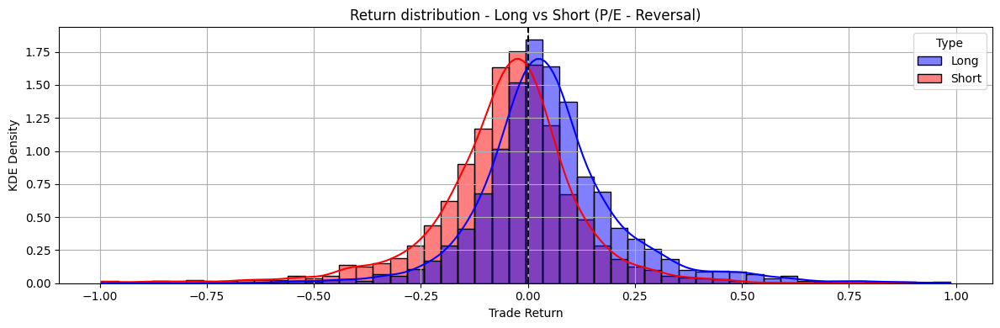

In [ ]:
long_trades_pe = closed_trades_pe_rev_df[closed_trades_pe_rev_df['Position'] == 'long']
short_trades_pe = closed_trades_pe_rev_df[closed_trades_pe_rev_df['Position'] == 'short']

long_trades_pe['Type'] = 'Long'
short_trades_pe['Type'] = 'Short'
combined_trades = pd.concat([long_trades_pe, short_trades_pe], ignore_index=True)
combined_trades = combined_trades[combined_trades['Trade Return'].between(-1, 1)]

plt.figure(figsize=(12, 4))
sns.histplot(data=combined_trades, x='Trade Return', hue='Type', kde=True, stat='density', bins=50, palette={'Long': 'blue', 'Short': 'red'}, alpha=0.5)
plt.axvline(0, color='black', linestyle='--')
plt.title("Return distribution - Long vs Short (P/E - Reversal)")
plt.xlabel("Trade Return")
plt.ylabel("KDE Density")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
closed_trades_pe_rev_df['Position'].value_counts()

,count
Position,
short,3864
long,3857


We have an equivalent number of Buy and Sell orders, but the distribution of short trade returns' is left-skewed (small wins and sharp losses when prices move against the short trade).

The short trades are completely dragging down the overall performance of the reversal strategy.

In [ ]:
def perf(df, label):
    median_return = df['Trade Return'].median() * 100
    median_annualized_return = df['Annualized Return'].median() * 100
    mean_days_held = df['Days Held'].mean()
    hit_ratio = (df['PnL'] > 0).mean() * 100
    print(f"\n {label}")
    print(f"Median return per trade: {median_return:.2f}%")
    print(f"Median Annualized return : {median_annualized_return:.2f}%")
    print(f"Mean days held : {mean_days_held:.1f} days")
    print(f"Hit Ratio (positive trades) : {hit_ratio:.2f}%")

perf(long_trades_pe, "LONG:")
perf(short_trades_pe, "SHORT:")


 LONG:
Median return per trade: 3.60%
Median Annualized return : 13.16%
Mean days held : 157.2 days
Hit Ratio (positive trades) : 62.95%

 SHORT:
Median return per trade: -3.77%
Median Annualized return : -12.57%
Mean days held : 159.4 days
Hit Ratio (positive trades) : 36.46%


 ### 7.2 P/B Ratio

#### 7.2.1 Long only

Applying the same strategies for P/B Ratios (long-only and reversal strategies) with a shift in signals' data to prevent look-ahead bias.

In [ ]:
# Doing the same as with the P/E Ratio: cleaning the signals and shifting the data
df_signals_pb = reg_predictions_pb_df.copy()
df_signals_pb.rename(columns={'Date': 'date'}, inplace=True)
df_signals_pb['Raw_Signal'] = np.where(df_signals_pb['Above_EWMean_PB'] == 0, 1,-1)

# Adding the Adjusted Closes associated
if 'Date' in df_signals_pb.columns:
    df_signals_pb.rename(columns={'Date': 'date'}, inplace=True)

df_signals_pb = df_signals_pb.merge(
    monthly_ratios.reset_index()[['date', 'Ticker', 'Adjusted Close']], on=['date', 'Ticker'], how='left').dropna(subset=['Adjusted Close'])

# And generating the Classic long-only signals
df_signals_pb = df_signals_pb.sort_values(['Ticker', 'date']).copy()
df_signals_pb['Classic_Signal'] = 0

for ticker in tqdm(df_signals_pb['Ticker'].unique(), desc="Processing Classic Signals (P/B)"):
    ticker_df = df_signals_pb[df_signals_pb['Ticker'] == ticker].copy()
    in_position = False
    classic_signals = []
    for signal in ticker_df['Raw_Signal']:
        if signal == 1 and not in_position:
            classic_signals.append(1)
            in_position = True
        elif signal == -1 and in_position:
            classic_signals.append(-1)
            in_position = False
        else:
            classic_signals.append(0)
    df_signals_pb.loc[df_signals_pb['Ticker'] == ticker, 'Classic_Signal'] = classic_signals

Processing Classic Signals (P/B): 100%|██████████| 595/595 [00:08<00:00, 67.67it/s] 


In [ ]:
# Mapping the Signals and shifting them and launching the function:
df_signals_pb['Signal_Text'] = df_signals_pb['Classic_Signal'].map({1: 'Buy',-1: 'Sell',0: 'Hold'})
df_signals_pb[['Raw_Signal', 'Classic_Signal', 'Signal_Text']] = (
    df_signals_pb.groupby('Ticker')[['Raw_Signal', 'Classic_Signal', 'Signal_Text']].shift(1))
df_signals_pb = df_signals_pb.dropna(subset=['Raw_Signal', 'Classic_Signal', 'Signal_Text'])
df_signals_pb['Signal_Text'] = df_signals_pb['Signal_Text'].astype(str)

df_signals_pb['Date'] = pd.to_datetime(df_signals_pb['date'])
df_signals_pb = df_signals_pb.sort_values(['Ticker', 'Date'])
df_signals_pb['Return'] = df_signals_pb.groupby('Ticker')['Adjusted Close'].pct_change()
df_signals_pb = df_signals_pb.dropna(subset=['Return'])
df_signals_pb = df_signals_pb.set_index('Date')
pnl_pb_ml_df = trading_long_only(df_signals_pb, signal_column='Signal_Text')

Processing Tickers:   1%|          | 6/595 [00:00<00:10, 57.88Ticker/s]

BUY  | A | 2010-11-30 | Price: 25.35
SELL | A | 2011-04-30 | Price: 36.13 | PnL: 10.78 | Cumul PnL: 10.78 | Return: 42.52% | Annualized: 134.04% | Days: 151 | Sharpe: 5.84
BUY  | A | 2011-05-31 | Price: 36.10
SELL | A | 2011-10-31 | Price: 26.84 | PnL: -9.27 | Cumul PnL: 1.51 | Return: -25.67% | Annualized: -50.93% | Days: 153 | Sharpe: -1.17
BUY  | A | 2011-11-30 | Price: 27.15
SELL | A | 2011-12-31 | Price: 25.29 | PnL: -1.86 | Cumul PnL: -0.35 | Return: -6.85% | Annualized: -57.34% | Days: 31 | Sharpe: -4.13
BUY  | A | 2012-04-30 | Price: 30.53
SELL | A | 2012-09-30 | Price: 27.83 | PnL: -2.70 | Cumul PnL: -3.05 | Return: -8.84% | Annualized: -19.93% | Days: 153 | Sharpe: -2.09
BUY  | A | 2013-04-30 | Price: 30.00
SELL | A | 2013-05-31 | Price: 32.90 | PnL: 2.90 | Cumul PnL: -0.14 | Return: 9.68% | Annualized: 202.95% | Days: 31 | Sharpe: 10.71
BUY  | A | 2013-06-30 | Price: 30.95
SELL | A | 2013-07-31 | Price: 32.38 | PnL: 1.43 | Cumul PnL: 1.28 | Return: 4.61% | Annualized: 71.69%

Processing Tickers:   3%|▎         | 18/595 [00:00<00:11, 52.02Ticker/s]

BUY  | ADM | 2014-12-31 | Price: 52.00
SELL | ADM | 2015-12-31 | Price: 36.68 | PnL: -15.32 | Cumul PnL: -10.02 | Return: -29.46% | Annualized: -29.46% | Days: 365 | Sharpe: -1.09
BUY  | ADM | 2016-01-31 | Price: 35.35
SELL | ADM | 2016-03-31 | Price: 36.31 | PnL: 0.96 | Cumul PnL: -9.06 | Return: 2.72% | Annualized: 17.44% | Days: 60 | Sharpe: 1.62
BUY  | ADM | 2016-04-30 | Price: 39.94
SELL | ADM | 2016-05-31 | Price: 42.77 | PnL: 2.83 | Cumul PnL: -6.23 | Return: 7.09% | Annualized: 127.39% | Days: 31 | Sharpe: 25.26
BUY  | ADM | 2017-03-31 | Price: 46.04
SELL | ADM | 2017-04-30 | Price: 45.75 | PnL: -0.29 | Cumul PnL: -6.52 | Return: -0.63% | Annualized: -7.30% | Days: 30 | Sharpe: -3.12
BUY  | ADM | 2017-07-31 | Price: 42.18
SELL | ADM | 2017-09-30 | Price: 42.51 | PnL: 0.33 | Cumul PnL: -6.19 | Return: 0.78% | Annualized: 4.79% | Days: 61 | Sharpe: 0.65
BUY  | ADM | 2017-10-31 | Price: 40.87
SELL | ADM | 2017-11-30 | Price: 39.88 | PnL: -0.99 | Cumul PnL: -7.18 | Return: -2.42% |

Processing Tickers:   5%|▌         | 30/595 [00:00<00:10, 52.02Ticker/s]

BUY  | AIG | 2012-04-30 | Price: 34.03
SELL | AIG | 2012-06-30 | Price: 32.09 | PnL: -1.94 | Cumul PnL: -1.94 | Return: -5.70% | Annualized: -29.69% | Days: 61 | Sharpe: -0.74
BUY  | AIG | 2012-07-31 | Price: 31.27
SELL | AIG | 2012-08-31 | Price: 34.33 | PnL: 3.06 | Cumul PnL: 1.12 | Return: 9.79% | Annualized: 206.59% | Days: 31 | Sharpe: 9.66
BUY  | AIG | 2012-11-30 | Price: 33.13
SELL | AIG | 2012-12-31 | Price: 35.30 | PnL: 2.17 | Cumul PnL: 3.29 | Return: 6.55% | Annualized: 114.11% | Days: 31 | Sharpe: 5.63
BUY  | AIG | 2014-04-30 | Price: 53.13
SELL | AIG | 2014-08-31 | Price: 56.06 | PnL: 2.93 | Cumul PnL: 6.22 | Return: 5.51% | Annualized: 17.47% | Days: 123 | Sharpe: 1.14
BUY  | AIG | 2014-09-30 | Price: 54.02
SELL | AIG | 2015-02-28 | Price: 55.33 | PnL: 1.31 | Cumul PnL: 7.53 | Return: 2.43% | Annualized: 5.92% | Days: 151 | Sharpe: 0.22
BUY  | AIG | 2015-03-31 | Price: 54.79
SELL | AIG | 2015-04-30 | Price: 56.29 | PnL: 1.50 | Cumul PnL: 9.03 | Return: 2.74% | Annualized:

Processing Tickers:   7%|▋         | 42/595 [00:00<00:10, 51.35Ticker/s]

BUY  | AMAT | 2010-10-31 | Price: 12.35
SELL | AMAT | 2011-09-30 | Price: 10.36 | PnL: -1.99 | Cumul PnL: -1.99 | Return: -16.15% | Annualized: -17.49% | Days: 334 | Sharpe: -0.65
BUY  | AMAT | 2012-07-31 | Price: 10.89
SELL | AMAT | 2012-08-31 | Price: 11.69 | PnL: 0.80 | Cumul PnL: -1.20 | Return: 7.35% | Annualized: 134.12% | Days: 31 | Sharpe: 6.35
BUY  | AMAT | 2012-09-30 | Price: 11.16
SELL | AMAT | 2012-10-31 | Price: 10.60 | PnL: -0.56 | Cumul PnL: -1.76 | Return: -5.06% | Annualized: -46.38% | Days: 31 | Sharpe: -47.02
BUY  | AMAT | 2014-03-31 | Price: 20.41
SELL | AMAT | 2014-10-31 | Price: 22.09 | PnL: 1.68 | Cumul PnL: -0.08 | Return: 8.20% | Annualized: 14.47% | Days: 214 | Sharpe: 0.57
BUY  | AMAT | 2015-06-30 | Price: 19.22
SELL | AMAT | 2016-05-31 | Price: 24.42 | PnL: 5.20 | Cumul PnL: 5.12 | Return: 27.06% | Annualized: 29.85% | Days: 336 | Sharpe: 0.88
BUY  | AMAT | 2016-06-30 | Price: 23.97
SELL | AMAT | 2016-07-31 | Price: 26.29 | PnL: 2.32 | Cumul PnL: 7.44 | Retu

Processing Tickers:   9%|▉         | 56/595 [00:01<00:09, 59.00Ticker/s]

BUY  | APC | 2010-07-31 | Price: 49.16
SELL | APC | 2010-11-30 | Price: 64.16 | PnL: 15.00 | Cumul PnL: 15.00 | Return: 30.51% | Annualized: 122.31% | Days: 122 | Sharpe: 2.34
BUY  | APC | 2010-12-31 | Price: 76.16
SELL | APC | 2011-01-31 | Price: 77.08 | PnL: 0.92 | Cumul PnL: 15.92 | Return: 1.21% | Annualized: 15.50% | Days: 31 | Sharpe: 0.51
BUY  | APC | 2011-03-31 | Price: 81.92
SELL | APC | 2011-04-30 | Price: 78.94 | PnL: -2.98 | Cumul PnL: 12.94 | Return: -3.64% | Annualized: -35.90% | Days: 30 | Sharpe: -5.53
BUY  | APC | 2012-01-31 | Price: 80.72
SELL | APC | 2012-04-30 | Price: 73.21 | PnL: -7.51 | Cumul PnL: 5.43 | Return: -9.30% | Annualized: -32.34% | Days: 90 | Sharpe: -1.59
BUY  | APC | 2012-07-31 | Price: 69.44
SELL | APC | 2013-01-31 | Price: 80.02 | PnL: 10.58 | Cumul PnL: 16.01 | Return: 15.24% | Annualized: 32.79% | Days: 184 | Sharpe: 2.90
BUY  | APC | 2013-06-30 | Price: 85.93
SELL | APC | 2014-03-31 | Price: 84.76 | PnL: -1.17 | Cumul PnL: 14.84 | Return: -1.36%

Processing Tickers:  11%|█▏        | 68/595 [00:01<00:09, 53.72Ticker/s]

SELL | AVY | 2018-04-30 | Price: 104.81 | PnL: 39.84 | Cumul PnL: 60.23 | Return: 61.32% | Annualized: 21.08% | Days: 912 | Sharpe: 1.12
BUY  | AVY | 2018-12-31 | Price: 89.83
SELL | AVY | 2019-01-31 | Price: 104.45 | PnL: 14.62 | Cumul PnL: 74.85 | Return: 16.28% | Annualized: 510.72% | Days: 31 | Sharpe: 12.77
BUY  | AVY | 2019-02-28 | Price: 108.04
SELL | AVY | 2019-03-31 | Price: 113.00 | PnL: 4.96 | Cumul PnL: 79.81 | Return: 4.59% | Annualized: 71.37% | Days: 31 | Sharpe: 35.71
BUY  | AVY | 2019-04-30 | Price: 110.65
SELL | AVY | 2019-05-31 | Price: 104.06 | PnL: -6.59 | Cumul PnL: 73.22 | Return: -5.96% | Annualized: -52.14% | Days: 31 | Sharpe: -7.77
BUY  | AVY | 2019-06-30 | Price: 115.68
SELL | AVY | 2020-05-31 | Price: 110.67 | PnL: -5.01 | Cumul PnL: 68.21 | Return: -4.33% | Annualized: -4.72% | Days: 336 | Sharpe: -0.19
BUY  | AVY | 2020-12-31 | Price: 155.11
BUY  | AWK | 2018-12-31 | Price: 90.77
SELL | AWK | 2019-06-30 | Price: 116.00 | PnL: 25.23 | Cumul PnL: 25.23 | Re

Processing Tickers:  12%|█▏        | 74/595 [00:01<00:10, 50.11Ticker/s]

BUY  | BEN | 2010-05-31 | Price: 32.70
SELL | BEN | 2010-07-31 | Price: 33.53 | PnL: 0.83 | Cumul PnL: 0.83 | Return: 2.54% | Annualized: 16.23% | Days: 61 | Sharpe: 0.33
BUY  | BEN | 2010-08-31 | Price: 32.17
SELL | BEN | 2010-09-30 | Price: 35.63 | PnL: 3.46 | Cumul PnL: 4.29 | Return: 10.77% | Annualized: 241.09% | Days: 30 | Sharpe: 9.40
BUY  | BEN | 2010-11-30 | Price: 38.03
SELL | BEN | 2011-10-31 | Price: 35.54 | PnL: -2.49 | Cumul PnL: 1.81 | Return: -6.54% | Annualized: -7.11% | Days: 335 | Sharpe: -0.27
BUY  | BEN | 2011-11-30 | Price: 33.61
SELL | BEN | 2012-01-31 | Price: 35.37 | PnL: 1.76 | Cumul PnL: 3.57 | Return: 5.24% | Annualized: 35.84% | Days: 62 | Sharpe: 1.41
BUY  | BEN | 2012-04-30 | Price: 41.84
SELL | BEN | 2013-01-31 | Price: 45.63 | PnL: 3.79 | Cumul PnL: 7.36 | Return: 9.06% | Annualized: 12.26% | Days: 276 | Sharpe: 0.56
BUY  | BEN | 2013-04-30 | Price: 51.55
SELL | BEN | 2013-06-30 | Price: 45.34 | PnL: -6.21 | Cumul PnL: 1.14 | Return: -12.05% | Annualize

Processing Tickers:  13%|█▎        | 80/595 [00:01<00:16, 31.11Ticker/s]

SELL | BLK | 2019-04-30 | Price: 485.24 | PnL: 92.42 | Cumul PnL: 124.72 | Return: 23.53% | Annualized: 88.49% | Days: 120 | Sharpe: 3.29
BUY  | BLK | 2019-05-31 | Price: 415.56
SELL | BLK | 2019-06-30 | Price: 469.30 | PnL: 53.74 | Cumul PnL: 178.46 | Return: 12.93% | Annualized: 330.33% | Days: 30 | Sharpe: 6.99
BUY  | BLK | 2019-07-31 | Price: 467.68
SELL | BLK | 2019-08-31 | Price: 422.56 | PnL: -45.12 | Cumul PnL: 133.34 | Return: -9.65% | Annualized: -70.40% | Days: 31 | Sharpe: -4.37
BUY  | BLK | 2019-10-31 | Price: 461.70
SELL | BLK | 2019-11-30 | Price: 494.91 | PnL: 33.21 | Cumul PnL: 166.55 | Return: 7.19% | Annualized: 130.14% | Days: 30 | Sharpe: 20.93
BUY  | BLK | 2020-04-30 | Price: 502.04
SELL | BLK | 2020-06-30 | Price: 544.09 | PnL: 42.05 | Cumul PnL: 208.60 | Return: 8.38% | Annualized: 62.03% | Days: 61 | Sharpe: 3.72
BUY  | BLK | 2020-07-31 | Price: 575.01
BUY  | BLL | 2010-05-31 | Price: 12.31
SELL | BLL | 2010-08-31 | Price: 14.02 | PnL: 1.71 | Cumul PnL: 1.71 | 

Processing Tickers:  14%|█▍        | 85/595 [00:02<00:21, 23.50Ticker/s]


BUY  | BRK | 2012-06-30 | Price: 83.33
SELL | BRK | 2012-07-31 | Price: 84.84 | PnL: 1.51 | Cumul PnL: 1.51 | Return: 1.81% | Annualized: 24.05% | Days: 31 | Sharpe: 4.35
BUY  | BRK | 2012-08-31 | Price: 84.34
SELL | BRK | 2013-03-31 | Price: 104.20 | PnL: 19.86 | Cumul PnL: 21.37 | Return: 23.55% | Annualized: 43.69% | Days: 212 | Sharpe: 4.12
BUY  | BRK | 2013-04-30 | Price: 106.32
SELL | BRK | 2014-05-31 | Price: 128.34 | PnL: 22.02 | Cumul PnL: 43.39 | Return: 20.71% | Annualized: 18.98% | Days: 396 | Sharpe: 1.50
BUY  | BRK | 2014-07-31 | Price: 125.43
SELL | BRK | 2014-08-31 | Price: 137.25 | PnL: 11.82 | Cumul PnL: 55.21 | Return: 9.42% | Annualized: 194.67% | Days: 31 | Sharpe: 10.89
BUY  | BRK | 2014-09-30 | Price: 138.14
SELL | BRK | 2014-10-31 | Price: 140.16 | PnL: 2.02 | Cumul PnL: 57.23 | Return: 1.46% | Annualized: 19.03% | Days: 31 | Sharpe: 13.50
BUY  | BRK | 2014-11-30 | Price: 148.69
SELL | BRK | 2015-06-30 | Price: 136.11 | PnL: -12.58 | Cumul PnL: 44.65 | Return: 

Processing Tickers:  17%|█▋        | 101/595 [00:02<00:13, 36.73Ticker/s]

BUY  | C | 2010-10-31 | Price: 41.70
SELL | C | 2012-12-31 | Price: 39.56 | PnL: -2.14 | Cumul PnL: -2.14 | Return: -5.13% | Annualized: -2.40% | Days: 792 | Sharpe: -0.06
BUY  | C | 2013-01-31 | Price: 42.16
SELL | C | 2013-03-31 | Price: 44.24 | PnL: 2.08 | Cumul PnL: -0.06 | Return: 4.93% | Annualized: 33.50% | Days: 59 | Sharpe: 3.15
BUY  | C | 2014-05-31 | Price: 47.57
SELL | C | 2014-07-31 | Price: 48.91 | PnL: 1.34 | Cumul PnL: 1.28 | Return: 2.82% | Annualized: 18.14% | Days: 61 | Sharpe: 2.36
BUY  | C | 2015-03-31 | Price: 51.52
SELL | C | 2015-04-30 | Price: 53.32 | PnL: 1.80 | Cumul PnL: 3.08 | Return: 3.49% | Annualized: 51.00% | Days: 30 | Sharpe: 5.65
BUY  | C | 2015-06-30 | Price: 55.24
SELL | C | 2015-07-31 | Price: 58.46 | PnL: 3.22 | Cumul PnL: 6.30 | Return: 5.83% | Annualized: 97.36% | Days: 31 | Sharpe: 15.26
BUY  | C | 2015-08-31 | Price: 53.48
SELL | C | 2016-02-29 | Price: 38.85 | PnL: -14.63 | Cumul PnL: -8.33 | Return: -27.36% | Annualized: -47.23% | Days: 182

Processing Tickers:  19%|█▉        | 114/595 [00:02<00:10, 46.21Ticker/s]

BUY  | CELG | 2013-03-31 | Price: 57.95
SELL | CELG | 2013-04-30 | Price: 59.03 | PnL: 1.08 | Cumul PnL: 1.08 | Return: 1.86% | Annualized: 24.80% | Days: 30 | Sharpe: 1.38
BUY  | CELG | 2013-07-31 | Price: 73.43
SELL | CELG | 2014-07-31 | Price: 87.15 | PnL: 13.72 | Cumul PnL: 14.80 | Return: 18.68% | Annualized: 18.68% | Days: 365 | Sharpe: 0.55
BUY  | CELG | 2014-08-31 | Price: 95.02
SELL | CELG | 2015-04-30 | Price: 108.06 | PnL: 13.04 | Cumul PnL: 27.84 | Return: 13.72% | Annualized: 21.28% | Days: 242 | Sharpe: 1.00
BUY  | CELG | 2016-01-31 | Price: 100.32
SELL | CELG | 2016-02-29 | Price: 100.83 | PnL: 0.51 | Cumul PnL: 28.35 | Return: 0.51% | Annualized: 6.27% | Days: 29 | Sharpe: 0.22
BUY  | CELG | 2016-03-31 | Price: 100.09
SELL | CELG | 2016-04-30 | Price: 103.41 | PnL: 3.32 | Cumul PnL: 31.67 | Return: 3.32% | Annualized: 47.93% | Days: 30 | Sharpe: 6.83
BUY  | CELG | 2016-07-31 | Price: 112.19
SELL | CELG | 2017-12-31 | Price: 104.36 | PnL: -7.83 | Cumul PnL: 23.84 | Retur

Processing Tickers:  21%|██        | 125/595 [00:02<00:10, 45.98Ticker/s]

SELL | CL | 2011-03-31 | Price: 40.38 | PnL: 1.12 | Cumul PnL: 1.12 | Return: 2.85% | Annualized: 40.15% | Days: 31 | Sharpe: 40.44
BUY  | CL | 2011-04-30 | Price: 42.17
SELL | CL | 2011-07-31 | Price: 42.19 | PnL: 0.02 | Cumul PnL: 1.14 | Return: 0.04% | Annualized: 0.14% | Days: 92 | Sharpe: 0.01
BUY  | CL | 2011-08-31 | Price: 44.98
SELL | CL | 2011-09-30 | Price: 44.34 | PnL: -0.64 | Cumul PnL: 0.49 | Return: -1.43% | Annualized: -15.91% | Days: 30 | Sharpe: -1.14
BUY  | CL | 2011-10-31 | Price: 45.19
SELL | CL | 2012-04-30 | Price: 49.47 | PnL: 4.28 | Cumul PnL: 4.78 | Return: 9.48% | Annualized: 19.87% | Days: 182 | Sharpe: 3.05
BUY  | CL | 2012-06-30 | Price: 52.05
SELL | CL | 2013-06-30 | Price: 57.29 | PnL: 5.24 | Cumul PnL: 10.02 | Return: 10.07% | Annualized: 10.07% | Days: 365 | Sharpe: 0.93
BUY  | CL | 2013-07-31 | Price: 59.87
SELL | CL | 2014-07-31 | Price: 63.40 | PnL: 3.53 | Cumul PnL: 13.55 | Return: 5.90% | Annualized: 5.90% | Days: 365 | Sharpe: 0.40
BUY  | CL | 201

Processing Tickers:  23%|██▎       | 137/595 [00:03<00:08, 50.97Ticker/s]

BUY  | COF | 2010-06-30 | Price: 40.30
SELL | COF | 2011-01-31 | Price: 48.16 | PnL: 7.86 | Cumul PnL: 7.86 | Return: 19.50% | Annualized: 35.72% | Days: 215 | Sharpe: 1.26
BUY  | COF | 2011-03-31 | Price: 51.96
SELL | COF | 2011-04-30 | Price: 54.73 | PnL: 2.77 | Cumul PnL: 10.63 | Return: 5.33% | Annualized: 86.50% | Days: 30 | Sharpe: 53.65
BUY  | COF | 2011-11-30 | Price: 44.66
SELL | COF | 2011-12-31 | Price: 42.29 | PnL: -2.37 | Cumul PnL: 8.26 | Return: -5.31% | Annualized: -48.02% | Days: 31 | Sharpe: -8.90
BUY  | COF | 2012-04-30 | Price: 55.48
SELL | COF | 2012-05-31 | Price: 51.37 | PnL: -4.11 | Cumul PnL: 4.15 | Return: -7.41% | Annualized: -60.29% | Days: 31 | Sharpe: -5.01
BUY  | COF | 2012-07-31 | Price: 56.49
SELL | COF | 2012-10-31 | Price: 60.17 | PnL: 3.68 | Cumul PnL: 7.83 | Return: 6.51% | Annualized: 28.72% | Days: 92 | Sharpe: 3.84
BUY  | COF | 2012-12-31 | Price: 57.93
SELL | COF | 2013-03-31 | Price: 54.95 | PnL: -2.98 | Cumul PnL: 4.85 | Return: -5.14% | Annua

Processing Tickers:  24%|██▍       | 143/595 [00:03<00:09, 48.05Ticker/s]

BUY  | CRM | 2011-06-30 | Price: 37.24
SELL | CRM | 2011-12-31 | Price: 25.36 | PnL: -11.88 | Cumul PnL: -11.88 | Return: -31.90% | Annualized: -53.62% | Days: 184 | Sharpe: -1.58
BUY  | CRM | 2012-01-31 | Price: 29.20
SELL | CRM | 2012-03-31 | Price: 38.63 | PnL: 9.43 | Cumul PnL: -2.45 | Return: 32.29% | Annualized: 435.90% | Days: 60 | Sharpe: 21.05
BUY  | CRM | 2012-05-31 | Price: 34.66
SELL | CRM | 2012-06-30 | Price: 34.56 | PnL: -0.09 | Cumul PnL: -2.54 | Return: -0.26% | Annualized: -3.07% | Days: 30 | Sharpe: -0.17
BUY  | CRM | 2012-07-31 | Price: 31.09
SELL | CRM | 2012-11-30 | Price: 39.42 | PnL: 8.33 | Cumul PnL: 5.78 | Return: 26.79% | Annualized: 103.80% | Days: 122 | Sharpe: 3.18
BUY  | CRM | 2012-12-31 | Price: 42.03
SELL | CRM | 2013-02-28 | Price: 42.30 | PnL: 0.28 | Cumul PnL: 6.06 | Return: 0.67% | Annualized: 4.06% | Days: 59 | Sharpe: 0.35
BUY  | CRM | 2014-01-31 | Price: 60.53
SELL | CRM | 2014-08-31 | Price: 59.09 | PnL: -1.44 | Cumul PnL: 4.62 | Return: -2.38% 

Processing Tickers:  26%|██▌       | 153/595 [00:03<00:09, 48.14Ticker/s]

SELL | CVS | 2014-04-30 | Price: 72.72 | PnL: 15.14 | Cumul PnL: 28.47 | Return: 26.29% | Annualized: 29.00% | Days: 334 | Sharpe: 1.55
BUY  | CVS | 2014-09-30 | Price: 79.59
SELL | CVS | 2015-04-30 | Price: 99.29 | PnL: 19.70 | Cumul PnL: 48.17 | Return: 24.75% | Annualized: 46.10% | Days: 212 | Sharpe: 3.47
BUY  | CVS | 2016-04-30 | Price: 100.50
SELL | CVS | 2016-05-31 | Price: 96.45 | PnL: -4.05 | Cumul PnL: 44.12 | Return: -4.03% | Annualized: -38.96% | Days: 31 | Sharpe: -24.55
BUY  | CVS | 2016-07-31 | Price: 92.72
SELL | CVS | 2016-11-30 | Price: 76.89 | PnL: -15.83 | Cumul PnL: 28.29 | Return: -17.07% | Annualized: -42.97% | Days: 122 | Sharpe: -4.07
BUY  | CVS | 2017-01-31 | Price: 78.81
SELL | CVS | 2018-01-31 | Price: 78.69 | PnL: -0.12 | Cumul PnL: 28.17 | Return: -0.15% | Annualized: -0.15% | Days: 365 | Sharpe: -0.01
BUY  | CVS | 2018-04-30 | Price: 69.83
SELL | CVS | 2018-06-30 | Price: 64.35 | PnL: -5.48 | Cumul PnL: 22.69 | Return: -7.85% | Annualized: -38.76% | Days:

Processing Tickers:  28%|██▊       | 164/595 [00:03<00:08, 48.66Ticker/s]

SELL | DGX | 2015-01-31 | Price: 71.07 | PnL: 15.14 | Cumul PnL: 11.42 | Return: 27.07% | Annualized: 37.63% | Days: 276 | Sharpe: 2.93
BUY  | DGX | 2016-04-30 | Price: 75.17
SELL | DGX | 2016-07-31 | Price: 86.36 | PnL: 11.19 | Cumul PnL: 22.61 | Return: 14.89% | Annualized: 74.21% | Days: 92 | Sharpe: 16.37
BUY  | DGX | 2016-10-31 | Price: 81.44
SELL | DGX | 2017-01-31 | Price: 91.92 | PnL: 10.48 | Cumul PnL: 33.09 | Return: 12.87% | Annualized: 62.29% | Days: 92 | Sharpe: 4.14
BUY  | DGX | 2017-02-28 | Price: 97.44
SELL | DGX | 2017-04-30 | Price: 105.51 | PnL: 8.07 | Cumul PnL: 41.16 | Return: 8.28% | Annualized: 61.19% | Days: 61 | Sharpe: 6.15
BUY  | DGX | 2017-06-30 | Price: 111.16
SELL | DGX | 2018-08-31 | Price: 109.98 | PnL: -1.18 | Cumul PnL: 39.98 | Return: -1.06% | Annualized: -0.91% | Days: 427 | Sharpe: -0.06
BUY  | DGX | 2018-09-30 | Price: 107.91
SELL | DGX | 2018-10-31 | Price: 94.11 | PnL: -13.80 | Cumul PnL: 26.18 | Return: -12.79% | Annualized: -80.64% | Days: 31 |

Processing Tickers:  29%|██▉       | 174/595 [00:03<00:08, 47.74Ticker/s]

SELL | DOV | 2013-04-30 | Price: 45.74 | PnL: -2.59 | Cumul PnL: -0.18 | Return: -5.35% | Annualized: -48.31% | Days: 30 | Sharpe: -5.92
BUY  | DOV | 2013-06-30 | Price: 51.49
SELL | DOV | 2013-07-31 | Price: 56.79 | PnL: 5.29 | Cumul PnL: 5.11 | Return: 10.28% | Annualized: 223.41% | Days: 31 | Sharpe: 11.69
BUY  | DOV | 2013-10-31 | Price: 60.86
SELL | DOV | 2014-04-30 | Price: 68.24 | PnL: 7.38 | Cumul PnL: 12.49 | Return: 12.13% | Annualized: 25.72% | Days: 181 | Sharpe: 1.26
BUY  | DOV | 2014-05-31 | Price: 68.86
SELL | DOV | 2014-07-31 | Price: 67.74 | PnL: -1.12 | Cumul PnL: 11.37 | Return: -1.63% | Annualized: -9.38% | Days: 61 | Sharpe: -0.65
BUY  | DOV | 2014-08-31 | Price: 69.41
SELL | DOV | 2015-09-30 | Price: 45.16 | PnL: -24.24 | Cumul PnL: -12.87 | Return: -34.93% | Annualized: -32.74% | Days: 395 | Sharpe: -1.89
BUY  | DOV | 2015-10-31 | Price: 50.89
SELL | DOV | 2015-11-30 | Price: 52.05 | PnL: 1.16 | Cumul PnL: -11.71 | Return: 2.28% | Annualized: 31.09% | Days: 30 | 

Processing Tickers:  31%|███       | 185/595 [00:04<00:08, 47.91Ticker/s]

BUY  | DXC | 2020-07-31 | Price: 17.91
SELL | DXC | 2021-01-31 | Price: 28.20 | PnL: 10.29 | Cumul PnL: 10.29 | Return: 57.45% | Annualized: 147.92% | Days: 184 | Sharpe: 4.63
BUY  | DXC | 2021-03-31 | Price: 31.26
SELL | DXC | 2021-05-31 | Price: 37.92 | PnL: 6.66 | Cumul PnL: 16.95 | Return: 21.31% | Annualized: 218.62% | Days: 61 | Sharpe: 8.27
BUY  | EA | 2014-04-30 | Price: 28.30
SELL | EA | 2015-03-31 | Price: 58.81 | PnL: 30.51 | Cumul PnL: 30.51 | Return: 107.83% | Annualized: 122.12% | Days: 335 | Sharpe: 3.94
BUY  | EA | 2015-12-31 | Price: 68.72
SELL | EA | 2016-03-31 | Price: 66.11 | PnL: -2.61 | Cumul PnL: 27.90 | Return: -3.80% | Annualized: -14.35% | Days: 91 | Sharpe: -1.22
BUY  | EA | 2016-07-31 | Price: 76.32
SELL | EA | 2016-12-31 | Price: 78.76 | PnL: 2.44 | Cumul PnL: 30.35 | Return: 3.20% | Annualized: 7.85% | Days: 153 | Sharpe: 0.48
BUY  | EA | 2017-01-31 | Price: 83.43
SELL | EA | 2018-09-30 | Price: 120.49 | PnL: 37.06 | Cumul PnL: 67.41 | Return: 44.42% | Ann

Processing Tickers:  33%|███▎      | 196/595 [00:04<00:08, 49.50Ticker/s]

BUY  | EMR | 2010-07-31 | Price: 49.54
SELL | EMR | 2010-08-31 | Price: 46.65 | PnL: -2.89 | Cumul PnL: -2.89 | Return: -5.83% | Annualized: -51.39% | Days: 31 | Sharpe: -1.54
BUY  | EMR | 2010-10-31 | Price: 54.90
SELL | EMR | 2011-04-30 | Price: 60.77 | PnL: 5.87 | Cumul PnL: 2.98 | Return: 10.69% | Annualized: 22.53% | Days: 181 | Sharpe: 2.99
BUY  | EMR | 2011-09-30 | Price: 41.31
SELL | EMR | 2011-10-31 | Price: 48.12 | PnL: 6.81 | Cumul PnL: 9.79 | Return: 16.49% | Annualized: 524.09% | Days: 31 | Sharpe: 10.91
BUY  | EMR | 2011-11-30 | Price: 52.25
SELL | EMR | 2011-12-31 | Price: 46.59 | PnL: -5.66 | Cumul PnL: 4.13 | Return: -10.83% | Annualized: -74.74% | Days: 31 | Sharpe: -2.22
BUY  | EMR | 2012-02-29 | Price: 50.31
SELL | EMR | 2012-03-31 | Price: 52.18 | PnL: 1.87 | Cumul PnL: 6.00 | Return: 3.72% | Annualized: 54.95% | Days: 31 | Sharpe: 5.47
BUY  | EMR | 2012-05-31 | Price: 46.77
SELL | EMR | 2013-01-31 | Price: 57.25 | PnL: 10.48 | Cumul PnL: 16.48 | Return: 22.41% | A

Processing Tickers:  35%|███▍      | 206/595 [00:04<00:07, 48.90Ticker/s]

BUY  | ETR | 2011-07-31 | Price: 33.40
SELL | ETR | 2011-09-30 | Price: 33.15 | PnL: -0.25 | Cumul PnL: -0.25 | Return: -0.76% | Annualized: -4.49% | Days: 61 | Sharpe: -0.70
BUY  | ETR | 2012-02-29 | Price: 33.31
SELL | ETR | 2012-03-31 | Price: 33.60 | PnL: 0.29 | Cumul PnL: 0.03 | Return: 0.86% | Annualized: 10.76% | Days: 31 | Sharpe: 1.29
BUY  | ETR | 2012-04-30 | Price: 32.78
SELL | ETR | 2012-07-31 | Price: 36.34 | PnL: 3.55 | Cumul PnL: 3.59 | Return: 10.85% | Annualized: 50.96% | Days: 92 | Sharpe: 3.56
BUY  | ETR | 2012-08-31 | Price: 34.04
SELL | ETR | 2012-09-30 | Price: 34.65 | PnL: 0.61 | Cumul PnL: 4.20 | Return: 1.79% | Annualized: 23.76% | Days: 30 | Sharpe: 1.69
BUY  | ETR | 2012-10-31 | Price: 36.29
SELL | ETR | 2012-12-31 | Price: 31.88 | PnL: -4.41 | Cumul PnL: -0.22 | Return: -12.17% | Annualized: -54.08% | Days: 61 | Sharpe: -2.14
BUY  | ETR | 2013-04-30 | Price: 35.62
SELL | ETR | 2013-06-30 | Price: 34.84 | PnL: -0.77 | Cumul PnL: -0.99 | Return: -2.18% | Annua

Processing Tickers:  36%|███▋      | 217/595 [00:04<00:07, 48.11Ticker/s]

SELL | FCX | 2018-04-30 | Price: 15.21 | PnL: 1.21 | Cumul PnL: -36.44 | Return: 8.64% | Annualized: 4.23% | Days: 730 | Sharpe: 0.07
BUY  | FCX | 2018-10-31 | Price: 11.65
SELL | FCX | 2018-11-30 | Price: 11.94 | PnL: 0.29 | Cumul PnL: -36.15 | Return: 2.49% | Annualized: 34.32% | Days: 30 | Sharpe: 1.05
BUY  | FCX | 2019-04-30 | Price: 12.31
SELL | FCX | 2019-09-30 | Price: 9.57 | PnL: -2.74 | Cumul PnL: -38.89 | Return: -22.26% | Annualized: -45.35% | Days: 153 | Sharpe: -0.97
BUY  | FCX | 2020-09-30 | Price: 15.64
SELL | FCX | 2020-10-31 | Price: 17.34 | PnL: 1.70 | Cumul PnL: -37.19 | Return: 10.87% | Annualized: 244.94% | Days: 31 | Sharpe: 13.24
BUY  | FCX | 2020-12-31 | Price: 26.02
BUY  | FDO | 2011-06-30 | Price: 52.56
SELL | FDO | 2012-04-30 | Price: 67.55 | PnL: 14.99 | Cumul PnL: 14.99 | Return: 28.52% | Annualized: 35.13% | Days: 305 | Sharpe: 1.35
BUY  | FDO | 2012-05-31 | Price: 67.75
SELL | FDO | 2012-10-31 | Price: 65.96 | PnL: -1.79 | Cumul PnL: 13.20 | Return: -2.64

Processing Tickers:  38%|███▊      | 229/595 [00:05<00:06, 54.03Ticker/s]

BUY  | FLR | 2018-10-31 | Price: 43.86
SELL | FLR | 2018-11-30 | Price: 40.93 | PnL: -2.93 | Cumul PnL: -26.38 | Return: -6.68% | Annualized: -56.38% | Days: 30 | Sharpe: -1.83
BUY  | FLR | 2018-12-31 | Price: 32.20
BUY  | FLS | 2012-01-31 | Price: 36.72
SELL | FLS | 2012-04-30 | Price: 38.31 | PnL: 1.59 | Cumul PnL: 1.59 | Return: 4.32% | Annualized: 18.44% | Days: 90 | Sharpe: 0.95
BUY  | FLS | 2012-07-31 | Price: 39.99
SELL | FLS | 2012-10-31 | Price: 45.16 | PnL: 5.17 | Cumul PnL: 6.76 | Return: 12.93% | Annualized: 62.63% | Days: 92 | Sharpe: 7.15
BUY  | FLS | 2012-11-30 | Price: 46.18
SELL | FLS | 2012-12-31 | Price: 48.93 | PnL: 2.75 | Cumul PnL: 9.51 | Return: 5.95% | Annualized: 100.19% | Days: 31 | Sharpe: 15.65
BUY  | FLS | 2013-04-30 | Price: 52.71
SELL | FLS | 2014-01-31 | Price: 72.33 | PnL: 19.62 | Cumul PnL: 29.13 | Return: 37.23% | Annualized: 52.50% | Days: 276 | Sharpe: 2.18
BUY  | FLS | 2015-01-31 | Price: 54.49
SELL | FLS | 2015-02-28 | Price: 62.13 | PnL: 7.64 | C

Processing Tickers:  41%|████      | 242/595 [00:05<00:06, 53.00Ticker/s]

BUY  | GD | 2011-01-31 | Price: 75.40
SELL | GD | 2011-03-31 | Price: 76.56 | PnL: 1.16 | Cumul PnL: 1.16 | Return: 1.54% | Annualized: 9.59% | Days: 59 | Sharpe: 1.07
BUY  | GD | 2011-04-30 | Price: 72.82
SELL | GD | 2011-06-30 | Price: 74.52 | PnL: 1.70 | Cumul PnL: 2.86 | Return: 2.33% | Annualized: 14.85% | Days: 61 | Sharpe: 1.47
BUY  | GD | 2011-09-30 | Price: 56.89
SELL | GD | 2011-10-31 | Price: 64.19 | PnL: 7.30 | Cumul PnL: 10.16 | Return: 12.83% | Annualized: 325.77% | Days: 31 | Sharpe: 7.82
BUY  | GD | 2012-04-30 | Price: 67.50
SELL | GD | 2012-11-30 | Price: 66.50 | PnL: -1.00 | Cumul PnL: 9.16 | Return: -1.48% | Annualized: -2.53% | Days: 214 | Sharpe: -0.18
BUY  | GD | 2013-03-31 | Price: 70.51
SELL | GD | 2015-04-30 | Price: 137.32 | PnL: 66.81 | Cumul PnL: 75.97 | Return: 94.75% | Annualized: 37.71% | Days: 760 | Sharpe: 2.76
BUY  | GD | 2015-07-31 | Price: 149.11
SELL | GD | 2016-04-30 | Price: 140.52 | PnL: -8.59 | Cumul PnL: 67.38 | Return: -5.76% | Annualized: -7.

Processing Tickers:  43%|████▎     | 254/595 [00:05<00:06, 52.42Ticker/s]

SELL | GPS | 2014-06-30 | Price: 41.57 | PnL: 0.34 | Cumul PnL: 7.19 | Return: 0.82% | Annualized: 10.36% | Days: 30 | Sharpe: 1.46
BUY  | GPS | 2014-07-31 | Price: 40.11
SELL | GPS | 2014-10-31 | Price: 37.89 | PnL: -2.22 | Cumul PnL: 4.97 | Return: -5.53% | Annualized: -20.37% | Days: 92 | Sharpe: -0.59
BUY  | GPS | 2014-11-30 | Price: 39.60
SELL | GPS | 2014-12-31 | Price: 42.11 | PnL: 2.51 | Cumul PnL: 7.48 | Return: 6.34% | Annualized: 109.06% | Days: 31 | Sharpe: 34.50
BUY  | GPS | 2015-02-28 | Price: 41.60
SELL | GPS | 2015-04-30 | Price: 39.64 | PnL: -1.96 | Cumul PnL: 5.52 | Return: -4.71% | Annualized: -25.14% | Days: 61 | Sharpe: -1.35
BUY  | GPS | 2015-05-31 | Price: 38.33
SELL | GPS | 2015-06-30 | Price: 38.17 | PnL: -0.16 | Cumul PnL: 5.36 | Return: -0.42% | Annualized: -4.90% | Days: 30 | Sharpe: -0.98
BUY  | GPS | 2016-04-30 | Price: 23.18
SELL | GPS | 2016-06-30 | Price: 21.22 | PnL: -1.96 | Cumul PnL: 3.40 | Return: -8.46% | Annualized: -41.14% | Days: 61 | Sharpe: -0

Processing Tickers:  45%|████▍     | 266/595 [00:05<00:06, 52.15Ticker/s]

SELL | HCN | 2016-08-31 | Price: 76.75 | PnL: 7.33 | Cumul PnL: 3.86 | Return: 10.56% | Annualized: 35.14% | Days: 123 | Sharpe: 2.11
BUY  | HCN | 2016-09-30 | Price: 74.77
BUY  | HCP | 2010-07-31 | Price: 32.31
SELL | HCP | 2010-09-30 | Price: 32.77 | PnL: 0.46 | Cumul PnL: 0.46 | Return: 1.44% | Annualized: 8.94% | Days: 61 | Sharpe: 0.57
BUY  | HCP | 2010-10-31 | Price: 32.80
SELL | HCP | 2011-07-31 | Price: 33.46 | PnL: 0.66 | Cumul PnL: 1.12 | Return: 2.00% | Annualized: 2.67% | Days: 273 | Sharpe: 0.15
BUY  | HCP | 2011-11-30 | Price: 35.21
SELL | HCP | 2011-12-31 | Price: 37.74 | PnL: 2.53 | Cumul PnL: 3.65 | Return: 7.19% | Annualized: 130.14% | Days: 31 | Sharpe: 7.36
BUY  | HCP | 2012-06-30 | Price: 40.22
SELL | HCP | 2013-07-31 | Price: 39.96 | PnL: -0.26 | Cumul PnL: 3.40 | Return: -0.63% | Annualized: -0.59% | Days: 396 | Sharpe: -0.03
BUY  | HCP | 2014-01-31 | Price: 35.66
SELL | HCP | 2014-02-28 | Price: 35.32 | PnL: -0.35 | Cumul PnL: 3.05 | Return: -0.97% | Annualized:

Processing Tickers:  47%|████▋     | 278/595 [00:05<00:06, 49.61Ticker/s]

BUY  | HPE | 2019-03-31 | Price: 15.43
SELL | HPE | 2019-06-30 | Price: 14.95 | PnL: -0.48 | Cumul PnL: -0.48 | Return: -3.11% | Annualized: -11.87% | Days: 91 | Sharpe: -0.41
BUY  | HPE | 2019-07-31 | Price: 14.37
SELL | HPE | 2019-08-31 | Price: 13.82 | PnL: -0.55 | Cumul PnL: -1.03 | Return: -3.83% | Annualized: -37.39% | Days: 31 | Sharpe: -413.75
BUY  | HPE | 2019-10-31 | Price: 16.41
SELL | HPE | 2020-04-30 | Price: 10.06 | PnL: -6.35 | Cumul PnL: -7.38 | Return: -38.70% | Annualized: -62.42% | Days: 182 | Sharpe: -1.80
BUY  | HPQ | 2010-05-31 | Price: 22.47
SELL | HPQ | 2010-08-31 | Price: 18.78 | PnL: -3.69 | Cumul PnL: -3.69 | Return: -16.43% | Annualized: -51.23% | Days: 92 | Sharpe: -1.74
BUY  | HPQ | 2010-10-31 | Price: 20.53
SELL | HPQ | 2011-01-31 | Price: 22.31 | PnL: 1.78 | Cumul PnL: -1.91 | Return: 8.68% | Annualized: 39.52% | Days: 92 | Sharpe: 3.09
BUY  | HPQ | 2011-02-28 | Price: 21.31
SELL | HPQ | 2011-03-31 | Price: 20.01 | PnL: -1.30 | Cumul PnL: -3.21 | Return:

Processing Tickers:  49%|████▊     | 289/595 [00:06<00:06, 48.11Ticker/s]

BUY  | IBM | 2011-05-31 | Price: 161.86
SELL | IBM | 2011-06-30 | Price: 164.37 | PnL: 2.51 | Cumul PnL: 2.51 | Return: 1.55% | Annualized: 20.28% | Days: 30 | Sharpe: 4.65
BUY  | IBM | 2011-07-31 | Price: 174.24
SELL | IBM | 2012-04-30 | Price: 198.42 | PnL: 24.17 | Cumul PnL: 26.69 | Return: 13.87% | Annualized: 18.91% | Days: 274 | Sharpe: 1.49
BUY  | IBM | 2012-10-31 | Price: 186.39
SELL | IBM | 2012-11-30 | Price: 182.12 | PnL: -4.27 | Cumul PnL: 22.41 | Return: -2.29% | Annualized: -24.30% | Days: 30 | Sharpe: -3.56
BUY  | IBM | 2013-01-31 | Price: 194.58
SELL | IBM | 2013-02-28 | Price: 192.43 | PnL: -2.15 | Cumul PnL: 20.27 | Return: -1.10% | Annualized: -12.46% | Days: 28 | Sharpe: -1.01
BUY  | IBM | 2013-04-30 | Price: 194.07
SELL | IBM | 2014-02-28 | Price: 177.42 | PnL: -16.64 | Cumul PnL: 3.62 | Return: -8.58% | Annualized: -10.20% | Days: 304 | Sharpe: -0.66
BUY  | IBM | 2014-03-31 | Price: 184.44
SELL | IBM | 2014-05-31 | Price: 176.65 | PnL: -7.79 | Cumul PnL: -4.17 | R

Processing Tickers:  49%|████▉     | 294/595 [00:06<00:06, 48.59Ticker/s]

BUY  | IQV | 2020-05-31 | Price: 149.52
SELL | IQV | 2020-06-30 | Price: 141.88 | PnL: -7.64 | Cumul PnL: -7.64 | Return: -5.11% | Annualized: -46.71% | Days: 30 | Sharpe: -2.70
BUY  | IQV | 2020-08-31 | Price: 163.75
BUY  | IRM | 2013-06-30 | Price: 26.61
SELL | IRM | 2013-07-31 | Price: 27.80 | PnL: 1.19 | Cumul PnL: 1.19 | Return: 4.47% | Annualized: 69.04% | Days: 31 | Sharpe: 1.32
BUY  | IRM | 2013-08-31 | Price: 25.80
SELL | IRM | 2014-04-30 | Price: 28.44 | PnL: 2.64 | Cumul PnL: 3.83 | Return: 10.23% | Annualized: 15.74% | Days: 242 | Sharpe: 0.72
BUY  | IRM | 2014-05-31 | Price: 31.14
SELL | IRM | 2015-04-30 | Price: 34.49 | PnL: 3.35 | Cumul PnL: 7.18 | Return: 10.76% | Annualized: 11.79% | Days: 334 | Sharpe: 0.46
BUY  | IRM | 2015-10-31 | Price: 30.64
SELL | IRM | 2017-10-31 | Price: 40.00 | PnL: 9.36 | Cumul PnL: 16.54 | Return: 30.55% | Annualized: 14.26% | Days: 731 | Sharpe: 0.69
BUY  | IRM | 2018-04-30 | Price: 33.94
SELL | IRM | 2018-06-30 | Price: 35.01 | PnL: 1.07 |

Processing Tickers:  51%|█████     | 304/595 [00:06<00:08, 35.23Ticker/s]

BUY  | JBHT | 2019-10-31 | Price: 117.56
SELL | JBHT | 2019-11-30 | Price: 115.62 | PnL: -1.94 | Cumul PnL: -1.94 | Return: -1.65% | Annualized: -18.10% | Days: 30 | Sharpe: -1.32
BUY  | JBHT | 2020-04-30 | Price: 101.12
SELL | JBHT | 2020-05-31 | Price: 119.67 | PnL: 18.55 | Cumul PnL: 16.61 | Return: 18.34% | Annualized: 654.71% | Days: 31 | Sharpe: 43.42
BUY  | JBHT | 2020-06-30 | Price: 120.34
SELL | JBHT | 2020-07-31 | Price: 129.40 | PnL: 9.06 | Cumul PnL: 25.67 | Return: 7.53% | Annualized: 138.94% | Days: 31 | Sharpe: 11.51
BUY  | JBHT | 2021-02-28 | Price: 146.87
BUY  | JBL | 2010-06-30 | Price: 13.30
SELL | JBL | 2011-04-30 | Price: 19.84 | PnL: 6.54 | Cumul PnL: 6.54 | Return: 49.17% | Annualized: 61.60% | Days: 304 | Sharpe: 0.99
BUY  | JBL | 2011-10-31 | Price: 20.56
SELL | JBL | 2011-12-31 | Price: 19.66 | PnL: -0.90 | Cumul PnL: 5.64 | Return: -4.38% | Annualized: -23.55% | Days: 61 | Sharpe: -0.81
BUY  | JBL | 2012-04-30 | Price: 23.45
SELL | JBL | 2012-05-31 | Price: 1

Processing Tickers:  53%|█████▎    | 313/595 [00:06<00:08, 33.47Ticker/s]

BUY  | JPM | 2019-02-28 | Price: 104.36
SELL | JPM | 2019-03-31 | Price: 101.23 | PnL: -3.13 | Cumul PnL: 16.57 | Return: -3.00% | Annualized: -30.61% | Days: 31 | Sharpe: -4.61
BUY  | JPM | 2019-04-30 | Price: 116.05
SELL | JPM | 2020-04-30 | Price: 95.76 | PnL: -20.29 | Cumul PnL: -3.72 | Return: -17.48% | Annualized: -17.48% | Days: 366 | Sharpe: -0.52
BUY  | JWN | 2010-08-31 | Price: 28.92
SELL | JWN | 2010-09-30 | Price: 37.20 | PnL: 8.28 | Cumul PnL: 8.28 | Return: 28.63% | Annualized: 1951.80% | Days: 30 | Sharpe: 25.86
BUY  | JWN | 2010-10-31 | Price: 38.51
SELL | JWN | 2010-11-30 | Price: 42.80 | PnL: 4.29 | Cumul PnL: 12.57 | Return: 11.14% | Annualized: 255.18% | Days: 30 | Sharpe: 19.34
BUY  | JWN | 2011-04-30 | Price: 47.55
SELL | JWN | 2011-05-31 | Price: 46.83 | PnL: -0.72 | Cumul PnL: 11.85 | Return: -1.51% | Annualized: -16.73% | Days: 31 | Sharpe: -1.29
BUY  | JWN | 2011-06-30 | Price: 46.94
SELL | JWN | 2011-08-31 | Price: 45.46 | PnL: -1.48 | Cumul PnL: 10.37 | Retu

Processing Tickers:  53%|█████▎    | 317/595 [00:07<00:08, 32.30Ticker/s]

BUY  | KLAC | 2010-07-31 | Price: 31.67
SELL | KLAC | 2011-04-30 | Price: 43.90 | PnL: 12.23 | Cumul PnL: 12.23 | Return: 38.62% | Annualized: 54.56% | Days: 273 | Sharpe: 1.48
BUY  | KLAC | 2012-04-30 | Price: 52.13
SELL | KLAC | 2012-05-31 | Price: 45.83 | PnL: -6.30 | Cumul PnL: 5.92 | Return: -12.09% | Annualized: -78.71% | Days: 31 | Sharpe: -5.76
BUY  | KLAC | 2012-07-31 | Price: 50.91
SELL | KLAC | 2012-09-30 | Price: 47.70 | PnL: -3.20 | Cumul PnL: 2.72 | Return: -6.30% | Annualized: -32.30% | Days: 61 | Sharpe: -2.11
BUY  | KLAC | 2012-10-31 | Price: 46.55
SELL | KLAC | 2013-01-31 | Price: 54.91 | PnL: 8.36 | Cumul PnL: 11.08 | Return: 17.95% | Annualized: 93.56% | Days: 92 | Sharpe: 3.80
BUY  | KLAC | 2013-02-28 | Price: 54.76
SELL | KLAC | 2013-03-31 | Price: 52.74 | PnL: -2.02 | Cumul PnL: 9.06 | Return: -3.69% | Annualized: -36.30% | Days: 31 | Sharpe: -6.14
BUY  | KLAC | 2013-04-30 | Price: 54.25
SELL | KLAC | 2014-04-30 | Price: 63.99 | PnL: 9.74 | Cumul PnL: 18.80 | Ret

Processing Tickers:  55%|█████▍    | 325/595 [00:07<00:08, 30.75Ticker/s]

SELL | KSS | 2013-05-31 | Price: 51.41 | PnL: 4.35 | Cumul PnL: 4.82 | Return: 9.24% | Annualized: 188.90% | Days: 31 | Sharpe: 15.09
BUY  | KSS | 2013-08-31 | Price: 51.31
SELL | KSS | 2013-09-30 | Price: 51.75 | PnL: 0.44 | Cumul PnL: 5.26 | Return: 0.86% | Annualized: 10.79% | Days: 30 | Sharpe: 1.55
BUY  | KSS | 2013-10-31 | Price: 56.80
SELL | KSS | 2013-11-30 | Price: 55.28 | PnL: -1.52 | Cumul PnL: 3.74 | Return: -2.68% | Annualized: -27.78% | Days: 30 | Sharpe: -1.29
BUY  | KSS | 2013-12-31 | Price: 56.75
SELL | KSS | 2014-04-30 | Price: 54.79 | PnL: -1.96 | Cumul PnL: 1.78 | Return: -3.45% | Annualized: -10.01% | Days: 120 | Sharpe: -0.40
BUY  | KSS | 2014-06-30 | Price: 52.68
SELL | KSS | 2014-10-31 | Price: 54.22 | PnL: 1.54 | Cumul PnL: 3.32 | Return: 2.92% | Annualized: 9.03% | Days: 123 | Sharpe: 0.37
BUY  | KSS | 2014-12-31 | Price: 61.04
SELL | KSS | 2015-01-31 | Price: 59.72 | PnL: -1.32 | Cumul PnL: 2.00 | Return: -2.16% | Annualized: -23.08% | Days: 31 | Sharpe: -2.9

Processing Tickers:  55%|█████▌    | 330/595 [00:07<00:08, 33.02Ticker/s]

SELL | LIFE | 2012-03-31 | Price: 48.82 | PnL: 1.51 | Cumul PnL: 1.51 | Return: 3.19% | Annualized: 45.79% | Days: 31 | Sharpe: 4.80
BUY  | LIFE | 2012-04-30 | Price: 46.36
SELL | LIFE | 2012-05-31 | Price: 40.91 | PnL: -5.45 | Cumul PnL: -3.94 | Return: -11.76% | Annualized: -77.70% | Days: 31 | Sharpe: -6.68
BUY  | LIFE | 2012-06-30 | Price: 44.99
SELL | LIFE | 2012-11-30 | Price: 49.35 | PnL: 4.36 | Cumul PnL: 0.42 | Return: 9.69% | Annualized: 24.86% | Days: 153 | Sharpe: 1.58
BUY  | LIFE | 2012-12-31 | Price: 49.03
BUY  | LKQ | 2019-08-31 | Price: 26.27
SELL | LKQ | 2019-11-30 | Price: 35.28 | PnL: 9.01 | Cumul PnL: 9.01 | Return: 34.30% | Annualized: 225.29% | Days: 91 | Sharpe: 8.03
BUY  | LKQ | 2020-04-30 | Price: 26.15
BUY  | LLL | 2011-05-31 | Price: 78.37
SELL | LLL | 2011-06-30 | Price: 83.94 | PnL: 5.57 | Cumul PnL: 5.57 | Return: 7.10% | Annualized: 127.85% | Days: 30 | Sharpe: 13.97
BUY  | LLL | 2012-04-30 | Price: 70.59
SELL | LLL | 2012-06-30 | Price: 71.04 | PnL: 0.45

Processing Tickers:  57%|█████▋    | 339/595 [00:07<00:07, 35.83Ticker/s]

BUY  | LNT | 2019-04-30 | Price: 47.23
SELL | LNT | 2020-04-30 | Price: 48.55 | PnL: 1.32 | Cumul PnL: 1.32 | Return: 2.79% | Annualized: 2.79% | Days: 366 | Sharpe: 0.16
BUY  | LNT | 2020-05-31 | Price: 49.36
SELL | LNT | 2020-07-31 | Price: 53.85 | PnL: 4.49 | Cumul PnL: 5.81 | Return: 9.10% | Annualized: 68.60% | Days: 61 | Sharpe: 3.02
BUY  | LNT | 2020-08-31 | Price: 54.15
SELL | LNT | 2020-09-30 | Price: 51.65 | PnL: -2.50 | Cumul PnL: 3.31 | Return: -4.62% | Annualized: -43.29% | Days: 30 | Sharpe: -4.83
BUY  | LNT | 2020-10-31 | Price: 55.28
SELL | LNT | 2020-12-31 | Price: 51.53 | PnL: -3.75 | Cumul PnL: -0.44 | Return: -6.78% | Annualized: -34.39% | Days: 61 | Sharpe: -1.96
BUY  | LNT | 2021-01-31 | Price: 48.65
SELL | LNT | 2021-02-28 | Price: 46.16 | PnL: -2.49 | Cumul PnL: -2.93 | Return: -5.12% | Annualized: -46.77% | Days: 28 | Sharpe: -57.35
BUY  | LOW | 2010-08-31 | Price: 20.28
SELL | LOW | 2010-10-31 | Price: 21.34 | PnL: 1.06 | Cumul PnL: 1.06 | Return: 5.23% | Annu

Processing Tickers:  58%|█████▊    | 347/595 [00:08<00:07, 34.72Ticker/s]

BUY  | MA | 2012-01-31 | Price: 35.56
SELL | MA | 2012-06-30 | Price: 43.01 | PnL: 7.45 | Cumul PnL: 7.45 | Return: 20.96% | Annualized: 57.90% | Days: 151 | Sharpe: 1.84
BUY  | MA | 2012-07-31 | Price: 43.66
SELL | MA | 2012-11-30 | Price: 48.87 | PnL: 5.21 | Cumul PnL: 12.66 | Return: 11.94% | Annualized: 40.25% | Days: 122 | Sharpe: 3.27
BUY  | MA | 2013-05-31 | Price: 57.02
SELL | MA | 2013-10-31 | Price: 71.71 | PnL: 14.68 | Cumul PnL: 27.35 | Return: 25.75% | Annualized: 73.31% | Days: 153 | Sharpe: 5.37
BUY  | MA | 2014-01-31 | Price: 75.68
SELL | MA | 2014-02-28 | Price: 77.72 | PnL: 2.04 | Cumul PnL: 29.39 | Return: 2.70% | Annualized: 37.60% | Days: 28 | Sharpe: 1.79
BUY  | MA | 2014-09-30 | Price: 73.92
SELL | MA | 2015-10-31 | Price: 98.99 | PnL: 25.07 | Cumul PnL: 54.46 | Return: 33.92% | Annualized: 30.94% | Days: 396 | Sharpe: 1.57
BUY  | MA | 2015-12-31 | Price: 97.36
SELL | MA | 2016-03-31 | Price: 94.50 | PnL: -2.86 | Cumul PnL: 51.60 | Return: -2.94% | Annualized: -1

Processing Tickers:  60%|█████▉    | 355/595 [00:08<00:07, 33.45Ticker/s]

SELL | MCD | 2014-06-30 | Price: 100.74 | PnL: -0.69 | Cumul PnL: 31.34 | Return: -0.68% | Annualized: -7.86% | Days: 30 | Sharpe: -6.22
BUY  | MCD | 2015-03-31 | Price: 97.44
BUY  | MCHP | 2011-07-31 | Price: 16.88
SELL | MCHP | 2011-10-31 | Price: 18.09 | PnL: 1.21 | Cumul PnL: 1.21 | Return: 7.20% | Annualized: 32.06% | Days: 92 | Sharpe: 0.90
BUY  | MCHP | 2012-07-31 | Price: 16.69
SELL | MCHP | 2012-10-31 | Price: 15.67 | PnL: -1.02 | Cumul PnL: 0.20 | Return: -6.11% | Annualized: -22.29% | Days: 92 | Sharpe: -1.62
BUY  | MCHP | 2013-06-30 | Price: 18.62
SELL | MCHP | 2013-09-30 | Price: 20.14 | PnL: 1.52 | Cumul PnL: 1.72 | Return: 8.16% | Annualized: 36.86% | Days: 92 | Sharpe: 3.25
BUY  | MCHP | 2013-10-31 | Price: 21.48
SELL | MCHP | 2014-05-31 | Price: 23.80 | PnL: 2.32 | Cumul PnL: 4.04 | Return: 10.80% | Annualized: 19.22% | Days: 212 | Sharpe: 2.32
BUY  | MCHP | 2014-06-30 | Price: 24.41
SELL | MCHP | 2014-07-31 | Price: 22.51 | PnL: -1.89 | Cumul PnL: 2.14 | Return: -7.76

Processing Tickers:  61%|██████    | 360/595 [00:08<00:06, 36.21Ticker/s]

BUY  | MHP | 2010-07-31 | Price: 30.69
SELL | MHP | 2010-09-30 | Price: 33.06 | PnL: 2.37 | Cumul PnL: 2.37 | Return: 7.72% | Annualized: 56.26% | Days: 61 | Sharpe: 1.33
BUY  | MHP | 2010-10-31 | Price: 37.65
SELL | MHP | 2010-11-30 | Price: 34.49 | PnL: -3.16 | Cumul PnL: -0.79 | Return: -8.39% | Annualized: -65.07% | Days: 30 | Sharpe: -1.69
BUY  | MHP | 2011-04-30 | Price: 40.47
SELL | MHP | 2012-04-30 | Price: 49.17 | PnL: 8.70 | Cumul PnL: 7.91 | Return: 21.50% | Annualized: 21.50% | Days: 366 | Sharpe: 2.66
BUY  | MHP | 2012-07-31 | Price: 46.96
SELL | MHP | 2012-09-30 | Price: 54.59 | PnL: 7.63 | Cumul PnL: 15.54 | Return: 16.25% | Annualized: 146.78% | Days: 61 | Sharpe: 22.21
BUY  | MHS | 2010-06-30 | Price: 55.08
SELL | MHS | 2010-07-31 | Price: 48.00 | PnL: -7.08 | Cumul PnL: -7.08 | Return: -12.85% | Annualized: -80.81% | Days: 31 | Sharpe: -5.56
BUY  | MHS | 2010-09-30 | Price: 52.06
SELL | MHS | 2010-11-30 | Price: 61.32 | PnL: 9.26 | Cumul PnL: 2.18 | Return: 17.79% | A

Processing Tickers:  62%|██████▏   | 368/595 [00:08<00:06, 33.80Ticker/s]

BUY  | MO | 2010-10-31 | Price: 25.42
SELL | MO | 2011-04-30 | Price: 26.84 | PnL: 1.42 | Cumul PnL: 1.42 | Return: 5.60% | Annualized: 11.51% | Days: 181 | Sharpe: 0.72
BUY  | MO | 2011-05-31 | Price: 28.06
SELL | MO | 2012-04-30 | Price: 32.21 | PnL: 4.15 | Cumul PnL: 5.57 | Return: 14.79% | Annualized: 16.24% | Days: 335 | Sharpe: 1.31
BUY  | MO | 2012-08-31 | Price: 33.96
SELL | MO | 2013-04-30 | Price: 36.51 | PnL: 2.55 | Cumul PnL: 8.12 | Return: 7.51% | Annualized: 11.47% | Days: 242 | Sharpe: 0.64
BUY  | MO | 2013-05-31 | Price: 36.10
SELL | MO | 2014-05-31 | Price: 41.56 | PnL: 5.46 | Cumul PnL: 13.58 | Return: 15.12% | Annualized: 15.12% | Days: 365 | Sharpe: 1.01
BUY  | MO | 2014-07-31 | Price: 40.60
SELL | MO | 2015-04-30 | Price: 50.05 | PnL: 9.45 | Cumul PnL: 23.03 | Return: 23.28% | Annualized: 32.18% | Days: 273 | Sharpe: 1.64
BUY  | MO | 2015-06-30 | Price: 48.91
SELL | MO | 2016-04-30 | Price: 62.71 | PnL: 13.80 | Cumul PnL: 36.83 | Return: 28.22% | Annualized: 34.75%

Processing Tickers:  63%|██████▎   | 376/595 [00:08<00:06, 33.60Ticker/s]

SELL | MS | 2015-08-31 | Price: 34.45 | PnL: -0.50 | Cumul PnL: 7.17 | Return: -1.43% | Annualized: -1.71% | Days: 304 | Sharpe: -0.08
BUY  | MS | 2015-10-31 | Price: 32.97
SELL | MS | 2016-01-31 | Price: 25.88 | PnL: -7.09 | Cumul PnL: 0.08 | Return: -21.50% | Annualized: -62.04% | Days: 92 | Sharpe: -1.88
BUY  | MS | 2016-08-31 | Price: 32.06
SELL | MS | 2017-01-31 | Price: 42.49 | PnL: 10.43 | Cumul PnL: 10.51 | Return: 32.53% | Annualized: 96.60% | Days: 153 | Sharpe: 3.40
BUY  | MS | 2017-04-30 | Price: 43.37
SELL | MS | 2017-08-31 | Price: 45.50 | PnL: 2.13 | Cumul PnL: 12.64 | Return: 4.91% | Annualized: 15.47% | Days: 123 | Sharpe: 1.06
BUY  | MS | 2017-11-30 | Price: 51.61
SELL | MS | 2018-09-30 | Price: 46.57 | PnL: -5.04 | Cumul PnL: 7.60 | Return: -9.77% | Annualized: -11.60% | Days: 304 | Sharpe: -0.75
BUY  | MS | 2018-10-31 | Price: 45.66
SELL | MS | 2019-03-31 | Price: 42.20 | PnL: -3.46 | Cumul PnL: 4.14 | Return: -7.58% | Annualized: -17.23% | Days: 151 | Sharpe: -0.97

Processing Tickers:  65%|██████▍   | 384/595 [00:09<00:06, 32.55Ticker/s]

BUY  | MWV | 2010-06-30 | Price: 22.73
SELL | MWV | 2011-04-30 | Price: 34.49 | PnL: 11.76 | Cumul PnL: 11.76 | Return: 51.76% | Annualized: 64.96% | Days: 304 | Sharpe: 2.74
BUY  | MWV | 2011-06-30 | Price: 34.10
SELL | MWV | 2012-01-31 | Price: 30.14 | PnL: -3.96 | Cumul PnL: 7.80 | Return: -11.62% | Annualized: -19.08% | Days: 215 | Sharpe: -0.68
BUY  | MWV | 2012-03-31 | Price: 32.34
SELL | MWV | 2012-04-30 | Price: 32.58 | PnL: 0.24 | Cumul PnL: 8.04 | Return: 0.73% | Annualized: 9.10% | Days: 30 | Sharpe: 1.46
BUY  | MWV | 2012-07-31 | Price: 32.71
SELL | MWV | 2012-08-31 | Price: 33.13 | PnL: 0.41 | Cumul PnL: 8.45 | Return: 1.27% | Annualized: 16.32% | Days: 31 | Sharpe: 3.79
BUY  | MWV | 2012-10-31 | Price: 34.20
SELL | MWV | 2013-02-28 | Price: 41.14 | PnL: 6.93 | Cumul PnL: 15.39 | Return: 20.28% | Annualized: 74.00% | Days: 120 | Sharpe: 3.59
BUY  | MWV | 2013-03-31 | Price: 41.81
SELL | MWV | 2013-04-30 | Price: 39.72 | PnL: -2.10 | Cumul PnL: 13.29 | Return: -5.01% | Annu

Processing Tickers:  65%|██████▌   | 388/595 [00:09<00:06, 32.52Ticker/s]

BUY  | NEM | 2016-06-30 | Price: 39.12
SELL | NEM | 2017-04-30 | Price: 33.81 | PnL: -5.31 | Cumul PnL: -7.34 | Return: -13.57% | Annualized: -16.06% | Days: 304 | Sharpe: -0.47
BUY  | NEM | 2017-11-30 | Price: 36.99
SELL | NEM | 2018-10-31 | Price: 30.92 | PnL: -6.07 | Cumul PnL: -13.41 | Return: -16.41% | Annualized: -17.76% | Days: 335 | Sharpe: -0.93
BUY  | NEM | 2019-02-28 | Price: 34.12
SELL | NEM | 2019-04-30 | Price: 31.06 | PnL: -3.06 | Cumul PnL: -16.47 | Return: -8.97% | Annualized: -43.09% | Days: 61 | Sharpe: -1.63
BUY  | NEM | 2019-06-30 | Price: 38.47
SELL | NEM | 2019-11-30 | Price: 38.40 | PnL: -0.07 | Cumul PnL: -16.54 | Return: -0.18% | Annualized: -0.44% | Days: 153 | Sharpe: -0.02
BUY  | NEM | 2020-04-30 | Price: 59.48
BUY  | NFLX | 2014-07-31 | Price: 60.39
SELL | NFLX | 2015-04-30 | Price: 79.50 | PnL: 19.11 | Cumul PnL: 19.11 | Return: 31.65% | Annualized: 44.28% | Days: 273 | Sharpe: 0.79
BUY  | NFLX | 2015-07-31 | Price: 114.31
SELL | NFLX | 2015-08-31 | Price

Processing Tickers:  67%|██████▋   | 396/595 [00:09<00:06, 31.43Ticker/s]

BUY  | NRG | 2013-01-31 | Price: 24.00
SELL | NRG | 2014-04-30 | Price: 32.72 | PnL: 8.72 | Cumul PnL: 8.72 | Return: 36.33% | Annualized: 28.14% | Days: 454 | Sharpe: 1.53
BUY  | NRG | 2014-05-31 | Price: 35.64
SELL | NRG | 2015-07-31 | Price: 22.45 | PnL: -13.19 | Cumul PnL: -4.47 | Return: -37.01% | Annualized: -32.71% | Days: 426 | Sharpe: -1.37
BUY  | NRG | 2016-05-31 | Price: 16.38
SELL | NRG | 2017-04-30 | Price: 16.90 | PnL: 0.52 | Cumul PnL: -3.95 | Return: 3.17% | Annualized: 3.47% | Days: 334 | Sharpe: 0.08
BUY  | NRG | 2017-05-31 | Price: 16.06
SELL | NRG | 2017-06-30 | Price: 17.22 | PnL: 1.16 | Cumul PnL: -2.79 | Return: 7.22% | Annualized: 130.91% | Days: 30 | Sharpe: 6.20
BUY  | NRG | 2017-07-31 | Price: 24.62
BUY  | NSC | 2011-06-30 | Price: 74.93
SELL | NSC | 2012-04-30 | Price: 72.93 | PnL: -2.00 | Cumul PnL: -2.00 | Return: -2.67% | Annualized: -3.19% | Days: 305 | Sharpe: -0.11
BUY  | NSC | 2012-06-30 | Price: 71.77
SELL | NSC | 2012-07-31 | Price: 74.05 | PnL: 2.2

Processing Tickers:  68%|██████▊   | 404/595 [00:09<00:05, 33.57Ticker/s]

BUY  | NVDA | 2011-11-30 | Price: 0.39
SELL | NVDA | 2011-12-31 | Price: 0.35 | PnL: -0.04 | Cumul PnL: -0.04 | Return: -11.32% | Annualized: -76.36% | Days: 31 | Sharpe: -2.60
BUY  | NVDA | 2012-04-30 | Price: 0.33
SELL | NVDA | 2012-05-31 | Price: 0.31 | PnL: -0.01 | Cumul PnL: -0.06 | Return: -4.38% | Annualized: -41.61% | Days: 31 | Sharpe: -2.15
BUY  | NVDA | 2013-10-31 | Price: 0.38
SELL | NVDA | 2013-11-30 | Price: 0.39 | PnL: 0.01 | Cumul PnL: -0.05 | Return: 2.71% | Annualized: 37.77% | Days: 30 | Sharpe: 4.28
BUY  | NVDA | 2013-12-31 | Price: 0.40
SELL | NVDA | 2014-01-31 | Price: 0.39 | PnL: -0.01 | Cumul PnL: -0.06 | Return: -2.00% | Annualized: -21.50% | Days: 31 | Sharpe: -2.65
BUY  | NVDA | 2014-03-31 | Price: 0.45
SELL | NVDA | 2014-04-30 | Price: 0.46 | PnL: 0.01 | Cumul PnL: -0.04 | Return: 3.13% | Annualized: 44.70% | Days: 30 | Sharpe: 4.54
BUY  | NVDA | 2014-05-31 | Price: 0.47
SELL | NVDA | 2014-08-31 | Price: 0.49 | PnL: 0.01 | Cumul PnL: -0.03 | Return: 2.37% | 

Processing Tickers:  69%|██████▊   | 408/595 [00:09<00:05, 31.26Ticker/s]

BUY  | OMC | 2010-08-31 | Price: 35.01
SELL | OMC | 2010-09-30 | Price: 39.48 | PnL: 4.47 | Cumul PnL: 4.47 | Return: 12.77% | Annualized: 322.88% | Days: 30 | Sharpe: 9.91
BUY  | OMC | 2010-10-31 | Price: 43.96
SELL | OMC | 2010-11-30 | Price: 45.44 | PnL: 1.48 | Cumul PnL: 5.95 | Return: 3.37% | Annualized: 48.79% | Days: 30 | Sharpe: 3.53
BUY  | OMC | 2011-07-31 | Price: 46.92
SELL | OMC | 2011-12-31 | Price: 44.58 | PnL: -2.34 | Cumul PnL: 3.61 | Return: -4.99% | Annualized: -11.55% | Days: 153 | Sharpe: -0.30
BUY  | OMC | 2012-01-31 | Price: 45.61
SELL | OMC | 2013-04-30 | Price: 59.77 | PnL: 14.16 | Cumul PnL: 17.77 | Return: 31.05% | Annualized: 24.15% | Days: 455 | Sharpe: 1.68
BUY  | OMC | 2013-06-30 | Price: 62.87
SELL | OMC | 2014-04-30 | Price: 67.68 | PnL: 4.81 | Cumul PnL: 22.58 | Return: 7.65% | Annualized: 9.25% | Days: 304 | Sharpe: 0.58
BUY  | OMC | 2015-02-28 | Price: 79.54
SELL | OMC | 2015-04-30 | Price: 75.76 | PnL: -3.78 | Cumul PnL: 18.80 | Return: -4.75% | Annu

Processing Tickers:  70%|██████▉   | 415/595 [00:10<00:06, 28.70Ticker/s]

SELL | PBCT | 2016-05-31 | Price: 15.88 | PnL: -0.05 | Cumul PnL: 0.44 | Return: -0.31% | Annualized: -1.87% | Days: 61 | Sharpe: -0.11
BUY  | PBCT | 2016-08-31 | Price: 16.25
SELL | PBCT | 2016-10-31 | Price: 16.24 | PnL: -0.01 | Cumul PnL: 0.43 | Return: -0.06% | Annualized: -0.37% | Days: 61 | Sharpe: -0.03
BUY  | PBCT | 2016-12-31 | Price: 19.36
SELL | PBCT | 2018-02-28 | Price: 19.14 | PnL: -0.22 | Cumul PnL: 0.21 | Return: -1.14% | Annualized: -0.97% | Days: 424 | Sharpe: -0.06
BUY  | PBCT | 2018-04-30 | Price: 18.29
SELL | PBCT | 2018-08-31 | Price: 18.51 | PnL: 0.22 | Cumul PnL: 0.43 | Return: 1.20% | Annualized: 3.65% | Days: 123 | Sharpe: 0.74
BUY  | PBCT | 2018-09-30 | Price: 17.12
SELL | PBCT | 2018-10-31 | Price: 15.66 | PnL: -1.46 | Cumul PnL: -1.03 | Return: -8.53% | Annualized: -65.69% | Days: 31 | Sharpe: -37.23
BUY  | PBCT | 2018-12-31 | Price: 14.43
SELL | PBCT | 2019-01-31 | Price: 16.38 | PnL: 1.95 | Cumul PnL: 0.92 | Return: 13.51% | Annualized: 357.69% | Days: 31

Processing Tickers:  71%|███████   | 422/595 [00:10<00:05, 30.09Ticker/s]

BUY  | PCP | 2011-06-30 | Price: 164.65
SELL | PCP | 2012-03-31 | Price: 172.90 | PnL: 8.25 | Cumul PnL: 8.25 | Return: 5.01% | Annualized: 6.74% | Days: 275 | Sharpe: 0.66
BUY  | PCP | 2012-05-31 | Price: 166.21
SELL | PCP | 2012-07-31 | Price: 155.56 | PnL: -10.65 | Cumul PnL: -2.40 | Return: -6.41% | Annualized: -32.79% | Days: 61 | Sharpe: -4.39
BUY  | PCP | 2013-04-30 | Price: 191.29
SELL | PCP | 2013-09-30 | Price: 227.24 | PnL: 35.95 | Cumul PnL: 33.55 | Return: 18.79% | Annualized: 51.18% | Days: 153 | Sharpe: 2.60
BUY  | PCP | 2013-10-31 | Price: 253.45
SELL | PCP | 2014-07-31 | Price: 228.80 | PnL: -24.65 | Cumul PnL: 8.90 | Return: -9.73% | Annualized: -12.75% | Days: 273 | Sharpe: -0.70
BUY  | PCP | 2014-09-30 | Price: 236.88
SELL | PCP | 2014-10-31 | Price: 220.70 | PnL: -16.18 | Cumul PnL: -7.28 | Return: -6.83% | Annualized: -57.22% | Days: 31 | Sharpe: -8.49
BUY  | PCS | 2011-10-31 | Price: 16.94
SELL | PCS | 2012-04-30 | Price: 14.55 | PnL: -2.39 | Cumul PnL: -2.39 | R

Processing Tickers:  72%|███████▏  | 429/595 [00:10<00:05, 27.84Ticker/s]

SELL | PFG | 2014-04-30 | Price: 46.84 | PnL: -0.62 | Cumul PnL: -5.12 | Return: -1.31% | Annualized: -2.60% | Days: 181 | Sharpe: -0.11
BUY  | PFG | 2014-07-31 | Price: 49.68
SELL | PFG | 2014-08-31 | Price: 54.29 | PnL: 4.61 | Cumul PnL: -0.51 | Return: 9.28% | Annualized: 190.04% | Days: 31 | Sharpe: 10.10
BUY  | PFG | 2014-11-30 | Price: 53.27
SELL | PFG | 2015-01-31 | Price: 46.93 | PnL: -6.34 | Cumul PnL: -6.85 | Return: -11.90% | Annualized: -53.25% | Days: 62 | Sharpe: -3.28
BUY  | PFG | 2015-02-28 | Price: 51.17
SELL | PFG | 2015-04-30 | Price: 51.12 | PnL: -0.05 | Cumul PnL: -6.90 | Return: -0.10% | Annualized: -0.58% | Days: 61 | Sharpe: -0.04
BUY  | PFG | 2015-05-31 | Price: 51.69
SELL | PFG | 2016-09-30 | Price: 51.51 | PnL: -0.18 | Cumul PnL: -7.08 | Return: -0.35% | Annualized: -0.26% | Days: 488 | Sharpe: -0.01
BUY  | PFG | 2017-02-28 | Price: 62.54
SELL | PFG | 2018-09-30 | Price: 58.59 | PnL: -3.95 | Cumul PnL: -11.03 | Return: -6.32% | Annualized: -4.04% | Days: 579 

Processing Tickers:  73%|███████▎  | 433/595 [00:10<00:05, 28.78Ticker/s]

BUY  | PKG | 2020-10-31 | Price: 114.49
SELL | PKG | 2020-11-30 | Price: 130.00 | PnL: 15.51 | Cumul PnL: 15.51 | Return: 13.55% | Annualized: 359.31% | Days: 30 | Sharpe: 24.24
BUY  | PKG | 2020-12-31 | Price: 137.91
BUY  | PKI | 2010-09-30 | Price: 23.14
SELL | PKI | 2010-10-31 | Price: 23.45 | PnL: 0.31 | Cumul PnL: 0.31 | Return: 1.34% | Annualized: 17.32% | Days: 31 | Sharpe: 1.14
BUY  | PKI | 2011-11-30 | Price: 18.92
SELL | PKI | 2011-12-31 | Price: 20.00 | PnL: 1.08 | Cumul PnL: 1.39 | Return: 5.71% | Annualized: 94.67% | Days: 31 | Sharpe: 3.86
BUY  | PKI | 2012-07-31 | Price: 25.55
SELL | PKI | 2013-05-31 | Price: 31.32 | PnL: 5.77 | Cumul PnL: 7.16 | Return: 22.58% | Annualized: 27.68% | Days: 304 | Sharpe: 1.49
BUY  | PKI | 2013-06-30 | Price: 32.50
SELL | PKI | 2014-04-30 | Price: 41.97 | PnL: 9.47 | Cumul PnL: 16.63 | Return: 29.14% | Annualized: 35.91% | Days: 304 | Sharpe: 2.60
BUY  | PKI | 2015-04-30 | Price: 51.26
SELL | PKI | 2017-04-30 | Price: 59.41 | PnL: 8.15 | C

Processing Tickers:  74%|███████▍  | 443/595 [00:10<00:04, 37.55Ticker/s]

BUY  | PPG | 2018-12-31 | Price: 102.23
SELL | PPG | 2019-01-31 | Price: 105.44 | PnL: 3.21 | Cumul PnL: 18.80 | Return: 3.14% | Annualized: 44.92% | Days: 31 | Sharpe: 2.69
BUY  | PPG | 2019-02-28 | Price: 111.97
SELL | PPG | 2020-07-31 | Price: 107.65 | PnL: -4.32 | Cumul PnL: 14.48 | Return: -3.86% | Annualized: -2.74% | Days: 519 | Sharpe: -0.09
BUY  | PPG | 2020-10-31 | Price: 129.72
BUY  | PPL | 2010-08-31 | Price: 25.30
SELL | PPL | 2010-09-30 | Price: 25.36 | PnL: 0.07 | Cumul PnL: 0.07 | Return: 0.26% | Annualized: 3.14% | Days: 30 | Sharpe: 2.47
BUY  | PPL | 2012-04-30 | Price: 25.47
SELL | PPL | 2012-05-31 | Price: 25.49 | PnL: 0.02 | Cumul PnL: 0.08 | Return: 0.07% | Annualized: 0.88% | Days: 31 | Sharpe: 0.15
BUY  | PPL | 2013-03-31 | Price: 29.16
SELL | PPL | 2013-04-30 | Price: 31.09 | PnL: 1.93 | Cumul PnL: 2.01 | Return: 6.61% | Annualized: 115.60% | Days: 30 | Sharpe: 13.29
BUY  | PPL | 2014-07-31 | Price: 30.73
SELL | PPL | 2014-10-31 | Price: 32.59 | PnL: 1.86 | Cum

Processing Tickers:  76%|███████▋  | 454/595 [00:11<00:03, 43.77Ticker/s]

BUY  | QRVO | 2018-04-30 | Price: 67.40
SELL | QRVO | 2018-09-30 | Price: 76.89 | PnL: 9.49 | Cumul PnL: 9.49 | Return: 14.08% | Annualized: 37.18% | Days: 153 | Sharpe: 1.34
BUY  | QRVO | 2018-11-30 | Price: 65.81
SELL | QRVO | 2019-04-30 | Price: 75.61 | PnL: 9.80 | Cumul PnL: 19.29 | Return: 14.89% | Annualized: 39.54% | Days: 151 | Sharpe: 1.58
BUY  | QRVO | 2019-07-31 | Price: 73.29
SELL | QRVO | 2020-09-30 | Price: 129.01 | PnL: 55.72 | Cumul PnL: 75.01 | Return: 76.03% | Annualized: 62.37% | Days: 427 | Sharpe: 1.53
BUY  | QRVO | 2021-01-31 | Price: 170.88
BUY  | R | 2011-03-31 | Price: 50.60
SELL | R | 2011-05-31 | Price: 55.00 | PnL: 4.40 | Cumul PnL: 4.40 | Return: 8.70% | Annualized: 64.92% | Days: 61 | Sharpe: 13.44
BUY  | R | 2011-06-30 | Price: 56.85
SELL | R | 2012-06-30 | Price: 36.01 | PnL: -20.84 | Cumul PnL: -16.44 | Return: -36.66% | Annualized: -36.66% | Days: 366 | Sharpe: -0.77
BUY  | R | 2013-05-31 | Price: 63.04
SELL | R | 2014-05-31 | Price: 86.79 | PnL: 23.75

Processing Tickers:  78%|███████▊  | 466/595 [00:11<00:02, 48.33Ticker/s]

BUY  | RMD | 2019-12-31 | Price: 154.97
SELL | RMD | 2020-10-31 | Price: 191.94 | PnL: 36.97 | Cumul PnL: 36.97 | Return: 23.86% | Annualized: 29.27% | Days: 305 | Sharpe: 1.04
BUY  | RMD | 2021-07-31 | Price: 271.80
BUY  | ROK | 2010-11-30 | Price: 66.12
SELL | ROK | 2011-04-30 | Price: 87.13 | PnL: 21.01 | Cumul PnL: 21.01 | Return: 31.78% | Annualized: 93.91% | Days: 151 | Sharpe: 4.14
BUY  | ROK | 2011-09-30 | Price: 56.00
SELL | ROK | 2011-12-31 | Price: 73.37 | PnL: 17.37 | Cumul PnL: 38.38 | Return: 31.02% | Annualized: 194.66% | Days: 92 | Sharpe: 4.42
BUY  | ROK | 2012-07-31 | Price: 67.36
SELL | ROK | 2012-08-31 | Price: 72.06 | PnL: 4.70 | Cumul PnL: 43.08 | Return: 6.98% | Annualized: 124.65% | Days: 31 | Sharpe: 14.37
BUY  | ROK | 2012-10-31 | Price: 71.06
SELL | ROK | 2012-11-30 | Price: 79.24 | PnL: 8.18 | Cumul PnL: 51.26 | Return: 11.51% | Annualized: 269.68% | Days: 30 | Sharpe: 16.67
BUY  | ROK | 2012-12-31 | Price: 83.99
SELL | ROK | 2013-01-31 | Price: 89.19 | PnL:

Processing Tickers:  81%|████████  | 479/595 [00:11<00:02, 51.41Ticker/s]

SELL | SCG | 2017-05-31 | Price: 68.20 | PnL: -6.74 | Cumul PnL: -0.16 | Return: -8.99% | Annualized: -10.69% | Days: 304 | Sharpe: -0.85
BUY  | SCG | 2017-09-30 | Price: 48.49
SELL | SCG | 2017-10-31 | Price: 43.14 | PnL: -5.35 | Cumul PnL: -5.51 | Return: -11.03% | Annualized: -75.41% | Days: 31 | Sharpe: -5.03
BUY  | SCG | 2017-11-30 | Price: 43.17
SELL | SCG | 2017-12-31 | Price: 39.78 | PnL: -3.39 | Cumul PnL: -8.90 | Return: -7.85% | Annualized: -62.52% | Days: 31 | Sharpe: -4.56
BUY  | SCHW | 2011-05-31 | Price: 18.01
SELL | SCHW | 2011-06-30 | Price: 16.45 | PnL: -1.56 | Cumul PnL: -1.56 | Return: -8.66% | Annualized: -66.28% | Days: 30 | Sharpe: -5.45
BUY  | SCHW | 2011-08-31 | Price: 12.35
SELL | SCHW | 2011-09-30 | Price: 11.27 | PnL: -1.08 | Cumul PnL: -2.64 | Return: -8.74% | Annualized: -66.65% | Days: 30 | Sharpe: -4.51
BUY  | SCHW | 2012-04-30 | Price: 14.28
SELL | SCHW | 2012-08-31 | Price: 13.49 | PnL: -0.79 | Cumul PnL: -3.43 | Return: -5.53% | Annualized: -15.70% | 

Processing Tickers:  83%|████████▎ | 491/595 [00:11<00:01, 53.23Ticker/s]

BUY  | SNI | 2012-05-31 | Price: 54.77
SELL | SNI | 2012-10-31 | Price: 60.72 | PnL: 5.95 | Cumul PnL: 5.95 | Return: 10.86% | Annualized: 28.08% | Days: 153 | Sharpe: 1.54
BUY  | SNI | 2013-04-30 | Price: 66.58
SELL | SNI | 2013-10-31 | Price: 80.50 | PnL: 13.92 | Cumul PnL: 19.87 | Return: 20.91% | Annualized: 46.19% | Days: 184 | Sharpe: 5.69
BUY  | SNI | 2014-03-31 | Price: 75.91
SELL | SNI | 2014-04-30 | Price: 75.07 | PnL: -0.84 | Cumul PnL: 19.03 | Return: -1.11% | Annualized: -12.50% | Days: 30 | Sharpe: -1.32
BUY  | SNI | 2015-01-31 | Price: 71.09
SELL | SNI | 2016-07-31 | Price: 66.06 | PnL: -5.03 | Cumul PnL: 14.00 | Return: -7.08% | Annualized: -4.77% | Days: 547 | Sharpe: -0.17
BUY  | SNI | 2016-10-31 | Price: 64.36
SELL | SNI | 2017-01-31 | Price: 76.16 | PnL: 11.80 | Cumul PnL: 25.80 | Return: 18.33% | Annualized: 96.08% | Days: 92 | Sharpe: 10.81
BUY  | SNI | 2017-07-31 | Price: 87.41
SELL | SNI | 2017-08-31 | Price: 85.65 | PnL: -1.76 | Cumul PnL: 24.04 | Return: -2.01

Processing Tickers:  85%|████████▍ | 504/595 [00:12<00:01, 53.35Ticker/s]

SELL | STT | 2015-10-31 | Price: 69.00 | PnL: -2.92 | Cumul PnL: -6.53 | Return: -4.06% | Annualized: -22.02% | Days: 61 | Sharpe: -1.50
BUY  | STT | 2015-11-30 | Price: 72.58
SELL | STT | 2016-01-31 | Price: 55.73 | PnL: -16.85 | Cumul PnL: -23.38 | Return: -23.22% | Annualized: -79.51% | Days: 62 | Sharpe: -2.61
BUY  | STT | 2016-03-31 | Price: 58.52
SELL | STT | 2016-07-31 | Price: 65.78 | PnL: 7.26 | Cumul PnL: -16.12 | Return: 12.41% | Annualized: 42.03% | Days: 122 | Sharpe: 1.04
BUY  | STT | 2016-09-30 | Price: 69.63
SELL | STT | 2016-10-31 | Price: 70.21 | PnL: 0.58 | Cumul PnL: -15.54 | Return: 0.83% | Annualized: 10.47% | Days: 31 | Sharpe: 3.55
BUY  | STT | 2017-07-31 | Price: 93.23
SELL | STT | 2018-04-30 | Price: 99.78 | PnL: 6.55 | Cumul PnL: -8.99 | Return: 7.03% | Annualized: 9.48% | Days: 273 | Sharpe: 0.54
BUY  | STT | 2018-10-31 | Price: 68.75
SELL | STT | 2019-09-30 | Price: 59.19 | PnL: -9.56 | Cumul PnL: -18.55 | Return: -13.91% | Annualized: -15.07% | Days: 334 |

Processing Tickers:  87%|████████▋ | 516/595 [00:12<00:01, 51.10Ticker/s]

SELL | SYY | 2015-04-30 | Price: 37.03 | PnL: -0.42 | Cumul PnL: -4.37 | Return: -1.12% | Annualized: -1.34% | Days: 304 | Sharpe: -0.13
BUY  | SYY | 2015-06-30 | Price: 36.10
SELL | SYY | 2015-07-31 | Price: 36.31 | PnL: 0.21 | Cumul PnL: -4.16 | Return: 0.58% | Annualized: 7.21% | Days: 31 | Sharpe: 1.21
BUY  | SYY | 2015-09-30 | Price: 38.97
SELL | SYY | 2015-10-31 | Price: 41.25 | PnL: 2.28 | Cumul PnL: -1.88 | Return: 5.85% | Annualized: 97.84% | Days: 31 | Sharpe: 6.97
BUY  | SYY | 2015-11-30 | Price: 41.10
SELL | SYY | 2017-04-30 | Price: 52.87 | PnL: 11.77 | Cumul PnL: 9.89 | Return: 28.64% | Annualized: 19.45% | Days: 517 | Sharpe: 1.23
BUY  | SYY | 2017-08-31 | Price: 52.67
SELL | SYY | 2017-09-30 | Price: 53.95 | PnL: 1.28 | Cumul PnL: 11.17 | Return: 2.43% | Annualized: 33.39% | Days: 30 | Sharpe: 8.26
BUY  | SYY | 2017-10-31 | Price: 55.62
SELL | SYY | 2018-04-30 | Price: 62.54 | PnL: 6.92 | Cumul PnL: 18.09 | Return: 12.44% | Annualized: 26.43% | Days: 181 | Sharpe: 2.33


Processing Tickers:  88%|████████▊ | 522/595 [00:12<00:01, 52.21Ticker/s]

BUY  | TLAB | 2010-05-31 | Price: 9.00
SELL | TLAB | 2010-08-31 | Price: 7.10 | PnL: -1.90 | Cumul PnL: -1.90 | Return: -21.11% | Annualized: -61.27% | Days: 92 | Sharpe: -1.22
BUY  | TLAB | 2010-09-30 | Price: 7.45
SELL | TLAB | 2011-02-28 | Price: 5.39 | PnL: -2.06 | Cumul PnL: -3.96 | Return: -27.65% | Annualized: -54.01% | Days: 151 | Sharpe: -1.57
BUY  | TMK | 2010-08-31 | Price: 21.93
SELL | TMK | 2010-09-30 | Price: 23.62 | PnL: 1.68 | Cumul PnL: 1.68 | Return: 7.68% | Annualized: 143.00% | Days: 30 | Sharpe: 5.62
BUY  | TMK | 2010-10-31 | Price: 25.46
SELL | TMK | 2010-11-30 | Price: 25.54 | PnL: 0.08 | Cumul PnL: 1.77 | Return: 0.33% | Annualized: 4.05% | Days: 30 | Sharpe: 0.31
BUY  | TMK | 2011-05-31 | Price: 29.47
SELL | TMK | 2011-07-31 | Price: 26.93 | PnL: -2.54 | Cumul PnL: -0.77 | Return: -8.62% | Annualized: -41.77% | Days: 61 | Sharpe: -6.40
BUY  | TMK | 2012-10-31 | Price: 33.73
SELL | TMK | 2013-01-31 | Price: 37.14 | PnL: 3.41 | Cumul PnL: 2.64 | Return: 10.12% | 

Processing Tickers:  90%|████████▉ | 534/595 [00:12<00:01, 52.39Ticker/s]

BUY  | TTWO | 2020-08-31 | Price: 171.19
SELL | TTWO | 2020-09-30 | Price: 165.22 | PnL: -5.97 | Cumul PnL: -5.97 | Return: -3.49% | Annualized: -34.69% | Days: 30 | Sharpe: -2.55
BUY  | TTWO | 2020-10-31 | Price: 154.92
SELL | TTWO | 2020-11-30 | Price: 180.51 | PnL: 25.59 | Cumul PnL: 19.62 | Return: 16.52% | Annualized: 526.22% | Days: 30 | Sharpe: 13.35
BUY  | TTWO | 2020-12-31 | Price: 207.79
BUY  | TWC | 2012-10-31 | Price: 99.15
SELL | TWC | 2013-06-30 | Price: 112.48 | PnL: 13.33 | Cumul PnL: 13.33 | Return: 13.44% | Annualized: 20.83% | Days: 242 | Sharpe: 0.79
BUY  | TWC | 2013-07-31 | Price: 114.07
SELL | TWC | 2014-06-30 | Price: 147.30 | PnL: 33.23 | Cumul PnL: 46.56 | Return: 29.13% | Annualized: 32.17% | Days: 334 | Sharpe: 1.75
BUY  | TWC | 2015-01-31 | Price: 136.13
SELL | TWC | 2015-02-28 | Price: 154.05 | PnL: 17.92 | Cumul PnL: 64.48 | Return: 13.16% | Annualized: 341.06% | Days: 28 | Sharpe: 8.33
BUY  | TWC | 2015-03-31 | Price: 149.88
SELL | TWC | 2015-04-30 | Pri

Processing Tickers:  92%|█████████▏| 546/595 [00:12<00:00, 50.45Ticker/s]

BUY  | UNM | 2018-02-28 | Price: 50.96
SELL | UNM | 2018-03-31 | Price: 47.61 | PnL: -3.35 | Cumul PnL: 4.85 | Return: -6.57% | Annualized: -55.78% | Days: 31 | Sharpe: -13.52
BUY  | UNM | 2018-07-31 | Price: 39.73
SELL | UNM | 2019-01-31 | Price: 34.76 | PnL: -4.97 | Cumul PnL: -0.12 | Return: -12.51% | Annualized: -23.45% | Days: 184 | Sharpe: -0.61
BUY  | UNM | 2019-04-30 | Price: 36.92
SELL | UNM | 2019-07-31 | Price: 31.95 | PnL: -4.97 | Cumul PnL: -5.09 | Return: -13.46% | Annualized: -43.92% | Days: 92 | Sharpe: -1.33
BUY  | UNM | 2020-04-30 | Price: 17.45
BUY  | UNP | 2010-07-31 | Price: 37.34
SELL | UNP | 2010-10-31 | Price: 43.84 | PnL: 6.51 | Cumul PnL: 6.51 | Return: 17.42% | Annualized: 90.12% | Days: 92 | Sharpe: 4.95
BUY  | UNP | 2010-11-30 | Price: 45.05
SELL | UNP | 2010-12-31 | Price: 46.33 | PnL: 1.27 | Cumul PnL: 7.78 | Return: 2.83% | Annualized: 39.78% | Days: 31 | Sharpe: 393.01
BUY  | UNP | 2011-01-31 | Price: 47.31
SELL | UNP | 2011-04-30 | Price: 51.73 | PnL: 

Processing Tickers:  94%|█████████▍| 558/595 [00:13<00:00, 50.92Ticker/s]

SELL | VFC | 2020-08-31 | Price: 65.75 | PnL: 9.65 | Cumul PnL: 48.89 | Return: 17.20% | Annualized: 88.68% | Days: 92 | Sharpe: 4.61
BUY  | VFC | 2021-01-31 | Price: 76.87
BUY  | VIAB | 2014-07-31 | Price: 82.67
SELL | VIAB | 2016-03-31 | Price: 41.28 | PnL: -41.39 | Cumul PnL: -41.39 | Return: -50.07% | Annualized: -34.08% | Days: 609 | Sharpe: -0.93
BUY  | VIAB | 2016-04-30 | Price: 40.90
SELL | VIAB | 2016-11-30 | Price: 37.48 | PnL: -3.42 | Cumul PnL: -44.81 | Return: -8.36% | Annualized: -13.90% | Days: 214 | Sharpe: -0.60
BUY  | VIAB | 2018-03-31 | Price: 31.06
SELL | VIAB | 2018-07-31 | Price: 29.05 | PnL: -2.01 | Cumul PnL: -46.82 | Return: -6.47% | Annualized: -18.18% | Days: 122 | Sharpe: -0.72
BUY  | VLO | 2010-05-31 | Price: 17.12
SELL | VLO | 2010-10-31 | Price: 16.45 | PnL: -0.67 | Cumul PnL: -0.67 | Return: -3.91% | Annualized: -9.12% | Days: 153 | Sharpe: -0.37
BUY  | VLO | 2011-01-31 | Price: 23.25
SELL | VLO | 2011-04-30 | Price: 25.94 | PnL: 2.69 | Cumul PnL: 2.03 |

Processing Tickers:  96%|█████████▌| 571/595 [00:13<00:00, 52.09Ticker/s]

BUY  | WAG | 2010-05-31 | Price: 32.04
SELL | WAG | 2010-06-30 | Price: 26.70 | PnL: -5.34 | Cumul PnL: -5.34 | Return: -16.67% | Annualized: -88.78% | Days: 30 | Sharpe: -6.56
BUY  | WAG | 2010-07-31 | Price: 28.55
SELL | WAG | 2010-09-30 | Price: 33.50 | PnL: 4.95 | Cumul PnL: -0.39 | Return: 17.34% | Annualized: 160.99% | Days: 61 | Sharpe: 3.72
BUY  | WAG | 2010-10-31 | Price: 33.88
SELL | WAG | 2010-11-30 | Price: 34.85 | PnL: 0.97 | Cumul PnL: 0.58 | Return: 2.86% | Annualized: 40.32% | Days: 30 | Sharpe: 13.47
BUY  | WAG | 2011-09-30 | Price: 32.89
SELL | WAG | 2012-03-31 | Price: 33.49 | PnL: 0.60 | Cumul PnL: 1.18 | Return: 1.82% | Annualized: 3.68% | Days: 183 | Sharpe: 0.40
BUY  | WAG | 2012-04-30 | Price: 35.06
SELL | WAG | 2012-12-31 | Price: 37.01 | PnL: 1.95 | Cumul PnL: 3.13 | Return: 5.56% | Annualized: 8.46% | Days: 245 | Sharpe: 0.26
BUY  | WAT | 2010-05-31 | Price: 68.44
SELL | WAT | 2010-06-30 | Price: 64.70 | PnL: -3.74 | Cumul PnL: -3.74 | Return: -5.46% | Annual

Processing Tickers:  97%|█████████▋| 577/595 [00:13<00:00, 48.18Ticker/s]

BUY  | WM | 2011-09-30 | Price: 32.56
SELL | WM | 2011-10-31 | Price: 32.93 | PnL: 0.37 | Cumul PnL: 0.37 | Return: 1.14% | Annualized: 14.52% | Days: 31 | Sharpe: 3.24
BUY  | WM | 2012-07-31 | Price: 34.40
SELL | WM | 2012-08-31 | Price: 34.58 | PnL: 0.18 | Cumul PnL: 0.55 | Return: 0.52% | Annualized: 6.46% | Days: 31 | Sharpe: 1.51
BUY  | WM | 2012-11-30 | Price: 32.57
SELL | WM | 2012-12-31 | Price: 33.74 | PnL: 1.17 | Cumul PnL: 1.72 | Return: 3.59% | Annualized: 52.73% | Days: 31 | Sharpe: 7.40
BUY  | WM | 2013-05-31 | Price: 41.93
SELL | WM | 2013-07-31 | Price: 42.03 | PnL: 0.10 | Cumul PnL: 1.82 | Return: 0.24% | Annualized: 1.44% | Days: 61 | Sharpe: 0.12
BUY  | WM | 2013-08-31 | Price: 40.44
SELL | WM | 2013-09-30 | Price: 41.24 | PnL: 0.80 | Cumul PnL: 2.62 | Return: 1.98% | Annualized: 26.50% | Days: 30 | Sharpe: 2.66
BUY  | WM | 2013-10-31 | Price: 43.54
SELL | WM | 2014-03-31 | Price: 42.07 | PnL: -1.47 | Cumul PnL: 1.15 | Return: -3.38% | Annualized: -7.91% | Days: 151 

Processing Tickers:  99%|█████████▊| 587/595 [00:13<00:00, 47.17Ticker/s]

SELL | WYNN | 2020-04-30 | Price: 85.53 | PnL: -21.80 | Cumul PnL: -12.82 | Return: -20.31% | Annualized: -21.94% | Days: 335 | Sharpe: -0.30
BUY  | WYNN | 2020-05-31 | Price: 83.28
SELL | WYNN | 2020-10-31 | Price: 72.43 | PnL: -10.85 | Cumul PnL: -23.67 | Return: -13.03% | Annualized: -28.47% | Days: 153 | Sharpe: -0.69
BUY  | WYNN | 2020-11-30 | Price: 100.50
BUY  | X | 2011-02-28 | Price: 57.49
SELL | X | 2011-04-30 | Price: 47.71 | PnL: -9.78 | Cumul PnL: -9.78 | Return: -17.01% | Annualized: -67.33% | Days: 61 | Sharpe: -4.24
BUY  | X | 2011-10-31 | Price: 25.36
SELL | X | 2012-01-31 | Price: 30.19 | PnL: 4.83 | Cumul PnL: -4.95 | Return: 19.05% | Annualized: 100.84% | Days: 92 | Sharpe: 4.01
BUY  | X | 2012-04-30 | Price: 28.33
SELL | X | 2012-05-31 | Price: 20.30 | PnL: -8.03 | Cumul PnL: -12.98 | Return: -28.34% | Annualized: -98.17% | Days: 31 | Sharpe: -2.29
BUY  | X | 2012-07-31 | Price: 20.65
SELL | X | 2012-09-30 | Price: 19.07 | PnL: -1.58 | Cumul PnL: -14.56 | Return: -

Processing Tickers: 100%|██████████| 595/595 [00:14<00:00, 42.48Ticker/s]


BUY  | ZION | 2010-05-31 | Price: 23.95
SELL | ZION | 2011-04-30 | Price: 24.44 | PnL: 0.49 | Cumul PnL: 0.49 | Return: 2.05% | Annualized: 2.23% | Days: 334 | Sharpe: 0.06
BUY  | ZION | 2011-09-30 | Price: 14.08
SELL | ZION | 2012-01-31 | Price: 16.83 | PnL: 2.75 | Cumul PnL: 3.24 | Return: 19.53% | Annualized: 70.78% | Days: 123 | Sharpe: 1.46
BUY  | ZION | 2013-11-30 | Price: 29.33
SELL | ZION | 2014-04-30 | Price: 28.92 | PnL: -0.41 | Cumul PnL: 2.83 | Return: -1.40% | Annualized: -3.32% | Days: 151 | Sharpe: -0.19
BUY  | ZION | 2015-03-31 | Price: 27.00
SELL | ZION | 2015-08-31 | Price: 29.00 | PnL: 2.00 | Cumul PnL: 4.83 | Return: 7.41% | Annualized: 18.71% | Days: 153 | Sharpe: 1.03
BUY  | ZION | 2015-10-31 | Price: 28.77
SELL | ZION | 2016-01-31 | Price: 22.68 | PnL: -6.09 | Cumul PnL: -1.26 | Return: -21.17% | Annualized: -61.38% | Days: 92 | Sharpe: -1.96
BUY  | ZION | 2016-06-30 | Price: 25.13
SELL | ZION | 2016-08-31 | Price: 30.59 | PnL: 5.46 | Cumul PnL: 4.20 | Return: 21

Associated metrics per trade:

In [ ]:
closed_trades_pb_long_df = pnl_pb_ml_df[pnl_pb_ml_df['Signal'] == 'Sell'].copy()
median_return_pb = closed_trades_pb_long_df['Trade Return'].median() * 100
median_ann_return_pb = closed_trades_pb_long_df['Annualized Return'].median() * 100
median_sharpe_pb = closed_trades_pb_long_df['Sharpe Ratio'].median()
mean_days_held_pb = closed_trades_pb_long_df['Days Held'].mean()
mean_months_held_pb = mean_days_held_pb / 30.44
overall_hit_rate_pb = (closed_trades_pb_long_df['PnL'] > 0).mean() * 100

print(f"# of trades: {len(closed_trades_pb_long_df)}")
print(f"Median return per trade: {median_return_pb:.2f}%")
print(f"Median annualized return: {median_ann_return_pb:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe_pb:.2f}")
print(f"Average holding period: {mean_days_held_pb:.1f} days (~{mean_months_held_pb:.1f} months)")
print(f"Hit Ratio: {overall_hit_rate_pb:.2f}%")

# of trades: 5112
Median return per trade: 2.34%
Median annualized return: 10.16%
Median Sharpe ratio: 0.62
Average holding period: 139.6 days (~4.6 months)
Hit Ratio: 60.04%


Comparing these metrics with the historical simulation:

- Median return here is half the one of the historical simulation.
- Median annualized return is considerably smaller (10% vs 35%)
- Lower median Sharpe Ratio as well (0.6 vs 1.79)
- Smaller Hit Ratio.
- Results are extremely similar to what we obtain for the long-only strategy based on P/E predictions.

#### 7.2.2 - One Sided Flip - Reversal

We apply the reversal strategy for P/B Ratio data.

In [ ]:
df_signals_pb_reversal = reg_predictions_pb_df.copy()
df_signals_pb_reversal['Raw_Signal'] = np.where(df_signals_pb_reversal['Above_EWMean_PB'] == 0, 1,-1)
df_signals_pb_reversal['date'] = df_signals_pb_reversal['Date']
df_signals_pb_reversal = df_signals_pb_reversal.merge(monthly_ratios.reset_index()[['date', 'Ticker', 'Adjusted Close']],on=['date', 'Ticker'],how='left').dropna(subset=['Adjusted Close'])

df_signals_pb_reversal['Raw_Signal'] = df_signals_pb_reversal.groupby('Ticker')['Raw_Signal'].shift(1)
df_signals_pb_reversal = df_signals_pb_reversal.dropna(subset=['Raw_Signal'])

df_signals_pb_reversal['Date'] = pd.to_datetime(df_signals_pb_reversal['date'])
df_signals_pb_reversal = df_signals_pb_reversal.sort_values(['Ticker', 'Date'])
df_signals_pb_reversal['Return'] = df_signals_pb_reversal.groupby('Ticker')['Adjusted Close'].pct_change()
df_signals_pb_reversal = df_signals_pb_reversal.dropna(subset=['Return'])
df_signals_pb_reversal = df_signals_pb_reversal.set_index('Date')

pnl_pb_reversal_df = trading_reversal(df_signals_pb_reversal, signal_column='Raw_Signal')

Processing Tickers (Long/Short):   1%|          | 4/595 [00:00<00:16, 36.27Ticker/s]

SELL | A | 2010-06-30 | Position: short | Price: 20.58
COVER | A | 2010-11-30 | Pos: short | Entry: 20.58 | Exit: 25.35 | PnL: -4.77 | Cumul PnL: -4.77 | Return: -23.18% | Annualized: -46.89% | Days: 153 | Sharpe: -1.23
BUY  | A | 2010-12-31 | Position: long  | Price: 29.99
SELL | A | 2011-04-30 | Pos: long | Entry: 29.99 | Exit: 36.13 | PnL: 6.14 | Cumul PnL: 1.37 | Return: 20.47% | Annualized: 74.83% | Days: 120 | Sharpe: 3.23
BUY  | A | 2011-05-31 | Position: long  | Price: 36.10
SELL | A | 2011-10-31 | Pos: long | Entry: 36.10 | Exit: 26.84 | PnL: -9.27 | Cumul PnL: -7.90 | Return: -25.67% | Annualized: -50.93% | Days: 153 | Sharpe: -1.17
BUY  | A | 2011-11-30 | Position: long  | Price: 27.15
SELL | A | 2011-12-31 | Pos: long | Entry: 27.15 | Exit: 25.29 | PnL: -1.86 | Cumul PnL: -9.76 | Return: -6.85% | Annualized: -57.34% | Days: 31 | Sharpe: -4.13
SELL | A | 2012-01-31 | Position: short | Price: 30.74
COVER | A | 2012-04-30 | Pos: short | Entry: 30.74 | Exit: 30.53 | PnL: 0.21 |

Processing Tickers (Long/Short):   1%|▏         | 8/595 [00:00<00:19, 30.09Ticker/s]

SELL | ABMD | 2020-10-31 | Position: short | Price: 251.88
SELL | ABT | 2010-06-30 | Position: short | Price: 22.32
COVER | ABT | 2010-11-30 | Pos: short | Entry: 22.32 | Exit: 22.19 | PnL: 0.13 | Cumul PnL: 0.13 | Return: 0.58% | Annualized: 1.39% | Days: 153 | Sharpe: 0.08
SELL | ABT | 2010-12-31 | Position: short | Price: 22.86
COVER | ABT | 2011-04-30 | Pos: short | Entry: 22.86 | Exit: 24.83 | PnL: -1.97 | Cumul PnL: -1.84 | Return: -8.62% | Annualized: -23.70% | Days: 120 | Sharpe: -1.55
BUY  | ABT | 2011-05-31 | Position: long  | Price: 24.93
SELL | ABT | 2011-10-31 | Pos: long | Entry: 24.93 | Exit: 25.70 | PnL: 0.77 | Cumul PnL: -1.07 | Return: 3.10% | Annualized: 7.60% | Days: 153 | Sharpe: 0.80
SELL | ABT | 2011-11-30 | Position: short | Price: 26.03
COVER | ABT | 2012-03-31 | Pos: short | Entry: 26.03 | Exit: 29.24 | PnL: -3.22 | Cumul PnL: -4.28 | Return: -12.36% | Annualized: -32.68% | Days: 122 | Sharpe: -2.40
SELL | ABT | 2012-04-30 | Position: short | Price: 29.61
COVE

Processing Tickers (Long/Short):   3%|▎         | 18/595 [00:00<00:23, 24.43Ticker/s]

BUY  | ADP | 2010-06-30 | Position: long  | Price: 35.17
SELL | ADP | 2010-07-31 | Pos: long | Entry: 35.17 | Exit: 36.05 | PnL: 0.88 | Cumul PnL: 0.88 | Return: 2.51% | Annualized: 34.63% | Days: 31 | Sharpe: 4.97
SELL | ADP | 2010-08-31 | Position: short | Price: 33.73
COVER | ADP | 2011-01-31 | Pos: short | Entry: 33.73 | Exit: 41.85 | PnL: -8.12 | Cumul PnL: -7.23 | Return: -24.06% | Annualized: -48.34% | Days: 153 | Sharpe: -2.89
SELL | ADP | 2011-02-28 | Position: short | Price: 43.68
COVER | ADP | 2011-11-30 | Pos: short | Entry: 43.68 | Exit: 44.63 | PnL: -0.95 | Cumul PnL: -8.19 | Return: -2.18% | Annualized: -2.90% | Days: 275 | Sharpe: -0.17
SELL | ADP | 2011-12-31 | Position: short | Price: 47.18
COVER | ADP | 2012-07-31 | Pos: short | Entry: 47.18 | Exit: 49.40 | PnL: -2.22 | Cumul PnL: -10.40 | Return: -4.70% | Annualized: -7.93% | Days: 213 | Sharpe: -0.61
SELL | ADP | 2012-08-31 | Position: short | Price: 50.74
COVER | ADP | 2012-12-31 | Pos: short | Entry: 50.74 | Exit

Processing Tickers (Long/Short):   4%|▎         | 21/595 [00:00<00:23, 23.95Ticker/s]

SELL | AES | 2010-06-30 | Position: short | Price: 9.24
COVER | AES | 2010-07-31 | Pos: short | Entry: 9.24 | Exit: 10.31 | PnL: -1.07 | Cumul PnL: -1.07 | Return: -11.58% | Annualized: -77.16% | Days: 31 | Sharpe: -2.06
SELL | AES | 2010-08-31 | Position: short | Price: 10.24
COVER | AES | 2011-10-31 | Pos: short | Entry: 10.24 | Exit: 11.22 | PnL: -0.98 | Cumul PnL: -2.05 | Return: -9.57% | Annualized: -8.26% | Days: 426 | Sharpe: -0.31
SELL | AES | 2011-11-30 | Position: short | Price: 12.08
COVER | AES | 2011-12-31 | Pos: short | Entry: 12.08 | Exit: 11.84 | PnL: 0.24 | Cumul PnL: -1.81 | Return: 1.99% | Annualized: 26.63% | Days: 31 | Sharpe: 1.59
SELL | AES | 2012-01-31 | Position: short | Price: 12.76
COVER | AES | 2012-06-30 | Pos: short | Entry: 12.76 | Exit: 12.83 | PnL: -0.07 | Cumul PnL: -1.88 | Return: -0.55% | Annualized: -1.31% | Days: 151 | Sharpe: -0.07
BUY  | AES | 2012-07-31 | Position: long  | Price: 12.06
SELL | AES | 2013-04-30 | Pos: long | Entry: 12.06 | Exit: 1

Processing Tickers (Long/Short):   6%|▌         | 33/595 [00:01<00:19, 28.94Ticker/s]

BUY  | AJG | 2018-10-31 | Position: long  | Price: 74.01
SELL | AJG | 2019-08-31 | Pos: long | Entry: 74.01 | Exit: 90.71 | PnL: 16.70 | Cumul PnL: 16.70 | Return: 22.56% | Annualized: 27.65% | Days: 304 | Sharpe: 2.24
SELL | AJG | 2019-09-30 | Position: short | Price: 89.57
COVER | AJG | 2020-01-31 | Pos: short | Entry: 89.57 | Exit: 102.57 | PnL: -13.00 | Cumul PnL: 3.70 | Return: -14.51% | Annualized: -37.53% | Days: 123 | Sharpe: -3.74
BUY  | AJG | 2020-02-29 | Position: long  | Price: 97.49
SELL | AKAM | 2010-06-30 | Position: short | Price: 40.57
COVER | AKAM | 2010-10-31 | Pos: short | Entry: 40.57 | Exit: 51.67 | PnL: -11.10 | Cumul PnL: -11.10 | Return: -27.36% | Annualized: -61.67% | Days: 123 | Sharpe: -2.09
SELL | AKAM | 2010-11-30 | Position: short | Price: 52.19
COVER | AKAM | 2010-12-31 | Pos: short | Entry: 52.19 | Exit: 47.05 | PnL: 5.14 | Cumul PnL: -5.96 | Return: 9.85% | Annualized: 208.70% | Days: 31 | Sharpe: 11.10
BUY  | AKAM | 2011-01-31 | Position: long  | Pric

Processing Tickers (Long/Short):   7%|▋         | 39/595 [00:01<00:20, 27.20Ticker/s]

COVER | AMAT | 2018-02-28 | Pos: short | Entry: 52.77 | Exit: 57.59 | PnL: -4.82 | Cumul PnL: 5.88 | Return: -9.13% | Annualized: -31.83% | Days: 90 | Sharpe: -1.62
BUY  | AMAT | 2018-03-31 | Position: long  | Price: 55.61
SELL | AMAT | 2018-04-30 | Pos: long | Entry: 55.61 | Exit: 49.67 | PnL: -5.94 | Cumul PnL: -0.06 | Return: -10.68% | Annualized: -74.22% | Days: 30 | Sharpe: -5.92
BUY  | AMAT | 2018-05-31 | Position: long  | Price: 50.78
SELL | AMAT | 2018-06-30 | Pos: long | Entry: 50.78 | Exit: 46.19 | PnL: -4.59 | Cumul PnL: -4.65 | Return: -9.04% | Annualized: -67.92% | Days: 30 | Sharpe: -3.48
SELL | AMAT | 2018-07-31 | Position: short | Price: 48.63
COVER | AMAT | 2018-08-31 | Pos: short | Entry: 48.63 | Exit: 43.02 | PnL: 5.61 | Cumul PnL: 0.96 | Return: 11.54% | Annualized: 270.67% | Days: 31 | Sharpe: 9.29
BUY  | AMAT | 2018-09-30 | Position: long  | Price: 38.65
SELL | AMAT | 2018-10-31 | Pos: long | Entry: 38.65 | Exit: 32.88 | PnL: -5.77 | Cumul PnL: -4.81 | Return: -14

Processing Tickers (Long/Short):   7%|▋         | 42/595 [00:01<00:22, 24.50Ticker/s]

SELL | AMT | 2015-07-31 | Pos: long | Entry: 89.98 | Exit: 95.11 | PnL: 5.13 | Cumul PnL: -3.40 | Return: 5.70% | Annualized: 5.25% | Days: 396 | Sharpe: 0.38
SELL | AMT | 2015-08-31 | Position: short | Price: 92.19
COVER | AMT | 2016-04-30 | Pos: short | Entry: 92.19 | Exit: 104.88 | PnL: -12.69 | Cumul PnL: -16.09 | Return: -13.77% | Annualized: -19.92% | Days: 243 | Sharpe: -0.83
BUY  | AMT | 2016-05-31 | Position: long  | Price: 105.78
SELL | AMT | 2017-01-31 | Pos: long | Entry: 105.78 | Exit: 103.50 | PnL: -2.28 | Cumul PnL: -18.37 | Return: -2.16% | Annualized: -3.22% | Days: 245 | Sharpe: -0.18
SELL | AMT | 2017-02-28 | Position: short | Price: 114.79
COVER | AMT | 2017-05-31 | Pos: short | Entry: 114.79 | Exit: 131.19 | PnL: -16.40 | Cumul PnL: -34.77 | Return: -14.29% | Annualized: -46.03% | Days: 92 | Sharpe: -4.62
BUY  | AMT | 2017-06-30 | Position: long  | Price: 132.32
SELL | AMT | 2017-10-31 | Pos: long | Entry: 132.32 | Exit: 143.67 | PnL: 11.35 | Cumul PnL: -23.42 | Re

Processing Tickers (Long/Short):   8%|▊         | 49/595 [00:01<00:23, 23.34Ticker/s]

SELL | AOS | 2019-12-31 | Position: short | Price: 47.64
COVER | AOS | 2020-03-31 | Pos: short | Entry: 47.64 | Exit: 37.81 | PnL: 9.83 | Cumul PnL: 9.83 | Return: 20.63% | Annualized: 111.78% | Days: 91 | Sharpe: 9.81
SELL | AOS | 2020-04-30 | Position: short | Price: 42.38
COVER | AOS | 2020-11-30 | Pos: short | Entry: 42.38 | Exit: 56.31 | PnL: -13.93 | Cumul PnL: -4.10 | Return: -32.87% | Annualized: -49.50% | Days: 214 | Sharpe: -2.69
SELL | AOS | 2020-12-31 | Position: short | Price: 54.82
COVER | AOS | 2021-01-31 | Pos: short | Entry: 54.82 | Exit: 54.30 | PnL: 0.52 | Cumul PnL: -3.58 | Return: 0.95% | Annualized: 12.00% | Days: 31 | Sharpe: 4.08
BUY  | AOS | 2021-02-28 | Position: long  | Price: 59.37
SELL | APA | 2010-06-30 | Position: short | Price: 84.19
COVER | APA | 2010-08-31 | Pos: short | Entry: 84.19 | Exit: 89.85 | PnL: -5.66 | Cumul PnL: -5.66 | Return: -6.72% | Annualized: -34.14% | Days: 62 | Sharpe: -1.07
SELL | APA | 2010-09-30 | Position: short | Price: 97.76
CO

Processing Tickers (Long/Short):   9%|▊         | 52/595 [00:02<00:26, 20.44Ticker/s]

SELL | APD | 2017-05-31 | Pos: long | Entry: 129.17 | Exit: 144.06 | PnL: 14.89 | Cumul PnL: -11.20 | Return: 11.52% | Annualized: 12.63% | Days: 335 | Sharpe: 0.99
BUY  | APD | 2017-06-30 | Position: long  | Price: 143.06
SELL | APD | 2017-09-30 | Pos: long | Entry: 143.06 | Exit: 151.22 | PnL: 8.16 | Cumul PnL: -3.04 | Return: 5.70% | Annualized: 24.84% | Days: 92 | Sharpe: 3.58
SELL | APD | 2017-10-31 | Position: short | Price: 159.43
COVER | APD | 2019-04-30 | Pos: short | Entry: 159.43 | Exit: 205.79 | PnL: -46.36 | Cumul PnL: -49.40 | Return: -29.08% | Annualized: -20.47% | Days: 546 | Sharpe: -1.41
BUY  | APD | 2019-05-31 | Position: long  | Price: 203.59
SELL | APD | 2020-04-30 | Pos: long | Entry: 203.59 | Exit: 225.58 | PnL: 21.99 | Cumul PnL: -27.41 | Return: 10.80% | Annualized: 11.84% | Days: 335 | Sharpe: 0.50
BUY  | APD | 2020-05-31 | Position: long  | Price: 241.65
SELL | APD | 2020-06-30 | Pos: long | Entry: 241.65 | Exit: 241.46 | PnL: -0.19 | Cumul PnL: -27.60 | Retu

Processing Tickers (Long/Short):  10%|▉         | 59/595 [00:02<00:24, 21.69Ticker/s]

SELL | ATVI | 2018-01-31 | Position: short | Price: 74.13
COVER | ATVI | 2018-06-30 | Pos: short | Entry: 74.13 | Exit: 76.32 | PnL: -2.19 | Cumul PnL: -2.19 | Return: -2.95% | Annualized: -6.94% | Days: 150 | Sharpe: -0.25
BUY  | ATVI | 2018-07-31 | Position: long  | Price: 73.42
SELL | ATVI | 2018-12-31 | Pos: long | Entry: 73.42 | Exit: 46.57 | PnL: -26.85 | Cumul PnL: -29.04 | Return: -36.57% | Annualized: -66.46% | Days: 153 | Sharpe: -1.44
BUY  | ATVI | 2019-01-31 | Position: long  | Price: 47.24
SELL | ATVI | 2019-06-30 | Pos: long | Entry: 47.24 | Exit: 47.20 | PnL: -0.04 | Cumul PnL: -29.08 | Return: -0.08% | Annualized: -0.20% | Days: 150 | Sharpe: -0.01
BUY  | ATVI | 2019-07-31 | Position: long  | Price: 48.74
SELL | ATVI | 2019-08-31 | Pos: long | Entry: 48.74 | Exit: 50.60 | PnL: 1.86 | Cumul PnL: -27.22 | Return: 3.82% | Annualized: 56.74% | Days: 31 | Sharpe: 59.19
SELL | ATVI | 2019-09-30 | Position: short | Price: 52.92
COVER | ATVI | 2019-11-30 | Pos: short | Entry: 5

Processing Tickers (Long/Short):  10%|█         | 62/595 [00:02<00:24, 22.02Ticker/s]

BUY  | AVY | 2010-06-30 | Position: long  | Price: 32.13
SELL | AVY | 2011-04-30 | Pos: long | Entry: 32.13 | Exit: 41.74 | PnL: 9.61 | Cumul PnL: 9.61 | Return: 29.91% | Annualized: 36.89% | Days: 304 | Sharpe: 1.40
SELL | AVY | 2011-05-31 | Position: short | Price: 42.34
COVER | AVY | 2013-08-31 | Pos: short | Entry: 42.34 | Exit: 42.76 | PnL: -0.42 | Cumul PnL: 9.19 | Return: -0.99% | Annualized: -0.44% | Days: 823 | Sharpe: -0.02
BUY  | AVY | 2013-09-30 | Position: long  | Price: 43.52
SELL | AVY | 2015-04-30 | Pos: long | Entry: 43.52 | Exit: 55.59 | PnL: 12.07 | Cumul PnL: 21.26 | Return: 27.73% | Annualized: 16.72% | Days: 577 | Sharpe: 1.19
SELL | AVY | 2015-05-31 | Position: short | Price: 61.91
COVER | AVY | 2015-10-31 | Pos: short | Entry: 61.91 | Exit: 64.97 | PnL: -3.06 | Cumul PnL: 18.20 | Return: -4.94% | Annualized: -11.45% | Days: 153 | Sharpe: -0.45
BUY  | AVY | 2015-11-30 | Position: long  | Price: 65.96
SELL | AVY | 2018-04-30 | Pos: long | Entry: 65.96 | Exit: 104.

Processing Tickers (Long/Short):  11%|█         | 65/595 [00:02<00:27, 18.98Ticker/s]

BUY  | BAC | 2010-06-30 | Position: long  | Price: 14.37
SELL | BAC | 2010-07-31 | Pos: long | Entry: 14.37 | Exit: 14.04 | PnL: -0.33 | Cumul PnL: -0.33 | Return: -2.30% | Annualized: -24.33% | Days: 31 | Sharpe: -2.19
SELL | BAC | 2010-08-31 | Position: short | Price: 12.46
COVER | BAC | 2010-10-31 | Pos: short | Entry: 12.46 | Exit: 11.45 | PnL: 1.01 | Cumul PnL: 0.68 | Return: 8.11% | Annualized: 59.69% | Days: 61 | Sharpe: 2.13
SELL | BAC | 2010-11-30 | Position: short | Price: 10.95
COVER | BAC | 2010-12-31 | Pos: short | Entry: 10.95 | Exit: 13.34 | PnL: -2.39 | Cumul PnL: -1.71 | Return: -21.83% | Annualized: -94.79% | Days: 31 | Sharpe: -2.09
BUY  | BAC | 2011-01-31 | Position: long  | Price: 13.73
SELL | BAC | 2011-02-28 | Pos: long | Entry: 13.73 | Exit: 14.29 | PnL: 0.56 | Cumul PnL: -1.15 | Return: 4.08% | Annualized: 61.56% | Days: 28 | Sharpe: 30.77
SELL | BAC | 2011-03-31 | Position: short | Price: 13.33
COVER | BAC | 2011-04-30 | Pos: short | Entry: 13.33 | Exit: 12.28

Processing Tickers (Long/Short):  12%|█▏        | 70/595 [00:03<00:30, 17.31Ticker/s]

SELL | BBT | 2010-09-30 | Pos: long | Entry: 22.12 | Exit: 24.08 | PnL: 1.96 | Cumul PnL: 0.48 | Return: 8.86% | Annualized: 176.99% | Days: 30 | Sharpe: 5.17
SELL | BBT | 2010-10-31 | Position: short | Price: 23.41
COVER | BBT | 2011-03-31 | Pos: short | Entry: 23.41 | Exit: 27.45 | PnL: -4.04 | Cumul PnL: -3.56 | Return: -17.26% | Annualized: -36.53% | Days: 151 | Sharpe: -1.93
SELL | BBT | 2011-04-30 | Position: short | Price: 26.92
COVER | BBT | 2011-06-30 | Pos: short | Entry: 26.92 | Exit: 26.84 | PnL: 0.08 | Cumul PnL: -3.48 | Return: 0.30% | Annualized: 1.80% | Days: 61 | Sharpe: 0.24
SELL | BBT | 2011-07-31 | Position: short | Price: 25.68
COVER | BBT | 2011-08-31 | Pos: short | Entry: 25.68 | Exit: 22.29 | PnL: 3.39 | Cumul PnL: -0.09 | Return: 13.20% | Annualized: 342.79% | Days: 31 | Sharpe: 22.29
SELL | BBT | 2011-09-30 | Position: short | Price: 21.33
COVER | BBT | 2012-12-31 | Pos: short | Entry: 21.33 | Exit: 29.11 | PnL: -7.78 | Cumul PnL: -7.87 | Return: -36.47% | Ann

Processing Tickers (Long/Short):  12%|█▏        | 72/595 [00:03<00:32, 16.14Ticker/s]

COVER | BDX | 2011-05-31 | Pos: short | Entry: 66.64 | Exit: 85.56 | PnL: -18.92 | Cumul PnL: -20.07 | Return: -28.39% | Annualized: -35.93% | Days: 273 | Sharpe: -2.44
SELL | BDX | 2011-06-30 | Position: short | Price: 84.21
COVER | BDX | 2011-07-31 | Pos: short | Entry: 84.21 | Exit: 81.71 | PnL: 2.50 | Cumul PnL: -17.57 | Return: 2.97% | Annualized: 42.09% | Days: 31 | Sharpe: 17.43
BUY  | BDX | 2011-08-31 | Position: long  | Price: 79.53
SELL | BDX | 2011-10-31 | Pos: long | Entry: 79.53 | Exit: 76.45 | PnL: -3.08 | Cumul PnL: -20.65 | Return: -3.87% | Annualized: -21.09% | Days: 61 | Sharpe: -0.90
BUY  | BDX | 2011-11-30 | Position: long  | Price: 72.10
SELL | BDX | 2011-12-31 | Pos: long | Entry: 72.10 | Exit: 73.02 | PnL: 0.92 | Cumul PnL: -19.73 | Return: 1.27% | Annualized: 16.41% | Days: 31 | Sharpe: 1.36
BUY  | BDX | 2012-01-31 | Position: long  | Price: 76.63
SELL | BDX | 2013-04-30 | Pos: long | Entry: 76.63 | Exit: 92.16 | PnL: 15.53 | Cumul PnL: -4.20 | Return: 20.27% | 

Processing Tickers (Long/Short):  13%|█▎        | 76/595 [00:03<00:31, 16.53Ticker/s]

COVER | BF | 2020-09-30 | Pos: short | Entry: 55.43 | Exit: 75.32 | PnL: -19.89 | Cumul PnL: 2.63 | Return: -35.88% | Annualized: -29.92% | Days: 458 | Sharpe: -1.39
BUY  | BF | 2020-10-31 | Position: long  | Price: 69.71
SELL | BF | 2021-01-31 | Pos: long | Entry: 69.71 | Exit: 71.67 | PnL: 1.96 | Cumul PnL: 4.59 | Return: 2.81% | Annualized: 11.73% | Days: 92 | Sharpe: 0.34
BUY  | BF | 2021-02-28 | Position: long  | Price: 71.58
SELL | BHI | 2010-06-30 | Position: short | Price: 41.57
COVER | BHI | 2010-07-31 | Pos: short | Entry: 41.57 | Exit: 48.27 | PnL: -6.70 | Cumul PnL: -6.70 | Return: -16.12% | Annualized: -87.86% | Days: 31 | Sharpe: -7.12
BUY  | BHI | 2010-08-31 | Position: long  | Price: 37.58
SELL | BHI | 2010-09-30 | Pos: long | Entry: 37.58 | Exit: 42.60 | PnL: 5.02 | Cumul PnL: -1.68 | Return: 13.36% | Annualized: 350.23% | Days: 30 | Sharpe: 5.70
SELL | BHI | 2010-10-31 | Position: short | Price: 46.42
COVER | BHI | 2011-06-30 | Pos: short | Entry: 46.42 | Exit: 72.56 

Processing Tickers (Long/Short):  14%|█▎        | 81/595 [00:03<00:28, 17.82Ticker/s]

SELL | BK | 2019-07-31 | Pos: long | Entry: 49.66 | Exit: 46.92 | PnL: -2.74 | Cumul PnL: -18.68 | Return: -5.52% | Annualized: -20.31% | Days: 92 | Sharpe: -0.75
SELL | BK | 2019-08-31 | Position: short | Price: 42.06
BUY  | BKNG | 2020-07-31 | Position: long  | Price: 1662.13
SELL | BLK | 2013-09-30 | Position: short | Price: 270.62
COVER | BLK | 2014-01-31 | Pos: short | Entry: 270.62 | Exit: 300.47 | PnL: -29.85 | Cumul PnL: -29.85 | Return: -11.03% | Annualized: -29.57% | Days: 123 | Sharpe: -1.61
BUY  | BLK | 2014-02-28 | Position: long  | Price: 304.84
SELL | BLK | 2014-07-31 | Pos: long | Entry: 304.84 | Exit: 304.73 | PnL: -0.11 | Cumul PnL: -29.96 | Return: -0.04% | Annualized: -0.09% | Days: 153 | Sharpe: -0.01
SELL | BLK | 2014-08-31 | Position: short | Price: 330.53
COVER | BLK | 2014-10-31 | Pos: short | Entry: 330.53 | Exit: 341.11 | PnL: -10.58 | Cumul PnL: -40.54 | Return: -3.20% | Annualized: -17.73% | Days: 61 | Sharpe: -1.37
BUY  | BLK | 2014-11-30 | Position: long 

Processing Tickers (Long/Short):  14%|█▍        | 84/595 [00:03<00:26, 19.56Ticker/s]

BUY  | BMY | 2010-06-30 | Position: long  | Price: 24.94
SELL | BMY | 2010-07-31 | Pos: long | Entry: 24.94 | Exit: 24.92 | PnL: -0.02 | Cumul PnL: -0.02 | Return: -0.08% | Annualized: -0.96% | Days: 31 | Sharpe: -0.07
SELL | BMY | 2010-08-31 | Position: short | Price: 26.08
COVER | BMY | 2010-10-31 | Pos: short | Entry: 26.08 | Exit: 26.90 | PnL: -0.82 | Cumul PnL: -0.84 | Return: -3.14% | Annualized: -17.44% | Days: 61 | Sharpe: -2.09
SELL | BMY | 2010-11-30 | Position: short | Price: 25.24
COVER | BMY | 2011-05-31 | Pos: short | Entry: 25.24 | Exit: 28.76 | PnL: -3.52 | Cumul PnL: -4.36 | Return: -13.95% | Annualized: -25.95% | Days: 182 | Sharpe: -1.70
BUY  | BMY | 2011-06-30 | Position: long  | Price: 28.96
SELL | BMY | 2012-04-30 | Pos: long | Entry: 28.96 | Exit: 33.37 | PnL: 4.41 | Cumul PnL: 0.05 | Return: 15.23% | Annualized: 18.54% | Days: 305 | Sharpe: 1.28
BUY  | BMY | 2012-05-31 | Position: long  | Price: 33.34
SELL | BMY | 2013-04-30 | Pos: long | Entry: 33.34 | Exit: 39

Processing Tickers (Long/Short):  14%|█▍        | 86/595 [00:03<00:28, 17.91Ticker/s]

COVER | BSX | 2012-07-31 | Pos: short | Entry: 5.67 | Exit: 5.17 | PnL: 0.50 | Cumul PnL: -2.19 | Return: 8.82% | Annualized: 175.69% | Days: 31 | Sharpe: 13.35
SELL | BSX | 2012-08-31 | Position: short | Price: 5.40
COVER | BSX | 2012-09-30 | Pos: short | Entry: 5.40 | Exit: 5.74 | PnL: -0.34 | Cumul PnL: -2.53 | Return: -6.30% | Annualized: -54.18% | Days: 30 | Sharpe: -16.93
SELL | BSX | 2012-10-31 | Position: short | Price: 5.14
COVER | BSX | 2012-12-31 | Pos: short | Entry: 5.14 | Exit: 5.73 | PnL: -0.59 | Cumul PnL: -3.12 | Return: -11.48% | Annualized: -51.88% | Days: 61 | Sharpe: -1.93
SELL | BSX | 2013-01-31 | Position: short | Price: 7.47
COVER | BSX | 2013-02-28 | Pos: short | Entry: 7.47 | Exit: 7.39 | PnL: 0.08 | Cumul PnL: -3.04 | Return: 1.07% | Annualized: 13.64% | Days: 28 | Sharpe: 0.25
BUY  | BSX | 2013-03-31 | Position: long  | Price: 7.81
SELL | BSX | 2013-04-30 | Pos: long | Entry: 7.81 | Exit: 7.49 | PnL: -0.32 | Cumul PnL: -3.36 | Return: -4.10% | Annualized: -3

Processing Tickers (Long/Short):  15%|█▌        | 91/595 [00:04<00:29, 16.84Ticker/s]

COVER | BXP | 2019-05-31 | Pos: short | Entry: 131.87 | Exit: 130.83 | PnL: 1.04 | Cumul PnL: -23.33 | Return: 0.79% | Annualized: 2.38% | Days: 120 | Sharpe: 0.09
BUY  | BXP | 2019-06-30 | Position: long  | Price: 129.00
SELL | BXP | 2019-07-31 | Pos: long | Entry: 129.00 | Exit: 132.95 | PnL: 3.95 | Cumul PnL: -19.38 | Return: 3.06% | Annualized: 43.61% | Days: 31 | Sharpe: 5.64
BUY  | BXP | 2019-08-31 | Position: long  | Price: 128.42
SELL | BXP | 2020-04-30 | Pos: long | Entry: 128.42 | Exit: 97.18 | PnL: -31.24 | Cumul PnL: -50.62 | Return: -24.33% | Annualized: -34.17% | Days: 243 | Sharpe: -0.97
BUY  | BXP | 2020-05-31 | Position: long  | Price: 85.98
SELL | BXP | 2020-06-30 | Pos: long | Entry: 85.98 | Exit: 90.38 | PnL: 4.40 | Cumul PnL: -46.22 | Return: 5.12% | Annualized: 82.01% | Days: 30 | Sharpe: 2.85
SELL | BXP | 2020-07-31 | Position: short | Price: 89.09
SELL | C | 2010-06-30 | Position: short | Price: 37.60
COVER | C | 2010-10-31 | Pos: short | Entry: 37.60 | Exit: 41

Processing Tickers (Long/Short):  16%|█▌        | 93/595 [00:04<00:31, 15.80Ticker/s]

COVER | CAG | 2016-06-30 | Pos: short | Entry: 35.30 | Exit: 36.93 | PnL: -1.63 | Cumul PnL: 8.82 | Return: -4.62% | Annualized: -43.29% | Days: 30 | Sharpe: -12.14
BUY  | CAG | 2016-07-31 | Position: long  | Price: 36.12
SELL | CAG | 2017-08-31 | Pos: long | Entry: 36.12 | Exit: 32.46 | PnL: -3.66 | Cumul PnL: 5.17 | Return: -10.12% | Annualized: -9.38% | Days: 396 | Sharpe: -0.70
SELL | CAG | 2017-09-30 | Position: short | Price: 33.74
COVER | CAG | 2019-04-30 | Pos: short | Entry: 33.74 | Exit: 30.78 | PnL: 2.96 | Cumul PnL: 8.13 | Return: 8.77% | Annualized: 5.45% | Days: 577 | Sharpe: 0.16
BUY  | CAG | 2019-05-31 | Position: long  | Price: 26.77
SELL | CAG | 2019-08-31 | Pos: long | Entry: 26.77 | Exit: 28.36 | PnL: 1.59 | Cumul PnL: 9.72 | Return: 5.94% | Annualized: 25.96% | Days: 92 | Sharpe: 0.97
SELL | CAG | 2019-09-30 | Position: short | Price: 30.68
COVER | CAG | 2020-04-30 | Pos: short | Entry: 30.68 | Exit: 33.44 | PnL: -2.76 | Cumul PnL: 6.96 | Return: -9.00% | Annualize

Processing Tickers (Long/Short):  16%|█▋        | 97/595 [00:04<00:29, 16.67Ticker/s]

COVER | CAT | 2019-02-28 | Pos: short | Entry: 133.16 | Exit: 137.34 | PnL: -4.18 | Cumul PnL: 131.33 | Return: -3.14% | Annualized: -31.80% | Days: 28 | Sharpe: -11.10
BUY  | CAT | 2019-03-31 | Position: long  | Price: 135.49
SELL | CAT | 2019-08-31 | Pos: long | Entry: 135.49 | Exit: 119.00 | PnL: -16.49 | Cumul PnL: 114.84 | Return: -12.17% | Annualized: -26.76% | Days: 153 | Sharpe: -0.87
SELL | CAT | 2019-09-30 | Position: short | Price: 126.31
COVER | CAT | 2019-10-31 | Pos: short | Entry: 126.31 | Exit: 137.80 | PnL: -11.49 | Cumul PnL: 103.35 | Return: -9.10% | Annualized: -68.16% | Days: 31 | Sharpe: -13.32
SELL | CAT | 2019-11-30 | Position: short | Price: 144.73
COVER | CAT | 2020-09-30 | Pos: short | Entry: 144.73 | Exit: 149.15 | PnL: -4.42 | Cumul PnL: 98.93 | Return: -3.05% | Annualized: -3.65% | Days: 305 | Sharpe: -0.19
SELL | CAT | 2020-10-31 | Position: short | Price: 157.05
COVER | CAT | 2020-12-31 | Pos: short | Entry: 157.05 | Exit: 182.02 | PnL: -24.97 | Cumul Pn

Processing Tickers (Long/Short):  17%|█▋        | 104/595 [00:04<00:21, 22.73Ticker/s]

SELL | CBS | 2016-04-30 | Pos: long | Entry: 53.47 | Exit: 55.91 | PnL: 2.44 | Cumul PnL: 27.21 | Return: 4.56% | Annualized: 6.13% | Days: 274 | Sharpe: 0.18
BUY  | CBS | 2016-05-31 | Position: long  | Price: 55.20
SELL | CBS | 2017-04-30 | Pos: long | Entry: 55.20 | Exit: 66.56 | PnL: 11.36 | Cumul PnL: 38.57 | Return: 20.58% | Annualized: 22.65% | Days: 334 | Sharpe: 1.66
SELL | CBS | 2017-05-31 | Position: short | Price: 61.11
COVER | CBS | 2017-07-31 | Pos: short | Entry: 61.11 | Exit: 65.83 | PnL: -4.72 | Cumul PnL: 33.85 | Return: -7.72% | Annualized: -38.26% | Days: 61 | Sharpe: -1.95
SELL | CBS | 2017-08-31 | Position: short | Price: 64.06
COVER | CBS | 2017-09-30 | Pos: short | Entry: 64.06 | Exit: 58.00 | PnL: 6.06 | Cumul PnL: 39.91 | Return: 9.46% | Annualized: 195.84% | Days: 30 | Sharpe: 16.70
BUY  | CBS | 2017-10-31 | Position: long  | Price: 56.12
SELL | CCI | 2014-08-31 | Position: short | Price: 79.51
COVER | CCI | 2015-06-30 | Pos: short | Entry: 79.51 | Exit: 80.30

Processing Tickers (Long/Short):  18%|█▊        | 107/595 [00:05<00:24, 19.93Ticker/s]

SELL | CERN | 2018-04-30 | Pos: long | Entry: 67.39 | Exit: 58.25 | PnL: -9.14 | Cumul PnL: -10.48 | Return: -13.56% | Annualized: -35.42% | Days: 120 | Sharpe: -2.24
BUY  | CERN | 2018-05-31 | Position: long  | Price: 59.68
SELL | CERN | 2018-11-30 | Pos: long | Entry: 59.68 | Exit: 57.91 | PnL: -1.77 | Cumul PnL: -12.25 | Return: -2.97% | Annualized: -5.84% | Days: 183 | Sharpe: -0.34
BUY  | CERN | 2018-12-31 | Position: long  | Price: 52.44
SELL | CERN | 2019-02-28 | Pos: long | Entry: 52.44 | Exit: 55.95 | PnL: 3.51 | Cumul PnL: -8.74 | Return: 6.69% | Annualized: 47.51% | Days: 59 | Sharpe: 2.24
SELL | CERN | 2019-03-31 | Position: short | Price: 57.21
COVER | CERN | 2020-04-30 | Pos: short | Entry: 57.21 | Exit: 69.39 | PnL: -12.18 | Cumul PnL: -20.92 | Return: -21.29% | Annualized: -19.83% | Days: 396 | Sharpe: -0.91
SELL | CERN | 2020-05-31 | Position: short | Price: 72.90
COVER | CERN | 2020-06-30 | Pos: short | Entry: 72.90 | Exit: 68.55 | PnL: 4.35 | Cumul PnL: -16.57 | Retu

Processing Tickers (Long/Short):  18%|█▊        | 110/595 [00:05<00:22, 21.66Ticker/s]

SELL | CHK | 2010-06-30 | Position: short | Price: 3948.36
COVER | CHK | 2011-01-31 | Pos: short | Entry: 3948.36 | Exit: 5565.40 | PnL: -1617.04 | Cumul PnL: -1617.04 | Return: -40.95% | Annualized: -59.47% | Days: 215 | Sharpe: -1.78
SELL | CHK | 2011-02-28 | Position: short | Price: 6711.27
COVER | CHK | 2011-05-31 | Pos: short | Entry: 6711.27 | Exit: 5906.52 | PnL: 804.75 | Cumul PnL: -812.29 | Return: 11.99% | Annualized: 57.30% | Days: 92 | Sharpe: 1.50
BUY  | CHK | 2011-06-30 | Position: long  | Price: 5595.55
SELL | CHK | 2011-07-31 | Pos: long | Entry: 5595.55 | Exit: 6473.80 | PnL: 878.25 | Cumul PnL: 65.96 | Return: 15.70% | Annualized: 475.17% | Days: 31 | Sharpe: 13.09
SELL | CHK | 2011-08-31 | Position: short | Price: 6104.41
COVER | CHK | 2012-02-29 | Pos: short | Entry: 6104.41 | Exit: 4711.65 | PnL: 1392.76 | Cumul PnL: 1458.73 | Return: 22.82% | Annualized: 50.84% | Days: 182 | Sharpe: 1.18
SELL | CHK | 2012-03-31 | Position: short | Price: 4366.75
COVER | CHK | 2012

Processing Tickers (Long/Short):  19%|█▉        | 116/595 [00:05<00:22, 21.00Ticker/s]

SELL | CI | 2019-04-30 | Pos: long | Entry: 213.81 | Exit: 158.84 | PnL: -54.97 | Cumul PnL: -42.27 | Return: -25.71% | Annualized: -44.81% | Days: 181 | Sharpe: -1.67
SELL | CI | 2019-05-31 | Position: short | Price: 148.02
COVER | CI | 2020-04-30 | Pos: short | Entry: 148.02 | Exit: 195.78 | PnL: -47.76 | Cumul PnL: -90.03 | Return: -32.27% | Annualized: -34.62% | Days: 335 | Sharpe: -1.21
BUY  | CI | 2020-05-31 | Position: long  | Price: 197.32
SELL | CI | 2020-10-31 | Pos: long | Entry: 197.32 | Exit: 166.97 | PnL: -30.35 | Cumul PnL: -120.38 | Return: -15.38% | Annualized: -33.02% | Days: 153 | Sharpe: -2.63
BUY  | CI | 2020-11-30 | Position: long  | Price: 209.14
SELL | CI | 2020-12-31 | Pos: long | Entry: 209.14 | Exit: 208.18 | PnL: -0.96 | Cumul PnL: -121.34 | Return: -0.46% | Annualized: -5.37% | Days: 31 | Sharpe: -0.12
SELL | CI | 2021-01-31 | Position: short | Price: 217.05
SELL | CINF | 2010-06-30 | Position: short | Price: 25.87
COVER | CINF | 2010-11-30 | Pos: short | E

Processing Tickers (Long/Short):  21%|██        | 122/595 [00:05<00:23, 20.47Ticker/s]

SELL | CMA | 2020-10-31 | Pos: long | Entry: 36.35 | Exit: 45.51 | PnL: 9.16 | Cumul PnL: 37.59 | Return: 25.20% | Annualized: 71.49% | Days: 153 | Sharpe: 3.00
SELL | CMA | 2020-11-30 | Position: short | Price: 49.20
SELL | CMCSA | 2010-06-30 | Position: short | Price: 8.69
COVER | CMCSA | 2010-07-31 | Pos: short | Entry: 8.69 | Exit: 9.73 | PnL: -1.05 | Cumul PnL: -1.05 | Return: -12.09% | Annualized: -78.70% | Days: 31 | Sharpe: -2.83
BUY  | CMCSA | 2010-08-31 | Position: long  | Price: 8.55
SELL | CMCSA | 2010-09-30 | Pos: long | Entry: 8.55 | Exit: 9.04 | PnL: 0.49 | Cumul PnL: -0.56 | Return: 5.76% | Annualized: 95.86% | Days: 30 | Sharpe: 3.08
BUY  | CMCSA | 2010-10-31 | Position: long  | Price: 10.31
SELL | CMCSA | 2010-12-31 | Pos: long | Entry: 10.31 | Exit: 10.98 | PnL: 0.67 | Cumul PnL: 0.11 | Return: 6.52% | Annualized: 46.07% | Days: 61 | Sharpe: 1.85
SELL | CMCSA | 2011-01-31 | Position: short | Price: 11.38
COVER | CMCSA | 2011-02-28 | Pos: short | Entry: 11.38 | Exit: 

Processing Tickers (Long/Short):  21%|██        | 125/595 [00:05<00:21, 21.86Ticker/s]

SELL | CMS | 2015-04-30 | Pos: long | Entry: 35.13 | Exit: 33.93 | PnL: -1.20 | Cumul PnL: 2.92 | Return: -3.42% | Annualized: -18.82% | Days: 61 | Sharpe: -2.09
SELL | CMS | 2015-05-31 | Position: short | Price: 34.14
COVER | CMS | 2015-08-31 | Pos: short | Entry: 34.14 | Exit: 32.78 | PnL: 1.36 | Cumul PnL: 4.28 | Return: 3.98% | Annualized: 16.91% | Days: 92 | Sharpe: 0.89
SELL | CMS | 2015-09-30 | Position: short | Price: 35.32
COVER | CMS | 2017-02-28 | Pos: short | Entry: 35.32 | Exit: 44.52 | PnL: -9.20 | Cumul PnL: -4.92 | Return: -26.05% | Annualized: -19.18% | Days: 517 | Sharpe: -1.22
SELL | CMS | 2017-03-31 | Position: short | Price: 44.74
COVER | CMS | 2017-08-31 | Pos: short | Entry: 44.74 | Exit: 48.54 | PnL: -3.80 | Cumul PnL: -8.72 | Return: -8.49% | Annualized: -19.19% | Days: 153 | Sharpe: -2.16
BUY  | CMS | 2017-09-30 | Position: long  | Price: 46.32
SELL | CMS | 2019-07-31 | Pos: long | Entry: 46.32 | Exit: 58.22 | PnL: 11.90 | Cumul PnL: 3.18 | Return: 25.69% | An

Processing Tickers (Long/Short):  22%|██▏       | 132/595 [00:06<00:19, 23.76Ticker/s]

SELL | COH | 2010-06-30 | Position: short | Price: 36.55
COVER | COH | 2010-09-30 | Pos: short | Entry: 36.55 | Exit: 42.96 | PnL: -6.41 | Cumul PnL: -6.41 | Return: -17.54% | Annualized: -53.76% | Days: 92 | Sharpe: -1.37
SELL | COH | 2010-10-31 | Position: short | Price: 50.00
COVER | COH | 2010-11-30 | Pos: short | Entry: 50.00 | Exit: 56.54 | PnL: -6.54 | Cumul PnL: -12.95 | Return: -13.08% | Annualized: -81.40% | Days: 30 | Sharpe: -14.21
BUY  | COH | 2010-12-31 | Position: long  | Price: 55.31
SELL | COH | 2011-04-30 | Pos: long | Entry: 55.31 | Exit: 59.81 | PnL: 4.50 | Cumul PnL: -8.45 | Return: 8.14% | Annualized: 26.45% | Days: 120 | Sharpe: 1.07
SELL | COH | 2011-05-31 | Position: short | Price: 63.66
COVER | COH | 2011-08-31 | Pos: short | Entry: 63.66 | Exit: 56.22 | PnL: 7.44 | Cumul PnL: -1.01 | Return: 11.69% | Annualized: 55.60% | Days: 92 | Sharpe: 2.25
BUY  | COH | 2011-09-30 | Position: long  | Price: 51.83
SELL | COH | 2012-04-30 | Pos: long | Entry: 51.83 | Exit: 

Processing Tickers (Long/Short):  24%|██▎       | 140/595 [00:06<00:16, 27.74Ticker/s]

SELL | CPB | 2016-04-30 | Pos: long | Entry: 63.79 | Exit: 61.71 | PnL: -2.08 | Cumul PnL: -20.75 | Return: -3.26% | Annualized: -32.82% | Days: 30 | Sharpe: -2.89
SELL | CPB | 2016-05-31 | Position: short | Price: 60.57
COVER | CPB | 2017-04-30 | Pos: short | Entry: 60.57 | Exit: 57.54 | PnL: 3.03 | Cumul PnL: -17.72 | Return: 5.00% | Annualized: 5.47% | Days: 334 | Sharpe: 0.29
SELL | CPB | 2017-05-31 | Position: short | Price: 57.65
COVER | CPB | 2017-10-31 | Pos: short | Entry: 57.65 | Exit: 47.37 | PnL: 10.28 | Cumul PnL: -7.44 | Return: 17.83% | Annualized: 48.26% | Days: 153 | Sharpe: 2.42
BUY  | CPB | 2017-11-30 | Position: long  | Price: 49.30
SELL | CPB | 2018-01-31 | Pos: long | Entry: 49.30 | Exit: 46.55 | PnL: -2.75 | Cumul PnL: -10.19 | Return: -5.58% | Annualized: -29.13% | Days: 62 | Sharpe: -2.57
BUY  | CPB | 2018-02-28 | Position: long  | Price: 43.05
SELL | CPB | 2018-09-30 | Pos: long | Entry: 43.05 | Exit: 36.63 | PnL: -6.42 | Cumul PnL: -16.61 | Return: -14.91% | 

Processing Tickers (Long/Short):  24%|██▍       | 143/595 [00:06<00:19, 23.39Ticker/s]

COVER | CSX | 2018-06-30 | Pos: short | Entry: 21.55 | Exit: 21.26 | PnL: 0.29 | Cumul PnL: 0.99 | Return: 1.35% | Annualized: 17.40% | Days: 30 | Sharpe: 0.98
BUY  | CSX | 2018-07-31 | Position: long  | Price: 23.56
SELL | CSX | 2019-09-30 | Pos: long | Entry: 23.56 | Exit: 23.09 | PnL: -0.47 | Cumul PnL: 0.52 | Return: -1.99% | Annualized: -1.71% | Days: 426 | Sharpe: -0.07
BUY  | CSX | 2019-10-31 | Position: long  | Price: 23.42
SELL | CSX | 2019-12-31 | Pos: long | Entry: 23.42 | Exit: 24.12 | PnL: 0.70 | Cumul PnL: 1.22 | Return: 2.97% | Annualized: 19.23% | Days: 61 | Sharpe: 20.53
SELL | CSX | 2020-01-31 | Position: short | Price: 25.45
COVER | CSX | 2020-02-29 | Pos: short | Entry: 25.45 | Exit: 23.48 | PnL: 1.96 | Cumul PnL: 3.18 | Return: 7.72% | Annualized: 143.97% | Days: 29 | Sharpe: 6.29
BUY  | CSX | 2020-03-31 | Position: long  | Price: 19.10
SELL | CSX | 2020-04-30 | Pos: long | Entry: 19.10 | Exit: 22.08 | PnL: 2.98 | Cumul PnL: 6.16 | Return: 15.58% | Annualized: 468.

Processing Tickers (Long/Short):  25%|██▌       | 149/595 [00:06<00:17, 25.00Ticker/s]

BUY  | CVS | 2010-06-30 | Position: long  | Price: 29.32
SELL | CVS | 2010-07-31 | Pos: long | Entry: 29.32 | Exit: 30.69 | PnL: 1.37 | Cumul PnL: 1.37 | Return: 4.67% | Annualized: 72.98% | Days: 31 | Sharpe: 2.11
BUY  | CVS | 2010-08-31 | Position: long  | Price: 26.98
SELL | CVS | 2010-09-30 | Pos: long | Entry: 26.98 | Exit: 31.47 | PnL: 4.49 | Cumul PnL: 5.86 | Return: 16.64% | Annualized: 534.25% | Days: 30 | Sharpe: 10.74
SELL | CVS | 2010-10-31 | Position: short | Price: 30.13
COVER | CVS | 2011-08-31 | Pos: short | Entry: 30.13 | Exit: 35.91 | PnL: -5.78 | Cumul PnL: 0.08 | Return: -19.18% | Annualized: -22.55% | Days: 304 | Sharpe: -1.29
BUY  | CVS | 2011-09-30 | Position: long  | Price: 33.59
SELL | CVS | 2011-11-30 | Pos: long | Entry: 33.59 | Exit: 38.84 | PnL: 5.25 | Cumul PnL: 5.33 | Return: 15.63% | Annualized: 139.01% | Days: 61 | Sharpe: 6.06
SELL | CVS | 2011-12-31 | Position: short | Price: 40.78
COVER | CVS | 2012-01-31 | Pos: short | Entry: 40.78 | Exit: 41.75 | P

Processing Tickers (Long/Short):  26%|██▌       | 156/595 [00:07<00:17, 24.87Ticker/s]

BUY  | DD | 2010-05-31 | Position: long  | Price: 34.32
SELL | DD | 2011-03-31 | Pos: long | Entry: 34.32 | Exit: 52.17 | PnL: 17.84 | Cumul PnL: 17.84 | Return: 51.98% | Annualized: 65.25% | Days: 304 | Sharpe: 2.70
SELL | DD | 2011-04-30 | Position: short | Price: 53.89
COVER | DD | 2011-10-31 | Pos: short | Entry: 53.89 | Exit: 45.62 | PnL: 8.28 | Cumul PnL: 26.12 | Return: 15.35% | Annualized: 33.07% | Days: 184 | Sharpe: 0.89
BUY  | DD | 2011-11-30 | Position: long  | Price: 45.29
SELL | DD | 2011-12-31 | Pos: long | Entry: 45.29 | Exit: 43.44 | PnL: -1.84 | Cumul PnL: 24.28 | Return: -4.07% | Annualized: -39.23% | Days: 31 | Sharpe: -6.79
SELL | DD | 2012-01-31 | Position: short | Price: 48.29
COVER | DD | 2012-07-31 | Pos: short | Entry: 48.29 | Exit: 47.16 | PnL: 1.13 | Cumul PnL: 25.40 | Return: 2.34% | Annualized: 4.73% | Days: 182 | Sharpe: 0.23
SELL | DD | 2012-08-31 | Position: short | Price: 47.21
COVER | DD | 2012-09-30 | Pos: short | Entry: 47.21 | Exit: 47.71 | PnL: -0

Processing Tickers (Long/Short):  27%|██▋       | 159/595 [00:07<00:18, 23.62Ticker/s]

SELL | DGX | 2010-06-30 | Position: short | Price: 49.77
COVER | DGX | 2011-04-30 | Pos: short | Entry: 49.77 | Exit: 56.38 | PnL: -6.61 | Cumul PnL: -6.61 | Return: -13.28% | Annualized: -15.72% | Days: 304 | Sharpe: -0.67
SELL | DGX | 2011-05-31 | Position: short | Price: 58.42
COVER | DGX | 2011-06-30 | Pos: short | Entry: 58.42 | Exit: 59.10 | PnL: -0.68 | Cumul PnL: -7.29 | Return: -1.16% | Annualized: -13.11% | Days: 30 | Sharpe: -3.08
SELL | DGX | 2011-07-31 | Position: short | Price: 54.01
COVER | DGX | 2012-04-30 | Pos: short | Entry: 54.01 | Exit: 57.69 | PnL: -3.68 | Cumul PnL: -10.97 | Return: -6.81% | Annualized: -8.98% | Days: 274 | Sharpe: -0.42
BUY  | DGX | 2012-05-31 | Position: long  | Price: 56.90
SELL | DGX | 2012-06-30 | Pos: long | Entry: 56.90 | Exit: 59.90 | PnL: 3.00 | Cumul PnL: -7.97 | Return: 5.27% | Annualized: 85.26% | Days: 30 | Sharpe: 7.41
BUY  | DGX | 2012-07-31 | Position: long  | Price: 58.43
SELL | DGX | 2012-11-30 | Pos: long | Entry: 58.43 | Exit:

Processing Tickers (Long/Short):  28%|██▊       | 167/595 [00:07<00:15, 27.74Ticker/s]

BUY  | DISCA | 2012-08-31 | Position: long  | Price: 27.83
SELL | DISCA | 2013-06-30 | Pos: long | Entry: 27.83 | Exit: 39.19 | PnL: 11.37 | Cumul PnL: 11.37 | Return: 40.85% | Annualized: 50.83% | Days: 303 | Sharpe: 3.64
SELL | DISCA | 2013-07-31 | Position: short | Price: 40.45
COVER | DISCA | 2014-10-31 | Pos: short | Entry: 40.45 | Exit: 35.35 | PnL: 5.10 | Cumul PnL: 16.47 | Return: 12.61% | Annualized: 9.97% | Days: 457 | Sharpe: 0.40
BUY  | DISCA | 2014-11-30 | Position: long  | Price: 34.90
SELL | DISCA | 2014-12-31 | Pos: long | Entry: 34.90 | Exit: 34.45 | PnL: -0.45 | Cumul PnL: 16.02 | Return: -1.29% | Annualized: -14.42% | Days: 31 | Sharpe: -507.26
SELL | DISCA | 2015-01-31 | Position: short | Price: 28.98
COVER | DISCA | 2015-06-30 | Pos: short | Entry: 28.98 | Exit: 33.26 | PnL: -4.27 | Cumul PnL: 11.74 | Return: -14.75% | Annualized: -31.82% | Days: 150 | Sharpe: -1.05
BUY  | DISCA | 2015-07-31 | Position: long  | Price: 33.02
SELL | DISCA | 2015-12-31 | Pos: long | E

Processing Tickers (Long/Short):  29%|██▉       | 173/595 [00:07<00:16, 24.91Ticker/s]

SELL | DPS | 2011-03-31 | Position: short | Price: 37.16
COVER | DPS | 2011-05-31 | Pos: short | Entry: 37.16 | Exit: 41.20 | PnL: -4.04 | Cumul PnL: -4.04 | Return: -10.87% | Annualized: -49.87% | Days: 61 | Sharpe: -13.45
BUY  | DPS | 2011-06-30 | Position: long  | Price: 41.93
SELL | DPS | 2012-02-29 | Pos: long | Entry: 41.93 | Exit: 38.05 | PnL: -3.88 | Cumul PnL: -7.92 | Return: -9.25% | Annualized: -13.55% | Days: 244 | Sharpe: -0.85
BUY  | DPS | 2012-03-31 | Position: long  | Price: 40.21
SELL | DPS | 2013-01-31 | Pos: long | Entry: 40.21 | Exit: 45.07 | PnL: 4.86 | Cumul PnL: -3.06 | Return: 12.09% | Annualized: 14.67% | Days: 306 | Sharpe: 1.36
SELL | DPS | 2013-02-28 | Position: short | Price: 43.62
COVER | DPS | 2013-05-31 | Pos: short | Entry: 43.62 | Exit: 45.98 | PnL: -2.36 | Cumul PnL: -5.42 | Return: -5.41% | Annualized: -19.95% | Days: 92 | Sharpe: -1.06
BUY  | DPS | 2013-06-30 | Position: long  | Price: 45.93
SELL | DPS | 2013-11-30 | Pos: long | Entry: 45.93 | Exit:

Processing Tickers (Long/Short):  30%|███       | 179/595 [00:08<00:15, 26.32Ticker/s]

SELL | DVA | 2015-03-31 | Pos: long | Entry: 74.60 | Exit: 81.28 | PnL: 6.68 | Cumul PnL: 21.68 | Return: 8.95% | Annualized: 179.86% | Days: 31 | Sharpe: 10.85
BUY  | DVA | 2015-04-30 | Position: long  | Price: 81.10
SELL | DVA | 2016-01-31 | Pos: long | Entry: 81.10 | Exit: 67.12 | PnL: -13.98 | Cumul PnL: 7.70 | Return: -17.24% | Annualized: -22.30% | Days: 276 | Sharpe: -1.60
SELL | DVA | 2016-02-29 | Position: short | Price: 65.97
COVER | DVA | 2016-07-31 | Pos: short | Entry: 65.97 | Exit: 77.54 | PnL: -11.57 | Cumul PnL: -3.87 | Return: -17.54% | Annualized: -37.05% | Days: 153 | Sharpe: -2.47
BUY  | DVA | 2016-08-31 | Position: long  | Price: 64.63
SELL | DVA | 2016-10-31 | Pos: long | Entry: 64.63 | Exit: 58.62 | PnL: -6.01 | Cumul PnL: -9.88 | Return: -9.30% | Annualized: -44.32% | Days: 61 | Sharpe: -1.61
SELL | DVA | 2016-11-30 | Position: short | Price: 63.35
COVER | DVA | 2017-10-31 | Pos: short | Entry: 63.35 | Exit: 60.74 | PnL: 2.61 | Cumul PnL: -7.27 | Return: 4.12% |

Processing Tickers (Long/Short):  31%|███       | 185/595 [00:08<00:17, 22.93Ticker/s]

SELL | ED | 2010-06-30 | Position: short | Price: 43.10
COVER | ED | 2010-10-31 | Pos: short | Entry: 43.10 | Exit: 49.72 | PnL: -6.62 | Cumul PnL: -6.62 | Return: -15.36% | Annualized: -39.36% | Days: 123 | Sharpe: -5.47
BUY  | ED | 2010-11-30 | Position: long  | Price: 48.37
SELL | ED | 2011-04-30 | Pos: long | Entry: 48.37 | Exit: 52.12 | PnL: 3.75 | Cumul PnL: -2.87 | Return: 7.75% | Annualized: 19.63% | Days: 151 | Sharpe: 3.11
BUY  | ED | 2011-05-31 | Position: long  | Price: 53.06
SELL | ED | 2012-04-30 | Pos: long | Entry: 53.06 | Exit: 59.45 | PnL: 6.39 | Cumul PnL: 3.52 | Return: 12.04% | Annualized: 13.21% | Days: 335 | Sharpe: 1.34
SELL | ED | 2012-05-31 | Position: short | Price: 60.36
COVER | ED | 2012-08-31 | Pos: short | Entry: 60.36 | Exit: 60.62 | PnL: -0.26 | Cumul PnL: 3.26 | Return: -0.43% | Annualized: -1.71% | Days: 92 | Sharpe: -0.13
BUY  | ED | 2012-09-30 | Position: long  | Price: 59.89
SELL | ED | 2012-10-31 | Pos: long | Entry: 59.89 | Exit: 60.38 | PnL: 0.4

Processing Tickers (Long/Short):  32%|███▏      | 188/595 [00:08<00:19, 21.39Ticker/s]

COVER | EMC | 2011-10-31 | Pos: short | Entry: 28.47 | Exit: 24.51 | PnL: 3.96 | Cumul PnL: 7.84 | Return: 13.91% | Annualized: 36.69% | Days: 153 | Sharpe: 1.13
BUY  | EMC | 2011-11-30 | Position: long  | Price: 23.01
SELL | EMC | 2011-12-31 | Pos: long | Entry: 23.01 | Exit: 21.54 | PnL: -1.47 | Cumul PnL: 6.37 | Return: -6.39% | Annualized: -54.72% | Days: 31 | Sharpe: -117.62
SELL | EMC | 2012-01-31 | Position: short | Price: 25.76
COVER | EMC | 2012-02-29 | Pos: short | Entry: 25.76 | Exit: 27.69 | PnL: -1.93 | Cumul PnL: 4.44 | Return: -7.49% | Annualized: -60.72% | Days: 29 | Sharpe: -2.90
SELL | EMC | 2012-03-31 | Position: short | Price: 29.88
COVER | EMC | 2012-05-31 | Pos: short | Entry: 29.88 | Exit: 23.85 | PnL: 6.03 | Cumul PnL: 10.47 | Return: 20.18% | Annualized: 201.31% | Days: 61 | Sharpe: 6.07
BUY  | EMC | 2012-06-30 | Position: long  | Price: 25.63
SELL | EMC | 2012-08-31 | Pos: long | Entry: 25.63 | Exit: 26.29 | PnL: 0.66 | Cumul PnL: 11.13 | Return: 2.58% | Annua

Processing Tickers (Long/Short):  33%|███▎      | 196/595 [00:08<00:15, 25.55Ticker/s]

COVER | EQR | 2014-05-31 | Pos: short | Entry: 56.00 | Exit: 61.80 | PnL: -5.80 | Cumul PnL: -7.94 | Return: -10.36% | Annualized: -12.30% | Days: 304 | Sharpe: -0.88
SELL | EQR | 2014-06-30 | Position: short | Price: 63.00
COVER | EQR | 2016-01-31 | Pos: short | Entry: 63.00 | Exit: 77.09 | PnL: -14.09 | Cumul PnL: -22.03 | Return: -22.37% | Annualized: -14.78% | Days: 580 | Sharpe: -0.86
BUY  | EQR | 2016-02-29 | Position: long  | Price: 74.49
SELL | EQR | 2016-05-31 | Pos: long | Entry: 74.49 | Exit: 69.21 | PnL: -5.28 | Cumul PnL: -27.31 | Return: -7.09% | Annualized: -25.48% | Days: 92 | Sharpe: -1.70
SELL | EQR | 2016-06-30 | Position: short | Price: 68.88
COVER | EQR | 2016-07-31 | Pos: short | Entry: 68.88 | Exit: 67.99 | PnL: 0.89 | Cumul PnL: -26.42 | Return: 1.29% | Annualized: 16.66% | Days: 31 | Sharpe: 11.79
BUY  | EQR | 2016-08-31 | Position: long  | Price: 64.87
SELL | EQR | 2016-09-30 | Pos: long | Entry: 64.87 | Exit: 64.33 | PnL: -0.54 | Cumul PnL: -26.96 | Return: -

Processing Tickers (Long/Short):  34%|███▍      | 203/595 [00:09<00:15, 25.41Ticker/s]

BUY  | ETR | 2010-06-30 | Position: long  | Price: 35.81
SELL | ETR | 2010-07-31 | Pos: long | Entry: 35.81 | Exit: 38.76 | PnL: 2.95 | Cumul PnL: 2.95 | Return: 8.22% | Annualized: 158.16% | Days: 31 | Sharpe: 7.12
SELL | ETR | 2010-08-31 | Position: short | Price: 39.42
COVER | ETR | 2011-07-31 | Pos: short | Entry: 39.42 | Exit: 33.40 | PnL: 6.02 | Cumul PnL: 8.97 | Return: 15.27% | Annualized: 16.77% | Days: 334 | Sharpe: 1.86
BUY  | ETR | 2011-08-31 | Position: long  | Price: 32.60
SELL | ETR | 2011-09-30 | Pos: long | Entry: 32.60 | Exit: 33.15 | PnL: 0.54 | Cumul PnL: 9.51 | Return: 1.66% | Annualized: 21.79% | Days: 30 | Sharpe: 3.12
SELL | ETR | 2011-10-31 | Position: short | Price: 34.59
COVER | ETR | 2012-02-29 | Pos: short | Entry: 34.59 | Exit: 33.31 | PnL: 1.27 | Cumul PnL: 10.78 | Return: 3.67% | Annualized: 11.43% | Days: 121 | Sharpe: 0.84
SELL | ETR | 2012-03-31 | Position: short | Price: 33.60
COVER | ETR | 2012-04-30 | Pos: short | Entry: 33.60 | Exit: 32.78 | PnL: 

Processing Tickers (Long/Short):  35%|███▌      | 209/595 [00:09<00:14, 26.13Ticker/s]

BUY  | F | 2012-09-30 | Position: long  | Price: 9.86
SELL | F | 2013-04-30 | Pos: long | Entry: 9.86 | Exit: 13.71 | PnL: 3.85 | Cumul PnL: 3.85 | Return: 39.05% | Annualized: 75.96% | Days: 212 | Sharpe: 4.15
SELL | F | 2013-05-31 | Position: short | Price: 15.68
COVER | F | 2014-07-31 | Pos: short | Entry: 15.68 | Exit: 17.02 | PnL: -1.34 | Cumul PnL: 2.51 | Return: -8.55% | Annualized: -7.37% | Days: 426 | Sharpe: -0.39
BUY  | F | 2014-08-31 | Position: long  | Price: 17.41
SELL | F | 2014-10-31 | Pos: long | Entry: 17.41 | Exit: 14.09 | PnL: -3.32 | Cumul PnL: -0.81 | Return: -19.07% | Annualized: -71.90% | Days: 61 | Sharpe: -2.91
BUY  | F | 2014-11-30 | Position: long  | Price: 15.73
SELL | F | 2014-12-31 | Pos: long | Entry: 15.73 | Exit: 15.50 | PnL: -0.23 | Cumul PnL: -1.04 | Return: -1.46% | Annualized: -16.20% | Days: 31 | Sharpe: -0.71
SELL | F | 2015-01-31 | Position: short | Price: 14.71
COVER | F | 2015-07-31 | Pos: short | Entry: 14.71 | Exit: 14.83 | PnL: -0.12 | Cumu

Processing Tickers (Long/Short):  36%|███▋      | 216/595 [00:09<00:13, 27.50Ticker/s]

SELL | FDO | 2011-04-30 | Pos: long | Entry: 37.69 | Exit: 54.21 | PnL: 16.52 | Cumul PnL: 16.52 | Return: 43.83% | Annualized: 54.68% | Days: 304 | Sharpe: 1.92
SELL | FDO | 2011-05-31 | Position: short | Price: 55.74
COVER | FDO | 2011-06-30 | Pos: short | Entry: 55.74 | Exit: 52.56 | PnL: 3.18 | Cumul PnL: 19.70 | Return: 5.71% | Annualized: 94.60% | Days: 30 | Sharpe: 6.41
BUY  | FDO | 2011-07-31 | Position: long  | Price: 53.11
SELL | FDO | 2012-04-30 | Pos: long | Entry: 53.11 | Exit: 67.55 | PnL: 14.44 | Cumul PnL: 34.14 | Return: 27.19% | Annualized: 37.81% | Days: 274 | Sharpe: 1.47
BUY  | FDO | 2012-05-31 | Position: long  | Price: 67.75
SELL | FDO | 2012-10-31 | Pos: long | Entry: 67.75 | Exit: 65.96 | PnL: -1.79 | Cumul PnL: 32.35 | Return: -2.64% | Annualized: -6.22% | Days: 153 | Sharpe: -0.75
BUY  | FDO | 2012-11-30 | Position: long  | Price: 71.20
SELL | FDO | 2013-02-28 | Pos: long | Entry: 71.20 | Exit: 57.55 | PnL: -13.65 | Cumul PnL: 18.70 | Return: -19.17% | Annual

Processing Tickers (Long/Short):  37%|███▋      | 219/595 [00:09<00:15, 23.71Ticker/s]

BUY  | FISV | 2010-06-30 | Position: long  | Price: 11.41
SELL | FISV | 2010-11-30 | Pos: long | Entry: 11.41 | Exit: 13.82 | PnL: 2.41 | Cumul PnL: 2.41 | Return: 21.11% | Annualized: 58.36% | Days: 153 | Sharpe: 3.62
BUY  | FISV | 2010-12-31 | Position: long  | Price: 14.64
SELL | FISV | 2011-03-31 | Pos: long | Entry: 14.64 | Exit: 15.68 | PnL: 1.04 | Cumul PnL: 3.45 | Return: 7.10% | Annualized: 31.59% | Days: 90 | Sharpe: 3.35
BUY  | FISV | 2011-04-30 | Position: long  | Price: 15.33
SELL | FISV | 2011-07-31 | Pos: long | Entry: 15.33 | Exit: 15.09 | PnL: -0.24 | Cumul PnL: 3.21 | Return: -1.55% | Annualized: -6.06% | Days: 92 | Sharpe: -0.49
SELL | FISV | 2011-08-31 | Position: short | Price: 13.96
COVER | FISV | 2011-11-30 | Pos: short | Entry: 13.96 | Exit: 14.41 | PnL: -0.46 | Cumul PnL: 2.75 | Return: -3.28% | Annualized: -12.48% | Days: 91 | Sharpe: -0.36
SELL | FISV | 2011-12-31 | Position: short | Price: 14.69
COVER | FISV | 2012-07-31 | Pos: short | Entry: 14.69 | Exit: 1

Processing Tickers (Long/Short):  38%|███▊      | 227/595 [00:10<00:13, 28.04Ticker/s]

BUY  | FLS | 2011-03-31 | Position: long  | Price: 42.93
SELL | FLS | 2011-08-31 | Pos: long | Entry: 42.93 | Exit: 31.45 | PnL: -11.49 | Cumul PnL: -11.49 | Return: -26.75% | Annualized: -52.63% | Days: 153 | Sharpe: -3.48
SELL | FLS | 2011-09-30 | Position: short | Price: 24.67
COVER | FLS | 2012-01-31 | Pos: short | Entry: 24.67 | Exit: 36.72 | PnL: -12.06 | Cumul PnL: -23.54 | Return: -48.88% | Annualized: -86.64% | Days: 123 | Sharpe: -1.58
BUY  | FLS | 2012-02-29 | Position: long  | Price: 39.52
SELL | FLS | 2012-04-30 | Pos: long | Entry: 39.52 | Exit: 38.31 | PnL: -1.21 | Cumul PnL: -24.76 | Return: -3.07% | Annualized: -17.06% | Days: 61 | Sharpe: -1.12
SELL | FLS | 2012-05-31 | Position: short | Price: 34.26
COVER | FLS | 2012-07-31 | Pos: short | Entry: 34.26 | Exit: 39.99 | PnL: -5.73 | Cumul PnL: -30.49 | Return: -16.73% | Annualized: -66.67% | Days: 61 | Sharpe: -2.08
BUY  | FLS | 2012-08-31 | Position: long  | Price: 42.55
SELL | FLS | 2012-10-31 | Pos: long | Entry: 42.

Processing Tickers (Long/Short):  40%|███▉      | 237/595 [00:10<00:10, 32.77Ticker/s]

SELL | FTI | 2011-11-30 | Position: short | Price: 52.36
COVER | FTI | 2011-12-31 | Pos: short | Entry: 52.36 | Exit: 52.23 | PnL: 0.13 | Cumul PnL: 0.13 | Return: 0.25% | Annualized: 3.02% | Days: 31 | Sharpe: 0.10
BUY  | FTI | 2012-01-31 | Position: long  | Price: 51.11
SELL | FTI | 2012-08-31 | Pos: long | Entry: 51.11 | Exit: 46.84 | PnL: -4.27 | Cumul PnL: -4.14 | Return: -8.35% | Annualized: -13.89% | Days: 213 | Sharpe: -0.51
BUY  | FTI | 2012-09-30 | Position: long  | Price: 46.30
SELL | FTI | 2012-12-31 | Pos: long | Entry: 46.30 | Exit: 42.83 | PnL: -3.47 | Cumul PnL: -7.61 | Return: -7.49% | Annualized: -26.77% | Days: 92 | Sharpe: -1.29
SELL | FTI | 2013-01-31 | Position: short | Price: 47.35
COVER | FTI | 2013-03-31 | Pos: short | Entry: 47.35 | Exit: 54.39 | PnL: -7.04 | Cumul PnL: -14.65 | Return: -14.87% | Annualized: -61.93% | Days: 59 | Sharpe: -7.06
SELL | FTI | 2013-04-30 | Position: short | Price: 54.30
COVER | FTI | 2014-09-30 | Pos: short | Entry: 54.30 | Exit: 5

Processing Tickers (Long/Short):  41%|████      | 241/595 [00:10<00:12, 27.64Ticker/s]

SELL | GILD | 2010-06-30 | Position: short | Price: 17.14
COVER | GILD | 2011-04-30 | Pos: short | Entry: 17.14 | Exit: 19.42 | PnL: -2.28 | Cumul PnL: -2.28 | Return: -13.30% | Annualized: -15.74% | Days: 304 | Sharpe: -0.63
SELL | GILD | 2011-05-31 | Position: short | Price: 20.87
COVER | GILD | 2011-06-30 | Pos: short | Entry: 20.87 | Exit: 20.70 | PnL: 0.17 | Cumul PnL: -2.11 | Return: 0.79% | Annualized: 9.91% | Days: 30 | Sharpe: 0.69
SELL | GILD | 2011-07-31 | Position: short | Price: 21.18
COVER | GILD | 2011-10-31 | Pos: short | Entry: 21.18 | Exit: 20.83 | PnL: 0.35 | Cumul PnL: -1.76 | Return: 1.65% | Annualized: 6.78% | Days: 92 | Sharpe: 0.39
BUY  | GILD | 2011-11-30 | Position: long  | Price: 19.93
SELL | GILD | 2011-12-31 | Pos: long | Entry: 19.93 | Exit: 20.46 | PnL: 0.54 | Cumul PnL: -1.22 | Return: 2.71% | Annualized: 37.84% | Days: 31 | Sharpe: 3.10
BUY  | GILD | 2012-01-31 | Position: long  | Price: 24.43
SELL | GILD | 2012-03-31 | Pos: long | Entry: 24.43 | Exit: 

Processing Tickers (Long/Short):  41%|████      | 245/595 [00:10<00:11, 29.20Ticker/s]

SELL | GOOG | 2010-06-30 | Position: short | Price: 11.14
COVER | GOOG | 2010-07-31 | Pos: short | Entry: 11.14 | Exit: 12.14 | PnL: -1.00 | Cumul PnL: -1.00 | Return: -8.97% | Annualized: -67.61% | Days: 31 | Sharpe: -2.25
BUY  | GOOG | 2010-08-31 | Position: long  | Price: 11.27
SELL | GOOG | 2010-09-30 | Pos: long | Entry: 11.27 | Exit: 13.17 | PnL: 1.90 | Cumul PnL: 0.90 | Return: 16.84% | Annualized: 547.09% | Days: 30 | Sharpe: 13.15
SELL | GOOG | 2010-10-31 | Position: short | Price: 15.37
COVER | GOOG | 2012-04-30 | Pos: short | Entry: 15.37 | Exit: 15.14 | PnL: 0.22 | Cumul PnL: 1.12 | Return: 1.44% | Annualized: 0.96% | Days: 547 | Sharpe: 0.03
BUY  | GOOG | 2012-05-31 | Position: long  | Price: 14.54
SELL | GOOG | 2012-07-31 | Pos: long | Entry: 14.54 | Exit: 15.85 | PnL: 1.30 | Cumul PnL: 2.42 | Return: 8.97% | Annualized: 67.44% | Days: 61 | Sharpe: 3.54
SELL | GOOG | 2012-08-31 | Position: short | Price: 17.15
COVER | GOOG | 2013-05-31 | Pos: short | Entry: 17.15 | Exit: 

Processing Tickers (Long/Short):  42%|████▏     | 252/595 [00:10<00:15, 22.57Ticker/s]

BUY  | GS | 2010-08-31 | Position: long  | Price: 136.93
SELL | GS | 2010-10-31 | Pos: long | Entry: 136.93 | Exit: 161.13 | PnL: 24.20 | Cumul PnL: 24.20 | Return: 17.67% | Annualized: 165.50% | Days: 61 | Sharpe: 5.50
SELL | GS | 2010-11-30 | Position: short | Price: 156.14
COVER | GS | 2010-12-31 | Pos: short | Entry: 156.14 | Exit: 168.16 | PnL: -12.02 | Cumul PnL: 12.18 | Return: -7.70% | Annualized: -61.76% | Days: 31 | Sharpe: -3.30
BUY  | GS | 2011-01-31 | Position: long  | Price: 163.62
SELL | GS | 2011-02-28 | Pos: long | Entry: 163.62 | Exit: 163.78 | PnL: 0.16 | Cumul PnL: 12.34 | Return: 0.10% | Annualized: 1.18% | Days: 28 | Sharpe: 0.24
BUY  | GS | 2011-03-31 | Position: long  | Price: 158.60
SELL | GS | 2011-05-31 | Pos: long | Entry: 158.60 | Exit: 140.73 | PnL: -17.87 | Cumul PnL: -5.53 | Return: -11.27% | Annualized: -51.19% | Days: 61 | Sharpe: -9.91
BUY  | GS | 2011-06-30 | Position: long  | Price: 133.09
SELL | GS | 2011-09-30 | Pos: long | Entry: 133.09 | Exit: 9

Processing Tickers (Long/Short):  43%|████▎     | 255/595 [00:11<00:15, 21.94Ticker/s]

COVER | HAL | 2012-04-30 | Pos: short | Entry: 36.59 | Exit: 34.22 | PnL: 2.37 | Cumul PnL: -34.84 | Return: 6.48% | Annualized: 45.73% | Days: 61 | Sharpe: 2.54
BUY  | HAL | 2012-05-31 | Position: long  | Price: 30.06
SELL | HAL | 2012-07-31 | Pos: long | Entry: 30.06 | Exit: 33.13 | PnL: 3.07 | Cumul PnL: -31.77 | Return: 10.21% | Annualized: 79.22% | Days: 61 | Sharpe: 1.85
SELL | HAL | 2012-08-31 | Position: short | Price: 32.76
COVER | HAL | 2014-06-30 | Pos: short | Entry: 32.76 | Exit: 71.01 | PnL: -38.25 | Cumul PnL: -70.02 | Return: -116.76% | Annualized: nan% | Days: 668 | Sharpe: nan
BUY  | HAL | 2014-07-31 | Position: long  | Price: 68.99
SELL | HAL | 2015-10-31 | Pos: long | Entry: 68.99 | Exit: 38.38 | PnL: -30.61 | Cumul PnL: -100.63 | Return: -44.37% | Annualized: -37.45% | Days: 457 | Sharpe: -1.27
SELL | HAL | 2015-11-30 | Position: short | Price: 39.85
COVER | HAL | 2016-06-30 | Pos: short | Entry: 39.85 | Exit: 45.29 | PnL: -5.44 | Cumul PnL: -106.07 | Return: -13.6

Processing Tickers (Long/Short):  43%|████▎     | 258/595 [00:11<00:17, 19.59Ticker/s]

COVER | HBAN | 2016-03-31 | Pos: short | Entry: 8.58 | Exit: 9.54 | PnL: -0.96 | Cumul PnL: -3.56 | Return: -11.19% | Annualized: -50.93% | Days: 60 | Sharpe: -1.09
BUY  | HBAN | 2016-04-30 | Position: long  | Price: 10.06
SELL | HBAN | 2016-06-30 | Pos: long | Entry: 10.06 | Exit: 8.94 | PnL: -1.12 | Cumul PnL: -4.68 | Return: -11.13% | Annualized: -50.75% | Days: 61 | Sharpe: -1.62
SELL | HBAN | 2016-07-31 | Position: short | Price: 9.50
COVER | HBAN | 2016-11-30 | Pos: short | Entry: 9.50 | Exit: 12.46 | PnL: -2.96 | Cumul PnL: -7.64 | Return: -31.16% | Annualized: -67.37% | Days: 122 | Sharpe: -3.18
BUY  | HBAN | 2016-12-31 | Position: long  | Price: 13.22
SELL | HBAN | 2017-04-30 | Pos: long | Entry: 13.22 | Exit: 12.86 | PnL: -0.36 | Cumul PnL: -8.00 | Return: -2.72% | Annualized: -7.95% | Days: 120 | Sharpe: -0.50
SELL | HBAN | 2017-05-31 | Position: short | Price: 12.54
COVER | HBAN | 2018-03-31 | Pos: short | Entry: 12.54 | Exit: 15.10 | PnL: -2.56 | Cumul PnL: -10.56 | Return

Processing Tickers (Long/Short):  44%|████▍     | 261/595 [00:11<00:17, 19.45Ticker/s]

BUY  | HD | 2010-06-30 | Position: long  | Price: 28.07
SELL | HD | 2010-08-31 | Pos: long | Entry: 28.07 | Exit: 27.82 | PnL: -0.25 | Cumul PnL: -0.25 | Return: -0.89% | Annualized: -5.23% | Days: 62 | Sharpe: -0.19
SELL | HD | 2010-09-30 | Position: short | Price: 31.68
COVER | HD | 2010-10-31 | Pos: short | Entry: 31.68 | Exit: 30.90 | PnL: 0.78 | Cumul PnL: 0.53 | Return: 2.46% | Annualized: 33.89% | Days: 31 | Sharpe: 1.20
BUY  | HD | 2010-11-30 | Position: long  | Price: 30.21
SELL | HD | 2011-04-30 | Pos: long | Entry: 30.21 | Exit: 37.15 | PnL: 6.94 | Cumul PnL: 7.47 | Return: 22.97% | Annualized: 64.26% | Days: 151 | Sharpe: 3.02
SELL | HD | 2011-05-31 | Position: short | Price: 36.28
COVER | HD | 2011-10-31 | Pos: short | Entry: 36.28 | Exit: 35.80 | PnL: 0.48 | Cumul PnL: 7.95 | Return: 1.32% | Annualized: 3.20% | Days: 153 | Sharpe: 0.21
BUY  | HD | 2011-11-30 | Position: long  | Price: 39.22
SELL | HD | 2012-04-30 | Pos: long | Entry: 39.22 | Exit: 51.79 | PnL: 12.57 | Cum

Processing Tickers (Long/Short):  44%|████▍     | 264/595 [00:11<00:21, 15.64Ticker/s]

SELL | HIG | 2011-01-31 | Pos: long | Entry: 22.26 | Exit: 27.78 | PnL: 5.52 | Cumul PnL: 2.56 | Return: 24.80% | Annualized: 277.78% | Days: 62 | Sharpe: 7.53
BUY  | HIG | 2011-02-28 | Position: long  | Price: 29.60
SELL | HIG | 2011-04-30 | Pos: long | Entry: 29.60 | Exit: 28.97 | PnL: -0.63 | Cumul PnL: 1.93 | Return: -2.13% | Annualized: -12.11% | Days: 61 | Sharpe: -0.46
BUY  | HIG | 2011-05-31 | Position: long  | Price: 26.65
SELL | HIG | 2011-06-30 | Pos: long | Entry: 26.65 | Exit: 26.37 | PnL: -0.28 | Cumul PnL: 1.65 | Return: -1.05% | Annualized: -11.90% | Days: 30 | Sharpe: -0.99
SELL | HIG | 2011-07-31 | Position: short | Price: 23.42
COVER | HIG | 2013-04-30 | Pos: short | Entry: 23.42 | Exit: 28.09 | PnL: -4.67 | Cumul PnL: -3.02 | Return: -19.94% | Annualized: -11.93% | Days: 639 | Sharpe: -0.32
BUY  | HIG | 2013-05-31 | Position: long  | Price: 30.63
SELL | HIG | 2013-07-31 | Pos: long | Entry: 30.63 | Exit: 30.86 | PnL: 0.23 | Cumul PnL: -2.79 | Return: 0.75% | Annuali

Processing Tickers (Long/Short):  45%|████▍     | 266/595 [00:11<00:24, 13.54Ticker/s]

SELL | HOG | 2012-07-31 | Pos: long | Entry: 43.39 | Exit: 43.23 | PnL: -0.16 | Cumul PnL: 3.96 | Return: -0.37% | Annualized: -0.37% | Days: 366 | Sharpe: -0.01
SELL | HOG | 2012-08-31 | Position: short | Price: 41.96
COVER | HOG | 2013-03-31 | Pos: short | Entry: 41.96 | Exit: 53.30 | PnL: -11.34 | Cumul PnL: -7.38 | Return: -27.03% | Annualized: -41.73% | Days: 212 | Sharpe: -3.00
SELL | HOG | 2013-04-30 | Position: short | Price: 54.65
COVER | HOG | 2013-07-31 | Pos: short | Entry: 54.65 | Exit: 56.77 | PnL: -2.12 | Cumul PnL: -9.50 | Return: -3.88% | Annualized: -14.64% | Days: 92 | Sharpe: -2.80
BUY  | HOG | 2013-08-31 | Position: long  | Price: 59.98
SELL | HOG | 2014-04-30 | Pos: long | Entry: 59.98 | Exit: 73.94 | PnL: 13.96 | Cumul PnL: 4.46 | Return: 23.27% | Annualized: 36.87% | Days: 242 | Sharpe: 1.80
SELL | HOG | 2014-05-31 | Position: short | Price: 71.24
COVER | HOG | 2014-06-30 | Pos: short | Entry: 71.24 | Exit: 69.85 | PnL: 1.39 | Cumul PnL: 5.85 | Return: 1.95% | A

Processing Tickers (Long/Short):  45%|████▌     | 268/595 [00:12<00:25, 12.93Ticker/s]

COVER | HON | 2018-10-31 | Pos: short | Entry: 141.96 | Exit: 144.82 | PnL: -2.86 | Cumul PnL: 27.95 | Return: -2.01% | Annualized: -4.76% | Days: 153 | Sharpe: -0.22
SELL | HON | 2018-11-30 | Position: short | Price: 146.75
COVER | HON | 2019-02-28 | Pos: short | Entry: 146.75 | Exit: 154.07 | PnL: -7.32 | Cumul PnL: 20.63 | Return: -4.99% | Annualized: -18.51% | Days: 90 | Sharpe: -0.73
SELL | HON | 2019-03-31 | Position: short | Price: 158.92
COVER | HON | 2019-04-30 | Pos: short | Entry: 158.92 | Exit: 173.63 | PnL: -14.71 | Cumul PnL: 5.92 | Return: -9.26% | Annualized: -68.83% | Days: 30 | Sharpe: -6.51
BUY  | HON | 2019-05-31 | Position: long  | Price: 164.31
SELL | HON | 2020-04-30 | Pos: long | Entry: 164.31 | Exit: 141.90 | PnL: -22.41 | Cumul PnL: -16.49 | Return: -13.64% | Annualized: -14.78% | Days: 335 | Sharpe: -0.68
SELL | HON | 2020-05-31 | Position: short | Price: 145.85
COVER | HON | 2020-10-31 | Pos: short | Entry: 145.85 | Exit: 164.95 | PnL: -19.10 | Cumul PnL: -3

Processing Tickers (Long/Short):  46%|████▌     | 272/595 [00:12<00:26, 11.97Ticker/s]

COVER | HP | 2016-10-31 | Pos: short | Entry: 58.25 | Exit: 63.11 | PnL: -4.86 | Cumul PnL: 65.62 | Return: -8.34% | Annualized: -9.07% | Days: 336 | Sharpe: -0.33
BUY  | HP | 2016-11-30 | Position: long  | Price: 75.65
SELL | HP | 2018-06-30 | Pos: long | Entry: 75.65 | Exit: 63.76 | PnL: -11.89 | Cumul PnL: 53.73 | Return: -15.72% | Annualized: -10.24% | Days: 577 | Sharpe: -0.29
SELL | HP | 2018-07-31 | Position: short | Price: 61.35
COVER | HP | 2018-09-30 | Pos: short | Entry: 61.35 | Exit: 68.77 | PnL: -7.42 | Cumul PnL: 46.31 | Return: -12.09% | Annualized: -53.86% | Days: 61 | Sharpe: -3.36
SELL | HP | 2018-10-31 | Position: short | Price: 62.29
COVER | HP | 2019-01-31 | Pos: short | Entry: 62.29 | Exit: 55.99 | PnL: 6.30 | Cumul PnL: 52.61 | Return: 10.11% | Annualized: 47.02% | Days: 92 | Sharpe: 0.99
BUY  | HP | 2019-02-28 | Position: long  | Price: 54.20
BUY  | HPE | 2018-04-30 | Position: long  | Price: 17.05
SELL | HPE | 2018-08-31 | Pos: long | Entry: 17.05 | Exit: 16.53

Processing Tickers (Long/Short):  46%|████▌     | 274/595 [00:13<00:45,  7.03Ticker/s]

SELL | HRL | 2016-06-30 | Pos: long | Entry: 33.77 | Exit: 36.60 | PnL: 2.83 | Cumul PnL: -6.02 | Return: 8.36% | Annualized: 12.81% | Days: 243 | Sharpe: 0.51
SELL | HRL | 2016-07-31 | Position: short | Price: 37.35
COVER | HRL | 2016-08-31 | Pos: short | Entry: 37.35 | Exit: 38.26 | PnL: -0.91 | Cumul PnL: -6.93 | Return: -2.44% | Annualized: -25.62% | Days: 31 | Sharpe: -38.20
BUY  | HRL | 2016-09-30 | Position: long  | Price: 37.93
SELL | HRL | 2016-11-30 | Pos: long | Entry: 37.93 | Exit: 34.24 | PnL: -3.69 | Cumul PnL: -10.62 | Return: -9.73% | Annualized: -45.89% | Days: 61 | Sharpe: -2.43
BUY  | HRL | 2016-12-31 | Position: long  | Price: 34.81
SELL | HRL | 2017-01-31 | Pos: long | Entry: 34.81 | Exit: 36.30 | PnL: 1.49 | Cumul PnL: -9.13 | Return: 4.28% | Annualized: 65.36% | Days: 31 | Sharpe: 14.43
SELL | HRL | 2017-02-28 | Position: short | Price: 35.25
COVER | HRL | 2017-06-30 | Pos: short | Entry: 35.25 | Exit: 34.11 | PnL: 1.14 | Cumul PnL: -7.99 | Return: 3.23% | Annual

Processing Tickers (Long/Short):  46%|████▌     | 275/595 [00:13<00:51,  6.18Ticker/s]

SELL | HRS | 2014-11-30 | Position: short | Price: 71.67
COVER | HRS | 2014-12-31 | Pos: short | Entry: 71.67 | Exit: 71.82 | PnL: -0.15 | Cumul PnL: 34.78 | Return: -0.21% | Annualized: -2.48% | Days: 31 | Sharpe: -0.52
BUY  | HRS | 2015-01-31 | Position: long  | Price: 67.13
SELL | HRS | 2015-03-31 | Pos: long | Entry: 67.13 | Exit: 78.76 | PnL: 11.63 | Cumul PnL: 46.41 | Return: 17.32% | Annualized: 160.82% | Days: 59 | Sharpe: 5.04
SELL | HRS | 2015-04-30 | Position: short | Price: 80.24
COVER | HRS | 2015-05-31 | Pos: short | Entry: 80.24 | Exit: 79.22 | PnL: 1.02 | Cumul PnL: 47.43 | Return: 1.27% | Annualized: 16.37% | Days: 31 | Sharpe: 3.00
BUY  | HRS | 2015-06-30 | Position: long  | Price: 76.91
SELL | HRS | 2016-06-30 | Pos: long | Entry: 76.91 | Exit: 83.44 | PnL: 6.53 | Cumul PnL: 53.96 | Return: 8.49% | Annualized: 8.49% | Days: 366 | Sharpe: 0.44
BUY  | HRS | 2016-07-31 | Position: long  | Price: 86.62
SELL | HRS | 2016-12-31 | Pos: long | Entry: 86.62 | Exit: 102.47 | P

Processing Tickers (Long/Short):  47%|████▋     | 277/595 [00:13<00:49,  6.46Ticker/s]

COVER | HSIC | 2019-06-30 | Pos: short | Entry: 62.17 | Exit: 69.90 | PnL: -7.73 | Cumul PnL: -30.27 | Return: -12.44% | Annualized: -13.49% | Days: 334 | Sharpe: -0.63
BUY  | HSIC | 2019-07-31 | Position: long  | Price: 66.54
SELL | HSIC | 2019-08-31 | Pos: long | Entry: 66.54 | Exit: 61.62 | PnL: -4.92 | Cumul PnL: -35.19 | Return: -7.39% | Annualized: -60.22% | Days: 31 | Sharpe: -13.44
SELL | HSIC | 2019-09-30 | Position: short | Price: 63.50
COVER | HSIC | 2020-06-30 | Pos: short | Entry: 63.50 | Exit: 58.39 | PnL: 5.11 | Cumul PnL: -30.08 | Return: 8.05% | Annualized: 10.87% | Days: 274 | Sharpe: 0.36
BUY  | HSIC | 2020-07-31 | Position: long  | Price: 68.73
SELL | HSIC | 2020-10-31 | Pos: long | Entry: 68.73 | Exit: 63.58 | PnL: -5.15 | Cumul PnL: -35.23 | Return: -7.49% | Annualized: -26.77% | Days: 92 | Sharpe: -0.70
BUY  | HSIC | 2020-11-30 | Position: long  | Price: 64.31
SELL | HSIC | 2020-12-31 | Pos: long | Entry: 64.31 | Exit: 66.86 | PnL: 2.55 | Cumul PnL: -32.68 | Retu

Processing Tickers (Long/Short):  47%|████▋     | 278/595 [00:13<00:54,  5.83Ticker/s]

BUY  | HST | 2010-06-30 | Position: long  | Price: 13.48
SELL | HST | 2011-04-30 | Pos: long | Entry: 13.48 | Exit: 17.79 | PnL: 4.31 | Cumul PnL: 4.31 | Return: 31.97% | Annualized: 39.50% | Days: 304 | Sharpe: 1.90
SELL | HST | 2011-05-31 | Position: short | Price: 17.58
COVER | HST | 2011-10-31 | Pos: short | Entry: 17.58 | Exit: 14.27 | PnL: 3.31 | Cumul PnL: 7.62 | Return: 18.83% | Annualized: 51.29% | Days: 153 | Sharpe: 0.89
BUY  | HST | 2011-11-30 | Position: long  | Price: 14.15
SELL | HST | 2012-03-31 | Pos: long | Entry: 14.15 | Exit: 16.42 | PnL: 2.27 | Cumul PnL: 9.89 | Return: 16.04% | Annualized: 56.26% | Days: 122 | Sharpe: 3.16
BUY  | HST | 2012-04-30 | Position: long  | Price: 16.64
SELL | HST | 2012-11-30 | Pos: long | Entry: 16.64 | Exit: 14.69 | PnL: -1.95 | Cumul PnL: 7.94 | Return: -11.72% | Annualized: -19.24% | Days: 214 | Sharpe: -0.95
BUY  | HST | 2012-12-31 | Position: long  | Price: 15.67
SELL | HST | 2013-03-31 | Pos: long | Entry: 15.67 | Exit: 17.49 | Pn

Processing Tickers (Long/Short):  47%|████▋     | 279/595 [00:14<01:06,  4.74Ticker/s]

SELL | HSY | 2018-05-31 | Pos: long | Entry: 109.17 | Exit: 90.04 | PnL: -19.13 | Cumul PnL: -5.47 | Return: -17.52% | Annualized: -25.10% | Days: 243 | Sharpe: -1.50
BUY  | HSY | 2018-06-30 | Position: long  | Price: 93.06
SELL | HSY | 2018-08-31 | Pos: long | Entry: 93.06 | Exit: 100.52 | PnL: 7.46 | Cumul PnL: 1.99 | Return: 8.02% | Annualized: 58.83% | Days: 62 | Sharpe: 12.78
SELL | HSY | 2018-09-30 | Position: short | Price: 102.00
COVER | HSY | 2019-04-30 | Pos: short | Entry: 102.00 | Exit: 124.85 | PnL: -22.85 | Cumul PnL: -20.86 | Return: -22.40% | Annualized: -35.26% | Days: 212 | Sharpe: -3.27
BUY  | HSY | 2019-05-31 | Position: long  | Price: 131.96
SELL | HSY | 2019-09-30 | Pos: long | Entry: 131.96 | Exit: 154.99 | PnL: 23.03 | Cumul PnL: 2.17 | Return: 17.45% | Annualized: 62.03% | Days: 122 | Sharpe: 3.50
SELL | HSY | 2019-10-31 | Position: short | Price: 146.87
COVER | HSY | 2019-11-30 | Pos: short | Entry: 146.87 | Exit: 148.16 | PnL: -1.29 | Cumul PnL: 0.88 | Return

Processing Tickers (Long/Short):  47%|████▋     | 280/595 [00:14<01:11,  4.42Ticker/s]

SELL | HUM | 2018-04-30 | Pos: long | Entry: 231.20 | Exit: 294.18 | PnL: 62.98 | Cumul PnL: 82.31 | Return: 27.24% | Annualized: 37.88% | Days: 273 | Sharpe: 1.60
SELL | HUM | 2018-05-31 | Position: short | Price: 290.98
COVER | HUM | 2018-09-30 | Pos: short | Entry: 290.98 | Exit: 338.52 | PnL: -47.54 | Cumul PnL: 34.77 | Return: -16.34% | Annualized: -41.44% | Days: 122 | Sharpe: -4.51
BUY  | HUM | 2018-10-31 | Position: long  | Price: 320.41
SELL | HUM | 2019-05-31 | Pos: long | Entry: 320.41 | Exit: 244.86 | PnL: -75.55 | Cumul PnL: -40.78 | Return: -23.58% | Annualized: -36.93% | Days: 212 | Sharpe: -1.77
BUY  | HUM | 2019-06-30 | Position: long  | Price: 265.30
SELL | HUM | 2019-07-31 | Pos: long | Entry: 265.30 | Exit: 296.75 | PnL: 31.45 | Cumul PnL: -9.33 | Return: 11.85% | Annualized: 283.57% | Days: 31 | Sharpe: 46.68
BUY  | HUM | 2019-08-31 | Position: long  | Price: 283.21
SELL | HUM | 2019-09-30 | Pos: long | Entry: 283.21 | Exit: 255.67 | PnL: -27.54 | Cumul PnL: -36.87

Processing Tickers (Long/Short):  47%|████▋     | 281/595 [00:14<01:12,  4.31Ticker/s]

SELL | IBM | 2017-06-30 | Pos: long | Entry: 146.25 | Exit: 147.40 | PnL: 1.15 | Cumul PnL: -38.20 | Return: 0.79% | Annualized: 9.85% | Days: 30 | Sharpe: 1.02
SELL | IBM | 2017-07-31 | Position: short | Price: 138.62
COVER | IBM | 2018-04-30 | Pos: short | Entry: 138.62 | Exit: 138.90 | PnL: -0.28 | Cumul PnL: -38.48 | Return: -0.20% | Annualized: -0.27% | Days: 273 | Sharpe: -0.02
BUY  | IBM | 2018-05-31 | Position: long  | Price: 135.40
SELL | IBM | 2018-07-31 | Pos: long | Entry: 135.40 | Exit: 138.87 | PnL: 3.47 | Cumul PnL: -35.01 | Return: 2.56% | Annualized: 16.39% | Days: 61 | Sharpe: 1.76
SELL | IBM | 2018-08-31 | Position: short | Price: 140.35
SELL | ICE | 2010-06-30 | Position: short | Price: 22.61
COVER | ICE | 2010-07-31 | Pos: short | Entry: 22.61 | Exit: 21.12 | PnL: 1.48 | Cumul PnL: 1.48 | Return: 6.56% | Annualized: 114.25% | Days: 31 | Sharpe: 16.97
BUY  | ICE | 2010-08-31 | Position: long  | Price: 19.11
SELL | ICE | 2010-09-30 | Pos: long | Entry: 19.11 | Exit: 

Processing Tickers (Long/Short):  48%|████▊     | 283/595 [00:15<01:05,  4.74Ticker/s]

SELL | IFF | 2010-06-30 | Position: short | Price: 42.42
COVER | IFF | 2011-05-31 | Pos: short | Entry: 42.42 | Exit: 64.06 | PnL: -21.64 | Cumul PnL: -21.64 | Return: -51.01% | Annualized: -54.09% | Days: 335 | Sharpe: -4.30
BUY  | IFF | 2011-06-30 | Position: long  | Price: 64.24
SELL | IFF | 2011-07-31 | Pos: long | Entry: 64.24 | Exit: 61.17 | PnL: -3.07 | Cumul PnL: -24.71 | Return: -4.78% | Annualized: -44.44% | Days: 31 | Sharpe: -5.07
SELL | IFF | 2011-08-31 | Position: short | Price: 58.02
COVER | IFF | 2012-07-31 | Pos: short | Entry: 58.02 | Exit: 55.74 | PnL: 2.28 | Cumul PnL: -22.43 | Return: 3.93% | Annualized: 4.29% | Days: 335 | Sharpe: 0.24
SELL | IFF | 2012-08-31 | Position: short | Price: 60.52
COVER | IFF | 2012-10-31 | Pos: short | Entry: 60.52 | Exit: 64.62 | PnL: -4.10 | Cumul PnL: -26.53 | Return: -6.77% | Annualized: -34.35% | Days: 61 | Sharpe: -2.09
BUY  | IFF | 2012-11-30 | Position: long  | Price: 65.03
SELL | IFF | 2012-12-31 | Pos: long | Entry: 65.03 | E

Processing Tickers (Long/Short):  48%|████▊     | 286/595 [00:15<00:39,  7.90Ticker/s]

COVER | IGT | 2011-04-30 | Pos: short | Entry: 14.60 | Exit: 17.69 | PnL: -3.09 | Cumul PnL: -3.55 | Return: -21.16% | Annualized: -30.00% | Days: 242 | Sharpe: -1.36
BUY  | IGT | 2011-05-31 | Position: long  | Price: 17.24
SELL | IGT | 2011-07-31 | Pos: long | Entry: 17.24 | Exit: 18.59 | PnL: 1.35 | Cumul PnL: -2.20 | Return: 7.83% | Annualized: 57.20% | Days: 61 | Sharpe: 4.87
SELL | IGT | 2011-08-31 | Position: short | Price: 15.26
COVER | IGT | 2013-05-31 | Pos: short | Entry: 15.26 | Exit: 17.88 | PnL: -2.62 | Cumul PnL: -4.82 | Return: -17.17% | Annualized: -10.20% | Days: 639 | Sharpe: -0.28
BUY  | IGT | 2013-06-30 | Position: long  | Price: 16.71
SELL | IGT | 2013-07-31 | Pos: long | Entry: 16.71 | Exit: 18.47 | PnL: 1.76 | Cumul PnL: -3.06 | Return: 10.53% | Annualized: 232.57% | Days: 31 | Sharpe: 7.86
BUY  | IGT | 2013-08-31 | Position: long  | Price: 18.89
SELL | IGT | 2014-02-28 | Pos: long | Entry: 18.89 | Exit: 15.09 | PnL: -3.80 | Cumul PnL: -6.86 | Return: -20.12% | A

Processing Tickers (Long/Short):  48%|████▊     | 287/595 [00:15<00:46,  6.64Ticker/s]

SELL | INTC | 2010-06-30 | Position: short | Price: 19.45
COVER | INTC | 2010-10-31 | Pos: short | Entry: 19.45 | Exit: 20.05 | PnL: -0.60 | Cumul PnL: -0.60 | Return: -3.08% | Annualized: -8.97% | Days: 123 | Sharpe: -0.28
BUY  | INTC | 2010-11-30 | Position: long  | Price: 21.16
SELL | INTC | 2011-03-31 | Pos: long | Entry: 21.16 | Exit: 20.18 | PnL: -0.98 | Cumul PnL: -1.58 | Return: -4.62% | Annualized: -13.23% | Days: 121 | Sharpe: -1.01
BUY  | INTC | 2011-04-30 | Position: long  | Price: 23.15
SELL | INTC | 2011-10-31 | Pos: long | Entry: 23.15 | Exit: 24.54 | PnL: 1.39 | Cumul PnL: -0.19 | Return: 6.00% | Annualized: 12.37% | Days: 184 | Sharpe: 0.42
BUY  | INTC | 2011-11-30 | Position: long  | Price: 24.91
SELL | INTC | 2012-04-30 | Pos: long | Entry: 24.91 | Exit: 28.39 | PnL: 3.48 | Cumul PnL: 3.30 | Return: 13.99% | Annualized: 36.93% | Days: 152 | Sharpe: 2.99
SELL | INTC | 2012-05-31 | Position: short | Price: 25.84
COVER | INTC | 2012-11-30 | Pos: short | Entry: 25.84 | E

Processing Tickers (Long/Short):  48%|████▊     | 288/595 [00:15<00:52,  5.88Ticker/s]

BUY  | INTU | 2010-06-30 | Position: long  | Price: 34.77
SELL | INTU | 2011-04-30 | Pos: long | Entry: 34.77 | Exit: 55.56 | PnL: 20.79 | Cumul PnL: 20.79 | Return: 59.79% | Annualized: 75.50% | Days: 304 | Sharpe: 3.27
SELL | INTU | 2011-05-31 | Position: short | Price: 53.97
COVER | INTU | 2011-09-30 | Pos: short | Entry: 53.97 | Exit: 47.44 | PnL: 6.53 | Cumul PnL: 27.32 | Return: 12.10% | Annualized: 40.87% | Days: 122 | Sharpe: 2.37
SELL | INTU | 2011-10-31 | Position: short | Price: 53.67
COVER | INTU | 2012-03-31 | Pos: short | Entry: 53.67 | Exit: 60.16 | PnL: -6.49 | Cumul PnL: 20.83 | Return: -12.09% | Annualized: -26.61% | Days: 152 | Sharpe: -1.55
BUY  | INTU | 2012-04-30 | Position: long  | Price: 57.97
SELL | INTU | 2012-08-31 | Pos: long | Entry: 57.97 | Exit: 58.54 | PnL: 0.57 | Cumul PnL: 21.40 | Return: 0.98% | Annualized: 2.98% | Days: 123 | Sharpe: 0.25
SELL | INTU | 2012-09-30 | Position: short | Price: 58.88
COVER | INTU | 2013-08-31 | Pos: short | Entry: 58.88 |

Processing Tickers (Long/Short):  49%|████▊     | 289/595 [00:15<00:51,  5.89Ticker/s]

SELL | IP | 2012-07-31 | Pos: long | Entry: 31.10 | Exit: 30.64 | PnL: -0.47 | Cumul PnL: -1.99 | Return: -1.50% | Annualized: -5.87% | Days: 92 | Sharpe: -0.18
SELL | IP | 2012-08-31 | Position: short | Price: 32.27
COVER | IP | 2012-09-30 | Pos: short | Entry: 32.27 | Exit: 33.91 | PnL: -1.64 | Cumul PnL: -3.63 | Return: -5.09% | Annualized: -46.59% | Days: 30 | Sharpe: -111.55
SELL | IP | 2012-10-31 | Position: short | Price: 33.46
COVER | IP | 2012-11-30 | Pos: short | Entry: 33.46 | Exit: 34.68 | PnL: -1.22 | Cumul PnL: -4.86 | Return: -3.66% | Annualized: -36.04% | Days: 30 | Sharpe: -4.16
BUY  | IP | 2012-12-31 | Position: long  | Price: 37.20
SELL | IP | 2013-04-30 | Pos: long | Entry: 37.20 | Exit: 43.87 | PnL: 6.67 | Cumul PnL: 1.81 | Return: 17.92% | Annualized: 63.98% | Days: 120 | Sharpe: 8.18
SELL | IP | 2013-05-31 | Position: short | Price: 43.09
COVER | IP | 2014-04-30 | Pos: short | Entry: 43.09 | Exit: 43.56 | PnL: -0.47 | Cumul PnL: 1.34 | Return: -1.08% | Annualized

Processing Tickers (Long/Short):  49%|████▊     | 290/595 [00:16<00:54,  5.65Ticker/s]

SELL | IPG | 2012-10-31 | Pos: long | Entry: 11.12 | Exit: 10.10 | PnL: -1.02 | Cumul PnL: 0.14 | Return: -9.17% | Annualized: -68.48% | Days: 31 | Sharpe: -2.89
SELL | IPG | 2012-11-30 | Position: short | Price: 10.82
COVER | IPG | 2013-01-31 | Pos: short | Entry: 10.82 | Exit: 12.11 | PnL: -1.29 | Cumul PnL: -1.15 | Return: -11.92% | Annualized: -53.31% | Days: 62 | Sharpe: -4.61
BUY  | IPG | 2013-02-28 | Position: long  | Price: 12.78
SELL | IPG | 2013-04-30 | Pos: long | Entry: 12.78 | Exit: 13.84 | PnL: 1.06 | Cumul PnL: -0.09 | Return: 8.29% | Annualized: 61.30% | Days: 61 | Sharpe: 9.47
BUY  | IPG | 2013-05-31 | Position: long  | Price: 14.22
SELL | IPG | 2014-04-30 | Pos: long | Entry: 14.22 | Exit: 17.42 | PnL: 3.20 | Cumul PnL: 3.11 | Return: 22.50% | Annualized: 24.78% | Days: 334 | Sharpe: 1.23
SELL | IPG | 2014-05-31 | Position: short | Price: 19.12
COVER | IPG | 2014-08-31 | Pos: short | Entry: 19.12 | Exit: 19.53 | PnL: -0.41 | Cumul PnL: 2.70 | Return: -2.14% | Annualiz

Processing Tickers (Long/Short):  49%|████▉     | 293/595 [00:16<00:38,  7.78Ticker/s]

BUY  | IRM | 2011-06-30 | Position: long  | Price: 34.09
SELL | IRM | 2013-04-30 | Pos: long | Entry: 34.09 | Exit: 37.86 | PnL: 3.77 | Cumul PnL: 3.77 | Return: 11.06% | Annualized: 5.89% | Days: 670 | Sharpe: 0.30
SELL | IRM | 2013-05-31 | Position: short | Price: 35.84
COVER | IRM | 2013-06-30 | Pos: short | Entry: 35.84 | Exit: 26.61 | PnL: 9.23 | Cumul PnL: 13.00 | Return: 25.75% | Annualized: 1463.99% | Days: 30 | Sharpe: 41.40
SELL | IRM | 2013-07-31 | Position: short | Price: 27.80
COVER | IRM | 2013-08-31 | Pos: short | Entry: 27.80 | Exit: 25.80 | PnL: 2.00 | Cumul PnL: 15.00 | Return: 7.19% | Annualized: 130.17% | Days: 31 | Sharpe: 6.44
BUY  | IRM | 2013-09-30 | Position: long  | Price: 27.02
SELL | IRM | 2014-04-30 | Pos: long | Entry: 27.02 | Exit: 28.44 | PnL: 1.42 | Cumul PnL: 16.42 | Return: 5.26% | Annualized: 9.18% | Days: 212 | Sharpe: 0.43
BUY  | IRM | 2014-05-31 | Position: long  | Price: 31.14
SELL | IRM | 2015-04-30 | Pos: long | Entry: 31.14 | Exit: 34.49 | PnL

Processing Tickers (Long/Short):  49%|████▉     | 294/595 [00:16<00:48,  6.14Ticker/s]

BUY  | ISRG | 2020-10-31 | Position: long  | Price: 222.36
SELL | ISRG | 2021-02-28 | Pos: long | Entry: 222.36 | Exit: 245.60 | PnL: 23.24 | Cumul PnL: -36.97 | Return: 10.45% | Annualized: 34.75% | Days: 120 | Sharpe: 1.21
BUY  | ISRG | 2021-03-31 | Position: long  | Price: 246.31
BUY  | IT | 2019-09-30 | Position: long  | Price: 142.99
SELL | IT | 2020-03-31 | Pos: long | Entry: 142.99 | Exit: 99.57 | PnL: -43.42 | Cumul PnL: -43.42 | Return: -30.37% | Annualized: -51.51% | Days: 183 | Sharpe: -1.25
SELL | IT | 2020-04-30 | Position: short | Price: 118.81
COVER | IT | 2020-07-31 | Pos: short | Entry: 118.81 | Exit: 124.64 | PnL: -5.83 | Cumul PnL: -49.25 | Return: -4.91% | Annualized: -18.23% | Days: 92 | Sharpe: -0.68
BUY  | IT | 2020-08-31 | Position: long  | Price: 129.82
SELL | IT | 2020-09-30 | Pos: long | Entry: 129.82 | Exit: 124.95 | PnL: -4.87 | Cumul PnL: -54.12 | Return: -3.75% | Annualized: -36.80% | Days: 30 | Sharpe: -2.69
BUY  | IT | 2020-10-31 | Position: long  | Pri

Processing Tickers (Long/Short):  50%|████▉     | 297/595 [00:16<00:38,  7.84Ticker/s]

COVER | ITW | 2012-04-30 | Pos: short | Entry: 49.80 | Exit: 57.38 | PnL: -7.58 | Cumul PnL: 3.20 | Return: -15.22% | Annualized: -19.76% | Days: 274 | Sharpe: -0.62
BUY  | ITW | 2012-05-31 | Position: long  | Price: 56.15
SELL | ITW | 2012-07-31 | Pos: long | Entry: 56.15 | Exit: 54.34 | PnL: -1.81 | Cumul PnL: 1.39 | Return: -3.22% | Annualized: -17.85% | Days: 61 | Sharpe: -1.47
SELL | ITW | 2012-08-31 | Position: short | Price: 59.29
COVER | ITW | 2012-10-31 | Pos: short | Entry: 59.29 | Exit: 61.33 | PnL: -2.04 | Cumul PnL: -0.65 | Return: -3.44% | Annualized: -18.95% | Days: 61 | Sharpe: -1.49
BUY  | ITW | 2012-11-30 | Position: long  | Price: 61.57
SELL | ITW | 2013-04-30 | Pos: long | Entry: 61.57 | Exit: 64.56 | PnL: 2.99 | Cumul PnL: 2.34 | Return: 4.86% | Annualized: 12.05% | Days: 151 | Sharpe: 1.22
SELL | ITW | 2013-05-31 | Position: short | Price: 70.13
COVER | ITW | 2013-06-30 | Pos: short | Entry: 70.13 | Exit: 69.17 | PnL: 0.96 | Cumul PnL: 3.30 | Return: 1.37% | Annua

Processing Tickers (Long/Short):  50%|█████     | 300/595 [00:17<00:28, 10.42Ticker/s]

SELL | JCP | 2013-02-28 | Pos: long | Entry: 26.08 | Exit: 17.57 | PnL: -8.51 | Cumul PnL: -2.63 | Return: -32.63% | Annualized: -54.61% | Days: 181 | Sharpe: -1.21
BUY  | JDSU | 2010-06-30 | Position: long  | Price: 5.86
SELL | JDSU | 2011-04-30 | Pos: long | Entry: 5.86 | Exit: 12.42 | PnL: 6.56 | Cumul PnL: 6.56 | Return: 111.79% | Annualized: 146.08% | Days: 304 | Sharpe: 2.06
SELL | JDSU | 2011-05-31 | Position: short | Price: 12.03
COVER | JDSU | 2011-09-30 | Pos: short | Entry: 12.03 | Exit: 5.94 | PnL: 6.09 | Cumul PnL: 12.65 | Return: 50.62% | Annualized: 241.70% | Days: 122 | Sharpe: 7.61
BUY  | JDSU | 2011-10-31 | Position: long  | Price: 7.15
SELL | JDSU | 2012-05-31 | Pos: long | Entry: 7.15 | Exit: 6.05 | PnL: -1.10 | Cumul PnL: 11.54 | Return: -15.42% | Annualized: -24.95% | Days: 213 | Sharpe: -0.50
BUY  | JDSU | 2012-06-30 | Position: long  | Price: 6.56
SELL | JDSU | 2012-07-31 | Pos: long | Entry: 6.56 | Exit: 5.86 | PnL: -0.69 | Cumul PnL: 10.85 | Return: -10.55% | 

Processing Tickers (Long/Short):  51%|█████     | 302/595 [00:17<00:29,  9.80Ticker/s]

COVER | JEC | 2018-08-31 | Pos: short | Entry: 54.26 | Exit: 58.32 | PnL: -4.06 | Cumul PnL: -19.29 | Return: -7.48% | Annualized: -60.67% | Days: 31 | Sharpe: -36.44
BUY  | JEC | 2018-09-30 | Position: long  | Price: 61.38
SELL | JEC | 2019-01-31 | Pos: long | Entry: 61.38 | Exit: 51.99 | PnL: -9.39 | Cumul PnL: -28.68 | Return: -15.29% | Annualized: -39.22% | Days: 123 | Sharpe: -1.25
SELL | JEC | 2019-02-28 | Position: short | Price: 59.20
SELL | JNJ | 2010-06-30 | Position: short | Price: 59.06
COVER | JNJ | 2011-04-30 | Pos: short | Entry: 59.06 | Exit: 65.72 | PnL: -6.66 | Cumul PnL: -6.66 | Return: -11.28% | Annualized: -13.37% | Days: 304 | Sharpe: -0.83
BUY  | JNJ | 2011-05-31 | Position: long  | Price: 67.29
SELL | JNJ | 2011-12-31 | Pos: long | Entry: 67.29 | Exit: 65.58 | PnL: -1.71 | Cumul PnL: -8.37 | Return: -2.54% | Annualized: -4.32% | Days: 214 | Sharpe: -0.65
SELL | JNJ | 2012-01-31 | Position: short | Price: 65.91
COVER | JNJ | 2012-03-31 | Pos: short | Entry: 65.91

Processing Tickers (Long/Short):  51%|█████     | 304/595 [00:17<00:35,  8.22Ticker/s]

SELL | JNPR | 2012-07-31 | Pos: long | Entry: 17.20 | Exit: 17.53 | PnL: 0.33 | Cumul PnL: 5.77 | Return: 1.92% | Annualized: 12.08% | Days: 61 | Sharpe: 0.31
SELL | JNPR | 2012-08-31 | Position: short | Price: 17.44
COVER | JNPR | 2013-06-30 | Pos: short | Entry: 17.44 | Exit: 19.31 | PnL: -1.87 | Cumul PnL: 3.90 | Return: -10.72% | Annualized: -12.72% | Days: 303 | Sharpe: -0.44
BUY  | JNPR | 2013-07-31 | Position: long  | Price: 21.67
SELL | JNPR | 2013-08-31 | Pos: long | Entry: 21.67 | Exit: 18.90 | PnL: -2.77 | Cumul PnL: 1.13 | Return: -12.78% | Annualized: -80.63% | Days: 31 | Sharpe: -1.86
SELL | JNPR | 2013-09-30 | Position: short | Price: 19.86
COVER | JNPR | 2014-02-28 | Pos: short | Entry: 19.86 | Exit: 26.74 | PnL: -6.88 | Cumul PnL: -5.75 | Return: -34.64% | Annualized: -63.97% | Days: 151 | Sharpe: -2.40
BUY  | JNPR | 2014-03-31 | Position: long  | Price: 25.76
SELL | JNPR | 2014-05-31 | Pos: long | Entry: 25.76 | Exit: 24.46 | PnL: -1.30 | Cumul PnL: -7.05 | Return: -5

Processing Tickers (Long/Short):  51%|█████▏    | 306/595 [00:17<00:29,  9.65Ticker/s]

SELL | JOY | 2014-05-31 | Position: short | Price: 57.15
BUY  | JPM | 2010-06-30 | Position: long  | Price: 36.61
SELL | JPM | 2010-07-31 | Pos: long | Entry: 36.61 | Exit: 40.28 | PnL: 3.67 | Cumul PnL: 3.67 | Return: 10.02% | Annualized: 214.69% | Days: 31 | Sharpe: 7.07
BUY  | JPM | 2010-08-31 | Position: long  | Price: 36.36
SELL | JPM | 2010-09-30 | Pos: long | Entry: 36.36 | Exit: 38.06 | PnL: 1.70 | Cumul PnL: 5.37 | Return: 4.68% | Annualized: 73.04% | Days: 30 | Sharpe: 2.93
BUY  | JPM | 2010-10-31 | Position: long  | Price: 37.63
SELL | JPM | 2010-11-30 | Pos: long | Entry: 37.63 | Exit: 37.40 | PnL: -0.23 | Cumul PnL: 5.14 | Return: -0.61% | Annualized: -7.09% | Days: 30 | Sharpe: -7.90
SELL | JPM | 2010-12-31 | Position: short | Price: 42.42
COVER | JPM | 2012-04-30 | Pos: short | Entry: 42.42 | Exit: 42.98 | PnL: -0.56 | Cumul PnL: 4.58 | Return: -1.32% | Annualized: -0.99% | Days: 486 | Sharpe: -0.03
SELL | JPM | 2012-05-31 | Position: short | Price: 33.15
COVER | JPM | 2

Processing Tickers (Long/Short):  52%|█████▏    | 308/595 [00:18<00:40,  7.02Ticker/s]

COVER | JWN | 2019-10-31 | Pos: short | Entry: 28.97 | Exit: 35.90 | PnL: -6.93 | Cumul PnL: 24.18 | Return: -23.92% | Annualized: -80.61% | Days: 61 | Sharpe: -1.95
BUY  | JWN | 2019-11-30 | Position: long  | Price: 38.17
SELL | JWN | 2019-12-31 | Pos: long | Entry: 38.17 | Exit: 40.93 | PnL: 2.76 | Cumul PnL: 26.94 | Return: 7.23% | Annualized: 131.12% | Days: 31 | Sharpe: 83.40
SELL | JWN | 2020-01-31 | Position: short | Price: 36.86
BUY  | K | 2010-06-30 | Position: long  | Price: 47.29
SELL | K | 2010-10-31 | Pos: long | Entry: 47.29 | Exit: 47.26 | PnL: -0.04 | Cumul PnL: -0.04 | Return: -0.08% | Annualized: -0.24% | Days: 123 | Sharpe: -0.03
SELL | K | 2010-11-30 | Position: short | Price: 46.29
COVER | K | 2011-06-30 | Pos: short | Entry: 46.29 | Exit: 52.01 | PnL: -5.73 | Cumul PnL: -5.76 | Return: -12.37% | Annualized: -20.26% | Days: 212 | Sharpe: -1.68
BUY  | K | 2011-07-31 | Position: long  | Price: 52.45
SELL | K | 2011-09-30 | Pos: long | Entry: 52.45 | Exit: 50.01 | PnL

Processing Tickers (Long/Short):  52%|█████▏    | 309/595 [00:18<00:43,  6.51Ticker/s]

COVER | K | 2020-08-31 | Pos: short | Entry: 64.87 | Exit: 66.67 | PnL: -1.81 | Cumul PnL: -6.86 | Return: -2.78% | Annualized: -28.73% | Days: 31 | Sharpe: -10.04
BUY  | K | 2020-09-30 | Position: long  | Price: 60.73
SELL | K | 2020-11-30 | Pos: long | Entry: 60.73 | Exit: 60.09 | PnL: -0.64 | Cumul PnL: -7.50 | Return: -1.05% | Annualized: -6.15% | Days: 61 | Sharpe: -0.41
BUY  | K | 2020-12-31 | Position: long  | Price: 58.51
BUY  | KEY | 2010-06-30 | Position: long  | Price: 7.69
SELL | KEY | 2012-07-31 | Pos: long | Entry: 7.69 | Exit: 7.98 | PnL: 0.29 | Cumul PnL: 0.29 | Return: 3.77% | Annualized: 1.79% | Days: 762 | Sharpe: 0.06
SELL | KEY | 2012-08-31 | Position: short | Price: 8.43
COVER | KEY | 2012-09-30 | Pos: short | Entry: 8.43 | Exit: 8.74 | PnL: -0.31 | Cumul PnL: -0.02 | Return: -3.68% | Annualized: -36.21% | Days: 30 | Sharpe: -10.66
BUY  | KEY | 2012-10-31 | Position: long  | Price: 8.42
SELL | KEY | 2013-03-31 | Pos: long | Entry: 8.42 | Exit: 9.96 | PnL: 1.54 | C

Processing Tickers (Long/Short):  52%|█████▏    | 312/595 [00:18<00:39,  7.25Ticker/s]

SELL | KFT | 2010-06-30 | Position: short | Price: 18.18
COVER | KFT | 2010-07-31 | Pos: short | Entry: 18.18 | Exit: 18.96 | PnL: -0.79 | Cumul PnL: -0.79 | Return: -4.32% | Annualized: -41.15% | Days: 31 | Sharpe: -3.70
BUY  | KFT | 2010-08-31 | Position: long  | Price: 19.42
SELL | KFT | 2010-09-30 | Pos: long | Entry: 19.42 | Exit: 20.03 | PnL: 0.62 | Cumul PnL: -0.17 | Return: 3.18% | Annualized: 45.53% | Days: 30 | Sharpe: 33.71
SELL | KFT | 2010-10-31 | Position: short | Price: 20.95
COVER | KFT | 2010-12-31 | Pos: short | Entry: 20.95 | Exit: 20.45 | PnL: 0.49 | Cumul PnL: 0.32 | Return: 2.36% | Annualized: 14.99% | Days: 61 | Sharpe: 0.86
BUY  | KFT | 2011-01-31 | Position: long  | Price: 19.84
SELL | KFT | 2011-02-28 | Pos: long | Entry: 19.84 | Exit: 20.67 | PnL: 0.82 | Cumul PnL: 1.15 | Return: 4.15% | Annualized: 62.98% | Days: 28 | Sharpe: 5.09
BUY  | KFT | 2011-03-31 | Position: long  | Price: 20.36
BUY  | KHC | 2018-07-31 | Position: long  | Price: 60.25
SELL | KHC | 20

Processing Tickers (Long/Short):  53%|█████▎    | 313/595 [00:19<00:40,  6.93Ticker/s]

COVER | KIM | 2013-03-31 | Pos: short | Entry: 19.54 | Exit: 22.40 | PnL: -2.86 | Cumul PnL: -0.77 | Return: -14.64% | Annualized: -7.93% | Days: 701 | Sharpe: -0.34
SELL | KIM | 2013-04-30 | Position: short | Price: 23.78
COVER | KIM | 2013-10-31 | Pos: short | Entry: 23.78 | Exit: 21.48 | PnL: 2.30 | Cumul PnL: 1.53 | Return: 9.67% | Annualized: 20.28% | Days: 184 | Sharpe: 0.91
SELL | KIM | 2013-11-30 | Position: short | Price: 20.62
COVER | KIM | 2014-02-28 | Pos: short | Entry: 20.62 | Exit: 22.26 | PnL: -1.64 | Cumul PnL: -0.11 | Return: -7.95% | Annualized: -28.22% | Days: 90 | Sharpe: -1.58
SELL | KIM | 2014-03-31 | Position: short | Price: 21.88
COVER | KIM | 2015-03-31 | Pos: short | Entry: 21.88 | Exit: 26.85 | PnL: -4.97 | Cumul PnL: -5.08 | Return: -22.71% | Annualized: -22.71% | Days: 365 | Sharpe: -1.19
SELL | KIM | 2015-04-30 | Position: short | Price: 24.10
COVER | KIM | 2015-06-30 | Pos: short | Entry: 24.10 | Exit: 22.54 | PnL: 1.56 | Cumul PnL: -3.52 | Return: 6.47%

Processing Tickers (Long/Short):  53%|█████▎    | 315/595 [00:19<00:40,  6.98Ticker/s]

COVER | KLAC | 2019-04-30 | Pos: short | Entry: 106.00 | Exit: 127.48 | PnL: -21.48 | Cumul PnL: -7.01 | Return: -20.26% | Annualized: -13.33% | Days: 577 | Sharpe: -0.44
BUY  | KLAC | 2019-05-31 | Position: long  | Price: 103.07
SELL | KLAC | 2019-06-30 | Pos: long | Entry: 103.07 | Exit: 118.20 | PnL: 15.13 | Cumul PnL: 8.12 | Return: 14.68% | Annualized: 417.40% | Days: 30 | Sharpe: 7.12
SELL | KLAC | 2019-07-31 | Position: short | Price: 136.32
COVER | KLAC | 2020-04-30 | Pos: short | Entry: 136.32 | Exit: 164.09 | PnL: -27.77 | Cumul PnL: -19.65 | Return: -20.37% | Annualized: -26.19% | Days: 274 | Sharpe: -0.90
SELL | KLAC | 2020-05-31 | Position: short | Price: 175.96
COVER | KLAC | 2020-06-30 | Pos: short | Entry: 175.96 | Exit: 194.48 | PnL: -18.52 | Cumul PnL: -38.17 | Return: -10.53% | Annualized: -73.67% | Days: 30 | Sharpe: -12.92
SELL | KLAC | 2020-07-31 | Position: short | Price: 199.83
COVER | KLAC | 2020-08-31 | Pos: short | Entry: 199.83 | Exit: 205.14 | PnL: -5.31 | 

Processing Tickers (Long/Short):  53%|█████▎    | 316/595 [00:19<00:38,  7.23Ticker/s]

BUY  | KMI | 2014-10-31 | Position: long  | Price: 38.70
SELL | KMI | 2015-08-31 | Pos: long | Entry: 38.70 | Exit: 32.41 | PnL: -6.29 | Cumul PnL: -6.29 | Return: -16.25% | Annualized: -19.17% | Days: 304 | Sharpe: -1.15
BUY  | KMI | 2015-09-30 | Position: long  | Price: 27.68
SELL | KMI | 2016-01-31 | Pos: long | Entry: 27.68 | Exit: 16.45 | PnL: -11.23 | Cumul PnL: -17.52 | Return: -40.57% | Annualized: -79.01% | Days: 123 | Sharpe: -1.45
SELL | KMI | 2016-02-29 | Position: short | Price: 18.09
COVER | KMI | 2016-08-31 | Pos: short | Entry: 18.09 | Exit: 21.85 | PnL: -3.76 | Cumul PnL: -21.28 | Return: -20.78% | Annualized: -37.25% | Days: 184 | Sharpe: -2.57
BUY  | KMI | 2016-09-30 | Position: long  | Price: 23.13
SELL | KMI | 2017-10-31 | Pos: long | Entry: 23.13 | Exit: 18.11 | PnL: -5.02 | Cumul PnL: -26.30 | Return: -21.70% | Annualized: -20.22% | Days: 396 | Sharpe: -0.91
SELL | KMI | 2017-11-30 | Position: short | Price: 17.23
COVER | KMI | 2017-12-31 | Pos: short | Entry: 17

Processing Tickers (Long/Short):  53%|█████▎    | 318/595 [00:19<00:33,  8.16Ticker/s]

COVER | KO | 2012-04-30 | Pos: short | Entry: 35.23 | Exit: 38.16 | PnL: -2.93 | Cumul PnL: -9.60 | Return: -8.33% | Annualized: -12.23% | Days: 243 | Sharpe: -1.04
BUY  | KO | 2012-05-31 | Position: long  | Price: 37.37
SELL | KO | 2014-04-30 | Pos: long | Entry: 37.37 | Exit: 40.79 | PnL: 3.42 | Cumul PnL: -6.18 | Return: 9.17% | Annualized: 4.68% | Days: 699 | Sharpe: 0.34
SELL | KO | 2014-05-31 | Position: short | Price: 40.91
COVER | KO | 2014-08-31 | Pos: short | Entry: 40.91 | Exit: 41.72 | PnL: -0.81 | Cumul PnL: -6.99 | Return: -1.98% | Annualized: -7.69% | Days: 92 | Sharpe: -0.44
BUY  | KO | 2014-09-30 | Position: long  | Price: 42.66
SELL | KO | 2014-10-31 | Pos: long | Entry: 42.66 | Exit: 41.88 | PnL: -0.78 | Cumul PnL: -7.77 | Return: -1.83% | Annualized: -19.86% | Days: 31 | Sharpe: -2.81
SELL | KO | 2014-11-30 | Position: short | Price: 44.83
COVER | KO | 2014-12-31 | Pos: short | Entry: 44.83 | Exit: 42.22 | PnL: 2.61 | Cumul PnL: -5.16 | Return: 5.82% | Annualized: 9

Processing Tickers (Long/Short):  54%|█████▎    | 319/595 [00:19<00:37,  7.37Ticker/s]

COVER | KR | 2020-04-30 | Pos: short | Entry: 22.81 | Exit: 31.61 | PnL: -8.80 | Cumul PnL: 11.26 | Return: -38.58% | Annualized: -41.24% | Days: 335 | Sharpe: -1.60
SELL | KR | 2020-05-31 | Position: short | Price: 32.62
COVER | KR | 2020-12-31 | Pos: short | Entry: 32.62 | Exit: 31.76 | PnL: 0.86 | Cumul PnL: 12.12 | Return: 2.64% | Annualized: 4.56% | Days: 214 | Sharpe: 0.36
BUY  | KR | 2021-01-31 | Position: long  | Price: 34.50
SELL | KSS | 2010-06-30 | Position: short | Price: 47.50
COVER | KSS | 2010-08-31 | Pos: short | Entry: 47.50 | Exit: 46.94 | PnL: 0.56 | Cumul PnL: 0.56 | Return: 1.18% | Annualized: 7.29% | Days: 62 | Sharpe: 0.74
BUY  | KSS | 2010-09-30 | Position: long  | Price: 52.68
SELL | KSS | 2010-11-30 | Pos: long | Entry: 52.68 | Exit: 56.42 | PnL: 3.74 | Cumul PnL: 4.30 | Return: 7.10% | Annualized: 50.91% | Days: 61 | Sharpe: 2.21
SELL | KSS | 2010-12-31 | Position: short | Price: 54.34
COVER | KSS | 2011-04-30 | Pos: short | Entry: 54.34 | Exit: 52.71 | PnL: 

Processing Tickers (Long/Short):  54%|█████▍    | 320/595 [00:20<00:48,  5.68Ticker/s]

COVER | KSS | 2015-09-30 | Pos: short | Entry: 71.65 | Exit: 46.31 | PnL: 25.34 | Cumul PnL: 13.51 | Return: 35.37% | Annualized: 106.84% | Days: 153 | Sharpe: 6.70
BUY  | KSS | 2015-10-31 | Position: long  | Price: 46.12
SELL | KSS | 2015-12-31 | Pos: long | Entry: 46.12 | Exit: 47.63 | PnL: 1.51 | Cumul PnL: 15.02 | Return: 3.27% | Annualized: 21.32% | Days: 61 | Sharpe: 5.78
SELL | KSS | 2016-01-31 | Position: short | Price: 49.75
COVER | KSS | 2016-04-30 | Pos: short | Entry: 49.75 | Exit: 44.30 | PnL: 5.45 | Cumul PnL: 20.47 | Return: 10.95% | Annualized: 51.56% | Days: 90 | Sharpe: 3.53
BUY  | KSS | 2016-05-31 | Position: long  | Price: 36.04
SELL | KSS | 2016-06-30 | Pos: long | Entry: 36.04 | Exit: 37.92 | PnL: 1.88 | Cumul PnL: 22.35 | Return: 5.22% | Annualized: 84.08% | Days: 30 | Sharpe: 2.03
SELL | KSS | 2016-07-31 | Position: short | Price: 41.59
COVER | KSS | 2017-04-30 | Pos: short | Entry: 41.59 | Exit: 39.03 | PnL: 2.56 | Cumul PnL: 24.91 | Return: 6.16% | Annualized:

Processing Tickers (Long/Short):  54%|█████▍    | 322/595 [00:20<00:43,  6.23Ticker/s]

SELL | KSU | 2020-08-31 | Pos: long | Entry: 153.16 | Exit: 182.04 | PnL: 28.88 | Cumul PnL: -94.62 | Return: 18.86% | Annualized: 29.58% | Days: 244 | Sharpe: 0.85
BUY  | KSU | 2020-09-30 | Position: long  | Price: 180.83
BUY  | L | 2010-11-30 | Position: long  | Price: 37.41
SELL | L | 2011-09-30 | Pos: long | Entry: 37.41 | Exit: 34.55 | PnL: -2.86 | Cumul PnL: -2.86 | Return: -7.65% | Annualized: -9.10% | Days: 304 | Sharpe: -0.54
SELL | L | 2011-10-31 | Position: short | Price: 39.70
COVER | L | 2012-09-30 | Pos: short | Entry: 39.70 | Exit: 41.26 | PnL: -1.56 | Cumul PnL: -4.42 | Return: -3.93% | Annualized: -4.28% | Days: 335 | Sharpe: -0.24
BUY  | L | 2012-10-31 | Position: long  | Price: 42.28
SELL | L | 2013-03-31 | Pos: long | Entry: 42.28 | Exit: 44.07 | PnL: 1.79 | Cumul PnL: -2.63 | Return: 4.23% | Annualized: 10.46% | Days: 151 | Sharpe: 0.99
SELL | L | 2013-04-30 | Position: short | Price: 44.67
COVER | L | 2013-08-31 | Pos: short | Entry: 44.67 | Exit: 44.46 | PnL: 0.2

Processing Tickers (Long/Short):  54%|█████▍    | 323/595 [00:20<00:48,  5.59Ticker/s]

SELL | LEG | 2012-05-31 | Pos: long | Entry: 22.63 | Exit: 20.79 | PnL: -1.84 | Cumul PnL: -0.55 | Return: -8.13% | Annualized: -28.77% | Days: 92 | Sharpe: -1.86
SELL | LEG | 2012-06-30 | Position: short | Price: 21.13
COVER | LEG | 2012-07-31 | Pos: short | Entry: 21.13 | Exit: 23.18 | PnL: -2.05 | Cumul PnL: -2.60 | Return: -9.70% | Annualized: -70.61% | Days: 31 | Sharpe: -5.05
SELL | LEG | 2012-08-31 | Position: short | Price: 23.74
COVER | LEG | 2012-09-30 | Pos: short | Entry: 23.74 | Exit: 25.05 | PnL: -1.31 | Cumul PnL: -3.91 | Return: -5.52% | Annualized: -49.40% | Days: 30 | Sharpe: -9.19
BUY  | LEG | 2012-10-31 | Position: long  | Price: 26.53
SELL | LEG | 2013-04-30 | Pos: long | Entry: 26.53 | Exit: 32.24 | PnL: 5.71 | Cumul PnL: 1.80 | Return: 21.52% | Annualized: 47.68% | Days: 181 | Sharpe: 2.75
SELL | LEG | 2013-05-31 | Position: short | Price: 32.00
COVER | LEG | 2013-07-31 | Pos: short | Entry: 32.00 | Exit: 31.41 | PnL: 0.59 | Cumul PnL: 2.39 | Return: 1.84% | Annu

Processing Tickers (Long/Short):  54%|█████▍    | 324/595 [00:20<00:49,  5.48Ticker/s]

SELL | LEN | 2017-08-31 | Pos: long | Entry: 50.46 | Exit: 50.90 | PnL: 0.44 | Cumul PnL: -1.25 | Return: 0.88% | Annualized: 3.55% | Days: 92 | Sharpe: 0.45
SELL | LEN | 2017-09-30 | Position: short | Price: 51.92
COVER | LEN | 2018-06-30 | Pos: short | Entry: 51.92 | Exit: 52.50 | PnL: -0.58 | Cumul PnL: -1.83 | Return: -1.12% | Annualized: -1.48% | Days: 273 | Sharpe: -0.06
BUY  | LEN | 2018-07-31 | Position: long  | Price: 52.27
SELL | LEN | 2018-08-31 | Pos: long | Entry: 52.27 | Exit: 51.67 | PnL: -0.60 | Cumul PnL: -2.43 | Return: -1.15% | Annualized: -12.94% | Days: 31 | Sharpe: -10.52
SELL | LEN | 2018-09-30 | Position: short | Price: 46.69
COVER | LEN | 2019-04-30 | Pos: short | Entry: 46.69 | Exit: 52.03 | PnL: -5.34 | Cumul PnL: -7.77 | Return: -11.44% | Annualized: -18.80% | Days: 212 | Sharpe: -0.57
BUY  | LEN | 2019-05-31 | Position: long  | Price: 49.66
SELL | LEN | 2019-07-31 | Pos: long | Entry: 49.66 | Exit: 47.57 | PnL: -2.09 | Cumul PnL: -9.86 | Return: -4.21% | An

Processing Tickers (Long/Short):  55%|█████▌    | 328/595 [00:21<00:29,  9.11Ticker/s]

COVER | LH | 2020-07-31 | Pos: short | Entry: 141.21 | Exit: 164.00 | PnL: -22.79 | Cumul PnL: -128.26 | Return: -16.14% | Annualized: -87.90% | Days: 31 | Sharpe: -2.37
BUY  | LH | 2020-08-31 | Position: long  | Price: 149.40
SELL | LH | 2020-09-30 | Pos: long | Entry: 149.40 | Exit: 160.05 | PnL: 10.64 | Cumul PnL: -117.62 | Return: 7.12% | Annualized: 128.36% | Days: 30 | Sharpe: 4.63
BUY  | LH | 2020-10-31 | Position: long  | Price: 169.82
SELL | LH | 2020-12-31 | Pos: long | Entry: 169.82 | Exit: 173.04 | PnL: 3.21 | Cumul PnL: -114.41 | Return: 1.89% | Annualized: 11.90% | Days: 61 | Sharpe: 1.35
BUY  | LH | 2021-01-31 | Position: long  | Price: 194.60
SELL | LIFE | 2011-04-30 | Position: short | Price: 55.20
COVER | LIFE | 2012-02-29 | Pos: short | Entry: 55.20 | Exit: 47.31 | PnL: 7.89 | Cumul PnL: 7.89 | Return: 14.29% | Annualized: 17.39% | Days: 305 | Sharpe: 0.52
SELL | LIFE | 2012-03-31 | Position: short | Price: 48.82
COVER | LIFE | 2012-04-30 | Pos: short | Entry: 48.82 

Processing Tickers (Long/Short):  55%|█████▌    | 330/595 [00:21<00:25, 10.20Ticker/s]

BUY  | LLY | 2010-06-30 | Position: long  | Price: 33.50
SELL | LLY | 2010-07-31 | Pos: long | Entry: 33.50 | Exit: 35.60 | PnL: 2.10 | Cumul PnL: 2.10 | Return: 6.27% | Annualized: 107.43% | Days: 31 | Sharpe: 15.11
SELL | LLY | 2010-08-31 | Position: short | Price: 33.59
COVER | LLY | 2011-04-30 | Pos: short | Entry: 33.59 | Exit: 37.01 | PnL: -3.42 | Cumul PnL: -1.32 | Return: -10.18% | Annualized: -14.88% | Days: 242 | Sharpe: -0.94
BUY  | LLY | 2011-05-31 | Position: long  | Price: 38.48
SELL | LLY | 2011-07-31 | Pos: long | Entry: 38.48 | Exit: 38.30 | PnL: -0.18 | Cumul PnL: -1.50 | Return: -0.47% | Annualized: -2.77% | Days: 61 | Sharpe: -0.30
SELL | LLY | 2011-08-31 | Position: short | Price: 37.51
COVER | LLY | 2012-09-30 | Pos: short | Entry: 37.51 | Exit: 47.41 | PnL: -9.90 | Cumul PnL: -11.40 | Return: -26.39% | Annualized: -24.64% | Days: 396 | Sharpe: -2.03
SELL | LLY | 2012-10-31 | Position: short | Price: 48.63
COVER | LLY | 2012-11-30 | Pos: short | Entry: 48.63 | Exi

Processing Tickers (Long/Short):  56%|█████▌    | 332/595 [00:21<00:28,  9.14Ticker/s]

COVER | LMT | 2019-02-28 | Pos: short | Entry: 300.43 | Exit: 309.41 | PnL: -8.98 | Cumul PnL: 119.69 | Return: -2.99% | Annualized: -11.43% | Days: 90 | Sharpe: -0.37
SELL | LMT | 2019-03-31 | Position: short | Price: 300.16
COVER | LMT | 2019-04-30 | Pos: short | Entry: 300.16 | Exit: 333.33 | PnL: -33.17 | Cumul PnL: 86.52 | Return: -11.05% | Annualized: -75.47% | Days: 30 | Sharpe: -3.10
BUY  | LMT | 2019-05-31 | Position: long  | Price: 338.54
SELL | LMT | 2019-06-30 | Pos: long | Entry: 338.54 | Exit: 363.54 | PnL: 25.00 | Cumul PnL: 111.52 | Return: 7.38% | Annualized: 135.13% | Days: 30 | Sharpe: 13.40
SELL | LMT | 2019-07-31 | Position: short | Price: 362.17
COVER | LMT | 2019-10-31 | Pos: short | Entry: 362.17 | Exit: 376.68 | PnL: -14.51 | Cumul PnL: 97.01 | Return: -4.01% | Annualized: -15.09% | Days: 92 | Sharpe: -1.27
BUY  | LMT | 2019-11-30 | Position: long  | Price: 391.03
SELL | LMT | 2020-05-31 | Pos: long | Entry: 391.03 | Exit: 388.44 | PnL: -2.59 | Cumul PnL: 94.42

Processing Tickers (Long/Short):  56%|█████▌    | 333/595 [00:21<00:36,  7.10Ticker/s]

COVER | LNC | 2015-04-30 | Pos: short | Entry: 47.96 | Exit: 56.49 | PnL: -8.53 | Cumul PnL: -1.87 | Return: -17.79% | Annualized: -19.24% | Days: 334 | Sharpe: -0.86
BUY  | LNC | 2015-05-31 | Position: long  | Price: 57.01
SELL | LNC | 2015-10-31 | Pos: long | Entry: 57.01 | Exit: 53.51 | PnL: -3.50 | Cumul PnL: -5.37 | Return: -6.14% | Annualized: -14.11% | Days: 153 | Sharpe: -0.54
BUY  | LNC | 2015-11-30 | Position: long  | Price: 54.99
SELL | LNC | 2015-12-31 | Pos: long | Entry: 54.99 | Exit: 50.26 | PnL: -4.73 | Cumul PnL: -10.10 | Return: -8.60% | Annualized: -66.02% | Days: 31 | Sharpe: -3.35
SELL | LNC | 2016-01-31 | Position: short | Price: 39.46
COVER | LNC | 2017-03-31 | Pos: short | Entry: 39.46 | Exit: 65.45 | PnL: -25.99 | Cumul PnL: -36.09 | Return: -65.86% | Annualized: -60.20% | Days: 425 | Sharpe: -1.45
SELL | LNC | 2017-04-30 | Position: short | Price: 65.93
COVER | LNC | 2017-07-31 | Pos: short | Entry: 65.93 | Exit: 73.06 | PnL: -7.13 | Cumul PnL: -43.22 | Return

Processing Tickers (Long/Short):  56%|█████▋    | 335/595 [00:22<00:39,  6.54Ticker/s]

SELL | LOW | 2010-06-30 | Position: short | Price: 20.42
COVER | LOW | 2010-08-31 | Pos: short | Entry: 20.42 | Exit: 20.28 | PnL: 0.14 | Cumul PnL: 0.14 | Return: 0.69% | Annualized: 4.18% | Days: 62 | Sharpe: 0.15
BUY  | LOW | 2010-09-30 | Position: long  | Price: 22.29
SELL | LOW | 2010-10-31 | Pos: long | Entry: 22.29 | Exit: 21.34 | PnL: -0.95 | Cumul PnL: -0.81 | Return: -4.26% | Annualized: -40.71% | Days: 31 | Sharpe: -1.66
BUY  | LOW | 2010-11-30 | Position: long  | Price: 22.70
SELL | LOW | 2010-12-31 | Pos: long | Entry: 22.70 | Exit: 25.08 | PnL: 2.38 | Cumul PnL: 1.57 | Return: 10.48% | Annualized: 230.84% | Days: 31 | Sharpe: 32.41
SELL | LOW | 2011-01-31 | Position: short | Price: 24.80
COVER | LOW | 2011-04-30 | Pos: short | Entry: 24.80 | Exit: 26.25 | PnL: -1.45 | Cumul PnL: 0.12 | Return: -5.85% | Annualized: -21.41% | Days: 89 | Sharpe: -2.35
BUY  | LOW | 2011-05-31 | Position: long  | Price: 24.14
SELL | LOW | 2011-07-31 | Pos: long | Entry: 24.14 | Exit: 21.58 | P

Processing Tickers (Long/Short):  57%|█████▋    | 341/595 [00:22<00:17, 14.82Ticker/s]

SELL | LSI | 2010-06-30 | Position: short | Price: 4.60
COVER | LSI | 2010-07-31 | Pos: short | Entry: 4.60 | Exit: 4.03 | PnL: 0.57 | Cumul PnL: 0.57 | Return: 12.39% | Annualized: 306.25% | Days: 31 | Sharpe: 135.51
BUY  | LSI | 2010-08-31 | Position: long  | Price: 4.03
SELL | LSI | 2011-04-30 | Pos: long | Entry: 4.03 | Exit: 7.33 | PnL: 3.30 | Cumul PnL: 3.87 | Return: 81.89% | Annualized: 145.30% | Days: 242 | Sharpe: 8.72
SELL | LSI | 2011-05-31 | Position: short | Price: 7.49
COVER | LSI | 2011-07-31 | Pos: short | Entry: 7.49 | Exit: 7.36 | PnL: 0.13 | Cumul PnL: 4.00 | Return: 1.74% | Annualized: 10.88% | Days: 61 | Sharpe: 0.86
BUY  | LSI | 2011-08-31 | Position: long  | Price: 6.81
SELL | LSI | 2012-04-30 | Pos: long | Entry: 6.81 | Exit: 8.04 | PnL: 1.23 | Cumul PnL: 5.23 | Return: 18.06% | Annualized: 28.28% | Days: 243 | Sharpe: 0.53
SELL | LSI | 2012-05-31 | Position: short | Price: 6.65
COVER | LSI | 2012-07-31 | Pos: short | Entry: 6.65 | Exit: 6.90 | PnL: -0.25 | Cum

Processing Tickers (Long/Short):  58%|█████▊    | 347/595 [00:22<00:11, 20.94Ticker/s]

BUY  | MAA | 2019-05-31 | Position: long  | Price: 114.18
SELL | MAA | 2020-03-31 | Pos: long | Entry: 114.18 | Exit: 103.03 | PnL: -11.15 | Cumul PnL: -11.15 | Return: -9.77% | Annualized: -11.60% | Days: 305 | Sharpe: -0.45
BUY  | MAA | 2020-04-30 | Position: long  | Price: 111.92
BUY  | MAC | 2015-10-31 | Position: long  | Price: 84.74
SELL | MAC | 2016-04-30 | Pos: long | Entry: 84.74 | Exit: 76.08 | PnL: -8.66 | Cumul PnL: -8.66 | Return: -10.22% | Annualized: -19.39% | Days: 182 | Sharpe: -1.03
SELL | MAC | 2016-05-31 | Position: short | Price: 76.32
COVER | MAC | 2016-08-31 | Pos: short | Entry: 76.32 | Exit: 81.89 | PnL: -5.57 | Cumul PnL: -14.23 | Return: -7.30% | Annualized: -26.15% | Days: 92 | Sharpe: -1.04
BUY  | MAC | 2016-09-30 | Position: long  | Price: 80.87
SELL | MAC | 2016-10-31 | Pos: long | Entry: 80.87 | Exit: 70.78 | PnL: -10.09 | Cumul PnL: -24.32 | Return: -12.48% | Annualized: -79.79% | Days: 31 | Sharpe: -4.10
BUY  | MAC | 2016-11-30 | Position: long  | Pric

Processing Tickers (Long/Short):  60%|██████    | 357/595 [00:23<00:08, 26.53Ticker/s]

BUY  | MCK | 2010-06-30 | Position: long  | Price: 67.16
SELL | MCK | 2011-04-30 | Pos: long | Entry: 67.16 | Exit: 83.01 | PnL: 15.85 | Cumul PnL: 15.85 | Return: 23.60% | Annualized: 28.95% | Days: 304 | Sharpe: 1.41
SELL | MCK | 2011-05-31 | Position: short | Price: 85.61
COVER | MCK | 2011-11-30 | Pos: short | Entry: 85.61 | Exit: 81.31 | PnL: 4.30 | Cumul PnL: 20.15 | Return: 5.02% | Annualized: 10.30% | Days: 183 | Sharpe: 0.49
SELL | MCK | 2011-12-31 | Position: short | Price: 77.91
COVER | MCK | 2012-04-30 | Pos: short | Entry: 77.91 | Exit: 91.41 | PnL: -13.50 | Cumul PnL: 6.65 | Return: -17.33% | Annualized: -43.50% | Days: 121 | Sharpe: -3.63
BUY  | MCK | 2012-05-31 | Position: long  | Price: 87.28
SELL | MCK | 2013-04-30 | Pos: long | Entry: 87.28 | Exit: 105.82 | PnL: 18.54 | Cumul PnL: 25.19 | Return: 21.24% | Annualized: 23.38% | Days: 334 | Sharpe: 1.50
BUY  | MCK | 2013-05-31 | Position: long  | Price: 113.86
SELL | MCK | 2013-06-30 | Pos: long | Entry: 113.86 | Exit: 

Processing Tickers (Long/Short):  61%|██████    | 361/595 [00:23<00:07, 29.39Ticker/s]

BUY  | MHS | 2010-06-30 | Position: long  | Price: 55.08
SELL | MHS | 2010-07-31 | Pos: long | Entry: 55.08 | Exit: 48.00 | PnL: -7.08 | Cumul PnL: -7.08 | Return: -12.85% | Annualized: -80.81% | Days: 31 | Sharpe: -5.56
SELL | MHS | 2010-08-31 | Position: short | Price: 43.48
COVER | MHS | 2010-09-30 | Pos: short | Entry: 43.48 | Exit: 52.06 | PnL: -8.58 | Cumul PnL: -15.66 | Return: -19.73% | Annualized: -92.85% | Days: 30 | Sharpe: -1.84
BUY  | MHS | 2010-10-31 | Position: long  | Price: 52.53
SELL | MHS | 2010-11-30 | Pos: long | Entry: 52.53 | Exit: 61.32 | PnL: 8.79 | Cumul PnL: -6.87 | Return: 16.73% | Annualized: 540.23% | Days: 30 | Sharpe: 19.70
BUY  | MHS | 2010-12-31 | Position: long  | Price: 61.27
BUY  | MI | 2010-06-30 | Position: long  | Price: 7.18
BUY  | MKC | 2010-06-30 | Position: long  | Price: 18.98
SELL | MKC | 2011-04-30 | Pos: long | Entry: 18.98 | Exit: 24.56 | PnL: 5.58 | Cumul PnL: 5.58 | Return: 29.40% | Annualized: 36.24% | Days: 304 | Sharpe: 2.91
SELL | 

Processing Tickers (Long/Short):  61%|██████▏   | 365/595 [00:23<00:09, 25.25Ticker/s]

BUY  | MNST | 2013-12-31 | Position: long  | Price: 11.29
SELL | MNST | 2014-05-31 | Pos: long | Entry: 11.29 | Exit: 11.56 | PnL: 0.27 | Cumul PnL: 0.27 | Return: 2.38% | Annualized: 5.80% | Days: 151 | Sharpe: 0.24
SELL | MNST | 2014-06-30 | Position: short | Price: 11.84
COVER | MNST | 2014-07-31 | Pos: short | Entry: 11.84 | Exit: 10.66 | PnL: 1.18 | Cumul PnL: 1.45 | Return: 9.95% | Annualized: 212.26% | Days: 31 | Sharpe: 9.94
BUY  | MNST | 2014-08-31 | Position: long  | Price: 14.73
SELL | MNST | 2014-10-31 | Pos: long | Entry: 14.73 | Exit: 16.81 | PnL: 2.08 | Cumul PnL: 3.52 | Return: 14.10% | Annualized: 120.71% | Days: 61 | Sharpe: 2.32
SELL | MNST | 2014-11-30 | Position: short | Price: 18.69
COVER | MNST | 2015-02-28 | Pos: short | Entry: 18.69 | Exit: 23.52 | PnL: -4.83 | Cumul PnL: -1.30 | Return: -25.83% | Annualized: -69.74% | Days: 90 | Sharpe: -2.34
BUY  | MNST | 2015-03-31 | Position: long  | Price: 23.07
SELL | MNST | 2015-10-31 | Pos: long | Entry: 23.07 | Exit: 2

Processing Tickers (Long/Short):  63%|██████▎   | 372/595 [00:23<00:09, 24.33Ticker/s]

COVER | MPC | 2021-01-31 | Pos: short | Entry: 38.88 | Exit: 43.16 | PnL: -4.28 | Cumul PnL: -29.82 | Return: -11.01% | Annualized: -50.33% | Days: 62 | Sharpe: -1.16
BUY  | MPC | 2021-02-28 | Position: long  | Price: 54.62
SELL | MPC | 2021-07-31 | Pos: long | Entry: 54.62 | Exit: 55.22 | PnL: 0.60 | Cumul PnL: -29.22 | Return: 1.10% | Annualized: 2.66% | Days: 153 | Sharpe: 0.07
BUY  | MPC | 2021-08-31 | Position: long  | Price: 59.27
SELL | MRK | 2010-06-30 | Position: short | Price: 33.30
COVER | MRK | 2011-05-31 | Pos: short | Entry: 33.30 | Exit: 35.00 | PnL: -1.70 | Cumul PnL: -1.70 | Return: -5.09% | Annualized: -5.54% | Days: 335 | Sharpe: -0.36
BUY  | MRK | 2011-06-30 | Position: long  | Price: 33.61
SELL | MRK | 2011-11-30 | Pos: long | Entry: 33.61 | Exit: 34.05 | PnL: 0.44 | Cumul PnL: -1.26 | Return: 1.30% | Annualized: 3.16% | Days: 153 | Sharpe: 0.25
BUY  | MRK | 2011-12-31 | Position: long  | Price: 35.90
SELL | MRK | 2013-04-30 | Pos: long | Entry: 35.90 | Exit: 44.76

Processing Tickers (Long/Short):  64%|██████▎   | 378/595 [00:23<00:09, 23.82Ticker/s]

BUY  | MTB | 2010-06-30 | Position: long  | Price: 84.95
SELL | MTB | 2010-07-31 | Pos: long | Entry: 84.95 | Exit: 87.34 | PnL: 2.39 | Cumul PnL: 2.39 | Return: 2.81% | Annualized: 39.51% | Days: 31 | Sharpe: 5.19
BUY  | MTB | 2010-08-31 | Position: long  | Price: 85.64
SELL | MTB | 2011-04-30 | Pos: long | Entry: 85.64 | Exit: 88.37 | PnL: 2.73 | Cumul PnL: 5.12 | Return: 3.19% | Annualized: 4.82% | Days: 242 | Sharpe: 0.25
SELL | MTB | 2011-05-31 | Position: short | Price: 88.30
COVER | MTB | 2011-08-31 | Pos: short | Entry: 88.30 | Exit: 76.07 | PnL: 12.23 | Cumul PnL: 17.35 | Return: 13.85% | Annualized: 68.01% | Days: 92 | Sharpe: 4.08
BUY  | MTB | 2011-09-30 | Position: long  | Price: 69.90
SELL | MTB | 2012-04-30 | Pos: long | Entry: 69.90 | Exit: 86.27 | PnL: 16.37 | Cumul PnL: 33.72 | Return: 23.42% | Annualized: 43.44% | Days: 213 | Sharpe: 2.36
BUY  | MTB | 2012-05-31 | Position: long  | Price: 81.32
SELL | MTB | 2012-07-31 | Pos: long | Entry: 81.32 | Exit: 85.84 | PnL: 4.

Processing Tickers (Long/Short):  65%|██████▍   | 384/595 [00:24<00:08, 24.20Ticker/s]

COVER | MYL | 2018-12-31 | Pos: short | Entry: 37.31 | Exit: 27.40 | PnL: 9.91 | Cumul PnL: -13.93 | Return: 26.56% | Annualized: 76.00% | Days: 153 | Sharpe: 2.14
SELL | MYL | 2019-01-31 | Position: short | Price: 29.95
COVER | MYL | 2019-04-30 | Pos: short | Entry: 29.95 | Exit: 26.99 | PnL: 2.96 | Cumul PnL: -10.97 | Return: 9.88% | Annualized: 45.79% | Days: 89 | Sharpe: 1.51
BUY  | MYL | 2019-05-31 | Position: long  | Price: 16.80
SELL | MYL | 2019-06-30 | Pos: long | Entry: 16.80 | Exit: 19.04 | PnL: 2.24 | Cumul PnL: -8.73 | Return: 13.33% | Annualized: 349.05% | Days: 30 | Sharpe: 3.94
BUY  | MYL | 2019-07-31 | Position: long  | Price: 20.90
SELL | MYL | 2019-08-31 | Pos: long | Entry: 20.90 | Exit: 19.47 | PnL: -1.43 | Cumul PnL: -10.16 | Return: -6.84% | Annualized: -57.28% | Days: 31 | Sharpe: -1.99
SELL | MYL | 2019-09-30 | Position: short | Price: 19.78
BUY  | NAVI | 2016-10-31 | Position: long  | Price: 12.78
SELL | NAVI | 2016-11-30 | Pos: long | Entry: 12.78 | Exit: 17.

Processing Tickers (Long/Short):  65%|██████▌   | 387/595 [00:24<00:08, 24.76Ticker/s]

COVER | NEM | 2020-04-30 | Pos: short | Entry: 43.45 | Exit: 59.48 | PnL: -16.03 | Cumul PnL: -28.96 | Return: -36.89% | Annualized: -74.87% | Days: 121 | Sharpe: -1.83
BUY  | NEM | 2020-05-31 | Position: long  | Price: 58.47
SELL | NFLX | 2013-05-31 | Position: short | Price: 32.32
COVER | NFLX | 2014-07-31 | Pos: short | Entry: 32.32 | Exit: 60.39 | PnL: -28.07 | Cumul PnL: -28.07 | Return: -86.84% | Annualized: -82.41% | Days: 426 | Sharpe: -2.02
BUY  | NFLX | 2014-08-31 | Position: long  | Price: 68.23
SELL | NFLX | 2015-04-30 | Pos: long | Entry: 68.23 | Exit: 79.50 | PnL: 11.27 | Cumul PnL: -16.80 | Return: 16.51% | Annualized: 25.76% | Days: 242 | Sharpe: 0.44
SELL | NFLX | 2015-05-31 | Position: short | Price: 89.15
COVER | NFLX | 2015-07-31 | Pos: short | Entry: 89.15 | Exit: 114.31 | PnL: -25.16 | Cumul PnL: -41.96 | Return: -28.22% | Annualized: -86.32% | Days: 61 | Sharpe: -3.67
SELL | NFLX | 2015-08-31 | Position: short | Price: 115.03
COVER | NFLX | 2015-10-31 | Pos: shor

Processing Tickers (Long/Short):  66%|██████▌   | 393/595 [00:24<00:09, 22.29Ticker/s]

SELL | NOC | 2019-11-30 | Pos: long | Entry: 303.25 | Exit: 351.77 | PnL: 48.52 | Cumul PnL: 39.85 | Return: 16.00% | Annualized: 34.56% | Days: 183 | Sharpe: 2.28
BUY  | NOC | 2019-12-31 | Position: long  | Price: 343.97
SELL | NOC | 2020-01-31 | Pos: long | Entry: 343.97 | Exit: 374.57 | PnL: 30.60 | Cumul PnL: 70.45 | Return: 8.90% | Annualized: 178.07% | Days: 31 | Sharpe: 9.25
SELL | NOC | 2020-02-29 | Position: short | Price: 328.84
COVER | NOC | 2020-08-31 | Pos: short | Entry: 328.84 | Exit: 342.61 | PnL: -13.77 | Cumul PnL: 56.68 | Return: -4.19% | Annualized: -8.20% | Days: 184 | Sharpe: -0.30
SELL | NOC | 2020-09-30 | Position: short | Price: 315.49
BUY  | NOV | 2010-06-30 | Position: long  | Price: 29.54
SELL | NOV | 2010-07-31 | Pos: long | Entry: 29.54 | Exit: 34.98 | PnL: 5.44 | Cumul PnL: 5.44 | Return: 18.42% | Annualized: 660.15% | Days: 31 | Sharpe: 12.03
BUY  | NOV | 2010-08-31 | Position: long  | Price: 33.61
SELL | NOV | 2010-10-31 | Pos: long | Entry: 33.61 | Exi

Processing Tickers (Long/Short):  67%|██████▋   | 399/595 [00:24<00:08, 22.97Ticker/s]

SELL | NTRS | 2010-06-30 | Position: short | Price: 46.70
COVER | NTRS | 2011-04-30 | Pos: short | Entry: 46.70 | Exit: 49.99 | PnL: -3.29 | Cumul PnL: -3.29 | Return: -7.04% | Annualized: -8.39% | Days: 304 | Sharpe: -0.51
BUY  | NTRS | 2011-05-31 | Position: long  | Price: 48.79
SELL | NTRS | 2011-06-30 | Pos: long | Entry: 48.79 | Exit: 45.96 | PnL: -2.83 | Cumul PnL: -6.12 | Return: -5.80% | Annualized: -51.18% | Days: 30 | Sharpe: -8.69
SELL | NTRS | 2011-07-31 | Position: short | Price: 44.91
COVER | NTRS | 2012-04-30 | Pos: short | Entry: 44.91 | Exit: 47.56 | PnL: -2.66 | Cumul PnL: -8.77 | Return: -5.91% | Annualized: -7.80% | Days: 274 | Sharpe: -0.26
BUY  | NTRS | 2012-05-31 | Position: long  | Price: 43.18
SELL | NTRS | 2013-03-31 | Pos: long | Entry: 43.18 | Exit: 54.56 | PnL: 11.38 | Cumul PnL: 2.60 | Return: 26.35% | Annualized: 32.40% | Days: 304 | Sharpe: 2.39
SELL | NTRS | 2013-04-30 | Position: short | Price: 53.92
COVER | NTRS | 2013-06-30 | Pos: short | Entry: 53.9

Processing Tickers (Long/Short):  68%|██████▊   | 406/595 [00:25<00:07, 26.33Ticker/s]

COVER | NWL | 2018-04-30 | Pos: short | Entry: 47.33 | Exit: 27.63 | PnL: 19.70 | Cumul PnL: 11.48 | Return: 41.62% | Annualized: 32.10% | Days: 454 | Sharpe: 1.08
BUY  | NWL | 2018-05-31 | Position: long  | Price: 23.58
SELL | NWL | 2019-01-31 | Pos: long | Entry: 23.58 | Exit: 21.21 | PnL: -2.37 | Cumul PnL: 9.11 | Return: -10.05% | Annualized: -14.69% | Days: 245 | Sharpe: -0.20
BUY  | NWL | 2019-02-28 | Position: long  | Price: 16.23
SELL | NWL | 2019-04-30 | Pos: long | Entry: 16.23 | Exit: 14.38 | PnL: -1.85 | Cumul PnL: 7.26 | Return: -11.40% | Annualized: -51.62% | Days: 61 | Sharpe: -1.79
SELL | NWL | 2019-05-31 | Position: short | Price: 13.42
COVER | NWL | 2019-10-31 | Pos: short | Entry: 13.42 | Exit: 18.97 | PnL: -5.55 | Cumul PnL: 1.71 | Return: -41.36% | Annualized: -72.22% | Days: 153 | Sharpe: -2.05
SELL | NWL | 2019-11-30 | Position: short | Price: 19.22
COVER | NWL | 2019-12-31 | Pos: short | Entry: 19.22 | Exit: 19.22 | PnL: 0.00 | Cumul PnL: 1.71 | Return: 0.00% | 

Processing Tickers (Long/Short):  69%|██████▉   | 412/595 [00:25<00:08, 22.78Ticker/s]

SELL | ORLY | 2011-08-31 | Position: short | Price: 64.88
COVER | ORLY | 2011-09-30 | Pos: short | Entry: 64.88 | Exit: 66.63 | PnL: -1.75 | Cumul PnL: -1.75 | Return: -2.70% | Annualized: -27.97% | Days: 30 | Sharpe: -2.55
BUY  | ORLY | 2011-10-31 | Position: long  | Price: 76.05
SELL | ORLY | 2012-06-30 | Pos: long | Entry: 76.05 | Exit: 83.77 | PnL: 7.72 | Cumul PnL: 5.97 | Return: 10.15% | Annualized: 15.61% | Days: 243 | Sharpe: 0.51
SELL | ORLY | 2012-07-31 | Position: short | Price: 85.74
COVER | ORLY | 2012-08-31 | Pos: short | Entry: 85.74 | Exit: 84.95 | PnL: 0.79 | Cumul PnL: 6.76 | Return: 0.92% | Annualized: 11.63% | Days: 31 | Sharpe: 2.05
SELL | ORLY | 2012-09-30 | Position: short | Price: 83.62
COVER | ORLY | 2012-11-30 | Pos: short | Entry: 83.62 | Exit: 94.08 | PnL: -10.46 | Cumul PnL: -3.70 | Return: -12.51% | Annualized: -55.15% | Days: 61 | Sharpe: -3.46
SELL | ORLY | 2012-12-31 | Position: short | Price: 89.42
COVER | ORLY | 2013-01-31 | Pos: short | Entry: 89.42 

Processing Tickers (Long/Short):  70%|██████▉   | 415/595 [00:25<00:07, 22.79Ticker/s]

SELL | PBI | 2012-06-30 | Position: short | Price: 14.97
COVER | PBI | 2012-09-30 | Pos: short | Entry: 14.97 | Exit: 13.82 | PnL: 1.15 | Cumul PnL: 1.15 | Return: 7.68% | Annualized: 34.45% | Days: 92 | Sharpe: 1.34
BUY  | PBI | 2012-10-31 | Position: long  | Price: 14.36
SELL | PBI | 2013-04-30 | Pos: long | Entry: 14.36 | Exit: 13.67 | PnL: -0.69 | Cumul PnL: 0.46 | Return: -4.81% | Annualized: -9.38% | Days: 181 | Sharpe: -0.16
BUY  | PBI | 2013-05-31 | Position: long  | Price: 14.68
SELL | PBI | 2013-06-30 | Pos: long | Entry: 14.68 | Exit: 14.68 | PnL: 0.00 | Cumul PnL: 0.46 | Return: 0.00% | Annualized: 0.00% | Days: 30 | Sharpe: 0.00
BUY  | PBI | 2013-07-31 | Position: long  | Price: 16.51
SELL | PBI | 2015-04-30 | Pos: long | Entry: 16.51 | Exit: 22.37 | PnL: 5.86 | Cumul PnL: 6.32 | Return: 35.49% | Annualized: 18.95% | Days: 638 | Sharpe: 0.94
BUY  | PBI | 2015-05-31 | Position: long  | Price: 21.85
SELL | PBI | 2015-06-30 | Pos: long | Entry: 21.85 | Exit: 20.81 | PnL: -1.0

Processing Tickers (Long/Short):  71%|███████   | 422/595 [00:25<00:06, 24.92Ticker/s]

BUY  | PCS | 2011-11-30 | Position: long  | Price: 16.70
SELL | PCS | 2012-04-30 | Pos: long | Entry: 16.70 | Exit: 14.55 | PnL: -2.15 | Cumul PnL: -2.15 | Return: -12.89% | Annualized: -28.19% | Days: 152 | Sharpe: -0.71
BUY  | PCS | 2012-05-31 | Position: long  | Price: 12.76
SELL | PDCO | 2010-06-30 | Position: short | Price: 28.53
COVER | PDCO | 2011-04-30 | Pos: short | Entry: 28.53 | Exit: 34.71 | PnL: -6.18 | Cumul PnL: -6.18 | Return: -21.66% | Annualized: -25.39% | Days: 304 | Sharpe: -1.14
BUY  | PDCO | 2011-05-31 | Position: long  | Price: 34.59
SELL | PDCO | 2011-08-31 | Pos: long | Entry: 34.59 | Exit: 29.22 | PnL: -5.37 | Cumul PnL: -11.55 | Return: -15.51% | Annualized: -49.05% | Days: 92 | Sharpe: -6.26
BUY  | PDCO | 2011-09-30 | Position: long  | Price: 28.63
SELL | PDCO | 2011-12-31 | Pos: long | Entry: 28.63 | Exit: 29.52 | PnL: 0.89 | Cumul PnL: -10.66 | Return: 3.11% | Annualized: 13.03% | Days: 92 | Sharpe: 0.68
SELL | PDCO | 2012-01-31 | Position: short | Price: 

Processing Tickers (Long/Short):  72%|███████▏  | 428/595 [00:26<00:07, 22.81Ticker/s]

SELL | PFG | 2010-06-30 | Position: short | Price: 23.44
COVER | PFG | 2010-07-31 | Pos: short | Entry: 23.44 | Exit: 25.61 | PnL: -2.17 | Cumul PnL: -2.17 | Return: -9.26% | Annualized: -68.83% | Days: 31 | Sharpe: -1.72
BUY  | PFG | 2010-08-31 | Position: long  | Price: 23.05
SELL | PFG | 2010-10-31 | Pos: long | Entry: 23.05 | Exit: 26.84 | PnL: 3.79 | Cumul PnL: 1.62 | Return: 16.44% | Annualized: 149.27% | Days: 61 | Sharpe: 4.67
SELL | PFG | 2010-11-30 | Position: short | Price: 27.24
COVER | PFG | 2011-04-30 | Pos: short | Entry: 27.24 | Exit: 33.75 | PnL: -6.51 | Cumul PnL: -4.89 | Return: -23.90% | Annualized: -48.08% | Days: 151 | Sharpe: -1.78
BUY  | PFG | 2011-05-31 | Position: long  | Price: 31.27
SELL | PFG | 2011-06-30 | Pos: long | Entry: 31.27 | Exit: 30.42 | PnL: -0.85 | Cumul PnL: -5.74 | Return: -2.72% | Annualized: -28.16% | Days: 30 | Sharpe: -3.51
SELL | PFG | 2011-07-31 | Position: short | Price: 27.63
COVER | PFG | 2011-08-31 | Pos: short | Entry: 27.63 | Exit:

Processing Tickers (Long/Short):  73%|███████▎  | 434/595 [00:26<00:06, 25.06Ticker/s]

COVER | PHM | 2015-04-30 | Pos: short | Entry: 20.59 | Exit: 19.30 | PnL: 1.29 | Cumul PnL: 16.03 | Return: 6.27% | Annualized: 27.52% | Days: 89 | Sharpe: 0.98
BUY  | PHM | 2015-05-31 | Position: long  | Price: 19.18
SELL | PHM | 2015-07-31 | Pos: long | Entry: 19.18 | Exit: 20.72 | PnL: 1.54 | Cumul PnL: 17.57 | Return: 8.03% | Annualized: 58.95% | Days: 61 | Sharpe: 7.28
SELL | PHM | 2015-08-31 | Position: short | Price: 20.69
COVER | PHM | 2016-04-30 | Pos: short | Entry: 20.69 | Exit: 18.39 | PnL: 2.30 | Cumul PnL: 19.87 | Return: 11.12% | Annualized: 17.13% | Days: 243 | Sharpe: 0.84
BUY  | PHM | 2016-05-31 | Position: long  | Price: 18.76
SELL | PHM | 2016-09-30 | Pos: long | Entry: 18.76 | Exit: 20.04 | PnL: 1.28 | Cumul PnL: 21.15 | Return: 6.82% | Annualized: 21.90% | Days: 122 | Sharpe: 1.31
SELL | PHM | 2016-10-31 | Position: short | Price: 18.60
COVER | PHM | 2016-11-30 | Pos: short | Entry: 18.60 | Exit: 18.86 | PnL: -0.26 | Cumul PnL: 20.89 | Return: -1.40% | Annualized:

Processing Tickers (Long/Short):  73%|███████▎  | 437/595 [00:26<00:06, 24.63Ticker/s]

COVER | PNC | 2010-10-31 | Pos: short | Entry: 56.50 | Exit: 53.90 | PnL: 2.60 | Cumul PnL: 2.60 | Return: 4.60% | Annualized: 14.45% | Days: 123 | Sharpe: 0.53
BUY  | PNC | 2010-11-30 | Position: long  | Price: 53.85
SELL | PNC | 2011-04-30 | Pos: long | Entry: 53.85 | Exit: 62.34 | PnL: 8.49 | Cumul PnL: 11.09 | Return: 15.77% | Annualized: 42.10% | Days: 151 | Sharpe: 2.53
SELL | PNC | 2011-05-31 | Position: short | Price: 62.42
COVER | PNC | 2013-06-30 | Pos: short | Entry: 62.42 | Exit: 72.92 | PnL: -10.50 | Cumul PnL: 0.59 | Return: -16.82% | Annualized: -8.46% | Days: 761 | Sharpe: -0.47
BUY  | PNC | 2013-07-31 | Position: long  | Price: 76.05
SELL | PNC | 2014-04-30 | Pos: long | Entry: 76.05 | Exit: 84.04 | PnL: 7.99 | Cumul PnL: 8.58 | Return: 10.51% | Annualized: 14.25% | Days: 273 | Sharpe: 1.23
SELL | PNC | 2014-05-31 | Position: short | Price: 85.27
COVER | PNC | 2014-08-31 | Pos: short | Entry: 85.27 | Exit: 84.75 | PnL: 0.52 | Cumul PnL: 9.10 | Return: 0.61% | Annualize

Processing Tickers (Long/Short):  74%|███████▍  | 443/595 [00:26<00:06, 23.23Ticker/s]

SELL | PRU | 2010-06-30 | Position: short | Price: 53.66
COVER | PRU | 2010-10-31 | Pos: short | Entry: 53.66 | Exit: 52.58 | PnL: 1.08 | Cumul PnL: 1.08 | Return: 2.01% | Annualized: 6.16% | Days: 123 | Sharpe: 0.24
SELL | PRU | 2010-11-30 | Position: short | Price: 50.68
COVER | PRU | 2012-07-31 | Pos: short | Entry: 50.68 | Exit: 48.28 | PnL: 2.40 | Cumul PnL: 3.48 | Return: 4.74% | Annualized: 2.82% | Days: 609 | Sharpe: 0.09
SELL | PRU | 2012-08-31 | Position: short | Price: 54.51
COVER | PRU | 2013-04-30 | Pos: short | Entry: 54.51 | Exit: 60.42 | PnL: -5.91 | Cumul PnL: -2.43 | Return: -10.84% | Annualized: -15.81% | Days: 242 | Sharpe: -0.75
SELL | PRU | 2013-05-31 | Position: short | Price: 68.97
COVER | PRU | 2013-08-31 | Pos: short | Entry: 68.97 | Exit: 74.88 | PnL: -5.91 | Cumul PnL: -8.34 | Return: -8.57% | Annualized: -30.12% | Days: 92 | Sharpe: -1.24
SELL | PRU | 2013-09-30 | Position: short | Price: 77.98
COVER | PRU | 2013-10-31 | Pos: short | Entry: 77.98 | Exit: 81

Processing Tickers (Long/Short):  75%|███████▍  | 446/595 [00:26<00:06, 22.72Ticker/s]

SELL | PWR | 2015-12-31 | Pos: long | Entry: 22.05 | Exit: 20.25 | PnL: -1.80 | Cumul PnL: 10.01 | Return: -8.16% | Annualized: -64.01% | Days: 31 | Sharpe: -2.07
SELL | PWR | 2016-01-31 | Position: short | Price: 18.70
COVER | PWR | 2016-11-30 | Pos: short | Entry: 18.70 | Exit: 33.72 | PnL: -15.02 | Cumul PnL: -5.01 | Return: -80.32% | Annualized: -85.78% | Days: 304 | Sharpe: -3.58
BUY  | PWR | 2016-12-31 | Position: long  | Price: 34.85
SELL | PWR | 2017-10-31 | Pos: long | Entry: 34.85 | Exit: 37.73 | PnL: 2.88 | Cumul PnL: -2.13 | Return: 8.26% | Annualized: 10.00% | Days: 304 | Sharpe: 0.52
BUY  | PWR | 2017-11-30 | Position: long  | Price: 37.90
SELL | PWR | 2018-04-30 | Pos: long | Entry: 37.90 | Exit: 32.50 | PnL: -5.40 | Cumul PnL: -7.53 | Return: -14.25% | Annualized: -30.85% | Days: 151 | Sharpe: -2.00
SELL | PWR | 2018-05-31 | Position: short | Price: 36.01
COVER | PWR | 2018-06-30 | Pos: short | Entry: 36.01 | Exit: 33.40 | PnL: 2.61 | Cumul PnL: -4.92 | Return: 7.25% | 

Processing Tickers (Long/Short):  76%|███████▌  | 453/595 [00:27<00:05, 25.30Ticker/s]

BUY  | RAI | 2010-06-30 | Position: long  | Price: 13.03
SELL | RAI | 2011-04-30 | Pos: long | Entry: 13.03 | Exit: 18.55 | PnL: 5.53 | Cumul PnL: 5.53 | Return: 42.40% | Annualized: 52.83% | Days: 304 | Sharpe: 2.74
SELL | RAI | 2011-05-31 | Position: short | Price: 19.89
COVER | RAI | 2011-06-30 | Pos: short | Entry: 19.89 | Exit: 18.52 | PnL: 1.37 | Cumul PnL: 6.89 | Return: 6.86% | Annualized: 121.78% | Days: 30 | Sharpe: 5.00
BUY  | RAI | 2011-07-31 | Position: long  | Price: 17.60
SELL | RAI | 2015-04-30 | Pos: long | Entry: 17.60 | Exit: 36.65 | PnL: 19.05 | Cumul PnL: 25.94 | Return: 108.24% | Annualized: 21.60% | Days: 1369 | Sharpe: 1.35
SELL | RAI | 2015-05-31 | Position: short | Price: 38.38
COVER | RAI | 2015-07-31 | Pos: short | Entry: 38.38 | Exit: 42.90 | PnL: -4.52 | Cumul PnL: 21.42 | Return: -11.78% | Annualized: -52.85% | Days: 61 | Sharpe: -2.11
BUY  | RAI | 2015-08-31 | Position: long  | Price: 41.88
SELL | RAI | 2015-12-31 | Pos: long | Entry: 41.88 | Exit: 46.15

Processing Tickers (Long/Short):  78%|███████▊  | 463/595 [00:27<00:05, 24.32Ticker/s]

SELL | RJF | 2019-08-31 | Position: short | Price: 52.34
COVER | RJF | 2019-09-30 | Pos: short | Entry: 52.34 | Exit: 54.97 | PnL: -2.63 | Cumul PnL: -2.63 | Return: -5.03% | Annualized: -46.18% | Days: 30 | Sharpe: -3.46
BUY  | RJF | 2019-10-31 | Position: long  | Price: 55.66
SELL | RJF | 2019-12-31 | Pos: long | Entry: 55.66 | Exit: 59.64 | PnL: 3.98 | Cumul PnL: 1.35 | Return: 7.15% | Annualized: 51.34% | Days: 61 | Sharpe: 4.31
SELL | RJF | 2020-01-31 | Position: short | Price: 60.95
COVER | RJF | 2020-06-30 | Pos: short | Entry: 60.95 | Exit: 45.89 | PnL: 15.07 | Cumul PnL: 16.41 | Return: 24.72% | Annualized: 69.92% | Days: 151 | Sharpe: 1.96
BUY  | RJF | 2020-07-31 | Position: long  | Price: 46.32
SELL | RJF | 2020-10-31 | Pos: long | Entry: 46.32 | Exit: 50.96 | PnL: 4.64 | Cumul PnL: 21.05 | Return: 10.02% | Annualized: 46.50% | Days: 92 | Sharpe: 2.80
SELL | RJF | 2020-11-30 | Position: short | Price: 60.63
SELL | RL | 2010-06-30 | Position: short | Price: 72.96
COVER | RL |

Processing Tickers (Long/Short):  78%|███████▊  | 467/595 [00:27<00:04, 26.22Ticker/s]

COVER | RRD | 2010-07-31 | Pos: short | Entry: 27.10 | Exit: 27.92 | PnL: -0.83 | Cumul PnL: -0.83 | Return: -3.05% | Annualized: -31.08% | Days: 31 | Sharpe: -1.02
BUY  | RRD | 2010-08-31 | Position: long  | Price: 25.04
SELL | RRD | 2011-04-30 | Pos: long | Entry: 25.04 | Exit: 31.22 | PnL: 6.17 | Cumul PnL: 5.35 | Return: 24.65% | Annualized: 39.17% | Days: 242 | Sharpe: 1.31
SELL | RRD | 2011-05-31 | Position: short | Price: 35.32
COVER | RRD | 2011-06-30 | Pos: short | Entry: 35.32 | Exit: 32.46 | PnL: 2.86 | Cumul PnL: 8.21 | Return: 8.11% | Annualized: 154.82% | Days: 30 | Sharpe: 4.21
SELL | RRD | 2011-07-31 | Position: short | Price: 31.14
SELL | RSG | 2011-05-31 | Position: short | Price: 31.52
COVER | RSG | 2011-09-30 | Pos: short | Entry: 31.52 | Exit: 28.06 | PnL: 3.46 | Cumul PnL: 3.46 | Return: 10.98% | Annualized: 36.68% | Days: 122 | Sharpe: 2.47
SELL | RSG | 2011-10-31 | Position: short | Price: 28.46
COVER | RSG | 2013-05-31 | Pos: short | Entry: 28.46 | Exit: 34.10 

Processing Tickers (Long/Short):  80%|███████▉  | 474/595 [00:27<00:04, 26.15Ticker/s]

SELL | SCG | 2011-06-30 | Position: short | Price: 39.37
COVER | SCG | 2012-02-29 | Pos: short | Entry: 39.37 | Exit: 45.00 | PnL: -5.63 | Cumul PnL: -5.63 | Return: -14.30% | Annualized: -20.66% | Days: 244 | Sharpe: -2.60
BUY  | SCG | 2012-03-31 | Position: long  | Price: 45.61
SELL | SCG | 2012-04-30 | Pos: long | Entry: 45.61 | Exit: 46.12 | PnL: 0.51 | Cumul PnL: -5.12 | Return: 1.12% | Annualized: 14.27% | Days: 30 | Sharpe: 34.72
SELL | SCG | 2012-05-31 | Position: short | Price: 46.95
COVER | SCG | 2012-07-31 | Pos: short | Entry: 46.95 | Exit: 49.17 | PnL: -2.22 | Cumul PnL: -7.34 | Return: -4.73% | Annualized: -25.22% | Days: 61 | Sharpe: -16.50
BUY  | SCG | 2012-08-31 | Position: long  | Price: 47.36
SELL | SCG | 2013-02-28 | Pos: long | Entry: 47.36 | Exit: 48.84 | PnL: 1.48 | Cumul PnL: -5.86 | Return: 3.13% | Annualized: 6.35% | Days: 181 | Sharpe: 0.55
BUY  | SCG | 2013-03-31 | Position: long  | Price: 51.16
SELL | SCG | 2013-04-30 | Pos: long | Entry: 51.16 | Exit: 54.2

Processing Tickers (Long/Short):  81%|████████  | 481/595 [00:28<00:03, 28.84Ticker/s]

SELL | SIAL | 2010-06-30 | Position: short | Price: 49.83
COVER | SIAL | 2010-07-31 | Pos: short | Entry: 49.83 | Exit: 56.10 | PnL: -6.27 | Cumul PnL: -6.27 | Return: -12.58% | Annualized: -80.09% | Days: 31 | Sharpe: -2.42
BUY  | SIAL | 2010-08-31 | Position: long  | Price: 53.17
SELL | SIAL | 2010-09-30 | Pos: long | Entry: 53.17 | Exit: 60.38 | PnL: 7.21 | Cumul PnL: 0.94 | Return: 13.56% | Annualized: 359.96% | Days: 30 | Sharpe: 11.06
BUY  | SIAL | 2010-10-31 | Position: long  | Price: 63.49
SELL | SIAL | 2010-11-30 | Pos: long | Entry: 63.49 | Exit: 63.22 | PnL: -0.27 | Cumul PnL: 0.67 | Return: -0.43% | Annualized: -4.99% | Days: 30 | Sharpe: -0.52
BUY  | SIAL | 2010-12-31 | Position: long  | Price: 66.56
SELL | SIAL | 2011-09-30 | Pos: long | Entry: 66.56 | Exit: 61.79 | PnL: -4.77 | Cumul PnL: -4.10 | Return: -7.17% | Annualized: -9.44% | Days: 273 | Sharpe: -0.50
SELL | SIAL | 2011-10-31 | Position: short | Price: 65.48
COVER | SIAL | 2012-04-30 | Pos: short | Entry: 65.48 |

Processing Tickers (Long/Short):  82%|████████▏ | 487/595 [00:28<00:03, 27.57Ticker/s]

BUY  | SNDK | 2010-06-30 | Position: long  | Price: 42.07
SELL | SNDK | 2011-04-30 | Pos: long | Entry: 42.07 | Exit: 49.33 | PnL: 7.26 | Cumul PnL: 7.26 | Return: 17.26% | Annualized: 21.05% | Days: 304 | Sharpe: 0.51
SELL | SNDK | 2011-05-31 | Position: short | Price: 47.52
COVER | SNDK | 2012-04-30 | Pos: short | Entry: 47.52 | Exit: 37.00 | PnL: 10.52 | Cumul PnL: 17.78 | Return: 22.14% | Annualized: 24.38% | Days: 335 | Sharpe: 0.57
SELL | SNDK | 2012-05-31 | Position: short | Price: 32.70
COVER | SNDK | 2013-11-30 | Pos: short | Entry: 32.70 | Exit: 68.15 | PnL: -35.45 | Cumul PnL: -17.67 | Return: -108.41% | Annualized: nan% | Days: 548 | Sharpe: nan
BUY  | SNDK | 2013-12-31 | Position: long  | Price: 70.54
SELL | SNDK | 2014-05-31 | Pos: long | Entry: 70.54 | Exit: 96.63 | PnL: 26.09 | Cumul PnL: 8.42 | Return: 36.99% | Annualized: 112.83% | Days: 151 | Sharpe: 6.90
BUY  | SNDK | 2014-06-30 | Position: long  | Price: 104.43
SELL | SNDK | 2015-04-30 | Pos: long | Entry: 104.43 |

Processing Tickers (Long/Short):  83%|████████▎ | 493/595 [00:28<00:04, 25.30Ticker/s]

SELL | SPGI | 2018-09-30 | Position: short | Price: 195.39
COVER | SPGI | 2018-11-30 | Pos: short | Entry: 195.39 | Exit: 182.86 | PnL: 12.53 | Cumul PnL: 12.53 | Return: 6.41% | Annualized: 45.20% | Days: 61 | Sharpe: 4.24
BUY  | SPGI | 2018-12-31 | Position: long  | Price: 169.94
SELL | SPGI | 2019-03-31 | Pos: long | Entry: 169.94 | Exit: 210.55 | PnL: 40.61 | Cumul PnL: 53.14 | Return: 23.90% | Annualized: 135.63% | Days: 90 | Sharpe: 5.53
SELL | SPGI | 2019-04-30 | Position: short | Price: 220.66
COVER | SPGI | 2019-08-31 | Pos: short | Entry: 220.66 | Exit: 260.19 | PnL: -39.53 | Cumul PnL: 13.61 | Return: -17.91% | Annualized: -44.69% | Days: 123 | Sharpe: -3.36
SELL | SPGI | 2019-09-30 | Position: short | Price: 244.98
COVER | SPGI | 2019-10-31 | Pos: short | Entry: 244.98 | Exit: 257.99 | PnL: -13.01 | Cumul PnL: 0.60 | Return: -5.31% | Annualized: -48.05% | Days: 31 | Sharpe: -2.49
BUY  | SPGI | 2019-11-30 | Position: long  | Price: 264.65
SELL | SPGI | 2020-01-31 | Pos: long

Processing Tickers (Long/Short):  84%|████████▍ | 500/595 [00:28<00:03, 26.10Ticker/s]

COVER | STT | 2013-07-31 | Pos: short | Entry: 46.72 | Exit: 69.67 | PnL: -22.95 | Cumul PnL: -20.89 | Return: -49.12% | Annualized: -23.68% | Days: 912 | Sharpe: -0.84
BUY  | STT | 2013-08-31 | Position: long  | Price: 66.72
SELL | STT | 2014-04-30 | Pos: long | Entry: 66.72 | Exit: 64.56 | PnL: -2.16 | Cumul PnL: -23.05 | Return: -3.24% | Annualized: -4.82% | Days: 242 | Sharpe: -0.27
SELL | STT | 2014-05-31 | Position: short | Price: 65.27
COVER | STT | 2014-12-31 | Pos: short | Entry: 65.27 | Exit: 78.50 | PnL: -13.23 | Cumul PnL: -36.28 | Return: -20.27% | Annualized: -32.18% | Days: 214 | Sharpe: -9.24
BUY  | STT | 2015-01-31 | Position: long  | Price: 71.51
SELL | STT | 2015-04-30 | Pos: long | Entry: 71.51 | Exit: 77.12 | PnL: 5.61 | Cumul PnL: -30.67 | Return: 7.85% | Annualized: 35.27% | Days: 89 | Sharpe: 1.85
SELL | STT | 2015-05-31 | Position: short | Price: 77.93
COVER | STT | 2015-06-30 | Pos: short | Entry: 77.93 | Exit: 77.00 | PnL: 0.93 | Cumul PnL: -29.74 | Return: 1

Processing Tickers (Long/Short):  85%|████████▍ | 504/595 [00:28<00:03, 27.50Ticker/s]

SELL | SWY | 2012-04-30 | Pos: long | Entry: 17.59 | Exit: 18.19 | PnL: 0.60 | Cumul PnL: 0.60 | Return: 3.41% | Annualized: 1.84% | Days: 670 | Sharpe: 0.07
BUY  | SWY | 2012-05-31 | Position: long  | Price: 17.02
SELL | SWY | 2012-07-31 | Pos: long | Entry: 17.02 | Exit: 13.91 | PnL: -3.10 | Cumul PnL: -2.51 | Return: -18.24% | Annualized: -70.14% | Days: 61 | Sharpe: -4.79
SELL | SWY | 2012-08-31 | Position: short | Price: 14.00
COVER | SWY | 2013-01-31 | Pos: short | Entry: 14.00 | Exit: 17.22 | PnL: -3.22 | Cumul PnL: -5.73 | Return: -23.00% | Annualized: -46.60% | Days: 153 | Sharpe: -6.17
BUY  | SWY | 2013-02-28 | Position: long  | Price: 21.35
SELL | SYF | 2018-04-30 | Position: short | Price: 33.17
COVER | SYF | 2019-02-28 | Pos: short | Entry: 33.17 | Exit: 32.61 | PnL: 0.56 | Cumul PnL: 0.56 | Return: 1.69% | Annualized: 2.03% | Days: 304 | Sharpe: 0.05
BUY  | SYF | 2019-03-31 | Position: long  | Price: 31.90
SELL | SYF | 2019-09-30 | Pos: long | Entry: 31.90 | Exit: 34.09 |

Processing Tickers (Long/Short):  86%|████████▌ | 510/595 [00:29<00:03, 25.12Ticker/s]

COVER | T | 2011-05-31 | Pos: short | Entry: 23.84 | Exit: 24.18 | PnL: -0.34 | Cumul PnL: -2.87 | Return: -1.41% | Annualized: -15.71% | Days: 31 | Sharpe: -35.95
BUY  | T | 2011-06-30 | Position: long  | Price: 24.06
SELL | T | 2011-10-31 | Pos: long | Entry: 24.06 | Exit: 22.45 | PnL: -1.61 | Cumul PnL: -4.48 | Return: -6.69% | Annualized: -18.75% | Days: 123 | Sharpe: -1.68
SELL | T | 2011-11-30 | Position: short | Price: 22.20
COVER | T | 2012-01-31 | Pos: short | Entry: 22.20 | Exit: 22.53 | PnL: -0.33 | Cumul PnL: -4.81 | Return: -1.48% | Annualized: -8.58% | Days: 62 | Sharpe: -0.82
BUY  | T | 2012-02-29 | Position: long  | Price: 23.43
SELL | T | 2012-04-30 | Pos: long | Entry: 23.43 | Exit: 25.21 | PnL: 1.78 | Cumul PnL: -3.03 | Return: 7.58% | Annualized: 55.06% | Days: 61 | Sharpe: 11.79
SELL | T | 2012-05-31 | Position: short | Price: 26.18
COVER | T | 2012-06-30 | Pos: short | Entry: 26.18 | Exit: 27.32 | PnL: -1.14 | Cumul PnL: -4.18 | Return: -4.36% | Annualized: -41.43

Processing Tickers (Long/Short):  87%|████████▋ | 516/595 [00:29<00:03, 24.71Ticker/s]

SELL | THC | 2010-09-30 | Position: short | Price: 18.88
COVER | THC | 2012-12-31 | Pos: short | Entry: 18.88 | Exit: 32.47 | PnL: -13.59 | Cumul PnL: -13.59 | Return: -71.98% | Annualized: -43.19% | Days: 823 | Sharpe: -0.78
BUY  | THC | 2013-01-31 | Position: long  | Price: 38.83
SELL | THC | 2013-07-31 | Pos: long | Entry: 38.83 | Exit: 44.65 | PnL: 5.82 | Cumul PnL: -7.77 | Return: 14.99% | Annualized: 32.22% | Days: 181 | Sharpe: 0.93
SELL | THC | 2013-08-31 | Position: short | Price: 39.05
COVER | THC | 2013-10-31 | Pos: short | Entry: 39.05 | Exit: 47.19 | PnL: -8.14 | Cumul PnL: -15.91 | Return: -20.85% | Annualized: -75.40% | Days: 61 | Sharpe: -1.93
BUY  | THC | 2013-11-30 | Position: long  | Price: 43.15
SELL | THC | 2014-07-31 | Pos: long | Entry: 43.15 | Exit: 52.77 | PnL: 9.62 | Cumul PnL: -6.29 | Return: 22.29% | Annualized: 35.24% | Days: 243 | Sharpe: 1.58
BUY  | THC | 2014-08-31 | Position: long  | Price: 61.18
SELL | TIE | 2010-06-30 | Position: short | Price: 17.59


Processing Tickers (Long/Short):  88%|████████▊ | 522/595 [00:29<00:02, 26.06Ticker/s]

COVER | TMO | 2015-11-30 | Pos: short | Entry: 116.91 | Exit: 138.40 | PnL: -21.49 | Cumul PnL: 16.57 | Return: -18.38% | Annualized: -12.66% | Days: 548 | Sharpe: -0.76
SELL | TMO | 2015-12-31 | Position: short | Price: 141.85
COVER | TMO | 2016-05-31 | Pos: short | Entry: 141.85 | Exit: 151.77 | PnL: -9.92 | Cumul PnL: 6.65 | Return: -6.99% | Annualized: -15.97% | Days: 152 | Sharpe: -0.88
BUY  | TMO | 2016-06-30 | Position: long  | Price: 147.76
SELL | TMO | 2017-04-30 | Pos: long | Entry: 147.76 | Exit: 165.33 | PnL: 17.57 | Cumul PnL: 24.22 | Return: 11.89% | Annualized: 14.43% | Days: 304 | Sharpe: 0.78
BUY  | TMO | 2017-05-31 | Position: long  | Price: 172.79
SELL | TMO | 2018-04-30 | Pos: long | Entry: 172.79 | Exit: 210.35 | PnL: 37.56 | Cumul PnL: 61.78 | Return: 21.74% | Annualized: 23.93% | Days: 334 | Sharpe: 1.20
SELL | TMO | 2018-05-31 | Position: short | Price: 208.27
COVER | TMO | 2018-09-30 | Pos: short | Entry: 208.27 | Exit: 244.08 | PnL: -35.81 | Cumul PnL: 25.97 |

Processing Tickers (Long/Short):  89%|████████▉ | 529/595 [00:29<00:02, 26.96Ticker/s]

COVER | TSCO | 2018-04-30 | Pos: short | Entry: 15.16 | Exit: 13.60 | PnL: 1.56 | Cumul PnL: -0.72 | Return: 10.30% | Annualized: 7.63% | Days: 485 | Sharpe: 0.30
BUY  | TSCO | 2018-05-31 | Position: long  | Price: 14.86
SELL | TSCO | 2018-10-31 | Pos: long | Entry: 14.86 | Exit: 18.38 | PnL: 3.52 | Cumul PnL: 2.80 | Return: 23.66% | Annualized: 66.47% | Days: 153 | Sharpe: 4.36
SELL | TSCO | 2018-11-30 | Position: short | Price: 19.03
COVER | TSCO | 2019-02-28 | Pos: short | Entry: 19.03 | Exit: 19.07 | PnL: -0.04 | Cumul PnL: 2.76 | Return: -0.23% | Annualized: -0.92% | Days: 90 | Sharpe: -0.03
BUY  | TSCO | 2019-03-31 | Position: long  | Price: 19.55
SELL | TSCO | 2020-03-31 | Pos: long | Entry: 19.55 | Exit: 16.91 | PnL: -2.64 | Cumul PnL: 0.11 | Return: -13.51% | Annualized: -13.51% | Days: 366 | Sharpe: -0.76
SELL | TSCO | 2020-04-30 | Position: short | Price: 20.29
COVER | TSCO | 2020-05-31 | Pos: short | Entry: 20.29 | Exit: 24.40 | PnL: -4.12 | Cumul PnL: -4.00 | Return: -20.3

Processing Tickers (Long/Short):  90%|████████▉ | 535/595 [00:30<00:02, 26.88Ticker/s]

BUY  | TWX | 2010-06-30 | Position: long  | Price: 27.74
SELL | TWX | 2011-10-31 | Pos: long | Entry: 27.74 | Exit: 33.57 | PnL: 5.83 | Cumul PnL: 5.83 | Return: 21.03% | Annualized: 15.39% | Days: 488 | Sharpe: 0.51
BUY  | TWX | 2011-11-30 | Position: long  | Price: 33.41
SELL | TWX | 2012-04-30 | Pos: long | Entry: 33.41 | Exit: 35.96 | PnL: 2.55 | Cumul PnL: 8.38 | Return: 7.62% | Annualized: 19.29% | Days: 152 | Sharpe: 3.43
SELL | TWX | 2012-05-31 | Position: short | Price: 33.07
COVER | TWX | 2012-07-31 | Pos: short | Entry: 33.07 | Exit: 37.54 | PnL: -4.46 | Cumul PnL: 3.92 | Return: -13.49% | Annualized: -58.08% | Days: 61 | Sharpe: -2.08
BUY  | TWX | 2012-08-31 | Position: long  | Price: 39.87
SELL | TWX | 2013-04-30 | Pos: long | Entry: 39.87 | Exit: 57.36 | PnL: 17.49 | Cumul PnL: 21.41 | Return: 43.87% | Annualized: 72.57% | Days: 242 | Sharpe: 5.23
SELL | TWX | 2013-05-31 | Position: short | Price: 56.01
COVER | TWX | 2013-10-31 | Pos: short | Entry: 56.01 | Exit: 65.96 | 

Processing Tickers (Long/Short):  91%|█████████ | 539/595 [00:30<00:01, 28.34Ticker/s]

BUY  | UDR | 2018-08-31 | Position: long  | Price: 39.97
SELL | UDR | 2019-06-30 | Pos: long | Entry: 39.97 | Exit: 44.89 | PnL: 4.92 | Cumul PnL: 4.92 | Return: 12.31% | Annualized: 14.95% | Days: 303 | Sharpe: 0.92
SELL | UDR | 2019-07-31 | Position: short | Price: 46.06
COVER | UDR | 2019-10-31 | Pos: short | Entry: 46.06 | Exit: 50.25 | PnL: -4.19 | Cumul PnL: 0.73 | Return: -9.10% | Annualized: -31.72% | Days: 92 | Sharpe: -6.20
BUY  | UDR | 2019-11-30 | Position: long  | Price: 48.05
SELL | UDR | 2020-04-30 | Pos: long | Entry: 48.05 | Exit: 37.47 | PnL: -10.58 | Cumul PnL: -9.85 | Return: -22.02% | Annualized: -44.95% | Days: 152 | Sharpe: -1.81
BUY  | UDR | 2020-05-31 | Position: long  | Price: 36.98
SELL | UDR | 2020-11-30 | Pos: long | Entry: 36.98 | Exit: 38.47 | PnL: 1.49 | Cumul PnL: -8.36 | Return: 4.03% | Annualized: 8.22% | Days: 183 | Sharpe: 0.25
SELL | UDR | 2020-12-31 | Position: short | Price: 38.43
SELL | UHS | 2017-02-28 | Position: short | Price: 125.60
COVER | 

Processing Tickers (Long/Short):  92%|█████████▏| 545/595 [00:30<00:01, 25.24Ticker/s]

SELL | UPS | 2010-06-30 | Position: short | Price: 56.89
COVER | UPS | 2011-03-31 | Pos: short | Entry: 56.89 | Exit: 74.32 | PnL: -17.43 | Cumul PnL: -17.43 | Return: -30.64% | Annualized: -38.60% | Days: 274 | Sharpe: -1.96
SELL | UPS | 2011-04-30 | Position: short | Price: 74.97
COVER | UPS | 2011-05-31 | Pos: short | Entry: 74.97 | Exit: 73.49 | PnL: 1.48 | Cumul PnL: -15.95 | Return: 1.97% | Annualized: 26.44% | Days: 31 | Sharpe: 5.36
BUY  | UPS | 2011-06-30 | Position: long  | Price: 72.93
SELL | UPS | 2011-07-31 | Pos: long | Entry: 72.93 | Exit: 69.22 | PnL: -3.71 | Cumul PnL: -19.66 | Return: -5.09% | Annualized: -46.56% | Days: 31 | Sharpe: -6.21
SELL | UPS | 2011-08-31 | Position: short | Price: 67.39
COVER | UPS | 2012-07-31 | Pos: short | Entry: 67.39 | Exit: 75.61 | PnL: -8.22 | Cumul PnL: -27.88 | Return: -12.20% | Annualized: -13.23% | Days: 335 | Sharpe: -0.79
SELL | UPS | 2012-08-31 | Position: short | Price: 73.81
COVER | UPS | 2012-10-31 | Pos: short | Entry: 73.81

Processing Tickers (Long/Short):  93%|█████████▎| 552/595 [00:30<00:01, 25.38Ticker/s]

COVER | V | 2018-07-31 | Pos: short | Entry: 126.88 | Exit: 136.74 | PnL: -9.86 | Cumul PnL: 27.92 | Return: -7.77% | Annualized: -27.65% | Days: 92 | Sharpe: -4.69
BUY  | V | 2018-08-31 | Position: long  | Price: 146.89
SELL | V | 2019-03-31 | Pos: long | Entry: 146.89 | Exit: 156.19 | PnL: 9.30 | Cumul PnL: 37.22 | Return: 6.33% | Annualized: 11.10% | Days: 212 | Sharpe: 0.54
BUY  | V | 2019-04-30 | Position: long  | Price: 164.43
SELL | V | 2020-04-30 | Pos: long | Entry: 164.43 | Exit: 178.72 | PnL: 14.29 | Cumul PnL: 51.52 | Return: 8.69% | Annualized: 8.69% | Days: 366 | Sharpe: 0.41
BUY  | V | 2020-05-31 | Position: long  | Price: 195.24
SELL | V | 2020-06-30 | Pos: long | Entry: 195.24 | Exit: 193.17 | PnL: -2.07 | Cumul PnL: 49.44 | Return: -1.06% | Annualized: -12.01% | Days: 30 | Sharpe: -0.67
BUY  | V | 2020-07-31 | Position: long  | Price: 190.40
SELL | V | 2020-08-31 | Pos: long | Entry: 190.40 | Exit: 211.99 | PnL: 21.59 | Cumul PnL: 71.04 | Return: 11.34% | Annualized: 

Processing Tickers (Long/Short):  94%|█████████▍| 558/595 [00:31<00:01, 25.11Ticker/s]

SELL | VNO | 2010-09-30 | Position: short | Price: 62.43
COVER | VNO | 2010-10-31 | Pos: short | Entry: 62.43 | Exit: 63.78 | PnL: -1.36 | Cumul PnL: -1.36 | Return: -2.17% | Annualized: -23.19% | Days: 31 | Sharpe: -4.01
BUY  | VNO | 2010-11-30 | Position: long  | Price: 59.54
SELL | VNO | 2011-07-31 | Pos: long | Entry: 59.54 | Exit: 68.28 | PnL: 8.74 | Cumul PnL: 7.38 | Return: 14.67% | Annualized: 22.80% | Days: 243 | Sharpe: 1.16
SELL | VNO | 2011-08-31 | Position: short | Price: 62.70
COVER | VNO | 2011-11-30 | Pos: short | Entry: 62.70 | Exit: 54.34 | PnL: 8.36 | Cumul PnL: 15.74 | Return: 13.34% | Annualized: 65.02% | Days: 91 | Sharpe: 1.99
SELL | VNO | 2011-12-31 | Position: short | Price: 56.10
COVER | VNO | 2012-08-31 | Pos: short | Entry: 56.10 | Exit: 59.24 | PnL: -3.15 | Cumul PnL: 12.60 | Return: -5.61% | Annualized: -8.29% | Days: 244 | Sharpe: -0.81
BUY  | VNO | 2012-09-30 | Position: long  | Price: 59.16
SELL | VNO | 2012-10-31 | Pos: long | Entry: 59.16 | Exit: 58.5

Processing Tickers (Long/Short):  94%|█████████▍| 561/595 [00:31<00:01, 20.46Ticker/s]

SELL | WAG | 2010-06-30 | Position: short | Price: 26.70
COVER | WAG | 2010-07-31 | Pos: short | Entry: 26.70 | Exit: 28.55 | PnL: -1.85 | Cumul PnL: -1.85 | Return: -6.93% | Annualized: -57.75% | Days: 31 | Sharpe: -1.41
BUY  | WAG | 2010-08-31 | Position: long  | Price: 26.88
SELL | WAG | 2010-09-30 | Pos: long | Entry: 26.88 | Exit: 33.50 | PnL: 6.62 | Cumul PnL: 4.77 | Return: 24.63% | Annualized: 1304.06% | Days: 30 | Sharpe: 24.70
BUY  | WAG | 2010-10-31 | Position: long  | Price: 33.88
SELL | WAG | 2010-11-30 | Pos: long | Entry: 33.88 | Exit: 34.85 | PnL: 0.97 | Cumul PnL: 5.74 | Return: 2.86% | Annualized: 40.32% | Days: 30 | Sharpe: 13.47
SELL | WAG | 2010-12-31 | Position: short | Price: 38.96
COVER | WAG | 2011-09-30 | Pos: short | Entry: 38.96 | Exit: 32.89 | PnL: 6.07 | Cumul PnL: 11.81 | Return: 15.58% | Annualized: 21.30% | Days: 273 | Sharpe: 0.86
BUY  | WAG | 2011-10-31 | Position: long  | Price: 33.20
SELL | WAG | 2012-03-31 | Pos: long | Entry: 33.20 | Exit: 33.49 |

Processing Tickers (Long/Short):  95%|█████████▍| 564/595 [00:31<00:01, 18.09Ticker/s]

SELL | WEC | 2011-03-31 | Position: short | Price: 30.50
COVER | WEC | 2011-04-30 | Pos: short | Entry: 30.50 | Exit: 31.21 | PnL: -0.71 | Cumul PnL: -0.71 | Return: -2.33% | Annualized: -24.62% | Days: 30 | Sharpe: -19.95
BUY  | WEC | 2011-05-31 | Position: long  | Price: 31.27
SELL | WEC | 2012-01-31 | Pos: long | Entry: 31.27 | Exit: 34.00 | PnL: 2.73 | Cumul PnL: 2.02 | Return: 8.73% | Annualized: 13.38% | Days: 245 | Sharpe: 1.46
SELL | WEC | 2012-02-29 | Position: short | Price: 34.08
COVER | WEC | 2012-06-30 | Pos: short | Entry: 34.08 | Exit: 39.57 | PnL: -5.49 | Cumul PnL: -3.47 | Return: -16.11% | Annualized: -40.96% | Days: 122 | Sharpe: -7.29
BUY  | WEC | 2012-07-31 | Position: long  | Price: 40.74
SELL | WEC | 2013-01-31 | Pos: long | Entry: 40.74 | Exit: 39.43 | PnL: -1.31 | Cumul PnL: -4.78 | Return: -3.22% | Annualized: -6.33% | Days: 184 | Sharpe: -0.44
BUY  | WEC | 2013-02-28 | Position: long  | Price: 41.30
SELL | WEC | 2013-04-30 | Pos: long | Entry: 41.30 | Exit: 4

Processing Tickers (Long/Short):  96%|█████████▌| 569/595 [00:31<00:01, 20.96Ticker/s]

SELL | WFM | 2013-10-31 | Position: short | Price: 63.13
COVER | WFM | 2013-11-30 | Pos: short | Entry: 63.13 | Exit: 56.60 | PnL: 6.53 | Cumul PnL: 6.53 | Return: 10.34% | Annualized: 225.82% | Days: 30 | Sharpe: 7.14
BUY  | WFM | 2013-12-31 | Position: long  | Price: 57.83
SELL | WFM | 2014-07-31 | Pos: long | Entry: 57.83 | Exit: 38.23 | PnL: -19.60 | Cumul PnL: -13.07 | Return: -33.89% | Annualized: -50.81% | Days: 212 | Sharpe: -1.80
BUY  | WFM | 2014-08-31 | Position: long  | Price: 39.14
SELL | WFM | 2015-03-31 | Pos: long | Entry: 39.14 | Exit: 52.08 | PnL: 12.94 | Cumul PnL: -0.13 | Return: 33.06% | Annualized: 63.18% | Days: 212 | Sharpe: 2.05
SELL | WFM | 2015-04-30 | Position: short | Price: 47.76
COVER | WFM | 2015-05-31 | Pos: short | Entry: 47.76 | Exit: 41.24 | PnL: 6.52 | Cumul PnL: 6.39 | Return: 13.65% | Annualized: 364.42% | Days: 31 | Sharpe: 39.28
BUY  | WFM | 2015-06-30 | Position: long  | Price: 39.44
SELL | WFM | 2015-09-30 | Pos: long | Entry: 39.44 | Exit: 31

Processing Tickers (Long/Short):  96%|█████████▌| 572/595 [00:31<00:01, 20.29Ticker/s]

SELL | WM | 2011-05-31 | Position: short | Price: 38.88
COVER | WM | 2011-09-30 | Pos: short | Entry: 38.88 | Exit: 32.56 | PnL: 6.32 | Cumul PnL: 6.32 | Return: 16.26% | Annualized: 57.12% | Days: 122 | Sharpe: 2.46
SELL | WM | 2011-10-31 | Position: short | Price: 32.93
COVER | WM | 2012-07-31 | Pos: short | Entry: 32.93 | Exit: 34.40 | PnL: -1.47 | Cumul PnL: 4.85 | Return: -4.46% | Annualized: -5.91% | Days: 274 | Sharpe: -0.47
SELL | WM | 2012-08-31 | Position: short | Price: 34.58
COVER | WM | 2012-11-30 | Pos: short | Entry: 34.58 | Exit: 32.57 | PnL: 2.01 | Cumul PnL: 6.86 | Return: 5.81% | Annualized: 25.36% | Days: 91 | Sharpe: 2.06
SELL | WM | 2012-12-31 | Position: short | Price: 33.74
COVER | WM | 2013-05-31 | Pos: short | Entry: 33.74 | Exit: 41.93 | PnL: -8.19 | Cumul PnL: -1.33 | Return: -24.27% | Annualized: -48.69% | Days: 151 | Sharpe: -7.62
BUY  | WM | 2013-06-30 | Position: long  | Price: 40.33
SELL | WM | 2013-07-31 | Pos: long | Entry: 40.33 | Exit: 42.03 | PnL: 

Processing Tickers (Long/Short):  97%|█████████▋| 578/595 [00:32<00:00, 17.91Ticker/s]

BUY  | WPO | 2010-06-30 | Position: long  | Price: 260.58
SELL | WPO | 2011-02-28 | Pos: long | Entry: 260.58 | Exit: 274.94 | PnL: 14.35 | Cumul PnL: 14.35 | Return: 5.51% | Annualized: 8.38% | Days: 243 | Sharpe: 0.26
SELL | WPO | 2011-03-31 | Position: short | Price: 277.77
COVER | WPO | 2011-07-31 | Pos: short | Entry: 277.77 | Exit: 255.39 | PnL: 22.38 | Cumul PnL: 36.74 | Return: 8.06% | Annualized: 26.18% | Days: 122 | Sharpe: 2.52
SELL | WPO | 2011-08-31 | Position: short | Price: 225.85
COVER | WPO | 2012-07-31 | Pos: short | Entry: 225.85 | Exit: 214.89 | PnL: 10.96 | Cumul PnL: 47.69 | Return: 4.85% | Annualized: 5.30% | Days: 335 | Sharpe: 0.24
SELL | WPO | 2012-08-31 | Position: short | Price: 223.78
COVER | WPO | 2012-10-31 | Pos: short | Entry: 223.78 | Exit: 211.72 | PnL: 12.06 | Cumul PnL: 59.75 | Return: 5.39% | Annualized: 37.00% | Days: 61 | Sharpe: 1.93
SELL | WPO | 2012-11-30 | Position: short | Price: 233.02
SELL | WRK | 2017-12-31 | Position: short | Price: 63.2

Processing Tickers (Long/Short):  98%|█████████▊| 583/595 [00:32<00:00, 18.93Ticker/s]

BUY  | WYN | 2010-06-30 | Position: long  | Price: 8.91
SELL | WYN | 2011-04-30 | Pos: long | Entry: 8.91 | Exit: 15.31 | PnL: 6.40 | Cumul PnL: 6.40 | Return: 71.85% | Annualized: 91.50% | Days: 304 | Sharpe: 2.30
SELL | WYN | 2011-05-31 | Position: short | Price: 15.40
COVER | WYN | 2011-06-30 | Pos: short | Entry: 15.40 | Exit: 14.89 | PnL: 0.51 | Cumul PnL: 6.91 | Return: 3.33% | Annualized: 48.20% | Days: 30 | Sharpe: 7.12
BUY  | WYN | 2011-07-31 | Position: long  | Price: 15.30
SELL | WYN | 2012-04-30 | Pos: long | Entry: 15.30 | Exit: 22.27 | PnL: 6.97 | Cumul PnL: 13.88 | Return: 45.53% | Annualized: 64.92% | Days: 274 | Sharpe: 2.34
SELL | WYN | 2012-05-31 | Position: short | Price: 22.03
COVER | WYN | 2012-06-30 | Pos: short | Entry: 22.03 | Exit: 23.33 | PnL: -1.30 | Cumul PnL: 12.58 | Return: -5.90% | Annualized: -51.82% | Days: 30 | Sharpe: -4.29
BUY  | WYN | 2012-07-31 | Position: long  | Price: 23.03
SELL | WYN | 2013-04-30 | Pos: long | Entry: 23.03 | Exit: 26.58 | PnL:

Processing Tickers (Long/Short):  98%|█████████▊| 586/595 [00:32<00:00, 16.87Ticker/s]

SELL | XEL | 2017-04-30 | Pos: long | Entry: 41.36 | Exit: 45.05 | PnL: 3.69 | Cumul PnL: -8.11 | Return: 8.92% | Annualized: 13.68% | Days: 242 | Sharpe: 1.03
BUY  | XEL | 2017-05-31 | Position: long  | Price: 47.91
SELL | XEL | 2018-05-31 | Pos: long | Entry: 47.91 | Exit: 45.52 | PnL: -2.39 | Cumul PnL: -10.50 | Return: -4.99% | Annualized: -4.99% | Days: 365 | Sharpe: -0.31
BUY  | XEL | 2018-06-30 | Position: long  | Price: 45.68
SELL | XEL | 2020-04-30 | Pos: long | Entry: 45.68 | Exit: 63.56 | PnL: 17.88 | Cumul PnL: 7.38 | Return: 39.14% | Annualized: 19.74% | Days: 670 | Sharpe: 1.29
SELL | XEL | 2020-05-31 | Position: short | Price: 65.03
COVER | XEL | 2020-09-30 | Pos: short | Entry: 65.03 | Exit: 69.01 | PnL: -3.98 | Cumul PnL: 3.40 | Return: -6.12% | Annualized: -17.26% | Days: 122 | Sharpe: -1.04
BUY  | XEL | 2020-10-31 | Position: long  | Price: 70.03
SELL | XEL | 2021-02-28 | Pos: long | Entry: 70.03 | Exit: 58.59 | PnL: -11.44 | Cumul PnL: -8.04 | Return: -16.34% | Annu

Processing Tickers (Long/Short):  99%|█████████▉| 588/595 [00:32<00:00, 14.79Ticker/s]

COVER | XRAY | 2013-12-31 | Pos: short | Entry: 42.35 | Exit: 48.48 | PnL: -6.13 | Cumul PnL: -15.21 | Return: -14.47% | Annualized: -20.91% | Days: 245 | Sharpe: -1.82
SELL | XRAY | 2014-01-31 | Position: short | Price: 46.14
COVER | XRAY | 2014-12-31 | Pos: short | Entry: 46.14 | Exit: 53.27 | PnL: -7.13 | Cumul PnL: -22.34 | Return: -15.45% | Annualized: -16.73% | Days: 334 | Sharpe: -0.96
BUY  | XRAY | 2015-01-31 | Position: long  | Price: 50.02
SELL | XRAY | 2015-02-28 | Pos: long | Entry: 50.02 | Exit: 53.01 | PnL: 2.98 | Cumul PnL: -19.35 | Return: 5.97% | Annualized: 100.47% | Days: 28 | Sharpe: 4.81
SELL | XRAY | 2015-03-31 | Position: short | Price: 50.89
COVER | XRAY | 2015-05-31 | Pos: short | Entry: 50.89 | Exit: 52.03 | PnL: -1.14 | Cumul PnL: -20.50 | Return: -2.25% | Annualized: -12.76% | Days: 61 | Sharpe: -1.46
BUY  | XRAY | 2015-06-30 | Position: long  | Price: 51.55
SELL | XRAY | 2016-02-29 | Pos: long | Entry: 51.55 | Exit: 60.96 | PnL: 9.41 | Cumul PnL: -11.09 | R

Processing Tickers (Long/Short):  99%|█████████▉| 590/595 [00:33<00:00, 14.83Ticker/s]

BUY  | YHOO | 2010-09-30 | Position: long  | Price: 14.17
SELL | YHOO | 2011-01-31 | Pos: long | Entry: 14.17 | Exit: 16.12 | PnL: 1.95 | Cumul PnL: 1.95 | Return: 13.76% | Annualized: 47.23% | Days: 123 | Sharpe: 1.80
BUY  | YHOO | 2011-02-28 | Position: long  | Price: 16.40
SELL | YHOO | 2011-03-31 | Pos: long | Entry: 16.40 | Exit: 16.68 | PnL: 0.28 | Cumul PnL: 2.23 | Return: 1.71% | Annualized: 22.53% | Days: 31 | Sharpe: 438.54
BUY  | YHOO | 2011-04-30 | Position: long  | Price: 17.70
SELL | YHOO | 2011-08-31 | Pos: long | Entry: 17.70 | Exit: 13.61 | PnL: -4.09 | Cumul PnL: -1.86 | Return: -23.11% | Annualized: -54.54% | Days: 123 | Sharpe: -2.12
SELL | YHOO | 2011-09-30 | Position: short | Price: 13.17
COVER | YHOO | 2012-07-31 | Pos: short | Entry: 13.17 | Exit: 15.84 | PnL: -2.67 | Cumul PnL: -4.53 | Return: -20.27% | Annualized: -23.81% | Days: 305 | Sharpe: -1.13
SELL | YHOO | 2012-08-31 | Position: short | Price: 14.65
COVER | YHOO | 2012-10-31 | Pos: short | Entry: 14.65 

Processing Tickers (Long/Short): 100%|██████████| 595/595 [00:33<00:00, 17.82Ticker/s]

COVER | ZION | 2019-04-30 | Pos: short | Entry: 45.41 | Exit: 49.33 | PnL: -3.92 | Cumul PnL: -21.40 | Return: -8.63% | Annualized: -66.15% | Days: 30 | Sharpe: -1.93
BUY  | ZION | 2019-05-31 | Position: long  | Price: 43.07
SELL | ZION | 2019-07-31 | Pos: long | Entry: 43.07 | Exit: 45.07 | PnL: 2.00 | Cumul PnL: -19.40 | Return: 4.64% | Annualized: 31.30% | Days: 61 | Sharpe: 1.14
SELL | ZION | 2019-08-31 | Position: short | Price: 41.09
COVER | ZION | 2020-04-30 | Pos: short | Entry: 41.09 | Exit: 31.61 | PnL: 9.48 | Cumul PnL: -9.92 | Return: 23.07% | Annualized: 36.53% | Days: 243 | Sharpe: 0.72
SELL | ZION | 2020-05-31 | Position: short | Price: 32.91
BUY  | ZMH | 2010-06-30 | Position: long  | Price: 52.96
SELL | ZMH | 2010-07-31 | Pos: long | Entry: 52.96 | Exit: 51.92 | PnL: -1.04 | Cumul PnL: -1.04 | Return: -1.96% | Annualized: -21.15% | Days: 31 | Sharpe: -8.72
SELL | ZMH | 2010-08-31 | Position: short | Price: 46.22
COVER | ZMH | 2010-10-31 | Pos: short | Entry: 46.22 | Ex

We compute the metrics and compare the long and short trades.

In [ ]:
closed_trades_pb_rev_df = pnl_pb_reversal_df.copy()
n_trades_pb = len(closed_trades_pb_rev_df)
median_return_pb = closed_trades_pb_rev_df['Trade Return'].median() * 100
median_annualized_return_pb = closed_trades_pb_rev_df['Annualized Return'].median() * 100
mean_days_held_pb = closed_trades_pb_rev_df['Days Held'].mean()
overall_hit_rate_pb = (closed_trades_pb_rev_df['PnL'] > 0).mean() * 100
median_sharpe_pb = closed_trades_pb_rev_df['Sharpe Ratio'].median()

print(f"# of trades : {n_trades_pb}")
print(f"Median return per trade: {median_return_pb:.2f}%")
print(f"Median Annualized return : {median_annualized_return_pb:.2f}%")
print(f"Median Sharpe ratio : {median_sharpe_pb:.2f}")
print(f"Mean days held : {mean_days_held_pb:.1f} days")
print(f"Hit Ratio : {overall_hit_rate_pb:.2f}%")

# of trades : 7932
Median return per trade: -0.32%
Median Annualized return : -1.21%
Median Sharpe ratio : -0.06
Mean days held : 151.7 days
Hit Ratio : 48.60%


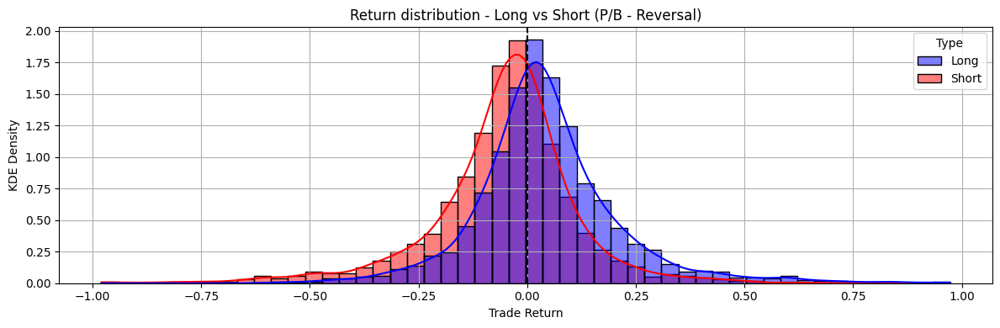

In [ ]:
long_trades_pb = closed_trades_pb_rev_df[closed_trades_pb_rev_df['Position'] == 'long']
short_trades_pb = closed_trades_pb_rev_df[closed_trades_pb_rev_df['Position'] == 'short']

long_trades_pb['Type'] = 'Long'
short_trades_pb['Type'] = 'Short'
combined_trades_pb = pd.concat([long_trades_pb, short_trades_pb], ignore_index=True)
combined_trades_pb = combined_trades_pb[combined_trades_pb['Trade Return'].between(-1, 1)]

plt.figure(figsize=(12, 4))
sns.histplot(data=combined_trades_pb, x='Trade Return', hue='Type', kde=True, stat='density', bins=50,
             palette={'Long': 'blue', 'Short': 'red'}, alpha=0.5)
plt.axvline(0, color='black', linestyle='--')
plt.title("Return distribution - Long vs Short (P/B - Reversal)")
plt.xlabel("Trade Return")
plt.ylabel("KDE Density")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
perf(long_trades_pb, "LONG positions (P/B)")
perf(short_trades_pb, "SHORT positions (P/B)")


 LONG positions (P/B)
Median return per trade: 2.94%
Median Annualized return : 12.05%
Mean days held : 158.4 days
Hit Ratio (positive trades) : 61.87%

 SHORT positions (P/B)
Median return per trade: -3.74%
Median Annualized return : -14.24%
Mean days held : 145.0 days
Hit Ratio (positive trades) : 35.54%


We also observe negative skewness for the distriution of short returns.

The latter also drag down the performance of the long positions, resulting in overall negative performance.

 ### 7.3 Both P/E and P/B Ratio

#### 7.3.1 Long only

We now combine signals from both the P/E and P/B Ratios to design joint trading strategies.

We identify the dates where both the P/E and P/B signals are aligned and create combined signals to guide our future trades.

For this long-only strategy, we only buy when both ratios signal undervaluation and we exit when they both signal overvaluation.

In [ ]:
# We merge the PE and PB signals and the Adjusted Closes
both_ratios_df = df_signals_pe[['date', 'Ticker', 'Raw_Signal', 'Classic_Signal']].rename(columns={'Raw_Signal': 'Raw_Signal_PE', 'Classic_Signal': 'Classic_Signal_PE'
}).merge(df_signals_pb[['date', 'Ticker', 'Raw_Signal', 'Classic_Signal']].rename(columns={'Raw_Signal': 'Raw_Signal_PB', 'Classic_Signal': 'Classic_Signal_PB'}),on=['date', 'Ticker'],how='inner')

both_ratios_df = both_ratios_df.merge(monthly_ratios.reset_index()[['date', 'Ticker', 'Adjusted Close']],on=['date', 'Ticker'],how='left').dropna(subset=['Adjusted Close'])

# We combine the signals
both_ratios_df['Combined_Classic'] = both_ratios_df.apply(
    lambda row: 1 if row['Classic_Signal_PE'] == 1 and row['Classic_Signal_PB'] == 1 else
                -1 if row['Classic_Signal_PE'] == -1 or row['Classic_Signal_PB'] == -1 else 0,axis=1)

both_ratios_df['Combined_Raw'] = both_ratios_df.apply(
    lambda row: 1 if row['Raw_Signal_PE'] == 1 and row['Raw_Signal_PB'] == 1 else
                -1 if row['Raw_Signal_PE'] == -1 and row['Raw_Signal_PB'] == -1 else 0,axis=1)

# We shift to avoid look-ahead bias
both_ratios_df[['Combined_Classic', 'Combined_Raw']] = both_ratios_df.groupby('Ticker')[['Combined_Classic', 'Combined_Raw']].shift(1)
both_ratios_df = both_ratios_df.dropna(subset=['Combined_Classic', 'Combined_Raw'])


both_ratios_df['Date'] = pd.to_datetime(both_ratios_df['date'])
both_ratios_df = both_ratios_df.sort_values(['Ticker', 'Date'])
both_ratios_df['Return'] = both_ratios_df.groupby('Ticker')['Adjusted Close'].pct_change()
both_ratios_df = both_ratios_df.dropna(subset=['Return'])
both_ratios_df = both_ratios_df.set_index('Date')
both_ratios_df['Signal_Text'] = both_ratios_df['Combined_Classic'].map({1: 'Buy', -1: 'Sell', 0: 'Hold'})

pnl_both_long_df = trading_long_only(both_ratios_df, signal_column='Signal_Text')

Processing Tickers:   2%|▏         | 9/595 [00:00<00:07, 77.14Ticker/s]

BUY  | A | 2016-07-31 | Price: 48.11
SELL | A | 2016-10-31 | Price: 43.57 | PnL: -4.54 | Cumul PnL: -4.54 | Return: -9.44% | Annualized: -32.73% | Days: 92 | Sharpe: -1.64
BUY  | A | 2019-03-31 | Price: 80.38
SELL | A | 2019-04-30 | Price: 78.50 | PnL: -1.88 | Cumul PnL: -6.42 | Return: -2.34% | Annualized: -24.72% | Days: 30 | Sharpe: -4.05
BUY  | A | 2019-08-31 | Price: 71.11
SELL | A | 2019-09-30 | Price: 76.63 | PnL: 5.52 | Cumul PnL: -0.90 | Return: 7.76% | Annualized: 145.25% | Days: 30 | Sharpe: 15.78
BUY  | A | 2020-08-31 | Price: 100.42
BUY  | AAP | 2020-01-31 | Price: 131.75
SELL | AAP | 2020-02-29 | Price: 132.98 | PnL: 1.23 | Cumul PnL: 1.23 | Return: 0.93% | Annualized: 11.80% | Days: 29 | Sharpe: 0.36
BUY  | AAP | 2021-04-30 | Price: 200.16
SELL | AAP | 2021-05-31 | Price: 189.73 | PnL: -10.43 | Cumul PnL: -9.20 | Return: -5.21% | Annualized: -47.39% | Days: 31 | Sharpe: -1.91
BUY  | AAPL | 2011-02-28 | Price: 12.61
SELL | AAPL | 2011-04-30 | Price: 12.50 | PnL: -0.11 | C

Processing Tickers:   4%|▍         | 24/595 [00:00<00:08, 63.99Ticker/s]

BUY  | ADT | 2015-04-30 | Price: 37.60
SELL | ADT | 2015-05-31 | Price: 36.48 | PnL: -1.12 | Cumul PnL: -1.12 | Return: -2.98% | Annualized: -30.43% | Days: 31 | Sharpe: -2.72
BUY  | AEE | 2015-09-30 | Price: 42.27
SELL | AEE | 2015-10-31 | Price: 43.68 | PnL: 1.41 | Cumul PnL: 1.41 | Return: 3.34% | Annualized: 48.25% | Days: 31 | Sharpe: 17.65
BUY  | AEE | 2016-05-31 | Price: 49.55
SELL | AEE | 2017-05-31 | Price: 56.75 | PnL: 7.20 | Cumul PnL: 8.61 | Return: 14.53% | Annualized: 14.53% | Days: 365 | Sharpe: 1.16
BUY  | AEE | 2020-09-30 | Price: 79.08
SELL | AEE | 2020-11-30 | Price: 77.78 | PnL: -1.30 | Cumul PnL: 7.31 | Return: -1.64% | Annualized: -9.47% | Days: 61 | Sharpe: -0.99
BUY  | AEP | 2015-06-30 | Price: 52.97
SELL | AEP | 2015-07-31 | Price: 56.57 | PnL: 3.60 | Cumul PnL: 3.60 | Return: 6.80% | Annualized: 120.13% | Days: 31 | Sharpe: 5.46
BUY  | AES | 2010-08-31 | Price: 10.24
SELL | AES | 2010-09-30 | Price: 11.35 | PnL: 1.11 | Cumul PnL: 1.11 | Return: 10.84% | Annual

Processing Tickers:   7%|▋         | 41/595 [00:00<00:08, 67.97Ticker/s]

BUY  | ALK | 2020-09-30 | Price: 36.63
SELL | ALK | 2020-12-31 | Price: 52.00 | PnL: 15.37 | Cumul PnL: 15.37 | Return: 41.96% | Annualized: 306.13% | Days: 92 | Sharpe: 5.72
BUY  | ALL | 2019-08-31 | Price: 102.39
SELL | ALL | 2019-10-31 | Price: 106.42 | PnL: 4.03 | Cumul PnL: 4.03 | Return: 3.94% | Annualized: 26.06% | Days: 61 | Sharpe: 1.63
BUY  | ALTR | 2010-08-31 | Price: 24.65
SELL | ALTR | 2010-10-31 | Price: 31.24 | PnL: 6.59 | Cumul PnL: 6.59 | Return: 26.73% | Annualized: 314.35% | Days: 61 | Sharpe: 6.63
BUY  | ALTR | 2010-11-30 | Price: 35.09
SELL | ALTR | 2010-12-31 | Price: 35.58 | PnL: 0.49 | Cumul PnL: 7.08 | Return: 1.40% | Annualized: 18.11% | Days: 31 | Sharpe: 0.96
BUY  | ALTR | 2011-05-31 | Price: 48.09
SELL | ALTR | 2011-07-31 | Price: 40.88 | PnL: -7.21 | Cumul PnL: -0.13 | Return: -14.99% | Annualized: -62.27% | Days: 61 | Sharpe: -3.98
BUY  | ALTR | 2013-10-31 | Price: 33.60
SELL | ALTR | 2014-01-31 | Price: 33.43 | PnL: -0.17 | Cumul PnL: -0.31 | Return: -0.

Processing Tickers:  10%|▉         | 57/595 [00:00<00:07, 72.03Ticker/s]

BUY  | AOS | 2020-12-31 | Price: 54.82
SELL | AOS | 2021-01-31 | Price: 54.30 | PnL: -0.52 | Cumul PnL: -0.52 | Return: -0.95% | Annualized: -10.81% | Days: 31 | Sharpe: -3.68
BUY  | APD | 2010-08-31 | Price: 67.32
SELL | APD | 2011-03-31 | Price: 82.01 | PnL: 14.69 | Cumul PnL: 14.69 | Return: 21.82% | Annualized: 40.26% | Days: 212 | Sharpe: 2.53
BUY  | APD | 2011-04-30 | Price: 86.87
SELL | APD | 2011-06-30 | Price: 86.92 | PnL: 0.05 | Cumul PnL: 14.74 | Return: 0.06% | Annualized: 0.38% | Days: 61 | Sharpe: 0.04
BUY  | APD | 2011-07-31 | Price: 80.69
SELL | APD | 2011-10-31 | Price: 78.34 | PnL: -2.36 | Cumul PnL: 12.39 | Return: -2.92% | Annualized: -11.17% | Days: 92 | Sharpe: -0.37
BUY  | APD | 2013-09-30 | Price: 96.92
SELL | APD | 2013-10-31 | Price: 99.14 | PnL: 2.22 | Cumul PnL: 14.61 | Return: 2.29% | Annualized: 31.21% | Days: 31 | Sharpe: 8.80
BUY  | APD | 2015-12-31 | Price: 118.33
SELL | APD | 2016-01-31 | Price: 115.23 | PnL: -3.09 | Cumul PnL: 11.51 | Return: -2.61% |

Processing Tickers:  12%|█▏        | 72/595 [00:01<00:08, 63.75Ticker/s]

BUY  | AXP | 2012-08-31 | Price: 58.30
SELL | AXP | 2013-02-28 | Price: 62.15 | PnL: 3.85 | Cumul PnL: 3.85 | Return: 6.60% | Annualized: 13.64% | Days: 181 | Sharpe: 1.52
BUY  | AXP | 2013-03-31 | Price: 67.46
SELL | AXP | 2013-05-31 | Price: 75.71 | PnL: 8.25 | Cumul PnL: 12.10 | Return: 12.23% | Annualized: 99.82% | Days: 61 | Sharpe: 7.27
BUY  | AXP | 2016-05-31 | Price: 65.76
SELL | AXP | 2017-03-31 | Price: 79.11 | PnL: 13.35 | Cumul PnL: 25.45 | Return: 20.30% | Annualized: 24.83% | Days: 304 | Sharpe: 1.70
BUY  | AXP | 2019-03-31 | Price: 109.30
SELL | AXP | 2019-04-30 | Price: 117.23 | PnL: 7.93 | Cumul PnL: 33.38 | Return: 7.26% | Annualized: 131.75% | Days: 30 | Sharpe: 13.10
BUY  | AXP | 2019-05-31 | Price: 114.71
SELL | AXP | 2019-06-30 | Price: 123.44 | PnL: 8.73 | Cumul PnL: 42.11 | Return: 7.61% | Annualized: 141.13% | Days: 30 | Sharpe: 8.35
BUY  | BA | 2013-04-30 | Price: 91.41
SELL | BA | 2013-05-31 | Price: 99.02 | PnL: 7.61 | Cumul PnL: 7.61 | Return: 8.33% | Annua

Processing Tickers:  13%|█▎        | 79/595 [00:01<00:09, 56.36Ticker/s]

BUY  | BHI | 2010-08-31 | Price: 37.58
SELL | BHI | 2010-10-31 | Price: 46.42 | PnL: 8.84 | Cumul PnL: 8.84 | Return: 23.52% | Annualized: 255.21% | Days: 61 | Sharpe: 4.66
BUY  | BHI | 2012-05-31 | Price: 41.73
SELL | BHI | 2012-06-30 | Price: 41.10 | PnL: -0.63 | Cumul PnL: 8.21 | Return: -1.51% | Annualized: -16.69% | Days: 30 | Sharpe: -2.48
BUY  | BHI | 2016-10-31 | Price: 55.40
SELL | BHI | 2016-11-30 | Price: 64.33 | PnL: 8.93 | Cumul PnL: 17.14 | Return: 16.12% | Annualized: 500.96% | Days: 30 | Sharpe: 45.54
BUY  | BIIB | 2012-06-30 | Price: 133.06
SELL | BIIB | 2013-05-31 | Price: 218.86 | PnL: 85.81 | Cumul PnL: 85.81 | Return: 64.49% | Annualized: 72.10% | Days: 335 | Sharpe: 3.25
BUY  | BIIB | 2013-07-31 | Price: 201.02
SELL | BIIB | 2014-05-31 | Price: 294.32 | PnL: 93.30 | Cumul PnL: 179.11 | Return: 46.41% | Annualized: 58.01% | Days: 304 | Sharpe: 1.88
BUY  | BIIB | 2016-05-31 | Price: 267.00
SELL | BIIB | 2016-09-30 | Price: 288.48 | PnL: 21.47 | Cumul PnL: 200.58 | R

Processing Tickers:  15%|█▌        | 91/595 [00:01<00:10, 47.59Ticker/s]

BUY  | BRCM | 2012-05-31 | Price: 32.35
SELL | BRCM | 2012-06-30 | Price: 33.76 | PnL: 1.41 | Cumul PnL: 1.41 | Return: 4.36% | Annualized: 66.85% | Days: 30 | Sharpe: 2.42
BUY  | BRK | 2014-08-31 | Price: 137.25
SELL | BRK | 2014-09-30 | Price: 138.14 | PnL: 0.89 | Cumul PnL: 0.89 | Return: 0.65% | Annualized: 8.07% | Days: 30 | Sharpe: 0.53
BUY  | BRK | 2021-02-28 | Price: 240.51
BUY  | BSX | 2011-05-31 | Price: 7.18
SELL | BSX | 2012-03-31 | Price: 5.98 | PnL: -1.20 | Cumul PnL: -1.20 | Return: -16.71% | Annualized: -19.70% | Days: 305 | Sharpe: -0.88
BUY  | BTU | 2012-05-31 | Price: 350.40
SELL | BTU | 2012-09-30 | Price: 334.35 | PnL: -16.05 | Cumul PnL: -16.05 | Return: -4.58% | Annualized: -13.12% | Days: 122 | Sharpe: -0.31
BUY  | BWA | 2017-03-31 | Price: 35.71
SELL | BWA | 2017-04-30 | Price: 36.13 | PnL: 0.42 | Cumul PnL: 0.42 | Return: 1.17% | Annualized: 15.01% | Days: 30 | Sharpe: 4.09
BUY  | BWA | 2019-03-31 | Price: 32.82
SELL | BWA | 2019-05-31 | Price: 30.32 | PnL: -2

Processing Tickers:  16%|█▌        | 96/595 [00:01<00:11, 45.05Ticker/s]

BUY  | CAG | 2011-06-30 | Price: 19.93
SELL | CAG | 2012-05-31 | Price: 19.42 | PnL: -0.51 | Cumul PnL: -0.51 | Return: -2.56% | Annualized: -2.79% | Days: 336 | Sharpe: -0.31
BUY  | CAG | 2012-07-31 | Price: 19.07
SELL | CAG | 2013-05-31 | Price: 26.02 | PnL: 6.95 | Cumul PnL: 6.44 | Return: 36.45% | Annualized: 45.20% | Days: 304 | Sharpe: 2.53
BUY  | CAG | 2015-06-30 | Price: 33.77
SELL | CAG | 2015-12-31 | Price: 32.56 | PnL: -1.20 | Cumul PnL: 5.24 | Return: -3.57% | Annualized: -7.01% | Days: 184 | Sharpe: -0.37
BUY  | CAG | 2019-05-31 | Price: 26.77
SELL | CAG | 2019-09-30 | Price: 30.68 | PnL: 3.91 | Cumul PnL: 9.15 | Return: 14.61% | Annualized: 50.53% | Days: 122 | Sharpe: 1.83
BUY  | CAH | 2010-09-30 | Price: 33.04
SELL | CAH | 2011-01-31 | Price: 41.51 | PnL: 8.47 | Cumul PnL: 8.47 | Return: 25.64% | Annualized: 98.31% | Days: 123 | Sharpe: 10.51
BUY  | CAH | 2011-02-28 | Price: 41.64
SELL | CAH | 2011-04-30 | Price: 43.69 | PnL: 2.05 | Cumul PnL: 10.52 | Return: 4.92% | An

Processing Tickers:  19%|█▊        | 111/595 [00:01<00:10, 46.11Ticker/s]

BUY  | CELG | 2016-04-30 | Price: 103.41
SELL | CELG | 2016-05-31 | Price: 105.52 | PnL: 2.11 | Cumul PnL: 2.11 | Return: 2.04% | Annualized: 27.43% | Days: 31 | Sharpe: 12.40
BUY  | CELG | 2018-05-31 | Price: 78.68
SELL | CELG | 2018-11-30 | Price: 72.22 | PnL: -6.46 | Cumul PnL: -4.35 | Return: -8.21% | Annualized: -15.75% | Days: 183 | Sharpe: -0.46
BUY  | CELG | 2018-12-31 | Price: 64.09
SELL | CELG | 2019-02-28 | Price: 83.12 | PnL: 19.03 | Cumul PnL: 14.68 | Return: 29.69% | Annualized: 375.87% | Days: 59 | Sharpe: 4.91
BUY  | CERN | 2016-08-31 | Price: 64.54
SELL | CERN | 2016-10-31 | Price: 58.58 | PnL: -5.96 | Cumul PnL: -5.96 | Return: -9.23% | Annualized: -44.09% | Days: 61 | Sharpe: -3.29
BUY  | CERN | 2017-08-31 | Price: 67.78
SELL | CERN | 2017-09-30 | Price: 71.32 | PnL: 3.54 | Cumul PnL: -2.42 | Return: 5.22% | Annualized: 84.21% | Days: 30 | Sharpe: 650.70
BUY  | CERN | 2019-01-31 | Price: 54.91
SELL | CERN | 2019-03-31 | Price: 57.21 | PnL: 2.30 | Cumul PnL: -0.12 | R

Processing Tickers:  20%|██        | 121/595 [00:02<00:10, 43.37Ticker/s]

BUY  | CLF | 2013-04-30 | Price: 21.34
SELL | CLF | 2013-05-31 | Price: 18.04 | PnL: -3.30 | Cumul PnL: -3.30 | Return: -15.46% | Annualized: -86.68% | Days: 31 | Sharpe: -1.81
BUY  | CLX | 2014-05-31 | Price: 89.62
SELL | CLX | 2014-07-31 | Price: 86.87 | PnL: -2.75 | Cumul PnL: -2.75 | Return: -3.07% | Annualized: -17.06% | Days: 61 | Sharpe: -1.74
BUY  | CLX | 2019-02-28 | Price: 158.03
SELL | CLX | 2019-03-31 | Price: 160.46 | PnL: 2.43 | Cumul PnL: -0.32 | Return: 1.54% | Annualized: 20.10% | Days: 31 | Sharpe: 2.34
BUY  | CLX | 2019-05-31 | Price: 148.81
SELL | CLX | 2019-06-30 | Price: 153.11 | PnL: 4.30 | Cumul PnL: 3.98 | Return: 2.89% | Annualized: 40.75% | Days: 30 | Sharpe: 2.42
BUY  | CMA | 2013-04-30 | Price: 36.25
SELL | CMA | 2013-05-31 | Price: 39.49 | PnL: 3.24 | Cumul PnL: 3.24 | Return: 8.94% | Annualized: 179.35% | Days: 31 | Sharpe: 12.78
BUY  | CMA | 2015-04-30 | Price: 47.41
SELL | CMA | 2015-07-31 | Price: 47.43 | PnL: 0.02 | Cumul PnL: 3.26 | Return: 0.04% | A

Processing Tickers:  22%|██▏       | 131/595 [00:02<00:11, 39.70Ticker/s]

BUY  | CNP | 2012-11-30 | Price: 19.73
SELL | CNP | 2012-12-31 | Price: 19.25 | PnL: -0.48 | Cumul PnL: -0.48 | Return: -2.43% | Annualized: -25.59% | Days: 31 | Sharpe: -2.27
BUY  | CNP | 2014-08-31 | Price: 24.84
SELL | CNP | 2014-09-30 | Price: 24.47 | PnL: -0.37 | Cumul PnL: -0.85 | Return: -1.49% | Annualized: -16.48% | Days: 30 | Sharpe: -2.62
BUY  | CNX | 2011-12-31 | Price: 30.21
SELL | CNX | 2012-01-31 | Price: 29.42 | PnL: -0.79 | Cumul PnL: -0.79 | Return: -2.62% | Annualized: -27.25% | Days: 31 | Sharpe: -1.70
BUY  | CNX | 2012-03-31 | Price: 28.07
SELL | CNX | 2012-09-30 | Price: 24.73 | PnL: -3.33 | Cumul PnL: -4.12 | Return: -11.88% | Annualized: -22.34% | Days: 183 | Sharpe: -0.94
BUY  | COF | 2012-05-31 | Price: 51.37
SELL | COF | 2012-06-30 | Price: 54.66 | PnL: 3.29 | Cumul PnL: 3.29 | Return: 6.40% | Annualized: 110.63% | Days: 30 | Sharpe: 4.62
BUY  | COF | 2012-08-31 | Price: 56.53
SELL | COF | 2012-11-30 | Price: 57.60 | PnL: 1.07 | Cumul PnL: 4.36 | Return: 1.89

Processing Tickers:  24%|██▎       | 141/595 [00:02<00:10, 41.55Ticker/s]

SELL | COP | 2019-09-30 | Price: 56.98 | PnL: 4.80 | Cumul PnL: -26.51 | Return: 9.20% | Annualized: 187.49% | Days: 30 | Sharpe: 5.18
BUY  | COST | 2017-10-31 | Price: 161.08
SELL | COST | 2018-05-31 | Price: 198.24 | PnL: 37.16 | Cumul PnL: 37.16 | Return: 23.07% | Annualized: 42.74% | Days: 212 | Sharpe: 2.38
BUY  | COST | 2018-10-31 | Price: 228.63
SELL | COST | 2019-04-30 | Price: 245.53 | PnL: 16.90 | Cumul PnL: 54.06 | Return: 7.39% | Annualized: 15.33% | Days: 181 | Sharpe: 0.68
BUY  | COST | 2019-08-31 | Price: 294.76
SELL | COST | 2019-09-30 | Price: 288.11 | PnL: -6.65 | Cumul PnL: 47.41 | Return: -2.26% | Annualized: -23.95% | Days: 30 | Sharpe: -1.50
BUY  | COST | 2020-07-31 | Price: 325.53
SELL | COST | 2020-08-31 | Price: 347.66 | PnL: 22.13 | Cumul PnL: 69.54 | Return: 6.80% | Annualized: 120.17% | Days: 31 | Sharpe: 123.22
BUY  | CPB | 2012-05-31 | Price: 31.70
SELL | CPB | 2012-06-30 | Price: 33.38 | PnL: 1.68 | Cumul PnL: 1.68 | Return: 5.30% | Annualized: 85.83% | D

Processing Tickers:  25%|██▍       | 146/595 [00:02<00:11, 38.08Ticker/s]

BUY  | CTAS | 2011-01-31 | Price: 7.01
SELL | CTAS | 2011-02-28 | Price: 7.03 | PnL: 0.02 | Cumul PnL: 0.02 | Return: 0.21% | Annualized: 2.60% | Days: 28 | Sharpe: 10.42
BUY  | CTAS | 2011-03-31 | Price: 7.57
SELL | CTAS | 2011-05-31 | Price: 8.21 | PnL: 0.64 | Cumul PnL: 0.66 | Return: 8.50% | Annualized: 63.11% | Days: 61 | Sharpe: 8.61
BUY  | CTAS | 2016-09-30 | Price: 28.15
SELL | CTAS | 2017-05-31 | Price: 31.47 | PnL: 3.32 | Cumul PnL: 3.98 | Return: 11.79% | Annualized: 18.20% | Days: 243 | Sharpe: 1.22
BUY  | CTAS | 2018-08-31 | Price: 53.34
SELL | CTAS | 2019-02-28 | Price: 51.65 | PnL: -1.69 | Cumul PnL: 2.29 | Return: -3.17% | Annualized: -6.25% | Days: 181 | Sharpe: -0.22
BUY  | CTAS | 2020-06-30 | Price: 66.59
SELL | CTAS | 2020-07-31 | Price: 75.47 | PnL: 8.88 | Cumul PnL: 11.16 | Return: 13.33% | Annualized: 348.96% | Days: 31 | Sharpe: 34.08
BUY  | CTAS | 2020-10-31 | Price: 78.64
BUY  | CTL | 2014-05-31 | Price: 37.67
SELL | CTL | 2014-07-31 | Price: 39.24 | PnL: 1.57

Processing Tickers:  26%|██▌       | 155/595 [00:03<00:10, 40.45Ticker/s]

BUY  | D | 2013-08-31 | Price: 58.35
SELL | D | 2013-10-31 | Price: 63.75 | PnL: 5.40 | Cumul PnL: 5.40 | Return: 9.25% | Annualized: 70.07% | Days: 61 | Sharpe: 5.67
BUY  | D | 2016-07-31 | Price: 78.02
SELL | D | 2016-09-30 | Price: 74.27 | PnL: -3.75 | Cumul PnL: 1.65 | Return: -4.81% | Annualized: -25.59% | Days: 61 | Sharpe: -3.08
BUY  | D | 2019-05-31 | Price: 75.18
SELL | D | 2019-06-30 | Price: 77.32 | PnL: 2.14 | Cumul PnL: 3.79 | Return: 2.85% | Annualized: 40.05% | Days: 30 | Sharpe: 3.67
BUY  | D | 2020-11-30 | Price: 78.49
SELL | D | 2020-12-31 | Price: 75.20 | PnL: -3.29 | Cumul PnL: 0.50 | Return: -4.19% | Annualized: -40.18% | Days: 31 | Sharpe: -12.28
BUY  | DAL | 2019-11-30 | Price: 57.31
SELL | DAL | 2019-12-31 | Price: 58.48 | PnL: 1.17 | Cumul PnL: 1.17 | Return: 2.04% | Annualized: 27.45% | Days: 31 | Sharpe: 7.89
BUY  | DAL | 2020-03-31 | Price: 28.53
SELL | DAL | 2020-05-31 | Price: 25.21 | PnL: -3.32 | Cumul PnL: -2.15 | Return: -11.64% | Annualized: -52.40% | 

Processing Tickers:  28%|██▊       | 166/595 [00:03<00:10, 42.17Ticker/s]

BUY  | DGX | 2018-10-31 | Price: 94.11
SELL | DGX | 2018-11-30 | Price: 88.57 | PnL: -5.54 | Cumul PnL: -1.30 | Return: -5.89% | Annualized: -51.72% | Days: 30 | Sharpe: -4.33
BUY  | DGX | 2019-05-31 | Price: 95.91
SELL | DGX | 2019-07-31 | Price: 102.08 | PnL: 6.17 | Cumul PnL: 4.87 | Return: 6.43% | Annualized: 45.37% | Days: 61 | Sharpe: 4.41
BUY  | DGX | 2020-06-30 | Price: 113.96
BUY  | DHI | 2017-05-31 | Price: 32.69
SELL | DHI | 2017-09-30 | Price: 39.93 | PnL: 7.24 | Cumul PnL: 7.24 | Return: 22.15% | Annualized: 82.24% | Days: 122 | Sharpe: 6.18
BUY  | DHI | 2019-05-31 | Price: 42.76
SELL | DHI | 2019-12-31 | Price: 52.75 | PnL: 9.99 | Cumul PnL: 17.23 | Return: 23.36% | Annualized: 43.32% | Days: 214 | Sharpe: 2.72
BUY  | DHI | 2020-06-30 | Price: 55.45
SELL | DHI | 2020-07-31 | Price: 66.16 | PnL: 10.71 | Cumul PnL: 27.94 | Return: 19.31% | Annualized: 732.39% | Days: 31 | Sharpe: 22.20
BUY  | DHR | 2011-11-30 | Price: 32.80
SELL | DHR | 2012-01-31 | Price: 35.60 | PnL: 2.80

Processing Tickers:  30%|██▉       | 176/595 [00:03<00:09, 42.17Ticker/s]

BUY  | DOV | 2012-05-31 | Price: 37.50
SELL | DOV | 2012-08-31 | Price: 38.33 | PnL: 0.83 | Cumul PnL: 0.83 | Return: 2.21% | Annualized: 9.14% | Days: 92 | Sharpe: 0.43
BUY  | DOV | 2013-02-28 | Price: 48.64
SELL | DOV | 2013-03-31 | Price: 48.33 | PnL: -0.31 | Cumul PnL: 0.52 | Return: -0.64% | Annualized: -7.42% | Days: 31 | Sharpe: -0.64
BUY  | DOV | 2013-07-31 | Price: 56.79
SELL | DOV | 2013-08-31 | Price: 56.40 | PnL: -0.39 | Cumul PnL: 0.13 | Return: -0.69% | Annualized: -7.96% | Days: 31 | Sharpe: -0.42
BUY  | DOV | 2014-06-30 | Price: 71.84
SELL | DOV | 2014-08-31 | Price: 69.41 | PnL: -2.43 | Cumul PnL: -2.31 | Return: -3.39% | Annualized: -18.67% | Days: 62 | Sharpe: -1.24
BUY  | DOV | 2017-11-30 | Price: 77.18
SELL | DOV | 2018-06-30 | Price: 73.20 | PnL: -3.98 | Cumul PnL: -6.29 | Return: -5.15% | Annualized: -8.67% | Days: 212 | Sharpe: -0.55
BUY  | DOV | 2020-06-30 | Price: 96.56
SELL | DOV | 2020-08-31 | Price: 109.84 | PnL: 13.28 | Cumul PnL: 6.99 | Return: 13.75% | A

Processing Tickers:  30%|███       | 181/595 [00:03<00:09, 41.76Ticker/s]

BUY  | DVN | 2020-05-31 | Price: 10.81
SELL | DVN | 2020-06-30 | Price: 11.34 | PnL: 0.53 | Cumul PnL: 0.53 | Return: 4.90% | Annualized: 77.60% | Days: 30 | Sharpe: 2.46
BUY  | EA | 2020-04-30 | Price: 114.26
SELL | EA | 2020-07-31 | Price: 141.62 | PnL: 27.36 | Cumul PnL: 27.36 | Return: 23.95% | Annualized: 136.01% | Days: 92 | Sharpe: 13.63
BUY  | EBAY | 2016-03-31 | Price: 23.86
SELL | EBAY | 2016-05-31 | Price: 24.46 | PnL: 0.60 | Cumul PnL: 0.60 | Return: 2.51% | Annualized: 16.07% | Days: 61 | Sharpe: 4.46
BUY  | EBAY | 2016-09-30 | Price: 32.90
SELL | EBAY | 2016-10-31 | Price: 28.51 | PnL: -4.39 | Cumul PnL: -3.79 | Return: -13.34% | Annualized: -82.07% | Days: 31 | Sharpe: -3.03
BUY  | EBAY | 2019-07-31 | Price: 41.19
SELL | EBAY | 2020-05-31 | Price: 45.54 | PnL: 4.35 | Cumul PnL: 0.56 | Return: 10.56% | Annualized: 12.80% | Days: 305 | Sharpe: 0.31
BUY  | ECL | 2010-09-30 | Price: 50.74
SELL | ECL | 2010-11-30 | Price: 47.81 | PnL: -2.93 | Cumul PnL: -2.93 | Return: -5.77%

Processing Tickers:  32%|███▏      | 190/595 [00:03<00:10, 38.53Ticker/s]

BUY  | EMC | 2010-07-31 | Price: 19.79
SELL | EMC | 2010-08-31 | Price: 18.24 | PnL: -1.55 | Cumul PnL: -1.55 | Return: -7.83% | Annualized: -62.42% | Days: 31 | Sharpe: -2.26
BUY  | EMC | 2013-08-31 | Price: 25.78
SELL | EMC | 2013-09-30 | Price: 25.56 | PnL: -0.22 | Cumul PnL: -1.77 | Return: -0.85% | Annualized: -9.77% | Days: 30 | Sharpe: -10.05
BUY  | EMC | 2014-07-31 | Price: 29.30
SELL | EMC | 2014-10-31 | Price: 28.73 | PnL: -0.57 | Cumul PnL: -2.34 | Return: -1.95% | Annualized: -7.56% | Days: 92 | Sharpe: -0.42
BUY  | EMC | 2015-04-30 | Price: 26.91
SELL | EMC | 2015-05-31 | Price: 26.34 | PnL: -0.57 | Cumul PnL: -2.91 | Return: -2.12% | Annualized: -22.66% | Days: 31 | Sharpe: -1.77
BUY  | EMC | 2015-06-30 | Price: 26.39
SELL | EMC | 2015-08-31 | Price: 24.87 | PnL: -1.52 | Cumul PnL: -4.43 | Return: -5.76% | Annualized: -29.95% | Days: 62 | Sharpe: -2.11
BUY  | EMC | 2015-11-30 | Price: 25.34
SELL | EMC | 2016-01-31 | Price: 24.77 | PnL: -0.57 | Cumul PnL: -5.00 | Return: -

Processing Tickers:  34%|███▎      | 200/595 [00:04<00:09, 42.19Ticker/s]

BUY  | ES | 2019-10-31 | Price: 83.74
SELL | ES | 2020-06-30 | Price: 83.27 | PnL: -0.47 | Cumul PnL: -0.47 | Return: -0.56% | Annualized: -0.84% | Days: 243 | Sharpe: -0.05
BUY  | ETFC | 2016-05-31 | Price: 27.89
SELL | ETFC | 2016-08-31 | Price: 26.38 | PnL: -1.51 | Cumul PnL: -1.51 | Return: -5.41% | Annualized: -19.96% | Days: 92 | Sharpe: -0.56
BUY  | ETFC | 2019-08-31 | Price: 41.74
SELL | ETFC | 2019-09-30 | Price: 43.69 | PnL: 1.95 | Cumul PnL: 0.44 | Return: 4.67% | Annualized: 72.96% | Days: 30 | Sharpe: 2.20
BUY  | ETR | 2012-05-31 | Price: 32.27
SELL | ETR | 2012-08-31 | Price: 34.04 | PnL: 1.77 | Cumul PnL: 1.77 | Return: 5.50% | Annualized: 23.89% | Days: 92 | Sharpe: 1.29
BUY  | ETR | 2012-11-30 | Price: 31.77
SELL | ETR | 2013-01-31 | Price: 32.30 | PnL: 0.53 | Cumul PnL: 2.30 | Return: 1.67% | Annualized: 10.44% | Days: 62 | Sharpe: 0.48
BUY  | EVRG | 2021-06-30 | Price: 60.43
SELL | EVRG | 2021-07-31 | Price: 65.22 | PnL: 4.79 | Cumul PnL: 4.79 | Return: 7.93% | Annua

Processing Tickers:  35%|███▌      | 210/595 [00:04<00:09, 40.78Ticker/s]

BUY  | EXPE | 2017-08-31 | Price: 148.36
SELL | EXPE | 2017-10-31 | Price: 124.66 | PnL: -23.70 | Cumul PnL: -23.70 | Return: -15.97% | Annualized: -64.81% | Days: 61 | Sharpe: -4.17
BUY  | EXPE | 2018-05-31 | Price: 121.03
SELL | EXPE | 2018-06-30 | Price: 120.19 | PnL: -0.84 | Cumul PnL: -24.54 | Return: -0.69% | Annualized: -8.02% | Days: 30 | Sharpe: -0.80
BUY  | EXPE | 2019-02-28 | Price: 123.31
SELL | EXPE | 2019-03-31 | Price: 119.00 | PnL: -4.31 | Cumul PnL: -28.85 | Return: -3.50% | Annualized: -34.75% | Days: 31 | Sharpe: -2.91
BUY  | EXR | 2020-07-31 | Price: 103.34
SELL | EXR | 2020-08-31 | Price: 106.55 | PnL: 3.21 | Cumul PnL: 3.21 | Return: 3.11% | Annualized: 44.35% | Days: 31 | Sharpe: 2.92
BUY  | F | 2014-12-31 | Price: 15.50
SELL | F | 2015-01-31 | Price: 14.71 | PnL: -0.79 | Cumul PnL: -0.79 | Return: -5.10% | Annualized: -46.62% | Days: 31 | Sharpe: -7.41
BUY  | F | 2016-08-31 | Price: 12.60
SELL | F | 2016-10-31 | Price: 11.74 | PnL: -0.86 | Cumul PnL: -1.65 | Ret

Processing Tickers:  37%|███▋      | 220/595 [00:04<00:09, 40.31Ticker/s]

BUY  | FE | 2012-08-31 | Price: 43.70
SELL | FE | 2012-09-30 | Price: 44.10 | PnL: 0.40 | Cumul PnL: 0.40 | Return: 0.92% | Annualized: 11.55% | Days: 30 | Sharpe: 0.48
BUY  | FE | 2020-10-31 | Price: 29.72
SELL | FE | 2020-11-30 | Price: 26.56 | PnL: -3.16 | Cumul PnL: -2.76 | Return: -10.63% | Annualized: -74.05% | Days: 30 | Sharpe: -3.02
BUY  | FFIV | 2014-04-30 | Price: 105.17
SELL | FFIV | 2014-05-31 | Price: 108.55 | PnL: 3.38 | Cumul PnL: 3.38 | Return: 3.21% | Annualized: 46.17% | Days: 31 | Sharpe: 5.82
BUY  | FFIV | 2015-04-30 | Price: 122.02
SELL | FFIV | 2015-05-31 | Price: 125.69 | PnL: 3.67 | Cumul PnL: 7.05 | Return: 3.01% | Annualized: 42.70% | Days: 31 | Sharpe: 7.82
BUY  | FFIV | 2016-11-30 | Price: 140.75
SELL | FFIV | 2017-01-31 | Price: 134.03 | PnL: -6.72 | Cumul PnL: 0.33 | Return: -4.77% | Annualized: -25.44% | Days: 62 | Sharpe: -1.60
BUY  | FFIV | 2017-07-31 | Price: 120.75
SELL | FFIV | 2017-08-31 | Price: 119.38 | PnL: -1.37 | Cumul PnL: -1.04 | Return: -1.

Processing Tickers:  39%|███▉      | 233/595 [00:04<00:07, 49.88Ticker/s]

BUY  | FLIR | 2015-11-30 | Price: 30.56
SELL | FLIR | 2016-01-31 | Price: 29.24 | PnL: -1.32 | Cumul PnL: -0.61 | Return: -4.32% | Annualized: -23.27% | Days: 62 | Sharpe: -0.72
BUY  | FLIR | 2016-05-31 | Price: 31.15
SELL | FLIR | 2016-06-30 | Price: 30.95 | PnL: -0.20 | Cumul PnL: -0.81 | Return: -0.64% | Annualized: -7.44% | Days: 30 | Sharpe: -1.14
BUY  | FLIR | 2019-06-30 | Price: 54.10
SELL | FLIR | 2019-07-31 | Price: 49.66 | PnL: -4.44 | Cumul PnL: -5.25 | Return: -8.21% | Annualized: -64.21% | Days: 31 | Sharpe: -1.84
BUY  | FLR | 2011-12-31 | Price: 50.25
SELL | FLR | 2012-01-31 | Price: 56.24 | PnL: 5.99 | Cumul PnL: 5.99 | Return: 11.92% | Annualized: 286.29% | Days: 31 | Sharpe: 8.16
BUY  | FLR | 2012-08-31 | Price: 51.50
SELL | FLR | 2012-11-30 | Price: 53.08 | PnL: 1.58 | Cumul PnL: 7.57 | Return: 3.07% | Annualized: 12.85% | Days: 91 | Sharpe: 0.70
BUY  | FLS | 2012-02-29 | Price: 39.52
SELL | FLS | 2012-05-31 | Price: 34.26 | PnL: -5.26 | Cumul PnL: -5.26 | Return: -13

Processing Tickers:  42%|████▏     | 247/595 [00:05<00:05, 58.75Ticker/s]

BUY  | FTV | 2020-03-31 | Price: 47.53
SELL | FTV | 2020-04-30 | Price: 55.12 | PnL: 7.59 | Cumul PnL: 7.59 | Return: 15.96% | Annualized: 491.34% | Days: 30 | Sharpe: 7.84
BUY  | FTV | 2020-12-31 | Price: 70.82
SELL | FTV | 2021-01-31 | Price: 66.08 | PnL: -4.74 | Cumul PnL: 2.85 | Return: -6.69% | Annualized: -56.45% | Days: 31 | Sharpe: -4.25
BUY  | GAS | 2010-08-31 | Price: 42.29
SELL | GAS | 2010-12-31 | Price: 49.92 | PnL: 7.63 | Cumul PnL: 7.63 | Return: 18.04% | Annualized: 64.48% | Days: 122 | Sharpe: 2.15
BUY  | GAS | 2011-02-28 | Price: 52.74
SELL | GAS | 2011-03-31 | Price: 53.70 | PnL: 0.96 | Cumul PnL: 8.59 | Return: 1.82% | Annualized: 24.17% | Days: 31 | Sharpe: 5.21
BUY  | GD | 2011-10-31 | Price: 64.19
SELL | GD | 2011-11-30 | Price: 66.06 | PnL: 1.87 | Cumul PnL: 1.87 | Return: 2.91% | Annualized: 41.14% | Days: 30 | Sharpe: 2.39
BUY  | GD | 2019-01-31 | Price: 171.17
SELL | GD | 2019-02-28 | Price: 170.22 | PnL: -0.95 | Cumul PnL: 0.92 | Return: -0.56% | Annualized:

Processing Tickers:  44%|████▎     | 260/595 [00:05<00:05, 60.50Ticker/s]

BUY  | GPS | 2018-02-28 | Price: 31.58
SELL | GPS | 2018-05-31 | Price: 27.98 | PnL: -3.60 | Cumul PnL: -8.12 | Return: -11.40% | Annualized: -38.38% | Days: 92 | Sharpe: -5.93
BUY  | GPS | 2020-05-31 | Price: 8.90
SELL | GPS | 2020-06-30 | Price: 12.62 | PnL: 3.72 | Cumul PnL: -4.40 | Return: 41.80% | Annualized: 6507.42% | Days: 30 | Sharpe: 116.71
BUY  | GR | 2011-11-30 | Price: 122.01
BUY  | GS | 2015-08-31 | Price: 188.60
SELL | GS | 2015-09-30 | Price: 173.76 | PnL: -14.84 | Cumul PnL: -14.84 | Return: -7.87% | Annualized: -62.60% | Days: 30 | Sharpe: -221.87
BUY  | GS | 2015-12-31 | Price: 180.23
SELL | GS | 2016-01-31 | Price: 161.56 | PnL: -18.67 | Cumul PnL: -33.51 | Return: -10.36% | Annualized: -73.08% | Days: 31 | Sharpe: -8.10
BUY  | GS | 2016-04-30 | Price: 164.11
SELL | GS | 2016-05-31 | Price: 159.48 | PnL: -4.63 | Cumul PnL: -38.14 | Return: -2.82% | Annualized: -29.07% | Days: 31 | Sharpe: -2.28
BUY  | GT | 2015-08-31 | Price: 29.77
SELL | GT | 2016-05-31 | Price: 27

Processing Tickers:  46%|████▌     | 275/595 [00:05<00:04, 64.01Ticker/s]

BUY  | HOG | 2014-10-31 | Price: 65.70
SELL | HOG | 2014-12-31 | Price: 65.91 | PnL: 0.21 | Cumul PnL: 0.21 | Return: 0.32% | Annualized: 1.93% | Days: 61 | Sharpe: 0.07
BUY  | HOG | 2019-05-31 | Price: 32.72
SELL | HOG | 2019-11-30 | Price: 36.38 | PnL: 3.66 | Cumul PnL: 3.87 | Return: 11.19% | Annualized: 23.62% | Days: 183 | Sharpe: 0.72
BUY  | HON | 2011-11-30 | Price: 51.68
SELL | HON | 2012-01-31 | Price: 55.39 | PnL: 3.71 | Cumul PnL: 3.71 | Return: 7.18% | Annualized: 51.63% | Days: 62 | Sharpe: 5.68
BUY  | HON | 2020-11-30 | Price: 203.92
BUY  | HOT | 2010-11-30 | Price: 52.43
SELL | HOT | 2011-01-31 | Price: 54.39 | PnL: 1.96 | Cumul PnL: 1.96 | Return: 3.75% | Annualized: 24.70% | Days: 62 | Sharpe: 1.66
BUY  | HOT | 2014-01-31 | Price: 68.91
SELL | HOT | 2014-05-31 | Price: 73.65 | PnL: 4.74 | Cumul PnL: 6.71 | Return: 6.88% | Annualized: 22.09% | Days: 120 | Sharpe: 1.05
BUY  | HOT | 2014-11-30 | Price: 72.87
SELL | HOT | 2015-01-31 | Price: 66.38 | PnL: -6.48 | Cumul PnL:

Processing Tickers:  49%|████▊     | 289/595 [00:05<00:05, 60.18Ticker/s]

BUY  | HUM | 2011-06-30 | Price: 80.54
SELL | HUM | 2012-05-31 | Price: 76.39 | PnL: -4.15 | Cumul PnL: -4.15 | Return: -5.15% | Annualized: -5.61% | Days: 336 | Sharpe: -0.22
BUY  | HUM | 2012-10-31 | Price: 74.27
SELL | HUM | 2012-11-30 | Price: 65.41 | PnL: -8.86 | Cumul PnL: -13.01 | Return: -11.93% | Annualized: -78.22% | Days: 30 | Sharpe: -2.54
BUY  | HUM | 2013-11-30 | Price: 103.99
SELL | HUM | 2013-12-31 | Price: 103.22 | PnL: -0.77 | Cumul PnL: -13.78 | Return: -0.74% | Annualized: -8.53% | Days: 31 | Sharpe: -0.36
BUY  | HUM | 2014-01-31 | Price: 97.30
SELL | HUM | 2014-02-28 | Price: 112.46 | PnL: 15.16 | Cumul PnL: 1.38 | Return: 15.58% | Annualized: 468.36% | Days: 28 | Sharpe: 12.69
BUY  | HUM | 2017-07-31 | Price: 231.20
SELL | HUM | 2018-03-31 | Price: 268.83 | PnL: 37.63 | Cumul PnL: 39.01 | Return: 16.28% | Annualized: 25.38% | Days: 243 | Sharpe: 1.09
BUY  | IBM | 2011-08-31 | Price: 164.72
SELL | IBM | 2012-05-31 | Price: 184.83 | PnL: 20.11 | Cumul PnL: 20.11 | R

Processing Tickers:  51%|█████     | 304/595 [00:06<00:04, 63.09Ticker/s]

BUY  | ITT | 2010-08-31 | Price: 16.50
BUY  | ITW | 2010-11-30 | Price: 47.63
SELL | ITW | 2010-12-31 | Price: 53.40 | PnL: 5.77 | Cumul PnL: 5.77 | Return: 12.11% | Annualized: 294.39% | Days: 31 | Sharpe: 21.66
BUY  | ITW | 2011-01-31 | Price: 53.49
SELL | ITW | 2011-05-31 | Price: 57.32 | PnL: 3.83 | Cumul PnL: 9.60 | Return: 7.16% | Annualized: 23.06% | Days: 120 | Sharpe: 1.77
BUY  | ITW | 2012-05-31 | Price: 56.15
SELL | ITW | 2012-08-31 | Price: 59.29 | PnL: 3.14 | Cumul PnL: 12.74 | Return: 5.59% | Annualized: 24.32% | Days: 92 | Sharpe: 1.26
BUY  | ITW | 2012-11-30 | Price: 61.57
SELL | ITW | 2013-02-28 | Price: 61.50 | PnL: -0.07 | Cumul PnL: 12.67 | Return: -0.11% | Annualized: -0.45% | Days: 90 | Sharpe: -0.06
BUY  | ITW | 2020-06-30 | Price: 174.85
SELL | ITW | 2020-07-31 | Price: 184.99 | PnL: 10.14 | Cumul PnL: 22.81 | Return: 5.80% | Annualized: 96.69% | Days: 31 | Sharpe: 12.65
BUY  | ITW | 2020-09-30 | Price: 193.21
SELL | ITW | 2020-11-30 | Price: 211.09 | PnL: 17.88

Processing Tickers:  54%|█████▎    | 319/595 [00:06<00:04, 64.07Ticker/s]

BUY  | KEY | 2013-05-31 | Price: 10.78
SELL | KEY | 2013-06-30 | Price: 11.04 | PnL: 0.26 | Cumul PnL: 0.26 | Return: 2.41% | Annualized: 33.11% | Days: 30 | Sharpe: 3.35
BUY  | KEY | 2016-09-30 | Price: 12.17
SELL | KEY | 2016-10-31 | Price: 14.12 | PnL: 1.95 | Cumul PnL: 2.21 | Return: 16.02% | Annualized: 495.02% | Days: 31 | Sharpe: 14.94
BUY  | KEY | 2020-04-30 | Price: 11.65
SELL | KEY | 2020-05-31 | Price: 11.85 | PnL: 0.20 | Cumul PnL: 2.41 | Return: 1.72% | Annualized: 22.66% | Days: 31 | Sharpe: 1.23
BUY  | KHC | 2019-06-30 | Price: 31.04
SELL | KHC | 2020-01-31 | Price: 29.20 | PnL: -1.84 | Cumul PnL: -1.84 | Return: -5.93% | Annualized: -9.95% | Days: 215 | Sharpe: -0.25
BUY  | KIM | 2011-04-30 | Price: 19.54
SELL | KIM | 2011-05-31 | Price: 19.51 | PnL: -0.03 | Cumul PnL: -0.03 | Return: -0.15% | Annualized: -1.83% | Days: 31 | Sharpe: -0.16
BUY  | KIM | 2013-11-30 | Price: 20.62
SELL | KIM | 2013-12-31 | Price: 19.75 | PnL: -0.87 | Cumul PnL: -0.90 | Return: -4.22% | Annu

Processing Tickers:  56%|█████▌    | 333/595 [00:06<00:04, 63.51Ticker/s]

BUY  | LH | 2014-06-30 | Price: 87.05
SELL | LH | 2015-05-31 | Price: 100.27 | PnL: 13.22 | Cumul PnL: 13.22 | Return: 15.19% | Annualized: 16.68% | Days: 335 | Sharpe: 1.10
BUY  | LIFE | 2012-05-31 | Price: 40.91
SELL | LIFE | 2012-06-30 | Price: 44.99 | PnL: 4.08 | Cumul PnL: 4.08 | Return: 9.97% | Annualized: 212.92% | Days: 30 | Sharpe: 5.66
BUY  | LIFE | 2012-07-31 | Price: 43.88
SELL | LIFE | 2012-09-30 | Price: 48.85 | PnL: 4.97 | Cumul PnL: 9.05 | Return: 11.34% | Annualized: 90.48% | Days: 61 | Sharpe: 5.70
BUY  | LLL | 2012-05-31 | Price: 65.45
SELL | LLL | 2012-07-31 | Price: 70.89 | PnL: 5.44 | Cumul PnL: 5.44 | Return: 8.31% | Annualized: 61.43% | Days: 61 | Sharpe: 2.74
BUY  | LLL | 2012-08-31 | Price: 70.24
SELL | LLL | 2012-09-30 | Price: 71.71 | PnL: 1.47 | Cumul PnL: 6.91 | Return: 2.09% | Annualized: 28.22% | Days: 30 | Sharpe: 5.41
BUY  | LLL | 2013-06-30 | Price: 85.74
SELL | LLL | 2014-05-31 | Price: 121.17 | PnL: 35.43 | Cumul PnL: 42.34 | Return: 41.32% | Annual

Processing Tickers:  59%|█████▊    | 349/595 [00:06<00:03, 68.29Ticker/s]

BUY  | M | 2013-05-31 | Price: 48.34
SELL | M | 2014-05-31 | Price: 59.89 | PnL: 11.55 | Cumul PnL: 11.55 | Return: 23.89% | Annualized: 23.89% | Days: 365 | Sharpe: 1.16
BUY  | M | 2014-12-31 | Price: 65.75
SELL | M | 2015-02-28 | Price: 63.72 | PnL: -2.03 | Cumul PnL: 9.52 | Return: -3.09% | Annualized: -17.15% | Days: 59 | Sharpe: -2.90
BUY  | M | 2015-08-31 | Price: 58.61
SELL | M | 2015-11-30 | Price: 39.08 | PnL: -19.53 | Cumul PnL: -10.01 | Return: -33.32% | Annualized: -80.23% | Days: 91 | Sharpe: -2.85
BUY  | MA | 2016-01-31 | Price: 89.03
SELL | MA | 2016-04-30 | Price: 96.99 | PnL: 7.96 | Cumul PnL: 7.96 | Return: 8.94% | Annualized: 40.85% | Days: 90 | Sharpe: 1.85
BUY  | MA | 2016-07-31 | Price: 95.24
SELL | MA | 2016-08-31 | Price: 96.63 | PnL: 1.39 | Cumul PnL: 9.35 | Return: 1.46% | Annualized: 18.99% | Days: 31 | Sharpe: 1.64
BUY  | MA | 2020-11-30 | Price: 336.51
SELL | MA | 2021-01-31 | Price: 316.29 | PnL: -20.22 | Cumul PnL: -10.87 | Return: -6.01% | Annualized: -3

Processing Tickers:  62%|██████▏   | 371/595 [00:07<00:03, 64.00Ticker/s]

BUY  | MLM | 2018-11-30 | Price: 190.69
SELL | MLM | 2018-12-31 | Price: 171.87 | PnL: -18.82 | Cumul PnL: -18.82 | Return: -9.87% | Annualized: -71.26% | Days: 31 | Sharpe: -1.94
BUY  | MMC | 2015-01-31 | Price: 53.77
SELL | MMC | 2015-08-31 | Price: 53.73 | PnL: -0.04 | Cumul PnL: -0.04 | Return: -0.07% | Annualized: -0.13% | Days: 212 | Sharpe: -0.01
BUY  | MMC | 2015-09-30 | Price: 52.22
SELL | MMC | 2015-10-31 | Price: 55.74 | PnL: 3.52 | Cumul PnL: 3.48 | Return: 6.74% | Annualized: 118.76% | Days: 31 | Sharpe: 7.18
BUY  | MMC | 2017-11-30 | Price: 83.93
SELL | MMC | 2017-12-31 | Price: 81.39 | PnL: -2.54 | Cumul PnL: 0.94 | Return: -3.03% | Annualized: -30.84% | Days: 31 | Sharpe: -2.64
BUY  | MMM | 2010-08-31 | Price: 66.36
SELL | MMM | 2010-10-31 | Price: 71.15 | PnL: 4.79 | Cumul PnL: 4.79 | Return: 7.22% | Annualized: 51.92% | Days: 61 | Sharpe: 1.92
BUY  | MMM | 2010-11-30 | Price: 70.94
SELL | MMM | 2011-04-30 | Price: 82.12 | PnL: 11.18 | Cumul PnL: 15.97 | Return: 15.75%

Processing Tickers:  65%|██████▍   | 385/595 [00:07<00:03, 64.19Ticker/s]

BUY  | MTB | 2010-09-30 | Price: 81.81
SELL | MTB | 2010-12-31 | Price: 87.05 | PnL: 5.24 | Cumul PnL: 5.24 | Return: 6.41% | Annualized: 28.19% | Days: 92 | Sharpe: 0.99
BUY  | MU | 2011-09-30 | Price: 5.04
SELL | MU | 2011-10-31 | Price: 5.59 | PnL: 0.55 | Cumul PnL: 0.55 | Return: 10.91% | Annualized: 246.56% | Days: 31 | Sharpe: 5.55
BUY  | MU | 2019-01-31 | Price: 38.22
SELL | MU | 2019-02-28 | Price: 40.88 | PnL: 2.66 | Cumul PnL: 3.21 | Return: 6.96% | Annualized: 124.20% | Days: 28 | Sharpe: 5.31
BUY  | MU | 2019-05-31 | Price: 32.61
SELL | MU | 2020-01-31 | Price: 53.09 | PnL: 20.48 | Cumul PnL: 23.69 | Return: 62.80% | Annualized: 107.73% | Days: 245 | Sharpe: 2.56
BUY  | MUR | 2014-06-30 | Price: 66.48
SELL | MUR | 2014-08-31 | Price: 62.47 | PnL: -4.01 | Cumul PnL: -4.01 | Return: -6.03% | Annualized: -31.15% | Days: 62 | Sharpe: -1.54
BUY  | MUR | 2015-02-28 | Price: 50.89
SELL | MUR | 2015-03-31 | Price: 46.60 | PnL: -4.29 | Cumul PnL: -8.30 | Return: -8.43% | Annualized:

Processing Tickers:  67%|██████▋   | 399/595 [00:07<00:03, 62.86Ticker/s]

BUY  | NKE | 2012-09-30 | Price: 23.73
SELL | NKE | 2012-10-31 | Price: 22.84 | PnL: -0.88 | Cumul PnL: -0.88 | Return: -3.72% | Annualized: -36.54% | Days: 31 | Sharpe: -17.54
BUY  | NKE | 2013-06-30 | Price: 31.84
SELL | NKE | 2014-05-31 | Price: 38.45 | PnL: 6.61 | Cumul PnL: 5.73 | Return: 20.78% | Annualized: 22.87% | Days: 335 | Sharpe: 1.12
BUY  | NKE | 2020-08-31 | Price: 111.89
BUY  | NOC | 2015-12-31 | Price: 188.81
SELL | NOC | 2016-05-31 | Price: 212.67 | PnL: 23.86 | Cumul PnL: 23.86 | Return: 12.64% | Annualized: 33.06% | Days: 152 | Sharpe: 4.53
BUY  | NOC | 2019-05-31 | Price: 303.25
SELL | NOC | 2019-10-31 | Price: 352.48 | PnL: 49.23 | Cumul PnL: 73.09 | Return: 16.23% | Annualized: 43.48% | Days: 153 | Sharpe: 2.77
BUY  | NOV | 2011-12-31 | Price: 60.73
SELL | NOV | 2012-01-31 | Price: 66.08 | PnL: 5.35 | Cumul PnL: 5.35 | Return: 8.81% | Annualized: 175.44% | Days: 31 | Sharpe: 7.24
BUY  | NOV | 2012-05-31 | Price: 59.62
SELL | NOV | 2012-06-30 | Price: 57.55 | PnL:

Processing Tickers:  69%|██████▉   | 413/595 [00:07<00:03, 59.86Ticker/s]

BUY  | NWSA | 2013-10-31 | Price: 17.59
SELL | NWSA | 2014-01-31 | Price: 15.96 | PnL: -1.63 | Cumul PnL: -1.63 | Return: -9.29% | Annualized: -32.30% | Days: 92 | Sharpe: -1.24
BUY  | NWSA | 2019-08-31 | Price: 13.75
SELL | NWSA | 2019-09-30 | Price: 13.92 | PnL: 0.17 | Cumul PnL: -1.46 | Return: 1.24% | Annualized: 15.89% | Days: 30 | Sharpe: 2.83
BUY  | NWSA | 2019-10-31 | Price: 13.71
SELL | NWSA | 2019-11-30 | Price: 12.88 | PnL: -0.83 | Cumul PnL: -2.29 | Return: -6.05% | Annualized: -52.73% | Days: 30 | Sharpe: -6.70
BUY  | NYX | 2011-12-31 | Price: 26.10
SELL | NYX | 2012-01-31 | Price: 26.56 | PnL: 0.46 | Cumul PnL: 0.46 | Return: 1.76% | Annualized: 23.32% | Days: 31 | Sharpe: 1.30
BUY  | O | 2018-04-30 | Price: 49.04
SELL | O | 2018-06-30 | Price: 52.23 | PnL: 3.18 | Cumul PnL: 3.18 | Return: 6.49% | Annualized: 45.86% | Days: 61 | Sharpe: 4.10
BUY  | O | 2018-08-31 | Price: 56.87
SELL | O | 2018-09-30 | Price: 55.24 | PnL: -1.63 | Cumul PnL: 1.55 | Return: -2.87% | Annualiz

Processing Tickers:  72%|███████▏  | 427/595 [00:07<00:02, 59.17Ticker/s]

BUY  | PCP | 2013-05-31 | Price: 213.92
SELL | PCP | 2013-10-31 | Price: 253.45 | PnL: 39.53 | Cumul PnL: 39.53 | Return: 18.48% | Annualized: 50.22% | Days: 153 | Sharpe: 2.30
BUY  | PDCO | 2012-07-31 | Price: 34.10
SELL | PDCO | 2012-08-31 | Price: 33.97 | PnL: -0.13 | Cumul PnL: -0.13 | Return: -0.38% | Annualized: -4.48% | Days: 31 | Sharpe: -3.74
BUY  | PDCO | 2013-01-31 | Price: 36.13
SELL | PDCO | 2013-05-31 | Price: 39.08 | PnL: 2.95 | Cumul PnL: 2.82 | Return: 8.16% | Annualized: 26.55% | Days: 120 | Sharpe: 3.41
BUY  | PDCO | 2015-11-30 | Price: 45.57
SELL | PDCO | 2015-12-31 | Price: 45.21 | PnL: -0.36 | Cumul PnL: 2.46 | Return: -0.79% | Annualized: -9.08% | Days: 31 | Sharpe: -1.71
BUY  | PEG | 2011-05-31 | Price: 33.50
SELL | PEG | 2011-06-30 | Price: 32.64 | PnL: -0.86 | Cumul PnL: -0.86 | Return: -2.57% | Annualized: -26.81% | Days: 30 | Sharpe: -2.31
BUY  | PEG | 2016-08-31 | Price: 42.76
SELL | PEG | 2016-09-30 | Price: 41.87 | PnL: -0.89 | Cumul PnL: -1.75 | Return: 

Processing Tickers:  74%|███████▍  | 440/595 [00:08<00:02, 57.27Ticker/s]

BUY  | PLD | 2012-11-30 | Price: 33.94
SELL | PLD | 2013-03-31 | Price: 39.98 | PnL: 6.04 | Cumul PnL: 6.04 | Return: 17.80% | Annualized: 63.45% | Days: 121 | Sharpe: 3.98
BUY  | PLD | 2018-09-30 | Price: 67.79
SELL | PLD | 2019-02-28 | Price: 70.06 | PnL: 2.27 | Cumul PnL: 8.31 | Return: 3.35% | Annualized: 8.23% | Days: 151 | Sharpe: 0.26
BUY  | PLD | 2019-09-30 | Price: 85.22
SELL | PLD | 2020-04-30 | Price: 89.23 | PnL: 4.01 | Cumul PnL: 12.32 | Return: 4.71% | Annualized: 8.20% | Days: 213 | Sharpe: 0.40
BUY  | PLD | 2020-06-30 | Price: 93.33
SELL | PLD | 2020-08-31 | Price: 101.86 | PnL: 8.53 | Cumul PnL: 20.85 | Return: 9.14% | Annualized: 69.00% | Days: 62 | Sharpe: 2.93
BUY  | PLL | 2010-11-30 | Price: 45.27
SELL | PLL | 2010-12-31 | Price: 49.58 | PnL: 4.31 | Cumul PnL: 4.31 | Return: 9.52% | Annualized: 197.82% | Days: 31 | Sharpe: 33.32
BUY  | PLL | 2011-10-31 | Price: 51.17
SELL | PLL | 2011-11-30 | Price: 54.49 | PnL: 3.32 | Cumul PnL: 7.63 | Return: 6.49% | Annualized: 

Processing Tickers:  76%|███████▋  | 454/595 [00:08<00:02, 63.73Ticker/s]

BUY  | PXD | 2020-01-31 | Price: 135.00
SELL | PXD | 2020-03-31 | Price: 70.15 | PnL: -64.85 | Cumul PnL: -64.85 | Return: -48.04% | Annualized: -98.03% | Days: 60 | Sharpe: -1.82
BUY  | PYPL | 2019-05-31 | Price: 109.75
SELL | PYPL | 2019-11-30 | Price: 108.01 | PnL: -1.74 | Cumul PnL: -1.74 | Return: -1.59% | Annualized: -3.15% | Days: 183 | Sharpe: -0.27
BUY  | PYPL | 2020-07-31 | Price: 196.07
SELL | PYPL | 2020-11-30 | Price: 214.12 | PnL: 18.05 | Cumul PnL: 16.31 | Return: 9.21% | Annualized: 30.24% | Days: 122 | Sharpe: 1.06
BUY  | QCOM | 2012-08-31 | Price: 61.46
SELL | QCOM | 2012-09-30 | Price: 62.47 | PnL: 1.01 | Cumul PnL: 1.01 | Return: 1.64% | Annualized: 21.60% | Days: 30 | Sharpe: 9.31
BUY  | QCOM | 2013-05-31 | Price: 63.48
SELL | QCOM | 2013-06-30 | Price: 61.09 | PnL: -2.39 | Cumul PnL: -1.38 | Return: -3.76% | Annualized: -36.90% | Days: 30 | Sharpe: -3.13
BUY  | QCOM | 2014-10-31 | Price: 78.51
SELL | QCOM | 2014-11-30 | Price: 72.90 | PnL: -5.61 | Cumul PnL: -6.99

Processing Tickers:  80%|████████  | 476/595 [00:08<00:01, 67.60Ticker/s]

BUY  | ROST | 2015-01-31 | Price: 45.85
SELL | ROST | 2015-02-28 | Price: 52.91 | PnL: 7.05 | Cumul PnL: 7.05 | Return: 15.37% | Annualized: 456.31% | Days: 28 | Sharpe: 14.57
BUY  | ROST | 2016-09-30 | Price: 64.30
SELL | ROST | 2016-10-31 | Price: 62.54 | PnL: -1.76 | Cumul PnL: 5.29 | Return: -2.74% | Annualized: -28.33% | Days: 31 | Sharpe: -2.70
BUY  | ROST | 2017-06-30 | Price: 57.73
SELL | ROST | 2017-08-31 | Price: 58.45 | PnL: 0.72 | Cumul PnL: 6.01 | Return: 1.25% | Annualized: 7.72% | Days: 62 | Sharpe: 0.35
BUY  | ROST | 2018-07-31 | Price: 87.43
SELL | ROST | 2018-08-31 | Price: 95.78 | PnL: 8.35 | Cumul PnL: 14.36 | Return: 9.55% | Annualized: 198.79% | Days: 31 | Sharpe: 17.97
BUY  | ROST | 2019-09-30 | Price: 109.85
SELL | ROST | 2020-04-30 | Price: 91.36 | PnL: -18.49 | Cumul PnL: -4.13 | Return: -16.83% | Annualized: -27.09% | Days: 213 | Sharpe: -1.01
BUY  | ROST | 2020-06-30 | Price: 85.24
SELL | ROST | 2020-12-31 | Price: 122.81 | PnL: 37.57 | Cumul PnL: 33.44 | Re

Processing Tickers:  83%|████████▎ | 491/595 [00:08<00:01, 69.64Ticker/s]

BUY  | SJM | 2012-06-30 | Price: 75.52
SELL | SJM | 2012-09-30 | Price: 86.33 | PnL: 10.81 | Cumul PnL: 10.81 | Return: 14.31% | Annualized: 70.77% | Days: 92 | Sharpe: 4.54
BUY  | SJM | 2012-10-31 | Price: 85.64
SELL | SJM | 2013-03-31 | Price: 99.16 | PnL: 13.52 | Cumul PnL: 24.33 | Return: 15.79% | Annualized: 42.16% | Days: 151 | Sharpe: 3.72
BUY  | SJM | 2015-03-31 | Price: 115.73
SELL | SJM | 2015-05-31 | Price: 118.55 | PnL: 2.82 | Cumul PnL: 27.15 | Return: 2.44% | Annualized: 15.54% | Days: 61 | Sharpe: 4.69
BUY  | SJM | 2019-03-31 | Price: 116.50
SELL | SJM | 2019-06-30 | Price: 115.19 | PnL: -1.31 | Cumul PnL: 25.84 | Return: -1.12% | Annualized: -4.42% | Days: 91 | Sharpe: -0.22
BUY  | SJM | 2020-12-31 | Price: 115.60
BUY  | SLG | 2017-11-30 | Price: 108.43
SELL | SLG | 2017-12-31 | Price: 107.05 | PnL: -1.38 | Cumul PnL: -1.38 | Return: -1.27% | Annualized: -14.24% | Days: 31 | Sharpe: -1.01
BUY  | SLG | 2018-01-31 | Price: 106.62
SELL | SLG | 2018-02-28 | Price: 102.80 | 

Processing Tickers:  85%|████████▍ | 505/595 [00:09<00:01, 65.40Ticker/s]

BUY  | STT | 2010-08-31 | Price: 35.08
SELL | STT | 2010-10-31 | Price: 41.76 | PnL: 6.68 | Cumul PnL: 6.68 | Return: 19.04% | Annualized: 184.58% | Days: 61 | Sharpe: 5.88
BUY  | STT | 2015-07-31 | Price: 76.56
SELL | STT | 2015-08-31 | Price: 71.92 | PnL: -4.64 | Cumul PnL: 2.04 | Return: -6.06% | Annualized: -52.77% | Days: 31 | Sharpe: -5.55
BUY  | STT | 2018-11-30 | Price: 73.02
SELL | STT | 2019-02-28 | Price: 71.87 | PnL: -1.15 | Cumul PnL: 0.89 | Return: -1.57% | Annualized: -6.15% | Days: 90 | Sharpe: -0.18
BUY  | STT | 2020-06-30 | Price: 63.55
SELL | STT | 2020-07-31 | Price: 63.79 | PnL: 0.24 | Cumul PnL: 1.13 | Return: 0.38% | Annualized: 4.63% | Days: 31 | Sharpe: 0.69
BUY  | STZ | 2011-11-30 | Price: 19.47
SELL | STZ | 2012-01-31 | Price: 20.90 | PnL: 1.43 | Cumul PnL: 1.43 | Return: 7.34% | Annualized: 53.00% | Days: 62 | Sharpe: 3.80
BUY  | STZ | 2019-05-31 | Price: 176.45
SELL | STZ | 2019-11-30 | Price: 186.06 | PnL: 9.61 | Cumul PnL: 11.04 | Return: 5.45% | Annualiz

Processing Tickers:  87%|████████▋ | 520/595 [00:09<00:01, 66.68Ticker/s]

BUY  | TEG | 2013-02-28 | Price: 56.57
SELL | TEG | 2013-04-30 | Price: 61.56 | PnL: 4.99 | Cumul PnL: 4.99 | Return: 8.82% | Annualized: 66.06% | Days: 61 | Sharpe: 14.58
BUY  | TEG | 2013-05-31 | Price: 57.53
SELL | TEG | 2013-06-30 | Price: 58.53 | PnL: 1.00 | Cumul PnL: 5.99 | Return: 1.74% | Annualized: 22.97% | Days: 30 | Sharpe: 1.60
BUY  | TGT | 2011-03-31 | Price: 50.01
SELL | TGT | 2011-05-31 | Price: 49.53 | PnL: -0.48 | Cumul PnL: -0.48 | Return: -0.96% | Annualized: -5.62% | Days: 61 | Sharpe: -0.70
BUY  | TGT | 2013-03-31 | Price: 68.45
SELL | TGT | 2013-05-31 | Price: 69.50 | PnL: 1.05 | Cumul PnL: 0.57 | Return: 1.53% | Annualized: 9.56% | Days: 61 | Sharpe: 0.66
BUY  | TGT | 2013-06-30 | Price: 68.86
SELL | TGT | 2014-03-31 | Price: 60.51 | PnL: -8.35 | Cumul PnL: -7.78 | Return: -12.13% | Annualized: -15.83% | Days: 274 | Sharpe: -0.76
BUY  | TGT | 2015-11-30 | Price: 72.50
SELL | TGT | 2015-12-31 | Price: 72.61 | PnL: 0.11 | Cumul PnL: -7.67 | Return: 0.15% | Annuali

Processing Tickers:  90%|████████▉ | 535/595 [00:09<00:00, 67.93Ticker/s]

BUY  | TSS | 2013-05-31 | Price: 23.51
SELL | TSS | 2013-06-30 | Price: 24.48 | PnL: 0.97 | Cumul PnL: 0.97 | Return: 4.13% | Annualized: 62.44% | Days: 30 | Sharpe: 7.85
BUY  | TSS | 2013-08-31 | Price: 27.67
SELL | TSS | 2013-09-30 | Price: 29.42 | PnL: 1.75 | Cumul PnL: 2.72 | Return: 6.32% | Annualized: 108.74% | Days: 30 | Sharpe: 11.68
BUY  | TWC | 2013-08-31 | Price: 107.35
SELL | TWC | 2014-07-31 | Price: 145.10 | PnL: 37.75 | Cumul PnL: 37.75 | Return: 35.17% | Annualized: 38.92% | Days: 334 | Sharpe: 2.08
BUY  | TWX | 2011-12-31 | Price: 34.68
SELL | TWX | 2012-01-31 | Price: 35.56 | PnL: 0.88 | Cumul PnL: 0.88 | Return: 2.55% | Annualized: 35.21% | Days: 31 | Sharpe: 16.32
BUY  | TWX | 2014-07-31 | Price: 83.02
SELL | TWX | 2014-10-31 | Price: 79.47 | PnL: -3.55 | Cumul PnL: -2.67 | Return: -4.28% | Annualized: -16.04% | Days: 92 | Sharpe: -0.48
BUY  | TWX | 2016-05-31 | Price: 75.66
SELL | TWX | 2016-07-31 | Price: 76.65 | PnL: 0.99 | Cumul PnL: -1.68 | Return: 1.31% | Annu

Processing Tickers:  92%|█████████▏| 549/595 [00:09<00:00, 64.27Ticker/s]

BUY  | UPS | 2019-05-31 | Price: 92.92
SELL | UPS | 2019-07-31 | Price: 119.47 | PnL: 26.55 | Cumul PnL: 26.55 | Return: 28.57% | Annualized: 351.75% | Days: 61 | Sharpe: 8.21
BUY  | URBN | 2013-12-31 | Price: 37.10
SELL | URBN | 2014-05-31 | Price: 33.52 | PnL: -3.58 | Cumul PnL: -3.58 | Return: -9.65% | Annualized: -21.62% | Days: 151 | Sharpe: -1.85
BUY  | URBN | 2015-10-31 | Price: 28.60
SELL | URBN | 2015-11-30 | Price: 22.40 | PnL: -6.20 | Cumul PnL: -9.78 | Return: -21.68% | Annualized: -94.67% | Days: 30 | Sharpe: -2.87
BUY  | URI | 2017-08-31 | Price: 118.06
SELL | URI | 2017-09-30 | Price: 138.74 | PnL: 20.68 | Cumul PnL: 20.68 | Return: 17.52% | Annualized: 593.72% | Days: 30 | Sharpe: 18.76
BUY  | URI | 2018-05-31 | Price: 159.57
SELL | URI | 2018-06-30 | Price: 147.62 | PnL: -11.95 | Cumul PnL: 8.73 | Return: -7.49% | Annualized: -60.71% | Days: 30 | Sharpe: -2.53
BUY  | URI | 2020-01-31 | Price: 135.69
SELL | URI | 2020-02-29 | Price: 132.48 | PnL: -3.21 | Cumul PnL: 5.52

Processing Tickers:  95%|█████████▍| 563/595 [00:10<00:00, 65.05Ticker/s]

BUY  | VRTX | 2016-04-30 | Price: 84.34
SELL | VRTX | 2016-08-31 | Price: 94.51 | PnL: 10.17 | Cumul PnL: 10.17 | Return: 12.06% | Annualized: 40.71% | Days: 123 | Sharpe: 1.51
BUY  | VRTX | 2017-01-31 | Price: 85.87
SELL | VRTX | 2017-04-30 | Price: 118.30 | PnL: 32.43 | Cumul PnL: 42.60 | Return: 37.77% | Annualized: 260.22% | Days: 89 | Sharpe: 12.26
BUY  | VTR | 2013-10-31 | Price: 56.79
SELL | VTR | 2013-12-31 | Price: 49.86 | PnL: -6.93 | Cumul PnL: -6.93 | Return: -12.20% | Annualized: -54.19% | Days: 61 | Sharpe: -1.96
BUY  | WAG | 2010-08-31 | Price: 26.88
SELL | WAG | 2010-10-31 | Price: 33.88 | PnL: 7.00 | Cumul PnL: 7.00 | Return: 26.04% | Annualized: 300.95% | Days: 61 | Sharpe: 6.66
BUY  | WAG | 2012-05-31 | Price: 30.52
SELL | WAG | 2012-08-31 | Price: 35.76 | PnL: 5.24 | Cumul PnL: 12.24 | Return: 17.17% | Annualized: 88.47% | Days: 92 | Sharpe: 1.93
BUY  | WAT | 2010-12-31 | Price: 77.71
SELL | WAT | 2011-01-31 | Price: 76.39 | PnL: -1.32 | Cumul PnL: -1.32 | Return: -

Processing Tickers:  98%|█████████▊| 584/595 [00:10<00:00, 64.49Ticker/s]

BUY  | WLP | 2011-11-30 | Price: 70.55
SELL | WLP | 2011-12-31 | Price: 66.25 | PnL: -4.30 | Cumul PnL: -4.30 | Return: -6.09% | Annualized: -52.98% | Days: 31 | Sharpe: -3.60
BUY  | WLP | 2012-07-31 | Price: 53.29
SELL | WLP | 2012-09-30 | Price: 58.01 | PnL: 4.72 | Cumul PnL: 0.42 | Return: 8.86% | Annualized: 66.40% | Days: 61 | Sharpe: 1.63
BUY  | WLP | 2013-05-31 | Price: 76.97
SELL | WLP | 2013-06-30 | Price: 81.84 | PnL: 4.87 | Cumul PnL: 5.29 | Return: 6.33% | Annualized: 108.80% | Days: 30 | Sharpe: 81.25
BUY  | WM | 2011-10-31 | Price: 32.93
SELL | WM | 2011-11-30 | Price: 31.30 | PnL: -1.63 | Cumul PnL: -1.63 | Return: -4.95% | Annualized: -45.62% | Days: 30 | Sharpe: -4.33
BUY  | WM | 2012-08-31 | Price: 34.58
SELL | WM | 2012-09-30 | Price: 32.08 | PnL: -2.50 | Cumul PnL: -4.13 | Return: -7.23% | Annualized: -59.36% | Days: 30 | Sharpe: -4.42
BUY  | WM | 2020-05-31 | Price: 106.75
SELL | WM | 2020-07-31 | Price: 109.60 | PnL: 2.85 | Cumul PnL: -1.28 | Return: 2.67% | Annua

Processing Tickers: 100%|██████████| 595/595 [00:10<00:00, 56.34Ticker/s]


BUY  | XRX | 2010-09-30 | Price: 29.61
SELL | XRX | 2010-10-31 | Price: 33.47 | PnL: 3.86 | Cumul PnL: 3.86 | Return: 13.03% | Annualized: 335.01% | Days: 31 | Sharpe: 20.31
BUY  | XRX | 2011-12-31 | Price: 22.77
SELL | XRX | 2012-01-31 | Price: 22.17 | PnL: -0.60 | Cumul PnL: 3.26 | Return: -2.64% | Annualized: -27.45% | Days: 31 | Sharpe: -51.63
BUY  | XRX | 2015-12-31 | Price: 30.41
SELL | XRX | 2016-02-29 | Price: 27.49 | PnL: -2.92 | Cumul PnL: 0.34 | Return: -9.60% | Annualized: -45.41% | Days: 60 | Sharpe: -3.41
BUY  | XRX | 2017-05-31 | Price: 28.28
SELL | XRX | 2017-08-31 | Price: 32.27 | PnL: 3.99 | Cumul PnL: 4.33 | Return: 14.11% | Annualized: 69.54% | Days: 92 | Sharpe: 6.14
BUY  | XYL | 2014-10-31 | Price: 36.36
SELL | XYL | 2014-11-30 | Price: 38.34 | PnL: 1.98 | Cumul PnL: 1.98 | Return: 5.45% | Annualized: 88.95% | Days: 30 | Sharpe: 17.15
BUY  | XYL | 2015-05-31 | Price: 36.57
SELL | XYL | 2015-07-31 | Price: 34.53 | PnL: -2.04 | Cumul PnL: -0.06 | Return: -5.58% | An

In [ ]:
closed_both_long_df = pnl_both_long_df[pnl_both_long_df['Signal'] == 'Sell'].copy()
median_return_both = closed_both_long_df['Trade Return'].median() * 100
median_ann_return_both = closed_both_long_df['Annualized Return'].median() * 100
median_sharpe_both = closed_both_long_df['Sharpe Ratio'].median()
mean_days_held_both = closed_both_long_df['Days Held'].mean()
mean_months_held_both = mean_days_held_both / 30.44
overall_hit_rate_both = (closed_both_long_df['PnL'] > 0).mean() * 100
print(f"# of trades: {len(closed_both_long_df)}")
print(f"Median return per trade: {median_return_both:.2f}%")
print(f"Median annualized return: {median_ann_return_both:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe_both:.2f}")
print(f"Average holding period: {mean_days_held_both:.1f} days (~{mean_months_held_both:.1f} months)")
print(f"Hit Ratio: {overall_hit_rate_both:.2f}%")

# of trades: 1260
Median return per trade: 2.29%
Median annualized return: 15.57%
Median Sharpe ratio: 1.00
Average holding period: 85.1 days (~2.8 months)
Hit Ratio: 61.27%


Comparison with the individual strategies:
- We have considerably less trades (421 vs  approx 5000)
- We have lower median return per trade, median annualized return and similar sharpe ratio.
- Similar Hit Ratio.

#### 7.3.2 One Sided Flip - Reversal

We finally run the reversal strategy for the two ratios jointly. We go long or short depending on the first non-neutral combined signal and we flip out of the position once an opposite combined signal appears.

In [ ]:
pnl_both_reversal_df = trading_reversal(both_ratios_df, signal_column='Combined_Raw')

Processing Tickers (Long/Short):   1%|          | 3/595 [00:00<00:20, 29.05Ticker/s]

SELL | A | 2010-09-30 | Position: short | Price: 24.16
COVER | A | 2011-06-30 | Pos: short | Entry: 24.16 | Exit: 37.00 | PnL: -12.84 | Cumul PnL: -12.84 | Return: -53.16% | Annualized: -63.62% | Days: 273 | Sharpe: -2.33
BUY  | A | 2011-07-31 | Position: long  | Price: 30.52
SELL | A | 2012-10-31 | Pos: long | Entry: 30.52 | Exit: 26.05 | PnL: -4.47 | Cumul PnL: -17.31 | Return: -14.63% | Annualized: -11.89% | Days: 458 | Sharpe: -0.34
SELL | A | 2012-11-30 | Position: short | Price: 27.72
COVER | A | 2015-05-31 | Pos: short | Entry: 27.72 | Exit: 41.19 | PnL: -13.47 | Cumul PnL: -30.78 | Return: -48.60% | Annualized: -23.37% | Days: 912 | Sharpe: -1.30
BUY  | A | 2015-06-30 | Position: long  | Price: 38.58
SELL | A | 2016-06-30 | Pos: long | Entry: 38.58 | Exit: 44.36 | PnL: 5.78 | Cumul PnL: -25.00 | Return: 14.98% | Annualized: 14.98% | Days: 366 | Sharpe: 0.57
BUY  | A | 2016-07-31 | Position: long  | Price: 48.11
SELL | A | 2019-02-28 | Pos: long | Entry: 48.11 | Exit: 79.44 | Pn

Processing Tickers (Long/Short):   2%|▏         | 9/595 [00:00<00:22, 26.62Ticker/s]

SELL | ABC | 2010-08-31 | Position: short | Price: 27.28
COVER | ABC | 2010-11-30 | Pos: short | Entry: 27.28 | Exit: 30.85 | PnL: -3.57 | Cumul PnL: -3.57 | Return: -13.09% | Annualized: -42.94% | Days: 91 | Sharpe: -1.40
SELL | ABC | 2010-12-31 | Position: short | Price: 34.12
COVER | ABC | 2013-09-30 | Pos: short | Entry: 34.12 | Exit: 61.10 | PnL: -26.98 | Cumul PnL: -30.55 | Return: -79.07% | Annualized: -43.38% | Days: 1004 | Sharpe: -2.62
BUY  | ABC | 2013-10-31 | Position: long  | Price: 65.33
SELL | ABC | 2014-05-31 | Pos: long | Entry: 65.33 | Exit: 73.18 | PnL: 7.85 | Cumul PnL: -22.70 | Return: 12.02% | Annualized: 21.47% | Days: 212 | Sharpe: 1.12
SELL | ABC | 2014-06-30 | Position: short | Price: 72.66
COVER | ABC | 2014-09-30 | Pos: short | Entry: 72.66 | Exit: 77.30 | PnL: -4.64 | Cumul PnL: -27.34 | Return: -6.39% | Annualized: -23.20% | Days: 92 | Sharpe: -2.57
BUY  | ABC | 2014-10-31 | Position: long  | Price: 85.41
SELL | ABC | 2015-05-31 | Pos: long | Entry: 85.41 

Processing Tickers (Long/Short):   2%|▏         | 12/595 [00:00<00:27, 21.11Ticker/s]

SELL | ADI | 2017-06-30 | Pos: long | Entry: 81.95 | Exit: 77.80 | PnL: -4.15 | Cumul PnL: -22.51 | Return: -5.06% | Annualized: -18.77% | Days: 91 | Sharpe: -0.64
SELL | ADI | 2017-07-31 | Position: short | Price: 79.01
COVER | ADI | 2018-08-31 | Pos: short | Entry: 79.01 | Exit: 98.85 | PnL: -19.84 | Cumul PnL: -42.35 | Return: -25.11% | Annualized: -23.43% | Days: 396 | Sharpe: -1.61
BUY  | ADI | 2018-09-30 | Position: long  | Price: 92.46
SELL | ADI | 2019-02-28 | Pos: long | Entry: 92.46 | Exit: 106.96 | PnL: 14.50 | Cumul PnL: -27.85 | Return: 15.68% | Annualized: 41.85% | Days: 151 | Sharpe: 1.26
SELL | ADI | 2019-04-30 | Position: short | Price: 116.24
COVER | ADI | 2019-05-31 | Pos: short | Entry: 116.24 | Exit: 96.62 | PnL: 19.62 | Cumul PnL: -8.23 | Return: 16.88% | Annualized: 549.88% | Days: 31 | Sharpe: 11.63
BUY  | ADI | 2019-06-30 | Position: long  | Price: 112.87
BUY  | ADM | 2010-08-31 | Position: long  | Price: 30.81
SELL | ADM | 2010-12-31 | Pos: long | Entry: 30.81

Processing Tickers (Long/Short):   3%|▎         | 18/595 [00:00<00:25, 22.81Ticker/s]

SELL | ADT | 2015-05-31 | Position: short | Price: 36.48
COVER | ADT | 2015-09-30 | Pos: short | Entry: 36.48 | Exit: 29.90 | PnL: 6.58 | Cumul PnL: 6.58 | Return: 18.04% | Annualized: 64.46% | Days: 122 | Sharpe: 4.46
SELL | ADT | 2015-10-31 | Position: short | Price: 33.04
BUY  | AEE | 2010-08-31 | Position: long  | Price: 28.07
SELL | AEE | 2014-05-31 | Pos: long | Entry: 28.07 | Exit: 39.35 | PnL: 11.28 | Cumul PnL: 11.28 | Return: 40.19% | Annualized: 9.43% | Days: 1369 | Sharpe: 0.72
SELL | AEE | 2014-06-30 | Position: short | Price: 40.88
COVER | AEE | 2015-09-30 | Pos: short | Entry: 40.88 | Exit: 42.27 | PnL: -1.39 | Cumul PnL: 9.89 | Return: -3.40% | Annualized: -2.73% | Days: 457 | Sharpe: -0.15
SELL | AEE | 2015-11-30 | Position: short | Price: 43.76
COVER | AEE | 2016-05-31 | Pos: short | Entry: 43.76 | Exit: 49.55 | PnL: -5.79 | Cumul PnL: 4.10 | Return: -13.23% | Annualized: -24.71% | Days: 183 | Sharpe: -2.04
BUY  | AEE | 2016-06-30 | Position: long  | Price: 53.58
SELL

Processing Tickers (Long/Short):   4%|▍         | 24/595 [00:01<00:25, 22.77Ticker/s]

COVER | AFL | 2016-08-31 | Pos: short | Entry: 28.54 | Exit: 37.09 | PnL: -8.55 | Cumul PnL: -13.68 | Return: -29.96% | Annualized: -20.14% | Days: 578 | Sharpe: -1.14
BUY  | AFL | 2016-09-30 | Position: long  | Price: 35.94
SELL | AFL | 2016-11-30 | Pos: long | Entry: 35.94 | Exit: 35.69 | PnL: -0.25 | Cumul PnL: -13.93 | Return: -0.68% | Annualized: -4.02% | Days: 61 | Sharpe: -0.34
SELL | AFL | 2017-02-28 | Position: short | Price: 36.17
COVER | AFL | 2017-08-31 | Pos: short | Entry: 36.17 | Exit: 41.27 | PnL: -5.10 | Cumul PnL: -19.03 | Return: -14.10% | Annualized: -26.21% | Days: 184 | Sharpe: -5.79
BUY  | AFL | 2017-09-30 | Position: long  | Price: 40.70
SELL | AFL | 2018-06-30 | Pos: long | Entry: 40.70 | Exit: 43.02 | PnL: 2.33 | Cumul PnL: -16.70 | Return: 5.71% | Annualized: 7.69% | Days: 273 | Sharpe: 0.83
BUY  | AFL | 2018-08-31 | Position: long  | Price: 46.24
SELL | AFL | 2019-05-31 | Pos: long | Entry: 46.24 | Exit: 51.30 | PnL: 5.06 | Cumul PnL: -11.64 | Return: 10.94%

Processing Tickers (Long/Short):   5%|▍         | 27/595 [00:01<00:26, 21.49Ticker/s]

SELL | AIZ | 2020-05-31 | Pos: long | Entry: 94.91 | Exit: 102.58 | PnL: 7.67 | Cumul PnL: -45.30 | Return: 8.08% | Annualized: 6.89% | Days: 427 | Sharpe: 0.33
SELL | AIZ | 2020-07-31 | Position: short | Price: 107.47
BUY  | AJG | 2019-03-31 | Position: long  | Price: 78.10
SELL | AJG | 2019-09-30 | Pos: long | Entry: 78.10 | Exit: 89.57 | PnL: 11.47 | Cumul PnL: 11.47 | Return: 14.69% | Annualized: 31.53% | Days: 183 | Sharpe: 2.93
BUY  | AJG | 2020-02-29 | Position: long  | Price: 97.49
SELL | AKAM | 2010-08-31 | Position: short | Price: 46.07
COVER | AKAM | 2010-11-30 | Pos: short | Entry: 46.07 | Exit: 52.19 | PnL: -6.12 | Cumul PnL: -6.12 | Return: -13.28% | Annualized: -43.45% | Days: 91 | Sharpe: -1.69
SELL | AKAM | 2010-12-31 | Position: short | Price: 47.05
COVER | AKAM | 2011-01-31 | Pos: short | Entry: 47.05 | Exit: 48.32 | PnL: -1.27 | Cumul PnL: -7.39 | Return: -2.70% | Annualized: -27.99% | Days: 31 | Sharpe: -1.29
BUY  | AKAM | 2011-02-28 | Position: long  | Price: 37.5

Processing Tickers (Long/Short):   6%|▌         | 35/595 [00:01<00:22, 24.83Ticker/s]

SELL | ALL | 2011-05-31 | Position: short | Price: 31.38
COVER | ALL | 2012-11-30 | Pos: short | Entry: 31.38 | Exit: 40.48 | PnL: -9.10 | Cumul PnL: -9.10 | Return: -29.00% | Annualized: -20.41% | Days: 549 | Sharpe: -1.01
BUY  | ALL | 2012-12-31 | Position: long  | Price: 40.17
SELL | ALL | 2014-05-31 | Pos: long | Entry: 40.17 | Exit: 58.26 | PnL: 18.09 | Cumul PnL: 8.99 | Return: 45.03% | Annualized: 30.01% | Days: 516 | Sharpe: 2.10
SELL | ALL | 2014-06-30 | Position: short | Price: 58.72
COVER | ALL | 2016-05-31 | Pos: short | Entry: 58.72 | Exit: 67.51 | PnL: -8.79 | Cumul PnL: 0.20 | Return: -14.97% | Annualized: -8.11% | Days: 701 | Sharpe: -0.50
BUY  | ALL | 2016-06-30 | Position: long  | Price: 69.95
SELL | ALL | 2017-05-31 | Pos: long | Entry: 69.95 | Exit: 86.34 | PnL: 16.39 | Cumul PnL: 16.59 | Return: 23.43% | Annualized: 25.82% | Days: 335 | Sharpe: 2.18
SELL | ALL | 2017-06-30 | Position: short | Price: 88.44
COVER | ALL | 2019-08-31 | Pos: short | Entry: 88.44 | Exit:

Processing Tickers (Long/Short):   6%|▋         | 38/595 [00:01<00:24, 22.88Ticker/s]

COVER | AME | 2019-08-31 | Pos: short | Entry: 79.58 | Exit: 85.93 | PnL: -6.35 | Cumul PnL: -19.43 | Return: -7.98% | Annualized: -15.32% | Days: 184 | Sharpe: -0.69
BUY  | AME | 2019-10-31 | Position: long  | Price: 91.65
SELL | AME | 2020-01-31 | Pos: long | Entry: 91.65 | Exit: 97.15 | PnL: 5.50 | Cumul PnL: -13.93 | Return: 6.00% | Annualized: 26.25% | Days: 92 | Sharpe: 1.91
SELL | AME | 2020-02-29 | Position: short | Price: 86.00
COVER | AME | 2020-05-31 | Pos: short | Entry: 86.00 | Exit: 91.71 | PnL: -5.71 | Cumul PnL: -19.64 | Return: -6.64% | Annualized: -24.03% | Days: 92 | Sharpe: -0.51
BUY  | AME | 2020-07-31 | Position: long  | Price: 93.25
SELL | AME | 2020-11-30 | Pos: long | Entry: 93.25 | Exit: 118.53 | PnL: 25.28 | Cumul PnL: 5.64 | Return: 27.11% | Annualized: 105.37% | Days: 122 | Sharpe: 3.76
SELL | AME | 2020-12-31 | Position: short | Price: 120.94
COVER | AME | 2021-02-28 | Pos: short | Entry: 120.94 | Exit: 117.97 | PnL: 2.97 | Cumul PnL: 8.61 | Return: 2.46% 

Processing Tickers (Long/Short):   7%|▋         | 41/595 [00:01<00:27, 20.44Ticker/s]

SELL | AMT | 2012-08-31 | Pos: long | Entry: 52.53 | Exit: 70.40 | PnL: 17.87 | Cumul PnL: 16.80 | Return: 34.02% | Annualized: 31.03% | Days: 397 | Sharpe: 2.92
SELL | AMT | 2012-09-30 | Position: short | Price: 71.39
COVER | AMT | 2014-04-30 | Pos: short | Entry: 71.39 | Exit: 83.52 | PnL: -12.13 | Cumul PnL: 4.67 | Return: -16.99% | Annualized: -11.10% | Days: 577 | Sharpe: -0.79
SELL | AMT | 2014-05-31 | Position: short | Price: 89.63
COVER | AMT | 2014-07-31 | Pos: short | Entry: 89.63 | Exit: 94.39 | PnL: -4.76 | Cumul PnL: -0.09 | Return: -5.31% | Annualized: -27.92% | Days: 61 | Sharpe: -2.81
BUY  | AMT | 2014-08-31 | Position: long  | Price: 98.60
SELL | AMT | 2015-11-30 | Pos: long | Entry: 98.60 | Exit: 99.38 | PnL: 0.78 | Cumul PnL: 0.69 | Return: 0.79% | Annualized: 0.63% | Days: 456 | Sharpe: 0.03
SELL | AMT | 2017-04-30 | Position: short | Price: 125.94
COVER | AMT | 2017-06-30 | Pos: short | Entry: 125.94 | Exit: 132.32 | PnL: -6.38 | Cumul PnL: -5.69 | Return: -5.07% |

Processing Tickers (Long/Short):   8%|▊         | 48/595 [00:02<00:23, 23.30Ticker/s]

BUY  | ANSS | 2020-01-31 | Position: long  | Price: 274.33
SELL | ANSS | 2020-10-31 | Pos: long | Entry: 274.33 | Exit: 304.37 | PnL: 30.04 | Cumul PnL: 30.04 | Return: 10.95% | Annualized: 14.86% | Days: 274 | Sharpe: 0.56
SELL | ANSS | 2020-11-30 | Position: short | Price: 338.06
BUY  | ANTM | 2017-07-31 | Position: long  | Price: 186.21
SELL | ANTM | 2018-04-30 | Pos: long | Entry: 186.21 | Exit: 235.99 | PnL: 49.78 | Cumul PnL: 49.78 | Return: 26.73% | Annualized: 37.15% | Days: 273 | Sharpe: 1.55
BUY  | ANTM | 2018-06-30 | Position: long  | Price: 238.03
SELL | ANTM | 2020-01-31 | Pos: long | Entry: 238.03 | Exit: 265.28 | PnL: 27.25 | Cumul PnL: 77.03 | Return: 11.45% | Annualized: 7.09% | Days: 580 | Sharpe: 0.27
SELL | ANTM | 2020-03-31 | Position: short | Price: 227.04
BUY  | AOS | 2020-04-30 | Position: long  | Price: 42.38
SELL | AOS | 2020-08-31 | Pos: long | Entry: 42.38 | Exit: 48.97 | PnL: 6.59 | Cumul PnL: 6.59 | Return: 15.55% | Annualized: 54.28% | Days: 123 | Sharpe:

Processing Tickers (Long/Short):  10%|▉         | 58/595 [00:02<00:16, 31.87Ticker/s]

BUY  | APH | 2011-04-30 | Position: long  | Price: 6.99
SELL | APH | 2012-05-31 | Pos: long | Entry: 6.99 | Exit: 6.65 | PnL: -0.34 | Cumul PnL: -0.34 | Return: -4.86% | Annualized: -4.50% | Days: 397 | Sharpe: -0.15
SELL | APH | 2012-06-30 | Position: short | Price: 6.87
COVER | APH | 2012-08-31 | Pos: short | Entry: 6.87 | Exit: 7.61 | PnL: -0.74 | Cumul PnL: -1.08 | Return: -10.83% | Annualized: -49.74% | Days: 62 | Sharpe: -7.82
BUY  | APH | 2012-09-30 | Position: long  | Price: 7.36
SELL | APH | 2012-10-31 | Pos: long | Entry: 7.36 | Exit: 7.52 | PnL: 0.16 | Cumul PnL: -0.93 | Return: 2.12% | Annualized: 28.67% | Days: 31 | Sharpe: 3.07
SELL | APH | 2012-11-30 | Position: short | Price: 7.74
COVER | APH | 2013-05-31 | Pos: short | Entry: 7.74 | Exit: 9.74 | PnL: -2.00 | Cumul PnL: -2.92 | Return: -25.81% | Annualized: -44.95% | Days: 182 | Sharpe: -9.73
BUY  | APH | 2013-06-30 | Position: long  | Price: 9.74
SELL | APH | 2016-01-31 | Pos: long | Entry: 9.74 | Exit: 12.39 | PnL: 2.

Processing Tickers (Long/Short):  11%|█         | 66/595 [00:02<00:17, 30.16Ticker/s]

BUY  | AVY | 2010-10-31 | Position: long  | Price: 36.35
SELL | AVY | 2011-05-31 | Pos: long | Entry: 36.35 | Exit: 42.34 | PnL: 5.99 | Cumul PnL: 5.99 | Return: 16.48% | Annualized: 29.89% | Days: 212 | Sharpe: 1.69
SELL | AVY | 2011-06-30 | Position: short | Price: 38.63
COVER | AVY | 2013-09-30 | Pos: short | Entry: 38.63 | Exit: 43.52 | PnL: -4.89 | Cumul PnL: 1.10 | Return: -12.66% | Annualized: -5.84% | Days: 823 | Sharpe: -0.22
BUY  | AVY | 2013-10-31 | Position: long  | Price: 47.12
SELL | AVY | 2018-05-31 | Pos: long | Entry: 47.12 | Exit: 105.03 | PnL: 57.91 | Cumul PnL: 59.01 | Return: 122.90% | Annualized: 19.11% | Days: 1673 | Sharpe: 1.10
SELL | AVY | 2018-06-30 | Position: short | Price: 102.10
COVER | AVY | 2019-01-31 | Pos: short | Entry: 102.10 | Exit: 104.45 | PnL: -2.35 | Cumul PnL: 56.66 | Return: -2.30% | Annualized: -3.91% | Days: 215 | Sharpe: -0.11
BUY  | AVY | 2019-03-31 | Position: long  | Price: 113.00
SELL | AVY | 2019-04-30 | Pos: long | Entry: 113.00 | Ex

Processing Tickers (Long/Short):  12%|█▏        | 74/595 [00:02<00:17, 30.18Ticker/s]

SELL | BBT | 2010-10-31 | Position: short | Price: 23.41
COVER | BBT | 2011-09-30 | Pos: short | Entry: 23.41 | Exit: 21.33 | PnL: 2.08 | Cumul PnL: 2.08 | Return: 8.89% | Annualized: 9.73% | Days: 334 | Sharpe: 0.47
SELL | BBT | 2011-10-31 | Position: short | Price: 23.34
COVER | BBT | 2013-05-31 | Pos: short | Entry: 23.34 | Exit: 32.92 | PnL: -9.58 | Cumul PnL: -7.50 | Return: -41.05% | Annualized: -28.38% | Days: 578 | Sharpe: -1.55
BUY  | BBT | 2013-07-31 | Position: long  | Price: 35.69
SELL | BBT | 2014-05-31 | Pos: long | Entry: 35.69 | Exit: 37.92 | PnL: 2.23 | Cumul PnL: -5.27 | Return: 6.25% | Annualized: 7.54% | Days: 304 | Sharpe: 0.52
SELL | BBT | 2014-06-30 | Position: short | Price: 39.43
COVER | BBT | 2015-04-30 | Pos: short | Entry: 39.43 | Exit: 38.29 | PnL: 1.14 | Cumul PnL: -4.13 | Return: 2.89% | Annualized: 3.48% | Days: 304 | Sharpe: 0.22
BUY  | BBT | 2015-05-31 | Position: long  | Price: 39.47
SELL | BBT | 2016-02-29 | Pos: long | Entry: 39.47 | Exit: 32.16 | P

Processing Tickers (Long/Short):  14%|█▍        | 82/595 [00:03<00:15, 32.10Ticker/s]

SELL | BIIB | 2010-08-31 | Position: short | Price: 49.58
COVER | BIIB | 2011-06-30 | Pos: short | Entry: 49.58 | Exit: 98.53 | PnL: -48.95 | Cumul PnL: -48.95 | Return: -98.74% | Annualized: -99.47% | Days: 303 | Sharpe: -2.91
BUY  | BIIB | 2011-07-31 | Position: long  | Price: 93.88
SELL | BIIB | 2012-05-31 | Pos: long | Entry: 93.88 | Exit: 120.49 | PnL: 26.61 | Cumul PnL: -22.34 | Return: 28.35% | Annualized: 34.92% | Days: 305 | Sharpe: 1.16
BUY  | BIIB | 2012-06-30 | Position: long  | Price: 133.06
SELL | BIIB | 2013-05-31 | Pos: long | Entry: 133.06 | Exit: 218.86 | PnL: 85.81 | Cumul PnL: 63.47 | Return: 64.49% | Annualized: 72.10% | Days: 335 | Sharpe: 3.25
SELL | BIIB | 2013-06-30 | Position: short | Price: 198.32
COVER | BIIB | 2013-07-31 | Pos: short | Entry: 198.32 | Exit: 201.02 | PnL: -2.70 | Cumul PnL: 60.77 | Return: -1.36% | Annualized: -15.17% | Days: 31 | Sharpe: -0.81
BUY  | BIIB | 2013-08-31 | Position: long  | Price: 196.31
SELL | BIIB | 2014-05-31 | Pos: long | 

Processing Tickers (Long/Short):  15%|█▌        | 90/595 [00:03<00:14, 33.81Ticker/s]

BUY  | BRK | 2012-09-30 | Position: long  | Price: 88.20
SELL | BRK | 2014-06-30 | Pos: long | Entry: 88.20 | Exit: 126.56 | PnL: 38.36 | Cumul PnL: 38.36 | Return: 43.49% | Annualized: 22.92% | Days: 638 | Sharpe: 1.88
SELL | BRK | 2014-07-31 | Position: short | Price: 125.43
COVER | BRK | 2014-08-31 | Pos: short | Entry: 125.43 | Exit: 137.25 | PnL: -11.82 | Cumul PnL: 26.54 | Return: -9.42% | Annualized: -69.51% | Days: 31 | Sharpe: -3.89
BUY  | BRK | 2014-10-31 | Position: long  | Price: 140.16
SELL | BRK | 2015-07-31 | Pos: long | Entry: 140.16 | Exit: 142.74 | PnL: 2.58 | Cumul PnL: 29.12 | Return: 1.84% | Annualized: 2.46% | Days: 273 | Sharpe: 0.21
BUY  | BRK | 2015-12-31 | Position: long  | Price: 132.04
SELL | BRK | 2016-07-31 | Pos: long | Entry: 132.04 | Exit: 144.27 | PnL: 12.23 | Cumul PnL: 41.35 | Return: 9.26% | Annualized: 16.40% | Days: 213 | Sharpe: 1.60
SELL | BRK | 2016-08-31 | Position: short | Price: 150.49
COVER | BRK | 2017-10-31 | Pos: short | Entry: 150.49 | 

Processing Tickers (Long/Short):  17%|█▋        | 99/595 [00:03<00:13, 35.97Ticker/s]

SELL | CAG | 2010-08-31 | Position: short | Price: 16.68
COVER | CAG | 2011-06-30 | Pos: short | Entry: 16.68 | Exit: 19.93 | PnL: -3.26 | Cumul PnL: -3.26 | Return: -19.55% | Annualized: -22.97% | Days: 303 | Sharpe: -1.74
BUY  | CAG | 2011-07-31 | Position: long  | Price: 19.78
SELL | CAG | 2012-05-31 | Pos: long | Entry: 19.78 | Exit: 19.42 | PnL: -0.36 | Cumul PnL: -3.61 | Return: -1.80% | Annualized: -2.15% | Days: 305 | Sharpe: -0.23
SELL | CAG | 2012-06-30 | Position: short | Price: 20.03
COVER | CAG | 2012-07-31 | Pos: short | Entry: 20.03 | Exit: 19.07 | PnL: 0.96 | Cumul PnL: -2.66 | Return: 4.78% | Annualized: 75.16% | Days: 31 | Sharpe: 5.50
BUY  | CAG | 2012-08-31 | Position: long  | Price: 19.39
SELL | CAG | 2013-05-31 | Pos: long | Entry: 19.39 | Exit: 26.02 | PnL: 6.63 | Cumul PnL: 3.97 | Return: 34.17% | Annualized: 47.98% | Days: 273 | Sharpe: 2.87
SELL | CAG | 2013-06-30 | Position: short | Price: 26.98
COVER | CAG | 2013-12-31 | Pos: short | Entry: 26.98 | Exit: 26.

Processing Tickers (Long/Short):  18%|█▊        | 108/595 [00:03<00:13, 37.30Ticker/s]

BUY  | CCI | 2018-02-28 | Position: long  | Price: 110.06
SELL | CDNS | 2020-04-30 | Position: short | Price: 81.13
COVER | CDNS | 2021-02-28 | Pos: short | Entry: 81.13 | Exit: 141.09 | PnL: -59.96 | Cumul PnL: -59.96 | Return: -73.91% | Annualized: -80.05% | Days: 304 | Sharpe: -2.82
BUY  | CDNS | 2021-03-31 | Position: long  | Price: 136.99
SELL | CEG | 2010-10-31 | Position: short | Price: 30.24
SELL | CELG | 2010-08-31 | Position: short | Price: 25.73
COVER | CELG | 2014-06-30 | Pos: short | Entry: 25.73 | Exit: 85.88 | PnL: -60.14 | Cumul PnL: -60.14 | Return: -233.71% | Annualized: nan% | Days: 1399 | Sharpe: nan
BUY  | CELG | 2014-07-31 | Position: long  | Price: 87.15
SELL | CELG | 2014-08-31 | Pos: long | Entry: 87.15 | Exit: 95.02 | PnL: 7.87 | Cumul PnL: -52.28 | Return: 9.03% | Annualized: 182.21% | Days: 31 | Sharpe: 13.93
BUY  | CELG | 2014-11-30 | Position: long  | Price: 113.69
SELL | CELG | 2015-05-31 | Pos: long | Entry: 113.69 | Exit: 114.44 | PnL: 0.75 | Cumul PnL:

Processing Tickers (Long/Short):  20%|█▉        | 117/595 [00:04<00:12, 36.89Ticker/s]

SELL | CHRW | 2010-08-31 | Position: short | Price: 64.99
COVER | CHRW | 2010-09-30 | Pos: short | Entry: 64.99 | Exit: 69.92 | PnL: -4.93 | Cumul PnL: -4.93 | Return: -7.59% | Annualized: -61.20% | Days: 30 | Sharpe: -4.47
BUY  | CHRW | 2010-11-30 | Position: long  | Price: 73.71
SELL | CHRW | 2011-05-31 | Pos: long | Entry: 73.71 | Exit: 80.22 | PnL: 6.51 | Cumul PnL: 1.58 | Return: 8.83% | Annualized: 18.44% | Days: 182 | Sharpe: 1.01
SELL | CHRW | 2011-06-30 | Position: short | Price: 78.84
COVER | CHRW | 2011-07-31 | Pos: short | Entry: 78.84 | Exit: 72.31 | PnL: 6.53 | Cumul PnL: 8.11 | Return: 8.28% | Annualized: 159.84% | Days: 31 | Sharpe: 14.06
SELL | CHRW | 2011-08-31 | Position: short | Price: 70.50
COVER | CHRW | 2011-11-30 | Pos: short | Entry: 70.50 | Exit: 68.51 | PnL: 1.99 | Cumul PnL: 10.10 | Return: 2.82% | Annualized: 11.78% | Days: 91 | Sharpe: 2.03
BUY  | CHRW | 2011-12-31 | Position: long  | Price: 69.78
SELL | CHRW | 2012-05-31 | Pos: long | Entry: 69.78 | Exit:

Processing Tickers (Long/Short):  20%|██        | 121/595 [00:04<00:14, 33.00Ticker/s]

SELL | CMA | 2016-03-31 | Pos: long | Entry: 34.30 | Exit: 37.87 | PnL: 3.57 | Cumul PnL: -5.35 | Return: 10.41% | Annualized: 81.14% | Days: 60 | Sharpe: 1.90
BUY  | CMA | 2016-05-31 | Position: long  | Price: 47.10
SELL | CMA | 2017-05-31 | Pos: long | Entry: 47.10 | Exit: 68.56 | PnL: 21.46 | Cumul PnL: 16.11 | Return: 45.56% | Annualized: 45.56% | Days: 365 | Sharpe: 1.62
SELL | CMA | 2017-06-30 | Position: short | Price: 73.24
COVER | CMA | 2017-11-30 | Pos: short | Entry: 73.24 | Exit: 83.31 | PnL: -10.07 | Cumul PnL: 6.04 | Return: -13.75% | Annualized: -29.88% | Days: 153 | Sharpe: -1.53
SELL | CMA | 2018-05-31 | Position: short | Price: 94.29
COVER | CMA | 2019-07-31 | Pos: short | Entry: 94.29 | Exit: 73.20 | PnL: 21.09 | Cumul PnL: 27.13 | Return: 22.37% | Annualized: 18.89% | Days: 426 | Sharpe: 0.62
SELL | CMA | 2019-09-30 | Position: short | Price: 65.99
COVER | CMA | 2020-05-31 | Pos: short | Entry: 65.99 | Exit: 36.35 | PnL: 29.64 | Cumul PnL: 56.77 | Return: 44.92% | A

Processing Tickers (Long/Short):  22%|██▏       | 129/595 [00:04<00:15, 30.83Ticker/s]

SELL | CNC | 2019-04-30 | Position: short | Price: 51.56
SELL | CNP | 2010-08-31 | Position: short | Price: 14.79
COVER | CNP | 2011-08-31 | Pos: short | Entry: 14.79 | Exit: 20.01 | PnL: -5.22 | Cumul PnL: -5.22 | Return: -35.29% | Annualized: -35.29% | Days: 365 | Sharpe: -2.59
BUY  | CNP | 2011-09-30 | Position: long  | Price: 19.62
SELL | CNP | 2012-10-31 | Pos: long | Entry: 19.62 | Exit: 21.67 | PnL: 2.05 | Cumul PnL: -3.17 | Return: 10.45% | Annualized: 9.61% | Days: 397 | Sharpe: 0.73
BUY  | CNP | 2012-11-30 | Position: long  | Price: 19.73
SELL | CNP | 2012-12-31 | Pos: long | Entry: 19.73 | Exit: 19.25 | PnL: -0.48 | Cumul PnL: -3.65 | Return: -2.43% | Annualized: -25.59% | Days: 31 | Sharpe: -2.27
SELL | CNP | 2013-05-31 | Position: short | Price: 23.18
COVER | CNP | 2013-08-31 | Pos: short | Entry: 23.18 | Exit: 22.93 | PnL: 0.25 | Cumul PnL: -3.40 | Return: 1.08% | Annualized: 4.38% | Days: 92 | Sharpe: 0.23
BUY  | CNP | 2013-11-30 | Position: long  | Price: 23.43
SELL | C

Processing Tickers (Long/Short):  22%|██▏       | 133/595 [00:04<00:15, 30.63Ticker/s]

BUY  | COO | 2019-04-30 | Position: long  | Price: 72.48
SELL | COO | 2020-05-31 | Pos: long | Entry: 72.48 | Exit: 79.25 | PnL: 6.77 | Cumul PnL: 6.77 | Return: 9.33% | Annualized: 8.59% | Days: 397 | Sharpe: 0.33
SELL | COO | 2020-09-30 | Position: short | Price: 84.28
COVER | COO | 2021-03-31 | Pos: short | Entry: 84.28 | Exit: 96.02 | PnL: -11.74 | Cumul PnL: -4.98 | Return: -13.93% | Annualized: -25.92% | Days: 182 | Sharpe: -1.61
BUY  | COO | 2021-04-30 | Position: long  | Price: 102.72
SELL | COP | 2010-08-31 | Position: short | Price: 40.65
COVER | COP | 2010-11-30 | Pos: short | Entry: 40.65 | Exit: 46.65 | PnL: -6.00 | Cumul PnL: -6.00 | Return: -14.76% | Annualized: -47.21% | Days: 91 | Sharpe: -2.62
BUY  | COP | 2010-12-31 | Position: long  | Price: 52.80
SELL | COP | 2011-05-31 | Pos: long | Entry: 52.80 | Exit: 56.77 | PnL: 3.97 | Cumul PnL: -2.03 | Return: 7.52% | Annualized: 19.00% | Days: 151 | Sharpe: 0.83
SELL | COP | 2011-06-30 | Position: short | Price: 58.29
COVER

Processing Tickers (Long/Short):  24%|██▍       | 142/595 [00:04<00:14, 31.73Ticker/s]

SELL | CSC | 2010-08-31 | Position: short | Price: 17.30
COVER | CSC | 2010-09-30 | Pos: short | Entry: 17.30 | Exit: 19.99 | PnL: -2.69 | Cumul PnL: -2.69 | Return: -15.55% | Annualized: -86.84% | Days: 30 | Sharpe: -1.81
BUY  | CSC | 2010-10-31 | Position: long  | Price: 21.32
SELL | CSC | 2011-03-31 | Pos: long | Entry: 21.32 | Exit: 21.18 | PnL: -0.14 | Cumul PnL: -2.83 | Return: -0.65% | Annualized: -1.56% | Days: 151 | Sharpe: -0.06
BUY  | CSC | 2011-05-31 | Position: long  | Price: 17.34
SELL | CSC | 2012-02-29 | Pos: long | Entry: 17.34 | Exit: 13.80 | PnL: -3.53 | Cumul PnL: -6.36 | Return: -20.38% | Annualized: -26.21% | Days: 274 | Sharpe: -0.51
SELL | CSC | 2012-03-31 | Position: short | Price: 13.01
COVER | CSC | 2013-04-30 | Pos: short | Entry: 13.01 | Exit: 20.36 | PnL: -7.35 | Cumul PnL: -13.71 | Return: -56.48% | Annualized: -53.60% | Days: 395 | Sharpe: -1.33
BUY  | CSC | 2013-08-31 | Position: long  | Price: 21.80
SELL | CSC | 2014-08-31 | Pos: long | Entry: 21.80 | 

Processing Tickers (Long/Short):  25%|██▌       | 150/595 [00:05<00:14, 30.63Ticker/s]

COVER | CTXS | 2015-03-31 | Pos: short | Entry: 50.75 | Exit: 50.81 | PnL: -0.06 | Cumul PnL: 34.80 | Return: -0.11% | Annualized: -0.44% | Days: 90 | Sharpe: -0.02
BUY  | CTXS | 2015-04-30 | Position: long  | Price: 53.42
SELL | CTXS | 2018-05-31 | Pos: long | Entry: 53.42 | Exit: 105.62 | PnL: 52.20 | Cumul PnL: 87.00 | Return: 97.71% | Annualized: 24.74% | Days: 1127 | Sharpe: 1.24
SELL | CTXS | 2018-06-30 | Position: short | Price: 104.84
COVER | CTXS | 2019-05-31 | Pos: short | Entry: 104.84 | Exit: 94.12 | PnL: 10.72 | Cumul PnL: 97.72 | Return: 10.23% | Annualized: 11.20% | Days: 335 | Sharpe: 0.70
BUY  | CTXS | 2019-06-30 | Position: long  | Price: 98.14
SELL | CVH | 2010-08-31 | Position: short | Price: 19.35
COVER | CVH | 2011-08-31 | Pos: short | Entry: 19.35 | Exit: 32.88 | PnL: -13.53 | Cumul PnL: -13.53 | Return: -69.92% | Annualized: -69.92% | Days: 365 | Sharpe: -3.15
BUY  | CVH | 2011-09-30 | Position: long  | Price: 28.81
SELL | CVH | 2012-06-30 | Pos: long | Entry: 2

Processing Tickers (Long/Short):  27%|██▋       | 158/595 [00:05<00:13, 31.95Ticker/s]

SELL | DE | 2010-08-31 | Position: short | Price: 63.27
COVER | DE | 2011-03-31 | Pos: short | Entry: 63.27 | Exit: 96.89 | PnL: -33.62 | Cumul PnL: -33.62 | Return: -53.14% | Annualized: -72.73% | Days: 212 | Sharpe: -3.35
BUY  | DE | 2011-04-30 | Position: long  | Price: 97.50
SELL | DE | 2011-08-31 | Pos: long | Entry: 97.50 | Exit: 80.82 | PnL: -16.68 | Cumul PnL: -50.30 | Return: -17.11% | Annualized: -43.04% | Days: 123 | Sharpe: -2.45
SELL | DE | 2011-09-30 | Position: short | Price: 64.57
COVER | DE | 2014-05-31 | Pos: short | Entry: 64.57 | Exit: 91.17 | PnL: -26.60 | Cumul PnL: -76.90 | Return: -41.20% | Annualized: -18.05% | Days: 974 | Sharpe: -0.75
BUY  | DE | 2014-06-30 | Position: long  | Price: 90.55
SELL | DE | 2014-12-31 | Pos: long | Entry: 90.55 | Exit: 88.47 | PnL: -2.08 | Cumul PnL: -78.98 | Return: -2.30% | Annualized: -4.54% | Days: 184 | Sharpe: -0.42
SELL | DE | 2015-01-31 | Position: short | Price: 85.19
COVER | DE | 2016-07-31 | Pos: short | Entry: 85.19 | E

Processing Tickers (Long/Short):  28%|██▊       | 168/595 [00:05<00:12, 35.31Ticker/s]

COVER | DHR | 2020-04-30 | Pos: short | Entry: 68.72 | Exit: 144.30 | PnL: -75.59 | Cumul PnL: -68.78 | Return: -109.99% | Annualized: nan% | Days: 1216 | Sharpe: nan
SELL | DHR | 2020-05-31 | Position: short | Price: 147.08
COVER | DHR | 2020-07-31 | Pos: short | Entry: 147.08 | Exit: 179.92 | PnL: -32.83 | Cumul PnL: -101.61 | Return: -22.32% | Annualized: -78.03% | Days: 61 | Sharpe: -4.05
BUY  | DHR | 2020-08-31 | Position: long  | Price: 182.27
SELL | DIS | 2010-09-30 | Position: short | Price: 33.10
COVER | DIS | 2011-01-31 | Pos: short | Entry: 33.10 | Exit: 38.87 | PnL: -5.77 | Cumul PnL: -5.77 | Return: -17.43% | Annualized: -43.71% | Days: 123 | Sharpe: -4.39
BUY  | DIS | 2011-02-28 | Position: long  | Price: 43.74
SELL | DIS | 2011-05-31 | Pos: long | Entry: 43.74 | Exit: 41.63 | PnL: -2.11 | Cumul PnL: -7.88 | Return: -4.82% | Annualized: -17.94% | Days: 92 | Sharpe: -0.83
SELL | DIS | 2011-06-30 | Position: short | Price: 39.04
COVER | DIS | 2011-12-31 | Pos: short | Entry

Processing Tickers (Long/Short):  29%|██▉       | 172/595 [00:05<00:12, 33.12Ticker/s]

SELL | DPS | 2011-05-31 | Position: short | Price: 41.20
COVER | DPS | 2013-06-30 | Pos: short | Entry: 41.20 | Exit: 45.93 | PnL: -4.73 | Cumul PnL: -4.73 | Return: -11.48% | Annualized: -5.69% | Days: 761 | Sharpe: -0.39
BUY  | DPS | 2013-08-31 | Position: long  | Price: 44.76
SELL | DPS | 2013-12-31 | Pos: long | Entry: 44.76 | Exit: 48.72 | PnL: 3.96 | Cumul PnL: -0.77 | Return: 8.85% | Annualized: 28.96% | Days: 122 | Sharpe: 2.63
BUY  | DPS | 2014-05-31 | Position: long  | Price: 57.70
SELL | DPS | 2015-02-28 | Pos: long | Entry: 57.70 | Exit: 78.79 | PnL: 21.09 | Cumul PnL: 20.32 | Return: 36.55% | Annualized: 51.49% | Days: 273 | Sharpe: 4.25
SELL | DPS | 2015-03-31 | Position: short | Price: 78.48
COVER | DPS | 2015-07-31 | Pos: short | Entry: 78.48 | Exit: 80.22 | PnL: -1.74 | Cumul PnL: 18.58 | Return: -2.22% | Annualized: -6.50% | Days: 122 | Sharpe: -0.34
BUY  | DPS | 2015-08-31 | Position: long  | Price: 76.73
SELL | DPS | 2016-02-29 | Pos: long | Entry: 76.73 | Exit: 91.

Processing Tickers (Long/Short):  30%|███       | 180/595 [00:06<00:12, 32.68Ticker/s]

BUY  | DVN | 2010-12-31 | Position: long  | Price: 78.51
SELL | DVN | 2011-04-30 | Pos: long | Entry: 78.51 | Exit: 91.00 | PnL: 12.49 | Cumul PnL: 12.49 | Return: 15.91% | Annualized: 55.72% | Days: 120 | Sharpe: 2.83
SELL | DVN | 2011-05-31 | Position: short | Price: 84.07
COVER | DVN | 2014-06-30 | Pos: short | Entry: 84.07 | Exit: 79.40 | PnL: 4.67 | Cumul PnL: 17.16 | Return: 5.55% | Annualized: 1.77% | Days: 1126 | Sharpe: 0.07
BUY  | DVN | 2014-07-31 | Position: long  | Price: 75.50
SELL | DVN | 2016-06-30 | Pos: long | Entry: 75.50 | Exit: 36.25 | PnL: -39.25 | Cumul PnL: -22.09 | Return: -51.99% | Annualized: -31.80% | Days: 700 | Sharpe: -0.60
BUY  | DVN | 2017-07-31 | Position: long  | Price: 33.31
SELL | DVN | 2018-11-30 | Pos: long | Entry: 33.31 | Exit: 27.03 | PnL: -6.28 | Cumul PnL: -28.37 | Return: -18.85% | Annualized: -14.50% | Days: 487 | Sharpe: -0.36
SELL | DVN | 2018-12-31 | Position: short | Price: 22.54
COVER | DVN | 2020-05-31 | Pos: short | Entry: 22.54 | Exi

Processing Tickers (Long/Short):  32%|███▏      | 188/595 [00:06<00:14, 29.05Ticker/s]

BUY  | EIX | 2010-08-31 | Position: long  | Price: 33.75
SELL | EIX | 2010-10-31 | Pos: long | Entry: 33.75 | Exit: 36.90 | PnL: 3.15 | Cumul PnL: 3.15 | Return: 9.33% | Annualized: 70.81% | Days: 61 | Sharpe: 7.96
BUY  | EIX | 2010-11-30 | Position: long  | Price: 36.94
SELL | EIX | 2011-11-30 | Pos: long | Entry: 36.94 | Exit: 39.31 | PnL: 2.37 | Cumul PnL: 5.52 | Return: 6.42% | Annualized: 6.42% | Days: 365 | Sharpe: 0.50
SELL | EIX | 2011-12-31 | Position: short | Price: 41.40
COVER | EIX | 2012-02-29 | Pos: short | Entry: 41.40 | Exit: 41.87 | PnL: -0.47 | Cumul PnL: 5.05 | Return: -1.14% | Annualized: -6.62% | Days: 60 | Sharpe: -0.76
BUY  | EIX | 2012-03-31 | Position: long  | Price: 42.51
SELL | EIX | 2014-05-31 | Pos: long | Entry: 42.51 | Exit: 55.14 | PnL: 12.63 | Cumul PnL: 17.68 | Return: 29.71% | Annualized: 12.76% | Days: 791 | Sharpe: 0.71
BUY  | EIX | 2014-06-30 | Position: long  | Price: 58.11
SELL | EIX | 2015-05-31 | Pos: long | Entry: 58.11 | Exit: 60.81 | PnL: 2.

Processing Tickers (Long/Short):  33%|███▎      | 197/595 [00:06<00:11, 35.15Ticker/s]

SELL | EQIX | 2017-10-31 | Position: short | Price: 463.50
COVER | EQIX | 2018-07-31 | Pos: short | Entry: 463.50 | Exit: 439.28 | PnL: 24.22 | Cumul PnL: 24.22 | Return: 5.23% | Annualized: 7.03% | Days: 273 | Sharpe: 0.34
BUY  | EQIX | 2018-08-31 | Position: long  | Price: 436.13
SELL | EQIX | 2019-01-31 | Pos: long | Entry: 436.13 | Exit: 394.00 | PnL: -42.13 | Cumul PnL: -17.91 | Return: -9.66% | Annualized: -21.64% | Days: 153 | Sharpe: -0.81
SELL | EQIX | 2019-02-28 | Position: short | Price: 423.50
COVER | EQIX | 2019-10-31 | Pos: short | Entry: 423.50 | Exit: 566.78 | PnL: -143.28 | Cumul PnL: -161.19 | Return: -33.83% | Annualized: -46.18% | Days: 245 | Sharpe: -3.37
SELL | EQIX | 2019-11-30 | Position: short | Price: 566.85
COVER | EQIX | 2020-09-30 | Pos: short | Entry: 566.85 | Exit: 760.13 | PnL: -193.28 | Cumul PnL: -354.47 | Return: -34.10% | Annualized: -39.37% | Days: 305 | Sharpe: -2.41
BUY  | EQIX | 2020-10-31 | Position: long  | Price: 731.24
BUY  | EQR | 2011-08-31

Processing Tickers (Long/Short):  34%|███▍      | 205/595 [00:06<00:11, 32.54Ticker/s]

SELL | ETR | 2015-11-30 | Pos: long | Entry: 41.95 | Exit: 33.31 | PnL: -8.64 | Cumul PnL: -9.67 | Return: -20.58% | Annualized: -20.58% | Days: 365 | Sharpe: -1.43
SELL | ETR | 2015-12-31 | Position: short | Price: 34.18
COVER | ETR | 2017-02-28 | Pos: short | Entry: 34.18 | Exit: 38.33 | PnL: -4.15 | Cumul PnL: -13.82 | Return: -12.14% | Annualized: -10.50% | Days: 425 | Sharpe: -0.62
SELL | ETR | 2017-03-31 | Position: short | Price: 37.98
COVER | ETR | 2018-05-31 | Pos: short | Entry: 37.98 | Exit: 40.45 | PnL: -2.48 | Cumul PnL: -16.30 | Return: -6.52% | Annualized: -5.61% | Days: 426 | Sharpe: -0.36
BUY  | ETR | 2018-06-30 | Position: long  | Price: 40.40
SELL | ETR | 2019-05-31 | Pos: long | Entry: 40.40 | Exit: 48.53 | PnL: 8.14 | Cumul PnL: -8.16 | Return: 20.15% | Annualized: 22.17% | Days: 335 | Sharpe: 2.92
SELL | ETR | 2019-06-30 | Position: short | Price: 51.47
COVER | ETR | 2020-05-31 | Pos: short | Entry: 51.47 | Exit: 50.91 | PnL: 0.56 | Cumul PnL: -7.60 | Return: 1.08

Processing Tickers (Long/Short):  35%|███▌      | 209/595 [00:06<00:11, 32.39Ticker/s]

BUY  | F | 2012-11-30 | Position: long  | Price: 11.45
SELL | F | 2013-08-31 | Pos: long | Entry: 11.45 | Exit: 16.19 | PnL: 4.74 | Cumul PnL: 4.74 | Return: 41.40% | Annualized: 58.70% | Days: 274 | Sharpe: 2.78
SELL | F | 2013-09-30 | Position: short | Price: 16.87
COVER | F | 2014-12-31 | Pos: short | Entry: 16.87 | Exit: 15.50 | PnL: 1.37 | Cumul PnL: 6.11 | Return: 8.12% | Annualized: 6.45% | Days: 457 | Sharpe: 0.31
SELL | F | 2015-02-28 | Position: short | Price: 16.34
COVER | F | 2016-08-31 | Pos: short | Entry: 16.34 | Exit: 12.60 | PnL: 3.74 | Cumul PnL: 9.85 | Return: 22.89% | Annualized: 14.73% | Days: 550 | Sharpe: 0.73
BUY  | F | 2016-09-30 | Position: long  | Price: 12.07
SELL | F | 2017-08-31 | Pos: long | Entry: 12.07 | Exit: 11.03 | PnL: -1.04 | Cumul PnL: 8.81 | Return: -8.62% | Annualized: -9.36% | Days: 335 | Sharpe: -1.00
SELL | F | 2017-09-30 | Position: short | Price: 11.97
COVER | F | 2018-09-30 | Pos: short | Entry: 11.97 | Exit: 9.25 | PnL: 2.72 | Cumul PnL: 

Processing Tickers (Long/Short):  36%|███▋      | 217/595 [00:07<00:11, 32.79Ticker/s]

COVER | FE | 2020-10-31 | Pos: short | Entry: 38.78 | Exit: 29.72 | PnL: 9.06 | Cumul PnL: 51.34 | Return: 23.36% | Annualized: 87.74% | Days: 123 | Sharpe: 2.47
SELL | FFIV | 2013-07-31 | Position: short | Price: 87.80
COVER | FFIV | 2014-04-30 | Pos: short | Entry: 87.80 | Exit: 105.17 | PnL: -17.37 | Cumul PnL: -17.37 | Return: -19.78% | Annualized: -25.47% | Days: 273 | Sharpe: -0.71
SELL | FFIV | 2014-05-31 | Position: short | Price: 108.55
COVER | FFIV | 2014-07-31 | Pos: short | Entry: 108.55 | Exit: 112.59 | PnL: -4.04 | Cumul PnL: -21.41 | Return: -3.72% | Annualized: -20.35% | Days: 61 | Sharpe: -6.34
BUY  | FFIV | 2014-08-31 | Position: long  | Price: 124.19
SELL | FFIV | 2014-10-31 | Pos: long | Entry: 124.19 | Exit: 122.98 | PnL: -1.21 | Cumul PnL: -22.62 | Return: -0.97% | Annualized: -5.71% | Days: 61 | Sharpe: -0.27
SELL | FFIV | 2014-11-30 | Position: short | Price: 129.19
COVER | FFIV | 2015-04-30 | Pos: short | Entry: 129.19 | Exit: 122.02 | PnL: 7.17 | Cumul PnL: -1

Processing Tickers (Long/Short):  38%|███▊      | 225/595 [00:07<00:11, 32.99Ticker/s]

SELL | FLR | 2011-05-31 | Position: short | Price: 68.93
COVER | FLR | 2011-12-31 | Pos: short | Entry: 68.93 | Exit: 50.25 | PnL: 18.68 | Cumul PnL: 18.68 | Return: 27.10% | Annualized: 50.85% | Days: 214 | Sharpe: 1.26
SELL | FLR | 2012-01-31 | Position: short | Price: 56.24
COVER | FLR | 2012-03-31 | Pos: short | Entry: 56.24 | Exit: 60.04 | PnL: -3.80 | Cumul PnL: 14.88 | Return: -6.76% | Annualized: -34.28% | Days: 60 | Sharpe: -1.89
SELL | FLR | 2012-04-30 | Position: short | Price: 57.75
COVER | FLR | 2012-08-31 | Pos: short | Entry: 57.75 | Exit: 51.50 | PnL: 6.25 | Cumul PnL: 21.13 | Return: 10.82% | Annualized: 36.11% | Days: 123 | Sharpe: 1.20
BUY  | FLR | 2012-09-30 | Position: long  | Price: 56.28
SELL | FLR | 2012-11-30 | Pos: long | Entry: 56.28 | Exit: 53.08 | PnL: -3.20 | Cumul PnL: 17.93 | Return: -5.69% | Annualized: -29.62% | Days: 61 | Sharpe: -1.43
SELL | FLR | 2012-12-31 | Position: short | Price: 58.74
COVER | FLR | 2013-07-31 | Pos: short | Entry: 58.74 | Exit:

Processing Tickers (Long/Short):  40%|███▉      | 237/595 [00:07<00:08, 39.91Ticker/s]

BUY  | FTI | 2012-02-29 | Position: long  | Price: 50.43
SELL | FTI | 2013-01-31 | Pos: long | Entry: 50.43 | Exit: 47.35 | PnL: -3.08 | Cumul PnL: -3.08 | Return: -6.11% | Annualized: -6.64% | Days: 337 | Sharpe: -0.24
SELL | FTI | 2013-02-28 | Position: short | Price: 51.91
COVER | FTI | 2014-10-31 | Pos: short | Entry: 51.91 | Exit: 56.04 | PnL: -4.13 | Cumul PnL: -7.21 | Return: -7.96% | Annualized: -4.85% | Days: 610 | Sharpe: -0.26
SELL | FTI | 2014-12-31 | Position: short | Price: 46.84
COVER | FTI | 2015-10-31 | Pos: short | Entry: 46.84 | Exit: 33.83 | PnL: 13.01 | Cumul PnL: 5.80 | Return: 27.78% | Annualized: 34.20% | Days: 304 | Sharpe: 0.84
BUY  | FTI | 2015-11-30 | Position: long  | Price: 34.02
BUY  | FTR | 2011-02-28 | Position: long  | Price: 127.35
SELL | FTR | 2012-05-31 | Pos: long | Entry: 127.35 | Exit: 56.10 | PnL: -71.25 | Cumul PnL: -71.25 | Return: -55.95% | Annualized: -48.10% | Days: 458 | Sharpe: -1.96
SELL | FTR | 2012-06-30 | Position: short | Price: 57.4

Processing Tickers (Long/Short):  41%|████▏     | 246/595 [00:07<00:09, 35.90Ticker/s]

BUY  | GIS | 2010-09-30 | Position: long  | Price: 36.54
SELL | GIS | 2011-08-31 | Pos: long | Entry: 36.54 | Exit: 37.91 | PnL: 1.37 | Cumul PnL: 1.37 | Return: 3.75% | Annualized: 4.10% | Days: 335 | Sharpe: 0.31
BUY  | GIS | 2011-10-31 | Position: long  | Price: 38.53
SELL | GIS | 2012-05-31 | Pos: long | Entry: 38.53 | Exit: 38.28 | PnL: -0.25 | Cumul PnL: 1.12 | Return: -0.65% | Annualized: -1.11% | Days: 213 | Sharpe: -0.14
SELL | GIS | 2012-07-31 | Position: short | Price: 38.70
COVER | GIS | 2012-11-30 | Pos: short | Entry: 38.70 | Exit: 40.99 | PnL: -2.29 | Cumul PnL: -1.17 | Return: -5.92% | Annualized: -16.72% | Days: 122 | Sharpe: -7.06
BUY  | GIS | 2013-01-31 | Position: long  | Price: 41.94
SELL | GIS | 2016-05-31 | Pos: long | Entry: 41.94 | Exit: 62.78 | PnL: 20.84 | Cumul PnL: 19.67 | Return: 49.69% | Annualized: 12.86% | Days: 1216 | Sharpe: 0.93
SELL | GIS | 2016-06-30 | Position: short | Price: 71.32
COVER | GIS | 2017-06-30 | Pos: short | Entry: 71.32 | Exit: 55.40

Processing Tickers (Long/Short):  42%|████▏     | 250/595 [00:08<00:09, 34.76Ticker/s]

BUY  | GPN | 2018-12-31 | Position: long  | Price: 103.13
SELL | GPN | 2019-09-30 | Pos: long | Entry: 103.13 | Exit: 159.00 | PnL: 55.87 | Cumul PnL: 55.87 | Return: 54.17% | Annualized: 78.11% | Days: 273 | Sharpe: 3.50
SELL | GPN | 2019-10-31 | Position: short | Price: 169.18
COVER | GPN | 2020-02-29 | Pos: short | Entry: 169.18 | Exit: 183.97 | PnL: -14.79 | Cumul PnL: 41.08 | Return: -8.74% | Annualized: -24.00% | Days: 121 | Sharpe: -1.37
BUY  | GPN | 2020-11-30 | Position: long  | Price: 195.19
BUY  | GPS | 2010-08-31 | Position: long  | Price: 16.89
SELL | GPS | 2011-02-28 | Pos: long | Entry: 16.89 | Exit: 22.53 | PnL: 5.64 | Cumul PnL: 5.64 | Return: 33.39% | Annualized: 77.94% | Days: 181 | Sharpe: 2.28
SELL | GPS | 2011-03-31 | Position: short | Price: 22.66
COVER | GPS | 2011-04-30 | Pos: short | Entry: 22.66 | Exit: 23.24 | PnL: -0.58 | Cumul PnL: 5.06 | Return: -2.56% | Annualized: -26.74% | Days: 30 | Sharpe: -7.79
BUY  | GPS | 2011-05-31 | Position: long  | Price: 19.4

Processing Tickers (Long/Short):  43%|████▎     | 258/595 [00:08<00:10, 32.17Ticker/s]

SELL | HAL | 2020-07-31 | Pos: long | Entry: 34.68 | Exit: 14.33 | PnL: -20.35 | Cumul PnL: 1.19 | Return: -58.68% | Annualized: -39.65% | Days: 639 | Sharpe: -0.55
SELL | HAL | 2020-08-31 | Position: short | Price: 16.18
SELL | HAR | 2010-08-31 | Position: short | Price: 31.17
COVER | HAR | 2010-12-31 | Pos: short | Entry: 31.17 | Exit: 46.30 | PnL: -15.13 | Cumul PnL: -15.13 | Return: -48.54% | Annualized: -86.37% | Days: 122 | Sharpe: -2.35
BUY  | HAR | 2011-01-31 | Position: long  | Price: 43.32
SELL | HAR | 2011-05-31 | Pos: long | Entry: 43.32 | Exit: 47.97 | PnL: 4.65 | Cumul PnL: -10.48 | Return: 10.73% | Annualized: 35.78% | Days: 120 | Sharpe: 1.57
SELL | HAR | 2011-06-30 | Position: short | Price: 45.57
COVER | HAR | 2011-12-31 | Pos: short | Entry: 45.57 | Exit: 38.04 | PnL: 7.53 | Cumul PnL: -2.95 | Return: 16.52% | Annualized: 35.78% | Days: 184 | Sharpe: 0.47
BUY  | HAR | 2012-05-31 | Position: long  | Price: 39.22
SELL | HAR | 2012-08-31 | Pos: long | Entry: 39.22 | Exi

Processing Tickers (Long/Short):  45%|████▍     | 267/595 [00:08<00:09, 34.84Ticker/s]

COVER | HCP | 2019-03-31 | Pos: short | Entry: 30.77 | Exit: 31.30 | PnL: -0.53 | Cumul PnL: -5.89 | Return: -1.72% | Annualized: -18.82% | Days: 31 | Sharpe: -2.61
SELL | HCP | 2019-04-30 | Position: short | Price: 29.78
BUY  | HD | 2010-08-31 | Position: long  | Price: 27.82
SELL | HD | 2010-09-30 | Pos: long | Entry: 27.82 | Exit: 31.68 | PnL: 3.86 | Cumul PnL: 3.86 | Return: 13.87% | Annualized: 375.48% | Days: 30 | Sharpe: 13.30
SELL | HD | 2010-10-31 | Position: short | Price: 30.90
COVER | HD | 2010-12-31 | Pos: short | Entry: 30.90 | Exit: 35.06 | PnL: -4.16 | Cumul PnL: -0.30 | Return: -13.46% | Annualized: -58.00% | Days: 61 | Sharpe: -1.93
BUY  | HD | 2011-01-31 | Position: long  | Price: 36.77
SELL | HD | 2011-09-30 | Pos: long | Entry: 36.77 | Exit: 32.87 | PnL: -3.90 | Cumul PnL: -4.20 | Return: -10.61% | Annualized: -15.48% | Days: 242 | Sharpe: -1.67
SELL | HD | 2011-10-31 | Position: short | Price: 35.80
COVER | HD | 2012-11-30 | Pos: short | Entry: 35.80 | Exit: 65.07

Processing Tickers (Long/Short):  46%|████▌     | 271/595 [00:08<00:09, 35.12Ticker/s]

BUY  | HOT | 2010-11-30 | Position: long  | Price: 52.43
SELL | HOT | 2011-12-31 | Pos: long | Entry: 52.43 | Exit: 44.25 | PnL: -8.18 | Cumul PnL: -8.18 | Return: -15.61% | Annualized: -14.50% | Days: 396 | Sharpe: -0.39
SELL | HOT | 2012-08-31 | Position: short | Price: 50.85
COVER | HOT | 2013-07-31 | Pos: short | Entry: 50.85 | Exit: 61.02 | PnL: -10.16 | Cumul PnL: -18.35 | Return: -19.99% | Annualized: -21.59% | Days: 334 | Sharpe: -1.15
SELL | HOT | 2013-08-31 | Position: short | Price: 58.98
COVER | HOT | 2014-01-31 | Pos: short | Entry: 58.98 | Exit: 68.91 | PnL: -9.93 | Cumul PnL: -28.28 | Return: -16.84% | Annualized: -35.77% | Days: 153 | Sharpe: -1.81
BUY  | HOT | 2014-02-28 | Position: long  | Price: 76.06
SELL | HOT | 2014-10-31 | Pos: long | Entry: 76.06 | Exit: 70.71 | PnL: -5.35 | Cumul PnL: -33.63 | Return: -7.03% | Annualized: -10.36% | Days: 245 | Sharpe: -0.49
BUY  | HOT | 2014-11-30 | Position: long  | Price: 72.87
SELL | HOT | 2015-10-31 | Pos: long | Entry: 72.

Processing Tickers (Long/Short):  47%|████▋     | 279/595 [00:09<00:09, 31.70Ticker/s]

COVER | HRS | 2015-01-31 | Pos: short | Entry: 71.82 | Exit: 67.13 | PnL: 4.69 | Cumul PnL: -16.59 | Return: 6.53% | Annualized: 113.64% | Days: 31 | Sharpe: 9.73
BUY  | HRS | 2015-02-28 | Position: long  | Price: 77.68
SELL | HRS | 2016-07-31 | Pos: long | Entry: 77.68 | Exit: 86.62 | PnL: 8.94 | Cumul PnL: -7.65 | Return: 11.51% | Annualized: 7.99% | Days: 519 | Sharpe: 0.39
BUY  | HRS | 2016-10-31 | Position: long  | Price: 89.21
SELL | HRS | 2018-01-31 | Pos: long | Entry: 89.21 | Exit: 159.38 | PnL: 70.17 | Cumul PnL: 62.52 | Return: 78.66% | Annualized: 59.08% | Days: 457 | Sharpe: 3.22
SELL | HRS | 2018-02-28 | Position: short | Price: 156.15
COVER | HRS | 2018-05-31 | Pos: short | Entry: 156.15 | Exit: 150.47 | PnL: 5.68 | Cumul PnL: 68.20 | Return: 3.64% | Annualized: 15.36% | Days: 92 | Sharpe: 1.60
BUY  | HRS | 2018-06-30 | Position: long  | Price: 144.54
BUY  | HSIC | 2017-10-31 | Position: long  | Price: 61.53
SELL | HSIC | 2018-01-31 | Pos: long | Entry: 61.53 | Exit: 59.

Processing Tickers (Long/Short):  48%|████▊     | 283/595 [00:09<00:10, 29.06Ticker/s]

BUY  | ICE | 2010-08-31 | Position: long  | Price: 19.11
SELL | ICE | 2011-01-31 | Pos: long | Entry: 19.11 | Exit: 24.10 | PnL: 4.99 | Cumul PnL: 4.99 | Return: 26.09% | Annualized: 74.43% | Days: 153 | Sharpe: 3.16
SELL | ICE | 2011-02-28 | Position: short | Price: 25.64
COVER | ICE | 2011-04-30 | Pos: short | Entry: 25.64 | Exit: 24.07 | PnL: 1.57 | Cumul PnL: 6.56 | Return: 6.12% | Annualized: 42.84% | Days: 61 | Sharpe: 2.75
SELL | ICE | 2011-05-31 | Position: short | Price: 24.13
COVER | ICE | 2012-05-31 | Pos: short | Entry: 24.13 | Exit: 24.49 | PnL: -0.36 | Cumul PnL: 6.20 | Return: -1.49% | Annualized: -1.49% | Days: 366 | Sharpe: -0.06
BUY  | ICE | 2012-06-30 | Position: long  | Price: 27.20
SELL | ICE | 2012-08-31 | Pos: long | Entry: 27.20 | Exit: 27.34 | PnL: 0.14 | Cumul PnL: 6.34 | Return: 0.53% | Annualized: 3.22% | Days: 62 | Sharpe: 0.16
BUY  | ICE | 2012-09-30 | Position: long  | Price: 26.68
SELL | ICE | 2012-10-31 | Pos: long | Entry: 26.68 | Exit: 26.20 | PnL: -0

Processing Tickers (Long/Short):  50%|████▉     | 297/595 [00:09<00:08, 35.16Ticker/s]

BUY  | IP | 2010-08-31 | Position: long  | Price: 19.10
SELL | IP | 2011-11-30 | Pos: long | Entry: 19.10 | Exit: 26.52 | PnL: 7.41 | Cumul PnL: 7.41 | Return: 38.81% | Annualized: 30.00% | Days: 456 | Sharpe: 0.93
SELL | IP | 2012-01-31 | Position: short | Price: 29.08
COVER | IP | 2012-04-30 | Pos: short | Entry: 29.08 | Exit: 31.10 | PnL: -2.03 | Cumul PnL: 5.39 | Return: -6.97% | Annualized: -25.09% | Days: 90 | Sharpe: -1.09
BUY  | IP | 2012-05-31 | Position: long  | Price: 27.27
SELL | IP | 2012-11-30 | Pos: long | Entry: 27.27 | Exit: 34.68 | PnL: 7.41 | Cumul PnL: 12.80 | Return: 27.19% | Annualized: 61.78% | Days: 183 | Sharpe: 2.42
BUY  | IP | 2013-01-31 | Position: long  | Price: 38.68
SELL | IP | 2013-05-31 | Pos: long | Entry: 38.68 | Exit: 43.09 | PnL: 4.42 | Cumul PnL: 17.22 | Return: 11.42% | Annualized: 38.32% | Days: 120 | Sharpe: 3.61
SELL | IP | 2013-06-30 | Position: short | Price: 41.37
COVER | IP | 2014-05-31 | Pos: short | Entry: 41.37 | Exit: 44.47 | PnL: -3.10

Processing Tickers (Long/Short):  52%|█████▏    | 307/595 [00:09<00:07, 37.41Ticker/s]

BUY  | JBHT | 2018-02-28 | Position: long  | Price: 118.57
SELL | JBHT | 2019-01-31 | Pos: long | Entry: 118.57 | Exit: 107.04 | PnL: -11.53 | Cumul PnL: -11.53 | Return: -9.72% | Annualized: -10.56% | Days: 337 | Sharpe: -0.45
SELL | JBHT | 2019-02-28 | Position: short | Price: 107.67
COVER | JBHT | 2019-11-30 | Pos: short | Entry: 107.67 | Exit: 115.62 | PnL: -7.95 | Cumul PnL: -19.48 | Return: -7.38% | Annualized: -9.72% | Days: 275 | Sharpe: -0.42
SELL | JBHT | 2019-12-31 | Position: short | Price: 116.78
COVER | JBHT | 2020-05-31 | Pos: short | Entry: 116.78 | Exit: 119.67 | PnL: -2.89 | Cumul PnL: -22.37 | Return: -2.47% | Annualized: -5.84% | Days: 152 | Sharpe: -0.17
SELL | JBHT | 2020-06-30 | Position: short | Price: 120.34
COVER | JBHT | 2020-07-31 | Pos: short | Entry: 120.34 | Exit: 129.40 | PnL: -9.06 | Cumul PnL: -31.43 | Return: -7.53% | Annualized: -60.91% | Days: 31 | Sharpe: -5.05
SELL | JBHT | 2020-12-31 | Position: short | Price: 136.65
COVER | JBHT | 2021-03-31 | P

Processing Tickers (Long/Short):  52%|█████▏    | 311/595 [00:09<00:08, 32.48Ticker/s]

SELL | JWN | 2010-08-31 | Position: short | Price: 28.92
COVER | JWN | 2010-11-30 | Pos: short | Entry: 28.92 | Exit: 42.80 | PnL: -13.88 | Cumul PnL: -13.88 | Return: -47.99% | Annualized: -92.69% | Days: 91 | Sharpe: -1.71
SELL | JWN | 2010-12-31 | Position: short | Price: 42.38
COVER | JWN | 2011-05-31 | Pos: short | Entry: 42.38 | Exit: 46.83 | PnL: -4.45 | Cumul PnL: -18.33 | Return: -10.50% | Annualized: -23.37% | Days: 151 | Sharpe: -1.45
SELL | JWN | 2011-09-30 | Position: short | Price: 45.68
COVER | JWN | 2012-08-31 | Pos: short | Entry: 45.68 | Exit: 57.83 | PnL: -12.15 | Cumul PnL: -30.48 | Return: -26.60% | Annualized: -28.63% | Days: 336 | Sharpe: -1.06
SELL | JWN | 2013-05-31 | Position: short | Price: 58.82
COVER | JWN | 2014-05-31 | Pos: short | Entry: 58.82 | Exit: 68.06 | PnL: -9.24 | Cumul PnL: -39.72 | Return: -15.71% | Annualized: -15.71% | Days: 365 | Sharpe: -0.85
SELL | JWN | 2014-07-31 | Position: short | Price: 69.23
COVER | JWN | 2014-08-31 | Pos: short | En

Processing Tickers (Long/Short):  54%|█████▎    | 319/595 [00:10<00:08, 31.47Ticker/s]

BUY  | KLAC | 2010-10-31 | Position: long  | Price: 35.72
SELL | KLAC | 2011-08-31 | Pos: long | Entry: 35.72 | Exit: 36.68 | PnL: 0.96 | Cumul PnL: 0.96 | Return: 2.69% | Annualized: 3.23% | Days: 304 | Sharpe: 0.14
SELL | KLAC | 2011-09-30 | Position: short | Price: 38.28
COVER | KLAC | 2012-05-31 | Pos: short | Entry: 38.28 | Exit: 45.83 | PnL: -7.55 | Cumul PnL: -6.59 | Return: -19.72% | Annualized: -28.07% | Days: 244 | Sharpe: -0.82
SELL | KLAC | 2012-06-30 | Position: short | Price: 49.25
COVER | KLAC | 2013-06-30 | Pos: short | Entry: 49.25 | Exit: 55.73 | PnL: -6.48 | Cumul PnL: -13.07 | Return: -13.16% | Annualized: -13.16% | Days: 365 | Sharpe: -0.70
BUY  | KLAC | 2013-07-31 | Position: long  | Price: 58.63
SELL | KLAC | 2014-05-31 | Pos: long | Entry: 58.63 | Exit: 65.52 | PnL: 6.89 | Cumul PnL: -6.18 | Return: 11.75% | Annualized: 14.26% | Days: 304 | Sharpe: 0.72
SELL | KLAC | 2014-06-30 | Position: short | Price: 72.64
COVER | KLAC | 2015-01-31 | Pos: short | Entry: 72.6

Processing Tickers (Long/Short):  55%|█████▍    | 327/595 [00:10<00:08, 31.38Ticker/s]

BUY  | KSU | 2015-12-31 | Position: long  | Price: 74.67
SELL | KSU | 2016-03-31 | Pos: long | Entry: 74.67 | Exit: 85.45 | PnL: 10.78 | Cumul PnL: 10.78 | Return: 14.44% | Annualized: 71.50% | Days: 91 | Sharpe: 1.69
SELL | KSU | 2016-04-30 | Position: short | Price: 94.75
COVER | KSU | 2016-09-30 | Pos: short | Entry: 94.75 | Exit: 93.32 | PnL: 1.43 | Cumul PnL: 12.21 | Return: 1.51% | Annualized: 3.66% | Days: 153 | Sharpe: 0.20
BUY  | KSU | 2016-10-31 | Position: long  | Price: 87.76
SELL | KSU | 2017-01-31 | Pos: long | Entry: 87.76 | Exit: 85.91 | PnL: -1.85 | Cumul PnL: 10.36 | Return: -2.11% | Annualized: -8.17% | Days: 92 | Sharpe: -0.73
SELL | KSU | 2017-02-28 | Position: short | Price: 88.63
COVER | KSU | 2017-03-31 | Pos: short | Entry: 88.63 | Exit: 85.76 | PnL: 2.87 | Cumul PnL: 13.23 | Return: 3.24% | Annualized: 46.58% | Days: 31 | Sharpe: 4.20
SELL | KSU | 2017-04-30 | Position: short | Price: 90.07
COVER | KSU | 2017-10-31 | Pos: short | Entry: 90.07 | Exit: 104.22 | 

Processing Tickers (Long/Short):  56%|█████▋    | 335/595 [00:10<00:08, 31.52Ticker/s]

SELL | LLL | 2016-01-31 | Pos: long | Entry: 119.51 | Exit: 116.84 | PnL: -2.67 | Cumul PnL: 28.68 | Return: -2.23% | Annualized: -23.75% | Days: 31 | Sharpe: -101.59
BUY  | LLL | 2016-03-31 | Position: long  | Price: 118.50
SELL | LLL | 2016-05-31 | Pos: long | Entry: 118.50 | Exit: 137.21 | PnL: 18.71 | Cumul PnL: 47.39 | Return: 15.79% | Annualized: 140.99% | Days: 61 | Sharpe: 9.80
SELL | LLL | 2016-06-30 | Position: short | Price: 146.69
COVER | LLL | 2016-07-31 | Pos: short | Entry: 146.69 | Exit: 151.63 | PnL: -4.94 | Cumul PnL: 42.45 | Return: -3.37% | Annualized: -33.71% | Days: 31 | Sharpe: -5.50
BUY  | LLL | 2016-08-31 | Position: long  | Price: 148.82
SELL | LLL | 2018-05-31 | Pos: long | Entry: 148.82 | Exit: 198.33 | PnL: 49.51 | Cumul PnL: 91.96 | Return: 33.27% | Annualized: 17.83% | Days: 638 | Sharpe: 1.02
SELL | LLL | 2018-06-30 | Position: short | Price: 192.32
BUY  | LLTC | 2014-02-28 | Position: long  | Price: 46.84
SELL | LLTC | 2015-08-31 | Pos: long | Entry: 46

Processing Tickers (Long/Short):  57%|█████▋    | 340/595 [00:10<00:07, 33.55Ticker/s]

SELL | LRCX | 2015-11-30 | Position: short | Price: 7.82
COVER | LRCX | 2017-11-30 | Pos: short | Entry: 7.82 | Exit: 19.23 | PnL: -11.41 | Cumul PnL: -11.41 | Return: -145.95% | Annualized: nan% | Days: 731 | Sharpe: nan
BUY  | LRCX | 2017-12-31 | Position: long  | Price: 18.41
SELL | LRCX | 2018-11-30 | Pos: long | Entry: 18.41 | Exit: 15.70 | PnL: -2.71 | Cumul PnL: -14.12 | Return: -14.73% | Annualized: -15.95% | Days: 334 | Sharpe: -0.55
SELL | LRCX | 2019-02-28 | Position: short | Price: 17.61
COVER | LRCX | 2019-11-30 | Pos: short | Entry: 17.61 | Exit: 26.68 | PnL: -9.07 | Cumul PnL: -23.20 | Return: -51.53% | Annualized: -61.93% | Days: 275 | Sharpe: -1.95
BUY  | LRCX | 2019-12-31 | Position: long  | Price: 29.24
SELL | LRCX | 2020-10-31 | Pos: long | Entry: 29.24 | Exit: 34.21 | PnL: 4.97 | Cumul PnL: -18.23 | Return: 16.99% | Annualized: 20.72% | Days: 305 | Sharpe: 0.58
BUY  | LRCX | 2020-12-31 | Position: long  | Price: 47.23
BUY  | LSI | 2010-10-31 | Position: long  | Pri

Processing Tickers (Long/Short):  58%|█████▊    | 348/595 [00:11<00:07, 34.68Ticker/s]

BUY  | MAA | 2019-07-31 | Position: long  | Price: 117.84
SELL | MAA | 2020-04-30 | Pos: long | Entry: 117.84 | Exit: 111.92 | PnL: -5.92 | Cumul PnL: -5.92 | Return: -5.02% | Annualized: -6.64% | Days: 274 | Sharpe: -0.24
BUY  | MAA | 2020-06-30 | Position: long  | Price: 114.67
BUY  | MAC | 2015-12-31 | Position: long  | Price: 80.69
SELL | MAC | 2016-05-31 | Pos: long | Entry: 80.69 | Exit: 76.32 | PnL: -4.37 | Cumul PnL: -4.37 | Return: -5.42% | Annualized: -12.51% | Days: 152 | Sharpe: -1.41
SELL | MAC | 2016-06-30 | Position: short | Price: 85.39
COVER | MAC | 2016-09-30 | Pos: short | Entry: 85.39 | Exit: 80.87 | PnL: 4.52 | Cumul PnL: 0.15 | Return: 5.29% | Annualized: 22.91% | Days: 92 | Sharpe: 0.89
SELL | MAC | 2016-11-30 | Position: short | Price: 67.89
COVER | MAC | 2018-05-31 | Pos: short | Entry: 67.89 | Exit: 55.63 | PnL: 12.26 | Cumul PnL: 12.41 | Return: 18.06% | Annualized: 11.70% | Days: 547 | Sharpe: 0.57
BUY  | MAC | 2018-06-30 | Position: long  | Price: 56.83
SEL

Processing Tickers (Long/Short):  60%|██████    | 357/595 [00:11<00:06, 36.61Ticker/s]

SELL | MCO | 2014-11-30 | Position: short | Price: 101.01
COVER | MCO | 2015-01-31 | Pos: short | Entry: 101.01 | Exit: 91.33 | PnL: 9.68 | Cumul PnL: 9.68 | Return: 9.58% | Annualized: 73.17% | Days: 62 | Sharpe: 6.67
BUY  | MCO | 2018-05-31 | Position: long  | Price: 170.57
SELL | MCO | 2018-11-30 | Pos: long | Entry: 170.57 | Exit: 159.07 | PnL: -11.50 | Cumul PnL: -1.82 | Return: -6.74% | Annualized: -13.03% | Days: 183 | Sharpe: -0.12
SELL | MCO | 2018-12-31 | Position: short | Price: 140.04
COVER | MCO | 2019-09-30 | Pos: short | Entry: 140.04 | Exit: 204.83 | PnL: -64.79 | Cumul PnL: -66.61 | Return: -46.27% | Annualized: -56.31% | Days: 273 | Sharpe: -2.05
BUY  | MCO | 2019-10-31 | Position: long  | Price: 220.69
SELL | MCO | 2019-11-30 | Pos: long | Entry: 220.69 | Exit: 226.67 | PnL: 5.98 | Cumul PnL: -60.63 | Return: 2.71% | Annualized: 37.83% | Days: 30 | Sharpe: 4.34
SELL | MCO | 2019-12-31 | Position: short | Price: 237.41
SELL | MDLZ | 2016-05-31 | Position: short | Pric

Processing Tickers (Long/Short):  62%|██████▏   | 367/595 [00:11<00:06, 37.38Ticker/s]

SELL | MMC | 2015-10-31 | Pos: long | Entry: 52.22 | Exit: 55.74 | PnL: 3.52 | Cumul PnL: -6.63 | Return: 6.74% | Annualized: 118.76% | Days: 31 | Sharpe: 7.18
SELL | MMC | 2015-11-30 | Position: short | Price: 55.30
COVER | MMC | 2017-11-30 | Pos: short | Entry: 55.30 | Exit: 83.93 | PnL: -28.63 | Cumul PnL: -35.26 | Return: -51.77% | Annualized: -30.55% | Days: 731 | Sharpe: -2.21
BUY  | MMC | 2018-01-31 | Position: long  | Price: 83.52
BUY  | MMM | 2010-08-31 | Position: long  | Price: 66.36
SELL | MMM | 2010-10-31 | Pos: long | Entry: 66.36 | Exit: 71.15 | PnL: 4.79 | Cumul PnL: 4.79 | Return: 7.22% | Annualized: 51.92% | Days: 61 | Sharpe: 1.92
BUY  | MMM | 2010-11-30 | Position: long  | Price: 70.94
SELL | MMM | 2011-05-31 | Pos: long | Entry: 70.94 | Exit: 79.73 | PnL: 8.79 | Cumul PnL: 13.58 | Return: 12.38% | Annualized: 26.30% | Days: 182 | Sharpe: 3.10
SELL | MMM | 2011-06-30 | Position: short | Price: 80.13
COVER | MMM | 2012-08-31 | Pos: short | Entry: 80.13 | Exit: 78.23 

Processing Tickers (Long/Short):  63%|██████▎   | 375/595 [00:11<00:06, 34.23Ticker/s]

SELL | MPC | 2014-02-28 | Position: short | Price: 42.00
COVER | MPC | 2014-03-31 | Pos: short | Entry: 42.00 | Exit: 43.52 | PnL: -1.52 | Cumul PnL: -1.52 | Return: -3.62% | Annualized: -35.75% | Days: 31 | Sharpe: -2.90
BUY  | MPC | 2014-05-31 | Position: long  | Price: 44.70
SELL | MPC | 2015-02-28 | Pos: long | Entry: 44.70 | Exit: 52.50 | PnL: 7.80 | Cumul PnL: 6.28 | Return: 17.46% | Annualized: 23.94% | Days: 273 | Sharpe: 0.91
SELL | MPC | 2015-03-31 | Position: short | Price: 51.20
COVER | MPC | 2015-05-31 | Pos: short | Entry: 51.20 | Exit: 51.73 | PnL: -0.53 | Cumul PnL: 5.75 | Return: -1.05% | Annualized: -6.11% | Days: 61 | Sharpe: -0.46
BUY  | MPC | 2015-06-30 | Position: long  | Price: 52.31
SELL | MPC | 2017-11-30 | Pos: long | Entry: 52.31 | Exit: 62.63 | PnL: 10.32 | Cumul PnL: 16.07 | Return: 19.73% | Annualized: 7.74% | Days: 884 | Sharpe: 0.27
SELL | MPC | 2017-12-31 | Position: short | Price: 65.98
COVER | MPC | 2018-02-28 | Pos: short | Entry: 65.98 | Exit: 64.06

Processing Tickers (Long/Short):  64%|██████▎   | 379/595 [00:11<00:06, 33.04Ticker/s]

BUY  | MU | 2010-08-31 | Position: long  | Price: 6.46
SELL | MU | 2011-08-31 | Pos: long | Entry: 6.46 | Exit: 5.91 | PnL: -0.55 | Cumul PnL: -0.55 | Return: -8.49% | Annualized: -8.49% | Days: 365 | Sharpe: -0.16
BUY  | MU | 2011-09-30 | Position: long  | Price: 5.04
SELL | MU | 2012-04-30 | Pos: long | Entry: 5.04 | Exit: 6.59 | PnL: 1.55 | Cumul PnL: 1.00 | Return: 30.75% | Annualized: 58.36% | Days: 213 | Sharpe: 1.30
SELL | MU | 2012-05-31 | Position: short | Price: 5.84
COVER | MU | 2015-09-30 | Pos: short | Entry: 5.84 | Exit: 14.98 | PnL: -9.14 | Cumul PnL: -8.14 | Return: -156.51% | Annualized: nan% | Days: 1217 | Sharpe: nan
BUY  | MU | 2015-10-31 | Position: long  | Price: 16.56
SELL | MU | 2017-12-31 | Pos: long | Entry: 16.56 | Exit: 41.12 | PnL: 24.56 | Cumul PnL: 16.42 | Return: 148.31% | Annualized: 52.16% | Days: 792 | Sharpe: 1.38
SELL | MU | 2018-01-31 | Position: short | Price: 43.72
COVER | MU | 2019-01-31 | Pos: short | Entry: 43.72 | Exit: 38.22 | PnL: 5.50 | Cu

Processing Tickers (Long/Short):  65%|██████▌   | 387/595 [00:12<00:07, 28.29Ticker/s]

BUY  | NEE | 2013-06-30 | Position: long  | Price: 20.37
SELL | NEE | 2014-10-31 | Pos: long | Entry: 20.37 | Exit: 25.05 | PnL: 4.68 | Cumul PnL: 4.68 | Return: 23.00% | Annualized: 16.80% | Days: 488 | Sharpe: 0.97
BUY  | NEE | 2014-11-30 | Position: long  | Price: 26.10
SELL | NEE | 2016-04-30 | Pos: long | Entry: 26.10 | Exit: 29.39 | PnL: 3.30 | Cumul PnL: 7.98 | Return: 12.64% | Annualized: 8.76% | Days: 517 | Sharpe: 0.62
SELL | NEE | 2016-06-30 | Position: short | Price: 32.60
COVER | NEE | 2017-07-31 | Pos: short | Entry: 32.60 | Exit: 36.52 | PnL: -3.92 | Cumul PnL: 4.06 | Return: -12.03% | Annualized: -11.16% | Days: 396 | Sharpe: -0.64
BUY  | NEE | 2017-08-31 | Position: long  | Price: 37.63
SELL | NEE | 2019-05-31 | Pos: long | Entry: 37.63 | Exit: 49.55 | PnL: 11.93 | Cumul PnL: 15.99 | Return: 31.69% | Annualized: 17.04% | Days: 638 | Sharpe: 1.68
BUY  | NEE | 2019-06-30 | Position: long  | Price: 51.22
SELL | NEE | 2020-12-31 | Pos: long | Entry: 51.22 | Exit: 77.15 | P

Processing Tickers (Long/Short):  66%|██████▌   | 394/595 [00:12<00:08, 23.20Ticker/s]

COVER | NOV | 2015-02-28 | Pos: short | Entry: 57.55 | Exit: 54.35 | PnL: 3.20 | Cumul PnL: 46.47 | Return: 5.57% | Annualized: 2.05% | Days: 973 | Sharpe: 0.09
SELL | NOV | 2015-04-30 | Position: short | Price: 54.41
COVER | NOV | 2015-05-31 | Pos: short | Entry: 54.41 | Exit: 49.19 | PnL: 5.22 | Cumul PnL: 51.69 | Return: 9.59% | Annualized: 200.22% | Days: 31 | Sharpe: 6.27
BUY  | NOV | 2015-06-30 | Position: long  | Price: 48.28
SELL | NOV | 2016-04-30 | Pos: long | Entry: 48.28 | Exit: 36.04 | PnL: -12.24 | Cumul PnL: 39.45 | Return: -25.35% | Annualized: -29.59% | Days: 305 | Sharpe: -1.05
BUY  | NOV | 2016-05-31 | Position: long  | Price: 32.95
SELL | NOV | 2017-05-31 | Pos: long | Entry: 32.95 | Exit: 32.67 | PnL: -0.28 | Cumul PnL: 39.17 | Return: -0.85% | Annualized: -0.85% | Days: 365 | Sharpe: -0.03
SELL | NOV | 2017-06-30 | Position: short | Price: 32.94
COVER | NOV | 2017-11-30 | Pos: short | Entry: 32.94 | Exit: 33.55 | PnL: -0.61 | Cumul PnL: 38.56 | Return: -1.85% | An

Processing Tickers (Long/Short):  67%|██████▋   | 397/595 [00:12<00:08, 22.34Ticker/s]

SELL | NTAP | 2018-05-31 | Pos: long | Entry: 44.42 | Exit: 68.32 | PnL: 23.90 | Cumul PnL: 11.28 | Return: 53.80% | Annualized: 109.18% | Days: 212 | Sharpe: 3.49
SELL | NTAP | 2018-06-30 | Position: short | Price: 78.53
COVER | NTAP | 2020-08-31 | Pos: short | Entry: 78.53 | Exit: 47.39 | PnL: 31.14 | Cumul PnL: 42.42 | Return: 39.65% | Annualized: 16.67% | Days: 793 | Sharpe: 0.52
BUY  | NTAP | 2020-09-30 | Position: long  | Price: 43.84
BUY  | NTRS | 2011-06-30 | Position: long  | Price: 45.96
SELL | NTRS | 2012-01-31 | Pos: long | Entry: 45.96 | Exit: 41.17 | PnL: -4.79 | Cumul PnL: -4.79 | Return: -10.42% | Annualized: -17.19% | Days: 215 | Sharpe: -0.55
SELL | NTRS | 2012-03-31 | Position: short | Price: 47.45
COVER | NTRS | 2012-05-31 | Pos: short | Entry: 47.45 | Exit: 43.18 | PnL: 4.27 | Cumul PnL: -0.52 | Return: 9.00% | Annualized: 67.70% | Days: 61 | Sharpe: 2.97
BUY  | NTRS | 2012-06-30 | Position: long  | Price: 46.02
SELL | NTRS | 2013-05-31 | Pos: long | Entry: 46.02 |

Processing Tickers (Long/Short):  68%|██████▊   | 403/595 [00:13<00:09, 20.77Ticker/s]

BUY  | NVLS | 2010-08-31 | Position: long  | Price: 23.29
SELL | NVLS | 2011-07-31 | Pos: long | Entry: 23.29 | Exit: 31.04 | PnL: 7.75 | Cumul PnL: 7.75 | Return: 33.28% | Annualized: 36.80% | Days: 334 | Sharpe: 1.01
SELL | NVLS | 2012-01-31 | Position: short | Price: 47.15
BUY  | NWL | 2010-09-30 | Position: long  | Price: 17.81
SELL | NWL | 2011-05-31 | Pos: long | Entry: 17.81 | Exit: 17.81 | PnL: 0.00 | Cumul PnL: 0.00 | Return: 0.00% | Annualized: 0.00% | Days: 243 | Sharpe: 0.00
SELL | NWL | 2011-06-30 | Position: short | Price: 15.78
COVER | NWL | 2011-09-30 | Pos: short | Entry: 15.78 | Exit: 11.87 | PnL: 3.91 | Cumul PnL: 3.91 | Return: 24.78% | Annualized: 142.41% | Days: 92 | Sharpe: 8.69
SELL | NWL | 2012-05-31 | Position: short | Price: 18.40
COVER | NWL | 2013-02-28 | Pos: short | Entry: 18.40 | Exit: 23.34 | PnL: -4.94 | Cumul PnL: -1.03 | Return: -26.85% | Annualized: -34.09% | Days: 273 | Sharpe: -2.83
BUY  | NWL | 2013-03-31 | Position: long  | Price: 26.10
SELL | N

Processing Tickers (Long/Short):  68%|██████▊   | 406/595 [00:13<00:08, 21.27Ticker/s]

SELL | OI | 2011-08-31 | Position: short | Price: 18.94
COVER | OI | 2013-07-31 | Pos: short | Entry: 18.94 | Exit: 29.75 | PnL: -10.81 | Cumul PnL: -10.81 | Return: -57.07% | Annualized: -35.68% | Days: 700 | Sharpe: -0.91
BUY  | OI | 2013-08-31 | Position: long  | Price: 28.39
SELL | OI | 2015-05-31 | Pos: long | Entry: 28.39 | Exit: 23.90 | PnL: -4.49 | Cumul PnL: -15.30 | Return: -15.82% | Annualized: -9.37% | Days: 638 | Sharpe: -0.37
SELL | OI | 2015-06-30 | Position: short | Price: 22.94
BUY  | OKE | 2013-06-30 | Position: long  | Price: 36.07
SELL | OKE | 2013-08-31 | Pos: long | Entry: 36.07 | Exit: 44.92 | PnL: 8.85 | Cumul PnL: 8.85 | Return: 24.52% | Annualized: 272.80% | Days: 62 | Sharpe: 4.89
BUY  | OKE | 2013-09-30 | Position: long  | Price: 46.56
SELL | OKE | 2014-07-31 | Pos: long | Entry: 46.56 | Exit: 64.43 | PnL: 17.87 | Cumul PnL: 26.71 | Return: 38.38% | Annualized: 47.66% | Days: 304 | Sharpe: 3.30
SELL | OKE | 2014-11-30 | Position: short | Price: 54.16
COVER |

Processing Tickers (Long/Short):  69%|██████▊   | 409/595 [00:13<00:09, 19.92Ticker/s]

COVER | ORLY | 2015-02-28 | Pos: short | Entry: 155.98 | Exit: 208.13 | PnL: -52.15 | Cumul PnL: -58.80 | Return: -33.43% | Annualized: -55.69% | Days: 181 | Sharpe: -2.39
BUY  | ORLY | 2015-03-31 | Position: long  | Price: 216.24
SELL | ORLY | 2015-07-31 | Pos: long | Entry: 216.24 | Exit: 240.31 | PnL: 24.07 | Cumul PnL: -34.73 | Return: 11.13% | Annualized: 37.25% | Days: 122 | Sharpe: 5.13
SELL | ORLY | 2015-08-31 | Position: short | Price: 240.07
COVER | ORLY | 2015-11-30 | Pos: short | Entry: 240.07 | Exit: 263.87 | PnL: -23.80 | Cumul PnL: -58.53 | Return: -9.91% | Annualized: -34.14% | Days: 91 | Sharpe: -1.78
BUY  | ORLY | 2015-12-31 | Position: long  | Price: 253.42
SELL | ORLY | 2017-07-31 | Pos: long | Entry: 253.42 | Exit: 204.30 | PnL: -49.12 | Cumul PnL: -107.65 | Return: -19.38% | Annualized: -12.72% | Days: 578 | Sharpe: -0.81
SELL | ORLY | 2017-08-31 | Position: short | Price: 196.13
COVER | ORLY | 2018-10-31 | Pos: short | Entry: 196.13 | Exit: 320.75 | PnL: -124.62 

Processing Tickers (Long/Short):  70%|██████▉   | 415/595 [00:13<00:09, 19.36Ticker/s]

SELL | PBCT | 2018-03-31 | Pos: long | Entry: 19.20 | Exit: 18.66 | PnL: -0.54 | Cumul PnL: -7.29 | Return: -2.81% | Annualized: -2.60% | Days: 396 | Sharpe: -0.17
SELL | PBCT | 2018-04-30 | Position: short | Price: 18.29
COVER | PBCT | 2018-05-31 | Pos: short | Entry: 18.29 | Exit: 18.41 | PnL: -0.12 | Cumul PnL: -7.41 | Return: -0.66% | Annualized: -7.60% | Days: 31 | Sharpe: -1.66
BUY  | PBCT | 2018-06-30 | Position: long  | Price: 18.09
SELL | PBCT | 2018-09-30 | Pos: long | Entry: 18.09 | Exit: 17.12 | PnL: -0.97 | Cumul PnL: -8.38 | Return: -5.36% | Annualized: -19.78% | Days: 92 | Sharpe: -1.61
SELL | PBCT | 2018-11-30 | Position: short | Price: 16.86
COVER | PBCT | 2019-03-31 | Pos: short | Entry: 16.86 | Exit: 16.44 | PnL: 0.42 | Cumul PnL: -7.96 | Return: 2.49% | Annualized: 7.66% | Days: 121 | Sharpe: 0.21
BUY  | PBCT | 2019-04-30 | Position: long  | Price: 17.29
SELL | PBCT | 2019-09-30 | Pos: long | Entry: 17.29 | Exit: 15.63 | PnL: -1.65 | Cumul PnL: -9.62 | Return: -9.57

Processing Tickers (Long/Short):  71%|███████   | 421/595 [00:13<00:07, 22.24Ticker/s]

SELL | PCP | 2011-05-31 | Position: short | Price: 157.10
COVER | PCP | 2011-09-30 | Pos: short | Entry: 157.10 | Exit: 155.46 | PnL: 1.64 | Cumul PnL: 1.64 | Return: 1.04% | Annualized: 3.16% | Days: 122 | Sharpe: 0.27
BUY  | PCP | 2011-10-31 | Position: long  | Price: 163.15
SELL | PCP | 2012-08-31 | Pos: long | Entry: 163.15 | Exit: 161.08 | PnL: -2.07 | Cumul PnL: -0.43 | Return: -1.27% | Annualized: -1.52% | Days: 305 | Sharpe: -0.13
SELL | PCP | 2012-09-30 | Position: short | Price: 163.34
COVER | PCP | 2013-05-31 | Pos: short | Entry: 163.34 | Exit: 213.92 | PnL: -50.58 | Cumul PnL: -51.01 | Return: -30.97% | Annualized: -42.64% | Days: 243 | Sharpe: -3.08
BUY  | PCP | 2013-06-30 | Position: long  | Price: 226.01
SELL | PCP | 2014-08-31 | Pos: long | Entry: 226.01 | Exit: 244.06 | PnL: 18.05 | Cumul PnL: -32.96 | Return: 7.99% | Annualized: 6.81% | Days: 427 | Sharpe: 0.37
SELL | PCP | 2014-09-30 | Position: short | Price: 236.88
BUY  | PCS | 2012-01-31 | Position: long  | Price

Processing Tickers (Long/Short):  71%|███████▏  | 424/595 [00:14<00:12, 13.38Ticker/s]

BUY  | PEP | 2010-08-31 | Position: long  | Price: 64.18
SELL | PEP | 2010-10-31 | Pos: long | Entry: 64.18 | Exit: 65.30 | PnL: 1.12 | Cumul PnL: 1.12 | Return: 1.75% | Annualized: 10.94% | Days: 61 | Sharpe: 1.35
SELL | PEP | 2010-11-30 | Position: short | Price: 64.63
COVER | PEP | 2011-05-31 | Pos: short | Entry: 64.63 | Exit: 71.12 | PnL: -6.49 | Cumul PnL: -5.37 | Return: -10.04% | Annualized: -19.08% | Days: 182 | Sharpe: -1.94
SELL | PEP | 2012-05-31 | Position: short | Price: 67.85
COVER | PEP | 2012-09-30 | Pos: short | Entry: 67.85 | Exit: 70.77 | PnL: -2.92 | Cumul PnL: -8.29 | Return: -4.30% | Annualized: -12.36% | Days: 122 | Sharpe: -1.49
BUY  | PEP | 2012-11-30 | Position: long  | Price: 70.21
SELL | PEP | 2013-05-31 | Pos: long | Entry: 70.21 | Exit: 80.77 | PnL: 10.56 | Cumul PnL: 2.27 | Return: 15.04% | Annualized: 32.34% | Days: 182 | Sharpe: 2.92
SELL | PEP | 2013-06-30 | Position: short | Price: 81.79
COVER | PEP | 2013-11-30 | Pos: short | Entry: 81.79 | Exit: 84

Processing Tickers (Long/Short):  72%|███████▏  | 427/595 [00:14<00:11, 14.87Ticker/s]

SELL | PG | 2018-09-30 | Pos: long | Entry: 86.80 | Exit: 83.23 | PnL: -3.57 | Cumul PnL: 18.54 | Return: -4.11% | Annualized: -2.17% | Days: 699 | Sharpe: -0.15
SELL | PG | 2018-10-31 | Position: short | Price: 88.68
COVER | PG | 2019-02-28 | Pos: short | Entry: 88.68 | Exit: 98.55 | PnL: -9.87 | Cumul PnL: 8.67 | Return: -11.13% | Annualized: -29.81% | Days: 120 | Sharpe: -2.45
BUY  | PG | 2019-03-31 | Position: long  | Price: 104.05
SELL | PG | 2019-05-31 | Pos: long | Entry: 104.05 | Exit: 102.91 | PnL: -1.14 | Cumul PnL: 7.53 | Return: -1.10% | Annualized: -6.40% | Days: 61 | Sharpe: -0.50
SELL | PG | 2019-06-30 | Position: short | Price: 109.65
COVER | PG | 2019-10-31 | Pos: short | Entry: 109.65 | Exit: 124.51 | PnL: -14.86 | Cumul PnL: -7.33 | Return: -13.55% | Annualized: -35.40% | Days: 123 | Sharpe: -3.62
BUY  | PG | 2019-11-30 | Position: long  | Price: 122.06
SELL | PG | 2020-05-31 | Pos: long | Entry: 122.06 | Exit: 115.92 | PnL: -6.14 | Cumul PnL: -13.47 | Return: -5.03%

Processing Tickers (Long/Short):  73%|███████▎  | 432/595 [00:14<00:09, 16.95Ticker/s]

BUY  | PKG | 2020-11-30 | Position: long  | Price: 130.00
SELL | PKI | 2010-09-30 | Position: short | Price: 23.14
COVER | PKI | 2013-07-31 | Pos: short | Entry: 23.14 | Exit: 34.09 | PnL: -10.95 | Cumul PnL: -10.95 | Return: -47.32% | Annualized: -20.25% | Days: 1035 | Sharpe: -0.83
BUY  | PKI | 2013-08-31 | Position: long  | Price: 35.97
SELL | PKI | 2014-05-31 | Pos: long | Entry: 35.97 | Exit: 44.97 | PnL: 9.00 | Cumul PnL: -1.95 | Return: 25.02% | Annualized: 34.68% | Days: 273 | Sharpe: 2.31
SELL | PKI | 2014-06-30 | Position: short | Price: 46.84
COVER | PKI | 2016-03-31 | Pos: short | Entry: 46.84 | Exit: 49.46 | PnL: -2.62 | Cumul PnL: -4.57 | Return: -5.59% | Annualized: -3.24% | Days: 640 | Sharpe: -0.19
BUY  | PKI | 2016-04-30 | Position: long  | Price: 50.42
SELL | PKI | 2017-05-31 | Pos: long | Entry: 50.42 | Exit: 63.06 | PnL: 12.64 | Cumul PnL: 8.07 | Return: 25.07% | Annualized: 22.94% | Days: 396 | Sharpe: 1.26
BUY  | PKI | 2017-07-31 | Position: long  | Price: 65.83


Processing Tickers (Long/Short):  74%|███████▎  | 438/595 [00:15<00:08, 18.48Ticker/s]

COVER | PNC | 2013-07-31 | Pos: short | Entry: 54.29 | Exit: 76.05 | PnL: -21.76 | Cumul PnL: -21.76 | Return: -40.08% | Annualized: -22.59% | Days: 731 | Sharpe: -1.23
BUY  | PNC | 2013-08-31 | Position: long  | Price: 72.27
SELL | PNC | 2016-08-31 | Pos: long | Entry: 72.27 | Exit: 90.10 | PnL: 17.83 | Cumul PnL: -3.93 | Return: 24.67% | Annualized: 7.63% | Days: 1096 | Sharpe: 0.48
BUY  | PNC | 2016-09-30 | Position: long  | Price: 90.09
SELL | PNC | 2017-05-31 | Pos: long | Entry: 90.09 | Exit: 118.70 | PnL: 28.61 | Cumul PnL: 24.68 | Return: 31.76% | Annualized: 51.24% | Days: 243 | Sharpe: 2.60
SELL | PNC | 2017-06-30 | Position: short | Price: 124.87
COVER | PNC | 2018-03-31 | Pos: short | Entry: 124.87 | Exit: 151.24 | PnL: -26.37 | Cumul PnL: -1.69 | Return: -21.12% | Annualized: -27.12% | Days: 274 | Sharpe: -1.96
SELL | PNC | 2018-06-30 | Position: short | Price: 135.10
COVER | PNC | 2019-05-31 | Pos: short | Entry: 135.10 | Exit: 127.26 | PnL: 7.84 | Cumul PnL: 6.15 | Retur

Processing Tickers (Long/Short):  74%|███████▍  | 440/595 [00:15<00:09, 17.01Ticker/s]

BUY  | PPL | 2010-09-30 | Position: long  | Price: 25.36
SELL | PPL | 2012-01-31 | Pos: long | Entry: 25.36 | Exit: 25.88 | PnL: 0.52 | Cumul PnL: 0.52 | Return: 2.06% | Annualized: 1.54% | Days: 488 | Sharpe: 0.13
SELL | PPL | 2012-02-29 | Position: short | Price: 26.59
COVER | PPL | 2012-05-31 | Pos: short | Entry: 26.59 | Exit: 25.49 | PnL: 1.10 | Cumul PnL: 1.62 | Return: 4.13% | Annualized: 17.59% | Days: 92 | Sharpe: 2.37
SELL | PPL | 2012-11-30 | Position: short | Price: 27.34
COVER | PPL | 2013-04-30 | Pos: short | Entry: 27.34 | Exit: 31.09 | PnL: -3.75 | Cumul PnL: -2.13 | Return: -13.73% | Annualized: -29.85% | Days: 151 | Sharpe: -2.65
SELL | PPL | 2013-05-31 | Position: short | Price: 27.66
COVER | PPL | 2014-08-31 | Pos: short | Entry: 27.66 | Exit: 32.25 | PnL: -4.59 | Cumul PnL: -6.72 | Return: -16.60% | Annualized: -13.52% | Days: 457 | Sharpe: -0.88
BUY  | PPL | 2014-09-30 | Position: long  | Price: 30.59
SELL | PPL | 2015-10-31 | Pos: long | Entry: 30.59 | Exit: 34.4

Processing Tickers (Long/Short):  75%|███████▍  | 444/595 [00:15<00:08, 17.10Ticker/s]

SELL | PSX | 2014-12-31 | Position: short | Price: 71.70
COVER | PSX | 2015-02-28 | Pos: short | Entry: 71.70 | Exit: 78.46 | PnL: -6.76 | Cumul PnL: -6.76 | Return: -9.43% | Annualized: -44.80% | Days: 59 | Sharpe: -2.04
BUY  | PSX | 2015-04-30 | Position: long  | Price: 79.31
SELL | PSX | 2015-09-30 | Pos: long | Entry: 79.31 | Exit: 76.84 | PnL: -2.47 | Cumul PnL: -9.23 | Return: -3.11% | Annualized: -7.31% | Days: 153 | Sharpe: -1.41
SELL | PSX | 2015-11-30 | Position: short | Price: 91.53
COVER | PSX | 2016-12-31 | Pos: short | Entry: 91.53 | Exit: 86.41 | PnL: 5.12 | Cumul PnL: -4.11 | Return: 5.59% | Annualized: 5.15% | Days: 397 | Sharpe: 0.32
BUY  | PSX | 2017-01-31 | Position: long  | Price: 81.62
SELL | PSX | 2019-04-30 | Pos: long | Entry: 81.62 | Exit: 94.27 | PnL: 12.65 | Cumul PnL: 8.54 | Return: 15.50% | Annualized: 6.61% | Days: 819 | Sharpe: 0.29
SELL | PSX | 2019-05-31 | Position: short | Price: 80.80
COVER | PSX | 2019-09-30 | Pos: short | Entry: 80.80 | Exit: 102.4

Processing Tickers (Long/Short):  75%|███████▌  | 448/595 [00:15<00:08, 17.24Ticker/s]

COVER | PXD | 2021-02-28 | Pos: short | Entry: 85.99 | Exit: 148.57 | PnL: -62.58 | Cumul PnL: -116.89 | Return: -72.78% | Annualized: -95.60% | Days: 151 | Sharpe: -1.77
BUY  | PXD | 2021-03-31 | Position: long  | Price: 158.82
SELL | PXD | 2021-06-30 | Pos: long | Entry: 158.82 | Exit: 162.52 | PnL: 3.70 | Cumul PnL: -113.19 | Return: 2.33% | Annualized: 9.65% | Days: 91 | Sharpe: 0.61
SELL | PXD | 2021-07-31 | Position: short | Price: 145.37
SELL | PYPL | 2018-02-28 | Position: short | Price: 79.41
COVER | PYPL | 2018-04-30 | Pos: short | Entry: 79.41 | Exit: 74.61 | PnL: 4.80 | Cumul PnL: 4.80 | Return: 6.04% | Annualized: 42.21% | Days: 61 | Sharpe: 5.66
BUY  | PYPL | 2018-05-31 | Position: long  | Price: 82.07
SELL | PYPL | 2018-11-30 | Pos: long | Entry: 82.07 | Exit: 85.81 | PnL: 3.74 | Cumul PnL: 8.54 | Return: 4.56% | Annualized: 9.32% | Days: 183 | Sharpe: 0.43
SELL | PYPL | 2018-12-31 | Position: short | Price: 84.09
COVER | PYPL | 2019-05-31 | Pos: short | Entry: 84.09 | E

Processing Tickers (Long/Short):  76%|███████▋  | 454/595 [00:16<00:06, 20.19Ticker/s]

BUY  | R | 2010-08-31 | Position: long  | Price: 38.37
SELL | R | 2012-07-31 | Pos: long | Entry: 38.37 | Exit: 39.44 | PnL: 1.07 | Cumul PnL: 1.07 | Return: 2.79% | Annualized: 1.45% | Days: 700 | Sharpe: 0.03
SELL | R | 2012-08-31 | Position: short | Price: 40.01
COVER | R | 2013-09-30 | Pos: short | Entry: 40.01 | Exit: 59.70 | PnL: -19.69 | Cumul PnL: -18.62 | Return: -49.21% | Annualized: -46.50% | Days: 395 | Sharpe: -1.99
BUY  | R | 2014-01-31 | Position: long  | Price: 71.19
SELL | R | 2014-06-30 | Pos: long | Entry: 71.19 | Exit: 88.09 | PnL: 16.90 | Cumul PnL: -1.72 | Return: 23.74% | Annualized: 66.73% | Days: 150 | Sharpe: 5.68
BUY  | R | 2014-08-31 | Position: long  | Price: 90.34
BUY  | RAI | 2010-08-31 | Position: long  | Price: 13.63
SELL | RAI | 2015-05-31 | Pos: long | Entry: 13.63 | Exit: 38.38 | PnL: 24.74 | Cumul PnL: 24.74 | Return: 181.44% | Annualized: 24.34% | Days: 1734 | Sharpe: 1.44
SELL | RAI | 2015-06-30 | Position: short | Price: 37.33
SELL | REG | 2019-1

Processing Tickers (Long/Short):  77%|███████▋  | 457/595 [00:16<00:06, 20.00Ticker/s]

SELL | RHI | 2010-08-31 | Position: short | Price: 21.58
COVER | RHI | 2010-10-31 | Pos: short | Entry: 21.58 | Exit: 27.11 | PnL: -5.53 | Cumul PnL: -5.53 | Return: -25.63% | Annualized: -83.07% | Days: 61 | Sharpe: -1.69
BUY  | RHI | 2011-03-31 | Position: long  | Price: 30.60
SELL | RHI | 2011-06-30 | Pos: long | Entry: 30.60 | Exit: 27.03 | PnL: -3.57 | Cumul PnL: -9.10 | Return: -11.67% | Annualized: -39.12% | Days: 91 | Sharpe: -3.58
SELL | RHI | 2011-07-31 | Position: short | Price: 27.38
COVER | RHI | 2011-12-31 | Pos: short | Entry: 27.38 | Exit: 28.46 | PnL: -1.08 | Cumul PnL: -10.18 | Return: -3.94% | Annualized: -9.21% | Days: 153 | Sharpe: -0.21
BUY  | RHI | 2012-07-31 | Position: long  | Price: 27.01
SELL | RHI | 2012-11-30 | Pos: long | Entry: 27.01 | Exit: 28.26 | PnL: 1.25 | Cumul PnL: -8.93 | Return: 4.63% | Annualized: 14.54% | Days: 122 | Sharpe: 1.16
SELL | RHI | 2012-12-31 | Position: short | Price: 31.82
COVER | RHI | 2014-07-31 | Pos: short | Entry: 31.82 | Exit

Processing Tickers (Long/Short):  78%|███████▊  | 463/595 [00:16<00:06, 21.66Ticker/s]

BUY  | RMD | 2020-02-29 | Position: long  | Price: 158.96
SELL | RMD | 2020-11-30 | Pos: long | Entry: 158.96 | Exit: 209.60 | PnL: 50.64 | Cumul PnL: 50.64 | Return: 31.86% | Annualized: 44.59% | Days: 275 | Sharpe: 1.47
SELL | RMD | 2020-12-31 | Position: short | Price: 212.56
COVER | RMD | 2021-08-31 | Pos: short | Entry: 212.56 | Exit: 290.53 | PnL: -77.97 | Cumul PnL: -27.33 | Return: -36.68% | Annualized: -49.62% | Days: 243 | Sharpe: -1.83
SELL | ROK | 2010-08-31 | Position: short | Price: 51.14
COVER | ROK | 2012-08-31 | Pos: short | Entry: 51.14 | Exit: 72.06 | PnL: -20.92 | Cumul PnL: -20.92 | Return: -40.91% | Annualized: -23.13% | Days: 731 | Sharpe: -0.70
SELL | ROK | 2012-12-31 | Position: short | Price: 83.99
COVER | ROK | 2013-09-30 | Pos: short | Entry: 83.99 | Exit: 106.94 | PnL: -22.95 | Cumul PnL: -43.87 | Return: -27.32% | Annualized: -34.66% | Days: 273 | Sharpe: -1.56
BUY  | ROK | 2013-11-30 | Position: long  | Price: 113.58
SELL | ROK | 2014-08-31 | Pos: long | 

Processing Tickers (Long/Short):  79%|███████▉  | 472/595 [00:16<00:04, 30.37Ticker/s]

SELL | RSG | 2020-08-31 | Pos: long | Entry: 82.05 | Exit: 92.72 | PnL: 10.67 | Cumul PnL: 36.01 | Return: 13.00% | Annualized: 108.24% | Days: 62 | Sharpe: 6.44
SELL | RSG | 2020-09-30 | Position: short | Price: 93.35
SELL | RSH | 2010-08-31 | Position: short | Price: 18.48
COVER | RSH | 2010-11-30 | Pos: short | Entry: 18.48 | Exit: 18.45 | PnL: 0.03 | Cumul PnL: 0.03 | Return: 0.16% | Annualized: 0.65% | Days: 91 | Sharpe: 0.02
SELL | RSH | 2010-12-31 | Position: short | Price: 18.49
SELL | RTN | 2010-08-31 | Position: short | Price: 43.92
COVER | RTN | 2011-08-31 | Pos: short | Entry: 43.92 | Exit: 43.23 | PnL: 0.69 | Cumul PnL: 0.69 | Return: 1.57% | Annualized: 1.57% | Days: 365 | Sharpe: 0.10
SELL | RTN | 2011-10-31 | Position: short | Price: 44.19
COVER | RTN | 2013-06-30 | Pos: short | Entry: 44.19 | Exit: 66.12 | PnL: -21.93 | Cumul PnL: -21.24 | Return: -49.63% | Annualized: -33.73% | Days: 608 | Sharpe: -2.00
BUY  | RTN | 2013-07-31 | Position: long  | Price: 71.84
SELL | R

Processing Tickers (Long/Short):  81%|████████  | 481/595 [00:16<00:03, 35.50Ticker/s]

COVER | SEE | 2013-11-30 | Pos: short | Entry: 23.79 | Exit: 32.11 | PnL: -8.32 | Cumul PnL: -11.53 | Return: -34.97% | Annualized: -16.31% | Days: 884 | Sharpe: -0.53
BUY  | SEE | 2013-12-31 | Position: long  | Price: 34.05
SELL | SEE | 2014-08-31 | Pos: long | Entry: 34.05 | Exit: 36.10 | PnL: 2.05 | Cumul PnL: -9.48 | Return: 6.02% | Annualized: 9.17% | Days: 243 | Sharpe: 0.39
SELL | SEE | 2014-09-30 | Position: short | Price: 34.88
COVER | SEE | 2016-01-31 | Pos: short | Entry: 34.88 | Exit: 40.53 | PnL: -5.65 | Cumul PnL: -15.13 | Return: -16.20% | Annualized: -12.41% | Days: 488 | Sharpe: -0.52
SELL | SEE | 2017-05-31 | Position: short | Price: 44.42
COVER | SEE | 2017-08-31 | Pos: short | Entry: 44.42 | Exit: 44.38 | PnL: 0.04 | Cumul PnL: -15.09 | Return: 0.09% | Annualized: 0.36% | Days: 92 | Sharpe: 0.06
BUY  | SEE | 2017-09-30 | Position: long  | Price: 42.72
BUY  | SHLD | 2010-09-30 | Position: long  | Price: 40.04
SELL | SHLD | 2011-10-31 | Pos: long | Entry: 40.04 | Exit

Processing Tickers (Long/Short):  82%|████████▏ | 489/595 [00:17<00:03, 35.00Ticker/s]

SELL | SNDK | 2011-05-31 | Position: short | Price: 47.52
COVER | SNDK | 2012-05-31 | Pos: short | Entry: 47.52 | Exit: 32.70 | PnL: 14.82 | Cumul PnL: 14.82 | Return: 31.19% | Annualized: 31.19% | Days: 366 | Sharpe: 0.74
SELL | SNDK | 2012-06-30 | Position: short | Price: 36.48
COVER | SNDK | 2013-12-31 | Pos: short | Entry: 36.48 | Exit: 70.54 | PnL: -34.06 | Cumul PnL: -19.24 | Return: -93.37% | Annualized: -83.61% | Days: 549 | Sharpe: -3.19
BUY  | SNDK | 2014-01-31 | Position: long  | Price: 69.55
SELL | SNDK | 2015-05-31 | Pos: long | Entry: 69.55 | Exit: 68.38 | PnL: -1.17 | Cumul PnL: -20.41 | Return: -1.68% | Annualized: -1.26% | Days: 485 | Sharpe: -0.04
BUY  | SNDK | 2015-06-30 | Position: long  | Price: 58.22
BUY  | SNI | 2011-02-28 | Position: long  | Price: 51.94
SELL | SNI | 2012-02-29 | Pos: long | Entry: 51.94 | Exit: 45.20 | PnL: -6.74 | Cumul PnL: -6.74 | Return: -12.98% | Annualized: -12.98% | Days: 366 | Sharpe: -0.50
SELL | SNI | 2012-03-31 | Position: short | Pr

Processing Tickers (Long/Short):  84%|████████▎ | 497/595 [00:17<00:03, 31.40Ticker/s]

SELL | SRE | 2010-08-31 | Position: short | Price: 25.46
COVER | SRE | 2011-06-30 | Pos: short | Entry: 25.46 | Exit: 26.44 | PnL: -0.98 | Cumul PnL: -0.98 | Return: -3.85% | Annualized: -4.60% | Days: 303 | Sharpe: -0.39
BUY  | SRE | 2011-08-31 | Position: long  | Price: 26.26
SELL | SRE | 2011-09-30 | Pos: long | Entry: 26.26 | Exit: 25.75 | PnL: -0.51 | Cumul PnL: -1.49 | Return: -1.94% | Annualized: -20.97% | Days: 30 | Sharpe: -2.18
SELL | SRE | 2011-11-30 | Position: short | Price: 26.59
COVER | SRE | 2014-06-30 | Pos: short | Entry: 26.59 | Exit: 52.35 | PnL: -25.76 | Cumul PnL: -27.25 | Return: -96.86% | Annualized: -73.81% | Days: 943 | Sharpe: -6.35
BUY  | SRE | 2014-07-31 | Position: long  | Price: 49.85
SELL | SRE | 2015-10-31 | Pos: long | Entry: 49.85 | Exit: 51.20 | PnL: 1.35 | Cumul PnL: -25.90 | Return: 2.71% | Annualized: 2.16% | Days: 457 | Sharpe: 0.15
SELL | SRE | 2016-01-31 | Position: short | Price: 47.38
COVER | SRE | 2017-02-28 | Pos: short | Entry: 47.38 | Exi

Processing Tickers (Long/Short):  85%|████████▌ | 506/595 [00:17<00:02, 34.09Ticker/s]

SELL | SWKS | 2017-10-31 | Position: short | Price: 113.86
COVER | SWKS | 2018-02-28 | Pos: short | Entry: 113.86 | Exit: 109.25 | PnL: 4.61 | Cumul PnL: 4.61 | Return: 4.05% | Annualized: 12.64% | Days: 120 | Sharpe: 0.39
BUY  | SWKS | 2018-03-31 | Position: long  | Price: 100.26
SELL | SWKS | 2018-05-31 | Pos: long | Entry: 100.26 | Exit: 98.61 | PnL: -1.65 | Cumul PnL: 2.96 | Return: -1.65% | Annualized: -9.48% | Days: 61 | Sharpe: -0.23
SELL | SWKS | 2018-08-31 | Position: short | Price: 91.30
COVER | SWKS | 2019-03-31 | Pos: short | Entry: 91.30 | Exit: 82.48 | PnL: 8.82 | Cumul PnL: 11.78 | Return: 9.66% | Annualized: 17.13% | Days: 212 | Sharpe: 0.59
SELL | SWKS | 2019-04-30 | Position: short | Price: 88.18
COVER | SWKS | 2019-07-31 | Pos: short | Entry: 88.18 | Exit: 85.28 | PnL: 2.90 | Cumul PnL: 14.68 | Return: 3.29% | Annualized: 13.82% | Days: 92 | Sharpe: 0.25
BUY  | SWKS | 2019-08-31 | Position: long  | Price: 75.27
SELL | SWKS | 2020-02-29 | Pos: long | Entry: 75.27 | Ex

Processing Tickers (Long/Short):  87%|████████▋ | 515/595 [00:17<00:02, 34.72Ticker/s]

SELL | TDC | 2010-08-31 | Position: short | Price: 32.74
COVER | TDC | 2011-02-28 | Pos: short | Entry: 32.74 | Exit: 47.82 | PnL: -15.08 | Cumul PnL: -15.08 | Return: -46.06% | Annualized: -70.90% | Days: 181 | Sharpe: -3.57
BUY  | TDC | 2011-03-31 | Position: long  | Price: 50.70
SELL | TDC | 2011-05-31 | Pos: long | Entry: 50.70 | Exit: 55.79 | PnL: 5.09 | Cumul PnL: -9.99 | Return: 10.04% | Annualized: 77.54% | Days: 61 | Sharpe: 5.18
SELL | TDC | 2011-06-30 | Position: short | Price: 60.20
COVER | TDC | 2012-05-31 | Pos: short | Entry: 60.20 | Exit: 66.48 | PnL: -6.28 | Cumul PnL: -16.27 | Return: -10.43% | Annualized: -11.32% | Days: 336 | Sharpe: -0.33
BUY  | TDC | 2012-06-30 | Position: long  | Price: 72.01
SELL | TDC | 2013-07-31 | Pos: long | Entry: 72.01 | Exit: 59.12 | PnL: -12.89 | Cumul PnL: -29.16 | Return: -17.90% | Annualized: -16.65% | Days: 396 | Sharpe: -0.48
SELL | TDC | 2013-08-31 | Position: short | Price: 58.56
COVER | TDC | 2014-05-31 | Pos: short | Entry: 58.5

Processing Tickers (Long/Short):  88%|████████▊ | 523/595 [00:18<00:02, 33.07Ticker/s]

BUY  | TLAB | 2011-01-31 | Position: long  | Price: 5.30
SELL | TMK | 2010-08-31 | Position: short | Price: 21.93
COVER | TMK | 2012-11-30 | Pos: short | Entry: 21.93 | Exit: 34.66 | PnL: -12.73 | Cumul PnL: -12.73 | Return: -58.02% | Annualized: -32.01% | Days: 822 | Sharpe: -1.71
BUY  | TMK | 2012-12-31 | Position: long  | Price: 34.45
SELL | TMK | 2013-02-28 | Pos: long | Entry: 34.45 | Exit: 37.46 | PnL: 3.01 | Cumul PnL: -9.71 | Return: 8.75% | Annualized: 65.40% | Days: 59 | Sharpe: 5.13
SELL | TMK | 2013-03-31 | Position: short | Price: 39.87
COVER | TMK | 2013-04-30 | Pos: short | Entry: 39.87 | Exit: 41.38 | PnL: -1.51 | Cumul PnL: -11.23 | Return: -3.80% | Annualized: -37.15% | Days: 30 | Sharpe: -8.16
SELL | TMK | 2013-05-31 | Position: short | Price: 43.01
COVER | TMK | 2013-06-30 | Pos: short | Entry: 43.01 | Exit: 43.43 | PnL: -0.42 | Cumul PnL: -11.65 | Return: -0.98% | Annualized: -11.11% | Days: 30 | Sharpe: -2.17
SELL | TMK | 2014-05-31 | Position: short | Price: 53.9

Processing Tickers (Long/Short):  89%|████████▉ | 532/595 [00:18<00:01, 34.55Ticker/s]

SELL | TSO | 2010-08-31 | Position: short | Price: 11.23
COVER | TSO | 2011-12-31 | Pos: short | Entry: 11.23 | Exit: 23.36 | PnL: -12.13 | Cumul PnL: -12.13 | Return: -108.06% | Annualized: nan% | Days: 487 | Sharpe: nan
SELL | TSO | 2012-09-30 | Position: short | Price: 41.90
COVER | TSO | 2014-08-31 | Pos: short | Entry: 41.90 | Exit: 64.74 | PnL: -22.84 | Cumul PnL: -34.97 | Return: -54.51% | Annualized: -33.70% | Days: 700 | Sharpe: -0.98
BUY  | TSO | 2014-09-30 | Position: long  | Price: 60.98
SELL | TSO | 2016-08-31 | Pos: long | Entry: 60.98 | Exit: 75.42 | PnL: 14.44 | Cumul PnL: -20.53 | Return: 23.68% | Annualized: 11.73% | Days: 701 | Sharpe: 0.40
SELL | TSO | 2016-09-30 | Position: short | Price: 79.56
BUY  | TSS | 2010-09-30 | Position: long  | Price: 15.24
SELL | TSS | 2011-05-31 | Pos: long | Entry: 15.24 | Exit: 18.60 | PnL: 3.36 | Cumul PnL: 3.36 | Return: 22.05% | Annualized: 34.83% | Days: 243 | Sharpe: 2.20
BUY  | TSS | 2011-07-31 | Position: long  | Price: 18.61
S

Processing Tickers (Long/Short):  91%|█████████ | 541/595 [00:18<00:01, 34.74Ticker/s]

SELL | TXT | 2012-04-30 | Pos: long | Entry: 20.82 | Exit: 26.64 | PnL: 5.82 | Cumul PnL: 5.82 | Return: 27.95% | Annualized: 17.86% | Days: 547 | Sharpe: 0.43
SELL | TXT | 2012-05-31 | Position: short | Price: 23.63
COVER | TXT | 2013-03-31 | Pos: short | Entry: 23.63 | Exit: 29.81 | PnL: -6.18 | Cumul PnL: -0.36 | Return: -26.15% | Annualized: -30.50% | Days: 304 | Sharpe: -1.27
SELL | TXT | 2013-04-30 | Position: short | Price: 25.75
COVER | TXT | 2016-05-31 | Pos: short | Entry: 25.75 | Exit: 38.06 | PnL: -12.31 | Cumul PnL: -12.67 | Return: -47.81% | Annualized: -19.01% | Days: 1127 | Sharpe: -0.78
BUY  | TXT | 2016-06-30 | Position: long  | Price: 36.56
SELL | TXT | 2016-10-31 | Pos: long | Entry: 36.56 | Exit: 40.08 | PnL: 3.52 | Cumul PnL: -9.15 | Return: 9.63% | Annualized: 31.75% | Days: 123 | Sharpe: 2.23
SELL | TXT | 2016-11-30 | Position: short | Price: 46.03
COVER | TXT | 2017-10-31 | Pos: short | Entry: 46.03 | Exit: 52.74 | PnL: -6.71 | Cumul PnL: -15.86 | Return: -14.5

Processing Tickers (Long/Short):  92%|█████████▏| 545/595 [00:18<00:01, 33.17Ticker/s]

COVER | UPS | 2011-06-30 | Pos: short | Entry: 67.34 | Exit: 72.93 | PnL: -5.59 | Cumul PnL: -5.59 | Return: -8.30% | Annualized: -12.19% | Days: 242 | Sharpe: -1.72
BUY  | UPS | 2011-07-31 | Position: long  | Price: 69.22
SELL | UPS | 2011-10-31 | Pos: long | Entry: 69.22 | Exit: 70.24 | PnL: 1.02 | Cumul PnL: -4.57 | Return: 1.47% | Annualized: 6.03% | Days: 92 | Sharpe: 0.25
SELL | UPS | 2011-11-30 | Position: short | Price: 71.75
COVER | UPS | 2013-03-31 | Pos: short | Entry: 71.75 | Exit: 85.90 | PnL: -14.15 | Cumul PnL: -18.72 | Return: -19.72% | Annualized: -15.19% | Days: 487 | Sharpe: -1.28
BUY  | UPS | 2013-04-30 | Position: long  | Price: 85.84
SELL | UPS | 2013-05-31 | Pos: long | Entry: 85.84 | Exit: 85.90 | PnL: 0.06 | Cumul PnL: -18.66 | Return: 0.07% | Annualized: 0.84% | Days: 31 | Sharpe: 3.48
SELL | UPS | 2013-06-30 | Position: short | Price: 86.48
COVER | UPS | 2013-12-31 | Pos: short | Entry: 86.48 | Exit: 105.08 | PnL: -18.60 | Cumul PnL: -37.26 | Return: -21.51% 

Processing Tickers (Long/Short):  93%|█████████▎| 553/595 [00:19<00:01, 32.73Ticker/s]

COVER | VAR | 2015-01-31 | Pos: short | Entry: 57.22 | Exit: 81.16 | PnL: -23.95 | Cumul PnL: -37.14 | Return: -41.85% | Annualized: -16.96% | Days: 1067 | Sharpe: -0.97
BUY  | VAR | 2015-02-28 | Position: long  | Price: 81.52
SELL | VAR | 2015-05-31 | Pos: long | Entry: 81.52 | Exit: 75.94 | PnL: -5.59 | Cumul PnL: -42.73 | Return: -6.85% | Annualized: -24.72% | Days: 92 | Sharpe: -2.67
SELL | VAR | 2015-06-30 | Position: short | Price: 73.95
COVER | VAR | 2015-09-30 | Pos: short | Entry: 73.95 | Exit: 64.70 | PnL: 9.25 | Cumul PnL: -33.48 | Return: 12.51% | Annualized: 60.24% | Days: 92 | Sharpe: 4.21
SELL | VAR | 2015-10-31 | Position: short | Price: 68.86
COVER | VAR | 2015-12-31 | Pos: short | Entry: 68.86 | Exit: 70.85 | PnL: -1.99 | Cumul PnL: -35.47 | Return: -2.89% | Annualized: -16.14% | Days: 61 | Sharpe: -1.78
SELL | VAR | 2016-02-29 | Position: short | Price: 68.59
COVER | VAR | 2016-05-31 | Pos: short | Entry: 68.59 | Exit: 72.60 | PnL: -4.01 | Cumul PnL: -39.48 | Return:

Processing Tickers (Long/Short):  94%|█████████▍| 561/595 [00:19<00:01, 33.80Ticker/s]

BUY  | VRTX | 2016-04-30 | Position: long  | Price: 84.34
SELL | VRTX | 2016-10-31 | Pos: long | Entry: 84.34 | Exit: 75.86 | PnL: -8.48 | Cumul PnL: -8.48 | Return: -10.05% | Annualized: -19.10% | Days: 184 | Sharpe: -0.59
SELL | VRTX | 2016-11-30 | Position: short | Price: 81.61
COVER | VRTX | 2017-01-31 | Pos: short | Entry: 81.61 | Exit: 85.87 | PnL: -4.26 | Cumul PnL: -12.74 | Return: -5.22% | Annualized: -27.51% | Days: 62 | Sharpe: -0.73
BUY  | VRTX | 2017-02-28 | Position: long  | Price: 90.62
SELL | VRTX | 2017-06-30 | Pos: long | Entry: 90.62 | Exit: 128.87 | PnL: 38.25 | Cumul PnL: 25.51 | Return: 42.21% | Annualized: 187.60% | Days: 122 | Sharpe: 8.76
SELL | VRTX | 2017-07-31 | Position: short | Price: 151.82
COVER | VRTX | 2019-01-31 | Pos: short | Entry: 151.82 | Exit: 190.91 | PnL: -39.09 | Cumul PnL: -13.58 | Return: -25.75% | Annualized: -18.00% | Days: 549 | Sharpe: -0.67
BUY  | VRTX | 2019-02-28 | Position: long  | Price: 188.75
SELL | VRTX | 2021-08-31 | Pos: long |

Processing Tickers (Long/Short):  96%|█████████▌| 569/595 [00:19<00:00, 35.60Ticker/s]

BUY  | WEC | 2011-05-31 | Position: long  | Price: 31.27
SELL | WEC | 2012-02-29 | Pos: long | Entry: 31.27 | Exit: 34.08 | PnL: 2.81 | Cumul PnL: 2.81 | Return: 8.99% | Annualized: 12.16% | Days: 274 | Sharpe: 1.39
SELL | WEC | 2012-03-31 | Position: short | Price: 35.18
COVER | WEC | 2012-08-31 | Pos: short | Entry: 35.18 | Exit: 37.96 | PnL: -2.78 | Cumul PnL: 0.03 | Return: -7.90% | Annualized: -17.93% | Days: 153 | Sharpe: -1.30
BUY  | WEC | 2012-09-30 | Position: long  | Price: 37.67
SELL | WEC | 2013-02-28 | Pos: long | Entry: 37.67 | Exit: 41.30 | PnL: 3.63 | Cumul PnL: 3.66 | Return: 9.64% | Annualized: 24.71% | Days: 151 | Sharpe: 2.05
BUY  | WEC | 2013-04-30 | Position: long  | Price: 44.94
SELL | WEC | 2013-05-31 | Pos: long | Entry: 44.94 | Exit: 40.81 | PnL: -4.13 | Cumul PnL: -0.47 | Return: -9.19% | Annualized: -68.55% | Days: 31 | Sharpe: -2.83
BUY  | WEC | 2013-06-30 | Position: long  | Price: 40.99
SELL | WEC | 2014-05-31 | Pos: long | Entry: 40.99 | Exit: 45.52 | Pn

Processing Tickers (Long/Short):  97%|█████████▋| 577/595 [00:19<00:00, 34.77Ticker/s]

SELL | WLP | 2010-09-30 | Position: short | Price: 56.64
COVER | WLP | 2011-11-30 | Pos: short | Entry: 56.64 | Exit: 70.55 | PnL: -13.91 | Cumul PnL: -13.91 | Return: -24.56% | Annualized: -21.46% | Days: 426 | Sharpe: -0.92
SELL | WLP | 2012-01-31 | Position: short | Price: 64.32
COVER | WLP | 2012-07-31 | Pos: short | Entry: 64.32 | Exit: 53.29 | PnL: 11.03 | Cumul PnL: -2.88 | Return: 17.15% | Annualized: 37.24% | Days: 182 | Sharpe: 1.30
BUY  | WLP | 2012-08-31 | Position: long  | Price: 59.87
SELL | WLP | 2013-01-31 | Pos: long | Entry: 59.87 | Exit: 64.82 | PnL: 4.95 | Cumul PnL: 2.07 | Return: 8.27% | Annualized: 21.00% | Days: 153 | Sharpe: 0.83
SELL | WLP | 2013-03-31 | Position: short | Price: 66.23
COVER | WLP | 2013-05-31 | Pos: short | Entry: 66.23 | Exit: 76.97 | PnL: -10.74 | Cumul PnL: -8.67 | Return: -16.22% | Annualized: -65.41% | Days: 61 | Sharpe: -9.65
SELL | WLP | 2013-06-30 | Position: short | Price: 81.84
COVER | WLP | 2013-11-30 | Pos: short | Entry: 81.84 | E

Processing Tickers (Long/Short):  98%|█████████▊| 585/595 [00:19<00:00, 32.88Ticker/s]

BUY  | WY | 2010-08-31 | Position: long  | Price: 15.70
SELL | WY | 2011-05-31 | Pos: long | Entry: 15.70 | Exit: 21.54 | PnL: 5.84 | Cumul PnL: 5.84 | Return: 37.20% | Annualized: 52.45% | Days: 273 | Sharpe: 1.78
SELL | WY | 2011-06-30 | Position: short | Price: 21.86
COVER | WY | 2012-11-30 | Pos: short | Entry: 21.86 | Exit: 27.56 | PnL: -5.70 | Cumul PnL: 0.14 | Return: -26.08% | Annualized: -19.21% | Days: 519 | Sharpe: -0.69
BUY  | WY | 2012-12-31 | Position: long  | Price: 27.82
SELL | WY | 2013-05-31 | Pos: long | Entry: 27.82 | Exit: 29.82 | PnL: 2.00 | Cumul PnL: 2.14 | Return: 7.19% | Annualized: 18.13% | Days: 151 | Sharpe: 1.17
SELL | WY | 2013-06-30 | Position: short | Price: 28.49
COVER | WY | 2014-05-31 | Pos: short | Entry: 28.49 | Exit: 31.42 | PnL: -2.93 | Cumul PnL: -0.79 | Return: -10.28% | Annualized: -11.17% | Days: 335 | Sharpe: -0.85
BUY  | WY | 2014-06-30 | Position: long  | Price: 33.09
SELL | WY | 2014-08-31 | Pos: long | Entry: 33.09 | Exit: 33.95 | PnL: 0

Processing Tickers (Long/Short): 100%|█████████▉| 593/595 [00:20<00:00, 32.19Ticker/s]

BUY  | XRAY | 2011-06-30 | Position: long  | Price: 38.08
SELL | XRAY | 2013-03-31 | Pos: long | Entry: 38.08 | Exit: 42.44 | PnL: 4.36 | Cumul PnL: 4.36 | Return: 11.45% | Annualized: 6.39% | Days: 640 | Sharpe: 0.28
SELL | XRAY | 2013-08-31 | Position: short | Price: 41.99
COVER | XRAY | 2015-01-31 | Pos: short | Entry: 41.99 | Exit: 50.02 | PnL: -8.03 | Cumul PnL: -3.67 | Return: -19.14% | Annualized: -13.92% | Days: 518 | Sharpe: -0.83
BUY  | XRAY | 2015-02-28 | Position: long  | Price: 53.01
SELL | XRAY | 2015-03-31 | Pos: long | Entry: 53.01 | Exit: 50.89 | PnL: -2.12 | Cumul PnL: -5.79 | Return: -4.00% | Annualized: -38.72% | Days: 31 | Sharpe: -2.24
SELL | XRAY | 2015-04-30 | Position: short | Price: 51.00
COVER | XRAY | 2015-10-31 | Pos: short | Entry: 51.00 | Exit: 60.85 | PnL: -9.85 | Cumul PnL: -15.64 | Return: -19.31% | Annualized: -34.90% | Days: 184 | Sharpe: -1.15
BUY  | XRAY | 2015-11-30 | Position: long  | Price: 60.66
SELL | XRAY | 2016-03-31 | Pos: long | Entry: 60.

Processing Tickers (Long/Short): 100%|██████████| 595/595 [00:20<00:00, 29.31Ticker/s]


In [ ]:
closed_both_rev_df = pnl_both_reversal_df.copy()

n_trades_both_rev = len(closed_both_rev_df)
median_return_both_rev = closed_both_rev_df['Trade Return'].median() * 100
median_ann_return_both_rev = closed_both_rev_df['Annualized Return'].median() * 100
mean_days_held_both_rev = closed_both_rev_df['Days Held'].mean()
mean_months_held_both_rev = mean_days_held_both_rev / 30.44
overall_hit_rate_both_rev = (closed_both_rev_df['PnL'] > 0).mean() * 100
median_sharpe_both_rev = closed_both_rev_df['Sharpe Ratio'].median()

print(f"# of trades: {n_trades_both_rev}")
print(f"Median return per trade: {median_return_both_rev:.2f}%")
print(f"Median annualized return: {median_ann_return_both_rev:.2f}%")
print(f"Median Sharpe ratio: {median_sharpe_both_rev:.2f}")
print(f"Average holding period: {mean_days_held_both_rev:.1f} days (~{mean_months_held_both_rev:.1f} months)")
print(f"Hit Ratio: {overall_hit_rate_both_rev:.2f}%")

# of trades: 4086
Median return per trade: -0.51%
Median annualized return: -0.83%
Median Sharpe ratio: -0.04
Average holding period: 272.8 days (~9.0 months)
Hit Ratio: 48.87%


Comparison with the individual strategies:

- We have half the number of trades.
- We obtain similar median return per trade and annualized return.
- Average holding period is twice as large as the one of P/E or P/B reversal.
- Similar Sharpe Ratio (about 0).

 ### 7.4 Comparison

We compare the results we obtain for these trading strategies.

We first compare between the different strategies, and later introduce a Buy & Hold benchmark.

#### 7.4.1 Comparison between strategies

In [ ]:
# Presenting the results in two simple tables:
long_only_summary = pd.DataFrame({
    'Strategy': ['P/E Long Only', 'P/B Long Only', 'Both P/E + P/B Long Only'],
    '# of Trades': [
        len(closed_trades_pe_long_df),
        len(closed_trades_pb_long_df),
        len(closed_both_long_df)
    ],
    'Median Return (%)': [
        closed_trades_pe_long_df['Trade Return'].median() * 100,
        closed_trades_pb_long_df['Trade Return'].median() * 100,
        closed_both_long_df['Trade Return'].median() * 100
    ],
    'Median Annualized Return (%)': [
        closed_trades_pe_long_df['Annualized Return'].median() * 100,
        closed_trades_pb_long_df['Annualized Return'].median() * 100,
        closed_both_long_df['Annualized Return'].median() * 100
    ],
    'Median Sharpe Ratio': [
        closed_trades_pe_long_df['Sharpe Ratio'].median(),
        closed_trades_pb_long_df['Sharpe Ratio'].median(),
        closed_both_long_df['Sharpe Ratio'].median()
    ],
    'Hit Ratio (%)': [
        (closed_trades_pe_long_df['PnL'] > 0).mean() * 100,
        (closed_trades_pb_long_df['PnL'] > 0).mean() * 100,
        (closed_both_long_df['PnL'] > 0).mean() * 100
    ]
})

In [ ]:
# Reversal Summary
reversal_summary = pd.DataFrame({
    'Strategy': ['P/E Reversal', 'P/B Reversal', 'Both P/E + P/B Reversal'],
    '# of Trades': [
        len(closed_trades_pe_rev_df),
        len(closed_trades_pb_rev_df),
        len(closed_both_rev_df)
    ],
    'Median Return (%)': [
        closed_trades_pe_rev_df['Trade Return'].median() * 100,
        closed_trades_pb_rev_df['Trade Return'].median() * 100,
        closed_both_rev_df['Trade Return'].median() * 100
    ],
    'Median Annualized Return (%)': [
        closed_trades_pe_rev_df['Annualized Return'].median() * 100,
        closed_trades_pb_rev_df['Annualized Return'].median() * 100,
        closed_both_rev_df['Annualized Return'].median() * 100
    ],
    'Median Sharpe Ratio': [
        closed_trades_pe_rev_df['Sharpe Ratio'].median(),
        closed_trades_pb_rev_df['Sharpe Ratio'].median(),
        closed_both_rev_df['Sharpe Ratio'].median()
    ],
    'Hit Ratio (%)': [
        (closed_trades_pe_rev_df['PnL'] > 0).mean() * 100,
        (closed_trades_pb_rev_df['PnL'] > 0).mean() * 100,
        (closed_both_rev_df['PnL'] > 0).mean() * 100
    ]
})

In [ ]:
print("\nLong Only Strategies:\n")
print(tabulate(long_only_summary, headers='keys', tablefmt='fancy_grid', floatfmt=".2f"))

print("\nReversal Strategies:\n")
print(tabulate(reversal_summary, headers='keys', tablefmt='fancy_grid', floatfmt=".2f"))


Long Only Strategies:

╒════╤══════════════════════════╤═══════════════╤═════════════════════╤════════════════════════════════╤═══════════════════════╤═════════════════╕
│    │ Strategy                 │   # of Trades │   Median Return (%) │   Median Annualized Return (%) │   Median Sharpe Ratio │   Hit Ratio (%) │
╞════╪══════════════════════════╪═══════════════╪═════════════════════╪════════════════════════════════╪═══════════════════════╪═════════════════╡
│  0 │ P/E Long Only            │          4918 │                2.93 │                          12.14 │                  0.74 │           61.39 │
├────┼──────────────────────────┼───────────────┼─────────────────────┼────────────────────────────────┼───────────────────────┼─────────────────┤
│  1 │ P/B Long Only            │          5112 │                2.34 │                          10.16 │                  0.62 │           60.04 │
├────┼──────────────────────────┼───────────────┼─────────────────────┼───────────────────────

Long-only strategies display impressive metrics: robust median annualized return over 10% and Hit Ratio over 60%.

The long-only strategy based on P/B predictions displays the strongest results: highest median annualized return and Hit Ratio.

Reversal strategies are dragged down by their short component: they display negative results and they all do not manage to reach > 50% Hit Ratio.

#### 7.4.2 Comparison with a benchmark

We can also compare our trading strategies with a Buy & Hold benchmark.

We select, for each ticker in the dataset with more than 36 months of data, the entry (buying) date as the 25th month (to simulate the beginning of the test set) and sell the stock at the very last monthly data we have for this stock.

We then compute the exact same metrics than what we have for our strategies.

In [ ]:
benchmark_results = []

for ticker in tqdm(df_reg['Ticker'].unique(), desc='Buy-and-Hold'):
    df_ticker = df_reg[df_reg['Ticker'] == ticker].copy().sort_index()

    if len(df_ticker) < 36:
        continue

    test_df = df_ticker.iloc[24:]

    if test_df.empty:
        continue

    entry_date = test_df.index[0]
    exit_date = test_df.index[-1]
    entry_price = test_df['Adjusted Close'].iloc[0]
    exit_price = test_df['Adjusted Close'].iloc[-1]

    total_return = (exit_price - entry_price) / entry_price
    days_held = (exit_date - entry_date).days
    months_held = days_held / 30.44

    annualized_return = (1 + total_return)**(12 / months_held) - 1 if months_held > 0 else 0
    monthly_returns = test_df['Adjusted Close'].pct_change().dropna()
    annualized_vol = monthly_returns.std(ddof=0) * np.sqrt(12) if not monthly_returns.empty else np.nan
    sharpe_ratio = annualized_return / annualized_vol if pd.notna(annualized_vol) and annualized_vol != 0 else np.nan

    benchmark_results.append({
        'Ticker': ticker,
        'Entry Date': entry_date,
        'Exit Date': exit_date,
        'Entry Price': entry_price,
        'Exit Price': exit_price,
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Days Held': days_held,
        'Sharpe Ratio': sharpe_ratio
    })

benchmark_df = pd.DataFrame(benchmark_results)
n_stocks = len(benchmark_df)
median_total_return = benchmark_df['Total Return'].median() * 100
median_annualized_return = benchmark_df['Annualized Return'].median() * 100
mean_days_held = benchmark_df['Days Held'].mean()
mean_months_held = mean_days_held / 30.44
positive_return_ratio = (benchmark_df['Total Return'] > 0).mean() * 100
median_sharpe = benchmark_df['Sharpe Ratio'].median()

Buy-and-Hold: 100%|██████████| 598/598 [00:07<00:00, 80.84it/s] 


In [ ]:
benchmark_summary = pd.DataFrame({
    'Benchmark': ['Buy-and-Hold'],
    '# of Stocks': [n_stocks],
    'Median Total Return (%)': [median_total_return],
    'Median Ann Return (%)': [median_annualized_return],
    'Median Sharpe Ratio': [median_sharpe],
    'Positive Return Ratio (%)': [positive_return_ratio],
})

print("\nBenchmark Buy-and-Hold Summary:\n")
print(tabulate(benchmark_summary, headers='keys', tablefmt='fancy_grid', floatfmt=".2f"))


Benchmark Buy-and-Hold Summary:

╒════╤══════════════╤═══════════════╤═══════════════════════════╤═════════════════════════╤═══════════════════════╤═════════════════════════════╕
│    │ Benchmark    │   # of Stocks │   Median Total Return (%) │   Median Ann Return (%) │   Median Sharpe Ratio │   Positive Return Ratio (%) │
╞════╪══════════════╪═══════════════╪═══════════════════════════╪═════════════════════════╪═══════════════════════╪═════════════════════════════╡
│  0 │ Buy-and-Hold │           595 │                     93.51 │                    9.57 │                  0.37 │                       79.83 │
╘════╧══════════════╧═══════════════╧═══════════════════════════╧═════════════════════════╧═══════════════════════╧═════════════════════════════╛


We observe typical Buy & Hold data for the S&P500 (with 9% median annualized return and 0.4 Sharpe Ratio for instance).

These metrics are actually lower than what we have for our long-only strategies (be it with P/E Ratio, P/B Ratio or the combination: we have more than 10% median annualized return and 0.80 Sharpe Ratio).

But it is more adapted to compare the strategies between them and not with a Buy & Hold Benchmark: the number of trades is not the same at all (one buy & one sell transaction here) so the transactions costs would be completely different.

## 8. Conclusion

In this notebook, we used monthly fundamental ratios to trigger buy and sell signals on S&P 500 constituents.

We first cleaned and inspected WRDS Data before launching a historical trading simulation (long-only), which delivered quite robust results.

We then moved on to predicting the next-month values of both the P/E and P/B ratios using a Random Forest Regressor, trained on lagged values of the ratios and lagged adjusted prices. While the P/B model showed a decent RMSE, the predictive signals overall struggled to fully align with the historical crossover signals relative to the EWMean.

Based on these predicted signals, we implemented two trading strategies: a long-only strategy and a reversal strategy. We applied these across P/E predictions, P/B predictions, and their combination. The results were mixed — but overall, the long-only strategy (especially when applied to the P/B ratio) showed the strongest results.